In [115]:
#library and packages
import pandas as pd
import matplotlib.pyplot as plt
import geopandas 
import numpy as np
import contextily as ctx
from ipywidgets import interactive
import ipywidgets

In [116]:
link1='https://data.cityofchicago.org/api/geospatial/bbvz-uum9?method=export&format=GeoJSON'
xg1=geopandas.read_file(link1) #reading file
xg1.head()#top 5 elements

,pri_neigh,sec_neigh,shape_area,shape_len,geometry
0,Grand Boulevard,BRONZEVILLE,48492503.1554,28196.837157,"MULTIPOLYGON (((-87.60671 41.81681, -87.60670 ..."
1,Printers Row,PRINTERS ROW,2162137.97139,6864.247156,"MULTIPOLYGON (((-87.62761 41.87437, -87.62760 ..."
2,United Center,UNITED CENTER,32520512.7053,23101.363745,"MULTIPOLYGON (((-87.66707 41.88885, -87.66707 ..."
3,Sheffield & DePaul,SHEFFIELD & DEPAUL,10482592.2987,13227.049745,"MULTIPOLYGON (((-87.65833 41.92166, -87.65835 ..."
4,Humboldt Park,HUMBOLDT PARK,125010425.593,46126.751351,"MULTIPOLYGON (((-87.74060 41.88782, -87.74060 ..."


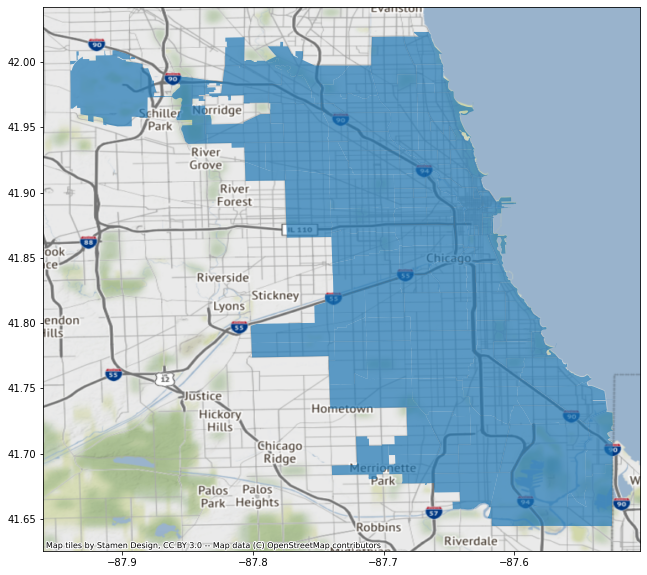

In [117]:
fig, ax = plt.subplots(figsize=(20,10)) #size
xg1.plot(ax=ax,alpha=0.7) #transparency
ctx.add_basemap(ax=ax, crs=xg1.crs) #adding basemap 
plt.show()

In [118]:
xg3=pd.read_csv('Crimes_-_2001_to_Present.csv')
xg3.head()#top 5 elements

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Longitude,Location,Historical Wards 2003-2015,Zip Codes,Community Areas,Census Tracts,Wards,Boundaries - ZIP Codes,Police Districts,Police Beats
0,10224738,HY411648,09/05/2015 01:30:00 PM,043XX S WOOD ST,0486,BATTERY,DOMESTIC BATTERY SIMPLE,RESIDENCE,False,True,...,-87.670000,"(41.815117282, -87.669999562)",29.0,14924.0,59.0,706.0,3.0,37.0,23.0,108.0
1,10224739,HY411615,09/04/2015 11:30:00 AM,008XX N CENTRAL AVE,0870,THEFT,POCKET-PICKING,CTA BUS,False,False,...,-87.765400,"(41.895080471, -87.765400451)",4.0,4299.0,26.0,562.0,45.0,5.0,25.0,67.0
2,11646166,JC213529,09/01/2018 12:01:00 AM,082XX S INGLESIDE AVE,0810,THEFT,OVER $500,RESIDENCE,False,True,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,10224740,HY411595,09/05/2015 12:45:00 PM,035XX W BARRY AVE,2023,NARCOTICS,POSS: HEROIN(BRN/TAN),SIDEWALK,True,False,...,-87.716650,"(41.937405765, -87.716649687)",15.0,21538.0,22.0,216.0,12.0,39.0,7.0,168.0
4,10224741,HY411610,09/05/2015 01:00:00 PM,0000X N LARAMIE AVE,0560,ASSAULT,SIMPLE,APARTMENT,False,True,...,-87.755121,"(41.881903443, -87.755121152)",11.0,22216.0,26.0,696.0,23.0,32.0,25.0,81.0


In [119]:
xg3.columns

Index(['ID', 'Case Number', 'Date', 'Block', 'IUCR', 'Primary Type',
       'Description', 'Location Description', 'Arrest', 'Domestic', 'Beat',
       'District', 'Ward', 'Community Area', 'FBI Code', 'X Coordinate',
       'Y Coordinate', 'Year', 'Updated On', 'Latitude', 'Longitude',
       'Location', 'Historical Wards 2003-2015', 'Zip Codes',
       'Community Areas', 'Census Tracts', 'Wards', 'Boundaries - ZIP Codes',
       'Police Districts', 'Police Beats'],
      dtype='object')

In [120]:
xg3.shape

(7656725, 30)

In [121]:
xg3.isna().sum()

ID                                 0
Case Number                        4
Date                               0
Block                              0
IUCR                               0
Primary Type                       0
Description                        0
Location Description            9686
Arrest                             0
Domestic                           0
Beat                               0
District                          47
Ward                          614847
Community Area                613476
FBI Code                           0
X Coordinate                   81441
Y Coordinate                   81441
Year                               0
Updated On                         0
Latitude                       81441
Longitude                      81441
Location                       81441
Historical Wards 2003-2015    103694
Zip Codes                      81441
Community Areas               100655
Census Tracts                  98553
Wards                         100538
B

In [122]:
#remove na values
xg2=xg3.dropna()

In [123]:
xg2.isna().sum().sum()

0

In [124]:
xg2.shape

(6932746, 30)

In [125]:
#convert to geo
#next I have converted the dataframe to GeoDataFrame
xg2= geopandas.GeoDataFrame(xg2, geometry=geopandas.points_from_xy(xg2.Longitude, xg2.Latitude)) 

In [126]:
xg2['Date']=pd.to_datetime(xg2['Date']) #convert to date

In [127]:
#get year value from date:

xg2['year']=list(xg2['Date'].dt.year)

In [128]:
len(xg2['Primary Type'].unique())# unique crimes

35

In [129]:
#this is the same step as previous one just we are adding another layer on the top
@ipywidgets.interact(year=xg2['year'].unique(),crime=xg2['Primary Type'].unique())
def plot(year,crime):

    fig, ax = plt.subplots(figsize=(20,20))
    xg1.plot(ax=ax,alpha=0.6)
    
    xgx=xg2.loc[(xg2['year']==year) & (xg2['Primary Type']==crime)]#year
    
    
    xgx.plot(ax=ax, column='Primary Type', cmap='inferno', categorical=True, legend=True,markersize=10)
    ctx.add_basemap(ax=ax, crs=xg1.crs)

    plt.show()

interactive(children=(Dropdown(description='year', options=(2015, 2014, 2020, 2019, 2022, 2012, 2011, 2013, 20…

Text(0.5, 0, 'year')

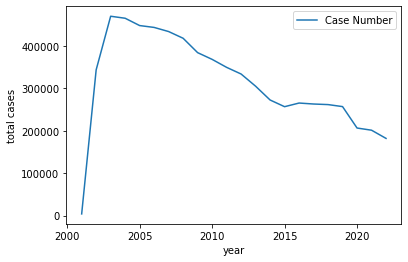

In [130]:
xg2.groupby('year').count()['Case Number'].reset_index().plot('year','Case Number') #total cases
plt.ylabel('total cases')
plt.xlabel('year')

In [131]:
#by category cases

#this is the same step as previous one just we are adding another layer on the top
@ipywidgets.interact(crime=xg2['Primary Type'].unique())
def plot(crime):

    
    xgx=xg2.loc[xg2['Primary Type']==crime]#year
    xgx.groupby('year').count()['Case Number'].reset_index().plot('year','Case Number')
    
    plt.ylabel('total cases')
    plt.xlabel('year')
    plt.show()

interactive(children=(Dropdown(description='crime', options=('BATTERY', 'THEFT', 'NARCOTICS', 'ASSAULT', 'BURG…

In [132]:
#top 5 popular crimes
xg2.groupby(['Primary Type']).count()[['ID']].sort_values(by='ID',ascending=False).head().rename(columns={'ID':'Cases count'})

,Cases count
Primary Type,
THEFT,1464275
BATTERY,1275366
CRIMINAL DAMAGE,794601
NARCOTICS,665305
ASSAULT,453619


# Metro Cities EDA

In [133]:
df = pd.read_csv('cta.csv') #read
df.head()

,STOP_ID,DIRECTION_ID,STOP_NAME,STATION_NAME,STATION_DESCRIPTIVE_NAME,MAP_ID,ADA,RED,BLUE,G,BRN,P,Pexp,Y,Pnk,O,Location
0,30082,E,Cicero (Loop-bound),Cicero,Cicero (Pink Line),40420,True,False,False,False,False,False,False,False,True,False,"(41.85182, -87.745336)"
1,30151,E,Central Park (Loop-bound),Central Park,Central Park (Pink Line),40780,True,False,False,False,False,False,False,False,True,False,"(41.853839, -87.714842)"
2,30184,W,Halsted/63rd (Ashland-bound),Halsted,Halsted (Green Line),40940,True,False,False,True,False,False,False,False,False,False,"(41.778943, -87.644244)"
3,30044,N,Cumberland (O'Hare-bound),Cumberland,Cumberland (Blue Line),40230,True,False,True,False,False,False,False,False,False,False,"(41.984246, -87.838028)"
4,30092,E,Racine (O'Hare-bound),Racine,Racine (Blue Line),40470,False,False,True,False,False,False,False,False,False,False,"(41.87592, -87.659458)"


In [134]:
df.loc[df['MAP_ID']==40940]

,STOP_ID,DIRECTION_ID,STOP_NAME,STATION_NAME,STATION_DESCRIPTIVE_NAME,MAP_ID,ADA,RED,BLUE,G,BRN,P,Pexp,Y,Pnk,O,Location
2,30184,W,Halsted/63rd (Ashland-bound),Halsted,Halsted (Green Line),40940,True,False,False,True,False,False,False,False,False,False,"(41.778943, -87.644244)"
243,30183,E,Halsted/63rd (Harlem-bound),Halsted,Halsted (Green Line),40940,True,False,False,True,False,False,False,False,False,False,"(41.778943, -87.644244)"


In [135]:
df.shape

(300, 17)

In [136]:
df.isna().sum().sum() #no null value

0

In [137]:
df['DIRECTION_ID'].unique()

array(['E', 'W', 'N', 'S'], dtype=object)

In [138]:
len(df['MAP_ID'].unique()) #143 stations but we have 300 rows

143

In [139]:

station=[]
RED=[]
BLUE=[]
G=[]
BRN=[]
P=[]
Pexp=[]
Y=[]
Pnk=[]
O=[]
Location=[]
for i in list(df['MAP_ID'].unique()):
    #print(i)
    #print(len(df.loc[df['MAP_ID']==i]))
    
    at=df.loc[df['MAP_ID']==i]
    
    station.append(at['STATION_NAME'].unique()[0])
    RED.append(any(list(at['RED']))) # or value
    BLUE.append(any(list(at['BLUE']))) # or value
    G.append(any(list(at['G']))) # or value
    BRN.append(any(list(at['BRN']))) # or value
    P.append(any(list(at['P']))) # or value
    Pexp.append(any(list(at['Pexp']))) # or value
    Y.append(any(list(at['Y']))) # or value
    Pnk.append(any(list(at['Pnk']))) # or value
    O.append(any(list(at['O']))) # or value
    Location.append(at['Location'].unique()[0])
    #print('----------')

In [140]:
# initialize data of lists.
data = {
    'STATION_NAME':station,
    'RED':RED,
    'BLUE':BLUE,
    'GREEN':G,
    'BROWN':BRN,
    'PURPLE':P,
    'PURPLE EXP':Pexp,
    'YELLOW':Y,
    'Pnk':Pnk,
    'O':O,
    'Location':Location
       }
  
# Create DataFrame
df_station = pd.DataFrame(data)

In [141]:
df_station.head()

,STATION_NAME,RED,BLUE,GREEN,BROWN,PURPLE,PURPLE EXP,YELLOW,Pnk,O,Location
0,Cicero,False,False,False,False,False,False,False,True,False,"(41.85182, -87.745336)"
1,Central Park,False,False,False,False,False,False,False,True,False,"(41.853839, -87.714842)"
2,Halsted,False,False,True,False,False,False,False,False,False,"(41.778943, -87.644244)"
3,Cumberland,False,True,False,False,False,False,False,False,False,"(41.984246, -87.838028)"
4,Racine,False,True,False,False,False,False,False,False,False,"(41.87592, -87.659458)"


In [142]:
#in this step I'm converting the location column to 2 different part which are latitude and longitude
lat=[]
long=[]
for i in range(0,len(df_station)):
    s=df_station['Location'][i].split(',')
    lat.append(float(s[0][1:]))
    long.append(float(s[1][:-1]))
df_station['lat']=lat
df_station['long']=long

In [143]:
#next part is to unpivot the dataframe, for this I have used dataframe.melt function
df2=df_station.melt(id_vars=['STATION_NAME','lat','long'],var_name='line',value_name='value')
df_final=df2.loc[df2['value']==True]
del df_final['value'] # we do not need this column

In [144]:
df_final #after the above step we get this dataframe

,STATION_NAME,lat,long,line
16,Loyola,42.001073,-87.661061,RED
17,47th,41.810318,-87.630940,RED
18,Bryn Mawr,41.983504,-87.658840,RED
20,Howard,42.019063,-87.672892,RED
24,95th/Dan Ryan,41.722377,-87.624342,RED
...,...,...,...,...
1253,Adams/Wabash,41.879507,-87.626037,O
1265,Midway,41.786610,-87.737875,O
1275,LaSalle/Van Buren,41.876800,-87.631739,O
1279,Washington/Wells,41.882695,-87.633780,O


In [145]:
df_final.loc[df_final['STATION_NAME']=='State/Lake']

,STATION_NAME,lat,long,line
426,State/Lake,41.88574,-87.627835,GREEN
569,State/Lake,41.88574,-87.627835,BROWN
855,State/Lake,41.88574,-87.627835,PURPLE EXP
1141,State/Lake,41.88574,-87.627835,Pnk
1284,State/Lake,41.88574,-87.627835,O


In [146]:
#Stations on particular line
df_final.groupby('line').count().sort_values(by='lat')

,STATION_NAME,lat,long
line,,,
YELLOW,3,3,3
PURPLE,9,9,9
O,16,16,16
Pnk,22,22,22
PURPLE EXP,26,26,26
BROWN,27,27,27
GREEN,30,30,30
BLUE,33,33,33
RED,33,33,33


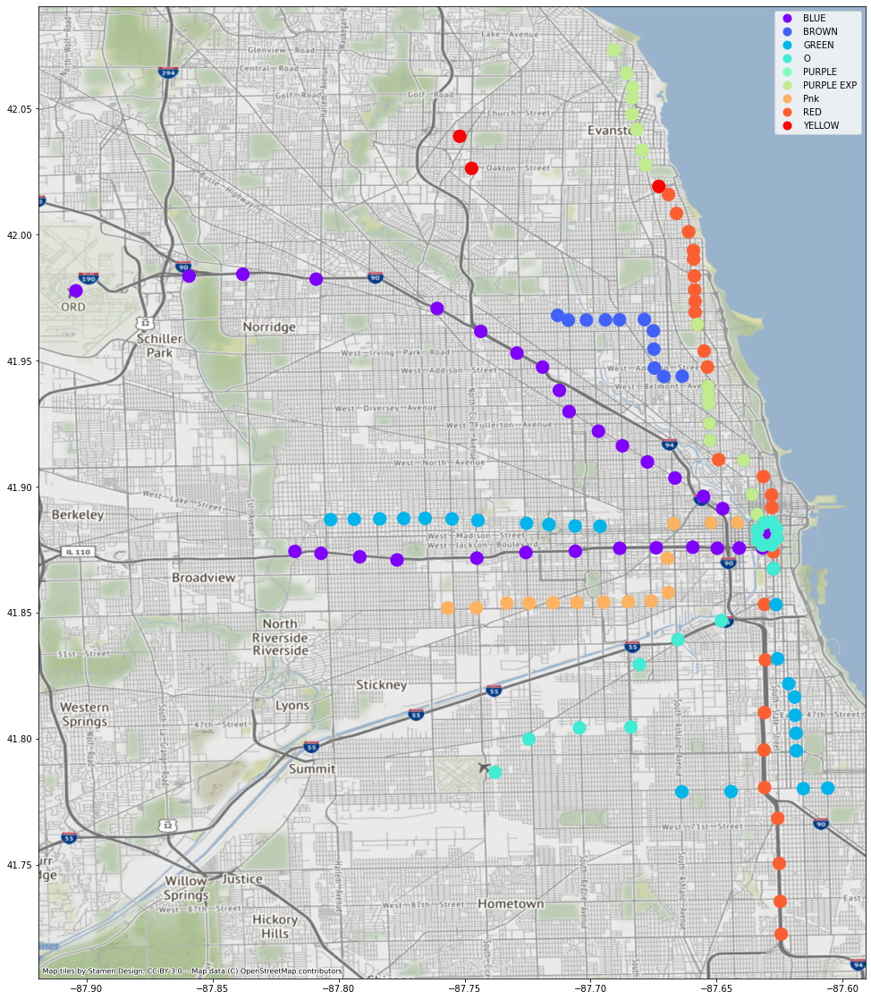

In [155]:
plot_metro=geopandas.GeoDataFrame(df_final, geometry=geopandas.points_from_xy(df_final.long, df_final.lat))

fig, ax = plt.subplots(figsize=(20,20))
plot_metro.plot(ax=ax, column='line', cmap='rainbow', categorical=True, legend=True,markersize=200)   
ctx.add_basemap(ax=ax, crs=xg1.crs)
plt.show()

plan is to draw a circle of a given radius around the metro stations

In [164]:

from geographiclib.geodesic import Geodesic
geod=Geodesic.WGS84
#geod.Inverse(41.867405,-87.626590,41.885737,-87.630886)['s12'] #in meters

In [165]:
df_final1=df_final.reset_index() #reset index
del df_final1['index']

In [166]:
df_final1

,STATION_NAME,lat,long,line
0,Loyola,42.001073,-87.661061,RED
1,47th,41.810318,-87.630940,RED
2,Bryn Mawr,41.983504,-87.658840,RED
3,Howard,42.019063,-87.672892,RED
4,95th/Dan Ryan,41.722377,-87.624342,RED
...,...,...,...,...
194,Adams/Wabash,41.879507,-87.626037,O
195,Midway,41.786610,-87.737875,O
196,LaSalle/Van Buren,41.876800,-87.631739,O
197,Washington/Wells,41.882695,-87.633780,O


In [20]:
cases=xg2[['geometry','Year','Primary Type','Date']].reset_index()
del cases['index']

In [21]:
cases['long']=(cases['geometry'].x).astype(str)
cases['lat']=(cases['geometry'].y).astype(str)

In [22]:
cases['val']=cases['lat']+' '+cases['long']

In [23]:
t1=cases.groupby(['val','Year','Primary Type','Date']).count()[['geometry']]

In [24]:
t1

geometry
val                        Year Primary Type        Date                         
41.644588224 -87.616081074 2008 CRIMINAL DAMAGE     2008-04-06 17:30:00         1
41.644589713 -87.61587983  2006 BATTERY             2006-03-05 14:45:00         1
                           2009 CRIMINAL DAMAGE     2009-08-05 15:30:00         1
                           2010 THEFT               2010-12-23 17:00:00         1
                           2012 ROBBERY             2012-05-14 21:00:00         1
...                                                                           ...
42.022585817 -87.666121381 2007 ASSAULT             2007-07-27 19:28:01         1
                                BATTERY             2007-04-19 19:38:45         1
                           2012 MOTOR VEHICLE THEFT 2012-10-27 09:30:00         1
                           2020 BATTERY             2020-07-11 21:03:00         1
42.022709624 -87.665704214 2013 BURGLARY            2013-08-26 17:00:00         1

[6907624 rows x 1 columns]

In [25]:
c1=cases.groupby('val').count()[['geometry']].reset_index()['val'].str.split(' ', expand=True)

In [26]:
c1.head()#cases

,0,1
0,41.644588224,-87.616081074
1,41.644589713,-87.61587983
2,41.64460246,-87.611778307
3,41.644604096,-87.610728247
4,41.644607322,-87.61386736


In [27]:
c1.shape

(665711, 2)

In [190]:
final_lat=[]
final_long=[]
final_name=[]
final_line=[]
final_dist=[]
for i in range(len(c1[0])):    
    x_lat=[]
    x_long=[]
    x_name=[]
    x_line=[]
    x_dist=[]
    for j in range(len(df_final1['STATION_NAME'])):
        dist=geod.Inverse(df_final1['lat'][j],df_final1['long'][j],float(c1[0][i]),float(c1[1][i]))['s12'] #in meters
        #print(i,j,dist)
        if dist<=500:
            print(i,j,dist)
            x_lat.append(df_final1['lat'][j])
            x_long.append(df_final1['long'][j])
            x_name.append(df_final1['STATION_NAME'][j])
            x_line.append(df_final1['line'][j])
            x_dist.append(dist)
    
    final_lat.append(x_lat)
    final_long.append(x_long)
    final_name.append(x_name)
    final_line.append(x_line) 
    final_dist.append(x_dist)
# initialize data of lists.
data = {'lat':final_lat ,
        'long': final_long,
        'name':final_name,
        'line':final_line,
        'dist':final_dist
       }
  
# Create DataFrame
df = pd.DataFrame(data)
df.to_csv('file.csv')  


64056 4 495.1870614273075
64669 4 455.67683158696076
65132 4 400.3730073079633
65142 4 404.670445078781
65171 4 398.5195911455934
65226 4 465.1454834157823
65262 4 417.3138773684612
65266 4 463.6049039375516
65276 4 394.3978040841044
65291 4 415.3222095738698
65295 4 461.81012496665875
65317 4 413.44214513329945
65320 4 395.8737972157209
65333 4 388.77988922404074
65334 4 411.73779535357613
65342 4 393.7283727957861
65343 4 458.22923445330173
65374 4 409.7507658242928
65400 4 494.16932827436636
65403 4 407.7653513284246
65407 4 455.0824206894567
65420 4 492.3496273041321
65423 4 405.781305370925
65440 4 490.7315969651399
65444 4 403.79881564830174
65449 4 451.5260411701625
65468 4 378.74176462829496
65470 4 489.3478167343412
65474 4 402.21418805815034
65480 4 449.7524647128091
65489 4 487.7371071521902
65495 4 400.2351203633516
65504 4 380.64113079279167
65520 4 486.13042480124477
65524 4 398.2576801460869
65527 4 446.4670251569728
65534 4 373.1241585721088
65538 4 378.495896184844
655

68404 4 141.04758523760964
68405 4 338.73979574696455
68410 4 202.8411626496855
68412 4 287.9201999372461
68429 4 462.9410370671876
68458 4 337.9497505323477
68463 4 201.715934176887
68469 4 462.45366275249484
68486 4 337.2818544774256
68508 4 461.8936194928836
68510 4 124.62475792219449
68534 4 336.5135869192357
68564 4 335.7570418469986
68581 4 460.5061282875489
68604 4 334.7264592972845
68627 4 460.0489181988192
68671 4 334.0971684735083
68699 4 459.5241549365048
68742 4 459.00870916582693
69090 4 93.5078318948979
69092 4 94.0421721191632
69093 4 95.29048469477814
69095 4 88.91801924874491
69096 4 90.07506395061097
69097 4 90.29725773742777
69099 4 91.22130143722384
69100 4 91.70404470709018
69101 4 92.45374913091912
69102 4 95.30772481248167
69106 4 83.40771493114498
69107 4 84.12613925403323
69111 4 83.29577508323847
69116 4 86.29518181896529
69123 4 90.22697223315294
69125 4 87.92919948317198
69126 4 95.84124976841422
69137 4 499.72414288510885
69150 4 493.9680161171844
69151 4 4

71082 4 163.70819830240842
71090 4 363.4710705222095
71095 4 179.47149685655958
71114 4 164.1562691772762
71120 4 263.479606287658
71123 4 363.96939990897226
71125 4 445.7195469005067
71137 4 312.42129994792174
71151 4 164.63077331302202
71154 4 263.770607877289
71157 4 364.17659956979884
71160 4 180.33057628798088
71186 4 165.13156343994083
71188 4 264.3799598072674
71189 4 364.3960912481469
71190 4 180.82733799733077
71202 4 56.392009191659874
71204 4 55.21940605640276
71206 4 55.416416716594725
71207 4 55.81343026809199
71208 4 56.01335777035655
71214 4 54.48649415279642
71217 4 165.58141293197957
71222 4 43.51099074542905
71223 4 43.44634009541002
71224 4 264.70428528829086
71225 4 43.84023955400655
71226 4 44.629271376683356
71228 4 51.00663461690778
71229 4 364.62793536962624
71230 4 58.25869909752652
71231 4 54.642171569542384
71232 4 52.89425592401873
71234 4 181.05275577565033
71257 4 313.0239033824134
71260 4 166.42429419857672
71267 4 265.045471381595
71269 4 365.17480442638

73139 4 387.0844102811777
73140 4 435.5654516140919
73147 4 246.55065452338755
73153 4 289.1120662693687
73158 4 356.34707735179614
73161 4 293.8408213105008
73170 4 388.40926336366437
73173 4 436.71646695275405
73184 4 290.7851863405711
73185 4 248.60460254933494
73190 4 357.7639874803668
73191 4 295.33647122585376
73199 4 437.87479150259304
73207 4 292.5375863717777
73208 4 358.9840727547828
73216 4 297.0861328090137
73234 4 438.87359340186254
73239 4 391.0804213157547
73244 4 252.50363317077753
73246 4 294.295066118422
73249 4 360.63992548445486
73264 4 440.04551211410285
73266 4 392.1905877230051
73269 4 254.56064108790716
73270 4 250.03890388839855
73275 4 362.07588273418787
73286 4 393.35070633602
73288 4 441.47838232123974
73293 4 256.69906049056686
73294 4 252.14181176022032
73300 4 363.5187648996241
73303 4 302.19386699864395
73310 4 442.49411349021386
73313 4 394.710544623964
73319 4 299.5127549445558
73321 4 258.7579016594186
73329 4 364.9683550330082
73331 4 303.71078347389

85949 26 329.9215425826008
85958 26 366.68838210489434
85963 26 372.19958712481434
85964 26 372.01161898855236
85965 26 370.699952437468
85966 26 370.5131916953186
85968 26 369.21038040248976
85971 26 378.8332458810736
85972 26 376.32876475106013
85973 26 375.94570705443994
85975 26 374.4193073168766
85976 26 373.2809591160673
85980 26 384.87097549244464
85981 26 384.27672990880876
85983 26 383.4862972928747
85984 26 381.3243592820004
85985 26 379.95756214042217
85988 26 390.0468156457689
85989 26 389.23946098383624
85990 26 388.4343933365316
85991 26 387.0305411825571
85992 26 385.434283834747
85994 26 395.7382446437478
85995 26 394.29937864062316
85996 26 393.68467908684084
85998 26 391.2375368232682
85999 26 390.62866550960126
86002 26 401.75360629326565
86003 26 401.33409004392973
86004 26 400.0786943627025
86005 26 399.86990834796717
86006 26 398.6196072874349
86035 26 457.4772861112356
86037 26 462.5091211564903
86038 26 461.55642205167106
86040 26 459.41746970893126
86041 26 458

91390 26 316.66864436178747
91414 26 186.97720953111792
91450 26 317.09662481323187
91457 26 450.0930936242136
91493 26 317.5383645282559
91497 26 450.1118476900483
91543 26 450.3941360970208
91728 26 470.68477976952136
91737 26 463.19475603610067
91739 26 467.11258712882477
91750 26 444.3634397037299
91778 26 433.08113552614685
91793 26 425.61837118277856
91831 26 416.519139698139
91854 26 409.2378984212738
91863 26 407.1952798731007
91868 26 405.4535280482236
91878 26 403.7693993754331
91883 26 402.0300545400168
91894 26 400.29179906068214
91908 26 398.61292034801306
91919 26 393.17031807163465
91924 26 391.4384422984103
91928 26 389.76918271694166
91943 26 384.3504874825284
91948 26 382.6255519972517
91956 26 380.96644893974025
91960 26 379.24449427154616
91972 26 377.5896448358866
91981 26 375.93737111551775
91983 26 190.4293298416404
91986 26 374.2204354213564
91994 26 205.44843080691652
92000 26 372.27556441617145
92007 26 370.56186243452163
92054 26 360.59983745856795
92061 26 3

96435 26 417.96671913374297
96437 26 414.8342704222657
96456 26 470.6684939061194
96460 26 477.82225145989054
96462 26 473.77876548548284
96463 26 472.8841635162201
96471 26 491.6714122104579
96472 26 486.39761504289936
97386 26 369.7798866952724
98078 26 404.52369729210454
98105 26 406.6474570476762
98132 26 408.4679210447786
98141 26 440.70754062352563
98147 26 412.90053176568574
98168 26 442.68418592604456
98191 26 444.6622818794636
98213 26 414.8115565954837
98218 26 446.6417776022902
98240 26 448.622717496168
98264 26 450.2092755587681
98287 26 420.8813952714294
98293 26 452.193282573846
98318 26 423.00605369198627
98342 26 425.10329604808896
98349 26 456.165316161653
98368 26 426.9245955313297
98373 26 457.8691755777398
98389 26 431.82322783171134
98401 26 459.85831657021834
98410 26 433.9272758553617
98417 26 431.17476408044104
98422 26 461.7393346411242
98474 26 465.7249036245363
98483 26 439.9403262177212
98497 26 467.4344593384068
98522 26 469.4301395175152
98549 26 441.47160

119644 10 288.53794464115526
119650 10 423.68675513975523
119653 10 339.69186613586766
119660 10 271.63561907992414
119663 10 410.0570883468082
119667 10 387.27963143065534
119670 10 230.09664435985894
119693 10 287.1280105382791
119708 10 409.0498725099753
119712 10 269.8713500281843
119714 10 227.7721652658382
119716 10 228.02831609010283
119732 10 285.4892373912628
119742 10 421.41511227868995
119744 10 336.86574887435114
119745 10 268.36350774729374
119751 10 225.69406628646678
119752 10 384.6088513875659
119774 10 283.85695313557335
119777 10 335.4641485659058
119778 10 266.783468432921
119780 10 406.72213106662156
119788 10 223.6873044694653
119789 10 383.41063822029355
119791 10 223.8190852515802
119809 10 499.57620294996786
119811 10 282.033411211121
119816 10 334.2689999072271
119824 10 265.0359735852905
119825 10 382.39009582789106
119826 10 222.0487398125863
119831 10 221.61198280561007
119855 10 280.4134788819699
119865 10 418.4846345454313
119866 10 333.113929810184
119879

124795 10 313.83747038313345
124819 10 461.64946072261114
124824 10 447.432677009241
124828 10 180.3820612362322
124834 10 260.56940760193066
124844 10 160.96463811000643
124853 10 313.6519378729011
124869 10 461.51895429999956
124874 10 447.3291835874004
124889 10 364.48081614584135
124894 10 180.05898117334974
124895 10 260.621165866174
124903 10 160.57409888946728
124906 10 313.50424824814047
124933 10 461.3758962891359
124934 10 447.21791952527366
124936 10 179.80178256053472
124942 10 260.41998258410723
124945 10 348.48381301755813
124966 10 313.3454997022046
124971 10 32.74841970767086
124979 10 461.5467907497498
124983 10 179.22226325173517
124988 10 260.2013061655948
124999 10 159.92188603752834
125017 10 312.89699889111023
125033 10 461.42347258052746
125041 10 446.7212674863201
125044 10 178.96977570625637
125052 10 259.99995482164917
125057 10 348.1625332759645
125061 10 159.61031727372384
125068 10 312.76696909702366
125096 10 461.30990640784495
125104 10 363.8779064348488


127551 10 416.18975101942567
127614 10 488.44089419262104
127616 10 486.93418472317904
127617 10 485.72885852897997
127619 10 484.2223277135422
127620 10 483.0171742935748
127629 10 497.8299010035048
127630 10 496.6240816459947
127631 10 495.1169446548537
127632 10 493.9112733142608
127633 10 492.40432289001916
127635 10 491.1988020227958
127636 10 489.69204127056213
127649 10 499.3821884618761
127922 10 179.26083212504892
127974 10 101.58675254795945
128069 10 96.99713264614675
128517 10 111.26970220705425
128760 10 194.81549595559756
128806 10 195.66598719429928
128829 10 126.9257750090154
128862 10 196.52455293185824
128872 10 208.06887369056057
128883 10 128.2634570805827
128916 10 129.48091967478294
128931 10 123.43653707902551
128961 10 330.295832124813
128970 10 470.17956374525437
128971 10 124.85996633038746
128994 10 199.14801051715472
129003 10 132.17197251920336
129009 10 126.28584438849649
129016 10 199.8595136447867
129040 10 133.5231917724679
129045 10 127.71388552987798


135426 10 410.94364504460395
135437 10 443.72542964538144
135454 10 413.06888264506205
135476 10 445.70314271103007
135499 10 414.8904894709447
135513 10 447.6822556293012
135559 10 449.6628129015323
135589 10 426.3115451617414
135617 10 450.75183824785694
135660 10 429.95253339639953
135948 10 440.7050964610618
135980 10 464.45792559306244
136019 10 444.4098856365793
136247 10 449.82517194521904
136437 10 499.97893922417325
136442 10 496.24525954071174
136443 10 497.56364504728225
136444 10 498.6564917599472
136445 10 498.90104765153535
136447 10 493.94846440372226
136448 10 495.2275653177635
136459 10 482.4480153329256
136468 10 478.55758399124284
136469 10 474.4235173272025
136470 10 474.73320094434047
136471 10 475.3613853210299
136472 10 475.52024507784233
136481 10 473.21484370193394
136482 10 473.50964163828155
136483 10 473.807373886952
136484 10 474.10807418203007
136566 10 470.0212391335303
136569 10 473.2500483891892
136573 10 472.6006842920753
136577 10 474.9294321796403
13

162053 31 411.4511047256515
162054 31 410.6481715996874
162055 31 409.84720749761414
162056 31 409.0483085756091
162057 31 408.4505046794939
162058 31 407.655333975735
162060 31 407.06027686772285
162063 31 418.1326048939002
162065 31 417.10738747281766
162066 31 416.49371680053565
162067 31 415.47345445917165
162068 31 414.86274092575866
162070 31 414.0501865375402
162071 31 413.44208915309065
162072 31 412.6330407815922
162077 31 418.3185905381109
162080 31 424.11233520946325
162084 31 433.2120627977241
162105 31 482.8129008792264
162106 31 481.63406465786943
162107 31 480.69244549503696
162112 31 488.78278022255313
162113 31 487.8313470637714
162114 31 486.88110737196115
162115 31 485.69500146245997
162116 31 483.5647078304395
162121 31 495.0478321911528
162123 31 494.08815803853645
162124 31 492.8901771220081
162125 31 491.93302694000147
162126 31 490.7383730246939
162127 31 489.78391083386657
162131 31 499.1942393400764
162133 31 497.98809146045494
162134 31 497.0243102035239
1621

166202 31 330.9626473304122
166220 31 146.2424067473519
166222 31 297.20710443484427
166224 31 300.5333791252875
166225 31 302.47719071142217
166226 31 286.32033450924587
166227 31 288.5201497891964
166228 31 289.6215275087153
166229 31 290.1725697263731
166231 31 292.9312317689836
166232 31 146.31929225676387
166233 31 293.4836568639831
166236 31 277.6977373356468
166237 31 277.9706138114906
166238 31 279.33627996097323
166239 31 279.6096254412226
166240 31 280.97724439242035
166241 31 281.5246720172429
166242 31 284.54043642978854
166243 31 284.81491045471864
166247 31 269.40181597388016
166248 31 271.0288167585291
166250 31 272.6584486858234
166251 31 274.5627695027556
166252 31 275.92505262425067
166256 31 146.31379182687172
166260 31 146.39893593977513
166268 31 146.48729346202038
166273 31 220.02734218617314
166274 31 150.95456402919794
166276 31 148.358840518149
166277 31 201.48823972751464
166278 31 148.71629166751916
166279 31 204.42553715316066
166280 31 205.6561897572334
166

169132 31 211.0862764529047
169135 31 329.20546364599784
169136 31 68.81703708515089
169148 31 196.22105724946653
169158 31 344.2897809611626
169164 31 460.47566165503525
169165 31 211.28871036492146
169174 31 329.36684453796664
169175 31 69.51969788258617
169184 31 196.48505634175112
169189 31 344.41767919762543
169191 31 211.4792060683667
169200 31 329.54196757751885
169201 31 70.28005220500043
169216 31 196.47014989333266
169217 31 82.26518827632364
169224 31 344.5588248443367
169227 31 460.72142288683597
169228 31 212.02380761537466
169237 31 329.3995205172108
169245 31 70.81648149163226
169251 31 196.78008661961135
169253 31 344.69019353096303
169258 31 212.28654107717583
169261 31 448.09924227545287
169262 31 329.6002673354522
169272 31 71.6901667417826
169278 31 197.06382490748487
169279 31 83.57205876446098
169283 31 460.65191738048685
169286 31 460.67450671115296
169301 31 212.5704320014478
169310 31 329.8147865355986
169315 31 72.61604779871158
169316 31 197.4157389879625
169

172507 31 374.76467395906917
172511 31 282.9130618003182
172512 31 283.1442864855923
172515 31 267.5718200803814
172518 31 195.40194714997125
172540 31 375.5812171018331
172542 31 284.53883487674074
172544 31 394.1737783826236
172546 31 268.86077672931737
172552 31 197.45040006669595
172556 31 205.86928300553063
172560 31 494.2063744867351
172570 31 376.51387007082184
172571 31 285.7415509018403
172576 31 270.3748552761627
172579 31 199.12371964687532
172585 31 494.9246319031686
172593 31 207.94780558277708
172608 31 377.61027961466147
172610 31 287.1530613533451
172615 31 271.89718655189375
172618 31 201.17627575307696
172623 31 209.6276902260555
172626 31 495.76976466283696
172638 31 378.7155352319519
172642 31 288.5733812445668
172645 31 397.0818595449679
172646 31 273.20855103090577
172647 31 216.08859004904377
172661 31 496.6225054497729
172680 31 289.7977483731461
172681 31 379.829502262594
172682 31 274.7460095183739
172698 31 497.48305460698975
172711 31 380.5325114838708
17271

176981 31 416.71277999626744
177000 31 454.8052856353472
177008 31 468.98157672166167
177015 31 418.49502721479325
177045 31 456.75816427387673
177063 31 420.61500454343724
177086 31 458.31135962258315
177106 31 472.47783692923247
177138 31 460.2677636970828
177149 31 474.36338881574994
177154 31 424.55237415358596
177184 31 462.225735642091
177189 31 426.369837564584
177191 31 476.39299611590604
177224 31 463.90511910491
177232 31 428.4902131458423
177233 31 478.28214759355257
177261 31 465.8659504484319
177266 31 430.274514955101
177273 31 480.1734448789965
177300 31 467.7090082300058
177308 31 432.3952836719008
177310 31 481.79614436155737
177346 31 469.39255590638476
177353 31 434.2132962752905
177362 31 483.691179906791
177379 31 434.6067686271564
177386 31 441.0232752274765
177390 31 471.35815289831464
177397 31 436.3344146977774
177407 31 485.7274250555242
177433 31 473.32517205315213
177437 31 438.15251120897716
177471 31 444.96597350604065
177536 31 476.86518901281494
177562 3

185878 71 478.50308440306753
185886 71 428.4715367984552
185887 71 398.0516397730658
185888 66 494.5357983206083
185890 66 422.96860070725666
185891 71 391.93232895722446
185892 66 465.34592046650664
185893 71 412.9080682077882
185903 71 454.9305107923905
185911 66 419.3752404223329
185920 71 476.5910896114773
185926 66 492.88398201519306
185928 71 426.530995960291
185933 71 395.9587376640707
185935 66 420.9449169439015
185941 71 389.8228693187116
185944 66 463.50449959623364
185945 71 410.98134103598875
185951 66 399.23056723364164
185954 66 400.2792032057017
185958 66 417.25470835911767
185966 71 474.8594647193801
185969 66 491.1709509982469
185975 71 424.5921709279293
185977 71 393.8065903612517
185978 66 418.92245601249084
185979 71 387.69382788978453
185981 66 461.6655943636646
185991 66 415.52046860157094
185996 66 467.3627714187898
185998 71 473.37780038296916
186001 66 395.9137554405535
186003 66 489.46127440968417
186004 71 422.52718026357906
186007 71 391.71413915876644
18600

187984 70 448.4275394682279
187991 66 335.86761685059605
188000 66 332.40254659395055
188004 70 459.10724008399035
188007 66 328.30379410448705
188009 66 329.2088268071759
188011 66 330.14532071673904
188013 90 478.61087861555
188014 90 467.45863008040897
188017 66 327.13595273936505
188018 70 490.6528465346719
188021 66 322.89163036470416
188024 66 324.34194615266915
188029 66 321.27518682485635
188041 66 315.1450995825631
188044 70 446.29411133842865
188047 66 314.22996065176596
188048 66 314.1987825636891
188049 66 314.1785028282587
188050 90 477.15676201522405
188051 66 314.1609929593706
188052 66 314.14163708242813
188054 70 457.3273732708872
188055 66 314.32742199400707
188056 90 476.82157896964753
188057 66 314.2595998475964
188058 66 314.11068715997766
188059 66 314.0717664974638
188060 66 314.0240089893857
188061 66 313.991290685057
188062 66 313.9518037104671
188065 70 488.9923667415144
188068 90 465.3252013954342
188089 66 321.25465749203534
188097 66 324.5380462397707
18810

189776 90 392.99653547119965
189777 90 392.64029852634906
189779 71 356.42467740563234
189782 90 395.02345808471273
189783 90 394.4731713818155
189784 90 393.96196750157947
189785 90 393.52488300504336
189788 90 396.6069497226903
189789 90 395.9399296923207
189790 90 395.3114995507627
189796 90 398.4775905220111
189797 71 286.7842413208365
189799 90 397.7568905701143
189801 71 232.13542837645423
189803 71 240.469479721391
189805 71 267.4301297204785
189810 90 410.79727678544805
189812 90 413.8246572219574
189814 90 413.4110830708288
189815 90 412.8985867745476
189816 90 412.39098020849923
189817 90 411.88851852146473
189818 71 329.6407599771899
189819 90 411.49012851778195
189820 90 410.9967100805197
189825 90 417.6270864444487
189826 71 407.6054793573562
189827 90 417.07302822844514
189828 90 416.5237790771719
189830 90 416.0878557283689
189831 90 415.5472890366705
189833 90 415.01168975659084
189834 90 414.58675281805813
189835 90 414.0599024384946
189839 71 493.4248400657806
189843 

190920 66 246.01647725063975
190926 71 305.8606605943728
190944 71 388.46586907982515
190952 71 478.15801221680164
190961 71 418.18510218450916
190964 71 331.85305223628905
190969 71 255.93703860891188
190972 71 203.28645668559474
190973 66 313.479587400515
190974 66 349.4318475567788
190975 66 244.51070399241107
190976 71 193.35501814593107
190978 66 396.32423909751367
190980 71 235.04364173727953
190981 66 486.0386971439242
190982 71 304.51021296366594
190985 66 203.09257972866843
190988 71 387.401848097254
190991 66 236.10056206167948
190997 71 417.2280814812482
191002 71 330.6422479312318
191011 71 254.3600224515627
191017 71 201.18264212219077
191019 66 312.1093610767277
191024 66 348.2293033492011
191025 71 233.55620910736602
191026 66 242.7595034866281
191028 71 191.2983555994909
191029 66 395.23800218534996
191031 66 485.428133259502
191035 71 303.1687653651952
191052 71 416.1414287655001
191059 70 384.35337449781713
191063 71 329.1885490853177
191065 71 252.7911200504951
19107

192125 70 411.99833871472185
192128 70 490.224188190684
192129 25 385.6569108499548
192135 90 430.0191600919392
192141 70 317.5714394780306
192146 70 283.501367364346
192156 90 366.1164188528627
192160 25 469.3487364991501
192165 66 156.64148502482402
192167 25 328.6287664894657
192168 70 300.124683502297
192170 25 334.87722878644234
192172 90 320.7056815745623
192174 71 492.0448993812398
192176 71 498.74615524790215
192178 70 346.07309216965604
192179 90 302.5319085521895
192180 71 485.2610574631834
192182 70 410.750253221069
192191 70 489.005345177285
192195 71 437.41600995242976
192199 90 428.50267807405993
192208 70 315.65997467633593
192209 70 281.36658000049675
192212 71 420.5545072972593
192217 90 364.34111284269005
192219 71 398.17653426724917
192220 71 399.5991784713973
192221 71 401.022567124599
192222 71 403.8715077552141
192224 71 406.4380877606688
192225 71 407.86490356775
192228 90 464.3204134668228
192232 70 298.11881656342644
192233 71 389.828565586733
192234 71 391.247

192982 70 476.00095672561906
192982 90 493.1337074103874
192996 90 413.2506468875761
193006 70 258.810890164418
193015 90 346.1789439809367
193024 90 375.5317267887316
193026 70 295.66224931983373
193040 90 297.6398505184288
193044 70 276.52388399379976
193045 70 325.9639127947298
193048 90 277.8410226848835
193053 70 393.8800029986294
193055 90 449.1380214124294
193062 70 474.8566103041793
193062 90 491.9135863431821
193067 90 411.800251210743
193072 70 294.0570915889881
193074 70 256.6765736721934
193079 90 344.4538078661082
193082 90 373.9647031602462
193087 70 274.82312230262704
193091 90 295.64037322044817
193092 90 276.01233031027783
193094 70 324.2886015206585
193095 90 448.0226847628109
193108 70 392.5012867308213
193133 70 473.719098930545
193133 90 490.6998396584724
193149 90 410.35582259250145
193160 70 292.33518093851654
193166 70 254.54297891761473
193172 90 342.73335944458915
193176 90 372.1951761379134
193178 70 272.8411248002901
193181 90 293.64288733139136
193182 90 27

194021 25 270.5357905935587
194023 25 271.26541196644496
194024 25 272.06991119705873
194025 25 272.94864350216864
194035 90 240.9590057952498
194053 90 346.73161602532014
194081 90 345.4842544074748
194109 90 255.86364135783026
194113 70 258.88475469051247
194114 71 476.0574067376253
194145 70 257.35997759154543
194176 90 252.51491080574155
194217 66 255.6660488541556
194221 70 253.98891703701685
194240 90 249.0500086732858
194259 66 255.30446876442159
194264 70 252.22732156531129
194273 71 249.14447404921475
194284 66 255.03024302567198
194307 70 250.47151134124792
194308 90 245.71730439412832
194328 66 238.60709395547298
194345 66 254.05039457475218
194350 70 248.72174758640512
194375 90 242.39396744743576
194384 70 247.22663635794947
194395 66 253.36327141715392
194419 70 245.6654532801038
194425 66 237.5555528703326
194448 90 238.95051177945456
194460 71 151.19993316141094
194461 70 243.93448241509955
194496 70 242.20989439946283
194503 71 345.01389136111754
194506 90 235.92031599

195379 71 71.25209938457729
195381 90 322.250599994309
195382 66 285.42377984005344
195383 66 461.6949750762281
195387 66 285.3892148080082
195409 25 491.026037049403
195413 71 143.192205657807
195414 71 342.2051573972211
195419 71 469.79285023865947
195422 71 242.57760558354823
195430 70 219.914458667233
195431 71 43.28911963557277
195433 66 347.1105546565657
195437 71 441.95238610730064
195438 70 165.8712462612469
195439 66 285.25433444213013
195441 71 168.80280041102802
195443 71 268.7405018377842
195447 66 461.27181609403965
195451 71 70.52966174128154
195471 71 143.17607187371
195472 66 148.4044596415803
195476 71 242.3861861065974
195478 66 285.09300453580016
195481 71 342.0421237323694
195483 71 469.7031658008179
195484 66 346.9248618605695
195487 71 242.3556529369058
195488 71 441.842317349886
195492 71 368.9484144240663
195496 66 461.17808380007796
195498 70 218.50470065120788
195499 71 42.1203711040025
195505 71 168.5299700984934
195507 71 69.95633881134076
195516 66 284.9396

196565 66 44.14026801121734
196567 71 267.2027321969408
196571 66 447.3384014217018
196572 71 166.89582342547646
196576 71 67.42156419309461
196579 25 184.09078185875686
196584 25 378.9656329551932
196599 71 40.52953224992174
196600 71 468.8725738134576
196601 70 124.13179780208945
196603 71 367.77159061281543
196605 66 44.46225835357582
196606 71 267.3493379830029
196608 66 447.66053189808997
196609 71 167.12259447129387
196615 71 67.96192268675115
196638 70 122.60839280792635
196645 66 64.0187918205087
196646 71 367.8757388244408
196648 25 181.00136471734348
196651 71 468.97133889340626
196657 71 167.33842727021826
196660 66 44.88355246041677
196661 71 267.51288072241397
196665 66 447.6880430647648
196670 71 68.56444381622805
196672 25 377.1740086782245
196677 70 120.78021178858206
196684 90 140.0913549410713
196687 71 368.0087210594675
196690 66 45.3215354176195
196693 66 447.7197056611323
196694 71 167.6150446462322
196718 25 376.2230452535869
196720 70 118.95205025446192
196741 66

197688 90 362.70619368722754
197689 71 102.71909867385085
197691 71 105.83087929115712
197693 90 322.4731224262649
197694 71 108.99794211117415
197698 71 96.88597320096451
197699 71 99.86523386653694
197703 90 229.32682672808448
197704 66 286.88653419979755
197705 71 91.36942077025422
197706 25 360.4583291264982
197707 71 94.18994480200918
197713 90 144.71255844010878
197714 90 266.147780056393
197715 70 121.6400338066198
197716 70 209.62642029731742
197717 90 94.72398430245487
197718 90 460.8306560919588
197722 66 132.51755140394138
197723 70 303.8350182134434
197725 70 402.9447757480509
197725 90 420.0653405326091
197728 25 479.0275683951752
197730 90 321.82904857018457
197732 90 362.08983606214645
197733 90 228.4317204700545
197735 70 120.53463663427065
197738 90 143.30787156027856
197739 90 265.4111402708533
197740 90 92.89658547236594
197745 70 208.8910630340374
197752 70 303.33668525659965
197754 71 68.94248517445637
197755 90 460.0578488572473
197757 71 69.9977114411938
197760 7

198345 70 499.78438873401353
198345 90 316.41549277438213
198351 66 496.30768153053845
198359 66 484.91723232002084
198360 66 488.8293351653735
198362 66 492.4413221422472
198366 66 481.0549024313563
198369 90 130.19090016151083
198370 90 257.9861707594766
198373 90 455.7532701493157
198375 70 107.84040203359812
198377 70 201.74185266765357
198378 25 119.69409562511322
198381 90 70.09249810607228
198382 25 226.6106430287122
198385 66 467.6759645961742
198386 70 298.34888349734234
198388 90 356.2994255683466
198392 70 398.74462805561126
198392 90 415.63640354256574
198398 70 499.58835635737165
198398 90 315.9258395689761
198401 90 219.8983994226389
198404 70 107.01478829474293
198406 90 257.4308588307669
198407 90 68.26709439343021
198409 90 455.4477468979636
198412 70 201.2395990518979
198414 66 318.3472605883635
198415 66 321.2945487131616
198416 66 324.53878878134356
198420 66 305.7778456855241
198421 66 309.0096055986822
198423 66 312.2439468070018
198424 70 298.0181755404183
198426

198937 70 497.9593840945101
198937 90 312.5443879176346
198949 90 215.27244957383178
198951 90 352.8298651373293
198956 90 120.67143378756597
198958 90 252.70309794992448
198959 90 49.776624669338375
198969 70 396.29587785066866
198969 90 413.1588535319922
198974 90 452.50416483242924
198983 90 112.40352475721141
198985 70 497.85146447369505
198985 90 312.19033995643923
198987 90 214.8407676075931
199000 25 494.70841192864043
199001 25 495.3105689471042
199002 25 496.2138465711743
199003 25 496.8161472677865
199004 25 498.3217553529433
199005 90 352.5531429953779
199010 25 487.4355765527624
199011 25 488.03757037851875
199012 25 488.94070329053056
199014 25 490.4458643856862
199015 25 490.74697955624237
199016 25 491.95122319877385
199017 25 492.25227916470607
199018 90 119.79498192725465
199020 90 252.31147568259166
199022 90 47.653248867463475
199027 25 476.2527026350166
199028 25 477.456130356368
199029 25 477.7570861174704
199031 25 481.9698643622002
199032 25 483.1737465809604
199

199690 70 250.42556212101442
199691 70 254.99686384101167
199692 70 259.5682654502991
199701 71 219.72177660661976
199705 70 232.45607739026866
199707 70 237.02715746650617
199708 71 159.97611917097785
199710 70 227.8913350804385
199714 70 186.18156571327995
199717 70 177.96736852875662
199718 90 101.61234205400807
199722 70 168.84138339124206
199731 70 158.50006058578063
199732 70 158.80463455385947
199733 70 161.84968215552792
199735 70 162.45868348694532
199737 70 165.19934391472168
199744 70 154.86016960011173
199752 71 205.24875815784893
199753 70 114.16315175420513
199754 70 117.20293401491647
199756 70 102.94605330150816
199757 70 104.76827359402908
199758 70 107.80572676015946
199759 70 108.71705815107188
199760 70 110.84376474545847
199761 70 111.45150535012506
199765 70 94.17138679251431
199766 70 95.38489161367472
199767 70 98.41941713077746
199768 70 99.93689946316185
199771 70 101.75821725202408
199774 70 85.7140224097503
199775 70 86.01697278928856
199776 71 467.206378496

200322 90 33.77044572143102
200323 71 402.6255807581621
200325 90 39.91939096896081
200326 71 295.8690677335407
200329 25 140.57537210761268
200332 71 382.64114736371255
200333 71 176.3317099666524
200339 25 140.54173953240556
200345 25 341.58764608604133
200347 71 236.70842997758504
200348 25 66.51151221151349
200353 71 474.56197898058423
200354 71 182.86282859903355
200364 90 27.01299021447055
200365 90 23.79332033259742
200368 25 75.7474363468247
200369 90 37.83706835374681
200370 90 34.11533495339251
200371 25 66.03242304367895
200373 90 30.73319877034028
200375 71 492.0944693213898
200378 90 48.716422294145595
200380 90 45.19394306717356
200382 71 222.81481048194433
200383 90 41.40427189297916
200384 71 403.42054849999266
200388 90 60.0427392108754
200390 90 56.17990280104279
200391 90 52.627418090688316
200392 25 140.38337174781893
200393 25 341.5157314665165
200394 90 71.15297667382946
200395 90 67.56271157898395
200396 90 63.681992763855185
200397 71 297.09791805355184
200400 9

201387 71 487.4463882497709
201388 70 423.69687206463425
201397 70 63.53160954758799
201411 71 248.3938196498554
201413 66 491.78249420848886
201415 71 333.16918703737
201423 71 417.70182480275247
201426 71 261.2150908397926
201427 70 407.32773207701024
201429 71 208.971891105004
201433 71 316.9945818112126
201436 71 213.97719391093437
201438 71 399.38069816260065
201445 66 299.0299946354586
201448 71 488.2002460314964
201455 66 307.53665220343277
201456 66 305.9086347904804
201457 66 304.2868754204786
201468 66 314.53794462378073
201469 66 311.2401503105046
201472 25 66.47135272983961
201475 25 170.68643243658838
201481 66 319.95593085188216
201482 66 318.2872379234965
201484 66 316.62413175045134
201485 66 317.5761423505593
201489 66 328.8071701776775
201490 66 327.11199468874827
201491 70 65.6863877152221
201492 66 325.4221118267435
201498 66 338.0291054759756
201499 66 336.06365591935855
201500 66 334.34899709584016
201502 66 332.6391188738233
201505 66 345.3808704038176
201506 66 

202496 70 117.39604027869038
202500 90 280.191554158202
202505 70 313.75585857872875
202511 70 410.0560099683275
202511 90 424.1137973702971
202517 70 301.268434256819
202522 90 233.33450888859872
202523 70 181.762147047159
202524 25 350.78660244620505
202526 66 283.8727015528515
202530 70 150.75417936793497
202531 90 280.561936848744
202532 70 226.6496466173365
202538 70 119.52261257173846
202541 70 437.00216803657986
202546 70 314.57638862883505
202553 70 410.6904689158523
202553 90 424.59331064178764
202557 66 256.60573909954525
202558 90 326.9270221284104
202559 70 302.09485600788145
202561 90 234.0987110229363
202562 25 99.32434051431359
202566 90 150.73716718096065
202569 90 281.227593851728
202575 70 152.27150782518333
202576 70 227.79266218638412
202577 25 351.64704711794633
202580 70 121.64943095812106
202587 70 315.4090976426818
202590 70 410.951895449148
202590 90 425.309058491162
202593 90 327.4780336647365
202594 70 302.8133167478325
202598 70 438.11292793778205
202600 90 

203082 90 244.08491158504916
203085 70 443.90129496612406
203087 90 165.60898191366377
203098 70 238.93131223864526
203099 90 122.08099417324834
203108 70 169.15306082406616
203111 70 427.7149239270774
203112 70 323.4373622740412
203118 70 142.36256135437023
203126 70 417.43382224757113
203126 90 430.8636506459854
203135 90 176.69288592558004
203137 90 334.9276028486586
203139 90 289.44671445013563
203140 90 415.11658774496175
203148 90 245.1349030784447
203153 90 167.16814179921542
203160 70 240.21619536845617
203162 90 124.20885002928101
203165 70 170.79363602301018
203166 25 172.7442545227047
203167 70 312.6861803308078
203168 70 324.3956886817368
203170 25 475.37126516408915
203172 70 144.4907419944368
203176 70 199.89148324644873
203178 70 418.1829809572057
203178 90 431.45783717235275
203180 90 290.24177614355244
203183 90 178.19528179673276
203185 90 335.6993670927523
203186 90 415.4809678747858
203189 70 428.7126041015996
203192 90 246.19883556213088
203194 66 446.5264468052143

204029 25 462.766282876371
204032 90 196.61819386357664
204034 90 161.06749546551026
204035 25 447.1042728335551
204036 25 449.1429397673782
204037 25 450.89104945987646
204041 25 435.27446859534
204042 25 437.30726838056506
204043 25 439.34110254580764
204044 25 443.1206321313774
204047 25 425.5097032847633
204049 25 427.53725939389494
204050 25 431.5954306017412
204055 25 417.79601255852947
204056 25 421.8431093733607
204069 90 205.61682480591418
204078 90 163.19707915242518
204094 90 207.31435297884414
204116 90 209.01982380544783
204123 71 488.2559823546875
204136 90 429.8724253818573
204165 71 490.5345935806628
204188 71 413.21760017501157
204189 66 328.1232343713383
204199 71 492.8254784188289
204221 71 415.91242378525203
204222 66 331.4325006247285
204240 66 332.3351501912659
204266 71 418.61684208085796
204307 71 421.33053998867047
204317 66 359.7932200514735
204330 66 360.64806183178325
204335 71 499.9757467840217
204339 66 487.34131354544496
204392 71 427.21004757704105
20439

205186 70 484.75094779438444
205189 71 408.8557851893533
205238 71 463.75123473153116
205246 71 416.0887957278241
205251 70 475.351318292139
205254 66 378.489469918086
205255 71 388.93772977604743
205262 25 398.54697863142377
205263 71 387.06069502724813
205265 71 455.9905787785776
205274 71 410.956581955303
205283 70 485.42309856379654
205289 70 476.2303939885419
205300 71 465.2749234270687
205305 66 380.30008268130734
205308 70 485.76373003444195
205309 25 246.08778196136578
205311 71 418.0662766754485
205314 71 391.0490768579005
205321 70 477.37382753347714
205322 71 389.17900024961745
205328 71 412.9491814065111
205340 25 399.90017475693077
205352 70 486.52365959215996
205362 70 478.2560551248212
205363 71 458.80846855193494
205364 71 467.055328366694
205370 71 419.7624512599438
205376 71 392.8590977190689
205382 71 391.0310683587122
205399 70 486.8706530131165
205404 71 414.94307873453914
205412 25 212.83624955449707
205414 70 479.1400117986437
205421 25 248.7357080385131
205438 7

206839 90 320.13393117568535
206841 70 422.1681899622502
206843 70 367.99399688590694
206845 70 315.77030161287763
206846 70 327.8457524495947
206847 70 427.03099951419034
206849 66 450.68259969964186
206851 195 440.4292003223498
206852 70 346.19382418640697
206854 66 473.60480682418944
206860 195 423.49998158138
206861 195 489.91144367435356
206862 90 321.42862326846745
206868 25 441.15375858123144
206870 66 474.75486211496946
206871 70 317.5970101798925
206873 66 452.1950107185279
206875 70 423.7524218383342
206877 70 369.833227661423
206881 66 470.8880177167304
206883 195 408.7982468915137
206884 195 463.31721441514173
206885 70 329.9049479562589
206887 70 428.6230235257103
206893 195 438.4682517261445
206896 195 488.3996814216312
206897 90 323.1226923393096
206898 90 433.4713752107976
206900 25 309.51740180410144
206901 66 476.1927906587295
206913 70 319.7283121237488
206915 195 461.7377245946862
206917 70 425.3413722162407
206920 90 324.53542192735523
206921 66 454.61514989434056


207586 195 395.77778675548643
207593 90 390.43489624472227
207597 90 345.66872663208824
207601 90 415.86085437870236
207608 70 374.0794861300657
207610 90 326.55995274805105
207611 195 499.30713182682246
207613 70 346.56397986117923
207614 70 394.6545947737001
207618 195 438.05092282448805
207619 70 357.717918981082
207625 195 412.4099667170674
207635 195 465.3097510123881
207636 90 454.14942201940266
207642 70 446.99266715932384
207647 195 393.76457489041445
207651 90 417.3051263301441
207652 90 392.2061869578544
207657 90 347.6739346786422
207672 195 497.9492969026927
207674 70 348.3909293623269
207682 70 376.04806135185356
207684 90 328.70453457623273
207694 195 378.6978342916445
207695 195 436.5013227336492
207696 25 336.36956332022805
207698 70 396.53740791871496
207707 70 359.7903809991096
207711 70 451.94355059804354
207718 195 463.59436867719177
207719 90 455.67741550516075
207721 90 418.7524391754297
207723 70 448.64135632697645
207725 25 315.31021258608206
207727 90 393.98120

209107 70 469.6860132133239
209110 70 462.72567738711734
209111 70 464.56732311463196
209117 70 459.53183302402095
209120 70 453.18513692021537
209121 70 454.86629842999486
209123 70 456.4431709412597
209129 70 450.3109912764749
209130 70 451.93603733193453
209140 90 412.5563152159606
209149 70 429.5226443065437
209156 70 427.5157379401259
209157 70 428.13334476294506
209158 70 428.68437256016654
209159 70 429.24531970566875
209163 70 425.1955779750216
209164 70 425.75370863031645
209165 70 426.2528912814648
209167 70 426.76215708178455
209168 70 427.2814897368917
209172 70 423.6452057219096
209173 70 424.09166865979586
209175 70 424.5484020751004
209178 70 425.0153386751834
209182 70 421.8118134887331
209183 70 422.2047818286294
209184 70 422.60825144829073
209185 70 423.0219885315958
209186 70 423.4460879947631
209191 70 420.5961103754756
209192 70 421.3052154174354
209193 70 421.72927332609726
209196 70 419.5632605993436
209221 90 416.0581488839471
209228 70 418.1410159500286
209229

211720 195 290.0303553912788
211729 195 219.95231214104186
211730 195 465.8420505807435
211746 195 373.9184186713697
211758 195 288.89107876046126
211789 195 372.901105791633
211804 195 216.6990017406138
211805 195 336.0823895599974
211813 195 198.6596179128939
211816 195 463.9358131801248
211826 195 372.03670849936617
211839 195 286.2605934267461
211854 195 214.95707418693505
211855 195 463.2496653117738
211867 195 370.76745656016476
211877 195 284.9601745231873
211897 195 462.4571358084322
211901 195 334.07529045055276
211918 195 369.7767034022805
211960 195 333.276125167584
211968 195 211.56181717269925
211977 195 461.6730288522876
212016 195 332.4818953432843
212023 195 282.32784943257377
212032 195 190.06807092467602
212033 195 209.8392759229852
212038 195 460.61333487139086
212053 195 331.6928376319251
212055 195 367.96243946374204
212085 195 281.05551257187375
212105 195 187.34186122651795
212109 195 459.84584242060384
212114 195 366.99955416982306
212126 195 279.7937265811293
2

217449 195 351.2450252786723
217467 195 98.32766258294149
217482 195 301.159216057478
217534 195 302.20115649545204
217589 195 159.9321988016641
217638 195 161.1515531747318
217816 195 164.90185437908448
217883 195 166.21891932822518
217909 195 307.2329877663392
218124 195 310.6310612196452
218314 195 123.33698960053349
218328 195 137.69342444094286
218330 195 135.94233059298634
218338 195 139.91553622284843
218364 195 223.75796861420562
218401 195 305.49399436241606
218402 195 302.6775390274445
218403 195 295.9367460252817
218425 195 375.52405294026306
218427 195 371.7635933880288
218431 195 386.63212335544625
218442 195 413.01325197741545
218580 195 355.5340990159379
218682 195 355.53494559330113
218755 195 270.4627463806547
218856 195 331.7423778515997
219418 195 291.27844362986343
219554 195 344.854184596247
219622 195 401.6617946444557
219824 195 369.9809219525091
219829 195 350.1414883791447
219861 195 291.62974632082984
219865 195 303.0901602121784
219943 195 250.89865820253726


226228 84 468.88070072070127
226229 84 468.1040537464335
226653 29 456.8529065397898
227249 29 498.71396802948493
227311 29 497.11032023694503
227371 29 495.9222804112169
227435 29 494.5884960347409
227470 29 493.25586958175546
227502 29 491.9242984740363
227536 29 490.5939440953264
227569 29 489.264622550887
227598 84 401.8757656032483
227623 29 427.2172438637366
227653 29 486.7596962567948
227670 84 442.0712038323148
227673 29 445.57081888604534
227724 29 443.55060062214386
227768 29 421.4470309641634
227773 29 441.9186032045617
227819 29 440.1890829575097
227851 29 417.0385302524213
227864 29 438.4602907535181
227869 29 417.5313895312895
227895 29 414.9185854187192
227919 29 436.44440977461466
227924 29 440.8770991340314
227953 29 434.7174997570978
227981 29 496.97352565591626
227987 29 433.0923009468728
228031 29 495.2353098263159
228034 29 431.079979894444
228040 29 435.3891573936705
228059 29 407.38387460492714
228069 29 493.7479150659992
228071 29 429.3560545159007
228077 29 404

230717 84 489.0045329243907
230718 84 489.5230973040381
230722 84 474.4085770028883
230723 84 476.20349385889284
230724 84 478.00125253637674
230725 84 479.02977870531964
230726 84 480.05912711113837
230727 84 480.8317884008548
230729 84 472.19493726835094
230736 84 464.63204526366894
230739 84 451.3246900915516
230740 84 453.33480905367406
230782 84 395.1917059105775
230783 84 396.1274972698144
230789 84 385.49036112582644
230791 84 387.5624293868819
230794 84 388.71720586214116
230795 84 389.64286225367505
230796 84 390.8021168165034
230798 84 391.73139147642405
230801 84 382.31051139635093
230802 84 383.2253990362116
230803 84 384.3714445810898
230806 84 368.81089700013837
230807 84 369.9224326458458
230808 84 371.9306996175752
230814 84 364.6228298608702
230815 84 366.60759938035886
230824 84 346.78184337589937
230826 84 300.59984130241804
230828 84 301.44221090097653
230830 84 302.1200059363879
230831 84 302.9719468477189
230835 84 295.240147913586
230837 84 298.17878420556093
230

233403 29 341.26811653263064
233410 29 315.44554866303935
233421 29 246.50397143129985
233431 29 495.318980975848
233432 84 258.3280138323327
233443 29 248.547610493292
233446 29 340.409480319389
233450 29 413.10141145026824
233467 29 245.05355590085912
233482 84 379.4727902346301
233484 84 256.77549239841545
233486 29 246.9400851958522
233487 29 339.38521347623447
233488 29 412.2618164124248
233494 29 494.03809343044804
233495 29 243.60819698927594
233518 84 378.80317356464184
233535 29 245.53087068435394
233536 29 338.36786171152374
233537 29 411.15714957511824
233539 29 197.44196995597687
233540 29 493.462329544363
233542 29 242.16802257976624
233548 84 378.13856099005966
233571 29 410.4674229836244
233575 29 337.35722393776535
233584 29 311.16963219984024
233595 29 240.92281086168924
233596 84 377.34758773309375
233610 29 336.26538172510845
233618 29 242.7291977008417
233621 29 409.645636120198
233625 29 310.24271154147266
233626 29 492.2098290732653
233628 29 412.88464867464086
23

235104 84 126.82421430700248
235116 29 267.79303304678393
235122 29 270.863382589806
235124 29 200.22072354577753
235130 29 277.45890727936217
235132 29 290.6606903149999
235136 29 294.0940582194589
235140 84 231.70532549917885
235163 29 338.996019903153
235166 84 220.57119706530662
235171 29 351.66129224561683
235174 29 349.384461029535
235176 29 346.2573588545538
235181 29 359.82668632908525
235182 29 358.96948393143924
235183 29 357.8270143347717
235184 29 356.6850527281755
235185 29 355.82889787781033
235186 29 354.6879145347667
235193 29 365.1575052064709
235194 29 364.012076449184
235196 29 363.15328086713896
235197 29 362.00857845865175
235214 29 406.21561320787487
235217 84 123.28522376118133
235220 29 409.9011668206245
235226 29 421.74982016606003
235230 29 441.53605500664736
235231 29 437.73027656068484
235232 29 433.6349825795965
235234 29 429.5430331499459
235236 29 445.5539162064688
235242 29 449.2831656640701
235290 84 218.28123823816657
235325 84 97.76309876143735
235390

236421 84 411.4743639198194
236422 84 413.8883566616196
236424 84 416.30256589910084
236432 84 306.6901583155299
236433 84 402.3805971985773
236437 84 395.4000840961085
236457 29 97.17374440959152
236477 84 310.66691226568804
236478 84 311.86722621014013
236479 84 313.3677554565653
236480 84 314.5683952256846
236483 84 297.1182373245398
236484 84 298.31701100057404
236485 84 299.81572403989975
236486 84 301.01486573560527
236487 84 302.5140134828261
236488 84 303.7134315930749
236489 84 305.2130401523332
236491 84 306.41288894580305
236492 29 94.93453535492685
236493 84 288.9740076551149
236495 84 290.17185032446145
236496 84 291.6694171665798
236497 84 292.8676551632467
236499 84 294.36560793589217
236500 84 295.5642305420726
236503 84 278.1429119801467
236504 84 280.83507653964
236505 84 282.03193216898944
236506 84 283.5282391681536
236509 84 267.3237879790641
236512 84 275.3926448794341
236519 84 248.407289867412
236522 84 305.69276262381464
236543 84 178.44310265131404
236544 84 1

238953 29 362.2158770319587
238955 29 63.20721215624501
238956 84 350.2214866011864
238961 84 217.83283477796874
238964 84 93.26928898937675
238966 29 279.05423472386116
238969 29 258.121948703399
238973 84 484.01912968118944
238974 29 362.057359795926
238979 29 452.09427212700825
238982 29 58.38832438568039
238985 29 158.35554590618932
238988 84 350.6668195988549
238992 29 64.58190908034172
238995 29 362.2386431518033
238998 84 218.6498699294303
239000 84 95.451254769236
239003 29 258.425738573918
239006 84 484.34532328409324
239010 29 59.88780749641782
239017 29 158.8970575221704
239018 84 351.13796378389895
239021 29 65.95479219852747
239022 84 313.5136152296012
239025 84 219.80898186833255
239028 84 97.45876287849043
239031 29 259.1036065317471
239032 29 362.6083835511312
239036 84 484.7259520815124
239037 29 61.24701682877543
239046 29 452.2940742915796
239066 84 351.6861174292677
239070 29 67.85446249631967
239074 29 259.36436057033177
239076 29 362.8252404665004
239090 84 220.63

242244 188 424.45526070275633
242268 29 225.07387011840225
242271 188 423.81779448065
242273 29 246.36028689886237
242322 29 322.2254549604891
242325 188 422.5460508054211
242330 29 247.98612498743307
242336 29 200.62648575515212
242345 188 421.91178248088744
242380 188 421.2784070201344
242386 29 323.4761450149332
242407 29 250.04888969068068
242412 188 305.5988428152338
242423 29 203.03893641099566
242439 29 200.0975800999731
242448 188 304.45193229229176
242464 29 251.6895717065412
242471 188 303.59199324427664
242497 29 205.06876150031096
242523 188 302.4460449085203
242525 29 326.24978036862404
242550 29 253.33768215940526
242559 84 415.62839869730806
242575 29 207.10080127247167
242576 188 301.30056640388057
242601 188 300.44191692687315
242617 29 254.99299287990743
242625 29 490.3698922596739
242631 29 209.13483970116178
242633 188 299.2974596881287
242654 29 206.32772855521088
242664 188 298.4395837933786
242677 29 491.13136701031607
242694 29 211.17086721180763
242695 188 297.

244022 83 485.7463047140143
244022 84 292.273620767724
244031 83 485.320631493384
244031 84 298.96236163299534
244034 188 461.99918697345265
244038 188 378.5599014851673
244040 84 344.87684711719453
244041 84 360.2876757570227
244044 188 301.5768336961156
244050 83 483.63587369303445
244050 84 294.37413087409317
244059 83 483.2055276327288
244059 84 301.01196505605765
244060 188 240.8508318618206
244067 188 377.48570355103385
244074 188 374.2086488597947
244075 84 346.25299820659853
244076 84 361.74522003123843
244086 83 481.82697955076526
244086 84 296.17504615912816
244091 29 379.8345416459478
244106 83 481.13110478793345
244106 84 303.14661779547146
244114 188 459.7304834944996
244116 84 348.0540154855559
244118 188 298.49257623431527
244119 188 237.96076341887004
244121 188 375.95657701573106
244123 83 479.71681815859904
244123 84 298.2765324778573
244146 83 479.0165200802231
244146 84 305.19797424113995
244151 188 371.9296753529344
244155 188 458.7420646290444
244163 84 349.858865

245630 83 429.08367987150075
245630 84 387.27551159072766
245632 83 428.24945841176117
245632 84 386.4752604849491
245636 29 488.72202582002876
245642 83 436.40883028314806
245642 84 396.04419752314544
245776 188 337.6883780637627
245823 83 418.52953475204566
245823 84 399.59085206387
245915 188 335.05483524656324
246020 188 467.0803880426527
246024 188 475.29915945796836
246029 188 455.5673245924858
246030 188 458.49598617555927
246031 188 459.96087331947206
246032 188 462.5986123354581
246033 188 464.06464188322116
246042 188 454.3114116698315
246052 188 405.09101651692873
246060 188 371.4275965965876
246062 188 375.16198390624186
246063 188 378.9009243069989
246070 29 442.3105336757958
246072 29 394.6915106663746
246076 188 356.50623112148025
246102 29 396.0765190372569
246126 29 397.18536644798854
246187 29 399.96009367077215
246230 29 370.3691691136482
246243 29 402.58570545205157
246260 188 296.93688739045336
246265 188 298.80583615794484
246273 29 403.9758429523898
246292 188 37

248654 188 414.3528226326242
248663 188 312.4383339972997
248677 83 344.5948076551737
248684 188 98.16542203555105
248686 29 464.6257669785506
248691 83 467.89164281468425
248694 83 289.85387752077486
248694 84 494.79083393038115
248697 83 287.9093864777868
248697 84 490.1542188164063
248709 188 414.24181014028255
248710 83 409.8972797834016
248718 83 399.87205738386837
248720 188 202.81036385605145
248721 83 403.77068672918466
248722 83 405.73381035496993
248725 83 398.79490082249083
248726 188 312.57789957409676
248752 188 97.72065705407167
248757 83 465.64480355056793
248758 83 287.78228720667914
248758 84 496.88991508266946
248760 83 285.8329335778227
248760 84 492.2782587859178
248769 188 414.1225354997984
248772 188 300.1727829346577
248779 188 312.44860469765655
248799 83 341.20418602527815
248805 29 491.3964021723185
248809 188 97.07525162133419
248826 83 286.00748594445673
248826 84 498.68928709447204
248833 83 284.05367346003277
248833 84 494.0990361910183
248840 188 414.0142

250029 187 479.48888826382057
250032 187 493.2021243857214
250033 193 447.93972023698706
250042 193 447.0072286828025
250043 193 471.1076675650616
250051 193 468.44174632105546
250057 187 496.6739030669403
250059 187 486.87752543365514
250081 187 491.1261678077335
250083 193 445.82396644116386
250088 193 444.88412292936073
250090 193 469.1005951005159
250114 187 475.5349882735106
250121 187 489.3470510937789
250130 193 443.70838344949397
250159 187 473.40215791516994
250163 187 487.34296195581555
250167 193 465.2717613083589
250171 193 441.5929737120723
250218 188 111.48804099858052
250230 187 485.26861295908327
250232 193 439.77988794381815
250243 193 460.6289866772555
250276 187 469.13628751531184
250281 187 483.1948000726137
250282 193 437.62476848668155
250285 193 436.72683503091605
250289 193 458.70290502344125
250321 187 481.41774275075767
250337 193 435.50967324296926
250343 193 434.60438355878244
250344 193 434.63566340397676
250382 187 479.34490604537456
250393 193 433.3947592

251612 193 436.92466260361874
251619 193 440.49802980648275
251620 193 438.5699028725652
251628 83 249.33979102864154
251632 188 380.3131766140077
251636 188 379.5424894277315
251639 83 369.60697601327627
251646 188 376.08178613778165
251649 83 497.12799328475114
251651 187 409.0183879639039
251655 193 489.05289337750037
251657 193 486.48113243954197
251658 193 486.0871178098285
251661 188 374.7386824939627
251666 193 495.63778592088937
251668 193 490.01545510774343
251672 193 498.45713028166415
251674 188 246.88195633637457
251675 188 372.0575599230852
251676 83 248.1633221536618
251691 83 368.69795862360075
251693 188 247.33983259576286
251694 188 367.7611539475755
251703 83 236.57814210197822
251714 83 496.7440089483165
251718 188 363.7682378843925
251730 188 247.95439218431224
251740 188 360.3629565809859
251742 187 405.37254252142384
251743 188 359.6118940241945
251744 83 367.9139207290736
251746 83 235.56624665898892
251749 83 246.59731638446038
251766 83 496.16103548640905
25176

252785 83 354.2308217367571
252792 83 253.01455350246368
252794 83 211.6871908374218
252798 188 199.32749867743036
252800 83 225.16239899852116
252802 188 453.9031772459424
252806 83 486.3557457428218
252809 83 110.55337033853854
252810 83 102.60005318713979
252821 188 454.25550185208726
252824 188 198.1687549123294
252836 83 353.72191550994194
252838 83 251.2815356603632
252846 83 210.600948072356
252853 188 196.896669308542
252858 83 224.3782209660604
252863 83 485.98518189483326
252868 83 224.15739646441745
252870 83 108.98330574094093
252872 83 100.93200143681102
252874 188 195.86317559772596
252878 83 249.84589055173083
252881 188 455.48325966730306
252885 83 353.4517659589297
252887 188 202.73586172359273
252890 83 209.81504242185974
252892 188 195.10381369837057
252895 83 223.6116901497199
252910 188 194.55143200319463
252911 188 455.96068404597304
252923 83 485.8733186113382
252924 83 107.43258664615357
252925 188 194.2933015608331
252929 83 99.281811557528
252939 83 248.327046

254099 193 294.4770195105058
254105 193 358.4651255141917
254106 187 286.6097135121918
254114 187 432.4114082891396
254116 188 327.6048126271247
254117 187 310.8146702808952
254118 188 402.02223779049814
254120 83 444.9316846813761
254121 83 447.36847771479927
254123 83 433.6506183346052
254124 83 435.7828228494098
254125 83 437.9149578458511
254126 83 438.2196111840594
254127 83 440.35176142173503
254128 83 440.6564169034815
254129 83 442.48401090111406
254130 83 442.78858212845415
254132 83 423.8925522718619
254133 83 426.32931219730705
254134 83 429.37531302938
254135 83 430.8983208355447
254137 83 431.50746125911877
254138 193 293.063390181785
254139 83 414.7436971225932
254140 83 418.09423259341145
254141 83 419.3125786800605
254142 83 420.2263627990751
254144 83 422.66316164647833
254146 188 248.02902581240744
254147 83 405.2902039550848
254148 83 408.94529167610455
254155 83 400.1009989181279
254156 83 403.14698862171747
254158 187 284.47985338144576
254159 83 388.8199586865215


256270 187 181.06497141756876
256271 187 208.57415804220588
256272 187 206.74298428202331
256273 187 204.9503936897973
256274 83 125.51117883643157
256275 187 217.66165702929266
256276 187 215.6565771632221
256278 187 213.86307110281717
256279 187 211.92341421490522
256281 187 225.57227242456815
256282 187 223.44164607130276
256283 83 361.4879397529859
256284 187 219.4587181612076
256286 83 106.90189308941603
256289 83 235.03272240328224
256290 188 400.8026423841054
256295 187 323.7084846882432
256296 187 322.15569398929813
256297 187 319.3165469349862
256298 83 127.17357914929741
256299 187 317.77211457545525
256300 187 316.23071528804195
256301 187 314.6923936406534
256302 187 313.15719498891946
256303 187 311.6252346882125
256304 187 310.0964211593331
256305 83 361.9756007047586
256307 187 336.07608078751616
256308 187 334.50078887300623
256309 187 332.9280167350952
256310 187 331.35787259867215
256311 187 329.7903939976409
256313 187 328.2256191182697
256314 187 326.663586820053
25

257566 188 427.0902644824168
257567 188 488.14947569959975
257576 188 489.71306714834816
257577 188 419.6640457805324
257579 187 169.67314380477364
257580 188 436.05371164556567
257588 188 429.1833870591749
257589 188 474.3333806474583
257590 83 234.66491870273597
257595 83 411.0595573837571
257597 188 421.4910771818482
257607 188 438.1040236015347
257608 187 443.38619348430797
257612 187 167.85392737633086
257614 188 476.2189051748851
257621 188 423.63610928820293
257623 187 442.999186443163
257624 187 167.05356084200562
257626 188 496.4510433404978
257630 188 440.1551048674418
257631 83 236.78754660611443
257633 188 477.8367492681177
257637 188 433.3708161924031
257640 187 166.25814591167875
257644 83 253.6593346121951
257645 188 425.76760005400683
257651 187 165.46796252106412
257653 188 442.20698906897985
257654 83 413.7227109977177
257658 188 479.72612689447953
257663 188 435.407087931498
257667 187 164.68300639902571
257669 83 239.1535611714325
257671 187 249.72322627203482
25767

258295 193 53.27168805612292
258319 187 334.73507540653884
258341 188 472.6655141774394
258352 187 235.4246385522646
258401 193 50.299194504142655
258596 193 46.80421112437093
258702 188 496.370474187241
258709 188 495.3665988651109
258711 188 495.55162214226937
258712 188 496.461567842069
258715 188 494.2711068453239
258716 188 494.416028822517
258717 188 494.535248136645
258718 188 494.6885443746569
258719 188 494.8465975583359
258720 188 495.0091821361692
258721 188 495.1764041034697
258726 188 493.5885872548453
258731 188 494.6678910527479
258736 188 495.5243184987123
258741 188 497.3143340088811
258742 188 496.9212428518607
258743 188 496.16112015929644
258859 83 426.5340657788259
258911 83 428.7762371719595
258916 187 28.420160231415014
258921 187 23.70665715148057
258929 187 25.36735657326986
258956 187 33.783388951894864
258970 187 28.619888134768537
258978 187 31.97900056544288
258994 83 341.38897384227863
259000 187 29.666410812938167
259004 83 467.1906244550702
259038 187 29

260069 193 169.3813928593343
260071 193 167.9531168399057
260075 193 172.68819506142628
260076 82 486.1690034033059
260076 83 406.3198917936936
260077 83 446.72070030806066
260078 193 188.66837033554256
260080 193 185.40310717441054
260085 193 196.97929934489028
260086 193 190.60726782393306
260096 193 213.9681641999917
260103 83 492.8541801987726
260106 82 478.7040226455396
260106 83 373.4372090054607
260115 82 486.66708690188557
260115 83 382.85954263642543
260116 82 484.47963559597275
260116 83 407.8568746813406
260119 83 448.372723276924
260133 82 448.2004726335093
260133 83 355.6985783894295
260139 82 449.2783215842111
260139 83 348.01356730023224
260148 193 322.7318239575293
260149 193 321.01363825722336
260150 193 284.7694279331716
260152 187 79.08865723392455
260153 193 324.26835460971415
260159 193 337.00762284125113
260160 82 484.7198481944144
260160 83 384.7891896229918
260161 193 335.5687729767485
260162 193 333.8431905489829
260165 82 482.51008903081055
260165 83 409.65291

261059 193 181.42611879149948
261120 193 389.9541796586692
261234 193 190.59029780162547
261237 187 154.28404046250216
261319 193 193.87082396734095
261326 187 157.87884590093836
261382 193 196.79412224851473
261385 187 235.9825224775102
261400 187 161.53110846968892
261447 193 200.0801702320553
261455 193 397.2533264647162
261480 193 397.86516008277545
261509 193 203.06940167658752
261515 193 331.8169801454595
261559 1 498.7889859152068
261560 1 499.1567737380972
261565 187 167.70656570388752
261566 187 169.03220898684148
261589 193 206.0604455955907
261634 187 243.74316740972813
261645 187 172.68798148986167
261656 193 209.29525506216817
261676 82 475.05752926758043
261698 187 176.2932480669902
261740 187 178.59542774783165
261741 187 249.1573398548274
261742 187 179.90074658845828
261798 187 251.79806287965854
261799 187 183.5591924593466
261809 193 218.2130874690617
261865 187 254.6870844312991
261866 187 187.4705261709265
261948 1 446.02371995389024
261955 187 196.7823800045691
26

262765 1 487.7945334417128
262772 82 269.80091721475446
262783 82 269.956919912921
262789 187 256.88199507127257
262792 82 419.98859287544593
262794 82 312.70024031710943
262804 82 324.6137211054649
262807 82 325.3890006681623
262813 82 498.75596408055037
262815 1 432.1667025045277
262825 82 267.7143055067195
262839 82 267.88355480650273
262844 82 418.880394053409
262845 82 323.1476855884655
262848 1 485.30877235458445
262859 82 323.66286251190604
262874 82 265.62833030132646
262878 82 266.0346943864173
262893 82 417.5425182734505
262897 1 429.1715629849501
262898 82 321.44188701222
262901 82 334.6876907137994
262913 82 321.9416984626322
262928 1 404.111890844693
262931 82 263.54311774352254
262935 1 482.6477454543201
262936 82 263.96254865197545
262943 82 307.4567452048054
262953 82 319.55674351304395
262957 82 320.47030233052595
262974 82 261.75649842506573
262979 1 426.18171160678594
262982 82 261.8913899561508
262987 82 415.07558821541124
262990 82 484.798927128064
263003 82 317.86

264084 187 401.5542769353301
264085 187 400.87673624348
264086 187 399.69705262967585
264087 187 398.35866415080864
264088 187 397.6933412455559
264089 187 397.196154744087
264091 187 396.53544157434
264094 187 473.2821612783439
264102 82 204.4828652165164
264104 82 208.47428932886154
264105 82 207.06053617462433
264107 82 216.27076820717363
264108 82 214.52172253029542
264109 82 212.96499551233413
264110 82 211.29016194011197
264111 193 369.6585016817909
264112 82 221.14591506255337
264113 82 217.63636749292453
264117 82 224.53425929508987
264120 82 222.6115038674031
264128 187 474.5575161785741
264133 193 370.8724290649227
264136 82 271.78987444133185
264137 82 267.4977753640384
264138 193 457.32113456119725
264161 187 476.26744156699857
264165 82 320.3318316497197
264166 82 318.56554128732654
264168 82 328.80705450798683
264169 82 327.01892601142293
264171 82 325.23496984482375
264172 82 323.7092538883953
264174 82 337.3879676365074
264176 82 335.5796775226334
264177 82 333.77523838

265785 1 224.97194081040706
265801 1 375.4578289893766
265803 1 299.739938308324
265806 82 476.5976104337362
265816 82 345.84669950493816
265822 1 462.4149673200875
265824 1 374.1734803103938
265825 82 219.68346718972398
265828 1 298.34027266444366
265830 82 476.1356627853203
265834 82 345.2211463728612
265835 1 220.69764406545633
265851 1 461.40792319557204
265861 1 372.89691438279823
265862 82 218.98737339620527
265863 1 296.7464442622566
265864 82 475.74700144706765
265865 82 114.28283831224395
265871 82 344.6945696264502
265878 1 218.56506006055002
265888 82 218.1716005354017
265893 1 371.6281466150749
265896 1 295.1593491083423
265897 82 475.3019911147584
265898 82 112.64418217291602
265902 82 110.26765298628686
265903 82 344.09149184462905
265905 1 216.43238118570127
265918 82 217.23544106209488
265925 1 370.6137081897494
265929 1 293.57918028984545
265930 82 474.8661718537035
265931 82 110.8553822822144
265933 1 291.3411003065846
265936 82 108.46973610765906
265938 82 189.865272

266860 82 416.58404441791174
266865 1 265.2627062888202
266867 82 469.9769058942382
266868 82 83.03878317771726
266873 82 79.14658349856502
266878 82 336.42321353880914
266884 82 194.97575796348738
266889 1 441.58772887925244
266900 82 204.12817376116328
266904 82 416.36067104638045
266916 82 469.7147670343851
266917 82 81.62979910450842
266919 1 224.675297422858
266923 82 77.70051292206219
266927 82 173.484668947288
266930 82 336.06855297968684
266932 82 194.41329873996304
266933 1 440.7529755776597
266934 82 203.93605383875837
266946 82 416.11008875724303
266959 82 80.4474623396145
266972 82 76.28672232823911
266979 82 335.775041699244
266980 82 172.87111013105843
266991 82 193.87279855001498
266992 1 439.9271062702571
266993 82 203.38879962023378
267000 1 222.0433119160321
267009 82 415.8703151573756
267013 82 469.25333238760646
267014 82 79.09929327635759
267021 82 74.90701375245905
267025 82 335.4448992156626
267027 82 172.28182234362927
267037 82 193.3542221653371
267040 1 439.10

268203 82 237.8432045043255
268204 1 128.04782842320796
268208 82 232.3719399011762
268213 1 125.65157057030652
268215 82 163.6493975761772
268216 82 165.1703294317377
268218 1 124.67775781928859
268220 82 151.5054244866975
268221 82 152.7215708684277
268222 82 154.24184381054442
268223 82 155.4580961656462
268225 82 156.97848957667588
268226 82 158.19484249464531
268227 82 159.71536682003293
268228 82 160.93181513571167
268229 82 162.45245565347508
268231 82 141.80132275883327
268232 82 143.3207465049213
268233 82 144.53634365053708
268235 82 146.05594682289978
268237 82 147.2716761000476
268238 82 148.79143982694202
268239 82 150.0072940473557
268243 82 132.40888588915232
268244 82 135.14221044261805
268246 82 136.3572204499679
268247 82 137.87600801166556
268248 82 139.09110132578377
268251 82 126.97106425195905
268252 82 129.70295227818892
268253 82 130.91726552372043
268270 82 98.28502728225726
268271 82 99.79676229097242
268274 1 120.37129860069768
268313 82 36.98677249144568
268

269886 82 127.91615403615342
269900 82 122.74735519696053
269903 82 353.23783839030756
269904 1 226.74278520104787
269923 1 401.5287622089173
269924 82 228.96944566188674
269927 1 58.10567642734191
269928 82 483.2980580978165
269929 1 364.199706039282
269931 82 129.741439970112
269936 1 338.5807966193602
269938 82 124.67450212221095
269939 82 353.89369446356244
269943 1 226.3340277546909
269946 1 401.4877951516335
269947 82 230.26366360791832
269949 82 483.7776225661853
269951 1 287.9522341783782
269954 1 280.9353675093675
269955 82 131.5760542397786
269961 82 126.33155370705302
269962 1 273.3093994849342
269963 1 274.2229731181282
269969 82 354.46520570890243
269971 1 267.51066542129695
269986 1 250.43141534803084
269991 82 231.15536935090654
269998 1 226.25595445151046
270002 82 484.19578551586136
270004 82 133.15564879355478
270009 82 128.1448641430094
270010 82 355.1426004794433
270018 82 232.2096592642094
270021 1 401.13515089666686
270023 82 484.6919838587516
270024 1 175.3774843

271568 82 459.3293170870472
271570 82 460.4208519245837
271571 82 461.23987382708975
271572 82 465.3406065391252
271573 82 466.70939763738454
271577 82 448.04741177309376
271578 82 449.40279775114647
271580 82 452.11676960188436
271581 82 453.2034623048265
271583 82 454.29095212881515
271584 82 457.2848385840389
271586 82 434.03805300925694
271587 1 95.88074670002938
271609 82 368.324870548758
271610 82 369.58293214940153
271618 82 358.5113759785755
271619 82 359.50381381360563
271620 82 360.7463511923191
271622 82 363.9869039100128
271623 82 365.2371473499676
271625 82 367.4926497971579
271631 82 353.0124983652551
271632 82 355.2279343416742
271633 82 356.2149154905258
271634 82 357.4506915489749
271641 82 342.23607432853606
271643 82 345.3811266839896
271644 82 348.78669374788973
271651 82 338.09850433312874
271655 82 317.1935674102244
271670 82 268.68146561320435
271671 82 269.6191461872026
271672 82 270.37315714723223
271673 82 271.32039946840945
271674 82 272.08198851474515
271675

273405 78 480.0638306022211
273405 82 333.71326846244136
273406 1 294.0336460150235
273432 82 389.41451215080366
273444 82 474.8818574527609
273447 82 389.9305866669348
273449 78 476.7300610110624
273449 82 339.3136015541452
273453 78 477.90866827883065
273453 82 335.78370683181714
273496 78 474.91155108853457
273496 82 341.0995975708913
273505 82 391.7385041782216
273506 1 211.23043865825133
273510 1 297.0286399581612
273513 78 475.7976996219739
273513 82 337.896998958587
273514 1 449.3565229496924
273543 1 450.2849849251509
273554 78 472.7899500773866
273554 82 343.18394549888876
273561 82 393.54977728116495
273570 82 478.0597580629719
273572 78 473.6870323841502
273572 82 340.01042296128793
273579 82 394.58621389723015
273592 1 451.45732117271103
273593 1 299.8320654939984
273597 78 470.7011511484665
273597 82 345.33346929860966
273603 82 395.52426087027715
273604 78 471.87795892772385
273604 82 341.82225477100934
273607 82 479.98155279394297
273623 78 468.57990671399267
273623 82 3

274897 78 432.530471649994
274897 82 460.54020092784
274898 78 431.9584697329454
274898 82 460.0638065705824
274900 1 334.30946015051535
274910 1 361.2016061120518
274911 1 319.5524636113628
274918 78 466.32886694923417
274918 82 492.292767104885
274925 78 470.90347229516567
274925 82 496.74303449412537
274926 78 469.64395452047864
274926 82 495.6478870546026
274927 78 468.5694956157655
274927 82 494.71448865516146
274928 78 467.32177667697755
274928 82 493.6319679181011
274929 78 477.0516572681517
274930 78 475.7605792742033
274931 78 474.4756710262879
274932 78 471.9242058009253
274932 82 498.1057516364858
274934 78 482.0358331787685
274935 78 480.7203549592417
274938 78 479.41067350827007
274939 78 478.1070637943692
274941 78 486.9271872062741
274943 78 485.58880377298067
274944 78 484.44607858987774
274946 78 483.11831956393826
274952 78 492.1025472290236
274953 78 490.74122960729864
274955 78 489.38528709620226
274957 78 488.0349909309736
274962 78 497.3707316776564
274963 78 495.

276746 78 317.09324704316106
276747 78 258.7268602026818
276755 78 315.4082843467306
276764 78 412.7506124587755
276775 78 256.67848743826346
276781 78 256.657748970746
276784 1 447.9076768665186
276786 1 433.63392245707695
276787 1 483.1317972059084
276789 78 313.7235938606388
276792 78 486.14752495790674
276795 78 411.6317546839151
276796 1 453.4604372880059
276798 78 314.42358700844824
276803 78 254.5978359185042
276806 78 254.8851554847961
276810 78 299.4671971465453
276813 78 311.8560783867943
276815 1 486.4466536679192
276820 78 325.41645282204627
276822 1 436.6926065213269
276823 78 312.73150653415945
276826 78 252.51815696474503
276827 1 451.4384944478599
276830 78 252.81802232252463
276831 78 297.9680865943144
276833 1 486.40240529664663
276837 78 409.4092385145167
276840 78 310.18144680068804
276849 78 250.8051698602869
276855 78 250.6758569817195
276859 78 408.305797095747
276861 78 308.7506070740462
276866 1 454.6768669276281
276870 1 489.54050378353367
276873 78 248.727786

279431 78 86.03485614878147
279438 78 470.73191459423424
279439 78 416.47017762465555
279444 78 81.83519220162704
279447 78 336.8062183466462
279448 78 175.07047686241498
279453 78 195.4895236847628
279456 78 205.24099858170746
279467 78 470.4922190332317
279468 78 84.57194958849665
279471 78 416.1922933898193
279472 78 80.33621942132932
279477 78 336.7259190179015
279481 78 194.88686726435398
279483 78 204.63522531859974
279500 78 470.22135601856417
279501 78 83.13792112574983
279505 78 415.6227051917883
279507 78 78.8665598905965
279513 78 336.3589157020824
279518 78 194.0938274685583
279523 78 204.04993306283964
279530 78 82.16433613428694
279532 78 415.4021340990776
279536 78 77.42766267027035
279540 78 336.00512360643177
279544 78 193.53046192103952
279550 78 203.48535795636235
279556 78 470.04637191259957
279557 78 80.79223720436282
279560 78 415.15487866462064
279562 78 75.98986742602555
279564 78 335.71234354853516
279572 78 192.9890104837347
279575 78 203.01805164892613
279585

281272 78 205.03653012463005
281279 78 224.93860242860544
281281 78 427.86362893559533
281283 78 186.32803211317474
281285 78 205.72878855516498
281292 78 428.2065988065759
281299 78 206.15987106886922
281318 78 479.64334998476573
281336 78 480.3609295709008
281339 78 430.4447153606894
281340 78 349.1744797004035
281348 78 480.7270528804736
281354 78 350.06432410686904
281362 78 224.4995758857015
281362 88 483.2386600565198
281372 78 481.16253471764276
281383 78 350.6733167545937
281391 78 225.46240106384943
281391 88 481.10516192722645
281394 78 123.62703779156473
281394 88 497.799544648601
281401 78 481.60709847190674
281404 78 351.20473546889576
281404 88 499.58074964911776
281421 78 226.71149183037136
281421 88 478.972044268389
281424 78 125.42916966417283
281424 88 495.74436671773174
281428 78 120.15640187033041
281430 78 482.0606957515704
281438 78 351.8357042388007
281438 88 497.52766764281006
281449 78 227.5620453437026
281449 88 477.1433333955115
281460 78 127.40145194137368
2

282238 78 471.2684182204566
282261 78 248.51609187460377
282264 78 263.0512053662235
282281 78 472.925280215407
282292 78 250.91796857655248
282293 78 265.73117771450944
282295 78 281.2601166533473
282304 78 475.0048381858415
282320 78 476.828414140671
282354 88 499.59288715340807
282357 88 492.1652076584707
282358 88 494.48190921700365
282362 88 489.62734039123876
282367 78 471.96932545853974
282367 88 441.8506789474126
282368 78 474.16980901724037
282368 88 443.1006526301269
282369 78 474.44503251244106
282369 88 443.25754818321053
282370 78 476.0971823303509
282370 88 444.2024250377848
282371 78 478.30205763664355
282371 88 445.47086742196126
282372 78 482.4421658359989
282372 88 447.8751640880054
282373 78 464.42005453435064
282373 88 437.2900243776418
282374 78 465.78942157487177
282374 88 438.04853230914506
282375 78 467.98251088251425
282375 88 439.2704571685831
282376 78 468.5311432091324
282376 88 439.57741756777216
282377 78 469.90343185404834
282377 88 440.34784954843417
282

283504 88 384.6846457281594
283505 78 414.8080174883815
283506 78 466.7662538762035
283506 88 301.3584739714262
283508 78 380.3659460565268
283508 88 264.79446991963357
283509 78 418.319066081011
283510 78 416.5809653372602
283512 78 426.60168240934576
283513 78 423.4355981308806
283514 78 432.04271291061593
283515 78 430.2298500879075
283518 78 328.9717325874788
283518 88 292.0931317390885
283519 78 435.5162256611839
283520 78 446.27988147083533
283521 78 444.3990427914143
283522 78 325.37328402636757
283522 88 359.4918989064512
283523 78 442.7347194462231
283524 78 455.38996927199054
283525 78 453.46955468396123
283526 78 450.07641739909553
283527 78 462.7166706856624
283528 78 459.04044240227137
283529 78 457.32057760581887
283531 78 468.3859729784168
283532 78 466.63367673446055
283533 88 383.2043555624103
283534 78 468.01324492944565
283534 88 299.7459462503945
283535 78 476.1090217600043
283536 78 474.3319819268717
283537 78 470.5753913749793
283538 78 478.0995108530275
283539 78

284331 78 441.89913826029175
284331 88 176.62802688989277
284332 78 442.34603844340813
284332 88 176.3652452168253
284336 78 437.77481152066025
284336 88 179.4843455346917
284337 78 434.0672313397533
284337 88 183.04555715712974
284338 78 435.8269614862621
284338 88 181.2201978482855
284341 78 427.1041552222502
284341 88 193.44221603127136
284348 78 416.93572719237835
284348 88 228.97607332885272
284353 78 415.8095983157138
284353 88 242.55171293139136
284355 78 415.54575559188225
284355 88 251.0245277636877
284356 78 415.69738303273226
284356 88 248.10016812306012
284359 78 415.6603955839377
284359 88 256.757190890262
284361 78 415.7364551209299
284361 88 253.77516926127083
284362 78 415.9262525427658
284362 88 262.6042264094054
284363 78 415.92677192780064
284363 88 259.56841635439434
284364 78 416.4555292847947
284364 88 271.66702933290236
284369 78 423.35689710086183
284369 88 317.59054607674426
284371 78 425.97465990804403
284371 88 328.41212643467725
284372 78 425.3891898618558
2

286052 88 120.1492941961675
286060 88 106.98836561084927
286063 88 93.98718316263229
286066 88 99.20134976614241
286067 88 100.36394708176165
286069 88 82.35478682132369
286070 88 87.47852450703678
286071 88 88.90947907863936
286075 88 58.32485595684783
286076 88 39.54103942303169
286077 88 36.56100297666961
286080 88 50.05343384758977
286081 88 47.08679733938454
286082 88 45.122609753408625
286083 88 61.360140058801505
286084 88 55.53620309812634
286085 88 51.422241837836665
286088 88 91.4158258302417
286090 88 156.42624625689365
286091 88 152.57005148022154
286093 88 171.96240310379997
286096 88 179.781771014204
286099 88 191.49894275128116
286101 88 207.43444958972182
286104 88 282.08828738497823
286106 88 290.28334893286984
286107 88 285.45133131324326
286173 88 370.7627237194859
286238 88 372.70053145858697
286253 88 373.0934360358021
286268 88 373.57429843844403
286272 88 373.82044269001494
286275 88 424.9507766239817
286282 88 374.0704584574666
286286 88 374.3241965392503
286297

288200 88 247.07598896300232
288203 88 252.605077111304
288205 88 268.5823020938829
288206 88 268.1146745073995
288207 88 267.95920131450475
288208 88 267.49469507110217
288209 88 266.87880239385873
288210 88 265.8110420498544
288211 88 265.6595627945285
288212 88 265.20674981585074
288213 88 264.60664058503784
288214 88 273.15087476688547
288215 88 272.6633906424984
288216 88 272.3396994792985
288217 88 272.01689540232286
288218 88 271.69512499606964
288219 88 270.73579430226084
288220 88 270.5766762980036
288221 88 269.94317400510886
288222 88 269.6277938095385
288223 88 269.4705733115419
288227 88 283.4883670816244
288229 88 304.9333495209828
288230 88 301.9884341740039
288231 88 313.61265680581135
288232 88 311.98075778399465
288233 88 310.7637931617997
288234 88 307.9477903593727
288235 88 319.83589093741637
288237 88 317.3381594692956
288238 88 316.924040526191
288241 88 340.9902309359044
288242 88 339.2162690638442
288243 88 337.6708651067623
288244 88 336.790586000733
288245 88

290974 191 479.76865860657085
290977 88 493.4820483776104
290982 191 478.90766463123
291008 191 475.2597098183168
291010 88 496.52520723191606
291027 191 498.5470907395176
291038 88 499.5854299344226
291062 191 496.19091989473725
291138 191 491.9442646369955
291173 191 489.6231093005057
291228 191 442.6725189313911
291259 191 430.7083438822082
291406 191 439.07479282928864
291427 191 437.77249942842224
291473 191 406.8436693353352
291578 191 326.722507420192
291579 191 327.94834916710863
291580 191 320.6729951085733
291581 191 321.7775215112742
291582 191 322.9070711835824
291583 191 324.0613200500933
291584 191 325.2400358497327
291586 191 316.22163502438707
291587 191 317.2245677644834
291589 191 318.25350292593697
291590 191 319.3082164450791
291594 191 312.1835183135729
291595 191 314.00488246051526
291596 191 314.95585977702166
291597 191 308.5749228861719
291598 191 309.36246443646274
291599 191 310.1778503439567
291600 191 311.0210743411413
291603 191 305.41088596261216
291605 1

292790 191 392.36731400308344
292792 191 305.7752626313768
292793 14 419.1201928429696
292794 191 361.0802532619097
292800 191 231.3448302888042
292803 191 483.65450732154835
292805 191 391.40362541021364
292813 191 229.50600038103624
292816 14 387.21134208903305
292818 191 482.8823711020748
292819 191 182.67997172713547
292821 191 390.312097858979
292824 191 303.3014306357846
292828 191 228.10213159683448
292830 191 184.38373695583806
292833 191 481.8337040486578
292835 191 180.538157308756
292837 191 180.2432032448064
292838 191 389.36501142912215
292847 191 226.47199738661448
292849 191 399.6802032835751
292851 191 481.0776485896579
292853 191 178.47415205939808
292855 14 382.7512547973593
292856 191 178.17943073540428
292857 191 388.4273594817846
292861 191 301.04019004244213
292869 191 224.85025767257497
292871 14 381.24837758441515
292872 191 480.43624067417306
292879 191 176.11723311260494
292880 191 387.49911196407913
292883 191 299.5851636028356
292889 14 379.7456681781031
292

293686 14 357.38741429451954
293700 68 376.6591251886226
293702 68 429.08205615269225
293706 14 465.9326003133564
293706 68 372.6567510448334
293712 14 355.49555034858827
293718 14 343.1948135459591
293718 68 449.30231009276054
293722 68 374.5731364410499
293723 68 427.09985842755265
293725 14 464.4843007652208
293725 68 370.8899447947229
293733 191 389.21621521809044
293738 191 111.25986683431172
293753 68 372.48781287192327
293754 68 425.278182547138
293760 191 108.27676910974138
293764 14 352.132093205559
293775 14 392.3262263902199
293775 68 395.4750318416325
293779 68 498.4540157362466
293780 68 423.1998814470981
293785 14 350.2490150184792
293788 191 105.27938750433363
293796 14 337.3872801717508
293796 68 444.05757590786556
293800 191 444.7316032261548
293803 191 434.0028067833687
293804 68 496.4795272265487
293808 14 348.36868681371385
293809 191 422.9913706822949
293810 191 426.53688828701763
293811 191 430.08430798540905
293814 191 419.07673462938845
293816 191 401.0135209486

294494 191 89.03093644881854
294495 68 349.2311142385059
294496 191 142.75949592096504
294502 191 91.16048382727577
294504 191 142.5904520816871
294510 191 142.49074699700986
294511 68 346.6292837330301
294520 191 93.573598549619
294535 191 469.2596351170338
294537 191 142.34121504707295
294542 191 95.78855620891864
294544 191 96.3700960084725
294545 68 344.0405028776735
294546 191 142.25390879903497
294551 14 402.3132617810725
294551 68 272.20906773464554
294553 191 364.0514603592972
294556 191 142.1827949766943
294558 191 98.3647510348674
294559 191 142.17054606550562
294561 191 98.93702039976218
294562 191 277.76835548360856
294563 191 258.5657629565667
294564 191 262.5261998447534
294565 191 243.01914096550243
294566 191 246.97957424934427
294567 191 250.93998617808455
294568 191 254.59588054583114
294570 191 231.73764292621493
294571 191 235.3934012914434
294572 191 239.35386862878374
294576 191 220.1515174914797
294577 191 223.80724079556106
294578 191 227.76768010324852
294579 1

295022 191 366.4356412043331
295025 14 225.0116426513782
295025 68 337.5960057058715
295029 191 345.49833070296063
295030 14 376.3848625293272
295030 68 232.80844060513763
295043 14 272.2916510957619
295043 68 290.7144032217102
295044 191 52.84562296030844
295047 14 308.35601049193167
295047 68 263.7935606591115
295049 191 471.3584898991733
295050 191 446.42643725474346
295051 191 319.29762525518447
295053 191 366.59495778284054
295066 191 345.73208515237684
295067 14 223.1859522954478
295067 68 335.96667303117914
295074 14 307.6991319187878
295074 68 262.75995988609156
295077 14 364.12107761833016
295077 68 234.12409082037883
295078 191 245.09880292734348
295087 14 374.6335753971875
295087 68 229.6603349597986
295089 191 471.50784731557724
295090 191 446.617598308915
295092 191 366.79223511954615
295096 191 167.7372700232218
295098 191 345.9428783701466
295102 191 245.39370317819913
295118 191 320.0007439257569
295120 191 471.94737442353835
295124 191 446.818874702449
295125 14 220.46

295864 191 250.9351645703486
295865 191 253.43637962225847
295866 14 481.6938712630558
295866 68 168.85823276981196
295867 191 230.1711209999242
295868 191 236.17454786891105
295869 191 239.1903010904583
295870 191 239.7395950351614
295871 191 215.7577678933892
295872 191 218.69991650020182
295873 191 224.3487523922422
295881 14 359.9422824575444
295881 68 160.48988761483994
295883 191 145.47502939028567
295884 191 146.523127075596
295885 191 147.57946330958112
295886 191 148.64391768453058
295887 191 149.7163170464393
295888 191 150.79649188976924
295889 191 151.88427632318258
295890 191 152.97956747912522
295891 191 138.81592519549608
295892 191 139.80098459486237
295893 191 140.79559599716333
295894 191 141.79969404548783
295895 191 142.81291221184313
295896 191 143.62996660500167
295897 191 144.65926538395283
295898 68 464.69293248230167
295901 68 370.9156680829754
295906 14 346.3969757761696
295906 68 164.31039041291464
295907 191 112.29126838474289
295908 191 113.36738529595482
2

296550 191 404.08798499162964
296565 14 80.1110410375981
296565 68 479.7883331060055
296566 191 404.71088145879384
296568 191 355.7741794211344
296571 191 474.5898880272275
296572 191 405.6160673189109
296573 191 219.06619997296914
296574 14 416.662671187897
296575 14 416.96626175124953
296576 14 418.48430570238764
296577 14 422.73484075699537
296578 14 423.34209227844275
296579 14 425.7711387411896
296580 14 402.67157932144715
296581 14 404.18922188624424
296582 14 404.49274875300455
296583 14 405.7069026613617
296584 14 406.01044812210955
296585 14 407.22472225391806
296586 14 410.5638982967206
296587 14 413.90328425674045
296588 191 358.79276167001916
296589 191 406.1212431129682
296591 14 347.0057774175869
296592 14 347.3090029468597
296593 14 350.3414596905681
296594 14 350.6447047473556
296595 14 353.67737274028184
296596 14 333.331597774002
296597 14 337.8787925439723
296598 14 340.91057220169887
296599 14 343.33620588672267
296600 14 344.24586220319196
296602 14 325.11588378278

296803 68 254.24232333524932
296804 68 278.6327194068938
296805 68 277.44989577993056
296806 68 274.7899087113634
296807 191 385.9026627217122
296808 68 273.60820977485946
296809 68 272.42684102336204
296810 68 270.0651400410465
296811 68 268.8847881511024
296812 68 267.4097506208675
296813 68 266.2302170295417
296816 68 290.7026259027757
296817 68 289.51656797097974
296818 68 287.1452840556312
296819 68 284.77515958629107
296820 68 283.2943153138334
296821 68 282.1100410414737
296822 68 279.7424193649998
296824 68 296.8650755568415
296825 68 295.6773454337065
296826 191 305.04918851099507
296828 68 314.049574540077
296829 191 481.66833220606094
296830 68 372.43207947113245
296831 68 369.13173493695405
296832 68 386.7925574760645
296833 68 383.187511240889
296834 191 234.30023717287418
296835 68 379.5835717708536
296836 68 375.9806465147865
296837 68 400.8719055510487
296838 68 397.26281562714456
296839 68 393.6546192382481
296840 68 390.0472593780348
296842 68 411.35558828354755
29684

297417 14 82.97966839285318
297417 68 473.45991408818605
297418 191 251.37388653199633
297422 191 295.2918306996661
297423 191 400.1931950011457
297428 191 355.8107674123536
297429 191 246.31972774500247
297430 14 83.68213112285395
297430 68 473.3992287350624
297432 191 253.42800941253975
297433 191 409.6652178055673
297434 191 443.09479748446114
297441 191 297.04024286637224
297453 191 280.78228745037086
297457 191 357.26298359307566
297461 191 248.43398175874992
297463 191 255.18974272339332
297465 14 85.00071278173279
297465 68 473.3023472780043
297467 191 402.40387983279857
297469 191 298.9668895169129
297472 191 250.54855222898263
297473 14 85.76247094317473
297473 68 473.2553835010411
297478 191 445.10239031439795
297479 191 283.46188424180133
297480 191 257.2462602840411
297496 191 344.31573512723554
297499 191 300.47275427720774
297512 191 360.1994653269002
297513 14 86.5443769784965
297513 68 473.2134084987258
297516 191 252.6633327594691
297519 191 259.30391615732594
297523 1

298284 68 441.7764767499966
298285 14 480.80487385720375
298285 68 95.72537426241468
298286 68 222.32458997499404
298300 68 342.43204291909063
298312 68 442.08626212804296
298319 68 223.025948714902
298328 68 342.89923132842097
298331 14 353.57378136847467
298331 68 101.46302016452653
298336 68 442.40349031464496
298339 14 185.12531578076099
298339 68 276.2894523902976
298341 68 223.64155516569338
298359 68 442.7827864703365
298362 68 224.37655613390297
298369 14 355.1686025029403
298369 68 104.57709767219455
298372 14 138.5272086768223
298372 68 447.9109231852877
298376 68 225.12926247111818
298378 14 483.4423335306494
298378 68 102.40051768458464
298382 14 373.3898344408979
298382 68 94.43588859213281
298389 14 139.79066618416022
298389 68 376.9116183130168
298391 14 155.9515558306218
298391 68 482.23454251145324
298396 68 226.40483284309357
298403 14 158.7601401910271
298403 68 483.0406607791404
298408 14 375.89120722194707
298408 68 100.12241692827676
298417 191 463.54569159020167


299578 68 408.7156771133024
299582 14 301.69300254768325
299585 14 341.7648908322746
299591 68 316.52799178157005
299610 14 479.8135768191769
299611 68 409.61154528725024
299615 68 495.16516632886214
299627 14 454.2359712232256
299627 68 245.74082867693986
299628 14 343.5792218353198
299630 68 318.1471596783146
299631 68 410.44586559724195
299635 68 496.21224805837505
299643 14 306.1804865029528
299644 68 250.50699834288676
299647 68 411.531767803459
299653 14 482.64121522477296
299655 68 497.2663330201155
299663 14 443.47129046112843
299663 68 253.80517173228623
299666 68 252.27779218958636
299667 14 308.23799138299825
299670 68 320.9742480067668
299674 68 498.06316296455947
299682 68 254.34485480485594
299683 14 458.01251597853496
299683 68 251.75178809163577
299684 14 348.9404542027968
299685 14 310.2966301947746
299689 68 322.6114681391091
299692 68 499.2848020235315
299697 14 446.372588423054
299697 68 257.89562503800727
299699 14 459.42600644156863
299699 68 253.83336695098347
29

301552 68 438.40508555503396
301570 68 482.28398566959146
301572 68 440.21646312789204
301586 68 441.7789922349351
301600 14 498.6265369164257
301602 68 444.1333581505598
301623 68 443.591784799879
301637 68 485.88692070711255
301644 68 444.44366627999426
301657 68 487.55163748977475
301668 68 474.8940949489846
301679 68 489.49537565459946
301685 190 456.1196801770788
301697 190 455.0618728583561
301703 68 451.4484271356801
301711 190 454.0048208402272
301725 190 452.94863762681587
301729 68 453.56402659627594
301738 190 452.04608362793465
301748 190 451.25535036073603
301762 68 496.6049716157938
301772 190 449.14902645241017
301780 190 448.6229843117309
301784 190 385.67340135427924
301792 190 447.046078422689
301800 190 446.258351280423
301809 190 383.2416631311012
301819 190 444.83988928195146
301824 190 381.74464663062065
301827 68 463.2377477154381
301873 190 377.79365358505044
301877 190 440.91495616162297
301924 190 436.6405146300768
301927 68 473.1795360852547
301942 190 369.91

306072 190 423.5033465887592
306076 190 50.966413072795596
306085 190 50.36459854140873
306104 190 49.96856526337007
306105 190 312.8587297736593
306127 190 150.64908607842585
306134 190 48.8070279165769
306136 190 311.4769840902125
306148 190 48.42902602927278
306155 190 419.81556333806446
306164 190 309.775593617868
306190 190 418.1708987964553
306196 190 308.41436617837485
306197 190 418.15416544496196
306200 190 157.04891741275094
306223 190 307.04126616649955
306232 190 416.1867146427255
306262 190 305.6817448376041
306270 190 44.10486572586148
306272 190 163.61627082299864
306289 190 304.0491737688311
306292 190 43.378297848335876
306299 190 43.099367037912124
306324 190 302.7152002735478
306341 190 170.10754169848246
306348 190 301.40901608363276
306397 190 298.81797695610044
306407 190 40.35067162665829
306442 190 39.60909732461956
306464 190 294.71962672502667
306625 190 209.29255383188575
306643 190 212.43172264197545
306677 190 218.77011037834433
306694 190 221.9730679729521

312292 189 459.95051164247303
312299 189 459.9025705307244
312304 189 459.67565399612346
312317 189 459.6297053357648
312330 189 459.15494764082024
312349 189 458.84581433004564
312356 189 458.6010482640636
312504 189 353.0090624995478
312515 189 351.8918993445768
312524 189 351.3335393330887
312531 189 401.6231794039276
312580 189 465.20838292228126
312637 189 341.742621933067
312642 189 393.16176175293697
312654 189 460.67542196124583
312660 189 340.0770486684322
312668 189 339.5222422246345
312671 189 391.7219803206561
312684 189 338.4132625336234
312688 189 337.85902335975726
312700 189 389.6182394524512
312705 189 337.0279897635509
312716 189 388.90150900365444
312723 189 335.920697329073
312728 189 457.2235324378037
312738 189 450.63504555738064
312742 189 456.61768357395744
312743 189 334.8141820980025
312746 189 387.47044135836916
312757 189 456.01299959060566
312762 189 386.75607712415984
312768 189 455.6104298886105
312776 189 386.04269583995733
312789 189 455.0074077009537
3

314916 189 199.33839963768628
314934 189 198.67580637157525
314940 189 198.45536755101924
315173 189 190.66794465664316
315183 189 257.4209631049629
315200 189 256.7999853165471
315205 189 194.4481167456596
315245 189 270.5179344337571
315417 189 180.75368981176695
315437 189 169.77345073752048
315499 189 272.860572186642
315520 189 273.26883153262577
315530 189 422.7088074578021
315546 189 273.72268622631964
315564 189 400.33649285486644
315592 189 397.8139487593567
315608 189 396.20338056207726
315610 189 165.72263715575224
315614 189 395.62378320615005
315623 189 394.6811784109061
315653 189 429.4748798748632
315659 189 393.1069338228985
315683 189 392.178333824636
315691 189 160.75763755665133
315719 189 431.95263051603155
315761 189 433.36925775660666
315765 189 338.5397621182713
315825 189 435.0596112654651
315861 189 282.21465610707446
315884 189 437.4187246778901
315896 189 87.76534410992913
315903 189 438.3564240746106
315936 189 438.9493610647725
315973 189 78.65184456336321


319975 85 449.33618060442654
319976 85 443.6600340808466
319977 85 445.3692410403476
319978 85 446.2663007090514
319984 85 437.17696134982754
319993 85 429.86661852881485
319994 85 429.9645312270464
319996 85 429.48133547088156
319998 85 429.45475998466844
320000 85 429.4593322069754
320003 85 429.4432756337362
320004 85 429.3232362262739
320005 85 434.7493450920394
320007 85 429.4723009705395
320010 85 429.2899516401138
320013 85 429.9017785976196
320014 85 429.62621344871434
320015 85 429.3815155170192
320018 85 430.61060711069894
320020 85 429.9046572997611
320034 85 444.23973849973817
320035 85 442.8851264487077
320038 85 446.07291602671705
320039 85 445.8916237812027
320042 85 444.5559275610917
320045 85 450.0634898703831
320046 85 449.5691269019028
320047 85 448.7877978773078
320048 85 447.82778360468416
320051 85 453.6847087759704
320054 85 457.68385855819685
320055 85 457.45762254559094
320060 85 459.121268363601
320061 85 465.3557099725095
320062 85 463.4961818284447
320074 18

320960 178 447.76483778421215
320961 178 447.5503617208544
320962 178 447.34595096909146
320963 178 448.9202866765539
320964 178 448.6469419205751
320965 172 485.5108712391066
320966 178 448.13022530744524
320968 85 401.4978566664844
320969 178 450.4199236225231
320970 178 450.0882462728034
320971 178 449.7664573595203
320972 178 449.45456560346946
320973 178 449.195074031746
320974 178 448.90161697728587
320975 178 451.87077153043
320976 178 451.49120581713373
320977 178 451.12139727179056
320978 178 450.8121765830135
320979 178 450.46059110285466
320981 178 453.9906899516667
320982 178 453.1271747776959
320983 178 452.70988167396627
320984 168 490.37173242400274
320985 178 452.35985542516784
320986 178 451.9605433339935
320987 16 475.3812803844286
320987 85 338.18533293347036
320988 178 455.95051282155663
320989 178 455.4672823981625
320990 178 454.99354299579306
320991 178 454.59500821335064
320992 178 454.13897337860664
320995 172 482.56488601808775
320998 85 399.7293169957027
3210

321368 175 372.6019674675091
321369 85 459.6494671471781
321370 175 419.4136234225095
321371 162 381.9343859657302
321372 16 451.4265691707122
321372 85 305.4935025485836
321373 175 482.0095426367774
321374 162 397.2247090048907
321375 168 457.18676897282285
321376 175 408.1369703377041
321377 167 436.5712290809734
321378 85 310.9393738097127
321379 172 370.62357180423925
321380 16 386.1870554865652
321380 85 335.3008406449679
321381 175 379.16219819503823
321382 175 384.0082680405506
321383 85 372.3791956937952
321384 16 339.90381985999244
321384 85 383.7255867013308
321385 175 370.4753414298412
321386 162 380.1058851942216
321387 85 458.2659245658316
321389 175 417.51503748372727
321390 172 369.105246740089
321391 189 427.3749444054083
321392 16 449.9715379012691
321392 85 303.3885103520329
321393 16 319.5303803677548
321394 175 480.1430346243062
321395 175 406.20329094696837
321396 85 308.881917392946
321398 162 394.5861972248121
321399 16 439.98367421786213
321401 162 378.582228715

321681 189 454.57801151827323
321682 175 458.22205664835514
321683 175 380.4408132817589
321684 175 355.46133220569055
321685 172 340.35474644016836
321686 172 379.2272707700537
321687 162 399.4234684181899
321688 175 349.55679105966635
321689 162 361.8390620449269
321691 175 340.3229785634234
321692 178 408.5151513786611
321693 16 291.462549512472
321694 175 391.3707950286769
321695 16 495.75247080809714
321696 172 431.5809582373766
321697 178 382.86448675611064
321698 162 408.7884761654657
321700 172 338.8378806832818
321701 179 393.7436229876894
321702 162 469.6293235515924
321704 162 397.8268327665516
321706 175 456.6473126827931
321707 175 378.39950841800857
321708 162 359.99360293773896
321709 175 353.4124403162958
321715 178 407.10298017332167
321716 172 377.1912301890013
321720 175 347.4110504784229
321722 162 359.69919881255
321727 178 381.6961047294345
321732 16 419.48001437533514
321734 175 338.19803033452985
321742 175 389.51259455777966
321745 172 430.16120807643165
321747

322052 179 403.54156527084194
322053 178 378.7322038437498
322054 167 340.01977481358205
322055 175 371.30565564339736
322057 172 323.69213683142465
322059 162 344.477049169647
322060 168 401.05429476835326
322063 167 349.9910670323578
322064 162 452.77332938922655
322066 175 331.5103683930607
322068 172 356.4743869965997
322073 179 402.4311557866828
322074 172 322.44357611074093
322075 162 376.947895255353
322076 175 438.99120744090266
322077 16 497.91905056154087
322078 16 498.70154172865927
322079 175 357.0669475574583
322080 16 499.7454836046109
322087 167 444.62928025341694
322088 167 465.8159315222708
322090 175 324.19161682567506
322091 162 436.9595850648247
322092 167 402.55362896184994
322093 172 321.49655895031856
322094 167 357.550936967972
322095 167 386.3070320010552
322096 168 399.5316765720179
322097 167 338.1934230732647
322098 172 411.8261818864194
322100 16 459.23972157617237
322101 16 462.27743829094214
322102 168 441.72617700356955
322103 16 452.76780552229
322104 1

322390 167 390.48512495716597
322393 167 343.8663045167385
322394 167 323.8555888408838
322396 172 400.7190687827431
322397 162 441.44140707206543
322398 167 334.184247968665
322399 16 347.7724585898924
322399 85 260.58439801387914
322400 16 363.0596482106651
322400 85 251.10757041151848
322401 16 360.5176069213319
322401 85 252.50467766773494
322402 16 359.5965194307271
322402 85 253.02184674738533
322403 16 378.86446434098946
322403 85 243.03321560896364
322404 16 350.03522590861616
322404 85 258.7363814898252
322405 16 376.72005068648184
322405 85 243.97832831275844
322406 16 257.61988653508354
322406 85 361.27711773282084
322407 178 491.2928319936775
322408 16 314.1332287729769
322408 85 286.64331197797685
322409 172 473.8357181076792
322410 16 254.29410243823622
322410 85 368.1342129207972
322411 16 311.33655626721117
322411 85 289.22600318137097
322412 16 309.5564210736602
322412 85 290.9071578378015
322413 16 308.76976735742363
322413 85 291.6595563735111
322414 16 307.010099079

322664 172 283.2534813438531
322665 162 313.78598150133644
322666 179 427.3836456203262
322667 167 318.44466693238127
322668 168 473.91004160699197
322669 168 475.2483890734416
322670 168 476.40020454628024
322671 162 413.0658887914532
322672 162 429.80443174416695
322673 168 467.2523773762321
322674 168 468.5625912099819
322675 178 480.4699515961104
322676 168 469.69036884391704
322677 168 472.33917168759604
322678 167 420.7870083252199
322679 178 326.13078996576075
322680 168 460.73176073583244
322681 168 462.0126136264948
322682 168 463.115473206254
322683 162 429.5959010449573
322684 168 464.4079544107683
322685 167 441.999956269632
322686 162 489.12578444555305
322686 167 495.77942103309044
322687 167 358.4783422644547
322688 168 453.1105757139795
322689 168 454.3542365378119
322690 168 455.42546291920956
322691 167 374.9333168345556
322692 168 456.6813303719762
322694 168 457.9437430157796
322695 168 459.2124593316198
322697 167 326.2548771667967
322698 168 446.9143014120506
3226

322982 175 262.9293409352929
322983 175 263.1463712539567
322984 175 263.32618770777555
322985 175 263.5588501743486
322986 175 263.7510654390558
322987 175 263.99909337157646
322988 175 264.2037563517401
322989 162 284.0716509813268
322990 178 462.69034237645855
322991 175 262.25823112707366
322993 179 351.95021494025843
322994 172 260.1601323565644
322996 175 259.72435522739653
322997 175 259.6502655861475
322998 175 259.4681040569936
322999 175 259.4261840673921
323000 175 259.237747236344
323001 175 259.2208905117169
323002 175 259.07175182910174
323004 172 259.79667592377996
323006 175 260.4849495293177
323007 175 260.3028206419912
323008 175 260.09589936473355
323009 175 259.9650841097102
323010 175 259.7202040235041
323012 175 261.85407725568
323013 175 261.6545485741089
323014 175 261.31849409005133
323015 175 261.13422282698315
323016 175 260.8680408750243
323018 175 260.65598669778007
323019 178 303.09110212522216
323020 178 333.23967667639374
323022 175 263.35006289630775
32

323273 179 471.39612989169177
323274 172 242.1427695842354
323276 172 242.31166913654647
323277 172 241.93708764487675
323278 179 396.8692324192928
323279 162 268.6131771126762
323280 172 242.4456550358533
323281 179 299.1961843585518
323282 172 243.34155377109187
323283 172 243.14574090814074
323284 172 242.95920943810086
323285 172 242.92310321698844
323286 172 242.74800158751256
323287 172 242.71404114662903
323288 172 242.58222859985793
323289 172 242.42604150274255
323290 172 242.27933229150295
323291 172 242.16876627701487
323292 179 298.894006979416
323293 172 244.78079336606663
323294 172 244.4639125383435
323295 172 244.20992183133163
323296 172 244.16030450887322
323297 172 243.96530951956365
323298 172 243.72998037687623
323299 172 243.59315740219586
323300 172 243.4598018979003
323301 172 243.32969939793827
323302 172 243.24487933590703
323303 178 451.8750586452383
323305 178 287.5520587634566
323306 172 261.4811218809001
323307 172 260.38978856986864
323308 172 257.3755268

323569 178 441.795815585463
323572 179 282.0657356110674
323574 16 357.12111316755346
323575 167 410.79985424735526
323576 167 412.00431865181815
323577 167 413.2107598036468
323578 167 414.41929272705016
323579 167 415.6300322924993
323580 167 416.8426941209437
323581 167 417.8143048052978
323582 167 419.0307543997904
323583 167 402.47679545008987
323584 167 403.66696986106683
323585 167 404.85924850831447
323586 167 405.8146828070989
323587 167 407.0110063906905
323588 167 408.2095158757748
323589 167 409.4101216485118
323590 167 450.47232001475203
323591 16 185.57235847936175
323591 85 489.10110685443783
323594 168 310.5120771207138
323596 167 363.5393757301877
323597 167 352.8669071063407
323598 167 355.4549053912529
323599 167 358.0615587185198
323601 167 360.68659932334236
323602 167 345.2081283195017
323603 167 350.2936613268646
323604 167 335.26066017928343
323605 167 337.5078359516082
323606 167 339.97996520468854
323607 167 342.47331075229556
323608 179 279.95349624940746
323

323885 178 291.92077948509797
323886 178 293.54201983982205
323887 178 295.35145937898966
323888 16 478.7693136237978
323888 85 156.35798640874236
323889 178 297.01975179026556
323890 178 298.70982786514736
323891 178 300.42118135905986
323892 178 302.1537255192264
323893 178 303.9068716230157
323894 178 282.4211752685599
323895 178 305.6804443986151
323896 178 283.90036498066314
323897 178 285.40453556138397
323898 172 314.905206488632
323899 178 279.1274747682309
323900 178 280.5544984349717
323901 162 346.5339738178916
323903 175 370.2491501397076
323904 16 348.37326801811105
323905 16 168.41148124259908
323905 85 483.6163503193743
323906 162 347.1175778102899
323909 162 348.1332003730216
323910 16 354.72458297618385
323910 85 145.48544301550768
323911 178 246.76546661831847
323912 172 246.34690795141017
323913 162 348.9668902044063
323914 85 255.77680621564375
323915 162 349.749087831403
323916 175 369.64681539421525
323917 178 244.2295539088948
323918 178 244.2242860514211
323919 

324172 179 253.3719202694514
324173 179 252.7337817708478
324174 179 257.89569699028164
324175 179 257.147423125569
324177 172 480.21898601205487
324177 175 355.0976638176084
324178 179 261.46647956159825
324179 179 260.6436398749011
324180 179 259.8357137774415
324181 16 473.1351659164581
324181 85 140.70768168618855
324182 179 258.3752684618317
324184 16 348.17737024544175
324184 85 130.48150082040993
324185 179 265.3945532009748
324186 179 264.5003522112489
324187 179 263.6202841741183
324188 179 262.87751770566774
324189 175 215.90217609802312
324190 85 247.53927850357476
324191 172 251.82977168335012
324193 175 211.7395784236567
324194 16 186.46638543380143
324194 85 269.69200594061505
324195 16 473.91626391378566
324196 175 214.83381506032882
324197 179 303.8163549991521
324198 172 479.49833983670743
324198 175 354.1384550084291
324199 172 250.71155109585925
324200 16 347.52208513434226
324200 85 128.82210422222943
324201 175 360.57820955873296
324202 162 462.37315385653585
32420

324432 175 204.66019949135952
324433 172 177.55905194617506
324434 172 290.8964395279902
324435 172 296.04344424886096
324436 85 240.85733711933543
324437 175 200.09518138996947
324438 172 291.7717415422378
324439 172 176.66528782850534
324440 16 342.6949419168277
324440 85 117.90068898228716
324441 85 359.2526526421976
324442 16 451.823421850869
324443 167 227.50527546449885
324444 167 274.50575657763244
324445 172 292.65369685424554
324446 16 450.8611996681568
324447 168 266.13535505357976
324448 175 203.08766910567016
324449 172 295.1462109520475
324450 172 175.77184502095446
324451 168 269.7324742471728
324452 162 366.73053195460784
324452 172 498.77556549943864
324453 85 399.7098252015937
324454 168 279.80930297352927
324455 168 278.97997834343397
324456 168 278.1646490806169
324457 172 293.1172993934244
324458 167 273.8433914640643
324459 16 468.9125031139692
324459 85 127.56816377317546
324460 168 284.66353447260116
324461 175 198.50601385501363
324462 168 283.7544476326786
3244

324758 172 167.34108836583894
324759 167 262.1994157390023
324761 162 272.8910733280642
324762 162 166.31635630913738
324763 162 193.2167208079456
324764 172 288.3438514870723
324765 178 409.1382363620173
324766 16 331.2197151441555
324767 172 166.78231685901193
324768 167 278.6132735479564
324769 162 165.70880958386186
324770 172 289.3210354803649
324771 16 464.77040242570536
324771 85 113.52973561825651
324774 85 232.55455783905575
324775 162 165.40504549677837
324776 16 94.58668560783481
324776 85 393.8062232399558
324777 162 358.3789983445849
324777 172 492.34428288196403
324779 172 166.2239352149807
324782 162 272.1454296317122
324783 162 192.17751498852732
324785 178 408.69671192105585
324786 85 353.90326927732724
324791 172 290.14604040338503
324792 172 165.66588152342638
324793 16 96.8624770954273
324793 85 412.4218771703213
324794 172 270.8562410675657
324796 162 357.95380794809563
324796 172 492.0674265446855
324797 16 336.32781406491284
324797 85 100.46891849676253
324798 17

325064 178 232.8793118439307
325066 167 199.17427471941494
325067 162 255.848740212322
325068 167 269.2323162108078
325069 178 394.0134129599908
325069 179 490.6001841710036
325070 16 393.1718439957721
325071 162 180.47226182154793
325072 178 402.8083923861415
325073 16 327.5060739557187
325074 162 255.6710258151318
325075 172 218.8260710481929
325077 172 153.0804473873164
325078 162 150.85597672709594
325079 178 189.01832517278763
325080 178 231.97961585805342
325081 162 179.9662192137073
325082 167 198.42209187803775
325083 167 164.14353296109266
325084 162 263.9717277958536
325086 162 150.55248008580713
325087 178 188.72727164014196
325088 178 231.74455720917717
325089 178 393.6009903361594
325089 179 490.2337157846069
325090 162 189.62392877556516
325091 172 152.5314565037184
325092 162 255.13918992183835
325093 16 116.9831738247596
325093 85 470.41331364029173
325094 162 179.46082018450872
325095 172 305.4119329707789
325096 162 254.9623732973216
325097 162 499.4940419097903
32509

325344 162 249.85922966846496
325345 172 173.64988731177868
325346 172 175.0762270132742
325347 172 176.51688648009033
325348 172 177.97140633628752
325349 172 179.22901950115948
325350 179 188.6897631068938
325351 178 389.2957984735207
325351 179 486.9305600361419
325352 172 323.32717211639573
325353 167 190.55153689793082
325354 172 165.55257126393465
325355 172 166.89227753325642
325356 172 168.05363485781004
325357 172 169.42346405672774
325358 172 170.80901274667053
325359 167 154.69869295507314
325360 162 258.92155117786854
325361 172 156.7616802935933
325362 172 157.8068973132856
325363 172 159.0442423153575
325364 162 171.78262754742664
325365 172 160.3004838800873
325366 162 478.42427999691273
325366 172 353.06390760691437
325367 172 162.6819853081934
325368 162 335.60788272962566
325370 162 249.52001890942074
325371 16 375.1858967780778
325373 162 335.48267594910425
325374 16 325.49698696688
325375 162 249.1818375703863
325376 178 178.9537792012549
325377 178 223.650356529188

325644 167 354.677259531106
325645 167 352.7038386131241
325646 167 351.01375475470167
325647 167 349.04376452354273
325648 162 328.27704653311577
325648 167 498.1225958554137
325650 167 373.8300306084158
325651 167 371.8393355902803
325652 167 370.134264500059
325653 167 369.85019241615095
325654 167 368.1465070044704
325655 168 276.9564368465802
325656 167 364.1759061457598
325657 167 362.1931945310473
325658 167 323.5892429475886
325659 167 387.4163786790636
325660 167 385.41483070130585
325661 167 383.414668187922
325662 162 408.0004196688905
325662 167 417.19114934847295
325663 167 381.41602967186265
325664 167 379.4188204132359
325665 167 377.708119986713
325666 178 158.8178203857228
325667 167 375.71370086436934
325668 167 389.02838860314966
325669 162 407.91102385523476
325669 167 417.08952285869776
325670 162 328.05347903372325
325670 167 497.9513560263343
325671 179 229.33811389072713
325673 162 168.87080589474166
325674 175 154.73738717073394
325675 167 323.1983342832853
325

325919 162 404.2153264353203
325919 167 413.47627465133195
325920 172 105.72882250162328
325921 162 404.13459804462485
325921 167 413.3828695588733
325922 178 146.50344826517582
325923 168 185.20572663210876
325924 16 86.43103377720519
325924 85 457.0869039617481
325925 167 318.4719491323323
325926 175 138.12048049623414
325927 16 89.69122998922315
325927 85 460.7350040879245
325929 16 90.5109943655974
325929 85 461.6470660730247
325930 167 228.22903265587397
325931 16 490.5924117193139
325931 85 113.61844354615856
325932 16 81.98859888721505
325932 85 452.20093621756916
325933 16 82.25560791245188
325933 85 452.5049181928625
325934 16 83.5944972352349
325934 85 454.02491266367036
325935 167 318.35192803712937
325936 162 110.4078902580187
325937 85 127.18565723445559
325938 85 125.10427546060842
325939 162 403.9737027707039
325939 167 413.1967497602418
325940 16 68.86395911365997
325940 85 436.9795122853407
325941 16 499.9960555993704
325941 85 122.72770896092102
325942 16 497.56363065

326148 16 223.1197221635557
326148 85 160.37880235163126
326149 16 222.21481660712791
326149 85 161.28210529539388
326150 16 221.30997211481534
326150 85 162.1855163567579
326151 162 105.3210767753836
326152 16 220.40530554901991
326152 85 163.088983826571
326154 16 219.19901536764647
326154 85 164.29393148457515
326156 162 402.3459103273703
326156 167 411.93889450255807
326157 16 236.6610336270375
326157 85 146.79451502977085
326158 16 235.45289482655707
326158 85 147.9964690812408
326159 16 233.64086037308266
326159 85 149.79996282917313
326160 175 142.61251850762923
326161 16 230.92337820254153
326161 85 152.5062426858733
326162 16 229.71579834902744
326162 85 153.70946571321502
326163 16 228.81016543534002
326163 85 154.61205902995647
326164 16 226.99912681755112
326164 85 156.41767364530938
326165 167 316.23290842856943
326166 16 258.08573510728314
326166 85 125.45539368328892
326167 16 256.5731733943889
326167 85 126.95064378906824
326168 16 255.96813419657084
326168 85 127.54897

326405 168 181.38410898481206
326407 168 183.26355274575687
326408 168 184.30289114954832
326409 162 397.29348525652046
326409 167 407.24076561188565
326410 168 175.63242084523264
326411 168 176.51791679883925
326412 168 177.4245161251346
326413 168 178.21827080565453
326414 168 179.16345430611284
326415 178 184.2689346394717
326416 168 171.360193848479
326417 168 172.1391193094467
326418 168 172.940891063566
326420 168 174.48929502193465
326421 167 233.21551705670217
326422 168 168.28594156389244
326423 168 168.97515505908885
326424 168 169.5850531483515
326425 168 170.31867945997348
326426 172 82.22832503822733
326427 168 164.99528150054527
326428 168 166.07303478154927
326429 168 166.68948904764994
326430 168 167.33090345460738
326431 162 397.10658241884
326431 167 407.0144521553949
326433 168 164.15626347537858
326434 162 331.0992431875973
326434 172 471.3064736408857
326436 162 221.13281108998808
326437 178 378.8099884250737
326438 162 396.9217215365151
326438 167 406.790094878277

326804 178 371.56228338593
326805 16 358.3164489115466
326808 168 418.53672025257714
326808 179 373.50535130310425
326809 179 183.88844299254632
326810 178 101.12851380786792
326811 175 44.76162526185296
326812 178 165.2982365842077
326813 175 41.88726196816746
326814 175 42.226002066444366
326815 175 42.668741194309526
326816 175 43.21253088308877
326817 175 43.756101332075296
326819 175 41.72753635642374
326820 175 41.478401684181875
326821 175 41.28824695583946
326822 175 41.207943935607084
326823 175 41.23801820707394
326824 175 41.378233777297105
326826 16 71.00169152234201
326826 85 448.4200993520283
326827 175 44.2716758256158
326828 175 43.499728694278225
326829 175 42.91139807836396
326830 175 42.31479071532689
326831 175 41.81866717470361
326832 178 100.3878863575579
326833 16 359.2979834655291
326834 175 50.148100739619565
326835 175 48.92597161325498
326836 175 47.76791780711248
326837 175 46.82991906976153
326838 175 45.80353535696663
326839 167 65.01237978369613
326840 17

327078 179 91.2713425549644
327080 16 76.89677801330659
327080 85 450.13748966974447
327083 168 224.902206106483
327085 168 429.3419994141064
327086 16 454.4177760477622
327086 85 86.58612388262004
327087 16 79.06004323211978
327087 85 311.62002469385436
327088 16 209.5157986615449
327090 16 323.0448905220963
327090 85 73.83288939786233
327092 172 446.9479352289309
327092 175 297.6109620227185
327093 16 77.57969436472459
327093 85 450.27832671845886
327094 85 348.8755730024265
327095 16 208.16098431946625
327097 162 266.1936196420975
327098 16 454.550175039646
327098 85 87.40048369170074
327099 16 79.75936429008776
327099 85 311.8323998145904
327100 179 174.8961271128839
327101 16 207.06111378513265
327103 85 218.33747261080097
327104 168 413.51466651684666
327104 179 369.13695050791875
327105 178 157.07622384670012
327106 16 323.2282567524159
327106 85 74.7737778005481
327109 175 111.21518815419321
327110 162 332.90663355252906
327110 167 454.52456739136824
327111 162 328.961053657861

327345 85 221.7718043263769
327347 172 42.044456738781854
327349 162 420.6594405911351
327349 172 366.10153099629105
327350 175 93.76468714883849
327351 85 351.21253611448054
327352 16 187.6413218654084
327353 172 243.9432146976828
327353 175 499.1586053677436
327354 175 93.74024923874082
327355 16 325.2000920295861
327355 85 85.54760446266832
327357 16 86.7630984049793
327357 85 452.46604068060407
327358 168 217.02943084728022
327359 172 446.5953587778948
327359 175 296.49774758581515
327360 172 243.92467556474276
327360 175 499.15325523311856
327361 85 479.3534623286199
327362 85 222.21225517337874
327363 167 170.5285323194322
327364 175 93.69423713982565
327365 163 493.12171043638364
327365 168 424.835299746503
327366 16 186.1343752704363
327368 172 243.90757817266012
327368 175 499.1487343045111
327369 172 41.735133803443276
327370 85 351.49876627962703
327371 172 446.57858824984487
327371 175 296.48202508139167
327372 16 325.4621747018397
327372 85 86.66162675651027
327373 16 455.

327900 85 230.4335233787949
327902 16 321.4388219290543
327903 16 321.7349772859783
327906 162 421.0709985800295
327906 172 365.8933400818817
327908 85 483.0603821140372
327911 16 159.1597098058221
327913 16 320.4733839604406
327914 85 356.73663963906046
327915 167 209.96926083811354
327917 16 319.4379966811562
327918 16 319.7335998264461
327919 85 483.0570990315371
327920 85 231.15807685452006
327922 172 167.16187189145444
327923 16 318.7004733804256
327924 162 421.1044725205311
327924 172 366.0338110708041
327926 16 318.77561000052117
327927 85 357.1355137161045
327928 178 364.5343169127623
327929 16 157.6996682696836
327930 16 157.9621570824825
327936 16 317.7457207292298
327940 175 112.07813999378803
327941 85 483.3574809857679
327943 162 143.17822258306546
327945 16 317.01342565072184
327947 168 354.8921806095733
327947 179 412.03666421789325
327948 16 316.79542237329184
327949 175 95.30362901309913
327950 16 156.39560758490725
327951 85 357.6222245335436
327952 16 316.06621621962

328151 163 476.55252783280736
328151 168 357.8309832444229
328152 172 56.50136433788115
328153 163 477.3587008784302
328153 168 356.01822824240236
328154 16 300.9806706969606
328155 162 131.38675438782911
328156 178 142.11203223288075
328157 178 364.55936802887027
328158 167 14.174811786613253
328159 16 420.2225972567113
328160 178 61.680611585323305
328161 178 345.98964230819627
328161 179 455.25894364632086
328163 162 122.90438437110842
328164 178 61.640608904097064
328165 162 32.90928591061948
328166 162 422.3338433918791
328166 172 366.92685868214267
328167 167 195.48620441309134
328168 178 61.911077151931764
328170 167 15.50340678247327
328171 162 204.04455739467932
328172 162 123.16462763909558
328173 163 427.8206946880138
328174 178 61.88332297149917
328175 163 428.093261008104
328176 163 428.3762801882417
328177 163 426.34315257048064
328178 163 426.5648348440947
328179 163 426.79694742216526
328180 163 427.03971306783484
328181 163 427.29299401538964
328182 163 424.97596256155

328497 162 304.11085384714664
328497 167 484.0624564580536
328498 168 28.920578443242828
328499 168 402.0939312667745
328499 179 359.0648338798434
328500 179 156.0968252204307
328501 172 72.91726627206539
328506 162 329.0088086502785
328506 172 464.46912109681
328508 162 104.39362118281227
328512 162 106.51939713511725
328514 85 168.56244530168132
328516 85 167.0021589647412
328517 172 275.1878828942827
328520 85 177.71940990539562
328521 162 106.65770387664861
328523 85 176.4691218884955
328524 85 176.0545615914123
328526 85 174.61273592612574
328527 85 173.3882135382233
328528 85 173.18521768524005
328529 85 171.77231121797647
328530 85 171.57167964333647
328531 172 85.48576916010929
328532 85 170.17594827962984
328533 168 199.0656630172817
328535 85 187.38991562403785
328536 85 185.85410451006743
328537 179 156.1312154889612
328538 172 73.65529747277586
328539 85 184.7643414390783
328540 85 184.1134700998119
328542 85 182.6035415915885
328544 85 181.53264911299735
328545 85 181.1061

328825 172 324.44840357144386
328825 175 431.5546935900497
328826 172 277.47007406124203
328827 168 17.981640390748325
328828 168 198.13424427690632
328829 172 304.27929744256164
328829 175 452.0596326583086
328830 172 306.3590485018518
328830 175 449.9528457188609
328831 172 308.43953506830013
328831 175 447.846312611555
328832 172 310.5207674957615
328832 175 445.74005391704696
328833 172 312.6026809523559
328833 175 443.63403942228405
328836 172 277.62911128103667
328837 168 17.408530626352004
328838 178 69.22274744827405
328839 172 93.57556710437046
328840 167 213.34593849592162
328841 172 179.55435826479433
328842 162 426.00811776023727
328842 172 371.38252079107644
328843 163 421.7882474863219
328843 168 412.8215016608499
328844 168 16.837982155532654
328846 162 232.68725092570267
328848 162 426.04861688497647
328848 172 371.44330094422105
328849 172 277.87004188935975
328850 162 112.46992245273951
328851 16 143.2674059458729
328851 85 460.55024809288335
328852 163 421.2193931682

329068 179 59.14190739168206
329069 162 335.48883583155583
329069 172 468.6976296635774
329070 163 377.0908818167668
329071 167 206.42476664211023
329072 172 282.68891984583126
329073 167 64.55010348277659
329074 162 215.95782583923133
329075 167 114.7507506803785
329076 172 282.78815768799325
329077 162 492.31839333427945
329077 167 304.322404271606
329078 172 187.58874555964087
329079 162 78.98448031244152
329080 162 392.7752758961254
329080 167 403.801346047791
329081 172 108.87198145299973
329082 179 59.6827423152984
329083 16 352.6922127514531
329083 85 170.07401026595548
329084 162 392.83860316424887
329084 167 403.8481169934581
329085 167 65.46089638841629
329086 162 216.29657436808512
329087 162 492.4203200798571
329087 167 304.4481647596775
329088 167 115.26080392032289
329090 167 240.2209355721885
329091 175 142.63076498396927
329092 162 238.9715990785859
329093 168 402.0969769659938
329093 179 359.9252479020709
329094 167 252.91401944742188
329095 167 252.03276362580354
3290

329342 178 72.33084903333803
329343 175 150.10477582132086
329344 178 186.4415954800589
329345 178 189.91241060457875
329346 178 191.65046241631362
329347 178 193.39010963582575
329348 175 330.5728391733898
329349 172 460.74486555033553
329349 175 310.5521546303018
329350 162 395.18653287906915
329350 167 406.1475311913313
329351 162 313.32630582193383
329351 167 489.613177757949
329352 178 177.61209181695418
329353 178 181.3491258469103
329354 178 183.07709015237708
329355 16 245.0082126758751
329356 167 77.28734403965399
329357 178 184.80703578505202
329359 162 242.9877803510795
329361 162 494.2551001529217
329361 167 307.4267107701087
329362 175 135.47281521358568
329363 178 169.1352250441422
329364 172 460.81079137461825
329364 175 310.6530568932659
329365 162 151.7840213116703
329366 178 170.84647034492994
329368 178 172.56005018788966
329369 178 174.27604860391847
329370 178 175.99424172019002
329371 167 211.0647546622882
329372 162 220.57115975431492
329374 16 175.42445263830092

329608 167 215.5320141076169
329609 178 450.20480720043065
329609 179 361.4346453327568
329610 162 496.23765450817865
329610 167 310.6621816889858
329611 178 461.0757490265418
329611 179 350.65102001258595
329612 162 316.6697146953674
329612 167 491.78407714253325
329613 178 457.4683782093591
329613 179 354.26054153396063
329615 167 88.82660928288982
329616 168 321.36952406938786
329616 179 443.9606675252846
329618 16 185.79006175389313
329618 85 360.98107375119923
329619 162 496.3026752724722
329619 167 310.74698304784727
329620 178 473.7565728361572
329620 179 338.0772251758679
329621 178 470.14690873253255
329621 179 341.6825404911295
329622 163 352.56175851631656
329623 162 397.8761888345999
329623 167 408.7799440479422
329624 178 484.6379652381454
329624 179 327.3215584044251
329625 163 432.738144767623
329626 167 130.53210532984744
329627 162 117.55308891424264
329628 167 138.99917670696843
329629 162 397.95706610151524
329629 167 408.84417729689756
329630 162 316.58409801763656


329850 16 183.1258674016394
329850 85 408.2497383661159
329852 168 462.1045479074811
329852 179 307.32731432697244
329853 162 400.1058742284575
329853 167 411.0960709463323
329854 162 319.6300671913818
329854 167 493.80452896482876
329855 168 468.18511732778865
329855 179 301.40078414103994
329856 168 470.00938999000107
329856 179 299.6241243057629
329857 168 472.13770398809
329857 179 297.55217230226214
329859 168 457.8705138065121
329859 179 311.5496523054685
329860 167 144.8582393146211
329861 168 459.9984423828626
329861 179 309.47348800542125
329862 172 131.97655472675726
329863 167 137.3193191126867
329865 16 196.59023041616948
329865 85 490.8185316955269
329867 167 137.5365940864321
329868 16 367.46914022001664
329868 85 202.39818143707393
329870 167 220.32066024034881
329872 85 286.0115796120626
329874 172 132.54919984393237
329875 85 394.3746371563843
329876 167 145.484886959997
329877 167 99.46341711495955
329878 162 498.3961892255459
329878 167 314.1751328808148
329879 162 1

330138 172 492.104907434619
330138 175 301.2473815063881
330140 162 323.8993305903613
330140 167 496.57895013851635
330142 16 207.48346946305216
330142 85 495.6790634093947
330143 167 110.41162113331902
330145 167 153.24229417109257
330146 162 324.0182651424706
330146 167 496.6444719776929
330147 178 101.99071994673446
330148 167 234.80666187691983
330151 16 373.51775351647126
330151 85 214.1231609008179
330153 85 400.322227794576
330154 167 153.69875525107895
330157 85 294.46027530317286
330159 178 115.47896168984211
330161 163 421.2825842885181
330161 168 304.47518046421294
330162 16 374.93900188480353
330163 162 324.6164667723122
330163 167 496.9749422316119
330165 163 413.3180814855706
330165 168 316.840506495875
330166 163 414.6208841886048
330166 168 314.7373849580927
330167 163 415.9305501960371
330167 168 312.6346762207906
330168 163 417.2470148823874
330168 168 310.53238866938943
330169 172 380.33441813120294
330169 175 411.6260897363585
330170 163 418.38078570623185
330170 16

330361 172 265.6488230116106
330362 172 263.10447716814144
330363 172 261.8363121287934
330364 178 120.81646048227115
330365 172 279.4612892141353
330366 172 278.16255005339866
330367 172 277.1251590850778
330369 172 274.5382786588371
330370 162 157.097672482372
330371 172 273.2483813617368
330372 172 271.9609649148426
330373 172 270.6759352765553
330374 16 493.69663265970195
330374 85 224.3211412519355
330375 172 269.3934682717541
330376 162 177.27624406151097
330377 172 328.0572922243607
330378 172 324.7887137024973
330379 162 494.91036674897373
330379 172 341.616961540379
330380 162 498.44190039023147
330380 172 338.3178467036445
330381 163 349.2440614658609
330382 16 370.3694080292209
330383 162 327.1677184151408
330383 167 498.84876550355983
330384 162 484.40856707784616
330384 172 351.68419648933093
330385 163 355.3990609601195
330386 163 354.448747702496
330388 162 491.46099842176204
330388 172 345.05315226712594
330389 163 353.50875637063456
330390 16 215.87017134477938
330390 

330711 162 203.91478693550553
330715 162 224.16818150493276
330717 16 272.9343493654886
330718 168 78.5289082827399
330719 16 224.38041606806866
330719 85 447.49338899445485
330720 167 249.5261265785186
330721 16 273.4315488267999
330724 179 189.7502737592664
330726 162 207.26939300187234
330729 168 79.44258597577175
330730 16 273.9292023265237
330734 162 227.42878333955758
330739 16 241.79282718380222
330739 85 375.04380481439057
330741 168 80.05164052877568
330744 179 190.29478382497734
330749 178 388.75437927743434
330751 168 80.66070692574228
330752 162 210.63504972202452
330753 178 365.4904531032467
330753 179 471.7686526100308
330754 168 81.2697769289749
330755 178 187.6097213425483
330756 163 298.9746955025087
330759 16 296.93320244538705
330759 85 302.98707163900747
330760 168 81.87885441100536
330775 162 214.0110745504187
330776 178 188.23294510782685
330777 168 82.48805015529358
330780 168 83.08565342839377
330784 179 192.13025588754704
330787 16 297.9164245464477
330787 85 3

331057 162 179.86337069656685
331058 167 244.53670907655095
331059 16 416.2402284361141
331059 85 263.14896375131497
331060 168 417.1039899011816
331060 179 381.13577929932717
331063 162 180.1655923366187
331064 162 281.241143409685
331065 16 423.7389482897326
331065 85 261.94477581691604
331066 85 419.9009195273731
331067 16 420.07283822067086
331067 85 262.6579608495146
331068 167 268.3256981383857
331069 16 435.2652492895947
331069 85 260.54992649021546
331070 16 431.54858350790334
331070 85 261.02155968076426
331071 16 442.9205528284535
331071 85 260.1498886653621
331072 168 225.72003724712667
331073 162 258.8143815146097
331074 16 473.90822753647484
331074 85 261.4570019378655
331075 16 470.8225396664542
331075 85 261.18719200753395
331076 162 181.37458483074914
331078 16 280.606021158935
331078 85 362.9007248484331
331079 167 313.47577765963706
331080 16 480.52351397891977
331080 85 262.48506211962086
331081 175 221.60326592889254
331083 16 477.422204500117
331083 85 262.10999832

331342 162 313.16181517772696
331344 178 198.02678800670654
331345 16 403.40067564134495
331346 163 302.3616711385076
331346 168 426.6178356714235
331347 178 163.92213876322853
331348 178 274.3665095087784
331349 178 269.0473356227805
331350 16 313.4125002367247
331351 178 260.4811457248916
331352 162 314.73404774089613
331353 178 249.80970326594934
331354 178 296.5477045281698
331355 178 294.7823100467293
331356 178 164.42596237594094
331357 178 289.0166903835276
331359 168 119.02181093544706
331361 162 195.66379288283522
331362 178 303.8233106215624
331363 175 377.5428486633545
331364 178 297.98166032963263
331365 163 301.5771223155284
331365 168 426.8790131532361
331366 162 316.25748660531445
331367 178 314.6781547145604
331368 178 312.8715750336261
331369 16 314.93305675284455
331370 178 165.21059909242146
331371 163 442.75528130691254
331371 168 238.58252758072229
331372 178 318.2038634531453
331374 162 196.57145677622725
331375 178 165.48768868377155
331376 162 317.8304171908141


331710 179 306.4554095671137
331711 179 304.6925210996988
331712 179 303.1853404950588
331715 179 317.03764081021325
331716 179 315.2494091317639
331717 179 313.46556890786684
331718 179 311.94002023436127
331720 162 437.6804139870434
331720 167 448.1118476470626
331722 172 333.52489908657105
331723 162 227.3422066829752
331724 179 325.94382261820135
331726 179 324.13652169591785
331727 179 322.3331981860651
331728 162 214.80396478411473
331729 179 320.7907407449706
331730 179 318.9950769884442
331731 162 392.5212717763935
331732 162 337.8679100872841
331733 172 269.46734899434426
331734 175 388.6582263672729
331735 175 367.1470807603409
331737 162 247.13926191403368
331738 168 494.0076858957296
331738 179 333.10915994189196
331739 168 496.0605564758086
331739 179 331.2880055131055
331740 168 497.8207297197711
331740 179 329.7299597384388
331741 168 499.87493300080223
331741 179 327.91574849229426
331742 172 230.50417167459472
331744 172 277.5228359271016
331745 168 484.1313569947499
3

332011 178 237.87647241585498
332012 163 477.77147159368286
332012 168 209.3428420476544
332013 16 321.8073788057794
332013 85 394.65525229836146
332014 175 373.75048342826994
332015 162 256.7971664222891
332017 172 243.41354106000804
332018 172 355.09995828424843
332019 162 320.1949844936178
332021 162 226.04483887516898
332022 172 286.39568596878325
332024 162 238.46832902994046
332025 162 389.2343590531992
332026 175 374.32969137032376
332027 162 443.5666099365636
332027 167 453.8631089846573
332029 172 342.0387258116094
332030 172 242.20278570720038
332031 162 399.4683498394689
332032 167 235.94357058538256
332033 172 279.868840745805
332034 175 374.5230576915875
332035 172 355.92011912428336
332036 172 287.24035045963603
332037 175 396.15088281420753
332038 172 244.82875786460656
332039 175 243.4255658899076
332040 162 321.25898323804984
332041 162 227.55974141988534
332042 16 403.3732740686072
332043 163 383.6930405737351
332043 168 297.74986164969266
332044 175 249.0491292955381

332310 179 246.15009208071342
332311 172 253.02178286286704
332312 16 440.6513789056966
332312 85 323.44210128448435
332313 167 245.7562549139845
332314 162 415.5650778407561
332314 167 494.98550969923735
332315 175 381.3498532573972
332316 162 267.6314615234499
332317 163 453.05422898012546
332317 168 233.25663409946327
332318 172 255.16767606602158
332320 172 363.1812929416114
332321 162 329.02128875284643
332322 172 296.2742518718213
332323 162 487.3578820170141
332323 172 438.215944534206
332324 162 249.6648826916639
332325 16 316.01096868027025
332328 16 400.25088455143873
332329 172 350.55474145129244
332330 175 254.32575441554803
332331 172 290.14890658415976
332332 85 325.6851296236612
332333 172 254.21829979834473
332334 162 297.82467379433416
332335 162 406.66251209858393
332336 162 268.70701628572203
332337 172 364.0239458561488
332338 16 320.8545217131115
332339 162 419.1843278042189
332339 167 492.6660436325581
332340 16 356.3993043041046
332341 16 401.3427770839218
332342

332690 85 339.362556221831
332691 172 373.4336206958081
332692 162 340.27733458638835
332693 16 334.1198857080316
332695 172 308.82951866987895
332696 167 311.15105692132107
332704 167 259.8666494904056
332705 162 457.19276309473895
332705 167 467.5984634650146
332707 162 264.13301834708227
332709 16 330.9028581371101
332712 172 268.70311723441426
332713 167 258.3116073192756
332714 162 309.35449614775933
332715 85 477.01078699576954
332718 16 451.93930924855573
332718 85 339.33392694620375
332719 162 415.7386465756594
332720 162 427.5130938596542
332720 167 499.67655694319075
332722 85 340.55846767325096
332723 167 319.6545248587618
332724 172 374.301917588628
332726 16 329.9551371658897
332726 85 458.2607842574136
332727 162 495.5841688413625
332727 172 447.4433752921694
332728 172 271.20328576249136
332731 162 341.3997652660736
332732 178 316.315033113184
332734 172 310.13844619694754
332737 167 260.9895128653011
332738 175 269.9576547747566
332741 167 259.43546283863776
332742 85 4

333031 178 249.73650681444624
333033 179 273.2317358253593
333034 178 498.9418927101395
333035 16 464.64127207266944
333035 85 356.74700398681773
333036 162 324.1131217812428
333038 16 348.8663261971373
333039 85 408.2717483894813
333041 16 433.4925954506197
333041 85 368.8496228695206
333042 179 234.0920623298635
333044 167 275.7616384932531
333045 167 277.14051575168514
333046 168 450.7198755050474
333046 179 421.6781147429594
333047 178 250.90735738519965
333048 85 490.0801940938174
333049 175 304.49060596273335
333050 175 287.442197576542
333051 167 257.8416160803271
333052 172 458.3365927717773
333055 179 274.5093190732218
333056 162 325.3926930841165
333057 178 244.8100657597766
333059 16 350.35376528427366
333061 16 348.7220470243405
333061 85 472.72678593527826
333062 16 353.974814374926
333064 167 276.89653022448
333065 16 365.77821698338704
333065 85 433.3726792671411
333066 167 278.27646894935924
333068 167 327.3384262845445
333070 179 235.57619586834835
333071 85 490.963523

333380 168 298.3815879465708
333381 167 448.4898262075156
333382 167 281.3110886330433
333383 163 296.5775070451154
333384 172 472.895068363415
333385 175 326.8663680003747
333386 167 447.6763222048343
333387 167 413.33364306068523
333389 178 274.64749607873256
333390 163 162.0396073575021
333391 163 249.77648136991567
333392 168 220.8015477732803
333393 163 222.7256986823435
333393 168 463.6990480036206
333394 167 447.0583065597666
333395 178 268.8766156822029
333396 167 282.835126339157
333397 163 295.78545524911766
333398 172 312.7481948004418
333399 178 275.8257669587963
333402 163 476.05198454222796
333403 178 310.04367434887826
333404 172 474.29575661224504
333405 168 222.32547272377133
333407 167 445.2194102156753
333408 167 414.57377344719146
333409 162 298.7164696789405
333410 163 160.28403361247865
333411 163 221.65517352856685
333411 168 464.43764958988385
333412 167 347.9262973265604
333414 167 414.7808524757198
333415 163 295.15586240256414
333416 167 284.3591645649366
333

333771 162 424.0243815634239
333772 178 292.12232123311634
333792 168 279.67150438574726
333793 178 321.03701812250875
333794 162 366.86630691696956
333795 178 293.3342742365514
333798 167 405.31674837539106
333800 168 265.7865019933044
333802 168 266.6115392682894
333803 168 267.45098203221005
333804 168 268.3048680367828
333805 168 269.1729582056396
333806 168 269.9282224827226
333810 168 260.91897639783747
333812 168 261.64259125569896
333814 168 262.2750467020127
333815 168 263.0270750134074
333817 168 264.57620829832814
333818 168 265.37318269353585
333821 168 256.67306938372786
333826 168 257.287320917217
333828 168 257.91776064934476
333831 168 258.5642452992578
333833 168 259.131109441182
333835 168 259.80711627051033
333836 168 253.27324090263957
333838 168 254.21909592466034
333840 168 254.75246122150958
333842 168 255.3025639012479
333844 168 255.86927632228202
333846 168 256.3681568528747
333849 168 252.1678095762656
333850 168 252.61801057417
333851 178 322.14724949658677


334223 16 433.2365636552901
334227 167 342.88704486866203
334229 172 369.0877957820352
334230 172 369.05443863309426
334231 172 369.0272615579888
334232 172 369.00637696793456
334233 168 347.8705893511783
334234 172 369.80217732084986
334235 172 369.72480098685395
334236 172 369.6538028393374
334237 172 369.5304006971168
334238 172 369.4782248680006
334239 172 369.4322178997603
334241 179 319.0483900071571
334242 172 370.4782093461401
334243 172 370.3758967713433
334246 168 496.04209111893425
334246 179 472.8966636826256
334247 172 378.5114969966056
334248 178 354.48112713601756
334249 172 379.57441351066984
334250 172 384.27084550472335
334251 172 382.4383741129321
334254 179 349.4237576783549
334255 172 388.70454657299956
334256 172 387.55452302769254
334258 172 386.52604060040073
334259 163 102.4462119279126
334260 172 393.5551702247054
334261 172 392.36912250035954
334262 172 391.2136777766402
334266 163 185.41404482087793
334266 168 495.78335834913037
334270 172 414.7091366328102


334871 163 450.93763671535476
334876 16 477.6772136732651
334878 179 493.2170153593189
334880 167 400.66583074208944
334883 85 486.5147269491866
334884 85 486.8354691038845
334889 16 478.87928967387427
334890 172 485.3847377147044
334892 163 168.61244150607817
334894 16 479.48030538956453
334896 163 254.92631330975874
334897 85 488.0232683001356
334898 85 488.3468110581619
334901 167 414.6801865483846
334903 16 480.3818694115949
334906 163 450.5651937411545
334909 85 489.55594311884005
334910 16 481.0337962786164
334912 179 363.5487909913718
334913 85 489.5320040722986
334915 16 481.6348237960078
334916 179 364.35637489066164
334918 175 432.1501660572453
334921 16 482.2358727701397
334922 179 365.14456228790726
334923 85 490.73897056015346
334924 85 491.0287386766084
334928 163 167.55408462761875
334929 179 365.97374850712777
334930 16 482.8369562685938
334934 167 415.4782155344446
334935 163 253.97980726043167
334937 179 366.81449359023827
334938 16 483.4380479059902
334941 175 425.53

335323 163 253.45628132159362
335323 168 473.98544635505027
335324 163 230.67742009836866
335324 168 489.5458111177733
335325 163 232.49669233001438
335325 168 488.29759240803816
335326 163 234.61929867464258
335326 168 486.84609451262963
335327 163 236.74210199641016
335327 168 485.3996347386233
335328 163 238.86509704294323
335328 168 483.958258262611
335329 163 240.9882787464305
335329 168 482.52201063614393
335330 163 218.2175547969901
335330 168 498.3892943455513
335331 163 220.33900284587247
335331 168 496.9057637973857
335332 163 222.15761724545095
335332 168 495.63792055585526
335333 163 224.27949041457234
335333 168 494.1632387698721
335334 163 226.40158330126937
335334 168 492.6933828267112
335335 163 228.52388978460527
335335 168 491.2283960462189
335338 163 213.94229441806826
335339 163 216.06358239959457
335345 167 418.52774381455475
335347 167 422.00227998705367
335356 163 123.59722172253899
335358 163 111.2387784516083
335361 163 98.61749049787436
335362 162 491.27258208

336162 162 490.84420706445405
336163 162 479.057233352675
336166 168 398.23103853325546
336171 168 448.70390524397084
336173 162 474.76756658202106
336175 178 463.27989034064075
336177 162 479.9619609805935
336179 172 489.3160896170439
336181 172 489.4804094966498
336183 162 475.6798689302858
336186 162 480.5651371757717
336189 162 492.604846996085
336190 162 476.28818739707447
336192 178 464.451752969816
336196 167 473.33269848030545
336201 162 481.4700477404062
336204 172 490.8326402906046
336206 172 490.99466500956015
336207 179 437.075942050506
336209 167 473.9267087077433
336215 162 494.15452134641964
336216 162 482.374872023424
336217 163 367.28537767216324
336217 168 448.8287901790409
336219 162 477.80872405417045
336225 162 482.97811232962084
336227 163 165.15141016974673
336228 172 492.34933825981403
336230 168 452.21329355354305
336231 172 492.50898086883967
336238 167 469.3461433820927
336241 162 483.8831185976574
336243 162 479.34974412192975
336245 162 495.91579472507516
3

337127 168 451.7925726416942
337129 178 498.65804706010636
337152 178 495.8647492116838
337167 178 497.3866962291538
337183 163 480.3074619228037
337183 168 462.059611131387
337184 163 482.4167613269688
337184 168 461.65238445021384
337185 163 484.224933259349
337185 168 461.31079861715637
337187 178 498.90876140570043
337188 163 459.8765497450752
337188 168 466.80213959640594
337190 163 461.9833942702192
337190 168 466.30411853344907
337192 163 465.89689720088387
337192 168 465.403837484255
337193 163 468.0044300119782
337193 168 464.9322949564346
337194 163 470.1122974507104
337194 168 464.4701646649236
337197 163 441.2770148369594
337197 168 471.9047372971642
337198 163 445.4859559082342
337198 168 470.75733420096594
337199 163 447.59081804331925
337199 168 470.19722398284995
337200 163 449.6960135025051
337200 168 469.64600980110646
337201 163 451.8014126775483
337201 168 469.1039817525284
337202 163 453.6062806390544
337202 168 468.64651448163585
337203 163 455.71214655279687
3372

338652 163 195.91955206947316
338653 163 196.5723448691056
338654 163 197.2399340765058
338655 163 197.9222006786136
338657 163 192.06769430885453
338659 163 192.6120252081758
338660 163 194.33925487330131
338661 163 194.9458766365914
338662 163 190.34517313986052
338663 163 190.82434307093754
338664 163 191.3198809936306
338665 163 191.8314672271465
338671 163 185.14988863833705
338673 163 187.01108417450146
338676 163 186.05240744340358
338682 163 200.39574961229025
338684 163 207.09522720388156
338685 163 214.061166756777
338689 163 223.58171232452554
338690 163 222.59189958499144
338691 163 221.61275772140806
338693 163 220.6443348244872
338694 163 219.68696140172028
338696 163 218.7406877539694
338697 163 217.80552058341758
338698 163 216.88188136495964
338699 163 230.868302663258
338702 163 229.81043647493075
338703 163 228.76220773775168
338706 163 226.69565391877578
338707 163 225.84639925724943
338709 163 224.83680685236916
338710 163 238.58770187341042
338711 163 237.65395758

344129 5 433.38235198051206
344129 72 433.38235198051206
344129 185 433.38235198051206
344157 5 494.5169303609249
344157 72 494.5169303609249
344157 185 494.5169303609249
344164 5 452.90749964407405
344164 72 452.90749964407405
344164 185 452.90749964407405
344167 5 461.5802276741308
344167 72 461.5802276741308
344167 185 461.5802276741308
344175 5 439.08402463103386
344175 72 439.08402463103386
344175 185 439.08402463103386
344176 5 430.6398643051711
344176 72 430.6398643051711
344176 185 430.6398643051711
344180 5 430.0304479774579
344180 72 430.0304479774579
344180 185 430.0304479774579
344185 5 460.1520599212479
344185 72 460.1520599212479
344185 185 460.1520599212479
344186 5 492.5240244647944
344186 72 492.5240244647944
344186 185 492.5240244647944
344203 5 459.00988928075856
344203 72 459.00988928075856
344203 185 459.00988928075856
344205 5 450.0131704485414
344205 72 450.0131704485414
344205 185 450.0131704485414
344209 5 436.38887199183824
344209 72 436.38887199183824
344209 

345917 5 448.1860734555935
345917 72 448.1860734555935
345917 185 448.1860734555935
345919 5 447.5793704339274
345919 72 447.5793704339274
345919 185 447.5793704339274
345968 5 443.7613758777536
345968 72 443.7613758777536
345968 185 443.7613758777536
345999 5 377.06583592519246
345999 72 377.06583592519246
345999 185 377.06583592519246
346009 5 397.22024066737214
346009 72 397.22024066737214
346009 185 397.22024066737214
346014 5 375.66107291168174
346014 72 375.66107291168174
346014 185 375.66107291168174
346042 5 310.3754554160171
346042 72 310.3754554160171
346042 185 310.3754554160171
346054 5 394.608571567918
346054 72 394.608571567918
346054 185 394.608571567918
346057 5 283.05535703785
346057 72 283.05535703785
346057 185 283.05535703785
346060 5 313.7131166571828
346060 72 313.7131166571828
346060 185 313.7131166571828
346065 5 372.86260123081206
346065 72 372.86260123081206
346065 185 372.86260123081206
346067 5 295.5598949445145
346067 72 295.5598949445145
346067 185 295.559

346438 5 370.4037127190567
346438 72 370.4037127190567
346438 185 370.4037127190567
346442 5 248.6025434740069
346442 72 248.6025434740069
346442 185 248.6025434740069
346443 5 477.0056616220149
346443 72 477.0056616220149
346443 185 477.0056616220149
346446 5 282.58973102818965
346446 72 282.58973102818965
346446 185 282.58973102818965
346467 5 368.98593643818145
346467 72 368.98593643818145
346467 185 368.98593643818145
346470 5 475.8062614228955
346470 72 475.8062614228955
346470 185 475.8062614228955
346472 5 280.99039590750226
346472 72 280.99039590750226
346472 185 280.99039590750226
346478 5 246.46936047735457
346478 72 246.46936047735457
346478 185 246.46936047735457
346493 5 261.33934669094947
346493 72 261.33934669094947
346493 185 261.33934669094947
346504 5 297.2901127136717
346504 72 297.2901127136717
346504 185 297.2901127136717
346520 5 367.5472950326791
346520 72 367.5472950326791
346520 185 367.5472950326791
346524 5 474.8734105172718
346524 72 474.8734105172718
346524

347690 185 262.4261103329984
347694 5 274.69381126108823
347694 72 274.69381126108823
347694 185 274.69381126108823
347699 5 279.2266491535876
347699 72 279.2266491535876
347699 185 279.2266491535876
347700 5 278.03990970775527
347700 72 278.03990970775527
347700 185 278.03990970775527
347707 5 296.05258026319166
347707 72 296.05258026319166
347707 185 296.05258026319166
347715 5 337.2828673168505
347715 72 337.2828673168505
347715 185 337.2828673168505
347717 5 341.05865758970697
347717 72 341.05865758970697
347717 185 341.05865758970697
347721 5 355.7264088519427
347721 72 355.7264088519427
347721 185 355.7264088519427
347727 5 363.0666048273464
347727 72 363.0666048273464
347727 185 363.0666048273464
347737 5 475.63988853415304
347737 72 475.63988853415304
347737 185 475.63988853415304
347739 5 405.98432371356193
347739 72 405.98432371356193
347739 185 405.98432371356193
347740 5 473.08085146082686
347740 72 473.08085146082686
347740 185 473.08085146082686
347741 5 468.2527326986138

349509 5 116.62950498195758
349509 72 116.62950498195758
349509 185 116.62950498195758
349513 5 280.62743717630383
349513 72 280.62743717630383
349513 185 280.62743717630383
349523 5 410.3780005119795
349523 72 410.3780005119795
349523 185 410.3780005119795
349528 5 150.02872084304394
349528 72 150.02872084304394
349528 185 150.02872084304394
349529 5 184.9732975537125
349529 72 184.9732975537125
349529 185 184.9732975537125
349532 5 71.47787697818755
349532 72 71.47787697818755
349532 185 71.47787697818755
349540 5 115.48881641131277
349540 72 115.48881641131277
349540 185 115.48881641131277
349541 5 280.1751884845145
349541 72 280.1751884845145
349541 185 280.1751884845145
349555 5 69.64914926152771
349555 72 69.64914926152771
349555 185 69.64914926152771
349558 5 149.03703984875844
349558 72 149.03703984875844
349558 185 149.03703984875844
349565 5 114.55186015349804
349565 72 114.55186015349804
349565 185 114.55186015349804
349567 5 279.43813968308694
349567 72 279.43813968308694
3

350810 185 224.51805376409578
350811 5 231.5282603260034
350811 72 231.5282603260034
350811 185 231.5282603260034
350816 5 200.7427616146135
350816 72 200.7427616146135
350816 185 200.7427616146135
350817 5 203.4859182159215
350817 72 203.4859182159215
350817 185 203.4859182159215
350819 5 207.44821883380345
350819 72 207.44821883380345
350819 185 207.44821883380345
350820 5 210.19137628952998
350820 72 210.19137628952998
350820 185 210.19137628952998
350821 5 211.715388912063
350821 72 211.715388912063
350821 185 211.715388912063
350822 5 190.68449435688947
350822 72 190.68449435688947
350822 185 190.68449435688947
350823 5 192.20842380814778
350823 72 192.20842380814778
350823 185 192.20842380814778
350824 5 194.03722277262915
350824 72 194.03722277262915
350824 185 194.03722277262915
350826 5 195.561236248627
350826 72 195.561236248627
350826 185 195.561236248627
350827 5 198.9139646960122
350827 72 198.9139646960122
350827 185 198.9139646960122
350832 5 120.59305125533791
350832 72

351031 185 363.7591142173179
351033 5 385.6980777181123
351033 72 385.6980777181123
351033 185 385.6980777181123
351035 5 382.3481521611265
351035 72 382.3481521611265
351035 185 382.3481521611265
351036 5 376.8665292231031
351036 72 376.8665292231031
351036 185 376.8665292231031
351046 5 422.88992796195544
351046 72 422.88992796195544
351046 185 422.88992796195544
351053 5 432.95246051970514
351053 72 432.95246051970514
351053 185 432.95246051970514
351054 5 425.94757774913455
351054 72 425.94757774913455
351054 185 425.94757774913455
351059 5 441.4920690304376
351059 72 441.4920690304376
351059 185 441.4920690304376
351061 5 439.6646702978001
351061 72 439.6646702978001
351061 185 439.6646702978001
351132 171 450.45092630367435
351164 171 448.93798854624066
351229 171 443.7943442711242
351247 171 496.5576365840384
351279 171 438.91685908002677
351289 171 437.9814571614044
351302 171 436.46679908849904
351308 5 274.4496954153284
351308 72 274.4496954153284
351308 185 274.4496954153284

351968 54 368.35031303306573
351974 5 422.8862698569156
351974 72 422.8862698569156
351974 185 422.8862698569156
351979 5 268.2742311840544
351979 72 268.2742311840544
351979 185 268.2742311840544
351980 5 129.22520817816158
351980 72 129.22520817816158
351980 185 129.22520817816158
351982 5 88.62316393811884
351982 72 88.62316393811884
351982 185 88.62316393811884
351985 5 455.36143061454874
351985 72 455.36143061454874
351985 185 455.36143061454874
351989 54 434.3980028836178
351990 5 415.4986322681525
351990 72 415.4986322681525
351990 185 415.4986322681525
351993 5 442.969299191168
351993 72 442.969299191168
351993 185 442.969299191168
351995 5 423.615027732066
351995 72 423.615027732066
351995 185 423.615027732066
351996 5 268.86668167864906
351996 72 268.86668167864906
351996 185 268.86668167864906
352007 5 130.6813180852378
352007 72 130.6813180852378
352007 185 130.6813180852378
352010 5 90.75483285127298
352010 72 90.75483285127298
352010 185 90.75483285127298
352017 5 423.865

352580 72 303.19125218204397
352580 185 303.19125218204397
352584 5 236.59884898992223
352584 72 236.59884898992223
352584 185 236.59884898992223
352589 54 405.0525727064136
352591 54 331.7007960996491
352593 5 185.16837252930492
352593 72 185.16837252930492
352593 185 185.16837252930492
352616 5 201.321188376904
352616 72 201.321188376904
352616 185 201.321188376904
352617 5 134.06175751815348
352617 72 134.06175751815348
352617 185 134.06175751815348
352631 5 190.3370874914029
352631 72 190.3370874914029
352631 185 190.3370874914029
352632 63 343.93114832340746
352633 5 287.60455766455163
352633 72 287.60455766455163
352633 185 287.60455766455163
352645 54 403.4896602043517
352647 5 186.72118519114844
352647 72 186.72118519114844
352647 185 186.72118519114844
352650 5 304.9626492090115
352650 72 304.9626492090115
352650 185 304.9626492090115
352653 63 345.8503700242254
352654 5 136.1937033378697
352654 72 136.1937033378697
352654 185 136.1937033378697
352658 5 435.3294608069099
35265

352951 171 296.3865644915347
352953 63 294.62300146355574
352954 63 371.0197066449056
352955 63 294.0160812467008
352957 5 323.4560427111701
352957 72 323.4560427111701
352957 185 323.4560427111701
352959 171 293.5575578817905
352960 5 296.6264292819161
352960 72 296.6264292819161
352960 185 296.6264292819161
352961 171 294.64054537610895
352969 63 292.1952833691141
352970 171 293.4409510542066
352971 171 327.4448034841373
352974 171 291.7035563953236
352977 171 384.82166617423803
352980 5 201.2953560454448
352980 72 201.2953560454448
352980 185 201.2953560454448
352981 171 292.5412484181151
352982 63 290.98143956863447
352987 171 384.14332854205543
352988 171 291.6417467618543
352991 63 367.4862452782416
352994 5 325.6403958799062
352994 72 325.6403958799062
352994 185 325.6403958799062
352996 63 323.71599782108234
353001 171 289.60102308420716
353005 171 290.74233781206414
353015 63 288.82870958318296
353019 171 288.6999824334033
353026 171 289.8430224299747
353029 63 288.22172540548

353583 5 318.5280811768237
353583 72 318.5280811768237
353583 185 318.5280811768237
353584 5 316.5219020850763
353584 72 316.5219020850763
353584 185 316.5219020850763
353604 63 374.16865518515704
353610 63 342.2153377608909
353611 63 343.24878029530646
353612 63 335.8646363353108
353613 63 337.07901389627614
353614 63 339.524208160074
353615 63 340.75498839964825
353617 63 324.18688638698586
353618 63 325.3454879627467
353619 63 326.5102212952039
353620 63 327.68093631426166
353621 63 328.8577379066594
353622 63 329.8429360072313
353623 63 331.0304900878041
353624 63 337.0420082949396
353627 63 315.2728344095051
353628 63 316.38295329402075
353629 63 317.31320468748186
353630 63 318.43546531044456
353631 63 319.56433712501143
353632 63 320.69966385400124
353633 63 321.8412910515493
353634 63 322.9893235778858
353641 63 313.92592655217567
353681 171 271.07016832162316
353683 63 254.46513262253407
353684 63 254.81264491834784
353685 63 255.24104027594078
353687 63 255.68179856375465
353

354185 171 406.8840468775191
354188 5 348.582344989374
354188 72 348.582344989374
354188 185 348.582344989374
354189 5 282.63146581447256
354189 72 282.63146581447256
354189 185 282.63146581447256
354191 45 492.1797213139013
354193 5 253.25919902125835
354193 32 487.76586772860736
354193 72 253.25919902125835
354193 185 253.25919902125835
354195 5 428.118905007715
354195 72 428.118905007715
354195 185 428.118905007715
354199 5 253.8684646345985
354199 32 487.1563153333034
354199 72 253.8684646345985
354199 185 253.8684646345985
354207 5 372.52204477533826
354207 72 372.52204477533826
354207 185 372.52204477533826
354208 45 491.0349762779937
354214 5 254.4777297731658
354214 32 486.54676306397323
354214 72 254.4777297731658
354214 185 254.4777297731658
354221 5 273.0254260173406
354221 32 494.20239229830213
354221 72 273.0254260173406
354221 185 273.0254260173406
354222 45 490.17654897872075
354224 5 255.39163320926178
354224 32 485.63243467693627
354224 72 255.39163320926178
354224 185

354919 45 467.3150173395149
354922 45 468.9928164827221
354924 45 470.43384610635184
354925 54 325.40109958414286
354938 63 176.64684142201327
354940 171 226.30681012344056
354946 5 343.8244835209353
354946 32 480.80737914537957
354946 72 343.8244835209353
354946 185 343.8244835209353
354950 63 175.74063610844604
354954 45 427.2538225746645
354955 45 427.6118685145861
354956 45 427.98025063043525
354957 45 428.3042800593356
354958 45 428.6918025939633
354959 45 425.06346755656244
354960 45 425.3606828083373
354961 63 175.13653926483207
354962 45 425.6683967733375
354963 45 425.9866712880769
354964 45 426.31527585331435
354966 45 426.60518492014626
354969 45 423.0377264304867
354971 45 423.26417253797695
354972 45 423.46678617958713
354974 45 423.71294511771225
354975 45 423.96969746100126
354976 171 482.2865418287745
354978 45 424.23703517142025
354979 45 424.51491629743987
354980 45 421.7856911767313
354981 45 421.9604066263502
354982 45 422.145840492152
354983 45 422.3133567699696
35

355498 63 272.95646450309715
355499 63 274.2272925796268
355500 63 275.5006975259422
355502 45 397.2687657448582
355503 63 256.75384677499466
355504 63 257.9893314879367
355505 63 259.47584668282553
355506 63 260.71803068933986
355507 63 261.9631272167006
355508 63 263.2112208814534
355509 63 264.7126320663303
355510 63 265.96703468807794
355511 63 268.81298550362135
355514 63 252.64016021353768
355515 63 253.86625717286674
355516 63 255.34198062394134
355520 63 268.31186323121557
355532 5 365.4973100671745
355532 32 455.31322081694896
355532 72 365.4973100671745
355532 185 365.4973100671745
355554 63 168.30046886475088
355555 5 419.787039946534
355555 72 419.787039946534
355555 185 419.787039946534
355556 63 267.6470156276871
355557 5 320.32914201131194
355557 32 420.70098495288886
355557 72 320.32914201131194
355557 185 320.32914201131194
355558 63 162.0135899676484
355559 63 162.91234561659888
355560 63 163.70082253058837
355562 63 164.50595007608004
355563 63 165.32728768345
355564

355791 56 470.21695098198614
355795 45 438.0875395921638
355798 45 463.46583931514743
355800 45 372.60954058510504
355810 63 146.69288200269204
355811 45 371.090541536903
355812 63 142.34516171485726
355813 45 462.17284838960046
355815 63 152.37849867199725
355818 63 169.2991768834301
355819 63 167.82349314266668
355820 63 166.57001229693572
355822 63 178.0020062579589
355824 63 176.44801495744065
355825 63 174.90630369945129
355826 63 173.37707930593737
355827 63 172.0765999753529
355828 63 170.57157182492293
355830 63 186.90339007659375
355831 63 183.90366520890922
355832 63 182.30373367878366
355833 63 180.71484002157527
355834 63 179.13719032664065
355835 45 408.62860182380933
355836 63 197.8445752156599
355837 63 196.3996488296842
355838 63 194.72200274657223
355839 63 193.05335849454806
355840 63 191.39401553919532
355841 63 189.97917735957128
355842 63 188.33757254469032
355845 63 207.70320313654844
355846 63 205.9693058690172
355847 63 204.24290919890257
355849 63 201.057533719

356152 56 402.3335320919606
356154 5 385.8077288547234
356154 32 379.65137306340625
356154 72 385.8077288547234
356154 185 385.8077288547234
356157 45 349.9138756998141
356162 45 362.7355183926048
356163 56 401.1161185771102
356164 45 361.9877991946808
356165 45 361.25105681533506
356166 45 360.52551181202506
356169 45 367.75609561098935
356170 45 367.0518686246295
356171 45 366.240198943301
356172 45 365.43915184071415
356173 45 364.6487252070913
356174 45 363.86922540917743
356175 45 363.100559052362
356177 56 457.6791839298499
356178 45 373.3875980075863
356179 45 372.4954399538751
356180 45 371.7387510862857
356181 45 370.86542194904007
356182 45 370.0022325633119
356183 45 369.14949099250634
356184 45 368.30699934293665
356185 45 379.50017748938177
356187 45 378.5398730185159
356188 45 377.5892820558865
356189 45 376.64831371814
356190 45 375.8495308565644
356191 45 374.92684438218936
356192 45 374.01401704750333
356194 45 384.0300492957337
356195 45 383.0235171732758
356196 45 38

356791 185 442.7109704247246
356794 171 452.483499664828
356797 171 171.84982596278022
356798 63 229.7703182394513
356817 63 229.45079237334957
356842 5 418.74965174218283
356842 32 347.10956837726866
356842 72 418.74965174218283
356842 185 418.74965174218283
356849 171 71.2486415812225
356851 5 425.4267360190654
356851 32 357.8716908949921
356851 72 425.4267360190654
356851 185 425.4267360190654
356852 63 229.13733774884736
356875 171 257.0077417077682
356893 63 228.53484175444927
356896 171 451.70345162846917
356909 171 170.66845090830776
356914 41 498.54626273285487
356936 63 228.2331260997049
356946 5 409.9718936630546
356946 32 331.0817182665982
356946 72 409.9718936630546
356946 185 409.9718936630546
356952 5 428.0600267245223
356952 32 355.3236201885257
356952 72 428.0600267245223
356952 185 428.0600267245223
356960 171 354.84966987199505
356969 171 170.16757089279204
356980 5 411.49517754384476
356980 32 329.5577767822446
356980 72 411.49517754384476
356980 185 411.495177543844

357344 63 172.33310838261437
357345 5 428.8700178975036
357345 32 312.1842111272489
357345 72 428.8700178975036
357345 185 428.8700178975036
357348 171 54.981365732015306
357350 32 416.4615361607493
357351 45 475.1157352439899
357352 45 474.93131283172
357354 5 465.94236741048024
357354 32 356.7212547174167
357354 72 465.94236741048024
357354 185 465.94236741048024
357357 45 365.116844668756
357359 32 403.57014860026476
357359 53 489.75511351066905
357361 45 474.3787904733535
357362 45 474.19486511990203
357364 63 40.88129534416521
357366 171 449.0321596093588
357368 45 333.93992417191015
357369 45 283.6851421674587
357370 56 343.0169271992271
357371 5 431.62087581889733
357371 32 309.4411112625054
357371 72 431.62087581889733
357371 185 431.62087581889733
357372 171 53.25505135240288
357374 45 473.64390393199733
357376 45 473.46047791183804
357378 5 449.0111985281838
357378 32 334.81040184140176
357378 72 449.0111985281838
357378 185 449.0111985281838
357379 171 146.94958521325648
357

357756 5 453.57462923048865
357756 32 287.4968675757411
357756 72 453.57462923048865
357756 185 453.57462923048865
357758 32 398.0156207690296
357759 45 261.48311256585754
357760 5 470.1308163939501
357760 32 314.6186625983472
357760 72 470.1308163939501
357760 185 470.1308163939501
357761 45 381.92720623302256
357766 37 499.138376997956
357770 56 320.3350728868438
357773 5 454.79326239475796
357773 32 286.2777189181027
357773 72 454.79326239475796
357773 185 454.79326239475796
357774 45 381.50940844891414
357776 56 369.54504330737234
357784 5 471.31060507694417
357784 32 313.5109608784658
357784 72 471.31060507694417
357784 185 471.31060507694417
357786 32 396.9255650245588
357788 45 314.49038255102465
357791 32 446.11526717869833
357791 53 455.53699502223856
357794 5 490.08089601995766
357794 32 334.5493215826163
357794 53 488.7693008613896
357794 72 490.08089601995766
357794 185 490.08089601995766
357797 56 387.4369859408196
357802 45 380.67524354618257
357803 56 368.638049993326
35

358146 171 358.97505005199326
358147 45 278.81551287846787
358148 171 357.147563692073
358149 45 277.70860173968396
358150 171 355.015456387763
358151 45 276.6136218591735
358152 171 352.88345349784487
358153 45 275.5309080812066
358154 171 351.05592854209806
358155 45 274.4605088927145
358156 45 273.40247190666537
358157 45 285.1105954695249
358158 45 284.1035893881756
358159 171 367.21020651605306
358160 45 282.93922837463157
358161 171 365.078166445486
358162 45 281.7862106770377
358163 171 363.2506149402063
358164 45 280.6445816603992
358165 45 279.51467052982116
358166 171 383.36472306803705
358167 171 381.23262175284697
358168 45 291.95736659231045
358169 171 379.10045666057016
358170 45 290.8955522660699
358171 171 377.27294511027156
358172 45 289.66645558446635
358173 45 288.4478112447509
358174 171 373.31332546389945
358175 45 287.2399366849355
358176 56 370.7749806581538
358177 45 286.0428757433429
358179 53 446.51877598054784
358181 171 393.4274241272216
358182 171 391.29531

358635 32 298.07284750289836
358636 41 431.4766780179448
358637 32 296.472905847338
358638 37 471.3804849872431
358639 32 294.8898919882697
358640 37 473.2726852417736
358641 32 260.70254786957037
358641 53 486.34545313883984
358642 57 443.7773820913911
358643 32 302.36007590484473
358644 32 299.26323261877457
358645 56 307.81465268606956
358646 32 306.96571651616665
358647 32 305.8354483644234
358648 32 303.5951579124352
358652 32 309.967999822895
358653 37 449.5503974326667
358656 56 290.71448570083226
358657 56 291.3875893334951
358658 32 314.793059995634
358659 32 313.8105021455698
358660 45 382.6935088301493
358662 57 442.95110946614375
358664 37 445.81941138223766
358665 56 286.76577453913654
358667 56 287.3553558793676
358668 37 447.5341075456951
358669 56 287.9595382993357
358671 32 322.57821563786086
358672 56 288.57823009153446
358673 56 289.11992021808794
358674 56 289.7653103926337
358675 37 440.5706318199653
358678 56 283.3849293302901
358679 56 283.81683958038843
358681 3

359143 57 388.1557785265112
359144 57 387.71254152036994
359146 57 391.12506049051075
359147 57 390.6068468839024
359148 57 390.0997218508255
359149 57 389.6737456992879
359150 57 389.1870183257631
359151 57 388.7115005193709
359152 37 435.77124157618135
359153 57 388.2470161550177
359154 57 395.19432397838153
359155 57 394.5924732290387
359157 57 394.00136342580174
359158 57 393.5031494522393
359159 57 392.9318080232262
359160 57 392.3713433741624
359161 57 391.82158695398573
359162 57 391.3590321424475
359163 63 62.62116352533412
359164 63 63.09338624804342
359165 63 65.07673844205432
359166 63 65.24855170185448
359167 63 67.56754310063904
359168 57 399.21772413664064
359169 57 398.5452688954803
359170 57 397.97709743516924
359171 57 397.3239255841455
359172 57 396.6810471811745
359173 57 396.048725181251
359174 34 467.936881607675
359176 57 395.5150430378378
359177 63 57.33304813265077
359178 63 58.182434091601884
359179 63 58.99831359759666
359180 63 59.62108117180244
359181 63 61.

359501 40 459.22582994635513
359503 32 282.3194068548667
359503 53 395.70974939889584
359504 32 282.5364904657574
359504 53 395.5923106840282
359505 32 286.6926474432076
359505 53 393.3999642259896
359506 40 433.3908939475802
359507 57 457.8027425430063
359508 56 230.10430562180173
359510 63 338.91465239731656
359511 57 356.2176789914152
359513 45 282.433932467655
359515 45 474.5913122482115
359516 32 247.4373198572646
359516 53 416.64838456934336
359517 32 250.42676820949276
359517 53 414.28899407921915
359518 32 253.4747884156385
359518 53 411.9738182444427
359519 32 244.26346276809036
359519 53 418.7868486810395
359520 171 452.36758924411555
359522 32 230.65646736708
359522 53 430.84986093147427
359523 32 232.6039863043387
359523 53 428.8906760640358
359524 56 295.78301648283065
359526 32 225.2550748365741
359526 53 436.09696047810473
359527 32 226.93267023578787
359527 53 434.2442847515758
359528 32 228.6470260183828
359528 53 432.40957216828406
359529 63 88.62388375906413
359530 3

359870 34 463.9210946192847
359871 41 354.8699222627871
359872 32 310.7903752346846
359872 53 351.20757790830504
359872 118 484.89823874207843
359872 155 484.89823874207843
359872 177 484.89823874207843
359872 196 484.89823874207843
359873 57 329.44932329019235
359874 171 268.76242079173085
359876 34 452.1129268673278
359877 34 453.27261914699073
359878 34 454.43936854449254
359879 34 455.6131208482145
359880 37 442.3478871238691
359881 41 335.70290986514135
359882 56 202.98128653416833
359883 34 447.44842604457966
359884 37 350.8626731000166
359885 41 354.00231934438574
359888 171 114.92631241841497
359890 32 168.067483534496
359890 53 484.047720713223
359890 113 484.5450806736717
359890 151 484.5450806736717
359890 173 484.5450806736717
359890 192 484.5450806736717
359891 57 358.2390028682151
359892 56 275.8515364381453
359893 56 466.1347387111121
359894 57 435.62990298956123
359895 63 107.72491178992236
359896 63 241.6182559093814
359897 57 375.92794022618483
359898 32 177.337352107

360181 32 301.35587418300884
360181 53 333.54195567970385
360181 118 466.93026071781674
360181 155 466.93026071781674
360181 177 466.93026071781674
360181 196 466.93026071781674
360183 57 361.87183168920376
360189 45 143.60736664588515
360191 63 249.15125384967192
360199 171 461.5945067248064
360201 32 150.71810829721
360201 53 471.7413364463526
360201 113 467.2257515262782
360201 151 467.2257515262782
360201 173 467.2257515262782
360201 192 467.2257515262782
360206 32 311.8843860421083
360209 34 370.21134209070334
360210 34 406.25896829579494
360211 37 380.10834226541994
360212 34 421.22052078791813
360213 32 196.20216514433972
360213 113 499.5527986329005
360213 151 499.5527986329005
360213 173 499.5527986329005
360213 192 499.5527986329005
360214 56 275.89028668368644
360215 45 141.75793548336574
360217 34 364.2281425235292
360218 40 452.14200053261465
360220 45 140.18998482088645
360221 32 448.4466441943172
360221 53 326.58990438627416
360221 118 460.9201930413456
360221 155 460.92

360394 34 398.03489352982973
360395 32 296.64013526142065
360395 53 323.8156505848937
360395 113 497.11769747757234
360395 118 457.0298098542673
360395 151 497.11769747757234
360395 155 457.0298098542673
360395 173 497.11769747757234
360395 177 457.0298098542673
360395 192 497.11769747757234
360395 196 457.0298098542673
360396 40 445.7963616001477
360397 56 180.32387650186772
360398 56 180.86492199601017
360399 56 181.42944493929554
360400 56 181.93185265484814
360401 56 182.53928670238048
360402 56 183.16969006777518
360403 57 490.8421279612702
360404 56 178.1624391576659
360405 45 115.69098228259138
360406 56 178.6117538440867
360407 56 179.08536067032102
360408 32 170.68505131320057
360408 53 401.686583708673
360408 113 455.5036995440622
360408 151 455.5036995440622
360408 173 455.5036995440622
360408 192 455.5036995440622
360409 32 306.96003071122067
360411 63 356.65104720253805
360412 45 115.39192460240035
360413 45 305.145713776853
360414 32 188.46510607178533
360414 113 490.1443

360576 57 486.261863063933
360578 45 108.22380249648589
360582 45 302.74096644617424
360583 32 133.07333249165853
360583 53 459.5642083679755
360583 113 449.60918856840203
360583 151 449.60918856840203
360583 173 449.60918856840203
360583 192 449.60918856840203
360590 41 327.7230394010458
360591 53 340.1431436869061
360591 118 465.619378518656
360591 155 465.619378518656
360591 177 465.619378518656
360591 196 465.619378518656
360602 37 365.56471762681906
360603 53 334.5647956488782
360603 118 461.5364882285191
360603 155 461.5364882285191
360603 177 461.5364882285191
360603 196 461.5364882285191
360614 32 191.81420730890133
360614 53 370.04924849757964
360614 113 452.9749080792116
360614 118 488.8648892629212
360614 151 452.9749080792116
360614 155 488.8648892629212
360614 173 452.9749080792116
360614 177 488.8648892629212
360614 192 452.9749080792116
360614 196 488.8648892629212
360616 45 107.62737956544352
360623 37 307.8689146279612
360624 37 297.94845719173185
360625 32 174.2261903

360839 57 417.46468482228704
360840 63 150.65832705074124
360841 32 441.0719544604181
360841 53 302.03267954034675
360841 118 435.98669829209854
360841 155 435.98669829209854
360841 177 435.98669829209854
360841 196 435.98669829209854
360842 53 332.0000554835044
360842 118 456.97472069829894
360842 155 456.97472069829894
360842 177 456.97472069829894
360842 196 456.97472069829894
360852 32 157.2325783306918
360852 53 388.34401790380304
360852 113 438.53154931614455
360852 151 438.53154931614455
360852 173 438.53154931614455
360852 192 438.53154931614455
360853 34 343.75482065065836
360869 41 374.3390655480421
360870 32 366.80923380161255
360870 53 292.7213144472683
360870 118 429.5609522728781
360870 155 429.5609522728781
360870 177 429.5609522728781
360870 196 429.5609522728781
360872 34 337.6649020877988
360878 32 216.16902924886648
360878 53 340.45809373136393
360878 113 452.02189959994195
360878 118 463.87458843869973
360878 151 452.02189959994195
360878 155 463.87458843869973
3608

361041 34 491.55909646441125
361042 45 395.06629018101677
361043 34 488.7998520400798
361044 53 325.1292934302209
361044 118 449.6007263187319
361044 155 449.6007263187319
361044 177 449.6007263187319
361044 196 449.6007263187319
361045 34 486.2810233924854
361046 45 495.0722165486061
361047 41 305.1102126801489
361048 63 495.77686880849797
361049 34 499.4764902351012
361050 41 368.8687059253267
361051 34 496.6826773888654
361052 63 475.9449756670065
361053 63 479.11540398787554
361054 63 482.57699858305153
361055 34 376.0851911738258
361059 63 462.8168346929109
361060 63 465.9757801436545
361061 63 469.424941247388
361062 37 495.0827724813386
361063 32 180.61419803102186
361063 53 355.71583832856874
361063 113 435.960820674969
361063 118 473.10566600151213
361063 151 435.960820674969
361063 155 473.10566600151213
361063 173 435.960820674969
361063 177 473.10566600151213
361063 192 435.960820674969
361063 196 473.10566600151213
361064 37 498.1149053995503
361065 63 446.3138881038117
36

361212 45 393.4094186211775
361213 63 277.9705743366002
361214 63 279.44264329604795
361215 63 280.67252859649545
361216 41 273.4884409141673
361217 40 358.02565230586515
361219 45 294.99244534955443
361220 41 362.3045836712357
361221 63 270.38000352511904
361222 63 271.58600153142
361223 63 273.03730311757585
361224 63 274.25018235261473
361225 63 275.70976534360454
361226 32 175.48598291512286
361226 53 348.7731918461125
361226 113 427.6148736577846
361226 118 465.40417380753433
361226 151 427.6148736577846
361226 155 465.40417380753433
361226 173 427.6148736577846
361226 177 465.40417380753433
361226 192 427.6148736577846
361226 196 465.40417380753433
361228 63 269.36501228800694
361229 45 199.25542400798344
361232 37 344.10592607082225
361233 45 237.69074756757738
361234 32 282.54712620949084
361234 53 290.0504398909037
361234 113 465.68888577390396
361234 118 422.55301414919575
361234 151 465.68888577390396
361234 155 422.55301414919575
361234 173 465.68888577390396
361234 177 422

361329 45 447.0921791396906
361331 56 414.8263964645202
361332 56 134.46398667572802
361334 45 392.0539345014789
361335 32 193.64198573333985
361335 113 471.0757793836236
361335 151 471.0757793836236
361335 173 471.0757793836236
361335 192 471.0757793836236
361336 32 190.76641328961128
361336 113 469.457785021904
361336 151 469.457785021904
361336 173 469.457785021904
361336 192 469.457785021904
361337 45 293.49792099264357
361338 45 446.8997636055532
361339 32 199.55195298555915
361339 113 474.2530533303515
361339 151 474.2530533303515
361339 173 474.2530533303515
361339 192 474.2530533303515
361340 32 196.64328350816302
361340 113 472.5962080628698
361340 151 472.5962080628698
361340 173 472.5962080628698
361340 192 472.5962080628698
361341 40 352.47820349074533
361342 45 197.0355829206794
361343 32 205.53149344803938
361343 113 477.5122017103081
361343 151 477.5122017103081
361343 173 477.5122017103081
361343 192 477.5122017103081
361344 32 204.72875415426088
361344 113 477.04822610

361690 34 293.13509944967007
361691 45 494.6180402146614
361694 56 410.2722537173981
361695 56 118.0583139154667
361696 41 276.3274144570513
361697 56 434.783443197478
361698 45 121.97750224268854
361700 45 60.542169893169884
361701 45 444.01618405085406
361707 56 410.0047678349363
361708 45 123.73509070522846
361709 56 434.24966298255436
361710 45 494.4869648324613
361711 56 223.33757093683505
361712 45 59.57924775810989
361717 45 125.52214926530597
361718 56 244.14272028510126
361720 45 209.79447207884482
361721 34 347.9468454014424
361725 54 337.31709599390393
361726 41 273.8338326103774
361728 56 409.3879184735647
361729 171 465.15417665284883
361730 45 128.0409540542228
361731 56 433.6972632281957
361733 34 497.79486201078686
361733 171 473.5663617418728
361734 34 499.768862051708
361734 171 471.35471948912925
361735 41 273.4083827153247
361736 45 128.90129592097628
361740 57 493.9475608646919
361741 56 222.0075354326345
361742 56 113.78299607782974
361746 45 130.48765313648644
36

362079 57 222.17138769017185
362080 57 265.4633364098364
362081 45 332.61316156119443
362082 45 330.7929942979645
362083 45 330.4895952482627
362084 56 234.33793027078903
362085 63 394.68524064728865
362087 45 338.0454607737083
362088 45 336.2247777446354
362089 56 428.7431179193363
362093 45 340.1411666030905
362095 40 279.89574396636465
362096 57 221.25946732935205
362097 32 278.15947283214666
362097 113 499.503573183536
362097 151 499.503573183536
362097 173 499.503573183536
362097 192 499.503573183536
362100 34 347.40957663826885
362101 56 428.2509774840898
362102 57 485.0526330718133
362103 32 138.52260721368071
362103 113 416.5265412242949
362103 151 416.5265412242949
362103 173 416.5265412242949
362103 192 416.5265412242949
362104 57 220.3700938137268
362106 34 272.88198584187313
362108 34 270.05995650030377
362109 63 302.7299157770835
362110 34 270.34547656305483
362112 34 271.5389735064952
362113 34 269.47139751361215
362115 45 402.8439073697923
362116 45 401.62797783508455
36

362460 56 235.6265634894884
362461 32 131.7856328328674
362461 113 400.9462419789684
362461 151 400.9462419789684
362461 173 400.9462419789684
362461 192 400.9462419789684
362463 63 405.7399636955147
362464 57 272.4305164174243
362465 45 489.38738996324844
362466 63 232.0306545611408
362467 40 255.53550256360538
362468 34 315.89423963180747
362471 32 274.21808309230886
362471 113 485.20022054744396
362471 151 485.20022054744396
362471 173 485.20022054744396
362471 192 485.20022054744396
362472 57 435.50968779688867
362475 45 439.7130369980238
362476 63 315.81452886878975
362477 63 406.508777296948
362479 57 271.75810776013935
362480 45 489.06160582894654
362482 34 467.17591809335045
362483 45 439.69768182064473
362484 56 124.4417460718885
362485 40 307.58052537593034
362487 57 435.09384199967667
362488 56 114.75092168567208
362489 56 116.37860649056165
362490 56 117.78659629065571
362491 56 119.44369583397582
362492 56 121.11564414673467
362494 56 122.80189596787551
362495 32 274.04557

362666 63 412.00615912869176
362667 56 472.92726736899056
362669 23 488.6428301352787
362669 32 33.03284510105367
362669 53 397.7568191949853
362669 113 348.8836887640886
362669 118 482.75875734205334
362669 151 348.8836887640886
362669 155 482.75875734205334
362669 173 348.8836887640886
362669 177 482.75875734205334
362669 192 348.8836887640886
362669 196 482.75875734205334
362672 63 242.67755090749435
362679 23 488.03327787549057
362679 32 32.44696422076166
362679 53 397.4526182122277
362679 113 348.28120947109176
362679 118 482.3352625982277
362679 151 348.28120947109176
362679 155 482.3352625982277
362679 173 348.28120947109176
362679 177 482.3352625982277
362679 192 348.28120947109176
362679 196 482.3352625982277
362685 32 128.01391347417115
362685 113 390.4491701601459
362685 151 390.4491701601459
362685 173 390.4491701601459
362685 192 390.4491701601459
362687 34 307.3912217229683
362694 32 349.28541429474546
362694 53 200.6230416235911
362694 113 449.1324042547062
362694 118 33

362880 113 443.2411119785283
362880 118 329.5347972868343
362880 151 443.2411119785283
362880 155 329.5347972868343
362880 173 443.2411119785283
362880 177 329.5347972868343
362880 192 443.2411119785283
362880 196 329.5347972868343
362881 56 398.1427509294869
362882 57 341.925195310666
362883 57 346.81287478887504
362885 171 352.0177065666095
362886 45 20.118640242321796
362887 23 479.19178504837606
362887 32 24.199834379801306
362887 53 392.8546204465745
362887 113 339.5004132115421
362887 118 476.0179963339378
362887 151 339.5004132115421
362887 155 476.0179963339378
362887 173 339.5004132115421
362887 177 476.0179963339378
362887 192 339.5004132115421
362887 196 476.0179963339378
362891 40 451.3392705516106
362891 171 256.6286141181541
362894 23 497.4595719674067
362894 32 126.23918903027307
362894 113 382.7075983552169
362894 151 382.7075983552169
362894 173 382.7075983552169
362894 192 382.7075983552169
362899 53 247.84766086411597
362899 118 363.5364980885408
362899 155 363.53649

363108 45 22.81135427374857
363112 57 309.3033433982018
363113 57 309.0507575653617
363114 57 308.0415594112978
363115 57 307.78957891084747
363116 57 306.53065587969013
363117 57 305.5252958284849
363118 57 305.274213000515
363119 57 304.5214976300078
363120 57 304.2708078884941
363121 57 303.2689840275726
363122 57 303.0187948210881
363123 57 302.0189018870109
363124 57 300.77147828812997
363125 57 300.5222331740262
363129 34 224.14152836539327
363134 57 312.6800538111257
363135 57 311.41106929611016
363136 23 471.874405541382
363136 32 17.841817634801213
363136 43 495.70112192067853
363136 53 389.113895606716
363136 113 332.22786177720633
363136 118 470.8128226906777
363136 151 332.22786177720633
363136 155 470.8128226906777
363136 173 332.22786177720633
363136 177 470.8128226906777
363136 192 332.22786177720633
363136 196 470.8128226906777
363137 57 310.144512467954
363140 32 348.42276718192653
363140 53 184.771636813663
363140 113 437.21478997756583
363140 118 321.6125658125663
36

363312 23 484.7942801560011
363312 32 124.4151735810406
363312 113 371.16599454672973
363312 151 371.16599454672973
363312 173 371.16599454672973
363312 192 371.16599454672973
363317 45 26.455972147025694
363321 32 270.52991670198793
363321 113 460.9725212579207
363321 151 460.9725212579207
363321 173 460.9725212579207
363321 192 460.9725212579207
363322 23 483.9845180767609
363322 32 143.15997826620404
363322 43 468.6935008022528
363322 53 274.8768122631218
363322 113 332.52866155238183
363322 118 378.9949683861773
363322 151 332.52866155238183
363322 155 378.9949683861773
363322 173 332.52866155238183
363322 177 378.9949683861773
363322 192 332.52866155238183
363322 196 378.9949683861773
363323 56 43.00822992607116
363324 34 290.4232099162746
363325 32 264.05309618369813
363325 43 482.0023691570989
363325 53 198.78828996212005
363325 113 381.2474408668857
363325 118 327.4671250433997
363325 151 381.2474408668857
363325 155 327.4671250433997
363325 173 381.2474408668857
363325 177 327

363449 151 338.7022872022097
363449 155 354.72595091689914
363449 173 338.7022872022097
363449 177 354.72595091689914
363449 192 338.7022872022097
363449 196 354.72595091689914
363450 56 37.61778596143299
363451 32 270.45979539719013
363451 113 456.9812722996224
363451 151 456.9812722996224
363451 173 456.9812722996224
363451 192 456.9812722996224
363452 45 439.3766781655395
363453 40 204.51286983408352
363454 40 378.31958603626333
363455 34 303.967931978765
363456 45 222.89565054678502
363457 37 237.35975326464256
363458 40 371.0692006391486
363459 53 233.16746346089286
363459 118 345.9377058486708
363459 155 345.9377058486708
363459 177 345.9377058486708
363459 196 345.9377058486708
363460 41 205.95197204155906
363461 32 263.87756018595957
363461 43 475.77044524745304
363461 53 193.09889387455925
363461 113 375.8316726337048
363461 118 321.3309755111017
363461 151 375.8316726337048
363461 155 321.3309755111017
363461 173 375.8316726337048
363461 177 321.3309755111017
363461 192 375.8

363572 63 286.12681168829096
363573 63 286.63479347886306
363574 63 287.7724288595708
363575 63 288.31424938086934
363576 63 288.86671403182345
363577 40 221.7568255651149
363578 40 222.9529849069916
363579 40 223.6427838600453
363580 23 474.08989815012467
363580 32 143.15016056581433
363580 43 458.3260281864653
363580 53 268.1026309357671
363580 113 322.5620148817556
363580 118 370.29931172079154
363580 151 322.5620148817556
363580 155 370.29931172079154
363580 173 322.5620148817556
363580 177 370.29931172079154
363580 192 322.5620148817556
363580 196 370.29931172079154
363581 40 224.51138623770922
363582 40 225.03590206382236
363583 40 225.56276652733766
363584 40 226.2692438631706
363585 40 226.44656882673777
363586 63 282.6841836518189
363587 40 227.33710249211038
363588 63 283.10196186412674
363589 63 283.53083163414277
363590 63 283.9709207573369
363591 32 264.15151825894714
363591 43 471.98552310016794
363591 53 189.45549456143752
363591 113 372.6599257486301
363591 118 317.4491

363697 40 188.21488886911445
363697 171 417.5267572786402
363698 40 187.74048305144825
363698 171 418.65837365023856
363699 40 187.27717133094765
363699 171 419.79254729988725
363700 40 186.38460906303524
363700 171 422.0681249426481
363701 32 348.59526134179254
363701 43 495.30659189415104
363701 53 163.7319614020735
363701 113 421.94043991587887
363701 118 300.5730080344048
363701 151 421.94043991587887
363701 155 300.5730080344048
363701 173 421.94043991587887
363701 177 300.5730080344048
363701 192 421.94043991587887
363701 196 300.5730080344048
363702 40 192.12047008529348
363702 171 408.7744388685894
363703 40 191.5586883903909
363703 171 409.8849028249082
363704 40 191.00748776923686
363704 171 410.99800111875504
363705 40 190.46678204182848
363705 171 412.11380525918884
363706 40 189.93679340296828
363706 171 413.2321568114922
363707 40 189.41765989842332
363707 171 414.353079846655
363708 40 188.9092895323216
363708 171 415.47664476795524
363709 32 426.00831259737805
363709 53

363819 40 361.81957709381805
363819 171 291.17288874741996
363820 41 195.92170809412943
363821 56 417.1947632835643
363822 41 286.5128269370458
363824 40 365.7056784500111
363824 171 290.7139911560558
363825 40 369.6077973441134
363825 171 290.3266852752883
363826 56 395.7331493599775
363827 23 465.17913915445075
363827 32 144.1250984126882
363827 43 448.8652276753279
363827 53 261.8651214429915
363827 113 313.58371261710596
363827 118 362.25298193927847
363827 151 313.58371261710596
363827 155 362.25298193927847
363827 173 313.58371261710596
363827 177 362.25298193927847
363827 192 313.58371261710596
363827 196 362.25298193927847
363828 40 373.5252878135499
363828 171 290.01128170631785
363830 32 426.07595673783146
363830 53 174.5029725198053
363830 113 474.7503775223832
363830 118 303.7450966282255
363830 151 474.7503775223832
363830 155 303.7450966282255
363830 173 474.7503775223832
363830 177 303.7450966282255
363830 192 474.7503775223832
363830 196 303.7450966282255
363831 45 224.

363988 171 488.15654424769536
363989 34 490.08558663402283
363989 171 484.78796679924005
363990 34 491.7668838829414
363990 171 483.3486554580788
363991 34 493.72973203826865
363991 171 481.6728116389354
363992 23 446.9428034019751
363992 32 102.4685102781356
363992 43 443.78094930731623
363992 53 293.1666239197203
363992 113 297.0642888942086
363992 118 382.8394258666519
363992 151 297.0642888942086
363992 155 382.8394258666519
363992 173 297.0642888942086
363992 177 382.8394258666519
363992 192 297.0642888942086
363992 196 382.8394258666519
363993 34 495.41328829906627
363993 171 480.2392534289347
363994 171 449.45289679163875
363995 34 497.3787855311859
363995 171 478.5701187003272
363996 171 447.85925676780204
363997 34 499.0645090348771
363997 171 477.14249479984375
363998 171 446.2702627073132
363999 171 444.9117635336494
364000 171 474.0585580544732
364001 171 443.3312005734144
364002 171 472.4035130516178
364003 171 470.7521847989244
364004 171 469.3399740443806
364005 171 466.

364213 45 273.29206650285767
364215 45 253.10228651345625
364216 45 255.18352459938987
364217 45 257.2656204284239
364218 45 259.34857806782657
364219 45 261.4323278718329
364220 45 263.21908799704386
364221 45 243.07656619193963
364222 45 245.15275197268957
364223 45 247.2298892579888
364224 45 251.38702636457455
364225 63 305.06516220211404
364226 37 303.7418612160196
364226 41 468.4729487094585
364227 37 301.8006436178094
364227 41 470.51130451763134
364228 37 285.821433392649
364228 41 487.4324469776366
364230 37 283.9065655513809
364230 41 489.47820185677733
364231 37 305.28264095786403
364231 41 466.6359305516899
364232 40 161.61520079070633
364233 63 453.79965006788746
364236 37 342.99712548460343
364236 41 427.31551566102917
364237 37 268.02463151361354
364238 45 441.550289702735
364240 37 381.3240515927871
364240 41 388.2672709088139
364241 45 147.18744402300138
364242 37 374.98812142508086
364242 41 394.5497410909044
364243 37 391.0439187064972
364243 41 378.4765147350592
364

364402 113 285.9305100522454
364402 118 458.05104752936757
364402 151 285.9305100522454
364402 155 458.05104752936757
364402 173 285.9305100522454
364402 177 458.05104752936757
364402 192 285.9305100522454
364402 196 458.05104752936757
364403 23 419.5316230299404
364403 32 41.40253463411049
364403 43 453.83926195534656
364403 53 391.0092163790905
364403 113 285.51174303346954
364403 118 456.8098305939564
364403 151 285.51174303346954
364403 155 456.8098305939564
364403 173 285.51174303346954
364403 177 456.8098305939564
364403 192 285.51174303346954
364403 196 456.8098305939564
364404 40 153.77392053543912
364405 41 132.3036818773869
364406 41 132.74591815917768
364408 54 438.3529792829065
364409 41 133.78497479039294
364410 37 194.66377249590468
364411 41 134.93234377907027
364412 23 420.0177295856688
364412 32 46.23914661320154
364412 43 457.3073602043274
364412 53 400.1350735265335
364412 113 288.02998130198404
364412 118 464.608459908149
364412 151 288.02998130198404
364412 155 464

364498 45 291.3472646077129
364499 45 289.869354079148
364502 41 244.2846599343365
364503 41 243.2314796875309
364504 41 240.86752835931227
364505 41 239.81948485940072
364506 23 450.34301929194464
364506 32 170.93597731327998
364506 113 352.65174025814946
364506 151 352.65174025814946
364506 173 352.65174025814946
364506 192 352.65174025814946
364507 45 310.0776701876105
364508 23 449.14180715597513
364508 32 167.99021963734435
364508 113 350.69410151746706
364508 151 350.69410151746706
364508 173 350.69410151746706
364508 192 350.69410151746706
364509 45 308.29804332537145
364510 45 306.81543439893625
364511 45 305.33320800294183
364512 23 447.9580801512728
364512 32 165.04809293789577
364512 113 348.75205892879524
364512 151 348.75205892879524
364512 173 348.75205892879524
364512 192 348.75205892879524
364513 45 303.85142022574286
364514 45 302.37005215081655
364515 45 300.5930063552953
364516 45 299.11258352039175
364517 41 252.0829470524076
364518 41 249.68894827410026
364519 45 3

364636 56 396.3369006375646
364637 63 465.4094511318604
364639 23 408.46798976334554
364639 32 49.66154786298305
364639 43 434.9649761720711
364639 53 362.37200726592124
364639 113 269.51902884107903
364639 118 429.1996957213952
364639 151 269.51902884107903
364639 155 429.1996957213952
364639 173 269.51902884107903
364639 177 429.1996957213952
364639 192 269.51902884107903
364639 196 429.1996957213952
364642 53 304.28516552062183
364642 100 484.60495001495747
364642 118 379.05574412729914
364642 135 484.60495001495747
364642 155 379.05574412729914
364642 165 484.60495001495747
364642 177 379.05574412729914
364642 184 484.60495001495747
364642 196 379.05574412729914
364646 57 401.53685015345906
364647 23 433.37481171386526
364647 32 163.687176964049
364647 43 411.24887460424895
364647 53 230.27130246417505
364647 113 281.5914592735554
364647 118 324.5843853316245
364647 151 281.5914592735554
364647 155 324.5843853316245
364647 173 281.5914592735554
364647 177 324.5843853316245
364647 1

364698 32 413.760437395177
364698 43 485.17367650241243
364698 53 132.83431863548654
364698 100 482.2191809810477
364698 113 438.717299787511
364698 118 262.40107407170217
364698 135 482.2191809810477
364698 151 438.717299787511
364698 155 262.40107407170217
364698 165 482.2191809810477
364698 173 438.717299787511
364698 177 262.40107407170217
364698 184 482.2191809810477
364698 192 438.717299787511
364698 196 262.40107407170217
364699 57 211.6728228723915
364700 32 416.1829797587447
364700 43 486.4669837193975
364700 53 133.90711713488926
364700 100 481.65410970674077
364700 113 440.6593269464237
364700 118 262.9223365446449
364700 135 481.65410970674077
364700 151 440.6593269464237
364700 155 262.9223365446449
364700 165 481.65410970674077
364700 173 440.6593269464237
364700 177 262.9223365446449
364700 184 481.65410970674077
364700 192 440.6593269464237
364700 196 262.9223365446449
364701 63 466.8786157082597
364702 32 417.0915336416108
364702 43 486.9541766518383
364702 53 134.3185

364810 113 309.9359686159313
364810 118 281.4038308448383
364810 151 309.9359686159313
364810 155 281.4038308448383
364810 173 309.9359686159313
364810 177 281.4038308448383
364810 192 309.9359686159313
364810 196 281.4038308448383
364811 23 459.8260294643343
364811 32 237.97753312205876
364811 43 413.99892366517577
364811 53 166.97580270934338
364811 113 311.26147202257965
364811 118 280.31691532491317
364811 151 311.26147202257965
364811 155 280.31691532491317
364811 173 311.26147202257965
364811 177 280.31691532491317
364811 192 311.26147202257965
364811 196 280.31691532491317
364813 56 472.677268206531
364814 56 476.332404355987
364815 56 477.85539974171473
364816 56 479.68303098797253
364817 56 481.510588424134
364818 23 449.6634039139607
364818 32 216.99318636910357
364818 43 410.19450855304325
364818 53 183.12898097779984
364818 113 299.72174071835497
364818 118 290.27392970868135
364818 151 299.72174071835497
364818 155 290.27392970868135
364818 173 299.72174071835497
364818 17

364896 56 350.45973417604364
364897 56 351.67671301957233
364898 23 402.68023042699065
364898 32 80.91377076425081
364898 43 413.8846745730053
364898 53 315.7006620827474
364898 113 256.4709317839493
364898 118 387.39891910514416
364898 151 256.4709317839493
364898 155 387.39891910514416
364898 173 256.4709317839493
364898 177 387.39891910514416
364898 192 256.4709317839493
364898 196 387.39891910514416
364899 37 202.75851022494925
364900 56 352.8937143750291
364901 63 392.21480379836487
364902 23 400.43994084481545
364902 32 66.16409572551154
364902 43 419.87713541950524
364902 53 338.26695431558124
364902 113 257.6964734019825
364902 118 406.04673822570334
364902 151 257.6964734019825
364902 155 406.04673822570334
364902 173 257.6964734019825
364902 177 406.04673822570334
364902 192 257.6964734019825
364902 196 406.04673822570334
364903 45 204.03348942030107
364904 23 400.62354881078517
364904 32 67.93437981929638
364904 43 418.9242042159444
364904 53 335.0982213906491
364904 113 257

365152 40 224.57711802560115
365152 171 390.0653170188471
365153 63 406.9944053532932
365156 40 238.20998002363504
365157 40 428.3534105853994
365159 63 349.2213961647481
365160 57 199.38718502079172
365161 56 107.01469575293403
365163 37 489.36043359367034
365163 41 258.2067802434559
365164 63 350.1356267032013
365166 40 428.32735708030623
365167 56 105.41448500864016
365168 23 402.5786510366655
365168 32 144.37797085893828
365168 43 470.95911297197495
365168 53 483.63689838545326
365168 113 298.6684243196295
365168 151 298.6684243196295
365168 173 298.6684243196295
365168 192 298.6684243196295
365169 56 43.921693965326035
365171 41 150.1585416422254
365172 37 489.21306734313725
365172 41 257.8813160815182
365173 40 428.08942329897474
365174 63 351.3547147516128
365175 56 104.11860749966131
365177 45 404.6023024483425
365186 45 106.56173156649324
365189 63 352.2640937711055
365195 41 496.0257242364737
365195 53 295.17643394875313
365195 100 455.9674049512816
365195 118 360.61040693477

365477 45 248.92252890655053
365478 37 188.7437911168697
365479 56 83.5798972051566
365486 171 440.1482932624656
365487 37 486.5189078434237
365487 41 253.73922602940195
365495 45 450.5447297321617
365497 56 82.4654584360276
365500 41 141.91854722567192
365501 56 81.17750969547701
365504 45 249.51091602393055
365505 171 441.17265153352935
365506 45 120.62106848115407
365507 56 80.15020096462992
365508 40 92.90655632288878
365509 56 78.9433812895823
365510 56 368.67151243722236
365513 41 141.27328913050042
365514 56 77.77748523230599
365517 56 76.65455289066901
365520 45 121.83059249692482
365522 56 75.57641197382017
365527 45 409.3402048077353
365528 41 72.52739150197976
365535 45 250.4018464248457
365539 45 223.53583155031524
365540 34 226.3872528364841
365549 56 209.1798048031155
365552 45 122.73777930509205
365574 34 242.40826259755872
365575 40 410.26798845622244
365575 171 373.1515856739918
365583 45 224.02793011129737
365602 45 123.6450717599299
365608 41 134.64837456915248
36560

365893 57 84.86413715063185
365894 57 83.69326517858461
365895 57 82.5339236788117
365896 57 81.15857507947082
365897 32 475.711164939296
365897 43 473.09864859580733
365897 53 128.82375365076376
365897 100 418.47371048632937
365897 113 454.70308557462744
365897 118 229.35523012812217
365897 135 418.47371048632937
365897 151 454.70308557462744
365897 155 229.35523012812217
365897 165 418.47371048632937
365897 173 454.70308557462744
365897 177 229.35523012812217
365897 184 418.47371048632937
365897 192 454.70308557462744
365897 196 229.35523012812217
365898 45 255.59730239469323
365899 23 375.2113570697161
365899 32 161.3447789398327
365899 43 447.4578741851874
365899 53 478.53247770105224
365899 113 276.0162770805747
365899 151 276.0162770805747
365899 173 276.0162770805747
365899 192 276.0162770805747
365900 57 213.18007371063584
365902 40 234.87469512969705
365902 171 408.671391825202
365903 45 133.8666943360932
365904 40 354.42427677749254
365905 57 132.2554029464171
365906 57 128.9

365997 40 140.3316390117251
365998 23 443.9859065077122
365998 32 290.3087598679711
365998 113 385.4785376217155
365998 151 385.4785376217155
365998 173 385.4785376217155
365998 192 385.4785376217155
365999 40 145.77306838972393
366000 41 456.77412255314147
366000 53 320.9671639264177
366000 100 435.32985037680936
366000 118 370.1292607493597
366000 135 435.32985037680936
366000 155 370.1292607493597
366000 165 435.32985037680936
366000 177 370.1292607493597
366000 184 435.32985037680936
366000 196 370.1292607493597
366001 56 214.6352865010727
366002 63 401.51755612020645
366003 63 401.0091303004871
366004 63 400.42574139366155
366005 63 399.85286381050884
366006 63 399.2904815495038
366007 63 398.8170647518824
366008 40 132.2827294211785
366009 56 404.0277547438399
366010 63 406.14813561978826
366011 63 405.4855133203993
366012 23 357.6410828682183
366012 32 149.999110567009
366012 43 352.75200005250986
366012 53 258.20501520854464
366012 113 206.62143357568968
366012 118 319.65496319

366126 56 404.8378293522748
366127 23 367.2154458081076
366127 32 185.04747039843647
366127 43 344.91680822354994
366127 53 214.59250455635993
366127 113 215.6469661221384
366127 118 283.2897074742545
366127 151 215.6469661221384
366127 155 283.2897074742545
366127 173 215.6469661221384
366127 177 283.2897074742545
366127 192 215.6469661221384
366127 196 283.2897074742545
366128 40 124.57687577806202
366128 171 471.4240651129401
366129 40 122.80507479521823
366129 171 472.62757679089975
366130 40 121.54665507971372
366130 171 473.4911825282785
366132 23 341.40741929715676
366132 32 116.13969269070513
366132 43 371.73353432934516
366132 53 344.7757678460741
366132 113 203.69053794627908
366132 118 391.6786559502149
366132 151 203.69053794627908
366132 155 391.6786559502149
366132 173 203.69053794627908
366132 177 391.6786559502149
366132 192 203.69053794627908
366132 196 391.6786559502149
366133 40 134.74710040257608
366133 171 464.9307237364487
366134 23 365.7280959795865
366134 32 167

366230 41 123.04717303401361
366231 41 488.57663093889505
366231 53 286.86360407669224
366231 100 416.4170039298188
366231 118 337.41283639518366
366231 135 416.4170039298188
366231 155 337.41283639518366
366231 165 416.4170039298188
366231 177 337.41283639518366
366231 184 416.4170039298188
366231 196 337.41283639518366
366233 23 361.47933813510537
366233 32 171.1483393418502
366233 43 435.8356116010096
366233 53 476.6055437080959
366233 87 487.10382961780886
366233 113 265.0408728507532
366233 115 487.10382961780886
366233 151 265.0408728507532
366233 152 487.10382961780886
366233 173 265.0408728507532
366233 174 487.10382961780886
366233 192 265.0408728507532
366233 194 487.10382961780886
366234 23 362.66961958202234
366234 32 188.09679706280406
366234 43 340.0418812297839
366234 53 213.44704788446597
366234 113 211.15911258896566
366234 118 280.0505100818356
366234 151 211.15911258896566
366234 155 280.0505100818356
366234 173 211.15911258896566
366234 177 280.0505100818356
366234 

366319 40 499.6618557516765
366319 171 421.0747896992992
366320 40 497.5423517989956
366320 171 420.43423086515776
366321 23 332.87313506618545
366321 32 124.62635249841361
366321 43 363.8601650796455
366321 53 343.60483858726457
366321 113 195.4219719296755
366321 118 387.6477032333644
366321 151 195.4219719296755
366321 155 387.6477032333644
366321 173 195.4219719296755
366321 177 387.6477032333644
366321 192 195.4219719296755
366321 196 387.6477032333644
366322 23 477.0828994717212
366322 32 372.8054493330304
366322 43 391.5094004758049
366322 53 45.711293972828344
366322 100 430.3662720582003
366322 113 348.07175026590244
366322 118 182.55750696471662
366322 135 430.3662720582003
366322 151 348.07175026590244
366322 155 182.55750696471662
366322 165 430.3662720582003
366322 173 348.07175026590244
366322 177 182.55750696471662
366322 184 430.3662720582003
366322 192 348.07175026590244
366322 196 182.55750696471662
366323 32 480.3259320737775
366323 43 459.4247086814989
366323 53 120

366411 171 489.05350517857266
366412 171 488.54407473835266
366413 56 407.6866354085454
366414 41 462.46076005962493
366414 53 310.9376612312968
366414 100 417.0899946534564
366414 118 355.1163420752105
366414 135 417.0899946534564
366414 155 355.1163420752105
366414 165 417.0899946534564
366414 177 355.1163420752105
366414 184 417.0899946534564
366414 196 355.1163420752105
366415 23 355.98043234882505
366415 32 193.04206073781876
366415 43 332.72129388329637
366415 53 211.62851638764107
366415 113 204.5852376601389
366415 118 275.0490562474188
366415 151 204.5852376601389
366415 155 275.0490562474188
366415 173 204.5852376601389
366415 177 275.0490562474188
366415 192 204.5852376601389
366415 196 275.0490562474188
366420 23 329.2156797887404
366420 32 128.26532674669429
366420 43 360.4951881370667
366420 53 343.16684888610445
366420 87 497.2601530649443
366420 113 191.8855343327322
366420 115 497.2601530649443
366420 118 385.96514199612966
366420 151 191.8855343327322
366420 152 497.2

366521 45 315.5318357276036
366522 56 223.35497349363385
366523 45 317.12104850453517
366524 45 318.9783088671705
366525 41 487.3982841160916
366525 53 285.28939050176757
366525 100 405.3554267641484
366525 118 331.32422896357485
366525 135 405.3554267641484
366525 155 331.32422896357485
366525 165 405.3554267641484
366525 177 331.32422896357485
366525 184 405.3554267641484
366525 196 331.32422896357485
366526 63 405.5805513762663
366527 45 299.4299839653948
366529 45 301.24952108091566
366530 45 303.0732251245399
366531 45 304.9009391013014
366532 56 408.95767172947023
366533 45 306.73261676692135
366534 23 337.6740067501439
366534 32 166.01810311792093
366534 43 332.2264946461253
366534 53 254.15893267703703
366534 113 186.3869001582606
366534 118 307.29961809216724
366534 151 186.3869001582606
366534 155 307.29961809216724
366534 173 186.3869001582606
366534 177 307.29961809216724
366534 192 186.3869001582606
366534 196 307.29961809216724
366535 45 308.3056424073532
366536 56 98.585

366605 171 476.730252352964
366606 45 176.93988796053827
366607 23 321.90054868776787
366607 32 135.54649700274723
366607 43 353.78238235986424
366607 53 342.4062236772013
366607 87 490.19272621518564
366607 113 184.82653407523202
366607 115 490.19272621518564
366607 118 382.68245488426084
366607 151 184.82653407523202
366607 152 490.19272621518564
366607 155 382.68245488426084
366607 173 184.82653407523202
366607 174 490.19272621518564
366607 177 382.68245488426084
366607 192 184.82653407523202
366607 194 490.19272621518564
366607 196 382.68245488426084
366608 45 177.82476567807055
366609 45 178.73059928433804
366610 45 179.65734093208
366611 45 180.46801407827576
366613 43 485.9777470195656
366613 53 163.563609790997
366613 100 385.1467524833384
366613 113 486.43185969686465
366613 118 233.47185850835646
366613 135 385.1467524833384
366613 151 486.43185969686465
366613 155 233.47185850835646
366613 165 385.1467524833384
366613 173 486.43185969686465
366613 177 233.47185850835646
3666

366711 45 219.7746919331434
366712 41 57.071389144291636
366713 41 58.93971075595362
366714 41 60.555094276051655
366716 45 235.50594101245036
366717 45 234.0083263126843
366718 45 232.5205060357564
366719 45 231.25333228521183
366720 45 229.78452566183597
366721 41 46.89603611353071
366722 56 105.87183339156668
366723 41 51.93975827641679
366725 41 40.564655262155675
366726 41 43.56910339259273
366727 41 45.24800092899742
366728 41 36.17343753654647
366729 34 70.14546202733972
366730 23 344.52931064873167
366730 32 201.6680161669618
366730 43 320.22098508531457
366730 53 209.29307719438503
366730 113 193.38511958271695
366730 118 266.9227430759811
366730 151 193.38511958271695
366730 155 266.9227430759811
366730 173 193.38511958271695
366730 177 266.9227430759811
366730 192 193.38511958271695
366730 196 266.9227430759811
366731 34 68.79006851299424
366732 41 40.60656025049044
366733 41 38.32683682388489
366734 23 316.7185080886782
366734 32 140.73383989426307
366734 43 348.91843859377

366799 135 453.9984630893736
366799 151 268.8136011386958
366799 155 185.11621251608463
366799 165 453.9984630893736
366799 173 268.8136011386958
366799 177 185.11621251608463
366799 184 453.9984630893736
366799 192 268.8136011386958
366799 196 185.11621251608463
366800 34 151.76577224541754
366803 23 358.5090892906987
366803 32 232.4459930898901
366803 43 318.7528820442638
366803 53 171.1860272359767
366803 113 210.49906824722007
366803 118 236.2316348957956
366803 151 210.49906824722007
366803 155 236.2316348957956
366803 173 210.49906824722007
366803 177 236.2316348957956
366803 192 210.49906824722007
366803 196 236.2316348957956
366804 56 109.8288922073274
366805 34 163.59164573354587
366808 23 339.7212370147821
366808 32 187.68305175604922
366808 43 417.53694942598355
366808 53 474.03113752279324
366808 87 463.93019470401106
366808 113 248.1187107006531
366808 115 463.93019470401106
366808 151 248.1187107006531
366808 152 463.93019470401106
366808 173 248.1187107006531
366808 174 

366879 23 412.5429595572408
366879 32 307.7172696539577
366879 87 479.13488285677306
366879 113 365.12883544779424
366879 115 479.13488285677306
366879 151 365.12883544779424
366879 152 479.13488285677306
366879 173 365.12883544779424
366879 174 479.13488285677306
366879 192 365.12883544779424
366879 194 479.13488285677306
366880 171 491.0375995824606
366886 37 459.439130335904
366886 41 265.1370419142599
366896 171 491.57148242108343
366906 41 485.901848680086
366906 53 283.6771906665525
366906 100 385.3652537609039
366906 118 321.09242290033075
366906 135 385.3652537609039
366906 155 321.09242290033075
366906 165 385.3652537609039
366906 177 321.09242290033075
366906 184 385.3652537609039
366906 196 321.09242290033075
366920 37 480.4615292330629
366920 41 244.07114529774745
366929 57 181.6914115210343
366943 56 474.08280382101515
366945 56 477.62451419295917
366946 56 481.46330267472314
366947 56 459.42426370107813
366948 56 463.25220169347756
366949 56 466.78766835669506
366950 56 4

367135 37 178.31846642319286
367136 40 213.9511679199422
367137 56 436.137784150721
367138 63 447.02059035035427
367139 23 429.0162246049112
367139 32 374.19366367327774
367139 43 339.14321968377055
367139 53 20.89543428684046
367139 100 394.63780334131366
367139 113 306.10181874710787
367139 118 135.13412685055994
367139 135 394.63780334131366
367139 151 306.10181874710787
367139 155 135.13412685055994
367139 165 394.63780334131366
367139 173 306.10181874710787
367139 177 135.13412685055994
367139 184 394.63780334131366
367139 192 306.10181874710787
367139 196 135.13412685055994
367142 23 419.80588315302657
367142 32 363.5285035801301
367142 43 332.62638413580254
367142 53 33.00226647859946
367142 100 400.4160443243447
367142 113 295.2180515370356
367142 118 137.44835974645235
367142 135 400.4160443243447
367142 151 295.2180515370356
367142 155 137.44835974645235
367142 165 400.4160443243447
367142 173 295.2180515370356
367142 177 137.44835974645235
367142 184 400.4160443243447
367142

367185 151 149.8462899634637
367185 152 493.0708661165571
367185 155 267.3997740041668
367185 173 149.8462899634637
367185 174 493.0708661165571
367185 177 267.3997740041668
367185 192 149.8462899634637
367185 194 493.0708661165571
367185 196 267.3997740041668
367186 23 302.721612890504
367186 32 215.551407444743
367186 43 285.05952090978036
367186 53 228.5998596975013
367186 87 494.83344416727925
367186 113 151.33374460916343
367186 115 494.83344416727925
367186 118 264.1963410765643
367186 151 151.33374460916343
367186 152 494.83344416727925
367186 155 264.1963410765643
367186 173 151.33374460916343
367186 174 494.83344416727925
367186 177 264.1963410765643
367186 192 151.33374460916343
367186 194 494.83344416727925
367186 196 264.1963410765643
367187 23 304.09016445762865
367187 32 217.6955901490973
367187 43 284.70502698581583
367187 53 224.94491818410677
367187 87 496.61670284380557
367187 113 152.89424004235394
367187 115 496.61670284380557
367187 118 261.0048446339502
367187 151

367250 174 439.1656575149857
367250 177 394.8113595926456
367250 192 155.87130139745588
367250 194 439.1656575149857
367250 196 394.8113595926456
367257 23 279.0988017834351
367257 32 181.442888109877
367257 43 330.35772181747063
367257 53 376.18976755791624
367257 87 438.0827398544098
367257 113 157.5407545363431
367257 115 438.0827398544098
367257 118 398.1906781518648
367257 151 157.5407545363431
367257 152 438.0827398544098
367257 155 398.1906781518648
367257 173 157.5407545363431
367257 174 438.0827398544098
367257 177 398.1906781518648
367257 192 157.5407545363431
367257 194 438.0827398544098
367257 196 398.1906781518648
367264 41 485.19649574974835
367264 53 284.03265759263405
367264 100 359.5088266861771
367264 118 309.50113018439816
367264 135 359.5088266861771
367264 155 309.50113018439816
367264 165 359.5088266861771
367264 177 309.50113018439816
367264 184 359.5088266861771
367264 196 309.50113018439816
367265 57 182.62401777292357
367268 23 280.2197245669319
367268 32 183.

367317 40 83.68183699611349
367321 57 489.3024013043393
367322 56 439.24358006507595
367330 45 210.8340994533807
367332 45 446.2717193101163
367333 56 150.30769600361356
367334 23 321.36291274066
367334 32 243.663262646641
367334 43 415.76882736725975
367334 87 425.29911473916405
367334 113 254.76931691828597
367334 115 425.29911473916405
367334 151 254.76931691828597
367334 152 425.29911473916405
367334 173 254.76931691828597
367334 174 425.29911473916405
367334 192 254.76931691828597
367334 194 425.29911473916405
367335 23 319.9051107562844
367335 32 241.8902153935148
367335 43 413.7083013178248
367335 87 425.02663592716533
367335 113 252.4000824318352
367335 115 425.02663592716533
367335 151 252.4000824318352
367335 152 425.02663592716533
367335 173 252.4000824318352
367335 174 425.02663592716533
367335 192 252.4000824318352
367335 194 425.02663592716533
367336 23 325.5815836210661
367336 32 249.31491578664404
367336 43 421.7992492658904
367336 87 425.91870108154154
367336 113 261.7

367390 87 433.12806323397245
367390 113 306.9054971001007
367390 115 433.12806323397245
367390 151 306.9054971001007
367390 152 433.12806323397245
367390 173 306.9054971001007
367390 174 433.12806323397245
367390 192 306.9054971001007
367390 194 433.12806323397245
367396 23 362.05460055235324
367396 32 296.281539804019
367396 43 469.7036891740999
367396 87 435.5821738429652
367396 113 316.8321494489379
367396 115 435.5821738429652
367396 151 316.8321494489379
367396 152 435.5821738429652
367396 173 316.8321494489379
367396 174 435.5821738429652
367396 192 316.8321494489379
367396 194 435.5821738429652
367397 57 266.3109296375779
367400 41 19.870815360868008
367401 34 198.58917408330302
367402 56 440.13507643438305
367404 34 206.53268980829557
367405 45 447.6986438666356
367406 45 286.25617895696183
367409 40 214.1199815954271
367412 23 403.5462199865135
367412 32 346.2259899367218
367412 87 453.1909223717913
367412 113 372.3321936912941
367412 115 453.1909223717913
367412 151 372.33219

367692 63 488.22678076858244
367693 63 488.6421385891246
367694 63 488.9932914969389
367695 63 489.42065491094047
367696 63 489.78157478953113
367697 63 485.43764568579473
367698 56 432.77325609241797
367699 63 485.8004204751111
367700 63 486.1076658073001
367701 63 486.4195848136997
367702 63 486.7999503068879
367703 63 487.1219330235955
367704 63 487.44845108602385
367705 63 483.6478931683895
367706 63 483.91521271714197
367707 63 484.2422915621285
367708 63 484.5199534048957
367709 63 484.80223267608903
367710 63 485.14698922481773
367711 63 485.4394456294259
367712 45 298.84244856918275
367713 45 230.58402475624425
367716 45 230.88842362408124
367717 45 315.72358990209733
367718 56 433.1256400785875
367720 63 478.334749444557
367721 63 478.54520053753777
367722 63 478.7567953069654
367723 63 479.0118625708511
367724 56 433.24350296016786
367725 45 456.6639633956849
367726 63 477.9392155508351
367727 63 478.03215521082365
367728 63 478.14870186609
367729 63 478.28872265202574
367730

367929 45 323.2172250032578
367937 57 188.2668317876683
367942 56 437.635279698317
367949 23 278.55787716560275
367949 32 259.96485485279266
367949 43 245.81297051480374
367949 53 210.14557258233302
367949 87 474.7443550712806
367949 100 482.1899766911198
367949 113 132.07241140663575
367949 115 474.7443550712806
367949 118 226.3666714382906
367949 135 482.1899766911198
367949 151 132.07241140663575
367949 152 474.7443550712806
367949 155 226.3666714382906
367949 165 482.1899766911198
367949 173 132.07241140663575
367949 174 474.7443550712806
367949 177 226.3666714382906
367949 184 482.1899766911198
367949 192 132.07241140663575
367949 194 474.7443550712806
367949 196 226.3666714382906
367959 37 187.0580094536138
367961 56 268.15706304638104
367967 56 349.5642801228194
367968 23 242.04443523141103
367968 32 215.27711842021208
367968 43 281.6918088518646
367968 53 342.74513148008157
367968 87 414.0731553566127
367968 113 109.29044074954807
367968 115 414.0731553566127
367968 118 353.295

368197 57 123.86221244624036
368198 57 120.79151360472886
368199 57 148.15615990930337
368200 57 145.17087816846242
368209 57 94.82592637280217
368211 57 92.46391825129334
368212 57 70.28337900707875
368213 57 91.62041965113244
368214 57 69.88074489819958
368216 57 68.788376117961
368217 57 68.46375763582847
368218 57 151.29172940741242
368219 57 85.39095116291148
368228 57 72.47904846831452
368229 57 164.10242881571727
368231 57 161.05106211219487
368234 57 157.73624505439435
368244 57 167.56723140322862
368247 23 230.46344270154543
368247 32 226.8546732120431
368247 43 271.55437112050885
368247 53 344.25355172398423
368247 87 403.1802865901195
368247 113 98.86166564999284
368247 115 403.1802865901195
368247 118 350.2616892499306
368247 151 98.86166564999284
368247 152 403.1802865901195
368247 155 350.2616892499306
368247 173 98.86166564999284
368247 174 403.1802865901195
368247 177 350.2616892499306
368247 192 98.86166564999284
368247 194 403.1802865901195
368247 196 350.261689249930

368494 45 294.97230876512515
368495 45 294.07437732157524
368496 40 367.0983041404036
368497 45 293.3149404637773
368498 45 292.4408311921024
368499 45 291.57981627099787
368501 45 300.7528271641402
368502 40 353.86932966426707
368503 45 299.7833726311628
368504 40 355.376956770589
368505 45 298.825908614401
368506 45 297.8806501078331
368507 40 358.39262568239633
368508 40 359.90072924171733
368509 45 297.0802846548621
368510 45 296.1581388569035
368511 23 279.4864998023641
368511 32 303.2941152340178
368511 43 223.20618491834404
368511 53 180.6415987046787
368511 87 477.8393909595607
368511 100 436.16065831126366
368511 113 146.13394565984353
368511 115 477.8393909595607
368511 118 180.76333258330126
368511 135 436.16065831126366
368511 151 146.13394565984353
368511 152 477.8393909595607
368511 155 180.76333258330126
368511 165 436.16065831126366
368511 173 146.13394565984353
368511 174 477.8393909595607
368511 177 180.76333258330126
368511 184 436.16065831126366
368511 192 146.13394

368656 151 82.3722738474179
368656 152 385.14274847632305
368656 155 346.22625687869964
368656 173 82.3722738474179
368656 174 385.14274847632305
368656 177 346.22625687869964
368656 192 82.3722738474179
368656 194 385.14274847632305
368656 196 346.22625687869964
368657 40 98.35431724027411
368658 40 97.1664158731752
368660 43 422.1885207170432
368660 53 179.22484638449467
368660 100 274.4555464607615
368660 113 460.0060551889227
368660 118 172.00050680107333
368660 135 274.4555464607615
368660 151 460.0060551889227
368660 155 172.00050680107333
368660 165 274.4555464607615
368660 173 460.0060551889227
368660 177 172.00050680107333
368660 184 274.4555464607615
368660 192 460.0060551889227
368660 196 172.00050680107333
368661 40 91.60326964848358
368662 41 147.54551696846485
368663 40 105.8398175504644
368664 40 103.86577847287825
368667 23 251.31201948284658
368667 32 286.5452571796281
368667 43 214.1249062636591
368667 44 494.10513769132183
368667 53 219.32713634291437
368667 87 448.7

368733 41 85.11959762319374
368734 23 331.43522870517427
368734 32 369.19172601018806
368734 43 240.15958806804613
368734 53 116.07297574145784
368734 100 366.6564945210918
368734 113 219.37256674192835
368734 118 100.01873476625991
368734 135 366.6564945210918
368734 151 219.37256674192835
368734 155 100.01873476625991
368734 165 366.6564945210918
368734 173 219.37256674192835
368734 177 100.01873476625991
368734 184 366.6564945210918
368734 192 219.37256674192835
368734 196 100.01873476625991
368735 34 208.1994926856699
368736 23 246.6168472725346
368736 32 291.6672934157608
368736 43 208.32766684464826
368736 44 488.3075111711812
368736 53 221.17197996749275
368736 87 444.21844299148603
368736 100 459.33382232505585
368736 113 106.86775098489207
368736 115 444.21844299148603
368736 118 213.86268427641272
368736 135 459.33382232505585
368736 151 106.86775098489207
368736 152 444.21844299148603
368736 155 213.86268427641272
368736 165 459.33382232505585
368736 173 106.86775098489207
3

368799 56 468.5147135226753
368808 43 416.75870415352614
368808 53 184.4800343589568
368808 100 263.1740668189989
368808 113 458.6926680505148
368808 118 168.54661118305225
368808 135 263.1740668189989
368808 151 458.6926680505148
368808 155 168.54661118305225
368808 165 263.1740668189989
368808 173 458.6926680505148
368808 177 168.54661118305225
368808 184 263.1740668189989
368808 192 458.6926680505148
368808 196 168.54661118305225
368815 21 487.5777456666953
368815 23 199.68364342068955
368815 32 257.61846740873597
368815 43 245.3488774740297
368815 53 350.2938165677634
368815 87 374.3610237687748
368815 113 72.9924295306556
368815 115 374.3610237687748
368815 118 344.16768754638105
368815 151 72.9924295306556
368815 152 374.3610237687748
368815 155 344.16768754638105
368815 173 72.9924295306556
368815 174 374.3610237687748
368815 177 344.16768754638105
368815 192 72.9924295306556
368815 194 374.3610237687748
368815 196 344.16768754638105
368817 37 99.10811100367968
368823 23 328.084

368875 34 439.397965564125
368876 34 443.03332199270847
368878 57 451.4852275042536
368879 23 497.34830025592635
368879 43 373.59102852088444
368879 53 146.46971085039556
368879 100 264.58919845770464
368879 113 410.69849789051295
368879 118 122.07726034177297
368879 135 264.58919845770464
368879 151 410.69849789051295
368879 155 122.07726034177297
368879 165 264.58919845770464
368879 173 410.69849789051295
368879 177 122.07726034177297
368879 184 264.58919845770464
368879 192 410.69849789051295
368879 196 122.07726034177297
368880 37 102.68816464679985
368881 23 234.53745831809783
368881 32 287.04336866473534
368881 43 335.63185893004606
368881 53 480.26520723904736
368881 87 346.25881141836004
368881 113 186.35758140668267
368881 115 346.25881141836004
368881 118 475.1158482317756
368881 151 186.35758140668267
368881 152 346.25881141836004
368881 155 475.1158482317756
368881 173 186.35758140668267
368881 174 346.25881141836004
368881 177 475.1158482317756
368881 192 186.3575814066826

368937 40 423.4131781732639
368938 37 153.52877626111857
368939 34 283.59703308469324
368940 34 285.6926231076222
368941 34 151.05137040369286
368942 37 106.31363384287229
368943 23 336.041209186311
368943 32 375.2548012424691
368943 43 460.3549647412557
368943 87 372.49662134551664
368943 113 329.0974698912652
368943 115 372.49662134551664
368943 151 329.0974698912652
368943 152 372.49662134551664
368943 173 329.0974698912652
368943 174 372.49662134551664
368943 192 329.0974698912652
368943 194 372.49662134551664
368944 34 271.69341448780926
368945 34 273.7851893011056
368946 34 275.5786136943182
368948 34 277.6714859523268
368949 34 279.7650760292827
368951 23 323.6435011602218
368951 32 378.3935607721749
368951 43 228.97470522967686
368951 44 488.43961259182487
368951 53 125.54186062678137
368951 100 357.03151615646635
368951 113 216.24001587804807
368951 118 93.29289447159378
368951 135 357.03151615646635
368951 151 216.24001587804807
368951 155 93.29289447159378
368951 165 357.031

368998 57 208.41326620780214
368999 34 142.4297758932563
369000 37 209.81954105795793
369002 23 494.4568226272524
369002 43 369.6899828600642
369002 53 151.08639983992026
369002 100 257.4384328021577
369002 113 409.76729544114903
369002 118 119.4773923543078
369002 135 257.4384328021577
369002 151 409.76729544114903
369002 155 119.4773923543078
369002 165 257.4384328021577
369002 173 409.76729544114903
369002 177 119.4773923543078
369002 184 257.4384328021577
369002 192 409.76729544114903
369002 196 119.4773923543078
369004 21 495.7700877675091
369004 23 228.32396069982585
369004 32 293.61525437630644
369004 43 331.1418348368119
369004 53 481.4694553007626
369004 87 338.9418457184795
369004 113 184.19361924915697
369004 115 338.9418457184795
369004 118 474.2256285576294
369004 151 184.19361924915697
369004 152 338.9418457184795
369004 155 474.2256285576294
369004 173 184.19361924915697
369004 174 338.9418457184795
369004 177 474.2256285576294
369004 192 184.19361924915697
369004 194 33

369071 100 248.8374664874487
369071 113 457.64140389900825
369071 118 165.38602274642315
369071 135 248.8374664874487
369071 151 457.64140389900825
369071 155 165.38602274642315
369071 165 248.8374664874487
369071 173 457.64140389900825
369071 177 165.38602274642315
369071 184 248.8374664874487
369071 192 457.64140389900825
369071 196 165.38602274642315
369073 40 183.97529122903293
369075 56 465.21435385230427
369076 23 319.73348116092245
369076 32 383.509590007479
369076 43 223.15309152871336
369076 44 481.6763988832483
369076 53 130.7770173375527
369076 100 351.8744569111797
369076 113 215.01305264363785
369076 118 90.14180477326629
369076 135 351.8744569111797
369076 151 215.01305264363785
369076 155 90.14180477326629
369076 165 351.8744569111797
369076 173 215.01305264363785
369076 177 90.14180477326629
369076 184 351.8744569111797
369076 192 215.01305264363785
369076 196 90.14180477326629
369078 21 472.9444792263619
369078 23 185.05705084274624
369078 32 272.24180827775604
369078 

369133 57 211.3339515268357
369134 45 301.44876639440145
369136 40 187.16425920752874
369137 43 408.98619299703046
369137 53 193.70431308427735
369137 100 245.79053347616502
369137 113 457.3463028655045
369137 118 164.7397278024106
369137 135 245.79053347616502
369137 151 457.3463028655045
369137 155 164.7397278024106
369137 165 245.79053347616502
369137 173 457.3463028655045
369137 177 164.7397278024106
369137 184 245.79053347616502
369137 192 457.3463028655045
369137 196 164.7397278024106
369138 56 241.0659609225278
369140 41 393.3615100391856
369140 53 404.53834466875884
369140 100 331.7029647543221
369140 118 390.556268670987
369140 135 331.7029647543221
369140 155 390.556268670987
369140 165 331.7029647543221
369140 177 390.556268670987
369140 184 331.7029647543221
369140 196 390.556268670987
369141 23 318.20726713943054
369141 32 385.87445242017964
369141 43 220.73601162547132
369141 44 478.7774575403392
369141 53 132.99983298453142
369141 100 349.5287367328412
369141 113 214.718

369204 34 324.1757385327563
369206 34 320.90688598686296
369207 34 317.9367921183515
369210 57 127.03381023942143
369211 23 490.9142553458359
369211 43 364.76045707412095
369211 53 157.99102657610888
369211 100 247.55414609664112
369211 113 409.0006901143853
369211 118 116.85438479630886
369211 135 247.55414609664112
369211 151 409.0006901143853
369211 155 116.85438479630886
369211 165 247.55414609664112
369211 173 409.0006901143853
369211 177 116.85438479630886
369211 184 247.55414609664112
369211 192 409.0006901143853
369211 196 116.85438479630886
369212 34 333.4624910453298
369212 37 497.7316613272939
369213 34 330.1896897295836
369214 34 327.2157841145033
369216 34 339.77969001659847
369216 37 491.5783566923537
369217 34 336.50455507775473
369217 37 494.8379040551699
369219 21 473.88645059229674
369219 23 201.44068076983916
369219 32 297.4160479462522
369219 43 187.542147580901
369219 44 464.5602748984568
369219 53 271.3667185160966
369219 87 397.3104252639954
369219 100 481.058012

369301 45 374.68588778369565
369303 23 326.92451887430127
369303 32 386.7045497560301
369303 43 453.5707162529649
369303 87 357.6236871021005
369303 113 326.9209340415664
369303 115 357.6236871021005
369303 151 326.9209340415664
369303 152 357.6236871021005
369303 173 326.9209340415664
369303 174 357.6236871021005
369303 192 326.9209340415664
369303 194 357.6236871021005
369305 57 214.58158519994768
369306 34 456.56897566210637
369306 37 378.6880417416322
369307 37 241.03409474303882
369308 56 396.32931382948783
369310 56 323.27010135880704
369311 56 480.1366828838249
369312 34 484.34022736948253
369312 37 352.3789826615415
369314 34 482.5343752042566
369314 37 354.1000863131937
369315 34 480.7286797302885
369315 37 355.822226281508
369316 21 483.1305255760041
369316 23 217.50827099767915
369316 32 305.5671350625094
369316 43 323.5582591141874
369316 53 484.1311227455038
369316 87 325.83406828998073
369316 113 181.23170569624952
369316 115 325.83406828998073
369316 118 473.151192915617

369412 57 184.72790290652145
369415 41 496.80945075623595
369415 53 308.6246300599561
369415 100 263.59687549502974
369415 118 285.75665252600595
369415 135 263.59687549502974
369415 155 285.75665252600595
369415 165 263.59687549502974
369415 177 285.75665252600595
369415 184 263.59687549502974
369415 196 285.75665252600595
369416 57 133.2276754966765
369417 23 361.88448595613715
369417 32 420.2865227282492
369417 43 491.8519455222984
369417 87 373.5965498772884
369417 113 369.3945850590728
369417 115 373.5965498772884
369417 151 369.3945850590728
369417 152 373.5965498772884
369417 173 369.3945850590728
369417 174 373.5965498772884
369417 192 369.3945850590728
369417 194 373.5965498772884
369418 56 472.3973939662111
369419 23 324.4165874173283
369419 32 389.63320845937244
369419 43 451.6506316545172
369419 87 353.61953907902534
369419 113 326.25351460160005
369419 115 353.61953907902534
369419 151 326.25351460160005
369419 152 353.61953907902534
369419 173 326.25351460160005
369419 17

369639 56 332.094776256479
369640 37 280.1495302897545
369640 41 494.31600509546365
369642 23 319.77695839865765
369642 32 395.76655491459974
369642 43 448.19231827697513
369642 87 345.7615622553709
369642 113 325.3879132776015
369642 115 345.7615622553709
369642 151 325.3879132776015
369642 152 345.7615622553709
369642 173 325.3879132776015
369642 174 345.7615622553709
369642 192 325.3879132776015
369642 194 345.7615622553709
369643 56 327.6890936286495
369645 45 320.9304813626869
369646 37 312.913899056138
369646 41 459.5928556224876
369647 56 477.36628006397734
369649 37 327.6460438632522
369649 41 444.1419295654481
369650 56 397.4618131303309
369652 45 374.82134050168077
369653 56 333.2932955616544
369654 56 486.85510858265474
369657 56 261.17741438027855
369658 37 363.5103595595216
369658 41 407.3976633871188
369670 37 386.1127447337473
369670 41 384.74980377926283
369671 45 386.42687598700815
369672 56 328.89374901672267
369676 45 322.45398110406177
369677 37 390.49165904934307
3

369983 45 333.11052835439534
369984 41 306.30794369399655
369984 100 392.2366803529796
369984 118 494.7694431172189
369984 135 392.2366803529796
369984 155 494.7694431172189
369984 165 392.2366803529796
369984 177 494.7694431172189
369984 184 392.2366803529796
369984 196 494.7694431172189
369985 41 303.3398221203881
369985 100 395.0354082924657
369985 118 498.1221206101779
369985 135 395.0354082924657
369985 155 498.1221206101779
369985 165 395.0354082924657
369985 177 498.1221206101779
369985 184 395.0354082924657
369985 196 498.1221206101779
369988 40 248.1209097136299
369989 57 408.074455421811
369992 56 338.06960647874774
369993 40 433.5484953146479
369994 41 335.39307286660693
369994 53 483.9703318384373
369994 100 365.450116653469
369994 118 462.75931954403427
369994 135 365.450116653469
369994 155 462.75931954403427
369994 165 365.450116653469
369994 177 462.75931954403427
369994 184 365.450116653469
369994 196 462.75931954403427
369996 41 359.4095305655306
369996 53 458.9158158

370074 43 453.74487514658506
370074 53 267.15658897009854
370074 100 217.84362546059003
370074 118 225.6248410724616
370074 135 217.84362546059003
370074 155 225.6248410724616
370074 165 217.84362546059003
370074 177 225.6248410724616
370074 184 217.84362546059003
370074 196 225.6248410724616
370075 43 456.3281525980575
370075 53 269.5029485579975
370075 100 218.5871634933962
370075 118 228.36788133674165
370075 135 218.5871634933962
370075 155 228.36788133674165
370075 165 218.5871634933962
370075 177 228.36788133674165
370075 184 218.5871634933962
370075 196 228.36788133674165
370076 43 434.75350482407305
370076 53 250.3661302093458
370076 100 213.0917748390733
370076 113 499.58341569012316
370076 118 205.51277125985317
370076 135 213.0917748390733
370076 151 499.58341569012316
370076 155 205.51277125985317
370076 165 213.0917748390733
370076 173 499.58341569012316
370076 177 205.51277125985317
370076 184 213.0917748390733
370076 192 499.58341569012316
370076 196 205.51277125985317
3

370121 43 366.59228107311367
370121 53 196.30623847839408
370121 100 209.91321379602908
370121 113 427.01509369468135
370121 118 133.05931999950718
370121 135 209.91321379602908
370121 151 427.01509369468135
370121 155 133.05931999950718
370121 165 209.91321379602908
370121 173 427.01509369468135
370121 177 133.05931999950718
370121 184 209.91321379602908
370121 192 427.01509369468135
370121 196 133.05931999950718
370122 23 499.53030125713843
370122 43 367.98328208035775
370122 53 197.36112637776355
370122 100 209.66534189717888
370122 113 428.53897878550265
370122 118 134.582109262164
370122 135 209.66534189717888
370122 151 428.53897878550265
370122 155 134.582109262164
370122 165 209.66534189717888
370122 173 428.53897878550265
370122 177 134.582109262164
370122 184 209.66534189717888
370122 192 428.53897878550265
370122 196 134.582109262164
370123 43 369.6539151822285
370123 53 198.63502185025243
370123 100 209.38218882808664
370123 113 430.36767479411674
370123 118 136.40952183318

370191 100 232.89387012216574
370191 113 351.10692759605877
370191 118 57.5356793956843
370191 135 232.89387012216574
370191 151 351.10692759605877
370191 155 57.5356793956843
370191 165 232.89387012216574
370191 173 351.10692759605877
370191 177 57.5356793956843
370191 184 232.89387012216574
370191 192 351.10692759605877
370191 196 57.5356793956843
370192 23 428.3274314121674
370192 43 300.54795025268004
370192 44 496.72039633647313
370192 53 157.2072799964156
370192 100 231.45961912488457
370192 113 354.15487229077075
370192 118 60.55984742208988
370192 135 231.45961912488457
370192 151 354.15487229077075
370192 155 60.55984742208988
370192 165 231.45961912488457
370192 173 354.15487229077075
370192 177 60.55984742208988
370192 184 231.45961912488457
370192 192 354.15487229077075
370192 196 60.55984742208988
370193 57 410.8763452705914
370195 23 405.3738259730755
370195 43 279.4175825865236
370195 44 484.5096197919329
370195 53 149.472051367492
370195 100 243.50972242477113
370195 11

370223 165 305.6421390490341
370223 173 233.14580673051537
370223 177 61.63004122087092
370223 184 305.6421390490341
370223 192 233.14580673051537
370223 196 61.63004122087092
370224 23 318.96911072982067
370224 32 432.556843415695
370224 43 204.67692456669343
370224 44 446.3719480912363
370224 53 156.4290429188452
370224 100 303.36782298820566
370224 113 236.1937963809431
370224 118 58.620362294350976
370224 135 303.36782298820566
370224 151 236.1937963809431
370224 155 58.620362294350976
370224 165 303.36782298820566
370224 173 236.1937963809431
370224 177 58.620362294350976
370224 184 303.36782298820566
370224 192 236.1937963809431
370224 196 58.620362294350976
370225 23 321.69372494093454
370225 32 434.66428168666243
370225 43 206.8280276149817
370225 44 447.30040502070085
370225 53 155.37732699977414
370225 100 301.10725712555086
370225 113 239.2417850467693
370225 118 55.61483867351726
370225 135 301.10725712555086
370225 151 239.2417850467693
370225 155 55.61483867351726
370225 

370261 118 144.2434527455823
370261 135 370.7802144098769
370261 151 150.25509820902923
370261 152 439.23391159931043
370261 155 144.2434527455823
370261 165 370.7802144098769
370261 173 150.25509820902923
370261 174 439.23391159931043
370261 177 144.2434527455823
370261 184 370.7802144098769
370261 192 150.25509820902923
370261 194 439.23391159931043
370261 196 144.2434527455823
370262 45 404.4019454020685
370263 21 455.5745026201328
370263 23 215.97979467430815
370263 32 361.50336509297136
370263 43 145.31934966390637
370263 44 423.66588871048185
370263 53 230.9612684039938
370263 87 413.1522449038588
370263 100 401.0660156774024
370263 113 114.60410888936494
370263 115 413.1522449038588
370263 118 179.83565208051175
370263 135 401.0660156774024
370263 151 114.60410888936494
370263 152 413.1522449038588
370263 155 179.83565208051175
370263 165 401.0660156774024
370263 173 114.60410888936494
370263 174 413.1522449038588
370263 177 179.83565208051175
370263 184 401.0660156774024
370263

370322 40 416.83724081740013
370333 21 437.3697278124179
370333 23 174.27287434386497
370333 32 338.79400473237865
370333 43 146.1201930409847
370333 44 423.78937178016247
370333 53 279.488593822286
370333 87 372.52042204845475
370333 100 451.74717291402783
370333 113 56.237483786977606
370333 115 372.52042204845475
370333 118 238.3775811548131
370333 135 451.74717291402783
370333 151 56.237483786977606
370333 152 372.52042204845475
370333 155 238.3775811548131
370333 165 451.74717291402783
370333 173 56.237483786977606
370333 174 372.52042204845475
370333 177 238.3775811548131
370333 184 451.74717291402783
370333 192 56.237483786977606
370333 194 372.52042204845475
370333 196 238.3775811548131
370334 21 438.1705496627192
370334 23 176.49420117936174
370334 32 340.08682691131276
370334 43 145.25097249250675
370334 44 423.41185557770655
370334 53 276.4143631855213
370334 87 374.8175501762985
370334 100 448.4643666709161
370334 113 59.88417033824312
370334 115 374.8175501762985
370334 11

370374 40 254.690094081424
370375 21 426.03317537292605
370375 23 140.9046446210232
370375 32 321.9143900015025
370375 43 179.10458732211754
370375 44 436.8550366660795
370375 53 345.9687988888302
370375 87 329.3857773015217
370375 113 20.13758643074388
370375 115 329.3857773015217
370375 118 313.6371435622595
370375 151 20.13758643074388
370375 152 329.3857773015217
370375 155 313.6371435622595
370375 173 20.13758643074388
370375 174 329.3857773015217
370375 177 313.6371435622595
370375 192 20.13758643074388
370375 194 329.3857773015217
370375 196 313.6371435622595
370376 21 426.2097337099444
370376 23 141.71303307188947
370376 32 322.42178572754585
370376 43 176.84593363513645
370376 44 435.85755626942523
370376 53 342.6874820596099
370376 87 331.15106749258445
370376 113 16.681341110693452
370376 115 331.15106749258445
370376 118 309.9839866753545
370376 151 16.681341110693452
370376 152 331.15106749258445
370376 155 309.9839866753545
370376 173 16.681341110693452
370376 174 331.151

370487 21 428.5672029377612
370487 23 151.09742616589583
370487 32 329.5407361764318
370487 43 252.52377038814424
370487 44 470.6223817542444
370487 53 441.5062365986913
370487 87 289.4937779952234
370487 113 121.54139528773284
370487 115 289.4937779952234
370487 118 415.57040347168066
370487 151 121.54139528773284
370487 152 289.4937779952234
370487 155 415.57040347168066
370487 173 121.54139528773284
370487 174 289.4937779952234
370487 177 415.57040347168066
370487 192 121.54139528773284
370487 194 289.4937779952234
370487 196 415.57040347168066
370489 21 427.9868517122932
370489 23 149.66083140479512
370489 32 329.0093437484779
370489 43 249.9516303583626
370489 44 469.1881254762199
370489 53 438.6595943544357
370489 87 290.0963257687679
370489 113 118.50665094802575
370489 115 290.0963257687679
370489 118 412.52614362366467
370489 151 118.50665094802575
370489 152 290.0963257687679
370489 155 412.52614362366467
370489 173 118.50665094802575
370489 174 290.0963257687679
370489 177 4

370605 192 248.68493428859043
370605 194 287.5734162018481
370606 21 463.90879528324194
370606 23 234.25826460663612
370606 32 377.2352001465067
370606 43 361.79215862638756
370606 87 286.90524279044456
370606 113 245.94800522158928
370606 115 286.90524279044456
370606 151 245.94800522158928
370606 152 286.90524279044456
370606 173 245.94800522158928
370606 174 286.90524279044456
370606 192 245.94800522158928
370606 194 286.90524279044456
370607 56 420.67764875903833
370610 21 468.5060399593576
370610 23 243.12813143232256
370610 32 382.79472059733627
370610 43 371.66899862529164
370610 87 289.34780869532824
370610 113 256.61228791956165
370610 115 289.34780869532824
370610 151 256.61228791956165
370610 152 289.34780869532824
370610 173 256.61228791956165
370610 174 289.34780869532824
370610 192 256.61228791956165
370610 194 289.34780869532824
370611 21 467.2354026077212
370611 23 240.7921050611896
370611 32 381.4121998335307
370611 43 369.09767329589937
370611 87 288.6084543290415
370

370776 57 180.90061274466416
370777 57 475.02013273767847
370779 37 271.8636594067747
370780 40 422.26581579573394
370781 57 418.9710667857573
370784 57 247.86300165829786
370785 34 422.0626012493998
370786 45 390.16822470433914
370791 40 351.6589104134475
370795 37 272.4631217169748
370796 45 376.38580346544694
370797 45 376.9577927835743
370798 45 377.45713234320834
370799 41 170.22287130649485
370800 57 178.95364401207948
370801 45 373.06517737493505
370802 45 373.55880243450315
370803 45 374.0638383108535
370804 40 422.7108600761702
370805 45 374.50599229808745
370806 45 375.0323164313392
370807 45 375.5701123711945
370808 45 376.1192430793968
370809 45 370.70660538575186
370810 45 371.1314352050239
370811 45 371.56812441743045
370812 45 372.01653825671946
370813 45 372.4101257037828
370814 45 372.8802187148152
370817 45 368.75685639396914
370819 45 369.1117916299324
370820 45 369.4787211263338
370821 45 369.8575818274173
370822 45 370.1917321077272
370823 45 370.5926776692
370824 

371127 40 428.21012104479615
371128 37 193.8150604049189
371129 21 413.18644100117865
371129 23 173.6883988768805
371129 32 382.9782351797252
371129 43 107.40302763133306
371129 44 387.38347078635513
371129 53 273.6724087206451
371129 87 369.8947953438817
371129 100 406.943507876578
371129 113 97.55173125451724
371129 115 369.8947953438817
371129 118 209.98915991391237
371129 135 406.943507876578
371129 151 97.55173125451724
371129 152 369.8947953438817
371129 155 209.98915991391237
371129 165 406.943507876578
371129 173 97.55173125451724
371129 174 369.8947953438817
371129 177 209.98915991391237
371129 184 406.943507876578
371129 192 97.55173125451724
371129 194 369.8947953438817
371129 196 209.98915991391237
371130 37 337.8990192583044
371132 34 431.9531361883787
371132 37 446.42174414983845
371134 40 451.6359863725071
371136 34 427.77094356180504
371140 21 400.60317860468643
371140 23 139.58837516945022
371140 32 368.2411529511058
371140 43 116.91044258102782
371140 44 390.529939507

371338 56 346.55495340118307
371339 56 347.2171723078905
371341 37 327.60252668325205
371343 56 342.79547868003
371344 37 326.1866732240023
371345 45 391.27253469136537
371346 56 343.8867435848659
371347 56 344.40474048725724
371348 56 345.0201963284203
371349 56 345.647726970082
371350 56 346.19518867464217
371351 56 339.50362622191426
371352 56 340.0017322240702
371353 56 340.4388651943569
371354 56 340.96040178220346
371355 56 341.96219460190525
371356 56 342.5193874991988
371357 34 435.75531064525
371357 37 451.757141599929
371358 56 336.84773500491934
371359 56 337.2012399178929
371360 56 338.06320686190236
371361 56 338.44838540002763
371362 21 473.305577520775
371362 23 288.84345864393435
371362 32 450.2690143967068
371362 43 425.7049857204378
371362 87 282.2798398565918
371362 113 327.5619557548284
371362 115 282.2798398565918
371362 151 327.5619557548284
371362 152 282.2798398565918
371362 173 327.5619557548284
371362 174 282.2798398565918
371362 192 327.5619557548284
371362 1

371662 23 432.0861751875821
371662 43 295.4089194498839
371662 44 456.0364246918379
371662 53 223.64579492589309
371662 100 166.01826372530945
371662 113 380.43385732517027
371662 118 107.69297435421956
371662 135 166.01826372530945
371662 151 380.43385732517027
371662 155 107.69297435421956
371662 165 166.01826372530945
371662 173 380.43385732517027
371662 177 107.69297435421956
371662 184 166.01826372530945
371662 192 380.43385732517027
371662 196 107.69297435421956
371665 37 234.52468795346437
371668 45 449.55904039573807
371670 34 264.5981285865555
371674 41 211.98647838242127
371678 45 405.5919012541581
371680 23 357.53858066262814
371680 43 223.19979221276714
371680 44 413.5814495000021
371680 53 208.96160965786976
371680 100 214.48934163199291
371680 113 306.0789925948809
371680 118 72.19584093953098
371680 135 214.48934163199291
371680 151 306.0789925948809
371680 155 72.19584093953098
371680 165 214.48934163199291
371680 173 306.0789925948809
371680 177 72.19584093953098
37168

371845 40 327.7681577123962
371846 57 381.09151263125983
371847 40 330.95820470982824
371848 40 226.24484494986186
371849 21 362.2678274454638
371849 23 74.57480125854494
371849 32 382.8909639713793
371849 43 156.18277236507208
371849 44 384.8628298541421
371849 53 398.43318326226904
371849 87 262.20004015748833
371849 113 81.95630586623142
371849 115 262.20004015748833
371849 118 346.695477985996
371849 151 81.95630586623142
371849 152 262.20004015748833
371849 155 346.695477985996
371849 173 81.95630586623142
371849 174 262.20004015748833
371849 177 346.695477985996
371849 192 81.95630586623142
371849 194 262.20004015748833
371849 196 346.695477985996
371850 45 409.5495481955842
371852 40 227.15578139419202
371853 40 228.23248017676752
371855 40 229.3240172018748
371856 40 315.61100321718925
371857 40 318.72955305175316
371858 40 321.8666673047014
371859 40 221.56810827689645
371860 40 222.4131344440705
371861 40 224.43015670582267
371862 37 223.90385371012425
371863 40 312.702495471

371973 56 434.52938755842354
371974 57 237.7939339621499
371975 57 238.18289437282513
371976 34 443.42309013851394
371976 37 462.2268900561469
371977 57 238.87688697662304
371978 57 239.28106619427317
371979 57 239.89779508138108
371980 57 240.5267161336639
371981 57 241.0602330882092
371982 37 226.93533523628204
371983 41 249.67383077732325
371985 57 234.34897327763167
371986 57 236.13670440095746
371987 57 237.13663417113455
371991 57 233.0195230959229
371992 21 395.57702732128723
371992 23 189.3061016133444
371992 32 428.5913568412737
371992 43 81.54630058935611
371992 44 354.8455101190671
371992 53 273.38760258999696
371992 87 376.67199660980776
371992 100 360.12219559514665
371992 113 145.4423647644594
371992 115 376.67199660980776
371992 118 186.17676043420565
371992 135 360.12219559514665
371992 151 145.4423647644594
371992 152 376.67199660980776
371992 155 186.17676043420565
371992 165 360.12219559514665
371992 173 145.4423647644594
371992 174 376.67199660980776
371992 177 186.

372129 57 269.5127940913784
372130 37 254.473322808116
372132 57 267.7955530032359
372133 21 355.2583314035802
372133 23 67.58195832201918
372133 32 389.89329914950486
372133 43 152.8676728789804
372133 44 378.3799605673164
372133 53 402.26832051305416
372133 87 256.1861131836576
372133 113 87.97102650073025
372133 115 256.1861131836576
372133 118 348.35354612190395
372133 151 87.97102650073025
372133 152 256.1861131836576
372133 155 348.35354612190395
372133 173 87.97102650073025
372133 174 256.1861131836576
372133 177 348.35354612190395
372133 192 87.97102650073025
372133 194 256.1861131836576
372133 196 348.35354612190395
372134 45 416.55933544215264
372137 43 494.6494550474141
372137 53 362.6006288089033
372137 100 177.7164393872997
372137 118 298.63235121178263
372137 135 177.7164393872997
372137 155 298.63235121178263
372137 165 177.7164393872997
372137 177 298.63235121178263
372137 184 177.7164393872997
372137 196 298.63235121178263
372145 21 379.5225693044779
372145 23 143.0306

372237 40 359.071825814064
372238 57 379.4865880671168
372239 40 357.09067649174796
372240 57 377.80959774089393
372241 57 376.13723333106174
372242 57 374.4695568073946
372243 57 373.04396652113195
372244 57 398.15480269141665
372245 57 396.4321110962319
372246 37 232.72109769697423
372247 57 394.7134340740317
372248 57 392.99888986583164
372249 41 254.6603330380346
372249 100 499.29350192936096
372249 135 499.29350192936096
372249 165 499.29350192936096
372249 184 499.29350192936096
372250 56 470.9821025122748
372251 57 391.2884010880237
372252 57 389.58202062099014
372253 57 387.87993708179204
372254 57 386.4244174215036
372255 41 259.09847724870804
372256 57 401.5426510987794
372257 57 400.06020417620925
372259 40 376.7201946702092
372260 45 469.0815321181648
372261 40 374.94839907195797
372263 40 371.6678527556115
372264 21 451.3289682136953
372264 23 280.9159760173885
372264 32 472.55269440785963
372264 43 420.0198441690936
372264 87 258.86753589877895
372264 113 332.580717438240

372352 100 203.99465657863152
372352 113 310.3034781438597
372352 118 88.0472709787305
372352 135 203.99465657863152
372352 151 310.3034781438597
372352 155 88.0472709787305
372352 165 203.99465657863152
372352 173 310.3034781438597
372352 177 88.0472709787305
372352 184 203.99465657863152
372352 192 310.3034781438597
372352 196 88.0472709787305
372353 37 235.4493370591143
372355 21 374.10900387977637
372355 23 153.1828335628047
372355 32 422.0851143075482
372355 43 65.62841110551523
372355 44 345.6088046617004
372355 53 302.61620048914017
372355 87 343.19646657979087
372355 100 390.79030012330986
372355 113 121.2606363879092
372355 115 343.19646657979087
372355 118 222.13197742106868
372355 135 390.79030012330986
372355 151 121.2606363879092
372355 152 343.19646657979087
372355 155 222.13197742106868
372355 165 390.79030012330986
372355 173 121.2606363879092
372355 174 343.19646657979087
372355 177 222.13197742106868
372355 184 390.79030012330986
372355 192 121.2606363879092
372355 19

372453 37 313.9984683277428
372461 43 493.60149457683843
372461 53 367.0379677526767
372461 100 172.37798298572127
372461 118 300.6945306180971
372461 135 172.37798298572127
372461 155 300.6945306180971
372461 165 172.37798298572127
372461 177 300.6945306180971
372461 184 172.37798298572127
372461 196 300.6945306180971
372464 56 428.14683834147326
372472 21 372.7148760277689
372472 23 139.81259167738853
372472 32 414.1472100584177
372472 43 274.88891285663425
372472 44 439.11548944160074
372472 87 210.0101316491385
372472 113 195.1819950058445
372472 115 210.0101316491385
372472 118 479.045024984376
372472 151 195.1819950058445
372472 152 210.0101316491385
372472 155 479.045024984376
372472 173 195.1819950058445
372472 174 210.0101316491385
372472 177 479.045024984376
372472 192 195.1819950058445
372472 194 210.0101316491385
372472 196 479.045024984376
372474 21 371.5347086735764
372474 23 152.06741867848987
372474 32 424.6430673128487
372474 43 62.886278373879385
372474 44 342.8670573

372567 87 252.8546588943638
372567 113 334.4436745796704
372567 115 252.8546588943638
372567 151 334.4436745796704
372567 152 252.8546588943638
372567 173 334.4436745796704
372567 174 252.8546588943638
372567 192 334.4436745796704
372567 194 252.8546588943638
372568 41 413.5124597305289
372568 53 484.97577414340725
372568 100 286.3382028164777
372568 118 435.73500571153016
372568 135 286.3382028164777
372568 155 435.73500571153016
372568 165 286.3382028164777
372568 177 435.73500571153016
372568 184 286.3382028164777
372568 196 435.73500571153016
372569 21 383.8260502321806
372569 23 185.01067819693546
372569 32 440.5292860479102
372569 43 69.9925735499664
372569 44 341.79502966225397
372569 53 283.7693024134851
372569 87 369.29959875025224
372569 100 355.27307694450457
372569 113 152.59508056120654
372569 115 369.29959875025224
372569 118 191.9844155289441
372569 135 355.27307694450457
372569 151 152.59508056120654
372569 152 369.29959875025224
372569 155 191.9844155289441
372569 165 

372668 21 367.6418395284027
372668 23 150.6978545960423
372668 32 428.7356299090929
372668 43 58.612677384476086
372668 44 338.59240400587436
372668 53 307.699351864676
372668 87 339.0919975534535
372668 100 388.35761471969573
372668 113 126.23583539348569
372668 115 339.0919975534535
372668 118 224.77778740809342
372668 135 388.35761471969573
372668 151 126.23583539348569
372668 152 339.0919975534535
372668 155 224.77778740809342
372668 165 388.35761471969573
372668 173 126.23583539348569
372668 174 339.0919975534535
372668 177 224.77778740809342
372668 184 388.35761471969573
372668 192 126.23583539348569
372668 194 339.0919975534535
372668 196 224.77778740809342
372672 34 492.26945493753664
372673 34 493.95795591831484
372676 34 495.9291854110882
372680 43 371.5851627431956
372680 44 494.08809226960494
372680 53 285.1290791142986
372680 100 118.3341245368308
372680 113 466.73622615252594
372680 118 189.82654066142183
372680 135 118.3341245368308
372680 151 466.73622615252594
372680 1

372730 45 473.62244829271214
372738 37 319.6480204506548
372739 41 416.4869837532338
372739 53 487.41380002269966
372739 100 284.1532635935638
372739 118 436.82697089875046
372739 135 284.1532635935638
372739 155 436.82697089875046
372739 165 284.1532635935638
372739 177 436.82697089875046
372739 184 284.1532635935638
372739 196 436.82697089875046
372744 21 364.7895000053453
372744 23 149.58333144587095
372744 32 431.58362563493563
372744 43 55.565708410410984
372744 44 335.5459972694385
372744 53 310.0186023146965
372744 87 337.2320988594306
372744 100 387.46170585799143
372744 113 128.36423648145635
372744 115 337.2320988594306
372744 118 226.10540194434776
372744 135 387.46170585799143
372744 151 128.36423648145635
372744 152 337.2320988594306
372744 155 226.10540194434776
372744 165 387.46170585799143
372744 173 128.36423648145635
372744 174 337.2320988594306
372744 177 226.10540194434776
372744 184 387.46170585799143
372744 192 128.36423648145635
372744 194 337.2320988594306
37274

372818 151 104.1214048664492
372818 152 240.92049556269544
372818 155 353.00609281367036
372818 173 104.1214048664492
372818 174 240.92049556269544
372818 177 353.00609281367036
372818 192 104.1214048664492
372818 194 240.92049556269544
372818 196 353.00609281367036
372820 45 434.838429741573
372821 87 488.6477724095229
372821 115 488.6477724095229
372821 152 488.6477724095229
372821 174 488.6477724095229
372821 194 488.6477724095229
372822 41 268.97880506609727
372822 100 495.553752209371
372822 135 495.553752209371
372822 165 495.553752209371
372822 184 495.553752209371
372823 21 438.94242048054986
372823 23 277.518249867146
372823 32 485.693787337053
372823 43 417.5695774233602
372823 87 245.74850335051755
372823 113 336.5131226231382
372823 115 245.74850335051755
372823 151 336.5131226231382
372823 152 245.74850335051755
372823 173 336.5131226231382
372823 174 245.74850335051755
372823 192 336.5131226231382
372823 194 245.74850335051755
372824 21 376.269170644751
372824 23 182.7679

372884 56 390.55749927368186
372885 45 485.28177864772834
372888 34 216.44609538993117
372890 34 217.2476830890144
372891 34 218.06720038412166
372892 34 218.78370859333364
372894 21 334.22054588924186
372894 23 46.70478174427251
372894 32 410.9295975631407
372894 43 143.94113532465934
372894 44 358.8043205334031
372894 53 413.7795161470792
372894 87 238.81238579010002
372894 113 106.4987359976831
372894 115 238.81238579010002
372894 118 353.53327204519195
372894 151 106.4987359976831
372894 152 238.81238579010002
372894 155 353.53327204519195
372894 173 106.4987359976831
372894 174 238.81238579010002
372894 177 353.53327204519195
372894 192 106.4987359976831
372894 194 238.81238579010002
372894 196 353.53327204519195
372897 34 213.10221878668122
372899 34 213.81294908295783
372901 43 370.5304551960956
372901 44 488.2497843699826
372901 53 292.5032543027206
372901 100 109.49030800555346
372901 113 468.7183204951249
372901 118 194.6107908709667
372901 135 109.49030800555346
372901 151 4

372955 165 282.13072041581364
372955 177 440.23450641723525
372955 184 282.13072041581364
372955 196 440.23450641723525
372956 21 356.93045077261627
372956 23 147.0451142557592
372956 32 439.6788395251049
372956 43 47.02656869315557
372956 44 327.0063867820045
372956 53 316.38535038325193
372956 87 332.36380012364776
372956 100 384.77668956764643
372956 113 134.71905447967464
372956 115 332.36380012364776
372956 118 229.72788004659523
372956 135 384.77668956764643
372956 151 134.71905447967464
372956 152 332.36380012364776
372956 155 229.72788004659523
372956 165 384.77668956764643
372956 173 134.71905447967464
372956 174 332.36380012364776
372956 177 229.72788004659523
372956 184 384.77668956764643
372956 192 134.71905447967464
372956 194 332.36380012364776
372956 196 229.72788004659523
372959 56 393.5051691072896
372960 23 427.91595807220057
372960 43 288.41099235918455
372960 44 428.83930848568315
372960 53 257.4474014863412
372960 100 136.06386512116697
372960 113 388.9484290741824

373000 43 369.9499644076033
373000 44 485.3553594030006
373000 53 296.0086043626138
373000 100 105.22438264516484
373000 113 469.5878789303347
373000 118 196.89745762581657
373000 135 105.22438264516484
373000 151 469.5878789303347
373000 155 196.89745762581657
373000 165 105.22438264516484
373000 173 469.5878789303347
373000 177 196.89745762581657
373000 184 105.22438264516484
373000 192 469.5878789303347
373000 196 196.89745762581657
373003 34 247.98436545790642
373004 34 244.53240024967727
373005 87 485.7646200000939
373005 115 485.7646200000939
373005 152 485.7646200000939
373005 174 485.7646200000939
373005 194 485.7646200000939
373006 56 395.2745571673261
373007 45 489.56662243712907
373008 21 340.7264523008994
373008 23 103.69270058284113
373008 32 428.3129450673107
373008 43 64.42193665993715
373008 44 329.1411299780383
373008 53 348.6225352667838
373008 87 295.3230805125061
373008 100 428.0925884675628
373008 113 111.34193424877914
373008 115 295.3230805125061
373008 118 271.6

373076 21 351.53929686286784
373076 23 145.38370971164994
373076 32 445.1101773286326
373076 43 41.23715338047473
373076 44 321.21804583753953
373076 53 320.8922314476953
373076 87 328.9767132001195
373076 100 383.25241762499337
373076 113 139.02843184936836
373076 115 328.9767132001195
373076 118 232.51298747801414
373076 135 383.25241762499337
373076 151 139.02843184936836
373076 152 328.9767132001195
373076 155 232.51298747801414
373076 165 383.25241762499337
373076 173 139.02843184936836
373076 174 328.9767132001195
373076 177 232.51298747801414
373076 184 383.25241762499337
373076 192 139.02843184936836
373076 194 328.9767132001195
373076 196 232.51298747801414
373077 34 372.1398974954708
373078 34 368.64529917038317
373079 34 365.4149469101032
373080 21 325.68734277767413
373080 23 38.2465499639335
373080 32 419.4547626973671
373080 43 141.2920314050002
373080 44 351.01085231197635
373080 53 418.85964646893495
373080 87 231.79255730866555
373080 113 114.35835870758447
373080 115 

373150 151 206.47959453352712
373150 152 185.63190897006695
373150 155 483.8561878336051
373150 173 206.47959453352712
373150 174 185.63190897006695
373150 177 483.8561878336051
373150 192 206.47959453352712
373150 194 185.63190897006695
373150 196 483.8561878336051
373151 21 349.10324102683745
373151 23 144.96613284725112
373151 32 447.7906423704923
373151 43 38.48756535898934
373151 44 318.466671591707
373151 53 322.8525803772103
373151 87 327.64564571599493
373151 100 382.26367966494024
373151 113 141.3043939536608
373151 115 327.64564571599493
373151 118 233.6066294424676
373151 135 382.26367966494024
373151 151 141.3043939536608
373151 152 327.64564571599493
373151 155 233.6066294424676
373151 165 382.26367966494024
373151 173 141.3043939536608
373151 174 327.64564571599493
373151 177 233.6066294424676
373151 184 382.26367966494024
373151 192 141.3043939536608
373151 194 327.64564571599493
373151 196 233.6066294424676
373152 21 322.9444627233264
373152 23 35.53548672529625
373152 

373257 21 345.8881777770381
373257 23 129.5442378444875
373257 32 441.53695567921875
373257 43 269.1011584197728
373257 44 416.6802311548191
373257 87 181.36833939146243
373257 113 208.52102187130893
373257 115 181.36833939146243
373257 118 484.6277983161898
373257 151 208.52102187130893
373257 152 181.36833939146243
373257 155 484.6277983161898
373257 173 208.52102187130893
373257 174 181.36833939146243
373257 177 484.6277983161898
373257 192 208.52102187130893
373257 194 181.36833939146243
373257 196 484.6277983161898
373262 37 310.19929490162787
373263 56 392.5458746278911
373270 37 302.27807184060913
373289 37 293.51981623636897
373290 37 295.2067779596418
373291 37 296.53394803992194
373292 37 297.07189961810593
373293 37 297.7500269755185
373296 87 481.10827015651614
373296 115 481.10827015651614
373296 152 481.10827015651614
373296 174 481.10827015651614
373296 194 481.10827015651614
373301 21 424.3106831503979
373301 23 274.3655743604598
373301 43 415.1749432745749
373301 87 23

373505 34 302.90496262499397
373507 37 384.6139594312488
373508 37 384.40298719785665
373509 37 383.14040164473704
373510 37 381.88234202712846
373511 37 381.67310468557775
373512 37 380.4205076163022
373513 37 379.3801329085946
373514 37 377.92926935737023
373515 37 377.7225725864598
373516 37 376.27908742442406
373517 37 375.45727175902044
373518 37 375.0471184242487
373519 40 405.6417131902032
373520 40 394.8824571678509
373522 56 450.5038860669767
373524 87 477.75297413192044
373524 115 477.75297413192044
373524 152 477.75297413192044
373524 174 477.75297413192044
373524 194 477.75297413192044
373525 56 414.6250815399316
373527 21 417.7953623839527
373527 23 273.3294596170975
373527 43 414.34241989417546
373527 87 223.6298138985167
373527 113 344.57789944370614
373527 115 223.6298138985167
373527 151 344.57789944370614
373527 152 223.6298138985167
373527 173 344.57789944370614
373527 174 223.6298138985167
373527 192 344.57789944370614
373527 194 223.6298138985167
373528 37 408.7106

373803 135 414.9733881345373
373803 165 414.9733881345373
373803 184 414.9733881345373
373805 40 321.8637884803074
373806 41 338.9950689695428
373806 100 416.17121032044065
373806 135 416.17121032044065
373806 165 416.17121032044065
373806 184 416.17121032044065
373807 41 337.6378189220847
373807 100 418.56722473287306
373807 135 418.56722473287306
373807 165 418.56722473287306
373807 184 418.56722473287306
373808 41 336.96380731317385
373808 100 419.7653331413103
373808 135 419.7653331413103
373808 165 419.7653331413103
373808 184 419.7653331413103
373809 41 336.2927259680777
373809 100 420.96366334915587
373809 135 420.96366334915587
373809 165 420.96366334915587
373809 184 420.96366334915587
373810 41 335.62482432263596
373810 100 422.1620934678191
373810 135 422.1620934678191
373810 165 422.1620934678191
373810 184 422.1620934678191
373811 41 334.9600287028733
373811 100 423.36064209698515
373811 135 423.36064209698515
373811 165 423.36064209698515
373811 184 423.36064209698515
373

373946 135 102.19320794291743
373946 155 282.36021430687856
373946 165 102.19320794291743
373946 177 282.36021430687856
373946 184 102.19320794291743
373946 196 282.36021430687856
373947 43 446.1994850831571
373947 53 373.4980192554465
373947 100 103.0966872321326
373947 118 283.41136969872184
373947 135 103.0966872321326
373947 155 283.41136969872184
373947 165 103.0966872321326
373947 177 283.41136969872184
373947 184 103.0966872321326
373947 196 283.41136969872184
373948 21 293.15156582153753
373948 23 7.038939823223879
373948 32 452.0163850859939
373948 43 146.35012509101577
373948 44 326.2432338829325
373948 53 447.6315872618326
373948 87 199.02052922577607
373948 113 148.89271414970477
373948 115 199.02052922577607
373948 118 377.9643703580432
373948 151 148.89271414970477
373948 152 199.02052922577607
373948 155 377.9643703580432
373948 173 148.89271414970477
373948 174 199.02052922577607
373948 177 377.9643703580432
373948 192 148.89271414970477
373948 194 199.02052922577607
37

373980 177 245.28222560054812
373980 184 74.19176612226278
373980 196 245.28222560054812
373981 43 401.0732386819919
373981 44 487.8148413043453
373981 53 346.31235689200906
373981 100 74.69872566370042
373981 118 246.26832319467573
373981 135 74.69872566370042
373981 155 246.26832319467573
373981 165 74.69872566370042
373981 177 246.26832319467573
373981 184 74.69872566370042
373981 196 246.26832319467573
373982 43 402.291990267433
373982 44 488.7946312251458
373982 53 347.0247206698264
373982 100 75.22193100830005
373982 118 247.25656551406868
373982 135 75.22193100830005
373982 155 247.25656551406868
373982 165 75.22193100830005
373982 177 247.25656551406868
373982 184 75.22193100830005
373982 196 247.25656551406868
373983 57 340.3274070002764
373986 57 294.8342966950764
373987 23 488.4825712812224
373987 43 347.42438881235563
373987 44 445.2775236096011
373987 53 318.84237880476377
373987 100 70.34422606321417
373987 113 460.3868058623896
373987 118 205.9065000151617
373987 135 70.

374024 53 286.8184145523078
374024 87 471.93504702238306
374024 100 203.13101590845145
374024 113 302.9865875803373
374024 115 471.93504702238306
374024 118 151.21534565748902
374024 135 203.13101590845145
374024 151 302.9865875803373
374024 152 471.93504702238306
374024 155 151.21534565748902
374024 165 203.13101590845145
374024 173 302.9865875803373
374024 174 471.93504702238306
374024 177 151.21534565748902
374024 184 203.13101590845145
374024 192 302.9865875803373
374024 194 471.93504702238306
374024 196 151.21534565748902
374026 21 427.8298451397613
374026 23 323.5528673524082
374026 43 182.49529103194214
374026 44 334.4064760963824
374026 53 286.40040005947213
374026 87 477.6949456504504
374026 100 197.3461182064032
374026 113 308.40761375428303
374026 115 477.6949456504504
374026 118 150.31839361767996
374026 135 197.3461182064032
374026 151 308.40761375428303
374026 152 477.6949456504504
374026 155 150.31839361767996
374026 165 197.3461182064032
374026 173 308.40761375428303
37

374044 57 297.86576825365165
374046 57 343.49669709635157
374048 21 366.7142738242586
374048 23 235.14747054337693
374048 43 94.10046652584225
374048 44 296.5866575119881
374048 53 306.3053985711369
374048 87 394.44759279929224
374048 100 282.1075879030285
374048 113 234.1904121659059
374048 115 394.44759279929224
374048 118 185.31108545306952
374048 135 282.1075879030285
374048 151 234.1904121659059
374048 152 394.44759279929224
374048 155 185.31108545306952
374048 165 282.1075879030285
374048 173 234.1904121659059
374048 174 394.44759279929224
374048 177 185.31108545306952
374048 184 282.1075879030285
374048 192 234.1904121659059
374048 194 394.44759279929224
374048 196 185.31108545306952
374049 21 358.5952333518948
374049 23 222.0391243376445
374049 43 80.99475025514643
374049 44 292.80860099863384
374049 53 311.32383067600364
374049 87 382.28792465469235
374049 100 294.851115365755
374049 113 224.08579977078915
374049 115 382.28792465469235
374049 118 193.44927046541883
374049 135 

374066 184 309.657827960996
374066 192 212.91962554756827
374066 194 368.12479606852577
374066 196 203.75592774402307
374067 21 350.3546747460362
374067 23 208.62409190229772
374067 43 67.5700835696639
374067 44 289.21516248035624
374067 53 317.2092653135917
374067 87 369.78962478475626
374067 100 307.8643210021379
374067 113 214.2816612657885
374067 115 369.78962478475626
374067 118 202.540981175065
374067 135 307.8643210021379
374067 151 214.2816612657885
374067 152 369.78962478475626
374067 155 202.540981175065
374067 165 307.8643210021379
374067 173 214.2816612657885
374067 174 369.78962478475626
374067 177 202.540981175065
374067 184 307.8643210021379
374067 192 214.2816612657885
374067 194 369.78962478475626
374067 196 202.540981175065
374069 57 480.71584361706766
374070 57 344.29060443109057
374072 56 428.8443939841658
374073 41 318.6950093096592
374074 21 328.49781968175574
374074 23 168.3876287471034
374074 32 491.39908795154383
374074 43 27.36572614247821
374074 44 282.929777

374098 151 147.09190844309956
374098 152 219.11747372176504
374098 155 347.00589488190303
374098 165 481.4097032337773
374098 173 147.09190844309956
374098 174 219.11747372176504
374098 177 347.00589488190303
374098 184 481.4097032337773
374098 192 147.09190844309956
374098 194 219.11747372176504
374098 196 347.00589488190303
374099 21 291.86503508772677
374099 23 70.2744760644397
374099 32 466.520333095867
374099 43 70.89412838217389
374099 44 291.1156240630696
374099 53 397.63562496054806
374099 87 248.33969909812325
374099 100 443.93985573239115
374099 113 147.4878089946615
374099 115 248.33969909812325
374099 118 313.5249023059554
374099 135 443.93985573239115
374099 151 147.4878089946615
374099 152 248.33969909812325
374099 155 313.5249023059554
374099 165 443.93985573239115
374099 173 147.4878089946615
374099 174 248.33969909812325
374099 177 313.5249023059554
374099 184 443.93985573239115
374099 192 147.4878089946615
374099 194 248.33969909812325
374099 196 313.5249023059554
374

374146 34 268.3624433169976
374147 34 267.7104540169612
374148 34 267.07394466018
374149 34 266.4529997148149
374150 57 349.4491818609466
374151 34 271.927086974003
374152 34 271.3069462774215
374154 40 480.7878013892943
374155 34 275.92705897517266
374156 34 275.24705090616004
374157 34 273.70123366673755
374160 37 366.9049325065813
374161 40 354.7550507564665
374163 57 485.12944622105226
374165 21 283.1873847874649
374165 23 33.12133515931442
374165 32 465.11526074830465
374165 43 173.39958236230564
374165 44 329.2612633708837
374165 53 476.75759386759347
374165 87 172.700791893492
374165 113 171.8611295534837
374165 115 172.700791893492
374165 118 407.939954556938
374165 151 171.8611295534837
374165 152 172.700791893492
374165 155 407.939954556938
374165 173 171.8611295534837
374165 174 172.700791893492
374165 177 407.939954556938
374165 192 171.8611295534837
374165 194 172.700791893492
374165 196 407.939954556938
374166 21 282.69970434670694
374166 23 29.875746864811468
374166 32 4

374196 151 201.66849989807946
374196 152 149.01415979998976
374196 155 454.9493247567613
374196 173 201.66849989807946
374196 174 149.01415979998976
374196 177 454.9493247567613
374196 192 201.66849989807946
374196 194 149.01415979998976
374196 196 454.9493247567613
374197 40 355.94912606625917
374199 21 296.2340987209414
374199 23 92.75580127979893
374199 32 473.46663388276846
374199 43 233.48196086146376
374199 44 364.3602748173226
374199 87 145.92631894680332
374199 113 208.55656327943495
374199 115 145.92631894680332
374199 118 464.4623045700755
374199 151 208.55656327943495
374199 152 145.92631894680332
374199 155 464.4623045700755
374199 173 208.55656327943495
374199 174 145.92631894680332
374199 177 464.4623045700755
374199 192 208.55656327943495
374199 194 145.92631894680332
374199 196 464.4623045700755
374200 21 295.0864183517025
374200 23 89.42342459702843
374200 32 472.92063347035304
374200 43 230.1311399894702
374200 44 362.13790931920596
374200 87 146.78830936149998
374200

374242 192 288.15265283590753
374242 194 151.77043501962933
374243 21 340.2408068918023
374243 23 191.78184419221927
374243 43 332.6183094906673
374243 44 434.1257947093787
374243 87 151.25773645003252
374243 113 287.13335351000916
374243 115 151.25773645003252
374243 151 287.13335351000916
374243 152 151.25773645003252
374243 173 287.13335351000916
374243 174 151.25773645003252
374243 192 287.13335351000916
374243 194 151.25773645003252
374244 21 339.33851771846065
374244 23 190.26192792870103
374244 43 331.0952699407458
374244 44 432.9279523318377
374244 87 150.62831086457436
374244 113 285.8612798803284
374244 115 150.62831086457436
374244 151 285.8612798803284
374244 152 150.62831086457436
374244 173 285.8612798803284
374244 174 150.62831086457436
374244 192 285.8612798803284
374244 194 150.62831086457436
374246 57 354.5167726635936
374247 21 347.9397210486205
374247 23 204.87634431671515
374247 43 345.7270357333218
374247 44 444.32587852726857
374247 87 156.91111456194443
374247 1

374298 21 437.82076008222793
374298 23 334.0608323991546
374298 43 474.9899992442844
374298 87 245.34338514742808
374298 113 414.8117455080989
374298 115 245.34338514742808
374298 151 414.8117455080989
374298 152 245.34338514742808
374298 173 414.8117455080989
374298 174 245.34338514742808
374298 192 414.8117455080989
374298 194 245.34338514742808
374307 40 360.69574587292
374314 57 489.56609516208573
374315 57 356.511515246125
374316 34 482.4725576857366
374319 21 466.6787546788376
374319 23 387.4211864923387
374319 43 246.29558696079758
374319 44 359.14347558979824
374319 53 305.72195786419445
374319 100 131.92117132037146
374319 113 372.79314753608793
374319 118 171.1534490564685
374319 135 131.92117132037146
374319 151 372.79314753608793
374319 155 171.1534490564685
374319 165 131.92117132037146
374319 173 372.79314753608793
374319 177 171.1534490564685
374319 184 131.92117132037146
374319 192 372.79314753608793
374319 196 171.1534490564685
374320 21 450.08579894715245
374320 23 35

374466 41 336.51333169660285
374469 21 267.7602934608434
374469 23 21.3158338859321
374469 32 477.3765325713283
374469 43 135.1781307736959
374469 44 298.4620747756905
374469 53 454.94729303285624
374469 87 188.5966652712886
374469 113 169.04464184880283
374469 115 188.5966652712886
374469 118 377.5699764072759
374469 151 169.04464184880283
374469 152 188.5966652712886
374469 155 377.5699764072759
374469 173 169.04464184880283
374469 174 188.5966652712886
374469 177 377.5699764072759
374469 192 169.04464184880283
374469 194 188.5966652712886
374469 196 377.5699764072759
374486 37 367.44798190241124
374492 40 365.28822194174677
374494 21 370.60150807244645
374494 23 265.9604328331076
374494 43 125.25119577719104
374494 44 287.48486627226305
374494 53 317.4182129561182
374494 87 415.31478499206077
374494 100 248.5264617199336
374494 113 270.7618222875169
374494 115 415.31478499206077
374494 118 188.2743081840895
374494 135 248.5264617199336
374494 151 270.7618222875169
374494 152 415.314

374851 40 373.5244763497639
374863 40 356.09225667283664
374866 40 494.98493410701207
374867 34 279.31581821350744
374868 41 321.7842678636631
374869 43 491.73507174318877
374869 53 430.42677353252213
374869 100 126.16263433250379
374869 118 340.61455900268805
374869 119 487.8054456061568
374869 135 126.16263433250379
374869 155 340.61455900268805
374869 156 487.8054456061568
374869 165 126.16263433250379
374869 177 340.61455900268805
374869 180 487.8054456061568
374869 184 126.16263433250379
374869 196 340.61455900268805
374869 197 487.8054456061568
374876 41 408.95209468779535
374877 56 455.6515967109821
374879 41 347.5903023186288
374880 34 344.80663135044637
374881 41 465.99226295054234
374881 100 266.8126204138213
374881 118 468.1301696355965
374881 135 266.8126204138213
374881 155 468.1301696355965
374881 165 266.8126204138213
374881 177 468.1301696355965
374881 184 266.8126204138213
374881 196 468.1301696355965
374889 56 456.66344274484766
374890 41 409.8575684668508
374893 41 4

375045 57 342.140085289359
375046 57 341.7608416126484
375049 34 496.57951558414493
375050 21 357.9698643680198
375050 23 268.4621791786652
375050 43 129.5117850148251
375050 44 271.084644608674
375050 53 335.0827274572912
375050 87 410.4147567844584
375050 100 245.59559972900706
375050 113 282.5758283957567
375050 115 410.4147567844584
375050 118 204.85577197552865
375050 135 245.59559972900706
375050 151 282.5758283957567
375050 152 410.4147567844584
375050 155 204.85577197552865
375050 165 245.59559972900706
375050 173 282.5758283957567
375050 174 410.4147567844584
375050 177 204.85577197552865
375050 184 245.59559972900706
375050 192 282.5758283957567
375050 194 410.4147567844584
375050 196 204.85577197552865
375051 21 248.85683563229284
375051 23 39.74302645268882
375051 32 496.2826135541373
375051 43 138.36207065058144
375051 44 281.7147982168259
375051 53 467.5946882593687
375051 87 176.42589283964074
375051 113 187.28778380494822
375051 115 176.42589283964074
375051 118 386.073

375180 37 340.46677120129783
375181 56 468.9998470403093
375182 56 474.4428733448723
375184 21 244.89137691475892
375184 23 43.69115324550226
375184 43 139.1769435134781
375184 44 278.14792261705765
375184 53 470.1748092191903
375184 87 174.16498920187937
375184 113 191.09165092406948
375184 115 174.16498920187937
375184 118 387.79673984638293
375184 151 191.09165092406948
375184 152 174.16498920187937
375184 155 387.79673984638293
375184 173 191.09165092406948
375184 174 174.16498920187937
375184 177 387.79673984638293
375184 192 191.09165092406948
375184 194 174.16498920187937
375184 196 387.79673984638293
375185 43 492.7624612590026
375185 53 439.43319725245414
375185 100 123.89162775962488
375185 118 347.2725333898722
375185 119 476.3344786886636
375185 135 123.89162775962488
375185 155 347.2725333898722
375185 156 476.3344786886636
375185 165 123.89162775962488
375185 177 347.2725333898722
375185 180 476.3344786886636
375185 184 123.89162775962488
375185 196 347.2725333898722
3751

375282 56 473.64181126309063
375283 57 363.0837007535749
375284 34 294.5582817923162
375286 57 364.6449949292333
375287 57 363.9551846660658
375288 56 474.09114845767687
375289 56 474.0541482380924
375291 43 371.7440456951709
375291 44 432.6784093083985
375291 53 373.72993563356385
375291 100 16.49826197985627
375291 113 498.2416762541057
375291 118 257.9466961703498
375291 119 457.67930515756365
375291 135 16.49826197985627
375291 151 498.2416762541057
375291 155 257.9466961703498
375291 156 457.67930515756365
375291 165 16.49826197985627
375291 173 498.2416762541057
375291 177 257.9466961703498
375291 180 457.67930515756365
375291 184 16.49826197985627
375291 192 498.2416762541057
375291 196 257.9466961703498
375291 197 457.67930515756365
375292 21 240.9292372092572
375292 23 47.591057192336656
375292 43 140.38868104688268
375292 44 274.7497409834841
375292 53 472.98819174549016
375292 87 171.72432109240268
375292 113 194.96553692628558
375292 115 171.72432109240268
375292 118 389.81

375383 57 449.88187073109935
375384 57 448.54210766023243
375386 57 445.8811875926846
375387 57 444.5601411689775
375388 41 477.65757915584607
375389 57 459.46246540164447
375390 57 458.0825777247325
375391 57 455.34030558600745
375392 57 453.97802607319073
375393 57 452.6216507236035
375395 57 467.8861960770621
375396 57 465.0675761737553
375397 57 463.666553978342
375398 41 459.75614703563895
375399 57 462.27107847794485
375402 21 236.96710530324472
375402 23 51.500485545726995
375402 43 141.70096956970713
375402 44 271.36690559304077
375402 53 475.81799474280945
375402 87 169.34113321542722
375402 113 198.84292753478823
375402 115 169.34113321542722
375402 118 391.86241095964726
375402 151 198.84292753478823
375402 152 169.34113321542722
375402 155 391.86241095964726
375402 173 198.84292753478823
375402 174 169.34113321542722
375402 177 391.86241095964726
375402 192 198.84292753478823
375402 194 169.34113321542722
375402 196 391.86241095964726
375404 57 475.0464457723138
375405 57 4

375620 34 309.80511426057564
375628 41 371.12196513952034
375628 100 484.8219567951052
375628 135 484.8219567951052
375628 165 484.8219567951052
375628 184 484.8219567951052
375629 37 374.8166615930812
375630 43 422.8615133627872
375630 44 467.51016138399024
375630 53 411.39269643557765
375630 100 49.874835594361166
375630 118 302.93249690597844
375630 119 444.77161457434664
375630 135 49.874835594361166
375630 155 302.93249690597844
375630 156 444.77161457434664
375630 165 49.874835594361166
375630 177 302.93249690597844
375630 180 444.77161457434664
375630 184 49.874835594361166
375630 196 302.93249690597844
375630 197 444.77161457434664
375636 43 410.517116958723
375636 44 456.43744922533074
375636 53 405.1024524563372
375636 100 37.374925162169205
375636 118 294.2991409058529
375636 119 443.435659963955
375636 135 37.374925162169205
375636 155 294.2991409058529
375636 156 443.435659963955
375636 165 37.374925162169205
375636 177 294.2991409058529
375636 180 443.435659963955
375636 

375762 100 243.7122310188722
375762 118 464.1436977575784
375762 119 498.5506351396926
375762 135 243.7122310188722
375762 155 464.1436977575784
375762 156 498.5506351396926
375762 165 243.7122310188722
375762 177 464.1436977575784
375762 180 498.5506351396926
375762 184 243.7122310188722
375762 196 464.1436977575784
375762 197 498.5506351396926
375769 37 375.9821600555577
375771 87 448.60661890170957
375771 115 448.60661890170957
375771 152 448.60661890170957
375771 174 448.60661890170957
375771 194 448.60661890170957
375786 37 410.24036943720915
375787 21 257.99029935966826
375787 23 159.5165244546258
375787 43 65.24364833141622
375787 44 214.75625421063012
375787 53 407.24646428329885
375787 55 488.15036265332566
375787 87 285.45775040410655
375787 100 365.9824008427104
375787 113 231.91763254199347
375787 115 285.45775040410655
375787 118 296.3245976907353
375787 135 365.9824008427104
375787 151 231.91763254199347
375787 152 285.45775040410655
375787 155 296.3245976907353
375787 16

375892 135 475.7882513652136
375892 151 216.13012634462845
375892 152 181.42594998272398
375892 155 381.2445614445297
375892 165 475.7882513652136
375892 173 216.13012634462845
375892 174 181.42594998272398
375892 177 381.2445614445297
375892 184 475.7882513652136
375892 192 216.13012634462845
375892 194 181.42594998272398
375892 196 381.2445614445297
375894 37 384.42026286546013
375896 40 362.6410168973242
375897 100 255.0731136160771
375897 118 476.25850610183033
375897 135 255.0731136160771
375897 155 476.25850610183033
375897 165 255.0731136160771
375897 177 476.25850610183033
375897 184 255.0731136160771
375897 196 476.25850610183033
375898 40 361.4400431767596
375899 37 413.7648302833409
375901 40 365.34825886179584
375903 40 369.6866000853813
375904 37 422.1834456052416
375905 37 370.6227900458414
375906 40 374.23613423349803
375907 40 372.74220400174755
375909 40 377.6105952812945
375911 21 252.19992125245332
375911 23 144.23664548767823
375911 43 274.4022670471045
375911 44 34

376105 41 388.7740797335961
376105 100 485.28291166282776
376105 135 485.28291166282776
376105 165 485.28291166282776
376105 184 485.28291166282776
376108 37 392.57474349509414
376111 100 244.4973980490197
376111 118 470.6144669680857
376111 119 487.20498691840584
376111 135 244.4973980490197
376111 155 470.6144669680857
376111 156 487.20498691840584
376111 165 244.4973980490197
376111 177 470.6144669680857
376111 180 487.20498691840584
376111 184 244.4973980490197
376111 196 470.6144669680857
376111 197 487.20498691840584
376116 37 429.04294591253785
376129 21 347.0988192409007
376129 23 282.5228415089548
376129 43 419.00960877840123
376129 44 464.6910311392654
376129 87 157.1970301511165
376129 113 391.302737567987
376129 115 157.1970301511165
376129 151 391.302737567987
376129 152 157.1970301511165
376129 173 391.302737567987
376129 174 157.1970301511165
376129 192 391.302737567987
376129 194 157.1970301511165
376147 21 247.21404421584955
376147 23 166.0080738840226
376147 43 78.363

376289 87 445.11936327791966
376289 115 445.11936327791966
376289 152 445.11936327791966
376289 174 445.11936327791966
376289 194 445.11936327791966
376292 57 385.48643911483975
376299 21 242.54570710100464
376299 23 169.1520512222212
376299 43 84.16287492281035
376299 44 195.84193632294904
376299 53 423.49950215623875
376299 55 469.2355842348151
376299 87 281.3599319887692
376299 100 365.98020146690067
376299 113 249.5966936516835
376299 115 281.3599319887692
376299 118 310.05581530980555
376299 135 365.98020146690067
376299 151 249.5966936516835
376299 152 281.3599319887692
376299 155 310.05581530980555
376299 165 365.98020146690067
376299 173 249.5966936516835
376299 174 281.3599319887692
376299 177 310.05581530980555
376299 184 365.98020146690067
376299 192 249.5966936516835
376299 194 281.3599319887692
376299 196 310.05581530980555
376301 41 400.03820009054556
376303 41 454.7932018584848
376304 21 239.85454231579132
376304 23 151.6206625252571
376304 43 277.9332204927293
376304 44

376381 108 495.8640643365375
376381 113 396.98477582655374
376381 115 152.83452894796184
376381 143 495.8640643365375
376381 151 396.98477582655374
376381 152 152.83452894796184
376381 169 495.8640643365375
376381 173 396.98477582655374
376381 174 152.83452894796184
376381 186 495.8640643365375
376381 192 396.98477582655374
376381 194 152.83452894796184
376385 57 389.7378511460288
376386 41 403.77222917985864
376387 21 324.5868282407741
376387 23 281.95083279470686
376387 43 153.42624573788453
376387 44 225.57699412305965
376387 53 386.0903354735875
376387 55 478.7958911228758
376387 87 400.46938630163385
376387 100 244.9193363437968
376387 113 319.6909552145279
376387 115 400.46938630163385
376387 118 253.7668449573739
376387 119 481.04537059404964
376387 135 244.9193363437968
376387 151 319.6909552145279
376387 152 400.46938630163385
376387 155 253.7668449573739
376387 156 481.04537059404964
376387 165 244.9193363437968
376387 173 319.6909552145279
376387 174 400.46938630163385
37638

376472 143 483.0518128270236
376472 151 243.22958435022034
376472 152 148.39275880044286
376472 155 416.0846293323299
376472 169 483.0518128270236
376472 173 243.22958435022034
376472 174 148.39275880044286
376472 177 416.0846293323299
376472 186 483.0518128270236
376472 192 243.22958435022034
376472 194 148.39275880044286
376472 196 416.0846293323299
376474 21 232.39237817055914
376474 23 156.71441747096242
376474 43 280.52275240582884
376474 44 329.44630731722225
376474 76 466.3591574776134
376474 87 54.228480455146745
376474 108 466.3591574776134
376474 113 295.92809209536944
376474 115 54.228480455146745
376474 143 466.3591574776134
376474 151 295.92809209536944
376474 152 54.228480455146745
376474 169 466.3591574776134
376474 173 295.92809209536944
376474 174 54.228480455146745
376474 186 466.3591574776134
376474 192 295.92809209536944
376474 194 54.228480455146745
376476 57 429.2346430474294
376479 37 443.0060925472132
376481 87 443.5715871323468
376481 115 443.5715871323468
3764

376563 21 228.91088144045742
376563 23 159.40423664208552
376563 43 282.0013838169343
376563 44 327.07560059589343
376563 76 462.09310099305753
376563 87 49.98497504663181
376563 108 462.09310099305753
376563 113 299.4176853632916
376563 115 49.98497504663181
376563 143 462.09310099305753
376563 151 299.4176853632916
376563 152 49.98497504663181
376563 169 462.09310099305753
376563 173 299.4176853632916
376563 174 49.98497504663181
376563 186 462.09310099305753
376563 192 299.4176853632916
376563 194 49.98497504663181
376568 21 423.9662657258753
376568 23 401.75527753350315
376568 43 266.29517817437437
376568 44 302.08801039931046
376568 53 390.87156272477625
376568 100 126.87222539707608
376568 113 417.9490930687613
376568 118 255.26201311923128
376568 119 422.25072519458064
376568 135 126.87222539707608
376568 151 417.9490930687613
376568 155 255.26201311923128
376568 156 422.25072519458064
376568 165 126.87222539707608
376568 173 417.9490930687613
376568 177 255.26201311923128
37656

376648 151 251.35589807071258
376648 152 145.53378146304004
376648 155 421.0683799536564
376648 169 475.0924614187025
376648 173 251.35589807071258
376648 174 145.53378146304004
376648 177 421.0683799536564
376648 186 475.0924614187025
376648 192 251.35589807071258
376648 194 145.53378146304004
376648 196 421.0683799536564
376652 57 436.82006210509434
376653 21 422.4789172639793
376653 23 403.0331253745629
376653 43 268.02660226764294
376653 44 299.9319507735859
376653 53 394.84061431368656
376653 100 127.84812403875684
376653 113 420.49939210000184
376653 118 259.21306050607325
376653 119 418.3828711171419
376653 135 127.84812403875684
376653 151 420.49939210000184
376653 155 259.21306050607325
376653 156 418.3828711171419
376653 165 127.84812403875684
376653 173 420.49939210000184
376653 177 259.21306050607325
376653 180 418.3828711171419
376653 184 127.84812403875684
376653 192 420.49939210000184
376653 196 259.21306050607325
376653 197 418.3828711171419
376655 21 225.27622882138354

376737 108 453.5541358970461
376737 113 306.2855222857065
376737 115 41.553888028091855
376737 143 453.5541358970461
376737 151 306.2855222857065
376737 152 41.553888028091855
376737 169 453.5541358970461
376737 173 306.2855222857065
376737 174 41.553888028091855
376737 186 453.5541358970461
376737 192 306.2855222857065
376737 194 41.553888028091855
376743 87 441.98257888621214
376743 115 441.98257888621214
376743 152 441.98257888621214
376743 174 441.98257888621214
376743 194 441.98257888621214
376747 37 438.5147938662663
376749 57 441.4921096224124
376752 21 177.5193638705944
376752 23 110.74305800080803
376752 43 170.04810122156965
376752 44 221.76566476260587
376752 55 468.88255228743395
376752 76 469.5761375606087
376752 87 144.0624709322582
376752 108 469.5761375606087
376752 113 257.03225279184284
376752 115 144.0624709322582
376752 118 424.3969976489845
376752 143 469.5761375606087
376752 151 257.03225279184284
376752 152 144.0624709322582
376752 155 424.3969976489845
376752 16

376855 53 497.68384012440265
376855 100 134.69677069332238
376855 118 393.9004901397346
376855 119 406.35040373029517
376855 135 134.69677069332238
376855 155 393.9004901397346
376855 156 406.35040373029517
376855 165 134.69677069332238
376855 177 393.9004901397346
376855 180 406.35040373029517
376855 184 134.69677069332238
376855 196 393.9004901397346
376855 197 406.35040373029517
376856 21 215.85077517318146
376856 23 169.52146886267735
376856 43 287.4223805097435
376856 44 318.0940792811104
376856 76 446.23405172550895
376856 87 34.37760652958006
376856 108 446.23405172550895
376856 113 312.2141161915978
376856 115 34.37760652958006
376856 143 446.23405172550895
376856 151 312.2141161915978
376856 152 34.37760652958006
376856 169 446.23405172550895
376856 173 312.2141161915978
376856 174 34.37760652958006
376856 186 446.23405172550895
376856 192 312.2141161915978
376856 194 34.37760652958006
376858 37 436.06630955205264
376860 37 434.9672930515003
376861 37 433.80844471023084
376862

377072 41 453.7002437480615
377076 41 454.71831307045375
377089 41 446.58175947388503
377091 41 447.04675264640196
377093 41 447.5146870958176
377097 41 447.9853481178881
377098 41 448.45882976282945
377101 41 448.93515501672
377106 41 450.38091855028557
377107 41 450.86850400685194
377108 87 440.40943005182015
377108 115 440.40943005182015
377108 152 440.40943005182015
377108 174 440.40943005182015
377108 194 440.40943005182015
377122 41 445.3729684580616
377123 41 446.4017988300477
377124 21 163.49778700549962
377124 23 124.73839596973396
377124 43 179.06711298335625
377124 44 210.89402214165992
377124 55 455.4987845445373
377124 76 456.1336266427419
377124 87 140.99975220967733
377124 108 456.1336266427419
377124 113 270.8575499482077
377124 115 140.99975220967733
377124 118 433.0040282634061
377124 143 456.1336266427419
377124 151 270.8575499482077
377124 152 140.99975220967733
377124 155 433.0040282634061
377124 169 456.1336266427419
377124 173 270.8575499482077
377124 174 140.999

377407 100 214.79908925921873
377407 118 465.69295697997586
377407 119 420.98673633890104
377407 135 214.79908925921873
377407 155 465.69295697997586
377407 156 420.98673633890104
377407 165 214.79908925921873
377407 177 465.69295697997586
377407 180 420.98673633890104
377407 184 214.79908925921873
377407 196 465.69295697997586
377407 197 420.98673633890104
377408 100 217.1102588333214
377408 118 467.6394483044691
377408 119 422.130726958442
377408 135 217.1102588333214
377408 155 467.6394483044691
377408 156 422.130726958442
377408 165 217.1102588333214
377408 177 467.6394483044691
377408 180 422.130726958442
377408 184 217.1102588333214
377408 196 467.6394483044691
377408 197 422.130726958442
377415 100 205.39922967974292
377415 118 457.9008538464285
377415 119 416.1131916162266
377415 135 205.39922967974292
377415 155 457.9008538464285
377415 156 416.1131916162266
377415 165 205.39922967974292
377415 177 457.9008538464285
377415 180 416.1131916162266
377415 184 205.39922967974292
37

377486 43 425.75923784506375
377486 44 423.8537615630176
377486 53 469.68855454620126
377486 100 81.28144934566045
377486 118 350.49931085571916
377486 119 369.48152031502485
377486 135 81.28144934566045
377486 155 350.49931085571916
377486 156 369.48152031502485
377486 165 81.28144934566045
377486 177 350.49931085571916
377486 180 369.48152031502485
377486 184 81.28144934566045
377486 196 350.49931085571916
377486 197 369.48152031502485
377487 40 448.40747288847837
377488 43 427.21096314292424
377488 44 425.2793578757515
377488 53 470.36060166275615
377488 100 81.97034019663629
377488 118 351.38839864184365
377488 119 369.60513267930946
377488 135 81.97034019663629
377488 155 351.38839864184365
377488 156 369.60513267930946
377488 165 81.97034019663629
377488 177 351.38839864184365
377488 180 369.60513267930946
377488 184 81.97034019663629
377488 196 351.38839864184365
377488 197 369.60513267930946
377489 43 428.3726683311975
377489 44 426.42033216060463
377489 53 470.90103288815095
3

377545 21 457.3252591559239
377545 23 461.4823150747266
377545 43 328.1564348819885
377545 44 326.52311617072144
377545 53 436.2321334514003
377545 100 102.10640769929692
377545 113 481.3729042148119
377545 118 303.98304050798157
377545 119 373.6828791610577
377545 135 102.10640769929692
377545 151 481.3729042148119
377545 155 303.98304050798157
377545 156 373.6828791610577
377545 165 102.10640769929692
377545 173 481.3729042148119
377545 177 303.98304050798157
377545 180 373.6828791610577
377545 184 102.10640769929692
377545 192 481.3729042148119
377545 196 303.98304050798157
377545 197 373.6828791610577
377546 21 459.62298525176584
377546 23 463.8155185481349
377546 43 330.3895818352209
377546 44 328.6998578891192
377546 53 436.80504837555446
377546 100 100.47425023722764
377546 113 483.36492073848717
377546 118 304.7844039190022
377546 119 373.1950404612198
377546 135 100.47425023722764
377546 151 483.36492073848717
377546 155 304.7844039190022
377546 156 373.1950404612198
377546 16

377566 192 398.8520362015129
377566 194 460.77613965255466
377566 196 289.78911280938706
377566 197 408.11812204704506
377567 21 360.2008379047021
377567 23 364.10832369683266
377567 43 237.95924758912582
377567 44 237.17776454318235
377567 53 426.43710919828567
377567 55 455.8018828085022
377567 87 465.9550011282149
377567 100 189.4758881116151
377567 113 402.5546127282085
377567 115 465.9550011282149
377567 118 289.6512345492073
377567 119 405.7949743018011
377567 135 189.4758881116151
377567 151 402.5546127282085
377567 152 465.9550011282149
377567 155 289.6512345492073
377567 156 405.7949743018011
377567 165 189.4758881116151
377567 173 402.5546127282085
377567 174 465.9550011282149
377567 177 289.6512345492073
377567 180 405.7949743018011
377567 184 189.4758881116151
377567 192 402.5546127282085
377567 194 465.9550011282149
377567 196 289.6512345492073
377567 197 405.7949743018011
377570 21 339.4558733947834
377570 23 343.14464757687847
377570 43 219.6573507901869
377570 44 219.37

377599 21 272.227181896808
377599 23 275.44623091838156
377599 43 167.21288460838988
377599 44 168.44644559179636
377599 53 440.22565641053615
377599 55 424.6703241931203
377599 87 366.58661280600006
377599 100 283.6042317567368
377599 113 339.9045055949584
377599 115 366.58661280600006
377599 118 309.5967693017237
377599 119 457.12229398173474
377599 135 283.6042317567368
377599 151 339.9045055949584
377599 152 366.58661280600006
377599 155 309.5967693017237
377599 156 457.12229398173474
377599 165 283.6042317567368
377599 173 339.9045055949584
377599 174 366.58661280600006
377599 177 309.5967693017237
377599 180 457.12229398173474
377599 184 283.6042317567368
377599 192 339.9045055949584
377599 194 366.58661280600006
377599 196 309.5967693017237
377599 197 457.12229398173474
377607 21 264.96425730738804
377607 23 268.2581457223341
377607 43 162.66415010717006
377607 44 163.88546033740977
377607 53 442.57514681885857
377607 55 422.8340244184556
377607 87 358.0469418646317
377607 100 2

377646 173 321.1362862691226
377646 174 327.54327984573575
377646 177 326.2133148353834
377646 180 480.8014775677043
377646 184 321.62953461068383
377646 192 321.1362862691226
377646 194 327.54327984573575
377646 196 326.2133148353834
377646 197 480.8014775677043
377652 21 229.2690494239788
377652 23 232.95498483555332
377652 43 145.12662318503743
377652 44 146.29109778778115
377652 53 456.85017060958234
377652 55 416.1036889373933
377652 87 314.4345844453272
377652 100 334.40600574698055
377652 113 315.47921490427706
377652 115 314.4345844453272
377652 118 332.4558086314069
377652 119 489.35084808463387
377652 135 334.40600574698055
377652 151 315.47921490427706
377652 152 314.4345844453272
377652 155 332.4558086314069
377652 156 489.35084808463387
377652 165 334.40600574698055
377652 173 315.47921490427706
377652 174 314.4345844453272
377652 177 332.4558086314069
377652 180 489.35084808463387
377652 184 334.40600574698055
377652 192 315.47921490427706
377652 194 314.4345844453272
377

377705 108 457.9720660591236
377705 113 288.10931652326593
377705 115 198.26360123942894
377705 118 402.94035807520885
377705 135 448.57524309894364
377705 143 457.9720660591236
377705 151 288.10931652326593
377705 152 198.26360123942894
377705 155 402.94035807520885
377705 165 448.57524309894364
377705 169 457.9720660591236
377705 173 288.10931652326593
377705 174 198.26360123942894
377705 177 402.94035807520885
377705 184 448.57524309894364
377705 186 457.9720660591236
377705 192 288.10931652326593
377705 194 198.26360123942894
377705 196 402.94035807520885
377706 21 157.298335756475
377706 23 161.15334280806172
377706 43 156.78924610155747
377706 44 158.4259734591958
377706 55 420.3257726173764
377706 76 459.31542473039895
377706 87 201.6137281912717
377706 100 445.2827935299175
377706 108 459.31542473039895
377706 113 288.3767315500245
377706 115 201.6137281912717
377706 118 400.6786798804617
377706 135 445.2827935299175
377706 143 459.31542473039895
377706 151 288.3767315500245
37

377821 76 420.1354006019139
377821 87 86.87412359751629
377821 108 420.1354006019139
377821 113 306.8901629595339
377821 115 86.87412359751629
377821 118 488.9506680649901
377821 143 420.1354006019139
377821 151 306.8901629595339
377821 152 86.87412359751629
377821 155 488.9506680649901
377821 169 420.1354006019139
377821 173 306.8901629595339
377821 174 86.87412359751629
377821 177 488.9506680649901
377821 186 420.1354006019139
377821 192 306.8901629595339
377821 194 86.87412359751629
377821 196 488.9506680649901
377822 21 146.50451867534417
377822 23 154.35888995645965
377822 43 231.98226124820218
377822 44 230.09842529188649
377822 55 450.36889913166715
377822 76 420.7137264493255
377822 87 90.22608548091227
377822 108 420.7137264493255
377822 113 305.9243798454196
377822 115 90.22608548091227
377822 118 486.3221879197758
377822 143 420.7137264493255
377822 151 305.9243798454196
377822 152 90.22608548091227
377822 155 486.3221879197758
377822 169 420.7137264493255
377822 173 305.924

377853 40 477.560115419647
377857 57 479.96027356586177
377873 21 214.55690574113052
377873 23 220.58078947365573
377873 43 335.1863311456782
377873 44 333.05418336518005
377873 76 411.741403398345
377873 87 29.43022836046887
377873 108 411.741403398345
377873 113 362.54789452732354
377873 115 29.43022836046887
377873 143 411.741403398345
377873 151 362.54789452732354
377873 152 29.43022836046887
377873 169 411.741403398345
377873 173 362.54789452732354
377873 174 29.43022836046887
377873 186 411.741403398345
377873 192 362.54789452732354
377873 194 29.43022836046887
377878 21 223.0762936382263
377878 23 228.7478343410397
377878 43 345.1311736850474
377878 44 343.10338689869815
377878 76 412.79034981006214
377878 87 40.384049147450675
377878 108 412.79034981006214
377878 113 369.1414375861026
377878 115 40.384049147450675
377878 143 412.79034981006214
377878 151 369.1414375861026
377878 152 40.384049147450675
377878 169 412.79034981006214
377878 173 369.1414375861026
377878 174 40.3840

377902 21 249.52925021822517
377902 23 254.27935979489874
377902 43 375.0330899622463
377902 44 373.2775380389894
377902 76 417.5906729396708
377902 87 72.98265394070567
377902 108 417.5906729396708
377902 113 389.91341770082147
377902 115 72.98265394070567
377902 143 417.5906729396708
377902 151 389.91341770082147
377902 152 72.98265394070567
377902 169 417.5906729396708
377902 173 389.91341770082147
377902 174 72.98265394070567
377902 186 417.5906729396708
377902 192 389.91341770082147
377902 194 72.98265394070567
377903 21 248.23768537891186
377903 23 253.07626364763212
377903 43 373.643201522078
377903 44 371.8438031085192
377903 76 417.26901759547025
377903 87 71.46133771139503
377903 108 417.26901759547025
377903 113 388.9394056078122
377903 115 71.46133771139503
377903 143 417.26901759547025
377903 151 388.9394056078122
377903 152 71.46133771139503
377903 169 417.26901759547025
377903 173 388.9394056078122
377903 174 71.46133771139503
377903 186 417.26901759547025
377903 192 388

377926 108 422.73361642723705
377926 113 407.0440042690157
377926 115 97.98812846672088
377926 143 422.73361642723705
377926 151 407.0440042690157
377926 152 97.98812846672088
377926 169 422.73361642723705
377926 173 407.0440042690157
377926 174 97.98812846672088
377926 186 422.73361642723705
377926 192 407.0440042690157
377926 194 97.98812846672088
377936 40 465.21481811033675
377945 21 200.2579526529643
377945 23 221.6675728293532
377945 43 152.82587780525256
377945 44 128.45842414332273
377945 53 479.13702851786474
377945 55 401.419601493576
377945 76 491.73219964847334
377945 87 287.7252769380941
377945 100 363.52173344026863
377945 108 491.73219964847334
377945 113 317.67753708240826
377945 115 287.7252769380941
377945 118 357.4464609329292
377945 119 498.04697401328065
377945 135 363.52173344026863
377945 143 491.73219964847334
377945 151 317.67753708240826
377945 152 287.7252769380941
377945 155 357.4464609329292
377945 156 498.04697401328065
377945 165 363.52173344026863
377945

378234 21 120.5217683044088
378234 23 167.66564341713658
378234 43 210.17192946309473
378234 44 180.31779042721377
378234 55 414.7451796784858
378234 76 415.1631269121711
378234 87 140.17817830301576
378234 108 415.1631269121711
378234 113 313.3475390366151
378234 115 140.17817830301576
378234 118 461.060369291541
378234 143 415.1631269121711
378234 151 313.3475390366151
378234 152 140.17817830301576
378234 155 461.060369291541
378234 169 415.1631269121711
378234 173 313.3475390366151
378234 174 140.17817830301576
378234 177 461.060369291541
378234 186 415.1631269121711
378234 192 313.3475390366151
378234 194 140.17817830301576
378234 196 461.060369291541
378281 100 287.35912428819927
378281 119 427.6907775971346
378281 135 287.35912428819927
378281 156 427.6907775971346
378281 165 287.35912428819927
378281 180 427.6907775971346
378281 184 287.35912428819927
378281 197 427.6907775971346
378291 40 492.9688645236667
378297 100 268.0563804651017
378297 119 414.67022683981986
378297 135 26

378451 77 498.86705971188934
378454 40 483.96350835167385
378466 21 111.9892057498785
378466 23 176.20152189943926
378466 43 216.7587002410851
378466 44 174.77045618578836
378466 55 406.6626895314935
378466 76 407.1140004048676
378466 87 141.69763262376634
378466 108 407.1140004048676
378466 113 321.7866560046126
378466 115 141.69763262376634
378466 118 466.81483944976486
378466 143 407.1140004048676
378466 151 321.7866560046126
378466 152 141.69763262376634
378466 155 466.81483944976486
378466 169 407.1140004048676
378466 173 321.7866560046126
378466 174 141.69763262376634
378466 177 466.81483944976486
378466 186 407.1140004048676
378466 192 321.7866560046126
378466 194 141.69763262376634
378466 196 466.81483944976486
378470 77 497.34161226645216
378473 40 485.0939102969916
378474 100 290.7995481310543
378474 119 421.1588868666936
378474 135 290.7995481310543
378474 156 421.1588868666936
378474 165 290.7995481310543
378474 180 421.1588868666936
378474 184 290.7995481310543
378474 197 

378606 21 106.50566814308522
378606 23 181.69600253789145
378606 43 220.99977846290338
378606 44 171.24618925528037
378606 55 401.43724519513245
378606 76 401.9838597878479
378606 87 143.04206984133637
378606 108 401.9838597878479
378606 113 327.20220071955174
378606 115 143.04206984133637
378606 118 470.48215278337136
378606 143 401.9838597878479
378606 151 327.20220071955174
378606 152 143.04206984133637
378606 155 470.48215278337136
378606 169 401.9838597878479
378606 173 327.20220071955174
378606 174 143.04206984133637
378606 177 470.48215278337136
378606 186 401.9838597878479
378606 192 327.20220071955174
378606 194 143.04206984133637
378606 196 470.48215278337136
378610 37 487.7634664453174
378613 43 412.1180454505378
378613 44 378.4553268403879
378613 53 498.8645998139756
378613 100 118.57943423687801
378613 118 372.50822385923874
378613 119 322.6228904272091
378613 135 118.57943423687801
378613 155 372.50822385923874
378613 156 322.6228904272091
378613 165 118.57943423687801
37

378707 174 144.06607926835642
378707 177 473.74274211027495
378707 186 397.6368985864294
378707 192 331.7453782591958
378707 194 144.06607926835642
378707 196 473.74274211027495
378712 37 494.558622160937
378718 21 384.00727256025823
378718 23 422.1631191342679
378718 43 300.0373021092942
378718 44 250.20856285652144
378718 53 475.06197092573984
378718 55 433.38184752473614
378718 100 180.08019203123948
378718 113 465.8824472631686
378718 118 338.6335097021301
378718 119 345.2461618093046
378718 135 180.08019203123948
378718 151 465.8824472631686
378718 155 338.6335097021301
378718 156 345.2461618093046
378718 165 180.08019203123948
378718 173 465.8824472631686
378718 177 338.6335097021301
378718 180 345.2461618093046
378718 184 180.08019203123948
378718 192 465.8824472631686
378718 196 338.6335097021301
378718 197 345.2461618093046
378719 77 487.28340864557043
378722 43 414.492535493327
378722 44 377.43388938302655
378722 100 123.46312969878018
378722 118 376.9836581967475
378722 119 

378782 34 480.9202046189809
378783 34 438.78295549425724
378784 21 168.84321730014653
378784 23 240.46205318007713
378784 43 187.49833438277645
378784 44 92.48753578863463
378784 55 365.8814790379092
378784 76 455.7202963524324
378784 87 278.74833512236927
378784 100 385.2812347069565
378784 108 455.7202963524324
378784 113 347.83158790875143
378784 115 278.74833512236927
378784 118 394.0940124121637
378784 119 482.7442927008388
378784 135 385.2812347069565
378784 143 455.7202963524324
378784 151 347.83158790875143
378784 152 278.74833512236927
378784 155 394.0940124121637
378784 156 482.7442927008388
378784 165 385.2812347069565
378784 169 455.7202963524324
378784 173 347.83158790875143
378784 174 278.74833512236927
378784 177 394.0940124121637
378784 180 482.7442927008388
378784 184 385.2812347069565
378784 186 455.7202963524324
378784 192 347.83158790875143
378784 194 278.74833512236927
378784 196 394.0940124121637
378784 197 482.7442927008388
378785 41 481.2663134286587
378786 77 4

378859 34 441.52565120297913
378861 21 167.26154376627161
378861 23 242.63020826399767
378861 43 190.2396413656571
378861 44 89.74528941190569
378861 55 363.1393421818781
378861 76 453.470643100289
378861 87 279.1364686989498
378861 100 386.2183692863987
378861 108 453.470643100289
378861 113 350.46131255613227
378861 115 279.1364686989498
378861 118 396.4812830111017
378861 119 480.9832755264152
378861 135 386.2183692863987
378861 143 453.470643100289
378861 151 350.46131255613227
378861 152 279.1364686989498
378861 155 396.4812830111017
378861 156 480.9832755264152
378861 165 386.2183692863987
378861 169 453.470643100289
378861 173 350.46131255613227
378861 174 279.1364686989498
378861 177 396.4812830111017
378861 180 480.9832755264152
378861 184 386.2183692863987
378861 186 453.470643100289
378861 192 350.46131255613227
378861 194 279.1364686989498
378861 196 396.4812830111017
378861 197 480.9832755264152
378864 21 157.22304961531754
378864 23 235.64261559617864
378864 43 190.497384

378972 34 445.79201884333423
378978 77 475.69988745184446
378979 21 89.7469669464719
378979 23 198.44603874944633
378979 43 234.62611246739237
378979 44 161.69751477920636
378979 55 385.75289773985844
378979 76 386.16834612382024
378979 87 147.74569558900174
378979 108 386.16834612382024
378979 113 343.8316433963622
378979 115 147.74569558900174
378979 118 482.33270639292897
378979 143 386.16834612382024
378979 151 343.8316433963622
378979 152 147.74569558900174
378979 155 482.33270639292897
378979 169 386.16834612382024
378979 173 343.8316433963622
378979 174 147.74569558900174
378979 177 482.33270639292897
378979 186 386.16834612382024
378979 192 343.8316433963622
378979 194 147.74569558900174
378979 196 482.33270639292897
378982 37 495.8591573415396
378983 21 290.93437962530356
378983 23 333.8002540800095
378983 43 453.65568401524786
378983 44 424.9852905186254
378983 76 394.7947318013741
378983 87 147.1181889564535
378983 108 394.7947318013741
378983 113 466.99602057986965
378983 1

379214 41 498.65033624287395
379219 21 287.78246150319245
379219 23 339.6983392943129
379219 43 457.8712462916578
379219 44 422.8714322218993
379219 76 385.4388337872011
379219 87 150.49113711250942
379219 108 385.4388337872011
379219 113 474.258052549384
379219 115 150.49113711250942
379219 143 385.4388337872011
379219 151 474.258052549384
379219 152 150.49113711250942
379219 169 385.4388337872011
379219 173 474.258052549384
379219 174 150.49113711250942
379219 186 385.4388337872011
379219 192 474.258052549384
379219 194 150.49113711250942
379224 21 150.90742729185177
379224 23 240.79713374468395
379224 43 332.3023943177597
379224 44 278.23408649514954
379224 55 442.34634366511267
379224 76 354.1309683838712
379224 87 59.02264404196577
379224 108 354.1309683838712
379224 113 390.9478131428836
379224 115 59.02264404196577
379224 143 354.1309683838712
379224 151 390.9478131428836
379224 152 59.02264404196577
379224 169 354.1309683838712
379224 173 390.9478131428836
379224 174 59.0226440

379340 21 147.99118231053578
379340 23 245.85598240249456
379340 43 335.9488358148292
379340 44 276.78485596706327
379340 55 437.8362553645231
379340 76 348.3407892474757
379340 87 64.74137949647417
379340 108 348.3407892474757
379340 113 396.19134953153343
379340 115 64.74137949647417
379340 143 348.3407892474757
379340 151 396.19134953153343
379340 152 64.74137949647417
379340 169 348.3407892474757
379340 173 396.19134953153343
379340 174 64.74137949647417
379340 186 348.3407892474757
379340 192 396.19134953153343
379340 194 64.74137949647417
379352 21 94.43979572261594
379352 23 225.7467363466169
379352 43 223.8878512740037
379352 44 104.64762851277528
379352 55 351.7866865828742
379352 76 393.9641401910738
379352 87 208.1989744950994
379352 100 466.88438554414995
379352 108 393.9641401910738
379352 113 358.98872947122976
379352 115 208.1989744950994
379352 118 457.5675112446028
379352 135 466.88438554414995
379352 143 393.9641401910738
379352 151 358.98872947122976
379352 152 208.1

379560 69 464.1642645071335
379583 43 431.54230761660915
379583 44 370.69909354387545
379583 55 492.0831639788616
379583 100 158.22155216290366
379583 118 408.6108752447517
379583 119 282.99000929953445
379583 135 158.22155216290366
379583 155 408.6108752447517
379583 156 282.99000929953445
379583 165 158.22155216290366
379583 177 408.6108752447517
379583 180 282.99000929953445
379583 184 158.22155216290366
379583 196 408.6108752447517
379583 197 282.99000929953445
379596 21 144.28306813492466
379596 23 252.14818985379222
379596 43 340.40759497632047
379596 44 274.81994506327936
379596 55 431.98828987335287
379596 76 341.0214388143687
379596 87 72.02348854889617
379596 108 341.0214388143687
379596 113 402.7099009238605
379596 115 72.02348854889617
379596 143 341.0214388143687
379596 151 402.7099009238605
379596 152 72.02348854889617
379596 169 341.0214388143687
379596 173 402.7099009238605
379596 174 72.02348854889617
379596 186 341.0214388143687
379596 192 402.7099009238605
379596 194

379805 21 142.13463634735004
379805 23 255.78549011911753
379805 43 342.95810585472714
379805 44 273.63328316598484
379805 55 428.51621568815057
379805 76 336.7496359001223
379805 87 76.292049362724
379805 108 336.7496359001223
379805 113 406.4730668841473
379805 115 76.292049362724
379805 143 336.7496359001223
379805 151 406.4730668841473
379805 152 76.292049362724
379805 169 336.7496359001223
379805 173 406.4730668841473
379805 174 76.292049362724
379805 186 336.7496359001223
379805 192 406.4730668841473
379805 194 76.292049362724
379816 44 491.909549615024
379816 100 206.47853695028235
379816 118 477.052004720651
379816 119 304.1110314116035
379816 135 206.47853695028235
379816 155 477.052004720651
379816 156 304.1110314116035
379816 165 206.47853695028235
379816 177 477.052004720651
379816 180 304.1110314116035
379816 184 206.47853695028235
379816 196 477.052004720651
379816 197 304.1110314116035
379832 21 283.3588662085846
379832 23 351.52660577526706
379832 43 466.6275389714051
3

380034 21 282.5165444448526
380034 23 355.5577990117532
380034 43 469.73664719716936
380034 44 419.74465349644845
380034 76 363.35826857604303
380034 87 161.89522737300078
380034 108 363.35826857604303
380034 113 492.9394354474895
380034 115 161.89522737300078
380034 143 363.35826857604303
380034 151 492.9394354474895
380034 152 161.89522737300078
380034 169 363.35826857604303
380034 173 492.9394354474895
380034 174 161.89522737300078
380034 186 363.35826857604303
380034 192 492.9394354474895
380034 194 161.89522737300078
380040 21 266.9246349035155
380040 23 356.20538965836056
380040 43 263.04467403044606
380040 44 131.5857047138422
380040 55 343.9701393980772
380040 87 407.3569821060407
380040 100 294.27902992277717
380040 113 435.74761513748086
380040 115 407.3569821060407
380040 118 390.34677443773853
380040 119 364.9523747583656
380040 135 294.27902992277717
380040 151 435.74761513748086
380040 152 407.3569821060407
380040 155 390.34677443773853
380040 156 364.9523747583656
380040

380187 77 499.30020328602706
380188 44 491.07180759317805
380188 100 214.64791645852392
380188 118 485.1705889578975
380188 119 295.0349801219588
380188 135 214.64791645852392
380188 155 485.1705889578975
380188 156 295.0349801219588
380188 165 214.64791645852392
380188 177 485.1705889578975
380188 180 295.0349801219588
380188 184 214.64791645852392
380188 196 485.1705889578975
380188 197 295.0349801219588
380191 87 446.24010559731954
380191 115 446.24010559731954
380191 152 446.24010559731954
380191 174 446.24010559731954
380191 194 446.24010559731954
380194 69 488.3030179670023
380204 77 483.02678146401655
380205 21 50.773814627285496
380205 23 237.4479841194945
380205 43 267.62370530985714
380205 44 144.45668198413637
380205 55 349.55533388785534
380205 76 349.77796652651534
380205 87 165.06546105232465
380205 108 349.77796652651534
380205 113 382.55996334704116
380205 115 165.06546105232465
380205 143 349.77796652651534
380205 151 382.55996334704116
380205 152 165.06546105232465
38

380363 77 479.58205136041965
380364 9 498.4874346400859
380364 21 47.120187165507296
380364 23 241.10020637106243
380364 43 270.84005063095805
380364 44 143.36175418746635
380364 55 346.22911560015217
380364 76 346.36474583356625
380364 87 166.9924325627529
380364 108 346.36474583356625
380364 113 386.2017533790903
380364 115 166.9924325627529
380364 143 346.36474583356625
380364 151 386.2017533790903
380364 152 166.9924325627529
380364 169 346.36474583356625
380364 173 386.2017533790903
380364 174 166.9924325627529
380364 186 346.36474583356625
380364 192 386.2017533790903
380364 194 166.9924325627529
380365 87 447.11941473274544
380365 115 447.11941473274544
380365 152 447.11941473274544
380365 174 447.11941473274544
380365 194 447.11941473274544
380369 44 490.92429589464376
380369 100 218.51124943268178
380369 118 488.9854947552878
380369 119 291.0003961753651
380369 135 218.51124943268178
380369 155 488.9854947552878
380369 156 291.0003961753651
380369 165 218.51124943268178
380369

380597 69 438.54888082497905
380603 100 316.35910348545366
380603 119 362.18066933332585
380603 135 316.35910348545366
380603 156 362.18066933332585
380603 165 316.35910348545366
380603 180 362.18066933332585
380603 184 316.35910348545366
380603 197 362.18066933332585
380605 34 494.8909010191752
380616 21 264.5304750632949
380616 23 365.87236110121773
380616 43 275.7254364726342
380616 44 126.97965275718033
380616 55 330.59024246062
380616 76 498.93315471656507
380616 87 410.68111817606285
380616 100 302.6137411385013
380616 108 498.93315471656507
380616 113 448.27060974757126
380616 115 410.68111817606285
380616 118 404.38629825678584
380616 119 354.29111394119116
380616 135 302.6137411385013
380616 143 498.93315471656507
380616 151 448.27060974757126
380616 152 410.68111817606285
380616 155 404.38629825678584
380616 156 354.29111394119116
380616 165 302.6137411385013
380616 169 498.93315471656507
380616 173 448.27060974757126
380616 174 410.68111817606285
380616 177 404.3862982567858

380880 87 449.397816585599
380880 115 449.397816585599
380880 152 449.397816585599
380880 174 449.397816585599
380880 194 449.397816585599
380883 69 431.22960611322225
380886 77 419.9179760184706
380905 21 279.2780805827298
380905 23 370.21483838272405
380905 43 480.8286109793517
380905 44 417.87288851223946
380905 76 343.90079163100137
380905 87 174.04834321351134
380905 108 343.90079163100137
380905 115 174.04834321351134
380905 143 343.90079163100137
380905 152 174.04834321351134
380905 169 343.90079163100137
380905 174 174.04834321351134
380905 186 343.90079163100137
380905 194 174.04834321351134
380910 81 498.0995676244433
380914 21 131.55285473859462
380914 23 281.14412431090665
380914 43 361.7367131208346
380914 44 268.43404588504774
380914 55 406.366987459797
380914 76 308.08786800453174
380914 87 104.84431635061205
380914 108 308.08786800453174
380914 113 432.4199598875589
380914 115 104.84431635061205
380914 143 308.08786800453174
380914 151 432.4199598875589
380914 152 104.8

381159 69 499.463488225609
381174 69 499.20654401894166
381181 9 476.83877865606934
381181 21 25.58784243998653
381181 23 262.74276468362524
381181 43 289.8148461698801
381181 44 138.08822848218645
381181 55 326.42446995735446
381181 76 326.5128018301435
381181 87 179.97859122052233
381181 108 326.5128018301435
381181 113 407.7016352269005
381181 115 179.97859122052233
381181 143 326.5128018301435
381181 151 407.7016352269005
381181 152 179.97859122052233
381181 169 326.5128018301435
381181 173 407.7016352269005
381181 174 179.97859122052233
381181 186 326.5128018301435
381181 192 407.7016352269005
381181 194 179.97859122052233
381189 87 450.9943822489453
381189 115 450.9943822489453
381189 152 450.9943822489453
381189 174 450.9943822489453
381189 194 450.9943822489453
381192 69 422.3865735420663
381197 69 464.52164519397184
381199 69 422.0818285887543
381203 81 489.3187529072784
381204 69 498.0149705139928
381216 81 487.64644076441135
381218 69 463.13254665549067
381219 69 420.5530000

381524 77 449.4221442539844
381526 77 423.89438645755524
381528 77 399.80164418806424
381529 100 363.87684078831194
381529 119 372.8610251155741
381529 135 363.87684078831194
381529 156 372.8610251155741
381529 165 363.87684078831194
381529 180 372.8610251155741
381529 184 363.87684078831194
381529 197 372.8610251155741
381530 69 488.89378736111684
381535 100 331.6106547613794
381535 119 341.4846146150825
381535 135 331.6106547613794
381535 156 341.4846146150825
381535 165 331.6106547613794
381535 180 341.4846146150825
381535 184 331.6106547613794
381535 197 341.4846146150825
381537 69 488.6388898778311
381548 77 442.04384241701706
381551 69 410.1863846923772
381560 100 298.81298685945507
381560 119 309.43232536670354
381560 135 298.81298685945507
381560 156 309.43232536670354
381560 165 298.81298685945507
381560 180 309.43232536670354
381560 184 298.81298685945507
381560 197 309.43232536670354
381562 100 304.2817352148463
381562 119 314.5491237537702
381562 135 304.2817352148463
38156

381625 197 231.69021477600185
381627 44 414.173829868785
381627 55 495.03078936031835
381627 100 220.5925138155153
381627 118 480.35118742532217
381627 119 231.9934392966305
381627 135 220.5925138155153
381627 155 480.35118742532217
381627 156 231.9934392966305
381627 165 220.5925138155153
381627 177 480.35118742532217
381627 180 231.9934392966305
381627 184 220.5925138155153
381627 196 480.35118742532217
381627 197 231.9934392966305
381629 44 415.3926875446239
381629 55 496.03287755426555
381629 100 220.8930406969533
381629 118 480.9149222208669
381629 119 232.24299520072591
381629 135 220.8930406969533
381629 155 480.9149222208669
381629 156 232.24299520072591
381629 165 220.8930406969533
381629 177 480.9149222208669
381629 180 232.24299520072591
381629 184 220.8930406969533
381629 196 480.9149222208669
381629 197 232.24299520072591
381632 44 416.6116283848354
381632 55 497.0359420069756
381632 100 221.2000069425164
381632 118 481.48122086358853
381632 119 232.49858578030538
381632 1

381715 77 436.5679521084469
381719 21 353.84117269145037
381719 23 458.27441993731054
381719 43 354.7948261107841
381719 44 214.16995640742144
381719 55 345.9380413826159
381719 100 263.11684873120714
381719 118 431.5774135274663
381719 119 269.9139427221866
381719 135 263.11684873120714
381719 155 431.5774135274663
381719 156 269.9139427221866
381719 165 263.11684873120714
381719 177 431.5774135274663
381719 180 269.9139427221866
381719 184 263.11684873120714
381719 196 431.5774135274663
381719 197 269.9139427221866
381720 21 396.81015044810306
381720 23 492.96203607580577
381720 43 383.07405346718843
381720 44 257.1447129457872
381720 55 373.4426205403175
381720 100 241.6269906256366
381720 118 435.55593838679107
381720 119 248.35697708664222
381720 135 241.6269906256366
381720 155 435.55593838679107
381720 156 248.35697708664222
381720 165 241.6269906256366
381720 177 435.55593838679107
381720 180 248.35697708664222
381720 184 241.6269906256366
381720 196 435.55593838679107
381720 1

381780 21 231.27638557835107
381780 23 370.73034750038073
381780 43 296.4424552101022
381780 44 91.60923219779073
381780 55 286.95139420945264
381780 76 453.05842443088744
381780 87 392.02885409542273
381780 100 348.42126130074985
381780 108 453.05842443088744
381780 113 466.661994678547
381780 115 392.02885409542273
381780 118 445.634078576712
381780 119 352.1735119954958
381780 135 348.42126130074985
381780 143 453.05842443088744
381780 151 466.661994678547
381780 152 392.02885409542273
381780 155 445.634078576712
381780 156 352.1735119954958
381780 165 348.42126130074985
381780 169 453.05842443088744
381780 173 466.661994678547
381780 174 392.02885409542273
381780 177 445.634078576712
381780 180 352.1735119954958
381780 184 348.42126130074985
381780 186 453.05842443088744
381780 192 466.661994678547
381780 194 392.02885409542273
381780 196 445.634078576712
381780 197 352.1735119954958
381782 21 218.16689047965062
381782 23 362.5531735601918
381782 43 292.5408895229118
381782 44 78.5

381797 143 428.14493186688094
381797 151 455.30905079535023
381797 152 362.58989525714554
381797 155 454.731818401067
381797 156 376.96386886222825
381797 165 373.95344238906756
381797 169 428.14493186688094
381797 173 455.30905079535023
381797 174 362.58989525714554
381797 177 454.731818401067
381797 180 376.96386886222825
381797 184 373.95344238906756
381797 186 428.14493186688094
381797 192 455.30905079535023
381797 194 362.58989525714554
381797 196 454.731818401067
381797 197 376.96386886222825
381798 9 493.9670319225641
381798 21 200.4784414678148
381798 23 352.1552775451186
381798 43 288.33339560366437
381798 44 60.819266554559455
381798 55 278.57307982521263
381798 76 428.83373695920795
381798 87 363.4432137105038
381798 100 373.21934913948985
381798 108 428.83373695920795
381798 113 455.634190879139
381798 115 363.4432137105038
381798 118 454.4661272367646
381798 119 376.21889924173007
381798 135 373.21934913948985
381798 143 428.83373695920795
381798 151 455.634190879139
38179

381816 76 408.7994489795224
381816 87 339.0618849535028
381816 100 395.1565761208102
381816 108 408.7994489795224
381816 113 447.44893861032233
381816 115 339.0618849535028
381816 118 463.4145190077491
381816 119 397.7758461252099
381816 135 395.1565761208102
381816 143 408.7994489795224
381816 151 447.44893861032233
381816 152 339.0618849535028
381816 155 463.4145190077491
381816 156 397.7758461252099
381816 165 395.1565761208102
381816 169 408.7994489795224
381816 173 447.44893861032233
381816 174 339.0618849535028
381816 177 463.4145190077491
381816 180 397.7758461252099
381816 184 395.1565761208102
381816 186 408.7994489795224
381816 192 447.44893861032233
381816 194 339.0618849535028
381816 196 463.4145190077491
381816 197 397.7758461252099
381819 9 485.5118812993436
381819 21 178.52476049532024
381819 23 339.9640055745671
381819 43 284.41214554575726
381819 44 38.87717318167202
381819 55 274.6023939498553
381819 76 412.1296356015853
381819 87 343.2829827024593
381819 100 391.3937

381886 77 387.000713868403
381889 9 455.21174613148577
381889 21 61.72386098024596
381889 23 295.47348516551875
381889 43 292.4959449052658
381889 44 77.9906571934331
381889 55 282.0224613707578
381889 76 333.05830219915754
381889 87 241.76134248077557
381889 100 493.59753815926024
381889 108 333.05830219915754
381889 113 430.9240815891684
381889 115 241.76134248077557
381889 119 493.7317830089567
381889 135 493.59753815926024
381889 143 333.05830219915754
381889 151 430.9240815891684
381889 152 241.76134248077557
381889 156 493.7317830089567
381889 165 493.59753815926024
381889 169 333.05830219915754
381889 173 430.9240815891684
381889 174 241.76134248077557
381889 180 493.7317830089567
381889 184 493.59753815926024
381889 186 333.05830219915754
381889 192 430.9240815891684
381889 194 241.76134248077557
381889 197 493.7317830089567
381892 9 455.6142856988696
381892 21 65.38054278762722
381892 23 296.3905630943244
381892 43 291.65775147522544
381892 44 74.3394472807979
381892 55 280.93

382029 9 452.71333852952995
382029 21 55.46502921811175
382029 23 295.05361628479386
382029 43 343.97852771926614
382029 44 195.1427478114691
382029 55 332.3132601349431
382029 76 280.3302306609056
382029 87 163.18552000109554
382029 108 280.3302306609056
382029 113 445.33149862911137
382029 115 163.18552000109554
382029 143 280.3302306609056
382029 151 445.33149862911137
382029 152 163.18552000109554
382029 169 280.3302306609056
382029 173 445.33149862911137
382029 174 163.18552000109554
382029 186 280.3302306609056
382029 192 445.33149862911137
382029 194 163.18552000109554
382032 9 452.2162250799751
382032 21 52.12079718109297
382032 23 294.5647882434062
382032 43 342.1791948392398
382032 44 191.79414343429983
382032 55 330.2829511776539
382032 76 281.1561570603244
382032 87 164.92635054382004
382032 108 281.1561570603244
382032 113 444.64129386062444
382032 115 164.92635054382004
382032 143 281.1561570603244
382032 151 444.64129386062444
382032 152 164.92635054382004
382032 169 281

382104 77 432.0936697136267
382106 77 390.2594643587929
382109 9 479.54631713189707
382109 21 167.65114516674421
382109 23 334.1018919267323
382109 43 417.7742601245049
382109 44 307.3439162754912
382109 55 408.21130325537143
382109 76 272.421210885093
382109 87 146.38935869144703
382109 108 272.421210885093
382109 113 484.5202944431987
382109 115 146.38935869144703
382109 143 272.421210885093
382109 151 484.5202944431987
382109 152 146.38935869144703
382109 169 272.421210885093
382109 173 484.5202944431987
382109 174 146.38935869144703
382109 186 272.421210885093
382109 192 484.5202944431987
382109 194 146.38935869144703
382117 9 483.39204968917636
382117 21 178.32230533341186
382117 23 339.5053151077727
382117 43 425.6583732833296
382117 44 318.01513164184456
382117 55 416.2941785504669
382117 76 274.0741103739689
382117 87 149.14015554108835
382117 108 274.0741103739689
382117 113 489.41272080619575
382117 115 149.14015554108835
382117 143 274.0741103739689
382117 151 489.4127208061

382175 9 495.7197836657288
382175 21 210.0442446127119
382175 23 357.22416537664566
382175 43 449.96969340508866
382175 44 349.73707716556544
382175 55 440.77798527755226
382175 76 281.028681598047
382175 87 161.53424720851498
382175 108 281.028681598047
382175 115 161.53424720851498
382175 143 281.028681598047
382175 152 161.53424720851498
382175 169 281.028681598047
382175 174 161.53424720851498
382175 186 281.028681598047
382175 194 161.53424720851498
382176 9 494.8987446012556
382176 21 208.21708308597357
382176 23 356.20766347130353
382176 43 448.58813033355597
382176 44 347.9099138380108
382176 55 439.29885813360613
382176 76 280.46763247860684
382176 87 160.73852322698585
382176 108 280.46763247860684
382176 115 160.73852322698585
382176 143 280.46763247860684
382176 152 160.73852322698585
382176 169 280.46763247860684
382176 174 160.73852322698585
382176 186 280.46763247860684
382176 194 160.73852322698585
382177 9 494.3543282708045
382177 21 206.99893694728343
382177 23 355.53

382280 143 340.26795714585586
382280 152 249.57474047417458
382280 169 340.26795714585586
382280 174 249.57474047417458
382280 186 340.26795714585586
382280 194 249.57474047417458
382285 77 420.7760981204702
382286 21 354.8899429311051
382286 23 457.14360402650453
382286 44 494.5819035665066
382286 76 350.3131763949194
382286 87 262.618136420124
382286 108 350.3131763949194
382286 115 262.618136420124
382286 143 350.3131763949194
382286 152 262.618136420124
382286 169 350.3131763949194
382286 174 262.618136420124
382286 186 350.3131763949194
382286 194 262.618136420124
382287 21 348.4937657588582
382287 23 452.3470921887096
382287 44 488.1859934250103
382287 76 346.1106885143654
382287 87 257.3841792846438
382287 108 346.1106885143654
382287 115 257.3841792846438
382287 143 346.1106885143654
382287 152 257.3841792846438
382287 169 346.1106885143654
382287 174 257.3841792846438
382287 186 346.1106885143654
382287 194 257.3841792846438
382291 21 360.9929976189558
382291 23 461.9466820554

382403 76 468.5903915074638
382403 87 405.2758893211269
382403 108 468.5903915074638
382403 115 405.2758893211269
382403 143 468.5903915074638
382403 152 405.2758893211269
382403 169 468.5903915074638
382403 174 405.2758893211269
382403 186 468.5903915074638
382403 194 405.2758893211269
382405 81 467.71464749493697
382408 81 467.10048500003705
382409 77 418.0678510079016
382412 81 470.2513766922751
382413 81 469.6905192857411
382414 81 469.13598892857794
382415 81 468.4973181718825
382419 76 487.24276797870937
382419 87 426.44740334423915
382419 108 487.24276797870937
382419 115 426.44740334423915
382419 143 487.24276797870937
382419 152 426.44740334423915
382419 169 487.24276797870937
382419 174 426.44740334423915
382419 186 487.24276797870937
382419 194 426.44740334423915
382420 76 485.95012233079876
382420 87 425.02731887738076
382420 108 485.95012233079876
382420 115 425.02731887738076
382420 143 485.95012233079876
382420 152 425.02731887738076
382420 169 485.95012233079876
382420 

382885 69 384.61368050966666
382886 69 384.02877895957533
382887 69 383.863702862279
382888 69 383.53624415038394
382889 69 382.97174953083834
382890 69 382.57541165778684
382891 69 382.41834595552297
382893 69 381.9529217691596
382899 69 387.9670996550438
382900 69 387.3184086352703
382901 69 387.135083077915
382903 69 386.77089834830923
382904 69 386.41032346411043
382905 69 386.14219747920487
382906 69 385.6996172800833
382908 69 385.5241723806585
382909 69 385.00317200805614
382910 69 384.9170041067088
382913 69 392.4117846977936
382915 69 391.6909037001492
382916 69 391.08108358415143
382917 69 390.77907859208665
382918 81 492.4987587430193
382919 44 491.67988975065174
382919 100 282.783891840611
382919 119 226.99359050123257
382919 135 282.783891840611
382919 156 226.99359050123257
382919 165 282.783891840611
382919 180 226.99359050123257
382919 184 282.783891840611
382919 197 226.99359050123257
382920 69 390.3792682166378
382921 69 389.9829910525333
382922 69 389.68800195077324


383155 9 438.2329305583275
383155 21 142.9617240954164
383155 23 352.90185031750485
383155 43 317.3433385019465
383155 44 37.38349153112547
383155 55 236.03115586880455
383155 76 358.4444017581331
383155 87 325.01660548927333
383155 100 444.55038518282055
383155 108 358.4444017581331
383155 113 474.17199051592075
383155 115 325.01660548927333
383155 119 409.43896800064965
383155 135 444.55038518282055
383155 143 358.4444017581331
383155 151 474.17199051592075
383155 152 325.01660548927333
383155 156 409.43896800064965
383155 165 444.55038518282055
383155 169 358.4444017581331
383155 173 474.17199051592075
383155 174 325.01660548927333
383155 180 409.43896800064965
383155 184 444.55038518282055
383155 186 358.4444017581331
383155 192 474.17199051592075
383155 194 325.01660548927333
383155 197 409.43896800064965
383156 77 476.3137286643665
383157 77 477.5324249617015
383160 77 459.6353052856266
383161 91 486.06197510405565
383163 77 460.9917483562585
383164 77 462.3541102453671
383166 77

383340 77 351.4525417984526
383342 77 355.11761356849564
383343 21 387.2301623578621
383343 43 409.2924686401994
383343 44 249.3841964772887
383343 55 333.7174209208141
383343 100 286.6961012203791
383343 118 478.25196487623
383343 119 215.3673956531819
383343 135 286.6961012203791
383343 155 478.25196487623
383343 156 215.3673956531819
383343 165 286.6961012203791
383343 177 478.25196487623
383343 180 215.3673956531819
383343 184 286.6961012203791
383343 196 478.25196487623
383343 197 215.3673956531819
383345 77 354.0082564571732
383347 77 360.3977054343599
383348 77 359.8418009551813
383349 77 359.37466262804406
383350 77 358.8407527828747
383352 77 358.39263627682277
383354 77 366.49841685667116
383355 77 365.91945597764214
383356 77 355.2509374882085
383357 77 365.25459839118923
383358 77 364.6008820548492
383359 77 364.04955049856517
383360 77 363.41692887148884
383362 77 362.8838491560801
383363 77 376.0961514141144
383364 77 362.2725512138235
383365 77 375.27944174354667
383366 

383559 91 476.633278245463
383605 100 365.74967498723646
383605 119 301.2485060070715
383605 135 365.74967498723646
383605 156 301.2485060070715
383605 165 365.74967498723646
383605 180 301.2485060070715
383605 184 365.74967498723646
383605 197 301.2485060070715
383607 91 476.0242234032168
383630 100 380.5245342623508
383630 119 318.56852198532215
383630 135 380.5245342623508
383630 156 318.56852198532215
383630 165 380.5245342623508
383630 180 318.56852198532215
383630 184 380.5245342623508
383630 197 318.56852198532215
383638 43 497.7599680570878
383638 44 370.7941834057071
383638 55 426.84439138297626
383638 100 267.9900779192884
383638 119 173.25748513660577
383638 135 267.9900779192884
383638 156 173.25748513660577
383638 165 267.9900779192884
383638 180 173.25748513660577
383638 184 267.9900779192884
383638 197 173.25748513660577
383642 9 480.0579981658387
383642 21 266.40372943995754
383642 23 428.16730738319393
383642 43 352.8757757797321
383642 44 132.28973344076806
383642 55 

383911 9 421.80540835164487
383911 21 148.34849947264792
383911 23 368.9481057260561
383911 43 334.7270616086307
383911 44 54.758659660913786
383911 55 218.6471431315608
383911 76 347.29522429561456
383911 87 334.83223317644325
383911 100 454.4567745119263
383911 108 347.29522429561456
383911 113 491.2832940690344
383911 115 334.83223317644325
383911 119 401.5094097719798
383911 135 454.4567745119263
383911 143 347.29522429561456
383911 151 491.2832940690344
383911 152 334.83223317644325
383911 156 401.5094097719798
383911 165 454.4567745119263
383911 169 347.29522429561456
383911 173 491.2832940690344
383911 174 334.83223317644325
383911 180 401.5094097719798
383911 184 454.4567745119263
383911 186 347.29522429561456
383911 192 491.2832940690344
383911 194 334.83223317644325
383911 197 401.5094097719798
383917 69 346.76850306833063
383920 89 499.8288573639805
383920 176 499.8288573639805
383921 9 400.93663342896997
383921 21 50.63566055240414
383921 23 338.609372660695
383921 43 359.0

384193 81 430.6061767837033
384194 69 338.8444296884916
384198 21 352.6358201542252
384198 23 496.75833626151797
384198 43 404.8414644932483
384198 44 217.5093812710163
384198 55 292.193841357037
384198 100 322.2349594506621
384198 118 496.8270764877221
384198 119 222.9767465626334
384198 135 322.2349594506621
384198 155 496.8270764877221
384198 156 222.9767465626334
384198 165 322.2349594506621
384198 177 496.8270764877221
384198 180 222.9767465626334
384198 184 322.2349594506621
384198 196 496.8270764877221
384198 197 222.9767465626334
384202 89 491.75400748011
384202 176 491.75400748011
384205 21 348.77243929869996
384205 23 494.1152900787294
384205 43 402.98242418373843
384205 44 213.79928141639223
384205 55 289.25598036180713
384205 100 324.38557454808466
384205 118 497.0181548238719
384205 119 225.59966188746475
384205 135 324.38557454808466
384205 155 497.0181548238719
384205 156 225.59966188746475
384205 165 324.38557454808466
384205 177 497.0181548238719
384205 180 225.5996618

384388 9 409.5201066486106
384388 21 140.79453174524818
384388 23 371.40784879021896
384388 43 434.1309033115877
384388 44 273.60576861563976
384388 55 338.2521716270174
384388 76 210.21886006244782
384388 87 202.58289804305576
384388 108 210.21886006244782
384388 115 202.58289804305576
384388 143 210.21886006244782
384388 152 202.58289804305576
384388 169 210.21886006244782
384388 174 202.58289804305576
384388 186 210.21886006244782
384388 194 202.58289804305576
384393 69 391.1148794597399
384395 89 485.8294268937282
384395 176 485.8294268937282
384402 9 461.8791156220601
384402 21 270.90291699783575
384402 23 445.2058492825765
384402 35 489.3446837462043
384402 43 373.12495333340144
384402 44 141.71963773285268
384402 55 235.3827330825281
384402 67 489.3446837462043
384402 76 441.112452876246
384402 87 448.9918410040257
384402 97 489.3446837462043
384402 100 375.3969557762322
384402 108 441.112452876246
384402 115 448.9918410040257
384402 119 285.52467573485336
384402 132 489.3446837

384490 69 328.7829577520259
384491 69 387.861724423051
384493 9 382.9376357274942
384493 21 68.63571662040846
384493 23 356.6150902074399
384493 43 375.6633644403046
384493 44 153.6880450670003
384493 55 244.46064672422068
384493 76 243.69161505436855
384493 87 250.28861499446842
384493 94 486.3602818710301
384493 108 243.69161505436855
384493 115 250.28861499446842
384493 122 486.3602818710301
384493 143 243.69161505436855
384493 152 250.28861499446842
384493 157 486.3602818710301
384493 169 243.69161505436855
384493 174 250.28861499446842
384493 182 486.3602818710301
384493 186 243.69161505436855
384493 194 250.28861499446842
384493 198 486.3602818710301
384497 93 481.79344916322435
384497 181 481.79344916322435
384499 9 458.97444995342227
384499 21 272.07180348349505
384499 23 448.2798572892664
384499 35 485.6838534375714
384499 43 376.65220974221967
384499 44 143.79348353923282
384499 55 232.36496035453163
384499 67 485.6838534375714
384499 76 439.6263863271586
384499 87 450.899669

384609 100 402.5517251246983
384609 119 303.9226831019366
384609 135 402.5517251246983
384609 156 303.9226831019366
384609 165 402.5517251246983
384609 180 303.9226831019366
384609 184 402.5517251246983
384609 197 303.9226831019366
384611 77 458.8319266583681
384612 91 499.88811896917326
384614 77 312.94786676457625
384618 9 399.96329872572653
384618 21 158.058714723538
384618 23 390.44238158988986
384618 35 497.10578380773444
384618 43 357.8994326678188
384618 44 77.92852728218469
384618 55 195.47508433011737
384618 67 497.10578380773444
384618 76 333.1004449176893
384618 87 348.675959911413
384618 94 498.39092633176926
384618 97 497.10578380773444
384618 100 468.49924358978444
384618 108 333.1004449176893
384618 115 348.675959911413
384618 119 392.0775744870971
384618 122 498.39092633176926
384618 132 497.10578380773444
384618 135 468.49924358978444
384618 143 333.1004449176893
384618 152 348.675959911413
384618 156 392.0775744870971
384618 157 498.39092633176926
384618 164 497.10578

384693 170 439.2343300996245
384695 9 472.40665272257843
384695 21 288.5858214410971
384695 23 453.7156010044842
384695 44 425.6591182033034
384695 55 464.40355550356765
384695 76 250.3304134853212
384695 87 256.26323354624316
384695 108 250.3304134853212
384695 115 256.26323354624316
384695 143 250.3304134853212
384695 152 256.26323354624316
384695 169 250.3304134853212
384695 174 256.26323354624316
384695 186 250.3304134853212
384695 194 256.26323354624316
384696 76 489.1117964784274
384696 87 484.58830363750627
384696 108 489.1117964784274
384696 115 484.58830363750627
384696 143 489.1117964784274
384696 152 484.58830363750627
384696 169 489.1117964784274
384696 174 484.58830363750627
384696 186 489.1117964784274
384696 194 484.58830363750627
384698 9 396.4974258261158
384698 21 159.76056802371198
384698 23 393.81666974706894
384698 35 493.5737410771154
384698 43 361.5555474170292
384698 44 81.585771791354
384698 55 191.81944576688286
384698 67 493.5737410771154
384698 76 330.875190

384750 132 491.4345486833491
384750 135 472.0064565956935
384750 143 329.83261753848035
384750 152 352.4111140470898
384750 156 389.75611677496295
384750 157 492.8627879762983
384750 164 491.4345486833491
384750 165 472.0064565956935
384750 169 329.83261753848035
384750 174 352.4111140470898
384750 180 389.75611677496295
384750 182 492.8627879762983
384750 183 491.4345486833491
384750 184 472.0064565956935
384750 186 329.83261753848035
384750 194 352.4111140470898
384750 197 389.75611677496295
384750 198 492.8627879762983
384751 91 494.5831395199057
384753 77 371.48839073395425
384754 91 439.8284000737991
384755 79 426.33264587940744
384755 170 426.33264587940744
384756 79 426.2940575459671
384756 170 426.2940575459671
384757 79 426.06747434593876
384757 170 426.06747434593876
384760 69 378.48254403404485
384761 79 427.10745129780275
384761 170 427.10745129780275
384762 79 426.93236410350323
384762 170 426.93236410350323
384763 79 426.67608616672885
384763 170 426.67608616672885
384764

384811 9 468.86318734626093
384811 21 289.49291988956185
384811 23 456.99570506206095
384811 44 426.23301038817795
384811 55 462.4096151977575
384811 76 246.79898226100084
384811 87 259.6991742225614
384811 108 246.79898226100084
384811 115 259.6991742225614
384811 143 246.79898226100084
384811 152 259.6991742225614
384811 169 246.79898226100084
384811 174 259.6991742225614
384811 186 246.79898226100084
384811 194 259.6991742225614
384812 9 393.84904074040844
384812 21 148.67936113497163
384812 23 386.9284073049185
384812 43 447.20894586586
384812 44 277.7835550501896
384812 55 328.1963623411081
384812 76 193.7561305400698
384812 87 219.04445841361027
384812 94 492.82457473790635
384812 108 193.7561305400698
384812 115 219.04445841361027
384812 122 492.82457473790635
384812 143 193.7561305400698
384812 152 219.04445841361027
384812 157 492.82457473790635
384812 169 193.7561305400698
384812 174 219.04445841361027
384812 182 492.82457473790635
384812 186 193.7561305400698
384812 194 219.

384845 157 489.0308020988788
384845 164 487.6109446431088
384845 165 474.5896832856608
384845 169 327.46911545402185
384845 174 354.83410950820104
384845 180 388.40615969779145
384845 182 489.0308020988788
384845 183 487.6109446431088
384845 184 474.5896832856608
384845 186 327.46911545402185
384845 194 354.83410950820104
384845 197 388.40615969779145
384845 198 489.0308020988788
384846 69 314.14618210980484
384847 69 375.43167549642635
384848 77 368.205989446946
384849 9 368.2976989471663
384849 21 83.27260692331701
384849 23 371.2579386130378
384849 43 389.28840281896555
384849 44 160.75875575855673
384849 55 232.33309119222662
384849 76 231.70075017272626
384849 87 262.73041949746283
384849 94 471.720077413987
384849 108 231.70075017272626
384849 115 262.73041949746283
384849 122 471.720077413987
384849 143 231.70075017272626
384849 152 262.73041949746283
384849 157 471.720077413987
384849 169 231.70075017272626
384849 174 262.73041949746283
384849 182 471.720077413987
384849 186 23

384878 91 434.05811459077245
384881 9 445.44196425232747
384881 21 276.8536703577708
384881 23 461.58482067953236
384881 35 469.22257803649677
384881 43 392.1925991521949
384881 44 152.99564690607843
384881 55 218.4578513381976
384881 67 469.22257803649677
384881 76 432.3059286775436
384881 87 458.8125476208229
384881 97 469.22257803649677
384881 100 390.86277908272524
384881 108 432.3059286775436
384881 115 458.8125476208229
384881 119 274.9886377718
384881 132 469.22257803649677
384881 135 390.86277908272524
384881 143 432.3059286775436
384881 152 458.8125476208229
384881 156 274.9886377718
384881 164 469.22257803649677
384881 165 390.86277908272524
384881 169 432.3059286775436
384881 174 458.8125476208229
384881 180 274.9886377718
384881 183 469.22257803649677
384881 184 390.86277908272524
384881 186 432.3059286775436
384881 194 458.8125476208229
384881 197 274.9886377718
384883 9 389.8525278093965
384883 21 151.07943590224102
384883 23 391.0106981542538
384883 43 450.7250339114292


384914 181 492.4780068384582
384915 9 387.8565001961902
384915 21 152.31012709346945
384915 23 393.0532754721737
384915 43 452.4879005903812
384915 44 279.8765991415923
384915 55 324.62519768301036
384915 76 187.35555298123455
384915 87 225.4306931218174
384915 94 486.6910142357848
384915 108 187.35555298123455
384915 115 225.4306931218174
384915 122 486.6910142357848
384915 143 187.35555298123455
384915 152 225.4306931218174
384915 157 486.6910142357848
384915 169 187.35555298123455
384915 174 225.4306931218174
384915 182 486.6910142357848
384915 186 187.35555298123455
384915 194 225.4306931218174
384915 198 486.6910142357848
384917 77 448.83145714019435
384919 77 298.32141794615245
384921 77 354.3685263462279
384923 76 485.1382109416966
384923 87 489.8903573305086
384923 108 485.1382109416966
384923 115 489.8903573305086
384923 143 485.1382109416966
384923 152 489.8903573305086
384923 169 485.1382109416966
384923 174 489.8903573305086
384923 186 485.1382109416966
384923 194 489.89035

384984 115 359.8079350175686
384984 119 385.62214746507397
384984 122 481.7464833053772
384984 132 480.18262495181483
384984 135 479.3823502734258
384984 143 323.26084729509984
384984 152 359.8079350175686
384984 156 385.62214746507397
384984 157 481.7464833053772
384984 164 480.18262495181483
384984 165 479.3823502734258
384984 169 323.26084729509984
384984 174 359.8079350175686
384984 180 385.62214746507397
384984 182 481.7464833053772
384984 183 480.18262495181483
384984 184 479.3823502734258
384984 186 323.26084729509984
384984 194 359.8079350175686
384984 197 385.62214746507397
384984 198 481.7464833053772
384986 9 461.0574190156177
384986 21 292.1625577195332
384986 23 464.7782212792327
384986 44 428.0836949206007
384986 55 458.33188889986974
384986 76 239.07132299697102
384986 87 267.8455097777986
384986 108 239.07132299697102
384986 115 267.8455097777986
384986 143 239.07132299697102
384986 152 267.8455097777986
384986 169 239.07132299697102
384986 174 267.8455097777986
384986 

385034 9 358.2352018140576
385034 21 93.32928148509863
385034 23 381.31995976340687
385034 43 398.7331919281183
385034 44 166.28656355922732
385034 55 224.2414924409007
385034 76 223.574471706984
385034 87 271.35068892706937
385034 94 461.6574861966485
385034 108 223.574471706984
385034 115 271.35068892706937
385034 122 461.6574861966485
385034 143 223.574471706984
385034 152 271.35068892706937
385034 157 461.6574861966485
385034 169 223.574471706984
385034 174 271.35068892706937
385034 182 461.6574861966485
385034 186 223.574471706984
385034 194 271.35068892706937
385034 198 461.6574861966485
385037 89 444.59813948585816
385037 176 444.59813948585816
385038 9 382.3366919148338
385038 21 155.50658732142924
385038 23 398.5158667346212
385038 43 457.1193672566466
385038 44 281.59734242886316
385038 55 321.21300165287795
385038 76 181.56293006893287
385038 87 231.22932815481423
385038 94 481.05895216117824
385038 108 181.56293006893287
385038 115 231.22932815481423
385038 122 481.05895216

385078 174 463.97244154259965
385078 180 270.1290633751697
385078 183 459.1615303245595
385078 184 398.7517822803823
385078 186 428.1895217010318
385078 194 463.97244154259965
385078 197 270.1290633751697
385085 9 437.0893830317981
385085 21 280.42541031657254
385085 23 470.1307066149332
385085 35 458.8567588148406
385085 43 402.05260334869666
385085 44 159.47880859550065
385085 55 209.95426860740895
385085 67 458.8567588148406
385085 76 428.05950995226027
385085 87 464.1232877556849
385085 97 458.8567588148406
385085 100 398.99781014430397
385085 108 428.05950995226027
385085 115 464.1232877556849
385085 119 269.99458331789253
385085 132 458.8567588148406
385085 135 398.99781014430397
385085 143 428.05950995226027
385085 152 464.1232877556849
385085 156 269.99458331789253
385085 164 458.8567588148406
385085 165 398.99781014430397
385085 169 428.05950995226027
385085 174 464.1232877556849
385085 180 269.99458331789253
385085 183 458.8567588148406
385085 184 398.99781014430397
385085 18

385125 43 382.6039200829654
385125 44 102.62882783438351
385125 55 170.77006639523722
385125 67 473.054059668817
385125 76 319.3501705738112
385125 87 364.67839928749004
385125 94 474.7668449871563
385125 97 473.054059668817
385125 100 484.0426907769846
385125 108 319.3501705738112
385125 115 364.67839928749004
385125 119 383.0616912235997
385125 122 474.7668449871563
385125 132 473.054059668817
385125 135 484.0426907769846
385125 143 319.3501705738112
385125 152 364.67839928749004
385125 156 383.0616912235997
385125 157 474.7668449871563
385125 164 473.054059668817
385125 165 484.0426907769846
385125 169 319.3501705738112
385125 174 364.67839928749004
385125 180 383.0616912235997
385125 182 474.7668449871563
385125 183 473.054059668817
385125 184 484.0426907769846
385125 186 319.3501705738112
385125 194 364.67839928749004
385125 197 383.0616912235997
385125 198 474.7668449871563
385126 81 475.9242015621389
385129 9 434.8464388844794
385129 21 281.35141246361917
385129 23 472.358037542

385168 170 446.4686918099485
385169 81 361.3628943156826
385174 9 375.4055773296394
385174 21 159.81567199253513
385174 23 405.45157445726534
385174 43 463.05114919503546
385174 44 283.9995570010583
385174 55 317.07038159344967
385174 76 174.24679864010673
385174 87 238.54868122686108
385174 94 473.9741452630693
385174 108 174.24679864010673
385174 115 238.54868122686108
385174 122 473.9741452630693
385174 143 174.24679864010673
385174 152 238.54868122686108
385174 157 473.9741452630693
385174 169 174.24679864010673
385174 174 238.54868122686108
385174 182 473.9741452630693
385174 186 174.24679864010673
385174 194 238.54868122686108
385174 198 473.9741452630693
385175 9 374.3703657710861
385175 21 173.05859254679928
385175 23 416.199596642578
385175 35 470.41335320006823
385175 43 385.34598698526366
385175 44 105.37153615428697
385175 55 168.02824516693593
385175 67 470.41335320006823
385175 76 317.8196279892583
385175 87 366.4384121052439
385175 94 472.1217170002355
385175 97 470.4133

385229 184 486.9222441652857
385229 186 316.97646385863254
385229 194 367.4213986920402
385229 197 381.79502793444027
385229 198 470.6527586620971
385233 89 476.716244019751
385233 176 476.716244019751
385236 9 349.08701410645443
385236 21 102.47437241238731
385236 23 390.46840303771097
385236 43 407.3365333931801
385236 44 171.6480823181776
385236 55 217.01076408549977
385236 76 216.34486575117774
385236 87 279.28535616187037
385236 94 452.5091711996408
385236 108 216.34486575117774
385236 115 279.28535616187037
385236 122 452.5091711996408
385236 143 216.34486575117774
385236 152 279.28535616187037
385236 157 452.5091711996408
385236 169 216.34486575117774
385236 174 279.28535616187037
385236 182 452.5091711996408
385236 186 216.34486575117774
385236 194 279.28535616187037
385236 198 452.5091711996408
385237 77 283.695691644406
385238 81 447.3286649683244
385239 89 473.6757994839083
385239 176 473.6757994839083
385240 89 473.9123669297493
385240 176 473.9123669297493
385241 89 474.14

385301 108 169.97965625124326
385301 115 242.80694170685393
385301 122 469.89739940145756
385301 143 169.97965625124326
385301 152 242.80694170685393
385301 157 469.89739940145756
385301 169 169.97965625124326
385301 174 242.80694170685393
385301 182 469.89739940145756
385301 186 169.97965625124326
385301 194 242.80694170685393
385301 198 469.89739940145756
385302 89 434.0021065393248
385302 176 434.0021065393248
385303 89 434.2676214404435
385303 176 434.2676214404435
385305 9 346.34449739408035
385305 21 105.21252507943039
385305 23 393.2089530350564
385305 43 409.94977816077875
385305 44 173.3886065010689
385305 55 214.92991331781633
385305 76 214.1495628165134
385305 87 281.6329970482747
385305 94 449.76672408239796
385305 108 214.1495628165134
385305 115 281.6329970482747
385305 122 449.76672408239796
385305 143 214.1495628165134
385305 152 281.6329970482747
385305 157 449.76672408239796
385305 169 214.1495628165134
385305 174 281.6329970482747
385305 182 449.76672408239796
385305

385372 164 462.68664156670127
385372 165 352.00472380109096
385372 180 160.24689975032376
385372 183 462.68664156670127
385372 184 352.00472380109096
385372 197 160.24689975032376
385373 89 450.8267508590872
385373 176 450.8267508590872
385374 9 447.0679497049523
385374 21 297.70348847033904
385374 23 479.03695060197265
385374 44 431.9251929935048
385374 55 451.33152371494464
385374 76 225.42775876957447
385374 87 282.84331518829634
385374 108 225.42775876957447
385374 115 282.84331518829634
385374 143 225.42775876957447
385374 152 282.84331518829634
385374 169 225.42775876957447
385374 174 282.84331518829634
385374 186 225.42775876957447
385374 194 282.84331518829634
385375 93 450.0888564009072
385375 181 450.0888564009072
385376 89 455.4423974126992
385376 176 455.4423974126992
385377 89 454.20064128521597
385377 176 454.20064128521597
385379 89 452.9850399525819
385379 176 452.9850399525819
385380 21 401.96927071973914
385380 35 462.0974294195214
385380 43 468.33890044482246
385380 

385540 76 477.5528647930527
385540 108 477.5528647930527
385540 143 477.5528647930527
385540 169 477.5528647930527
385540 186 477.5528647930527
385541 21 404.16100018541556
385541 35 455.4046328744484
385541 43 474.37697887762533
385541 44 275.35642450262173
385541 55 286.60829914161724
385541 67 455.4046328744484
385541 97 455.4046328744484
385541 100 359.14190641453035
385541 119 155.00861130818504
385541 132 455.4046328744484
385541 135 359.14190641453035
385541 156 155.00861130818504
385541 164 455.4046328744484
385541 165 359.14190641453035
385541 180 155.00861130818504
385541 183 455.4046328744484
385541 184 359.14190641453035
385541 197 155.00861130818504
385547 9 441.29242995153203
385547 21 300.623110684232
385547 23 485.396272487746
385547 44 434.0447154963154
385547 55 448.7434327791573
385547 76 219.90821268519707
385547 87 289.5262268409127
385547 108 219.90821268519707
385547 115 289.5262268409127
385547 143 219.90821268519707
385547 152 289.5262268409127
385547 169 219.9

385856 93 444.9777581663722
385856 181 444.9777581663722
385857 93 443.788761945116
385857 181 443.788761945116
385858 93 472.1419644524505
385858 119 460.0890600155214
385858 156 460.0890600155214
385858 180 460.0890600155214
385858 181 472.1419644524505
385858 197 460.0890600155214
385859 93 471.7235394959028
385859 119 460.98432329538065
385859 156 460.98432329538065
385859 180 460.98432329538065
385859 181 471.7235394959028
385859 197 460.98432329538065
385860 93 471.30651702336394
385860 119 461.8796615301356
385860 156 461.8796615301356
385860 180 461.8796615301356
385860 181 471.30651702336394
385860 197 461.8796615301356
385863 91 487.2218275053418
385864 91 485.9440091670338
385865 91 484.67221372579917
385867 91 483.4064887221899
385868 91 482.1468819603873
385869 89 495.67485128239383
385869 176 495.67485128239383
385870 91 481.0721638315559
385871 91 479.8240473712976
385872 93 476.8573000307335
385872 119 449.5866063252047
385872 156 449.5866063252047
385872 180 449.586606

386041 69 402.0385140062993
386042 69 400.429657796427
386043 69 398.82565107472453
386044 100 390.62532053563814
386044 119 178.8678691361379
386044 135 390.62532053563814
386044 156 178.8678691361379
386044 165 390.62532053563814
386044 180 178.8678691361379
386044 184 390.62532053563814
386044 197 178.8678691361379
386045 100 391.65249552860826
386045 119 181.00681863403787
386045 135 391.65249552860826
386045 156 181.00681863403787
386045 165 391.65249552860826
386045 180 181.00681863403787
386045 184 391.65249552860826
386045 197 181.00681863403787
386047 100 392.6919900517355
386047 119 183.15322978241267
386047 135 392.6919900517355
386047 156 183.15322978241267
386047 165 392.6919900517355
386047 180 183.15322978241267
386047 184 392.6919900517355
386047 197 183.15322978241267
386048 100 393.74387624667924
386048 119 185.30693649504644
386048 135 393.74387624667924
386048 156 185.30693649504644
386048 165 393.74387624667924
386048 180 185.30693649504644
386048 184 393.743876246

386136 21 486.9019188394978
386136 35 467.18422410192164
386136 44 356.5371133421501
386136 55 350.35385787622056
386136 67 467.18422410192164
386136 97 467.18422410192164
386136 100 360.01014564337333
386136 119 90.5688580097197
386136 132 467.18422410192164
386136 135 360.01014564337333
386136 156 90.5688580097197
386136 164 467.18422410192164
386136 165 360.01014564337333
386136 180 90.5688580097197
386136 183 467.18422410192164
386136 184 360.01014564337333
386136 197 90.5688580097197
386138 89 442.29952543779666
386138 176 442.29952543779666
386139 21 464.9977909024701
386139 35 457.5880909638401
386139 44 335.63798025103665
386139 55 329.3222580636675
386139 67 457.5880909638401
386139 97 457.5880909638401
386139 100 362.97154979450823
386139 119 101.93656285498233
386139 132 457.5880909638401
386139 135 362.97154979450823
386139 156 101.93656285498233
386139 164 457.5880909638401
386139 165 362.97154979450823
386139 180 101.93656285498233
386139 183 457.5880909638401
386139 184 

386199 67 424.244773035662
386199 76 479.1127501519829
386199 97 424.244773035662
386199 100 397.74569787973644
386199 108 479.1127501519829
386199 119 189.66150748237985
386199 132 424.244773035662
386199 135 397.74569787973644
386199 143 479.1127501519829
386199 156 189.66150748237985
386199 164 424.244773035662
386199 165 397.74569787973644
386199 169 479.1127501519829
386199 180 189.66150748237985
386199 183 424.244773035662
386199 184 397.74569787973644
386199 186 479.1127501519829
386199 197 189.66150748237985
386200 9 454.01584871412723
386200 21 362.54794252749736
386200 35 424.67490407565765
386200 43 466.9870467689906
386200 44 241.5824191223384
386200 55 232.97061172393597
386200 67 424.67490407565765
386200 76 481.73186734467885
386200 97 424.67490407565765
386200 100 396.6132606071537
386200 108 481.73186734467885
386200 119 187.17363849964815
386200 132 424.67490407565765
386200 135 396.6132606071537
386200 143 481.73186734467885
386200 156 187.17363849964815
386200 164 4

386238 77 295.8473778343674
386239 9 424.9382659282879
386239 21 325.4031015317482
386239 35 418.86451931086617
386239 43 451.5274237047661
386239 44 210.29355101408956
386239 55 200.18424649076383
386239 67 418.86451931086617
386239 76 442.50018351360615
386239 97 418.86451931086617
386239 100 416.0951144112933
386239 108 442.50018351360615
386239 119 224.40224852962402
386239 132 418.86451931086617
386239 135 416.0951144112933
386239 143 442.50018351360615
386239 156 224.40224852962402
386239 164 418.86451931086617
386239 165 416.0951144112933
386239 169 442.50018351360615
386239 180 224.40224852962402
386239 183 418.86451931086617
386239 184 416.0951144112933
386239 186 442.50018351360615
386239 197 224.40224852962402
386249 77 275.3405252766323
386251 77 276.24406697951537
386253 77 269.3507088663977
386254 77 270.04447608999004
386255 77 270.86726465827223
386256 77 271.7043155861006
386257 77 272.5553961130232
386258 77 273.4205773067072
386259 77 274.29962502243905
386261 77 264

386298 108 355.6716235747072
386298 115 438.3967889695613
386298 119 311.8094656635037
386298 122 458.677850791428
386298 132 420.89774966212093
386298 135 469.69465915051666
386298 143 355.6716235747072
386298 152 438.3967889695613
386298 156 311.8094656635037
386298 157 458.677850791428
386298 164 420.89774966212093
386298 165 469.69465915051666
386298 169 355.6716235747072
386298 174 438.3967889695613
386298 180 311.8094656635037
386298 182 458.677850791428
386298 183 420.89774966212093
386298 184 469.69465915051666
386298 186 355.6716235747072
386298 194 438.3967889695613
386298 197 311.8094656635037
386298 198 458.677850791428
386299 9 368.71628813889896
386299 21 246.46641935156438
386299 23 476.0327536642478
386299 35 420.7576380421537
386299 43 428.6429782050246
386299 44 156.67206814655435
386299 55 143.44654485717746
386299 67 420.7576380421537
386299 76 356.5129551716362
386299 87 439.1129400026184
386299 94 459.0539510606533
386299 97 420.7576380421537
386299 100 469.119914

386316 97 424.2418157739468
386316 100 484.2613492080891
386316 108 335.3422365365141
386316 115 421.8336448938689
386316 119 332.9967836693348
386316 122 449.5495241079902
386316 132 424.2418157739468
386316 135 484.2613492080891
386316 143 335.3422365365141
386316 152 421.8336448938689
386316 156 332.9967836693348
386316 157 449.5495241079902
386316 164 424.2418157739468
386316 165 484.2613492080891
386316 169 335.3422365365141
386316 174 421.8336448938689
386316 180 332.9967836693348
386316 182 449.5495241079902
386316 183 424.2418157739468
386316 184 484.2613492080891
386316 186 335.3422365365141
386316 194 421.8336448938689
386316 197 332.9967836693348
386316 198 449.5495241079902
386317 9 357.6884935369322
386317 21 229.6100318146952
386317 23 467.4232442812246
386317 35 423.8709685557496
386317 43 426.0820935068625
386317 44 149.66276363256486
386317 55 135.6732967972252
386317 67 423.8709685557496
386317 76 337.00757819541883
386317 87 423.22794485319855
386317 94 450.229254903

386381 77 273.2648055145533
386382 91 470.3498681771166
386383 77 272.3259612000632
386384 91 471.6089408833838
386385 9 319.24253174758974
386385 21 161.70086281833562
386385 23 437.1835867434885
386385 35 453.38917728617486
386385 43 427.8883273972967
386385 44 156.3366088688179
386385 55 143.63121898258322
386385 67 453.38917728617486
386385 76 245.96491425380526
386385 87 353.2377802866094
386385 94 420.3867672778219
386385 97 453.38917728617486
386385 108 245.96491425380526
386385 115 353.2377802866094
386385 119 431.14800008134733
386385 122 420.3867672778219
386385 132 453.38917728617486
386385 143 245.96491425380526
386385 152 353.2377802866094
386385 156 431.14800008134733
386385 157 420.3867672778219
386385 164 453.38917728617486
386385 169 245.96491425380526
386385 174 353.2377802866094
386385 180 431.14800008134733
386385 182 420.3867672778219
386385 183 453.38917728617486
386385 186 245.96491425380526
386385 194 353.2377802866094
386385 197 431.14800008134733
386385 198 42

386413 152 339.11093090904905
386413 156 455.35381054380537
386413 157 416.32991351177924
386413 164 463.3301841062402
386413 169 225.28822259942515
386413 174 339.11093090904905
386413 180 455.35381054380537
386413 182 416.32991351177924
386413 183 463.3301841062402
386413 186 225.28822259942515
386413 194 339.11093090904905
386413 197 455.35381054380537
386413 198 416.32991351177924
386417 9 312.0541385467925
386417 21 147.23697507590717
386417 23 431.90684751461805
386417 35 469.50224903153196
386417 43 435.12953059780733
386417 44 175.2346496416593
386417 55 163.6979208714913
386417 67 469.50224903153196
386417 76 214.29852808655153
386417 87 331.6283392157315
386417 94 414.8981198304053
386417 97 469.50224903153196
386417 108 214.29852808655153
386417 115 331.6283392157315
386417 119 468.8550369685624
386417 122 414.8981198304053
386417 132 469.50224903153196
386417 143 214.29852808655153
386417 152 331.6283392157315
386417 156 468.8550369685624
386417 157 414.8981198304053
386417

386565 69 476.28548130815005
386566 9 316.18590149648236
386566 21 167.0934338972683
386566 23 441.13785807987927
386566 43 480.98635400443504
386566 44 265.79035568691637
386566 55 253.6698376692631
386566 76 135.59821402532134
386566 87 291.3200337615398
386566 94 416.89918165702494
386566 108 135.59821402532134
386566 115 291.3200337615398
386566 122 416.89918165702494
386566 143 135.59821402532134
386566 152 291.3200337615398
386566 157 416.89918165702494
386566 169 135.59821402532134
386566 174 291.3200337615398
386566 182 416.89918165702494
386566 186 135.59821402532134
386566 194 291.3200337615398
386566 198 416.89918165702494
386567 9 315.15975165186927
386567 21 165.44042077519256
386567 23 440.6029446364033
386567 43 479.42027089692755
386567 44 262.81906155420404
386567 55 250.44698993065882
386567 76 136.87814648379418
386567 87 292.11855796729157
386567 94 416.09794498282275
386567 108 136.87814648379418
386567 115 292.11855796729157
386567 122 416.09794498282275
386567 14

386617 93 443.95654972892515
386617 181 443.95654972892515
386618 9 349.08513760469276
386618 21 222.86301928656673
386618 23 464.6440414533293
386618 44 341.69274772796143
386618 55 332.2846544037126
386618 76 131.8190844263618
386618 87 288.2278879774371
386618 94 442.32813817569786
386618 108 131.8190844263618
386618 115 288.2278879774371
386618 122 442.32813817569786
386618 143 131.8190844263618
386618 152 288.2278879774371
386618 157 442.32813817569786
386618 169 131.8190844263618
386618 174 288.2278879774371
386618 182 442.32813817569786
386618 186 131.8190844263618
386618 194 288.2278879774371
386618 198 442.32813817569786
386619 9 348.62089569509675
386619 21 222.19041225253685
386619 23 464.3428215551999
386619 44 340.8802419710694
386619 55 331.428692872869
386619 76 131.535279044057
386619 87 288.1490459748466
386619 94 441.95631098920484
386619 108 131.535279044057
386619 115 288.1490459748466
386619 122 441.95631098920484
386619 143 131.535279044057
386619 152 288.14904597

386665 9 384.753147018354
386665 21 275.2277840201301
386665 23 491.57304766752594
386665 44 401.22312078510606
386665 55 393.19062572633027
386665 76 162.7951671759199
386665 87 302.70424181159467
386665 94 470.9544016927875
386665 108 162.7951671759199
386665 115 302.70424181159467
386665 122 470.9544016927875
386665 143 162.7951671759199
386665 152 302.70424181159467
386665 157 470.9544016927875
386665 169 162.7951671759199
386665 174 302.70424181159467
386665 182 470.9544016927875
386665 186 162.7951671759199
386665 194 302.70424181159467
386665 198 470.9544016927875
386667 9 383.03023171669
386667 21 272.94900334559657
386667 23 490.3605012324846
386667 44 398.7042710687185
386667 55 390.5680859782808
386667 76 161.01831743789876
386667 87 301.8979358835212
386667 94 469.53225479331275
386667 108 161.01831743789876
386667 115 301.8979358835212
386667 122 469.53225479331275
386667 143 161.01831743789876
386667 152 301.8979358835212
386667 157 469.53225479331275
386667 169 161.01831

386787 95 488.836392821138
386789 89 487.7401786609197
386789 176 487.7401786609197
386791 79 346.9958479471764
386791 170 346.9958479471764
386793 89 422.54015314905547
386793 176 422.54015314905547
386795 89 390.9147933171028
386795 176 390.9147933171028
386796 89 433.77333043716555
386796 176 433.77333043716555
386797 69 240.97786556946963
386798 100 402.67753254608215
386798 119 141.11359591054438
386798 135 402.67753254608215
386798 156 141.11359591054438
386798 165 402.67753254608215
386798 180 141.11359591054438
386798 184 402.67753254608215
386798 197 141.11359591054438
386799 9 390.17544341594646
386799 21 307.6092991548378
386799 35 398.1881257296764
386799 43 460.22311868177053
386799 44 203.99271973089972
386799 55 164.56118526666594
386799 67 398.1881257296764
386799 76 407.6734940649314
386799 87 498.44343022495207
386799 94 472.26476845837095
386799 97 398.1881257296764
386799 100 448.4390451587604
386799 108 407.6734940649314
386799 115 498.44343022495207
386799 119 247

387031 89 373.8563665879431
387031 176 373.8563665879431
387033 93 421.19649254806086
387033 119 493.6205380655565
387033 156 493.6205380655565
387033 180 493.6205380655565
387033 181 421.19649254806086
387033 197 493.6205380655565
387034 69 309.75916311352995
387037 9 474.42959777132785
387037 21 420.8166532048938
387037 35 408.9942421655015
387037 44 299.924671541061
387037 55 264.15890353092095
387037 67 408.9942421655015
387037 97 408.9942421655015
387037 100 405.31391127279477
387037 119 128.681742767865
387037 132 408.9942421655015
387037 135 405.31391127279477
387037 156 128.681742767865
387037 164 408.9942421655015
387037 165 405.31391127279477
387037 180 128.681742767865
387037 183 408.9942421655015
387037 184 405.31391127279477
387037 197 128.681742767865
387040 89 465.3595875950326
387040 176 465.3595875950326
387041 93 390.43331913935253
387041 181 390.43331913935253
387042 91 354.74992027206656
387046 81 465.1983467001435
387047 95 499.75726010782677
387048 93 386.12225338

387203 69 467.0323569238112
387203 77 468.2191475277863
387204 89 377.276913140731
387204 176 377.276913140731
387206 95 474.31941748757225
387211 9 310.8769370472615
387211 21 221.8606332862662
387211 23 482.22744947805074
387211 35 403.3031603347652
387211 43 454.87191347380445
387211 44 174.89466618962513
387211 55 98.50233211133269
387211 67 403.3031603347652
387211 76 287.1532163289395
387211 87 416.04768777575913
387211 94 406.213197583868
387211 97 403.3031603347652
387211 108 287.1532163289395
387211 115 416.04768777575913
387211 119 365.6397764044707
387211 122 406.213197583868
387211 132 403.3031603347652
387211 143 287.1532163289395
387211 152 416.04768777575913
387211 156 365.6397764044707
387211 157 406.213197583868
387211 164 403.3031603347652
387211 169 287.1532163289395
387211 174 416.04768777575913
387211 180 365.6397764044707
387211 182 406.213197583868
387211 183 403.3031603347652
387211 186 287.1532163289395
387211 194 416.04768777575913
387211 197 365.6397764044707

387385 93 378.8633385172914
387385 181 378.8633385172914
387386 9 274.9478212831707
387386 21 176.86960506237136
387386 23 464.7990107584782
387386 35 454.6822672995648
387386 43 476.5593658123856
387386 44 221.5034677105441
387386 55 161.5644654092961
387386 67 454.6822672995648
387386 76 168.8535913103742
387386 87 347.8700420212092
387386 94 378.34500942541797
387386 97 454.6822672995648
387386 108 168.8535913103742
387386 115 347.8700420212092
387386 119 494.52029473350376
387386 122 378.34500942541797
387386 132 454.6822672995648
387386 143 168.8535913103742
387386 152 347.8700420212092
387386 156 494.52029473350376
387386 157 378.34500942541797
387386 164 454.6822672995648
387386 169 168.8535913103742
387386 174 347.8700420212092
387386 180 494.52029473350376
387386 182 378.34500942541797
387386 183 454.6822672995648
387386 186 168.8535913103742
387386 194 347.8700420212092
387386 197 494.52029473350376
387386 198 378.34500942541797
387387 77 282.59369184063263
387392 95 488.2681

387500 170 332.63918524809446
387501 79 333.1495585282681
387501 170 333.1495585282681
387502 9 301.88683950907074
387502 21 217.57880350008676
387502 23 481.51817592480415
387502 44 320.4616204807694
387502 55 281.46425995024526
387502 76 95.01952758742723
387502 87 317.79772496385056
387502 94 398.06824597120624
387502 108 95.01952758742723
387502 115 317.79772496385056
387502 122 398.06824597120624
387502 143 95.01952758742723
387502 152 317.79772496385056
387502 157 398.06824597120624
387502 169 95.01952758742723
387502 174 317.79772496385056
387502 182 398.06824597120624
387502 186 95.01952758742723
387502 194 317.79772496385056
387502 198 398.06824597120624
387503 35 447.7436843922708
387503 44 413.9522004704835
387503 55 375.9918235241741
387503 67 447.7436843922708
387503 97 447.7436843922708
387503 100 404.59601451270095
387503 119 37.02385376922709
387503 132 447.7436843922708
387503 135 404.59601451270095
387503 156 37.02385376922709
387503 164 447.7436843922708
387503 165 4

387584 76 466.77009790262514
387584 108 466.77009790262514
387584 143 466.77009790262514
387584 169 466.77009790262514
387584 186 466.77009790262514
387585 9 392.031163197971
387585 21 330.68738776874477
387585 44 455.57812859084817
387585 55 429.15907619422296
387585 76 176.62469753116685
387585 87 348.5967779541512
387585 94 470.1194566031106
387585 108 176.62469753116685
387585 115 348.5967779541512
387585 122 470.1194566031106
387585 143 176.62469753116685
387585 152 348.5967779541512
387585 157 470.1194566031106
387585 169 176.62469753116685
387585 174 348.5967779541512
387585 182 470.1194566031106
387585 186 176.62469753116685
387585 194 348.5967779541512
387585 198 470.1194566031106
387587 9 299.43247430220646
387587 21 219.86515908968173
387587 23 484.18900977232914
387587 44 322.0678538941486
387587 55 280.6328085259778
387587 76 92.27691109338164
387587 87 320.53658373367733
387587 94 395.49366260898216
387587 108 92.27691109338164
387587 115 320.53658373367733
387587 122 395

387643 143 174.96331294402555
387643 152 351.00908142264836
387643 157 467.7756417035634
387643 169 174.96331294402555
387643 174 351.00908142264836
387643 182 467.7756417035634
387643 186 174.96331294402555
387643 194 351.00908142264836
387643 198 467.7756417035634
387644 9 296.9832268963462
387644 21 222.16171941255564
387644 23 486.86052108740785
387644 44 323.68923297990455
387644 55 279.8257339838079
387644 76 89.5344447225159
387644 87 323.2754093573325
387644 94 392.92143761364537
387644 108 89.5344447225159
387644 115 323.2754093573325
387644 122 392.92143761364537
387644 143 89.5344447225159
387644 152 323.2754093573325
387644 157 392.92143761364537
387644 169 89.5344447225159
387644 174 323.2754093573325
387644 182 392.92143761364537
387644 186 89.5344447225159
387644 194 323.2754093573325
387644 198 392.92143761364537
387645 89 464.26651702163764
387645 176 464.26651702163764
387649 77 200.24859224990064
387651 9 265.49952282350273
387651 21 186.31427881702797
387651 23 474.

387688 67 386.34588802432495
387688 76 281.6303847240562
387688 87 429.5939414484483
387688 94 389.6695564775452
387688 97 386.34588802432495
387688 108 281.6303847240562
387688 115 429.5939414484483
387688 119 363.3563065252345
387688 122 389.6695564775452
387688 132 386.34588802432495
387688 143 281.6303847240562
387688 152 429.5939414484483
387688 156 363.3563065252345
387688 157 389.6695564775452
387688 164 386.34588802432495
387688 169 281.6303847240562
387688 174 429.5939414484483
387688 180 363.3563065252345
387688 182 389.6695564775452
387688 183 386.34588802432495
387688 186 281.6303847240562
387688 194 429.5939414484483
387688 197 363.3563065252345
387688 198 389.6695564775452
387689 77 387.7156837353987
387694 91 402.09541460687274
387695 95 456.2095684414579
387697 81 450.9671212350054
387698 95 476.8969621388098
387699 81 391.7513392230588
387700 89 461.97460152344286
387700 176 461.97460152344286
387702 93 366.9562201058195
387702 181 366.9562201058195
387703 9 262.757055

387734 44 326.36582872159005
387734 55 278.15873013727366
387734 76 84.66648710696998
387734 87 328.16159522993837
387734 94 388.246847183253
387734 108 84.66648710696998
387734 115 328.16159522993837
387734 122 388.246847183253
387734 143 84.66648710696998
387734 152 328.16159522993837
387734 157 388.246847183253
387734 169 84.66648710696998
387734 174 328.16159522993837
387734 182 388.246847183253
387734 186 84.66648710696998
387734 194 328.16159522993837
387734 198 388.246847183253
387735 93 360.6729725074493
387735 181 360.6729725074493
387738 77 288.16888563801166
387739 9 386.23624735714554
387739 21 334.6839073181108
387739 44 458.40214517792094
387739 55 427.10425756894324
387739 76 172.1395478468536
387739 87 355.681754555595
387739 94 463.5303631806265
387739 108 172.1395478468536
387739 115 355.681754555595
387739 122 463.5303631806265
387739 143 172.1395478468536
387739 152 355.681754555595
387739 157 463.5303631806265
387739 169 172.1395478468536
387739 174 355.68175455559

387797 77 286.0926398913453
387799 93 423.6123946767711
387799 181 423.6123946767711
387801 81 447.81445424424294
387801 91 498.74727754208266
387804 93 415.4595769553243
387804 181 415.4595769553243
387805 9 257.575550347348
387805 21 194.23988698964652
387805 23 482.1805636032566
387805 35 440.07295434489646
387805 43 493.27602499137214
387805 44 235.67314876952221
387805 55 151.90809084993396
387805 67 440.07295434489646
387805 76 159.75051906043853
387805 87 363.82332251226546
387805 94 360.9683356416112
387805 97 440.07295434489646
387805 108 159.75051906043853
387805 115 363.82332251226546
387805 119 492.9472538549412
387805 122 360.9683356416112
387805 132 440.07295434489646
387805 143 159.75051906043853
387805 152 363.82332251226546
387805 156 492.9472538549412
387805 157 360.9683356416112
387805 164 440.07295434489646
387805 169 159.75051906043853
387805 174 363.82332251226546
387805 180 492.9472538549412
387805 182 360.9683356416112
387805 183 440.07295434489646
387805 186 15

387866 91 395.0096489416033
387868 89 397.5871321348656
387868 176 397.5871321348656
387869 9 286.2884298331927
387869 21 232.06728527839414
387869 23 498.3790453748631
387869 44 330.6466296762809
387869 55 276.3206278784156
387869 76 77.65895077807602
387869 87 335.16120438747294
387869 94 381.6931780749407
387869 108 77.65895077807602
387869 115 335.16120438747294
387869 122 381.6931780749407
387869 143 77.65895077807602
387869 152 335.16120438747294
387869 157 381.6931780749407
387869 169 77.65895077807602
387869 174 335.16120438747294
387869 182 381.6931780749407
387869 186 77.65895077807602
387869 194 335.16120438747294
387869 198 381.6931780749407
387873 95 468.14447269642056
387874 9 253.61421880826643
387874 21 198.21398014213628
387874 23 486.1534289201126
387874 35 436.67265684699703
387874 43 497.05638893148523
387874 44 238.87751386196203
387874 55 149.75441691084424
387874 67 436.67265684699703
387874 76 158.012992801485
387874 87 367.54913809200525
387874 94 357.004450701

387920 9 250.87114080010886
387920 21 200.9498706235822
387920 23 488.892885769151
387920 35 434.4480991330441
387920 43 499.72413790392943
387920 44 241.21857763586294
387920 55 148.49569682523452
387920 67 434.4480991330441
387920 76 156.67300183583697
387920 87 370.04404240613354
387920 94 354.2613776144204
387920 97 434.4480991330441
387920 108 156.67300183583697
387920 115 370.04404240613354
387920 119 492.43340249152436
387920 122 354.2613776144204
387920 132 434.4480991330441
387920 143 156.67300183583697
387920 152 370.04404240613354
387920 156 492.43340249152436
387920 157 354.2613776144204
387920 164 434.4480991330441
387920 169 156.67300183583697
387920 174 370.04404240613354
387920 180 492.43340249152436
387920 182 354.2613776144204
387920 183 434.4480991330441
387920 186 156.67300183583697
387920 194 370.04404240613354
387920 197 492.43340249152436
387920 198 354.2613776144204
387921 9 379.3479067517548
387921 21 340.3328805313856
387921 44 462.5770213808152
387921 55 425.

387974 197 48.227282367506
387975 95 462.5724221641018
387979 35 446.70845023671734
387979 44 452.5181214941443
387979 55 401.86334356465744
387979 67 446.70845023671734
387979 97 446.70845023671734
387979 100 430.06429473901403
387979 119 38.571331695337584
387979 132 446.70845023671734
387979 135 430.06429473901403
387979 156 38.571331695337584
387979 164 446.70845023671734
387979 165 430.06429473901403
387979 180 38.571331695337584
387979 183 446.70845023671734
387979 184 430.06429473901403
387979 197 38.571331695337584
387980 35 448.9584945643676
387980 44 455.7817524359245
387980 55 405.46821392107364
387980 67 448.9584945643676
387980 97 448.9584945643676
387980 100 430.4465854851239
387980 119 42.025505436611546
387980 132 448.9584945643676
387980 135 430.4465854851239
387980 156 42.025505436611546
387980 164 448.9584945643676
387980 165 430.4465854851239
387980 180 42.025505436611546
387980 183 448.9584945643676
387980 184 430.4465854851239
387980 197 42.025505436611546
387981 

388035 79 354.46196145902417
388035 170 354.46196145902417
388038 9 277.0254588624347
388038 21 240.8300767646595
388038 44 336.9072091911452
388038 55 273.6119673850814
388038 76 67.31185197466861
388038 87 345.5256012233717
388038 94 371.9236984910933
388038 108 67.31185197466861
388038 115 345.5256012233717
388038 122 371.9236984910933
388038 143 67.31185197466861
388038 152 345.5256012233717
388038 157 371.9236984910933
388038 169 67.31185197466861
388038 174 345.5256012233717
388038 182 371.9236984910933
388038 186 67.31185197466861
388038 194 345.5256012233717
388038 198 371.9236984910933
388042 89 447.1040096571905
388042 176 447.1040096571905
388043 9 374.16873020685904
388043 21 344.68785734441076
388043 44 465.7942110501435
388043 55 423.76652432080465
388043 76 163.77603713975319
388043 87 371.8825431857231
388043 94 449.47245562728403
388043 108 163.77603713975319
388043 115 371.8825431857231
388043 122 449.47245562728403
388043 143 163.77603713975319
388043 152 371.8825431

388112 79 349.5502167276712
388112 170 349.5502167276712
388113 9 370.42619242333166
388113 21 347.8262234983378
388113 44 468.09859314633
388113 55 422.76103329242824
388113 76 161.37931783210672
388113 87 376.8964221448501
388113 94 445.08735316379847
388113 108 161.37931783210672
388113 115 376.8964221448501
388113 122 445.08735316379847
388113 143 161.37931783210672
388113 152 376.8964221448501
388113 157 445.08735316379847
388113 169 161.37931783210672
388113 174 376.8964221448501
388113 182 445.08735316379847
388113 186 161.37931783210672
388113 194 376.8964221448501
388113 198 445.08735316379847
388114 9 271.5523720647426
388114 21 245.98161862861215
388114 44 340.58782193158197
388114 55 272.0674403670081
388114 76 61.23442921403397
388114 87 351.62899965580795
388114 94 366.14575442063114
388114 108 61.23442921403397
388114 115 351.62899965580795
388114 122 366.14575442063114
388114 143 61.23442921403397
388114 152 351.62899965580795
388114 157 366.14575442063114
388114 169 61

388176 79 336.6355121127142
388176 170 336.6355121127142
388177 77 372.5872988555603
388178 89 336.7320208305777
388178 176 336.7320208305777
388181 69 478.02804898488506
388181 81 482.7007045153401
388182 69 474.5300592034187
388182 81 485.7268156530175
388184 9 366.96530355475636
388184 21 351.25912683786265
388184 44 470.7227966344035
388184 55 422.1276951588614
388184 76 159.42269877165666
388184 87 382.0302576015185
388184 94 440.92661071594347
388184 108 159.42269877165666
388184 115 382.0302576015185
388184 122 440.92661071594347
388184 143 159.42269877165666
388184 152 382.0302576015185
388184 157 440.92661071594347
388184 169 159.42269877165666
388184 174 382.0302576015185
388184 182 440.92661071594347
388184 186 159.42269877165666
388184 194 382.0302576015185
388184 198 440.92661071594347
388185 89 423.54428353542704
388185 176 423.54428353542704
388186 79 283.24718909156115
388186 170 283.24718909156115
388187 9 231.9775031947225
388187 21 219.84336795088961
388187 35 418.92

388221 176 333.85437780708537
388223 93 380.9637302161325
388223 181 380.9637302161325
388224 119 270.33094321867753
388224 156 270.33094321867753
388224 180 270.33094321867753
388224 197 270.33094321867753
388226 9 343.839685898031
388226 21 346.92878077243904
388226 35 332.037953746047
388226 44 260.01421634039013
388226 55 129.9847576208128
388226 67 332.037953746047
388226 76 394.8212649708241
388226 94 418.7322613441226
388226 97 332.037953746047
388226 108 394.8212649708241
388226 119 238.8241648694597
388226 122 418.7322613441226
388226 132 332.037953746047
388226 143 394.8212649708241
388226 156 238.8241648694597
388226 157 418.7322613441226
388226 164 332.037953746047
388226 169 394.8212649708241
388226 180 238.8241648694597
388226 182 418.7322613441226
388226 183 332.037953746047
388226 186 394.8212649708241
388226 197 238.8241648694597
388226 198 418.7322613441226
388227 119 249.61499451915924
388227 156 249.61499451915924
388227 180 249.61499451915924
388227 197 249.6149945

388293 21 225.03354319208623
388293 35 414.6270501389647
388293 44 261.668246634817
388293 55 138.42008557716548
388293 67 414.6270501389647
388293 76 147.45363239549025
388293 87 392.44473647727983
388293 94 330.1795753072939
388293 97 414.6270501389647
388293 108 147.45363239549025
388293 115 392.44473647727983
388293 119 491.52034148037427
388293 122 330.1795753072939
388293 132 414.6270501389647
388293 143 147.45363239549025
388293 152 392.44473647727983
388293 156 491.52034148037427
388293 157 330.1795753072939
388293 164 414.6270501389647
388293 169 147.45363239549025
388293 174 392.44473647727983
388293 180 491.52034148037427
388293 182 330.1795753072939
388293 183 414.6270501389647
388293 186 147.45363239549025
388293 194 392.44473647727983
388293 197 491.52034148037427
388293 198 330.1795753072939
388295 79 340.6662774780986
388295 170 340.6662774780986
388296 9 363.5542645737909
388296 21 354.74366232626505
388296 44 473.39603817333546
388296 55 421.5648112264896
388296 76 15

388347 93 330.2381166988874
388347 181 330.2381166988874
388348 119 249.70727351308673
388348 156 249.70727351308673
388348 180 249.70727351308673
388348 197 249.70727351308673
388352 69 183.16406086058552
388353 69 183.93413649667053
388354 69 184.72564481306907
388355 69 185.65615056591676
388357 69 187.34963108386745
388358 9 261.67116520240796
388358 21 268.3157868666837
388358 35 349.5097358315662
388358 44 231.3098524456021
388358 55 42.08551785408173
388358 67 349.5097358315662
388358 76 273.0578520976772
388358 87 460.1667841154661
388358 94 353.7896418960693
388358 97 349.5097358315662
388358 108 273.0578520976772
388358 115 460.1667841154661
388358 119 361.45762491783745
388358 122 353.7896418960693
388358 132 349.5097358315662
388358 143 273.0578520976772
388358 152 460.1667841154661
388358 156 361.45762491783745
388358 157 353.7896418960693
388358 164 349.5097358315662
388358 169 273.0578520976772
388358 174 460.1667841154661
388358 180 361.45762491783745
388358 182 353.789

388417 176 358.3118980333474
388418 9 257.9673487711774
388418 21 259.5228339991836
388418 44 350.62914625545267
388418 55 269.1847080088229
388418 76 45.732857949392645
388418 87 367.16794217555247
388418 94 351.643667473171
388418 108 45.732857949392645
388418 115 367.16794217555247
388418 122 351.643667473171
388418 143 45.732857949392645
388418 152 367.16794217555247
388418 157 351.643667473171
388418 169 45.732857949392645
388418 174 367.16794217555247
388418 182 351.643667473171
388418 186 45.732857949392645
388418 194 367.16794217555247
388418 198 351.643667473171
388419 69 212.81006465829003
388420 69 211.68030850489575
388421 69 211.49298968610518
388423 69 210.374847421411
388424 9 259.46237443866187
388424 21 270.78852995244364
388424 35 346.8371207201743
388424 44 234.0600649122904
388424 55 39.334145885319394
388424 67 346.8371207201743
388424 76 272.863957679095
388424 87 462.514134775523
388424 94 351.3505115537427
388424 97 346.8371207201743
388424 108 272.863957679095


388466 69 340.29592025067365
388467 69 338.42435494395943
388468 35 489.9306778238615
388468 55 490.35760392148734
388468 67 489.9306778238615
388468 97 489.9306778238615
388468 100 475.43881356915205
388468 119 129.69946314676923
388468 132 489.9306778238615
388468 135 475.43881356915205
388468 156 129.69946314676923
388468 164 489.9306778238615
388468 165 475.43881356915205
388468 180 129.69946314676923
388468 183 489.9306778238615
388468 184 475.43881356915205
388468 197 129.69946314676923
388469 69 362.2985812735925
388470 9 337.13279177654834
388470 21 352.9697843125146
388470 35 322.2858395887427
388470 44 268.39133582081917
388470 55 126.47486745288684
388470 67 322.2858395887427
388470 76 393.26157239216354
388470 94 410.7971765688642
388470 97 322.2858395887427
388470 108 393.26157239216354
388470 119 239.6449585827104
388470 122 410.7971765688642
388470 132 322.2858395887427
388470 143 393.26157239216354
388470 156 239.6449585827104
388470 157 410.7971765688642
388470 164 322

388513 55 37.04653830155317
388513 67 338.9408221228436
388513 76 284.2381615672741
388513 87 473.195176788971
388513 94 352.4022362777933
388513 97 338.9408221228436
388513 108 284.2381615672741
388513 115 473.195176788971
388513 119 349.2829748111452
388513 122 352.4022362777933
388513 132 338.9408221228436
388513 143 284.2381615672741
388513 152 473.195176788971
388513 156 349.2829748111452
388513 157 352.4022362777933
388513 164 338.9408221228436
388513 169 284.2381615672741
388513 174 473.195176788971
388513 180 349.2829748111452
388513 182 352.4022362777933
388513 183 338.9408221228436
388513 186 284.2381615672741
388513 194 473.195176788971
388513 197 349.2829748111452
388513 198 352.4022362777933
388514 73 498.5141424258814
388517 93 317.6342767233366
388517 181 317.6342767233366
388518 91 319.68632655831414
388519 9 217.65796627681863
388519 21 234.17716138081056
388519 35 407.24719872866433
388519 44 269.6113896599195
388519 55 135.56426328297042
388519 67 407.24719872866433


388614 197 21.93614853730223
388616 73 494.29142775231685
388620 9 436.0556883472317
388620 21 456.6512120994003
388620 35 340.5035616021155
388620 44 348.4270944315553
388620 55 247.0454980144618
388620 67 340.5035616021155
388620 94 493.5899915827261
388620 97 340.5035616021155
388620 100 475.68120292536844
388620 119 117.05868580035107
388620 122 493.5899915827261
388620 132 340.5035616021155
388620 135 475.68120292536844
388620 156 117.05868580035107
388620 157 493.5899915827261
388620 164 340.5035616021155
388620 165 475.68120292536844
388620 180 117.05868580035107
388620 182 493.5899915827261
388620 183 340.5035616021155
388620 184 475.68120292536844
388620 197 117.05868580035107
388620 198 493.5899915827261
388621 79 410.0676662373646
388621 170 410.0676662373646
388623 79 421.22860515650905
388623 170 421.22860515650905
388624 79 418.3706098581917
388624 170 418.3706098581917
388625 9 250.43652530945508
388625 21 267.3975261150776
388625 35 499.34521466373866
388625 44 356.6410

388729 77 288.1600140927515
388730 77 284.4515784938179
388734 77 304.61712500829003
388735 77 302.99829445428395
388736 77 301.1127228625048
388737 77 299.23040891114897
388738 77 297.351508193353
388739 77 295.4761191591426
388740 77 293.60418243514346
388742 77 291.73585638831184
388744 77 319.70099128546246
388745 77 317.78753013556747
388747 77 315.87701400362215
388748 77 313.9693704306219
388749 77 312.06452740567096
388750 77 310.16278801759256
388751 77 308.26408289679057
388752 77 306.36834319740393
388756 77 328.9025352868705
388757 77 327.25047278621474
388759 77 325.3255683503963
388760 91 311.4106474615946
388761 35 482.94560149380715
388761 55 489.87690727744774
388761 67 482.94560149380715
388761 97 482.94560149380715
388761 100 486.04963513865
388761 119 131.67837210793914
388761 132 482.94560149380715
388761 135 486.04963513865
388761 156 131.67837210793914
388761 164 482.94560149380715
388761 165 486.04963513865
388761 180 131.67837210793914
388761 183 482.9456014938

388865 35 393.87178081888794
388865 44 449.55108162515046
388865 55 367.5504766032456
388865 67 393.87178081888794
388865 97 393.87178081888794
388865 100 472.29410931543634
388865 119 31.73236995652834
388865 132 393.87178081888794
388865 135 472.29410931543634
388865 156 31.73236995652834
388865 164 393.87178081888794
388865 165 472.29410931543634
388865 180 31.73236995652834
388865 183 393.87178081888794
388865 184 472.29410931543634
388865 197 31.73236995652834
388869 91 271.1175603572388
388870 91 307.50427146587094
388878 89 491.94130830963513
388878 176 491.94130830963513
388886 89 491.7841531650492
388886 176 491.7841531650492
388887 80 496.17818418212374
388890 89 488.66768973703387
388890 176 488.66768973703387
388891 91 385.19717257107436
388892 91 383.88596889657816
388893 91 382.36150461355146
388894 91 380.8429496692564
388895 91 379.3303360635418
388896 91 377.8236939787648
388897 69 433.92349342773934
388898 86 478.54054825055306
388899 81 497.94349726466487
388899 91 3

389110 9 427.8009158185447
389110 21 466.8214167619292
389110 35 323.7381525129611
389110 44 361.71221410034576
389110 55 245.88788096868802
389110 67 323.7381525129611
389110 94 482.40581925309044
389110 97 323.7381525129611
389110 100 493.3754981672233
389110 119 121.26995025453058
389110 122 482.40581925309044
389110 132 323.7381525129611
389110 135 493.3754981672233
389110 156 121.26995025453058
389110 157 482.40581925309044
389110 164 323.7381525129611
389110 165 493.3754981672233
389110 180 121.26995025453058
389110 182 482.40581925309044
389110 183 323.7381525129611
389110 184 493.3754981672233
389110 197 121.26995025453058
389110 198 482.40581925309044
389115 89 284.34577868320423
389115 176 284.34577868320423
389119 89 284.85654516446266
389119 176 284.85654516446266
389130 35 386.9790974555108
389130 44 454.5107204017506
389130 55 367.0774033579156
389130 67 386.9790974555108
389130 97 386.9790974555108
389130 100 481.1294615526028
389130 119 40.402370287357414
389130 132 386

389354 80 480.61709579702756
389355 95 393.5183535683806
389356 95 394.20310170211513
389357 95 394.46337292637
389359 95 395.16717153574643
389360 95 395.5242257795133
389361 95 396.24864728302487
389362 77 122.07688101047447
389364 91 255.66422126584305
389365 73 467.92953295973444
389366 95 390.54719290185335
389367 95 390.9376310009929
389368 95 391.413347004673
389369 95 391.89699693183104
389371 95 392.888199782564
389372 73 499.0236744313113
389373 95 387.05661107266786
389374 95 387.12435288145036
389375 91 255.36102079082764
389376 95 387.8145299456332
389377 95 387.9553720329956
389379 95 388.6000254213549
389381 80 476.83468016861
389383 95 389.41267582219336
389384 95 389.714937709092
389388 89 418.0363090116862
389388 176 418.0363090116862
389389 89 415.4858881684444
389389 176 415.4858881684444
389390 77 353.20462853631574
389391 69 241.60159346361587
389392 95 385.26285951919016
389394 95 386.02845674458314
389400 89 420.4019324440069
389400 176 420.4019324440069
389401 

389639 156 445.7617329446126
389639 180 445.7617329446126
389639 181 354.57964157913455
389639 197 445.7617329446126
389640 93 351.7090853102621
389640 119 450.3039174821471
389640 156 450.3039174821471
389640 180 450.3039174821471
389640 181 351.7090853102621
389640 197 450.3039174821471
389641 93 402.3596810938418
389641 119 375.987496500484
389641 156 375.987496500484
389641 180 375.987496500484
389641 181 402.3596810938418
389641 197 375.987496500484
389642 93 350.1928988408876
389642 119 452.72662279371247
389642 156 452.72662279371247
389642 180 452.72662279371247
389642 181 350.1928988408876
389642 197 452.72662279371247
389643 79 320.01896059710515
389643 170 320.01896059710515
389645 93 364.36955475199596
389645 119 430.3594877533476
389645 156 430.3594877533476
389645 180 430.3594877533476
389645 181 364.36955475199596
389645 197 430.3594877533476
389646 93 362.17408088025377
389646 119 433.68850334703774
389646 156 433.68850334703774
389646 180 433.68850334703774
389646 181 

389724 9 466.86781156460484
389724 35 331.82037377641393
389724 44 410.4544635247328
389724 55 296.6679743746577
389724 67 331.82037377641393
389724 97 331.82037377641393
389724 119 85.37780774368645
389724 132 331.82037377641393
389724 156 85.37780774368645
389724 164 331.82037377641393
389724 180 85.37780774368645
389724 183 331.82037377641393
389724 197 85.37780774368645
389726 35 354.85353487937476
389726 44 440.8956527923048
389726 55 336.8977440775624
389726 67 354.85353487937476
389726 97 354.85353487937476
389726 100 498.5587624583433
389726 119 61.58673141600179
389726 132 354.85353487937476
389726 135 498.5587624583433
389726 156 61.58673141600179
389726 164 354.85353487937476
389726 165 498.5587624583433
389726 180 61.58673141600179
389726 183 354.85353487937476
389726 184 498.5587624583433
389726 197 61.58673141600179
389727 9 471.36527166663814
389727 35 334.4078260848175
389727 44 414.07984203083885
389727 55 301.54451276549895
389727 67 334.4078260848175
389727 97 334.40

389755 94 340.77561873391
389755 97 287.17748184259574
389755 108 329.3293076591437
389755 119 306.1251884394327
389755 122 340.77561873391
389755 132 287.17748184259574
389755 143 329.3293076591437
389755 156 306.1251884394327
389755 157 340.77561873391
389755 164 287.17748184259574
389755 169 329.3293076591437
389755 180 306.1251884394327
389755 182 340.77561873391
389755 183 287.17748184259574
389755 186 329.3293076591437
389755 197 306.1251884394327
389755 198 340.77561873391
389757 9 264.33690715576677
389757 21 342.28065800863726
389757 35 286.9132077026734
389757 44 286.09838064454635
389757 55 60.91804677992169
389757 67 286.9132077026734
389757 76 330.5483995191066
389757 94 341.4582546886824
389757 97 286.9132077026734
389757 108 330.5483995191066
389757 119 304.9294429406808
389757 122 341.4582546886824
389757 132 286.9132077026734
389757 143 330.5483995191066
389757 156 304.9294429406808
389757 157 341.4582546886824
389757 164 286.9132077026734
389757 169 330.5483995191066


389775 197 72.74845190764901
389777 9 270.8998426889178
389777 21 347.71547815441306
389777 35 285.1458611273639
389777 44 288.3312448651682
389777 55 69.73537325052628
389777 67 285.1458611273639
389777 76 339.3869165517122
389777 94 346.49553620248884
389777 97 285.1458611273639
389777 108 339.3869165517122
389777 119 296.26590887593113
389777 122 346.49553620248884
389777 132 285.1458611273639
389777 143 339.3869165517122
389777 156 296.26590887593113
389777 157 346.49553620248884
389777 164 285.1458611273639
389777 169 339.3869165517122
389777 180 296.26590887593113
389777 182 346.49553620248884
389777 183 285.1458611273639
389777 186 339.3869165517122
389777 197 296.26590887593113
389777 198 346.49553620248884
389778 9 362.864560699187
389778 21 425.872596557547
389778 35 287.27722919462656
389778 44 335.2024635967373
389778 55 181.48208738153417
389778 67 287.27722919462656
389778 76 451.2501344604387
389778 94 421.821674643472
389778 97 287.27722919462656
389778 108 451.25013446

389795 143 310.4297463896323
389795 156 324.737722198452
389795 157 330.3290039367356
389795 164 291.6022632863358
389795 169 310.4297463896323
389795 180 324.737722198452
389795 182 330.3290039367356
389795 183 291.6022632863358
389795 186 310.4297463896323
389795 197 324.737722198452
389795 198 330.3290039367356
389796 9 338.1313628607543
389796 21 404.3952930100806
389796 35 282.4746456829562
389796 44 320.20307189173144
389796 55 152.845811977968
389796 67 282.4746456829562
389796 76 422.5977283974051
389796 94 400.85655638436856
389796 97 282.4746456829562
389796 108 422.5977283974051
389796 119 215.24203980629224
389796 122 400.85655638436856
389796 132 282.4746456829562
389796 143 422.5977283974051
389796 156 215.24203980629224
389796 157 400.85655638436856
389796 164 282.4746456829562
389796 169 422.5977283974051
389796 180 215.24203980629224
389796 182 400.85655638436856
389796 183 282.4746456829562
389796 186 422.5977283974051
389796 197 215.24203980629224
389796 198 400.8565

389815 9 287.48283439927206
389815 21 361.5890612816796
389815 35 281.9441180761683
389815 44 294.8469187637287
389815 55 91.34027384389002
389815 67 281.9441180761683
389815 76 361.026045130629
389815 94 359.4481709858441
389815 97 281.9441180761683
389815 108 361.026045130629
389815 119 275.1024647098382
389815 122 359.4481709858441
389815 132 281.9441180761683
389815 143 361.026045130629
389815 156 275.1024647098382
389815 157 359.4481709858441
389815 164 281.9441180761683
389815 169 361.026045130629
389815 180 275.1024647098382
389815 182 359.4481709858441
389815 183 281.9441180761683
389815 186 361.026045130629
389815 197 275.1024647098382
389815 198 359.4481709858441
389816 9 259.2378829741453
389816 21 338.49873469552034
389816 35 288.13138747052307
389816 44 284.87358104949374
389816 55 54.2603844608591
389816 67 288.13138747052307
389816 76 323.83991482807033
389816 94 337.4861345388171
389816 97 288.13138747052307
389816 108 323.83991482807033
389816 119 311.56675056573425
38

389840 169 209.5319153174414
389840 174 468.15959936287
389840 180 424.5194317691128
389840 182 289.54215885396326
389840 183 332.94087736359927
389840 186 209.5319153174414
389840 194 468.15959936287
389840 197 424.5194317691128
389840 198 289.54215885396326
389841 9 180.34683151528915
389841 21 275.8129882122663
389841 35 403.50109122451096
389841 44 324.6197295639443
389841 55 170.750311169669
389841 67 403.50109122451096
389841 76 99.1924319937244
389841 87 426.9998366299965
389841 94 282.693543959464
389841 97 403.50109122451096
389841 108 99.1924319937244
389841 115 426.9998366299965
389841 122 282.693543959464
389841 132 403.50109122451096
389841 143 99.1924319937244
389841 152 426.9998366299965
389841 157 282.693543959464
389841 164 403.50109122451096
389841 169 99.1924319937244
389841 174 426.9998366299965
389841 182 282.693543959464
389841 183 403.50109122451096
389841 186 99.1924319937244
389841 194 426.9998366299965
389841 198 282.693543959464
389842 9 181.3824329054264
389

389858 97 444.07858507783317
389858 108 44.93547402924062
389858 115 416.2617383124177
389858 122 294.66829479417424
389858 132 444.07858507783317
389858 143 44.93547402924062
389858 152 416.2617383124177
389858 157 294.66829479417424
389858 164 444.07858507783317
389858 169 44.93547402924062
389858 174 416.2617383124177
389858 182 294.66829479417424
389858 183 444.07858507783317
389858 186 44.93547402924062
389858 194 416.2617383124177
389858 198 294.66829479417424
389859 9 186.85644474391842
389859 21 283.7369822001602
389859 35 340.407889067073
389859 44 287.80868996353456
389859 55 74.27673614408528
389859 67 340.407889067073
389859 76 195.81388009818906
389859 87 461.9792999683529
389859 94 286.2078256386238
389859 97 340.407889067073
389859 108 195.81388009818906
389859 115 461.9792999683529
389859 119 438.1381755724186
389859 122 286.2078256386238
389859 132 340.407889067073
389859 143 195.81388009818906
389859 152 461.9792999683529
389859 156 438.1381755724186
389859 157 286.20

389876 152 413.1371695469771
389876 157 328.3492540647298
389876 169 35.23090277560509
389876 174 413.1371695469771
389876 182 328.3492540647298
389876 186 35.23090277560509
389876 194 413.1371695469771
389876 198 328.3492540647298
389877 9 243.92211587436478
389877 21 317.5751488554912
389877 44 408.98957726206754
389877 55 303.6129567940502
389877 76 33.70703637747292
389877 87 413.06908563529333
389877 94 327.54354699054
389877 108 33.70703637747292
389877 115 413.06908563529333
389877 122 327.54354699054
389877 143 33.70703637747292
389877 152 413.06908563529333
389877 157 327.54354699054
389877 169 33.70703637747292
389877 174 413.06908563529333
389877 182 327.54354699054
389877 186 33.70703637747292
389877 194 413.06908563529333
389877 198 327.54354699054
389878 9 241.59814594797598
389878 21 315.93615901296045
389878 44 406.56888846155783
389878 55 300.26166072205416
389878 76 30.35456706149017
389878 87 412.93910497573324
389878 94 325.78903225277924
389878 108 30.3545670614901

389895 115 414.03107114629427
389895 122 333.5385822564593
389895 143 45.29238365128039
389895 152 414.03107114629427
389895 157 333.5385822564593
389895 169 45.29238365128039
389895 174 414.03107114629427
389895 182 333.5385822564593
389895 186 45.29238365128039
389895 194 414.03107114629427
389895 198 333.5385822564593
389897 80 469.5359338012017
389899 9 301.22182298611614
389899 21 361.77141160828563
389899 44 467.4323820907188
389899 55 379.5036573565405
389899 76 109.60658458533159
389899 87 424.05970262081587
389899 94 372.47614348915334
389899 108 109.60658458533159
389899 115 424.05970262081587
389899 122 372.47614348915334
389899 143 109.60658458533159
389899 152 424.05970262081587
389899 157 372.47614348915334
389899 169 109.60658458533159
389899 174 424.05970262081587
389899 182 372.47614348915334
389899 186 109.60658458533159
389899 194 424.05970262081587
389899 198 372.47614348915334
389900 9 298.9872145869611
389900 21 360.0152390143109
389900 44 465.25231636527184
38990

390041 69 116.62453349199123
390043 80 497.2723805872098
390046 77 105.39998964311066
390048 79 244.741297249514
390048 170 244.741297249514
390050 79 238.56021184293937
390050 170 238.56021184293937
390051 79 240.16728114899664
390051 170 240.16728114899664
390052 86 446.92538155327645
390053 79 240.99511460727098
390053 170 240.99511460727098
390054 79 241.83897054068757
390054 170 241.83897054068757
390055 69 421.96219080647023
390055 77 430.5017389267338
390058 79 234.64670689525528
390058 170 234.64670689525528
390059 79 235.3613661236937
390059 170 235.3613661236937
390060 79 236.8419080501849
390060 170 236.8419080501849
390062 69 115.4097965957913
390064 79 231.04383840286465
390064 170 231.04383840286465
390065 79 232.3168342721837
390065 170 232.3168342721837
390066 79 232.98005861407077
390066 170 232.98005861407077
390067 80 462.97225329968956
390068 79 233.66085592294002
390068 170 233.66085592294002
390070 77 152.51581366564378
390072 79 227.95963769708595
390072 170 227.

390288 156 150.17560119984086
390288 164 454.1318624068467
390288 180 150.17560119984086
390288 183 454.1318624068467
390288 197 150.17560119984086
390289 86 474.58612676935803
390291 80 449.81768940915276
390292 89 267.8376352286251
390292 176 267.8376352286251
390293 86 429.4665984112969
390294 80 486.8293168989052
390296 9 208.14373125796612
390296 21 325.5912785517306
390296 35 288.89911228429713
390296 44 296.8367685757969
390296 55 23.484250919266874
390296 67 288.89911228429713
390296 76 269.37685427357025
390296 94 294.05023611857655
390296 97 288.89911228429713
390296 108 269.37685427357025
390296 119 369.0615645053251
390296 122 294.05023611857655
390296 132 288.89911228429713
390296 143 269.37685427357025
390296 156 369.0615645053251
390296 157 294.05023611857655
390296 164 288.89911228429713
390296 169 269.37685427357025
390296 180 369.0615645053251
390296 182 294.05023611857655
390296 183 288.89911228429713
390296 186 269.37685427357025
390296 197 369.0615645053251
390296 

390388 77 141.95497050439684
390389 81 396.13093260205716
390389 91 435.78216874796175
390390 86 468.4934783068311
390393 89 261.442426243348
390393 176 261.442426243348
390394 86 454.2542126092345
390395 95 498.20244803607534
390396 89 301.2936723351828
390396 176 301.2936723351828
390398 95 497.9915649166071
390401 86 413.4609496409806
390403 81 385.6780804591914
390404 86 421.6509414181695
390405 77 141.25243776994284
390406 95 376.4764129446892
390407 89 368.09390488474656
390407 176 368.09390488474656
390408 79 316.38031168342354
390408 170 316.38031168342354
390409 91 296.6558286504494
390410 93 317.4622952679339
390410 181 317.4622952679339
390411 86 412.8516847562481
390413 86 428.84210103076026
390414 81 361.73085933147416
390414 91 467.40337808612037
390415 9 150.9515465506731
390415 21 300.9115089946143
390415 35 356.1532152631821
390415 44 329.64289369796853
390415 55 133.56619134073728
390415 67 356.1532152631821
390415 76 142.45271109918076
390415 87 463.9093916863862
390

390514 86 446.9381925928981
390515 77 228.00939346111434
390516 81 378.08385579991
390517 95 339.2388728944098
390518 86 406.1594574483256
390519 95 492.76544210181703
390521 89 230.56641005810377
390521 176 230.56641005810377
390523 89 363.3718445551264
390523 176 363.3718445551264
390524 95 492.55732351103336
390525 86 414.1375987116246
390526 9 408.1820108999053
390526 21 498.0595235267495
390526 35 277.6086093024709
390526 44 401.32903856273373
390526 55 250.01619669033204
390526 67 277.6086093024709
390526 94 453.4901708278246
390526 97 277.6086093024709
390526 119 145.2844845142096
390526 122 453.4901708278246
390526 132 277.6086093024709
390526 156 145.2844845142096
390526 157 453.4901708278246
390526 164 277.6086093024709
390526 180 145.2844845142096
390526 182 453.4901708278246
390526 183 277.6086093024709
390526 197 145.2844845142096
390526 198 453.4901708278246
390527 35 349.42234880480686
390527 44 486.12226317063795
390527 55 369.4302950875752
390527 67 349.42234880480686


390589 9 194.16939700734756
390589 21 342.71332866070344
390589 35 271.7870449579918
390589 44 315.73622201639097
390589 55 42.370320180591776
390589 67 271.7870449579918
390589 76 271.3911948838716
390589 94 277.37035945468966
390589 97 271.7870449579918
390589 108 271.3911948838716
390589 119 373.243742378294
390589 122 277.37035945468966
390589 132 271.7870449579918
390589 143 271.3911948838716
390589 156 373.243742378294
390589 157 277.37035945468966
390589 164 271.7870449579918
390589 169 271.3911948838716
390589 180 373.243742378294
390589 182 277.37035945468966
390589 183 271.7870449579918
390589 186 271.3911948838716
390589 197 373.243742378294
390589 198 277.37035945468966
390593 69 102.13220360178055
390594 69 101.30726169608214
390595 69 100.65899452613397
390596 69 100.02143938616814
390597 95 420.47274234848345
390598 93 248.64159729757185
390598 181 248.64159729757185
390599 9 139.99245218488107
390599 21 311.8835075195838
390599 35 348.2594575498809
390599 44 339.7506189

390692 67 441.47805092647843
390692 97 441.47805092647843
390692 119 163.3227912702341
390692 132 441.47805092647843
390692 156 163.3227912702341
390692 164 441.47805092647843
390692 180 163.3227912702341
390692 183 441.47805092647843
390692 197 163.3227912702341
390693 69 310.1171183465596
390694 9 291.5678536834884
390694 21 412.9796754458878
390694 35 239.68311934690118
390694 44 344.03912507202597
390694 55 130.94036847492066
390694 67 239.68311934690118
390694 76 394.41269523949836
390694 94 350.7370452956444
390694 97 239.68311934690118
390694 108 394.41269523949836
390694 119 257.1688524352168
390694 122 350.7370452956444
390694 132 239.68311934690118
390694 143 394.41269523949836
390694 156 257.1688524352168
390694 157 350.7370452956444
390694 164 239.68311934690118
390694 169 394.41269523949836
390694 180 257.1688524352168
390694 182 350.7370452956444
390694 183 239.68311934690118
390694 186 394.41269523949836
390694 197 257.1688524352168
390694 198 350.7370452956444
390695 69

390817 79 316.28546452531214
390817 170 316.28546452531214
390818 81 388.240730298328
390818 91 425.01157188319314
390819 86 449.963016501576
390820 86 434.972623555244
390822 79 300.0639199736952
390822 170 300.0639199736952
390823 95 326.36528166166715
390824 91 237.65580283642274
390827 93 352.4972180694564
390827 119 408.4328252084685
390827 156 408.4328252084685
390827 180 408.4328252084685
390827 181 352.4972180694564
390827 197 408.4328252084685
390828 89 241.78029218955552
390828 176 241.78029218955552
390829 9 404.038095414062
390829 35 266.3820956814431
390829 44 411.49192650028715
390829 55 252.52146086726526
390829 67 266.3820956814431
390829 94 446.80967704023715
390829 97 266.3820956814431
390829 119 153.48058007589322
390829 122 446.80967704023715
390829 132 266.3820956814431
390829 156 153.48058007589322
390829 157 446.80967704023715
390829 164 266.3820956814431
390829 180 153.48058007589322
390829 182 446.80967704023715
390829 183 266.3820956814431
390829 197 153.48058

390928 77 139.36537079882413
390929 95 349.1401423790938
390931 77 137.4491531395166
390932 91 303.18346128972723
390933 77 135.81193257109226
390934 76 464.6846228423988
390934 108 464.6846228423988
390934 143 464.6846228423988
390934 169 464.6846228423988
390934 186 464.6846228423988
390935 77 134.1795341482595
390936 95 410.64183838718367
390937 81 357.48113253815666
390937 91 451.14925478002374
390938 77 132.2816766025113
390939 77 148.07584560192853
390940 77 146.40893824859538
390943 93 350.0191710241124
390943 119 409.2085639571552
390943 156 409.2085639571552
390943 180 409.2085639571552
390943 181 350.0191710241124
390943 197 409.2085639571552
390944 95 481.52288754211116
390945 86 388.5125977549957
390946 91 477.4834200386937
390947 9 184.63725950930262
390947 21 355.2880109191335
390947 35 259.4829593758342
390947 44 329.4553943190883
390947 55 56.083350753116065
390947 67 259.4829593758342
390947 76 273.74483333356216
390947 94 265.4914960824272
390947 97 259.4829593758342


391024 152 484.2400646661773
391024 157 363.24943147636225
391024 169 156.131374993865
391024 174 484.2400646661773
391024 182 363.24943147636225
391024 186 156.131374993865
391024 194 484.2400646661773
391024 198 363.24943147636225
391025 91 231.47826442597423
391026 91 300.8341385478822
391028 77 367.0111833336965
391029 77 364.29964716971676
391030 80 413.72003265264135
391031 9 180.02229724669138
391031 21 349.8171449960976
391031 35 447.6700009209262
391031 44 422.9104921662211
391031 55 272.730236758738
391031 67 447.6700009209262
391031 76 53.28832142429145
391031 87 465.85374225088066
391031 94 262.8483296184085
391031 97 447.6700009209262
391031 108 53.28832142429145
391031 115 465.85374225088066
391031 122 262.8483296184085
391031 132 447.6700009209262
391031 143 53.28832142429145
391031 152 465.85374225088066
391031 157 262.8483296184085
391031 164 447.6700009209262
391031 169 53.28832142429145
391031 174 465.85374225088066
391031 182 262.8483296184085
391031 183 447.6700009

391175 95 345.46565159360955
391177 91 296.45333953061544
391178 81 354.46092604404544
391178 91 445.49327469405074
391179 91 225.38950278026664
391181 95 482.7574996656848
391182 86 420.7580485747526
391183 9 282.57427367583625
391183 21 429.07345628128763
391183 35 218.95813385832696
391183 44 363.4151309875539
391183 55 139.7136015018841
391183 67 218.95813385832696
391183 76 397.17823640887246
391183 94 336.9949162242678
391183 97 218.95813385832696
391183 108 397.17823640887246
391183 119 265.6546220412075
391183 122 336.9949162242678
391183 132 218.95813385832696
391183 143 397.17823640887246
391183 156 265.6546220412075
391183 157 336.9949162242678
391183 164 218.95813385832696
391183 169 397.17823640887246
391183 180 265.6546220412075
391183 182 336.9949162242678
391183 183 218.95813385832696
391183 186 397.17823640887246
391183 197 265.6546220412075
391183 198 336.9949162242678
391184 95 338.5550830743008
391185 89 361.1339523780872
391185 176 361.1339523780872
391186 69 409.0

391278 89 222.57691845414178
391278 176 222.57691845414178
391279 86 380.5658645349243
391280 89 269.3652975843674
391280 176 269.3652975843674
391281 69 55.4684938187719
391282 93 339.7939586389355
391282 119 413.41282570428234
391282 156 413.41282570428234
391282 180 413.41282570428234
391282 181 339.7939586389355
391282 197 413.41282570428234
391283 77 45.2809196276869
391284 9 301.72307832201534
391284 21 436.72722279053914
391284 55 422.68622924947
391284 76 161.09762307523405
391284 87 497.8913495650514
391284 94 354.07537022987594
391284 108 161.09762307523405
391284 115 497.8913495650514
391284 122 354.07537022987594
391284 143 161.09762307523405
391284 152 497.8913495650514
391284 157 354.07537022987594
391284 169 161.09762307523405
391284 174 497.8913495650514
391284 182 354.07537022987594
391284 186 161.09762307523405
391284 194 497.8913495650514
391284 198 354.07537022987594
391286 76 466.7812732563623
391286 108 466.7812732563623
391286 143 466.7812732563623
391286 169 466

391403 77 37.89869858543974
391404 86 363.5726346257576
391406 95 332.6636424385746
391407 77 332.2179463223016
391408 69 47.58743609998955
391409 91 287.80445357502174
391410 79 337.80289360964707
391410 170 337.80289360964707
391412 95 465.84840812547986
391413 89 438.39033220585577
391413 176 438.39033220585577
391414 89 187.8878296052901
391414 176 187.8878296052901
391416 93 212.4910644521276
391416 181 212.4910644521276
391417 79 152.4628964991682
391417 170 152.4628964991682
391418 69 46.97995413400418
391419 93 202.22577226596903
391419 181 202.22577226596903
391420 95 391.2420436470644
391421 77 37.10494115215603
391422 95 465.4640913969184
391423 81 138.4173056651328
391424 69 46.372527082029535
391425 93 280.35744966893236
391425 181 280.35744966893236
391426 95 324.36520323513116
391427 77 36.22938202552401
391429 95 295.70637223745575
391430 91 467.92404659774434
391431 93 438.062902329747
391431 119 304.16666612080087
391431 156 304.16666612080087
391431 180 304.166666120

391587 69 38.514087534449494
391588 81 114.26716554523709
391589 79 245.96628740745118
391589 170 245.96628740745118
391590 9 295.42681645167056
391590 21 450.1869161409183
391590 55 425.5913044521473
391590 76 168.67858493566322
391590 94 343.5315007406672
391590 108 168.67858493566322
391590 122 343.5315007406672
391590 143 168.67858493566322
391590 157 343.5315007406672
391590 169 168.67858493566322
391590 182 343.5315007406672
391590 186 168.67858493566322
391590 198 343.5315007406672
391591 69 411.9250967314532
391591 81 461.8727510024239
391592 91 465.39089271966253
391595 77 28.292147805357118
391596 81 104.48335587705876
391597 69 37.30251649206317
391601 86 352.9268637374714
391602 69 411.83570323146637
391602 81 461.6771689638685
391603 93 433.96168789297724
391603 119 308.39803242603887
391603 156 308.39803242603887
391603 180 308.39803242603887
391603 181 433.96168789297724
391603 197 308.39803242603887
391610 93 202.96632746973577
391610 181 202.96632746973577
391615 9 159

391704 79 365.5933880910027
391704 170 365.5933880910027
391705 91 193.76675505883853
391706 79 362.18900179538537
391706 170 362.18900179538537
391707 91 189.43880060839297
391708 95 310.450591341515
391709 79 358.50661292696714
391709 170 358.50661292696714
391710 69 30.692804869447272
391711 91 187.24518173785157
391712 89 344.13556543165765
391712 176 344.13556543165765
391713 91 198.01657996476197
391714 69 411.2417202628111
391714 81 460.2957638541425
391715 91 462.79383250808627
391716 91 209.5146998386201
391717 91 207.1893677616644
391718 79 382.7597346576413
391718 170 382.7597346576413
391719 91 204.68514217586568
391720 9 271.35662281455603
391720 21 454.74478334866336
391720 35 186.95873943457858
391720 44 393.65106157916364
391720 55 157.82495949972787
391720 67 186.95873943457858
391720 76 403.6436298346531
391720 94 317.3813223784707
391720 97 186.95873943457858
391720 108 403.6436298346531
391720 119 281.14989739718095
391720 122 317.3813223784707
391720 132 186.958739

391821 35 309.34176608316784
391821 55 382.4730796568892
391821 67 309.34176608316784
391821 97 309.34176608316784
391821 119 154.09673261483053
391821 132 309.34176608316784
391821 156 154.09673261483053
391821 164 309.34176608316784
391821 180 154.09673261483053
391821 183 309.34176608316784
391821 197 154.09673261483053
391823 95 307.08797491242746
391824 81 420.39125565564234
391824 91 358.68468211601083
391826 80 402.7393494412304
391827 77 19.070685978291834
391828 9 391.4273826463745
391828 35 223.93628145652912
391828 44 452.72925088026045
391828 55 268.1391927351391
391828 67 223.93628145652912
391828 94 423.322442491573
391828 97 223.93628145652912
391828 119 190.6468514067304
391828 122 423.322442491573
391828 132 223.93628145652912
391828 156 190.6468514067304
391828 157 423.322442491573
391828 164 223.93628145652912
391828 180 190.6468514067304
391828 182 423.322442491573
391828 183 223.93628145652912
391828 197 190.6468514067304
391828 198 423.322442491573
391830 9 291.61

391981 169 122.5921790071099
391981 182 273.4099265802013
391981 183 493.3057796750982
391981 186 122.5921790071099
391981 198 273.4099265802013
391982 77 277.239193771934
391983 77 279.3706694046117
391984 77 281.50209419096836
391985 93 238.1213200564542
391985 181 238.1213200564542
391986 69 317.91379458880454
391987 89 427.27864011804223
391987 93 499.2429862373906
391987 176 427.27864011804223
391987 181 499.2429862373906
391988 77 272.96267271065915
391989 77 275.0941877929944
391994 69 315.7658038514772
391995 77 266.85916430115526
391996 77 268.99069180944866
391997 77 271.12225182892945
391998 35 306.1402950506759
391998 55 384.3024547718188
391998 67 306.1402950506759
391998 97 306.1402950506759
391998 119 159.89561694288724
391998 132 306.1402950506759
391998 156 159.89561694288724
391998 164 306.1402950506759
391998 180 159.89561694288724
391998 183 306.1402950506759
391998 197 159.89561694288724
391999 9 268.97897199595036
391999 21 462.0544974046047
391999 35 178.12277403

392081 77 43.79425144100213
392082 79 469.8533204923684
392082 170 469.8533204923684
392083 35 411.038899923614
392083 67 411.038899923614
392083 97 411.038899923614
392083 119 209.7148899572374
392083 132 411.038899923614
392083 156 209.7148899572374
392083 164 411.038899923614
392083 180 209.7148899572374
392083 183 411.038899923614
392083 197 209.7148899572374
392084 79 473.9646928432348
392084 170 473.9646928432348
392086 89 271.9319846400459
392086 176 271.9319846400459
392088 89 262.69906455778494
392088 176 262.69906455778494
392090 9 152.9888480291531
392090 21 407.0068930001167
392090 35 211.33626584837984
392090 44 384.9483461485262
392090 55 111.56343967344165
392090 67 211.33626584837984
392090 76 290.04037152002866
392090 94 219.82205234528064
392090 97 211.33626584837984
392090 108 290.04037152002866
392090 119 395.2996826920641
392090 122 219.82205234528064
392090 132 211.33626584837984
392090 143 290.04037152002866
392090 156 395.2996826920641
392090 157 219.82205234528

392230 89 153.64751332398708
392230 176 153.64751332398708
392231 9 388.91091687152345
392231 35 212.44916767715506
392231 44 464.77917440232807
392231 55 274.0801751304425
392231 67 212.44916767715506
392231 94 417.461857023478
392231 97 212.44916767715506
392231 119 202.29929433289314
392231 122 417.461857023478
392231 132 212.44916767715506
392231 156 202.29929433289314
392231 157 417.461857023478
392231 164 212.44916767715506
392231 180 202.29929433289314
392231 182 417.461857023478
392231 183 212.44916767715506
392231 197 202.29929433289314
392231 198 417.461857023478
392232 79 269.76012518062765
392232 170 269.76012518062765
392233 80 355.94552655264005
392235 35 408.84360407498934
392235 67 408.84360407498934
392235 97 408.84360407498934
392235 119 214.41015666700375
392235 132 408.84360407498934
392235 156 214.41015666700375
392235 164 408.84360407498934
392235 180 214.41015666700375
392235 183 408.84360407498934
392235 197 214.41015666700375
392238 79 254.27875532253182
392238

392415 69 131.8683125745484
392416 79 124.59276550832809
392416 170 124.59276550832809
392417 89 342.88438601399315
392417 176 342.88438601399315
392418 89 345.35270859110614
392418 176 345.35270859110614
392419 91 267.0602554579287
392420 89 347.55025677119175
392420 176 347.55025677119175
392421 77 14.487321053562912
392422 79 121.85966680639844
392422 170 121.85966680639844
392423 89 479.0095703386977
392423 176 479.0095703386977
392424 79 122.69075676704763
392424 170 122.69075676704763
392425 91 456.4668941877753
392426 69 129.72279513402995
392427 69 127.59150360728113
392428 89 341.3809780347578
392428 176 341.3809780347578
392429 89 269.3667502864013
392429 176 269.3667502864013
392431 79 120.7770242760493
392431 170 120.7770242760493
392432 89 478.91353969109184
392432 176 478.91353969109184
392433 35 298.18416551534966
392433 55 388.73435838033976
392433 67 298.18416551534966
392433 97 298.18416551534966
392433 119 174.21296139922666
392433 132 298.18416551534966
392433 156 1

392534 79 451.2059571648484
392534 170 451.2059571648484
392537 89 390.8507968853366
392537 176 390.8507968853366
392539 89 387.4428756105653
392539 176 387.4428756105653
392540 89 384.03954614661706
392540 176 384.03954614661706
392541 79 470.1249994688171
392541 170 470.1249994688171
392542 69 85.74424365448724
392543 69 83.61193053612865
392546 91 265.29935556441757
392547 35 405.44990681385866
392547 67 405.44990681385866
392547 97 405.44990681385866
392547 119 220.9104348256641
392547 132 405.44990681385866
392547 156 220.9104348256641
392547 164 405.44990681385866
392547 180 220.9104348256641
392547 183 405.44990681385866
392547 197 220.9104348256641
392549 89 397.8568013734076
392549 176 397.8568013734076
392551 89 394.4386779382978
392551 176 394.4386779382978
392552 9 407.35636948830546
392552 76 293.61926310323474
392552 94 435.91211380005615
392552 108 293.61926310323474
392552 122 435.91211380005615
392552 143 293.61926310323474
392552 157 435.91211380005615
392552 169 293.

392633 35 404.6291140608231
392633 67 404.6291140608231
392633 97 404.6291140608231
392633 119 223.28503575658507
392633 132 404.6291140608231
392633 156 223.28503575658507
392633 164 404.6291140608231
392633 180 223.28503575658507
392633 183 404.6291140608231
392633 197 223.28503575658507
392635 9 387.3097936471583
392635 35 203.46187702965324
392635 44 474.64585188855386
392635 55 279.3809305373651
392635 67 203.46187702965324
392635 94 413.07988916753965
392635 97 203.46187702965324
392635 119 211.93005827117756
392635 122 413.07988916753965
392635 132 203.46187702965324
392635 156 211.93005827117756
392635 157 413.07988916753965
392635 164 203.46187702965324
392635 180 211.93005827117756
392635 182 413.07988916753965
392635 183 203.46187702965324
392635 197 211.93005827117756
392635 198 413.07988916753965
392637 77 133.19935256028134
392638 69 45.76607501675609
392639 89 145.38903548123395
392639 176 145.38903548123395
392640 89 146.29402669810406
392640 176 146.29402669810406
3926

392769 89 353.37267228636176
392769 176 353.37267228636176
392770 89 354.4954774323004
392770 176 354.4954774323004
392771 79 289.9237168652837
392771 170 289.9237168652837
392772 89 230.3900964951043
392772 176 230.3900964951043
392773 77 250.7084303121724
392774 89 337.04308514264693
392774 176 337.04308514264693
392775 89 338.15637270868154
392775 176 338.15637270868154
392776 86 421.39140905033247
392777 89 340.6638595462481
392777 176 340.6638595462481
392778 86 419.94041219813926
392779 89 342.05844312783415
392779 176 342.05844312783415
392780 86 418.4952615029024
392781 89 343.17495200951726
392781 176 343.17495200951726
392782 89 344.29208137416043
392782 176 344.29208137416043
392783 86 417.05593509599436
392784 89 345.6895715214365
392784 176 345.6895715214365
392785 86 415.6226041165326
392789 81 60.676748091808314
392790 86 429.5735560914423
392791 77 257.11442066287157
392792 86 428.3011454016723
392793 86 426.82183853857106
392794 86 425.3480317925764
392796 86 423.87989

392961 69 94.62186425134342
392962 81 142.40096317277306
392963 76 432.96700510602136
392963 108 432.96700510602136
392963 143 432.96700510602136
392963 169 432.96700510602136
392963 186 432.96700510602136
392964 76 432.38835595703307
392964 108 432.38835595703307
392964 143 432.38835595703307
392964 169 432.38835595703307
392964 186 432.38835595703307
392965 76 428.62904469863264
392965 108 428.62904469863264
392965 143 428.62904469863264
392965 169 428.62904469863264
392965 186 428.62904469863264
392966 79 281.8736357329061
392966 170 281.8736357329061
392967 95 371.42173256716814
392968 81 56.69579393277024
392969 95 374.25597089633476
392970 9 384.23075063223354
392970 76 280.3815861616984
392970 94 410.8059054226597
392970 108 280.3815861616984
392970 122 410.8059054226597
392970 143 280.3815861616984
392970 157 410.8059054226597
392970 169 280.3815861616984
392970 182 410.8059054226597
392970 186 280.3815861616984
392970 198 410.8059054226597
392971 89 324.9761016275682
392971 17

393085 95 259.162352133066
393087 95 260.8296581322659
393088 89 323.7916466515398
393088 176 323.7916466515398
393089 93 229.59598111447343
393089 181 229.59598111447343
393090 73 322.7885463066695
393091 95 251.1778997961288
393092 95 252.63332887354574
393093 81 229.24450568766866
393094 95 254.13306623111444
393095 95 255.67623209860494
393096 9 302.16498586186975
393096 55 457.2610045176223
393096 76 213.70628754636004
393096 94 333.80268601805426
393096 108 213.70628754636004
393096 122 333.80268601805426
393096 143 213.70628754636004
393096 157 333.80268601805426
393096 169 213.70628754636004
393096 182 333.80268601805426
393096 186 213.70628754636004
393096 198 333.80268601805426
393097 9 300.653093089868
393097 55 455.8170765490176
393097 76 212.5422669172011
393097 94 332.4224559443287
393097 108 212.5422669172011
393097 122 332.4224559443287
393097 143 212.5422669172011
393097 157 332.4224559443287
393097 169 212.5422669172011
393097 182 332.4224559443287
393097 186 212.5422

393146 180 284.51391722481213
393146 181 477.7100734380613
393146 183 468.05061360137546
393146 197 284.51391722481213
393147 79 315.6522957662919
393147 170 315.6522957662919
393148 35 472.68915933829527
393148 67 472.68915933829527
393148 93 473.02311803386186
393148 97 472.68915933829527
393148 119 288.09023210746244
393148 132 472.68915933829527
393148 156 288.09023210746244
393148 164 472.68915933829527
393148 180 288.09023210746244
393148 181 473.02311803386186
393148 183 472.68915933829527
393148 197 288.09023210746244
393149 35 438.50038489515913
393149 67 438.50038489515913
393149 97 438.50038489515913
393149 119 262.9257563811104
393149 132 438.50038489515913
393149 156 262.9257563811104
393149 164 438.50038489515913
393149 180 262.9257563811104
393149 183 438.50038489515913
393149 197 262.9257563811104
393150 35 370.2905546583179
393150 55 484.21637821485
393150 67 370.2905546583179
393150 97 370.2905546583179
393150 119 221.29021474939483
393150 132 370.2905546583179
393150

393193 35 324.1606423693662
393193 55 436.6285581626864
393193 67 324.1606423693662
393193 97 324.1606423693662
393193 119 203.56291803507042
393193 132 324.1606423693662
393193 156 203.56291803507042
393193 164 324.1606423693662
393193 180 203.56291803507042
393193 183 324.1606423693662
393193 197 203.56291803507042
393194 73 363.1936493082251
393195 35 325.25454196217356
393195 55 437.78214844640945
393195 67 325.25454196217356
393195 97 325.25454196217356
393195 119 203.88547161114766
393195 132 325.25454196217356
393195 156 203.88547161114766
393195 164 325.25454196217356
393195 180 203.88547161114766
393195 183 325.25454196217356
393195 197 203.88547161114766
393196 95 233.97452164558044
393197 89 192.21955227432207
393197 176 192.21955227432207
393198 95 233.483032735572
393199 76 480.78227674893895
393199 108 480.78227674893895
393199 143 480.78227674893895
393199 169 480.78227674893895
393199 186 480.78227674893895
393200 95 233.01004352499766
393201 89 189.19177440481056
39320

393240 95 238.44207442840212
393241 9 463.422105691546
393241 35 250.03340270946538
393241 55 357.7228339836246
393241 67 250.03340270946538
393241 94 481.14334956342344
393241 97 250.03340270946538
393241 119 200.21303445471477
393241 122 481.14334956342344
393241 132 250.03340270946538
393241 156 200.21303445471477
393241 157 481.14334956342344
393241 164 250.03340270946538
393241 180 200.21303445471477
393241 182 481.14334956342344
393241 183 250.03340270946538
393241 197 200.21303445471477
393241 198 481.14334956342344
393242 9 352.03895416426985
393242 35 169.56424512096262
393242 44 473.02746975722033
393242 55 259.51537471682065
393242 67 169.56424512096262
393242 94 375.60605596215964
393242 97 169.56424512096262
393242 119 245.07404164587265
393242 122 375.60605596215964
393242 132 169.56424512096262
393242 156 245.07404164587265
393242 157 375.60605596215964
393242 164 169.56424512096262
393242 180 245.07404164587265
393242 182 375.60605596215964
393242 183 169.56424512096262

393273 9 214.21767761541147
393273 21 469.8004066922737
393273 35 146.53435719292858
393273 44 427.1427395296988
393273 55 164.61565069916085
393273 67 146.53435719292858
393273 76 373.03309398300127
393273 94 251.80036140142417
393273 97 146.53435719292858
393273 108 373.03309398300127
393273 119 346.4469916866221
393273 122 251.80036140142417
393273 132 146.53435719292858
393273 143 373.03309398300127
393273 156 346.4469916866221
393273 157 251.80036140142417
393273 164 146.53435719292858
393273 169 373.03309398300127
393273 180 346.4469916866221
393273 182 251.80036140142417
393273 183 146.53435719292858
393273 186 373.03309398300127
393273 197 346.4469916866221
393273 198 251.80036140142417
393274 9 220.51755646646404
393274 21 472.8879598086257
393274 35 144.6903199634865
393274 44 428.45630064825394
393274 55 167.7128989043232
393274 67 144.6903199634865
393274 76 378.9941367752306
393274 94 257.11465316275894
393274 97 144.6903199634865
393274 108 378.9941367752306
393274 119 34

393292 94 223.32358112138897
393292 97 160.3014823813484
393292 108 340.9178855480633
393292 119 375.91091440703264
393292 122 223.32358112138897
393292 132 160.3014823813484
393292 143 340.9178855480633
393292 156 375.91091440703264
393292 157 223.32358112138897
393292 164 160.3014823813484
393292 169 340.9178855480633
393292 180 375.91091440703264
393292 182 223.32358112138897
393292 183 160.3014823813484
393292 186 340.9178855480633
393292 197 375.91091440703264
393292 198 223.32358112138897
393293 9 181.5036809299585
393293 21 455.4395003007205
393293 35 159.39438699221492
393293 44 422.42706984679353
393293 55 152.47869269891103
393293 67 159.39438699221492
393293 76 342.5919328705063
393293 94 224.74332232515218
393293 97 159.39438699221492
393293 108 342.5919328705063
393293 119 374.3669488831997
393293 122 224.74332232515218
393293 132 159.39438699221492
393293 143 342.5919328705063
393293 156 374.3669488831997
393293 157 224.74332232515218
393293 164 159.39438699221492
393293 

393311 9 88.23812632898503
393311 21 425.1563438032443
393311 35 223.07797155582708
393311 44 423.00433507835044
393311 55 156.55053364196527
393311 67 223.07797155582708
393311 76 257.1881680466051
393311 94 160.0631465940376
393311 97 223.07797155582708
393311 108 257.1881680466051
393311 119 459.90025922751227
393311 122 160.0631465940376
393311 132 223.07797155582708
393311 143 257.1881680466051
393311 156 459.90025922751227
393311 157 160.0631465940376
393311 164 223.07797155582708
393311 169 257.1881680466051
393311 180 459.90025922751227
393311 182 160.0631465940376
393311 183 223.07797155582708
393311 186 257.1881680466051
393311 197 459.90025922751227
393311 198 160.0631465940376
393312 9 91.57888636741693
393312 21 425.97745782385175
393312 35 220.21032531121983
393312 44 422.6234056337796
393312 55 155.34451918924853
393312 67 220.21032531121983
393312 76 260.2750603923493
393312 94 161.8683676857306
393312 97 220.21032531121983
393312 108 260.2750603923493
393312 119 456.61

393332 176 283.05394431268985
393333 89 280.2946671352636
393333 176 280.2946671352636
393334 95 312.60969099757176
393335 9 44.075727834134014
393335 21 416.4351175040287
393335 35 313.632636629372
393335 44 448.8589384425492
393335 55 218.6266364483797
393335 67 313.632636629372
393335 76 178.0051727761933
393335 94 141.5428561122466
393335 97 313.632636629372
393335 108 178.0051727761933
393335 122 141.5428561122466
393335 132 313.632636629372
393335 143 178.0051727761933
393335 157 141.5428561122466
393335 164 313.632636629372
393335 169 178.0051727761933
393335 182 141.5428561122466
393335 183 313.632636629372
393335 186 178.0051727761933
393335 198 141.5428561122466
393336 79 218.91748751244376
393336 170 218.91748751244376
393337 95 329.4429020913142
393338 9 63.307370895511575
393338 21 418.39556653087544
393338 35 337.31916888678114
393338 44 458.7282013459017
393338 55 238.69546223895455
393338 67 337.31916888678114
393338 76 163.44867923770377
393338 94 148.91873601717506
39

393365 9 74.46650101272513
393365 21 420.13755458745584
393365 35 349.2387422627303
393365 44 464.2782919392128
393365 55 249.2495885399435
393365 67 349.2387422627303
393365 76 157.4439385609219
393365 94 154.01735914351633
393365 97 349.2387422627303
393365 108 157.4439385609219
393365 122 154.01735914351633
393365 132 349.2387422627303
393365 143 157.4439385609219
393365 157 154.01735914351633
393365 164 349.2387422627303
393365 169 157.4439385609219
393365 182 154.01735914351633
393365 183 349.2387422627303
393365 186 157.4439385609219
393365 198 154.01735914351633
393366 73 317.3568798327801
393367 95 338.98849314707485
393368 9 71.77847496804691
393368 21 419.7669480879787
393368 35 346.4313410615756
393368 44 463.025095249815
393368 55 246.81615992269258
393368 67 346.4313410615756
393368 76 158.82697761291755
393368 94 152.6824161765495
393368 97 346.4313410615756
393368 108 158.82697761291755
393368 122 152.6824161765495
393368 132 346.4313410615756
393368 143 158.826977612917

393397 169 158.83127213493123
393397 182 249.6984775312626
393397 183 481.41741888067276
393397 186 158.83127213493123
393397 198 249.6984775312626
393398 9 171.97122856514832
393398 21 445.96798776581943
393398 35 445.3304186619858
393398 55 337.6911949238001
393398 67 445.3304186619858
393398 76 145.7965603366329
393398 94 219.19817953634004
393398 97 445.3304186619858
393398 108 145.7965603366329
393398 122 219.19817953634004
393398 132 445.3304186619858
393398 143 145.7965603366329
393398 157 219.19817953634004
393398 164 445.3304186619858
393398 169 145.7965603366329
393398 182 219.19817953634004
393398 183 445.3304186619858
393398 186 145.7965603366329
393398 198 219.19817953634004
393399 9 170.47629358196988
393399 21 445.439565665443
393399 35 443.8775882196024
393399 55 336.3278077965413
393399 67 443.8775882196024
393399 76 145.46457959602557
393399 94 218.0086045519997
393399 97 443.8775882196024
393399 108 145.46457959602557
393399 122 218.0086045519997
393399 132 443.87758

393428 9 237.9884934567155
393428 21 474.3175559540128
393428 55 399.18001690929015
393428 76 174.27105660435703
393428 94 274.37577665273466
393428 108 174.27105660435703
393428 122 274.37577665273466
393428 143 174.27105660435703
393428 157 274.37577665273466
393428 169 174.27105660435703
393428 182 274.37577665273466
393428 186 174.27105660435703
393428 198 274.37577665273466
393429 9 235.27104276179148
393429 21 473.037776816304
393429 55 396.64341330245793
393429 76 172.71889660562013
393429 94 271.995077743077
393429 108 172.71889660562013
393429 122 271.995077743077
393429 143 172.71889660562013
393429 157 271.995077743077
393429 169 172.71889660562013
393429 182 271.995077743077
393429 186 172.71889660562013
393429 198 271.995077743077
393430 9 232.55419594715832
393430 21 471.77047767582235
393430 55 394.1095774904259
393430 76 171.19662272971445
393430 94 269.62126686452166
393430 108 171.19662272971445
393430 122 269.62126686452166
393430 143 171.19662272971445
393430 157 26

393518 95 484.24729868878177
393519 95 483.1600768881689
393521 95 482.0734865400134
393523 79 314.05930978570944
393523 170 314.05930978570944
393528 73 314.07742863344043
393533 9 273.4631708711187
393533 35 135.41838326819533
393533 44 447.7713379855378
393533 55 203.92336758993065
393533 67 135.41838326819533
393533 76 431.60679085110587
393533 94 301.6012070651474
393533 97 135.41838326819533
393533 108 431.60679085110587
393533 119 302.32891266771605
393533 122 301.6012070651474
393533 132 135.41838326819533
393533 143 431.60679085110587
393533 156 302.32891266771605
393533 157 301.6012070651474
393533 164 135.41838326819533
393533 169 431.60679085110587
393533 180 302.32891266771605
393533 182 301.6012070651474
393533 183 135.41838326819533
393533 186 431.60679085110587
393533 197 302.32891266771605
393533 198 301.6012070651474
393534 77 113.70365994185444
393535 79 412.1379866471429
393535 170 412.1379866471429
393537 73 357.2806095676363
393539 9 268.1369320382422
393539 21 49

393895 156 241.99186380639796
393895 157 401.3670156824109
393895 164 178.08991675233318
393895 180 241.99186380639796
393895 182 401.3670156824109
393895 183 178.08991675233318
393895 197 241.99186380639796
393895 198 401.3670156824109
393896 79 213.54038203704405
393896 170 213.54038203704405
393897 79 410.24696948271713
393897 170 410.24696948271713
393898 95 253.9743574013948
393899 79 311.341929517031
393899 170 311.341929517031
393901 80 376.8806352552865
393902 9 462.21286986943323
393902 76 362.6586560831997
393902 94 479.6783840338311
393902 108 362.6586560831997
393902 122 479.6783840338311
393902 143 362.6586560831997
393902 157 479.6783840338311
393902 169 362.6586560831997
393902 182 479.6783840338311
393902 186 362.6586560831997
393902 198 479.6783840338311
393905 79 70.84744333949854
393905 170 70.84744333949854
393906 73 302.0998691970222
393907 91 352.86353519365036
393908 91 354.92880803563446
393909 91 356.9948840484537
393910 77 118.0180320391085
393911 91 342.76519

394035 91 104.8145552032693
394036 69 201.99467162995992
394037 79 310.2300648412706
394037 170 310.2300648412706
394039 91 107.1124077611288
394041 80 372.9086222671796
394042 79 212.1217424473247
394042 170 212.1217424473247
394043 86 276.96182121729134
394044 86 465.16831847306275
394045 69 470.4246479846849
394045 81 392.5962829111882
394047 69 472.5519634843999
394047 81 390.466211050952
394049 77 222.71575192372674
394051 69 40.251064919452716
394053 69 474.7026629928344
394053 81 388.3186386828931
394054 69 476.8299862618799
394054 81 386.1885479554001
394055 86 287.49555796006405
394056 80 305.3484172009851
394057 86 331.0243548447444
394058 69 478.98058692793063
394058 81 384.04109430607804
394059 77 52.92253303676352
394060 79 65.38600639147018
394060 170 65.38600639147018
394061 73 454.9713391684369
394061 80 464.0980476635775
394062 69 480.8040205357183
394062 81 382.2152726177044
394063 69 482.9313987456711
394063 81 380.08519597392103
394064 9 16.342387654846064
394064 21

394179 80 351.6905332496908
394180 9 383.7376049401825
394180 35 170.21742741467216
394180 55 303.5925518858348
394180 67 170.21742741467216
394180 94 397.8663438911964
394180 97 170.21742741467216
394180 109 486.47145540684005
394180 119 252.36863367382577
394180 122 397.8663438911964
394180 132 170.21742741467216
394180 144 486.47145540684005
394180 156 252.36863367382577
394180 157 397.8663438911964
394180 164 170.21742741467216
394180 180 252.36863367382577
394180 182 397.8663438911964
394180 183 170.21742741467216
394180 197 252.36863367382577
394180 198 397.8663438911964
394181 73 337.58144635034137
394182 69 404.7335201355379
394182 77 425.1890142907175
394183 86 421.9677723059906
394184 86 281.5763098626409
394186 86 295.5190624882654
394187 86 325.8182409751478
394188 80 367.41758686451357
394189 95 415.91273614800446
394190 77 123.19126753817805
394192 86 471.0781917252756
394194 69 203.59336182183824
394195 95 329.80000945557947
394196 77 224.36756279064454
394199 86 349.307

394332 35 105.04784885021078
394332 44 472.51416030906825
394332 55 219.91324443297486
394332 67 105.04784885021078
394332 76 431.8306604943288
394332 94 278.9379210888012
394332 97 105.04784885021078
394332 108 431.8306604943288
394332 119 330.982258071884
394332 122 278.9379210888012
394332 132 105.04784885021078
394332 143 431.8306604943288
394332 156 330.982258071884
394332 157 278.9379210888012
394332 164 105.04784885021078
394332 169 431.8306604943288
394332 180 330.982258071884
394332 182 278.9379210888012
394332 183 105.04784885021078
394332 186 431.8306604943288
394332 197 330.982258071884
394332 198 278.9379210888012
394333 80 300.5127948805431
394334 89 403.623941906255
394334 93 480.3630843803213
394334 176 403.623941906255
394334 181 480.3630843803213
394335 86 467.40160600722214
394336 9 129.41015846959894
394336 21 465.3517959811955
394336 35 398.4756432807361
394336 55 320.46332322425036
394336 67 398.4756432807361
394336 76 174.87810471098462
394336 94 168.126828275099

394430 81 172.0409983411163
394431 80 359.5513801415425
394432 95 411.43312985177926
394433 86 271.59720732199065
394435 9 129.14683360114427
394435 21 469.1148539044225
394435 35 397.1883475534028
394435 55 322.49640284073695
394435 67 397.1883475534028
394435 76 178.8493531964499
394435 94 165.46177895761255
394435 97 397.1883475534028
394435 108 178.8493531964499
394435 122 165.46177895761255
394435 132 397.1883475534028
394435 143 178.8493531964499
394435 157 165.46177895761255
394435 164 397.1883475534028
394435 169 178.8493531964499
394435 182 165.46177895761255
394435 183 397.1883475534028
394435 186 178.8493531964499
394435 198 165.46177895761255
394436 93 189.2471975558575
394436 181 189.2471975558575
394437 89 308.34316120407453
394437 176 308.34316120407453
394438 86 317.1657068414889
394439 89 123.54713629315819
394439 176 123.54713629315819
394440 81 170.20127041934396
394441 81 168.0693819187679
394442 9 213.574302294764
394442 21 497.55676537787326
394442 35 479.28944516

394566 86 282.45754995687713
394569 95 409.610638601994
394570 86 267.1514422003175
394571 73 276.352152125194
394572 80 338.8905448365155
394573 95 321.6647125087975
394574 86 313.28108161156047
394575 9 260.46988977777534
394575 35 96.23046935492675
394575 44 481.0820015256626
394575 55 227.3681254930997
394575 67 96.23046935492675
394575 76 435.6918763651497
394575 94 275.94083167468324
394575 97 96.23046935492675
394575 108 435.6918763651497
394575 119 337.1013539911475
394575 122 275.94083167468324
394575 132 96.23046935492675
394575 143 435.6918763651497
394575 156 337.1013539911475
394575 157 275.94083167468324
394575 164 96.23046935492675
394575 169 435.6918763651497
394575 180 337.1013539911475
394575 182 275.94083167468324
394575 183 96.23046935492675
394575 186 435.6918763651497
394575 197 337.1013539911475
394575 198 275.94083167468324
394576 86 462.2767918008249
394578 9 277.0899119150634
394578 55 453.67994223917816
394578 76 232.26081941280765
394578 94 294.9715341347782

394683 86 309.5971068492377
394684 80 287.820349029326
394685 93 219.5453409644376
394685 181 219.5453409644376
394686 86 459.803300284906
394687 69 417.41868446275873
394687 81 448.36439157472773
394689 95 241.7061254100085
394691 91 63.65341496911238
394692 86 409.77892626453826
394694 80 334.46930462853527
394695 89 202.01006506481983
394695 176 202.01006506481983
394696 86 277.6332906625104
394697 89 305.9080044384355
394697 176 305.9080044384355
394698 91 63.3887970588191
394699 89 212.8293047900929
394699 176 212.8293047900929
394700 86 249.98477093162523
394701 89 387.9156672678112
394701 176 387.9156672678112
394703 73 320.05272010302946
394705 89 126.42693196454292
394705 176 126.42693196454292
394706 69 407.1559624699634
394706 77 428.9172522482473
394707 79 38.99089093176314
394707 170 38.99089093176314
394708 95 407.29155121206884
394709 89 400.55503866323977
394709 93 477.824980903505
394709 176 400.55503866323977
394709 181 477.824980903505
394710 93 184.1091073107307
394

394807 86 457.2656242734463
394807 95 499.38571243974417
394808 9 277.22714529708355
394808 55 457.24139973176995
394808 76 239.17474446285163
394808 94 291.98443445921174
394808 108 239.17474446285163
394808 122 291.98443445921174
394808 143 239.17474446285163
394808 157 291.98443445921174
394808 169 239.17474446285163
394808 182 291.98443445921174
394808 186 239.17474446285163
394808 198 291.98443445921174
394809 86 274.06795835803484
394810 91 241.22494884557727
394811 93 113.54699474390493
394811 181 113.54699474390493
394812 9 324.721821442293
394812 76 270.28071845008895
394812 94 337.5984714855287
394812 108 270.28071845008895
394812 122 337.5984714855287
394812 143 270.28071845008895
394812 157 337.5984714855287
394812 169 270.28071845008895
394812 182 337.5984714855287
394812 186 270.28071845008895
394812 198 337.5984714855287
394814 81 10.228497000993572
394815 80 275.1710414485454
394817 95 238.33459433037396
394818 9 138.73404568019177
394818 21 490.44226681978853
394818 35

394936 93 179.91731664349356
394936 181 179.91731664349356
394937 69 76.3936162557364
394938 91 240.02970795363854
394939 89 303.4683622012307
394939 176 303.4683622012307
394941 86 300.9641307533432
394942 81 85.13196307218972
394943 80 326.12065947247515
394944 86 454.05715817030574
394944 95 497.2558999574628
394945 95 234.33366055827844
394946 89 209.32964102654284
394946 176 209.32964102654284
394947 89 120.63660311575059
394947 176 120.63660311575059
394948 95 403.2265531464017
394949 81 91.86098592324281
394950 81 95.49133530221563
394951 86 239.67666506555574
394952 93 179.26744465806942
394952 181 179.26744465806942
394953 69 408.756378063118
394953 77 431.14342340830393
394954 77 89.27190492089717
394955 91 54.7478455104681
394956 80 268.5948558030365
394957 69 419.8666031555618
394957 81 448.0074983092643
394959 91 442.15760043710003
394960 79 28.428323379046066
394960 170 28.428323379046066
394961 86 403.4391606691516
394962 80 276.8471306037769
394963 79 185.13994755844038

395134 77 98.65962992407603
395135 81 219.79511145824898
395136 86 448.21407244240737
395136 95 494.36337499680735
395137 35 295.61133948132164
395137 55 460.4448102063407
395137 67 295.61133948132164
395137 97 295.61133948132164
395137 109 431.0149362374644
395137 119 271.3361691850719
395137 132 295.61133948132164
395137 144 431.0149362374644
395137 156 271.3361691850719
395137 164 295.61133948132164
395137 180 271.3361691850719
395137 183 295.61133948132164
395137 197 271.3361691850719
395138 69 87.04242136430545
395139 79 172.83611571748827
395139 170 172.83611571748827
395140 91 47.198829370224736
395141 89 443.1594753727419
395141 93 428.99171567678945
395141 176 443.1594753727419
395141 181 428.99171567678945
395142 89 441.0396882970123
395142 93 431.09901902592145
395142 176 441.0396882970123
395142 181 431.09901902592145
395143 86 398.1286482128689
395144 89 437.1032595207968
395144 93 435.0132430160079
395144 176 437.1032595207968
395144 181 435.0132430160079
395145 81 221.94

395236 89 300.21611888336577
395236 176 300.21611888336577
395238 95 165.4248927245029
395239 9 278.7556124168014
395239 55 466.2361604413529
395239 76 255.91046643508895
395239 94 286.03459233654564
395239 108 255.91046643508895
395239 122 286.03459233654564
395239 143 255.91046643508895
395239 157 286.03459233654564
395239 169 255.91046643508895
395239 182 286.03459233654564
395239 186 255.91046643508895
395239 198 286.03459233654564
395240 81 275.09637386645835
395240 91 464.2569501566283
395241 81 277.2217992878295
395241 91 462.1269266854483
395242 95 224.45939700542735
395244 95 165.14179050024694
395245 91 44.18317065654091
395246 81 246.38853852380262
395247 86 255.50453630333007
395249 95 207.71900941942397
395250 89 48.70101114751815
395250 176 48.70101114751815
395252 81 49.682122562914444
395254 69 423.48584442509144
395254 81 448.21217196071154
395256 91 43.16273452939764
395257 89 299.84062829785273
395257 176 299.84062829785273
395258 81 50.20064292516266
395259 86 394.7

395359 108 292.7585923890663
395359 122 330.9844747630519
395359 143 292.7585923890663
395359 157 330.9844747630519
395359 169 292.7585923890663
395359 182 330.9844747630519
395359 186 292.7585923890663
395359 198 330.9844747630519
395360 81 402.81809519718155
395360 91 336.53959195561134
395361 81 406.4883369390713
395361 91 332.8710413683412
395363 77 221.50754396796117
395364 81 413.5250811682227
395364 91 325.8384294091528
395365 89 394.64332824060153
395365 93 473.8261497495346
395365 176 394.64332824060153
395365 181 473.8261497495346
395366 86 214.5524975603662
395367 81 417.1954051197276
395367 91 322.16991923150505
395369 86 389.82380986067704
395370 9 280.36551417149366
395370 55 471.7678587202124
395370 76 265.7870589131424
395370 94 283.2954569101973
395370 108 265.7870589131424
395370 122 283.2954569101973
395370 143 265.7870589131424
395370 157 283.2954569101973
395370 169 265.7870589131424
395370 182 283.2954569101973
395370 186 265.7870589131424
395370 198 283.295456910

395433 9 268.8661403487176
395433 55 462.999169666192
395433 76 262.91036842732746
395433 94 270.2855702007144
395433 108 262.91036842732746
395433 122 270.2855702007144
395433 143 262.91036842732746
395433 157 270.2855702007144
395433 169 262.91036842732746
395433 182 270.2855702007144
395433 186 262.91036842732746
395433 198 270.2855702007144
395434 79 110.87713624074321
395434 170 110.87713624074321
395435 79 112.7058724778877
395435 170 112.7058724778877
395436 79 114.83938736494439
395436 170 114.83938736494439
395437 79 106.61271139985833
395437 170 106.61271139985833
395438 79 108.74616872729308
395438 170 108.74616872729308
395439 79 100.21605791692319
395439 170 100.21605791692319
395440 79 102.34942343796442
395440 170 102.34942343796442
395441 79 104.48288003496837
395441 170 104.48288003496837
395442 79 94.12568774075967
395442 170 94.12568774075967
395443 79 96.25899991756211
395443 170 96.25899991756211
395444 79 98.392243627493
395444 170 98.392243627493
395446 79 89.865

395507 76 300.358645773693
395507 94 329.18985367982793
395507 108 300.358645773693
395507 122 329.18985367982793
395507 143 300.358645773693
395507 157 329.18985367982793
395507 169 300.358645773693
395507 182 329.18985367982793
395507 186 300.358645773693
395507 198 329.18985367982793
395508 77 150.75592244670256
395509 79 452.48555701617704
395509 170 452.48555701617704
395511 80 245.23081380389195
395512 9 140.5025669736872
395512 35 386.15631518751655
395512 55 356.24382234590496
395512 67 386.15631518751655
395512 76 233.71945868606298
395512 94 138.1618263756917
395512 97 386.15631518751655
395512 108 233.71945868606298
395512 122 138.1618263756917
395512 132 386.15631518751655
395512 143 233.71945868606298
395512 157 138.1618263756917
395512 164 386.15631518751655
395512 169 233.71945868606298
395512 182 138.1618263756917
395512 183 386.15631518751655
395512 186 233.71945868606298
395512 198 138.1618263756917
395513 35 377.4261507428537
395513 67 377.4261507428537
395513 97 377

395608 79 94.16761882361331
395608 170 94.16761882361331
395609 79 92.34920518138345
395609 170 92.34920518138345
395610 79 92.04619734516965
395610 170 92.04619734516965
395611 79 90.5312091860553
395611 170 90.5312091860553
395612 79 90.2282735552978
395612 170 90.2282735552978
395613 79 88.71365651210378
395613 170 88.71365651210378
395614 79 88.41079757699326
395614 170 88.41079757699326
395615 79 86.89657497913124
395615 170 86.89657497913124
395616 79 86.59379760419532
395616 170 86.59379760419532
395617 79 85.08000685852454
395617 170 85.08000685852454
395618 69 293.6661019894308
395619 69 295.3559652705511
395620 69 297.0475507347347
395621 89 393.4203441336005
395621 93 472.91228525686546
395621 176 393.4203441336005
395621 181 472.91228525686546
395622 79 96.01842463545529
395622 170 96.01842463545529
395624 69 429.34074863198526
395624 81 449.7039539008497
395625 89 296.7335042940255
395625 176 296.7335042940255
395629 79 130.3912094998742
395629 170 130.3912094998742
395630

395760 69 140.0852090958014
395761 79 256.5454242376265
395761 170 256.5454242376265
395762 69 130.05528489343683
395763 91 101.08725160731706
395764 69 131.63030198483682
395765 69 133.14593802164646
395766 93 87.4913512228119
395766 181 87.4913512228119
395767 69 134.8749650427293
395768 93 206.09816410428658
395768 181 206.09816410428658
395769 79 266.9086277493929
395769 170 266.9086277493929
395770 79 263.2572500626402
395770 170 263.2572500626402
395771 9 143.68665923205444
395771 35 385.4143955414439
395771 55 361.2530557440015
395771 67 385.4143955414439
395771 76 241.02997800858984
395771 94 135.94479636776822
395771 97 385.4143955414439
395771 108 241.02997800858984
395771 122 135.94479636776822
395771 132 385.4143955414439
395771 143 241.02997800858984
395771 157 135.94479636776822
395771 164 385.4143955414439
395771 169 241.02997800858984
395771 182 135.94479636776822
395771 183 385.4143955414439
395771 186 241.02997800858984
395771 198 135.94479636776822
395773 79 259.9102

395884 69 177.3130364530293
395885 69 189.94571294733626
395886 69 188.3274406716049
395887 69 186.71958746385903
395888 79 420.8898247247677
395888 170 420.8898247247677
395889 79 415.1056521075014
395889 170 415.1056521075014
395890 9 270.53447402907545
395890 35 35.13539003692959
395890 55 281.4011585720202
395890 67 35.13539003692959
395890 76 466.1174290872625
395890 94 262.1962837724819
395890 97 35.13539003692959
395890 108 466.1174290872625
395890 109 463.7899127175094
395890 119 382.86902277225306
395890 122 262.1962837724819
395890 132 35.13539003692959
395890 143 466.1174290872625
395890 144 463.7899127175094
395890 156 382.86902277225306
395890 157 262.1962837724819
395890 164 35.13539003692959
395890 169 466.1174290872625
395890 180 382.86902277225306
395890 182 262.1962837724819
395890 183 35.13539003692959
395890 186 466.1174290872625
395890 197 382.86902277225306
395890 198 262.1962837724819
395891 79 432.7776336337285
395891 170 432.7776336337285
395892 79 426.99335852

396013 81 339.7880590866439
396016 95 133.64544207766295
396021 9 72.9723878050972
396021 35 247.08172410945338
396021 55 284.0613997956536
396021 67 247.08172410945338
396021 76 287.80551859931836
396021 94 32.139503135366844
396021 97 247.08172410945338
396021 108 287.80551859931836
396021 122 32.139503135366844
396021 132 247.08172410945338
396021 143 287.80551859931836
396021 157 32.139503135366844
396021 164 247.08172410945338
396021 169 287.80551859931836
396021 182 32.139503135366844
396021 183 247.08172410945338
396021 186 287.80551859931836
396021 198 32.139503135366844
396023 91 441.1747681057656
396025 35 253.8382112354093
396025 55 451.07693478497885
396025 67 253.8382112354093
396025 97 253.8382112354093
396025 109 389.65109764136145
396025 119 307.43457990638154
396025 132 253.8382112354093
396025 144 389.65109764136145
396025 156 307.43457990638154
396025 164 253.8382112354093
396025 180 307.43457990638154
396025 183 253.8382112354093
396025 197 307.43457990638154
396026

396158 81 150.12102243668303
396161 95 129.7614302287433
396166 91 99.28947220206237
396167 91 101.41439017450867
396169 81 148.62353071590397
396170 95 129.49433995230945
396171 77 163.0121641917431
396172 91 103.56672229348243
396173 77 164.846083484007
396174 91 105.69179625758328
396176 77 166.74011786952823
396177 9 77.84334989574596
396177 35 246.25822727140388
396177 55 288.3347834149485
396177 67 246.25822727140388
396177 76 292.1647308068329
396177 94 27.5231709851129
396177 97 246.25822727140388
396177 108 292.1647308068329
396177 122 27.5231709851129
396177 132 246.25822727140388
396177 143 292.1647308068329
396177 157 27.5231709851129
396177 164 246.25822727140388
396177 169 292.1647308068329
396177 182 27.5231709851129
396177 183 246.25822727140388
396177 186 292.1647308068329
396177 198 27.5231709851129
396178 77 156.4672125503636
396179 77 158.0316443797459
396180 95 129.22737589168776
396181 77 159.66468601770453
396182 77 161.36398618842455
396183 35 253.5585803479943


396293 176 38.560793277860164
396294 89 42.21509975829328
396294 176 42.21509975829328
396295 89 45.8699231841407
396295 176 45.8699231841407
396296 35 375.7572829240608
396296 67 375.7572829240608
396296 97 375.7572829240608
396296 109 396.6708492284271
396296 119 347.172024066278
396296 132 375.7572829240608
396296 144 396.6708492284271
396296 156 347.172024066278
396296 164 375.7572829240608
396296 180 347.172024066278
396296 183 375.7572829240608
396296 197 347.172024066278
396297 9 393.4148833339291
396297 35 130.2815044949339
396297 55 365.736842216145
396297 67 130.2815044949339
396297 94 382.7051329959452
396297 97 130.2815044949339
396297 109 396.53258358265384
396297 119 338.6847796054331
396297 122 382.7051329959452
396297 132 130.2815044949339
396297 144 396.53258358265384
396297 156 338.6847796054331
396297 157 382.7051329959452
396297 164 130.2815044949339
396297 180 338.6847796054331
396297 182 382.7051329959452
396297 183 130.2815044949339
396297 197 338.6847796054331
3

396420 95 117.31064623597359
396421 86 181.39047524336715
396422 86 182.55505405824925
396423 86 183.88697181621492
396424 73 329.52268152469725
396424 80 473.37479132860557
396425 73 328.00249493452367
396425 80 475.0364785815035
396426 73 326.73813492121064
396426 80 476.422102821125
396427 89 222.18252386914762
396427 176 222.18252386914762
396428 73 323.71275319755455
396428 80 479.7510693944628
396429 73 320.9510332765089
396429 80 482.8068179394433
396430 86 176.6692741499678
396431 86 177.67542126557643
396432 86 178.75065273209668
396433 86 179.893834761116
396434 79 208.40887900082913
396434 170 208.40887900082913
396435 73 338.0298916552307
396435 80 463.85250391292186
396436 73 336.4918861629368
396436 80 465.5073943072814
396437 73 334.9567335411861
396437 80 467.16365643814015
396438 73 333.67980869269195
396438 80 468.5448511908335
396440 95 381.3750869813071
396441 73 332.1501194030419
396441 80 470.2034543496167
396442 73 330.87774362044746
396442 80 471.5865347800252
3

396618 89 450.87783555115567
396618 93 413.33382634969433
396618 176 450.87783555115567
396618 181 413.33382634969433
396619 89 449.96382109938725
396619 93 414.248220036386
396619 176 449.96382109938725
396619 181 414.248220036386
396620 89 448.74524842956396
396620 93 415.46730118832505
396620 176 448.74524842956396
396620 181 415.46730118832505
396621 89 447.83123793518536
396621 93 416.38169522365644
396621 176 447.83123793518536
396621 181 416.38169522365644
396622 89 446.6126680999084
396622 93 417.60077690272567
396622 176 446.6126680999084
396622 181 417.60077690272567
396623 89 445.3940208281939
396623 93 418.81994177155474
396623 176 445.3940208281939
396623 181 418.81994177155474
396624 79 134.1536533464511
396624 170 134.1536533464511
396625 91 348.03430992122003
396626 91 350.16154276334214
396628 80 252.08834065928244
396629 80 253.68593127413808
396630 80 242.93360316867893
396631 80 244.45118360149672
396632 80 245.7913117913146
396633 80 247.33643220133763
396634 80 24

396813 93 111.94144329579623
396813 181 111.94144329579623
396814 79 135.28571870902803
396814 170 135.28571870902803
396815 80 186.87794239058147
396816 93 107.67806416824565
396816 181 107.67806416824565
396817 77 251.89043938460614
396818 80 186.59506421812645
396819 95 257.7268462824127
396820 93 128.70402681451176
396820 181 128.70402681451176
396821 95 166.0714614946909
396822 93 136.6345711087783
396822 181 136.6345711087783
396823 81 259.7022411824545
396824 93 132.97980077738885
396824 181 132.97980077738885
396825 93 131.76154825038375
396825 181 131.76154825038375
396826 69 155.26371985930376
396827 93 219.22000754047303
396827 181 219.22000754047303
396828 93 141.2148829901292
396828 181 141.2148829901292
396829 93 214.95453411786303
396829 181 214.95453411786303
396830 93 210.99386757503964
396830 181 210.99386757503964
396831 93 209.1658815983373
396831 181 209.1658815983373
396832 93 208.8612320431332
396832 181 208.8612320431332
396833 69 442.6910121069941
396833 81 455

396891 180 339.39442091628297
396891 183 280.38829970473705
396891 197 339.39442091628297
396892 35 356.5892835095141
396892 67 356.5892835095141
396892 97 356.5892835095141
396892 109 374.69117509102716
396892 119 356.54982054971305
396892 132 356.5892835095141
396892 144 374.69117509102716
396892 156 356.54982054971305
396892 164 356.5892835095141
396892 180 356.54982054971305
396892 183 356.5892835095141
396892 197 356.54982054971305
396893 9 197.22016340331606
396893 35 423.7152240439841
396893 55 416.44212046693434
396893 67 423.7152240439841
396893 76 280.7651666906554
396893 94 170.48907957849426
396893 97 423.7152240439841
396893 108 280.7651666906554
396893 122 170.48907957849426
396893 132 423.7152240439841
396893 143 280.7651666906554
396893 157 170.48907957849426
396893 164 423.7152240439841
396893 169 280.7651666906554
396893 182 170.48907957849426
396893 183 423.7152240439841
396893 186 280.7651666906554
396893 198 170.48907957849426
396894 9 475.24655740307577
396894 35 

396923 109 370.20484826966566
396923 119 351.5956655040616
396923 132 339.8232673120353
396923 144 370.20484826966566
396923 156 351.5956655040616
396923 164 339.8232673120353
396923 180 351.5956655040616
396923 183 339.8232673120353
396923 197 351.5956655040616
396924 35 340.43288212174934
396924 67 340.43288212174934
396924 97 340.43288212174934
396924 109 370.3448325467946
396924 119 351.7736870255598
396924 132 340.43288212174934
396924 144 370.3448325467946
396924 156 351.7736870255598
396924 164 340.43288212174934
396924 180 351.7736870255598
396924 183 340.43288212174934
396924 197 351.7736870255598
396925 95 159.09464099927146
396926 9 457.7343684382779
396926 35 191.0786194508026
396926 55 421.9780148145189
396926 67 191.0786194508026
396926 94 444.3079434132556
396926 97 191.0786194508026
396926 109 364.81521850913856
396926 119 340.7520775999918
396926 122 444.3079434132556
396926 132 191.0786194508026
396926 144 364.81521850913856
396926 156 340.7520775999918
396926 157 444

396954 80 229.2310858104848
396956 80 227.59149936611544
396957 69 443.2172894218715
396957 81 455.3629490375627
396958 80 226.68980418653095
396959 35 362.0723286719745
396959 67 362.0723286719745
396959 97 362.0723286719745
396959 109 375.9222646466751
396959 119 358.70608601991574
396959 132 362.0723286719745
396959 144 375.9222646466751
396959 156 358.70608601991574
396959 164 362.0723286719745
396959 180 358.70608601991574
396959 183 362.0723286719745
396959 197 358.70608601991574
396960 79 227.95275149895156
396960 170 227.95275149895156
396961 9 445.31054369361266
396961 35 178.2745667812514
396961 55 412.76771575277746
396961 67 178.2745667812514
396961 94 431.50406507752166
396961 97 178.2745667812514
396961 109 366.97927136247694
396961 119 343.0291351450363
396961 122 431.50406507752166
396961 132 178.2745667812514
396961 144 366.97927136247694
396961 156 343.0291351450363
396961 157 431.50406507752166
396961 164 178.2745667812514
396961 180 343.0291351450363
396961 182 431.

396998 164 417.2381191549865
396998 180 381.3969229011994
396998 181 487.1604353565937
396998 183 417.2381191549865
396998 197 381.3969229011994
396999 95 127.21702335824016
397000 35 419.6763722397064
397000 67 419.6763722397064
397000 93 484.7226599887527
397000 97 419.6763722397064
397000 109 396.18480626058687
397000 119 382.55233969693523
397000 132 419.6763722397064
397000 144 396.18480626058687
397000 156 382.55233969693523
397000 164 419.6763722397064
397000 180 382.55233969693523
397000 181 484.7226599887527
397000 183 419.6763722397064
397000 197 382.55233969693523
397001 9 427.93815796795093
397001 35 160.2865658160288
397001 55 400.2919682809165
397001 67 160.2865658160288
397001 94 413.516091455715
397001 97 160.2865658160288
397001 109 370.5703846877009
397001 119 347.17837640284927
397001 122 413.516091455715
397001 132 160.2865658160288
397001 144 370.5703846877009
397001 156 347.17837640284927
397001 157 413.516091455715
397001 164 160.2865658160288
397001 180 347.1783

397027 156 366.5510430708261
397027 157 352.2466246649448
397027 164 99.01802664458846
397027 180 366.5510430708261
397027 182 352.2466246649448
397027 183 99.01802664458846
397027 197 366.5510430708261
397027 198 352.2466246649448
397028 9 263.9464085723689
397028 35 12.243341886178412
397028 55 305.80545961308917
397028 67 12.243341886178412
397028 76 470.0771121770672
397028 94 240.99244938885514
397028 97 12.243341886178412
397028 108 470.0771121770672
397028 109 445.51179701775055
397028 119 422.0855249753142
397028 122 240.99244938885514
397028 132 12.243341886178412
397028 143 470.0771121770672
397028 144 445.51179701775055
397028 156 422.0855249753142
397028 157 240.99244938885514
397028 164 12.243341886178412
397028 169 470.0771121770672
397028 180 422.0855249753142
397028 182 240.99244938885514
397028 183 12.243341886178412
397028 186 470.0771121770672
397028 197 422.0855249753142
397028 198 240.99244938885514
397029 9 334.80503321104914
397029 35 63.356114429399724
397029 55

397047 9 243.9607241739348
397047 35 34.18794756140218
397047 55 298.8966439762904
397047 67 34.18794756140218
397047 76 452.7127047301646
397047 94 219.04547649244307
397047 97 34.18794756140218
397047 108 452.7127047301646
397047 109 458.77792630752595
397047 119 435.6643947749266
397047 122 219.04547649244307
397047 132 34.18794756140218
397047 143 452.7127047301646
397047 144 458.77792630752595
397047 156 435.6643947749266
397047 157 219.04547649244307
397047 164 34.18794756140218
397047 169 452.7127047301646
397047 180 435.6643947749266
397047 182 219.04547649244307
397047 183 34.18794756140218
397047 186 452.7127047301646
397047 197 435.6643947749266
397047 198 219.04547649244307
397048 9 313.18153243031867
397048 35 40.496836552769786
397048 55 328.233282948024
397048 67 40.496836552769786
397048 94 293.7228890866766
397048 97 40.496836552769786
397048 109 416.28013849385144
397048 119 392.9367188817948
397048 122 293.7228890866766
397048 132 40.496836552769786
397048 144 416.28

397063 197 427.80046963039064
397063 198 231.84656850589406
397064 9 190.5942606742399
397064 35 95.14803057578139
397064 55 287.4949086533598
397064 67 95.14803057578139
397064 76 406.6468098636057
397064 94 158.08371387734235
397064 97 95.14803057578139
397064 108 406.6468098636057
397064 109 499.0227523595878
397064 119 476.49752522437853
397064 122 158.08371387734235
397064 132 95.14803057578139
397064 143 406.6468098636057
397064 144 499.0227523595878
397064 156 476.49752522437853
397064 157 158.08371387734235
397064 164 95.14803057578139
397064 169 406.6468098636057
397064 180 476.49752522437853
397064 182 158.08371387734235
397064 183 95.14803057578139
397064 186 406.6468098636057
397064 197 476.49752522437853
397064 198 158.08371387734235
397065 9 265.93795138740415
397065 35 499.9285762073357
397065 55 475.8008354579298
397065 67 499.9285762073357
397065 76 301.06758995569095
397065 94 246.69897917355894
397065 97 499.9285762073357
397065 108 301.06758995569095
397065 122 246.

397095 80 307.8311925523686
397097 9 129.84159859768437
397097 35 178.06618711041824
397097 55 293.0665311341876
397097 67 178.06618711041824
397097 76 351.9072749375391
397097 94 75.17794947329597
397097 97 178.06618711041824
397097 108 351.9072749375391
397097 122 75.17794947329597
397097 132 178.06618711041824
397097 143 351.9072749375391
397097 157 75.17794947329597
397097 164 178.06618711041824
397097 169 351.9072749375391
397097 182 75.17794947329597
397097 183 178.06618711041824
397097 186 351.9072749375391
397097 198 75.17794947329597
397098 80 306.10477502649377
397099 9 109.74485352183378
397099 35 288.40358019298463
397099 55 332.9823597366309
397099 67 288.40358019298463
397099 76 298.79727888112154
397099 94 35.18918676110872
397099 97 288.40358019298463
397099 108 298.79727888112154
397099 122 35.18918676110872
397099 132 288.40358019298463
397099 143 298.79727888112154
397099 157 35.18918676110872
397099 164 288.40358019298463
397099 169 298.79727888112154
397099 182 35.

397115 122 58.1135165588919
397115 132 195.13741155187026
397115 143 342.04073847878675
397115 157 58.1135165588919
397115 164 195.13741155187026
397115 169 342.04073847878675
397115 182 58.1135165588919
397115 183 195.13741155187026
397115 186 342.04073847878675
397115 198 58.1135165588919
397116 9 135.95032183142095
397116 35 341.74618368324326
397116 55 363.02274532257826
397116 67 341.74618368324326
397116 76 285.30357550278654
397116 94 88.52267027571045
397116 97 341.74618368324326
397116 108 285.30357550278654
397116 122 88.52267027571045
397116 132 341.74618368324326
397116 143 285.30357550278654
397116 157 88.52267027571045
397116 164 341.74618368324326
397116 169 285.30357550278654
397116 182 88.52267027571045
397116 183 341.74618368324326
397116 186 285.30357550278654
397116 198 88.52267027571045
397117 9 134.04703567932452
397117 35 338.6984604028511
397117 55 361.18913541574847
397117 67 338.6984604028511
397117 76 285.85796544297074
397117 94 85.47553033976372
397117 97 3

397175 76 327.452845330755
397175 94 302.20345625718244
397175 108 327.452845330755
397175 122 302.20345625718244
397175 143 327.452845330755
397175 157 302.20345625718244
397175 169 327.452845330755
397175 182 302.20345625718244
397175 186 327.452845330755
397175 198 302.20345625718244
397180 9 328.96617209712366
397180 76 333.318548451924
397180 94 313.17967649669504
397180 108 333.318548451924
397180 122 313.17967649669504
397180 143 333.318548451924
397180 157 313.17967649669504
397180 169 333.318548451924
397180 182 313.17967649669504
397180 186 333.318548451924
397180 198 313.17967649669504
397184 81 103.86336513646185
397186 69 444.60726634437515
397186 81 456.2079972420828
397187 79 228.614716925621
397187 170 228.614716925621
397188 80 401.5204682201393
397189 80 398.2435431939028
397193 69 430.7739988352827
397193 77 457.43727548214116
397194 9 372.6882446913382
397194 76 360.0583577063685
397194 94 358.9079411745992
397194 108 360.0583577063685
397194 122 358.9079411745992
3

397360 89 384.7191807022004
397360 176 384.7191807022004
397361 69 169.59947691790893
397366 81 264.9519535183378
397367 79 214.99534406605332
397367 170 214.99534406605332
397368 95 98.60340383191621
397373 69 434.21197785374756
397373 77 460.77520301549424
397375 81 112.27438936298552
397378 77 284.69364822872325
397380 79 230.86633169385854
397380 170 230.86633169385854
397381 89 97.52026107196419
397381 176 97.52026107196419
397383 89 384.8026320289532
397383 176 384.8026320289532
397384 81 380.3331901046665
397384 91 375.04518829927883
397385 79 141.79880690915127
397385 170 141.79880690915127
397387 86 436.89090342908213
397388 81 113.13225593601534
397389 91 245.7908651999472
397391 69 171.1207270803088
397392 77 182.791084864236
397393 69 259.8432510382229
397395 89 288.64523799865236
397395 176 288.64523799865236
397396 77 183.09465292203552
397397 89 97.89082165108239
397397 176 97.89082165108239
397398 91 60.91604793751166
397399 81 113.99102978468234
397400 95 96.9895201836

397492 9 403.9950626508663
397492 35 131.54828855975612
397492 55 393.8620546953903
397492 67 131.54828855975612
397492 94 383.9164609725999
397492 97 131.54828855975612
397492 109 361.8032070924961
397492 119 372.7827930242844
397492 122 383.9164609725999
397492 132 131.54828855975612
397492 144 361.8032070924961
397492 156 372.7827930242844
397492 157 383.9164609725999
397492 164 131.54828855975612
397492 180 372.7827930242844
397492 182 383.9164609725999
397492 183 131.54828855975612
397492 197 372.7827930242844
397492 198 383.9164609725999
397493 89 193.26526488280072
397493 176 193.26526488280072
397494 89 106.4645601878742
397494 176 106.4645601878742
397495 93 142.93299797136788
397495 181 142.93299797136788
397496 9 242.68667402979096
397496 35 465.3958166830998
397496 55 460.1063868012594
397496 67 465.3958166830998
397496 76 307.5177004293827
397496 94 212.58215059981805
397496 97 465.3958166830998
397496 108 307.5177004293827
397496 122 212.58215059981805
397496 132 465.3958

397594 91 69.58540524446558
397595 93 138.17392128528837
397595 181 138.17392128528837
397596 35 254.23607163207933
397596 55 485.2508679046358
397596 67 254.23607163207933
397596 97 254.23607163207933
397596 109 334.4736145241606
397596 119 362.615375181674
397596 132 254.23607163207933
397596 144 334.4736145241606
397596 156 362.615375181674
397596 164 254.23607163207933
397596 180 362.615375181674
397596 183 254.23607163207933
397596 197 362.615375181674
397599 89 101.8573744283825
397599 176 101.8573744283825
397600 35 323.19130375326336
397600 67 323.19130375326336
397600 97 323.19130375326336
397600 109 341.48395409349786
397600 119 371.811189977088
397600 132 323.19130375326336
397600 144 341.48395409349786
397600 156 371.811189977088
397600 164 323.19130375326336
397600 180 371.811189977088
397600 183 323.19130375326336
397600 197 371.811189977088
397601 89 201.4453564521793
397601 176 201.4453564521793
397604 93 303.1555402390373
397604 181 303.1555402390373
397605 91 70.11357

397692 55 316.4798432870716
397692 67 118.62220283149628
397692 76 414.726217906823
397692 94 141.9097612221492
397692 97 118.62220283149628
397692 108 414.726217906823
397692 109 492.2378824090005
397692 122 141.9097612221492
397692 132 118.62220283149628
397692 143 414.726217906823
397692 144 492.2378824090005
397692 157 141.9097612221492
397692 164 118.62220283149628
397692 169 414.726217906823
397692 182 141.9097612221492
397692 183 118.62220283149628
397692 186 414.726217906823
397692 198 141.9097612221492
397693 73 227.944336158909
397694 91 75.19283922122422
397695 89 47.76778084701421
397695 176 47.76778084701421
397696 91 249.70742204607214
397698 9 304.3880567630747
397698 76 340.1878035088581
397698 94 276.72016997743253
397698 108 340.1878035088581
397698 122 276.72016997743253
397698 143 340.1878035088581
397698 157 276.72016997743253
397698 169 340.1878035088581
397698 182 276.72016997743253
397698 186 340.1878035088581
397698 198 276.72016997743253
397699 35 255.21830697

397775 176 298.2319511371491
397776 69 442.84705807459403
397776 77 470.23119906143177
397777 79 474.4560084154069
397777 170 474.4560084154069
397778 79 476.55698356554143
397778 170 476.55698356554143
397779 73 499.7899952350417
397779 80 269.03068587520283
397780 79 367.1182586443033
397780 170 367.1182586443033
397781 91 250.44728447146346
397782 86 176.23779380430707
397783 79 466.40906892133864
397783 170 466.40906892133864
397784 93 306.36056670985323
397784 181 306.36056670985323
397785 35 324.035609484916
397785 67 324.035609484916
397785 97 324.035609484916
397785 109 331.6292711462406
397785 119 381.6100325184516
397785 132 324.035609484916
397785 144 331.6292711462406
397785 156 381.6100325184516
397785 164 324.035609484916
397785 180 381.6100325184516
397785 183 324.035609484916
397785 197 381.6100325184516
397786 89 51.72325945656816
397786 176 51.72325945656816
397787 9 305.77510944212776
397787 76 343.42393566558763
397787 94 276.87986499646615
397787 108 343.4239356655

397889 73 498.19851856511985
397889 80 266.588318724548
397890 86 121.34757532080849
397891 9 307.8979464266364
397891 76 347.62961957771023
397891 94 277.5244341867198
397891 108 347.62961957771023
397891 122 277.5244341867198
397891 143 347.62961957771023
397891 157 277.5244341867198
397891 169 347.62961957771023
397891 182 277.5244341867198
397891 186 347.62961957771023
397891 198 277.5244341867198
397892 79 384.5891951400264
397892 170 384.5891951400264
397893 93 60.22065204408282
397893 181 60.22065204408282
397894 89 298.9054908008021
397894 176 298.9054908008021
397895 93 308.22282514149083
397895 181 308.22282514149083
397896 9 299.39514551035177
397896 35 40.412676023320635
397896 55 349.7054890290558
397896 67 40.412676023320635
397896 94 264.3274474516725
397896 97 40.412676023320635
397896 109 401.92292558028765
397896 119 443.07257154521125
397896 122 264.3274474516725
397896 132 40.412676023320635
397896 144 401.92292558028765
397896 156 443.07257154521125
397896 157 264.

397979 95 271.9072444241552
397980 86 254.44983893930296
397981 73 369.15222773710747
397981 80 384.57368614149624
397982 79 153.51627425886008
397982 170 153.51627425886008
397983 9 147.40485847197354
397983 35 247.86208912327572
397983 55 352.2192079847974
397983 67 247.86208912327572
397983 76 354.86049761539886
397983 94 44.556816078112206
397983 97 247.86208912327572
397983 108 354.86049761539886
397983 122 44.556816078112206
397983 132 247.86208912327572
397983 143 354.86049761539886
397983 157 44.556816078112206
397983 164 247.86208912327572
397983 169 354.86049761539886
397983 182 44.556816078112206
397983 183 247.86208912327572
397983 186 354.86049761539886
397983 198 44.556816078112206
397984 86 169.9126337673636
397985 79 144.10584576565716
397985 170 144.10584576565716
397986 79 145.71360103939242
397986 170 145.71360103939242
397987 79 147.33477143985095
397987 170 147.33477143985095
397988 89 294.05986137567817
397988 176 294.05986137567817
397989 79 148.73461857663202
39

398077 86 347.0510887240415
398078 9 312.00119604841177
398078 76 355.5044294260577
398078 94 278.9241968281731
398078 108 355.5044294260577
398078 122 278.9241968281731
398078 143 355.5044294260577
398078 157 278.9241968281731
398078 169 355.5044294260577
398078 182 278.9241968281731
398078 186 355.5044294260577
398078 198 278.9241968281731
398079 73 217.3743775379668
398082 86 346.9521811295221
398083 91 254.46456105708828
398085 80 350.8491646655413
398086 89 201.59872812140335
398086 176 201.59872812140335
398087 93 169.67097270884628
398087 181 169.67097270884628
398088 93 122.97499704616169
398088 181 122.97499704616169
398089 80 161.5196204055377
398090 93 169.7726570265382
398090 181 169.7726570265382
398091 95 143.8558086900651
398092 91 92.02113379503902
398093 73 367.40618664479183
398093 80 382.69118427116285
398094 73 137.11656954294875
398095 9 250.63204306218873
398095 35 74.42351203581856
398095 55 340.9770060056242
398095 67 74.42351203581856
398095 76 468.551016177984

398207 95 462.4205511995925
398208 95 460.59534383709666
398209 9 482.7522246516503
398209 76 463.7464898903388
398209 94 461.28344483705393
398209 108 463.7464898903388
398209 122 461.28344483705393
398209 143 463.7464898903388
398209 157 461.28344483705393
398209 169 463.7464898903388
398209 182 461.28344483705393
398209 186 463.7464898903388
398209 198 461.28344483705393
398210 81 394.4536232676495
398210 91 382.11095540252705
398211 73 213.37654649674926
398212 73 494.06281667942653
398212 80 258.6882398989741
398213 91 451.9433838255043
398214 9 315.241952756847
398214 76 361.88126357764276
398214 94 279.96476503298663
398214 108 361.88126357764276
398214 122 279.96476503298663
398214 143 361.88126357764276
398214 157 279.96476503298663
398214 169 361.88126357764276
398214 182 279.96476503298663
398214 186 361.88126357764276
398214 198 279.96476503298663
398215 95 456.92589338878423
398217 86 162.91011082269418
398218 35 380.5610044008221
398218 67 380.5610044008221
398218 97 380.

398320 81 155.01604541468524
398321 79 423.3142245796167
398321 170 423.3142245796167
398322 9 216.26137460569004
398322 35 128.73623940902417
398322 55 346.37135282824266
398322 67 128.73623940902417
398322 76 438.1383591803399
398322 94 152.03171797242805
398322 97 128.73623940902417
398322 108 438.1383591803399
398322 109 472.07646332056095
398322 122 152.03171797242805
398322 132 128.73623940902417
398322 143 438.1383591803399
398322 144 472.07646332056095
398322 157 152.03171797242805
398322 164 128.73623940902417
398322 169 438.1383591803399
398322 182 152.03171797242805
398322 183 128.73623940902417
398322 186 438.1383591803399
398322 198 152.03171797242805
398323 73 127.1577255440065
398324 91 102.91054553390329
398325 86 343.6900390673172
398326 80 223.76951291099093
398327 80 152.05926027553113
398328 80 460.654084967449
398328 86 451.72956989963257
398330 86 159.5084018940782
398331 79 113.00346808320542
398331 170 113.00346808320542
398332 86 343.60159908623484
398333 89 77

398421 95 69.18465114441577
398423 81 398.65012561461157
398423 91 384.4828761569206
398424 73 207.61667555007753
398427 73 491.460287236392
398427 80 253.90402609201612
398428 79 424.59928499366595
398428 170 424.59928499366595
398429 93 175.40642713674623
398429 181 175.40642713674623
398430 80 344.17513182826366
398431 79 424.6812748061566
398431 170 424.6812748061566
398432 91 260.2980802627864
398434 95 270.0689045687352
398435 79 117.87741715797134
398435 170 117.87741715797134
398436 86 342.2195101845537
398437 80 147.88601591432572
398438 86 95.6758588924618
398439 9 320.70291914285315
398439 76 371.9713260352902
398439 94 282.1039013945975
398439 108 371.9713260352902
398439 122 282.1039013945975
398439 143 371.9713260352902
398439 157 282.1039013945975
398439 169 371.9713260352902
398439 182 282.1039013945975
398439 186 371.9713260352902
398439 198 282.1039013945975
398440 9 486.3565670058131
398440 76 471.797003519062
398440 94 462.538522624526
398440 108 471.797003519062
39

398580 95 246.4189332647795
398581 86 244.0161167314609
398582 93 321.389453035361
398582 181 321.389453035361
398583 86 341.0356317500908
398585 95 244.27145112486866
398586 95 242.14127600082847
398587 79 426.57107211131597
398587 170 426.57107211131597
398588 35 383.75715022072774
398588 67 383.75715022072774
398588 97 383.75715022072774
398588 109 313.39185206914476
398588 119 431.6834662002874
398588 132 383.75715022072774
398588 144 313.39185206914476
398588 156 431.6834662002874
398588 164 383.75715022072774
398588 180 431.6834662002874
398588 183 383.75715022072774
398588 197 431.6834662002874
398590 73 359.6967094678579
398590 80 376.0917700179885
398591 73 116.77915331316268
398592 80 217.74128860210052
398593 95 67.61867247816498
398594 86 391.0909698081631
398594 95 472.75193914091966
398595 95 239.99392411757114
398596 89 394.7462304357167
398596 176 394.7462304357167
398597 95 237.5594308393093
398598 86 153.23380486061973
398599 35 427.61708503053535
398599 67 427.617085

398699 176 400.7339259874844
398699 181 481.36517946825
398700 95 66.76311834233603
398701 86 86.06315736069315
398702 91 264.2213142882498
398704 9 318.9614491500794
398704 35 76.66499854091632
398704 55 384.1807830346698
398704 67 76.66499854091632
398704 94 272.76379347902304
398704 97 76.66499854091632
398704 109 373.11071151800974
398704 119 474.32289870832926
398704 122 272.76379347902304
398704 132 76.66499854091632
398704 144 373.11071151800974
398704 156 474.32289870832926
398704 157 272.76379347902304
398704 164 76.66499854091632
398704 180 474.32289870832926
398704 182 272.76379347902304
398704 183 76.66499854091632
398704 197 474.32289870832926
398704 198 272.76379347902304
398705 80 139.93623116501803
398706 80 117.06553189057885
398707 95 66.71204708340224
398708 95 366.80370799186863
398709 91 264.4458671674168
398710 93 222.42120132522749
398710 181 222.42120132522749
398711 89 400.8801681221906
398711 93 481.46520033392903
398711 176 400.8801681221906
398711 181 481.46

398781 73 200.3809845736784
398782 91 265.38033466873657
398783 9 320.49237231864043
398783 35 79.38809063181098
398783 55 386.7586621175153
398783 67 79.38809063181098
398783 94 273.5175133128583
398783 97 79.38809063181098
398783 109 371.0504622284011
398783 119 476.7300193833514
398783 122 273.5175133128583
398783 132 79.38809063181098
398783 144 371.0504622284011
398783 156 476.7300193833514
398783 157 273.5175133128583
398783 164 79.38809063181098
398783 180 476.7300193833514
398783 182 273.5175133128583
398783 183 79.38809063181098
398783 197 476.7300193833514
398783 198 273.5175133128583
398784 80 213.85214764292297
398785 89 401.473805459122
398785 93 481.87288891994734
398785 176 401.473805459122
398785 181 481.87288891994734
398786 9 327.8895806982084
398786 76 384.2146719221335
398786 94 285.5411843526037
398786 108 384.2146719221335
398786 122 285.5411843526037
398786 143 384.2146719221335
398786 157 285.5411843526037
398786 169 384.2146719221335
398786 182 285.541184352603

398861 86 240.5312739385038
398863 91 124.77406633109852
398864 93 225.08289004151905
398864 181 225.08289004151905
398865 35 416.21455619907863
398865 67 416.21455619907863
398865 97 416.21455619907863
398865 109 316.2121709933211
398865 119 453.62545979071893
398865 132 416.21455619907863
398865 144 316.2121709933211
398865 156 453.62545979071893
398865 164 416.21455619907863
398865 180 453.62545979071893
398865 183 416.21455619907863
398865 197 453.62545979071893
398866 95 86.94703093039972
398867 35 433.5736419831115
398867 67 433.5736419831115
398867 93 487.4091818296085
398867 97 433.5736419831115
398867 109 325.1512910208355
398867 119 460.57870671033487
398867 132 433.5736419831115
398867 144 325.1512910208355
398867 156 460.57870671033487
398867 164 433.5736419831115
398867 180 460.57870671033487
398867 181 487.4091818296085
398867 183 433.5736419831115
398867 197 460.57870671033487
398868 77 410.8672903946976
398870 77 412.5624200503818
398871 35 267.891307882482
398871 67 26

399010 93 117.47077937390408
399010 181 117.47077937390408
399011 95 28.427346411246358
399012 77 265.35782644218887
399013 80 336.6727607645997
399014 95 26.29681455546802
399015 77 265.9237169928998
399016 77 266.505595249278
399017 77 267.10314327582137
399018 86 74.54957449592433
399019 9 227.9517761048348
399019 35 389.1600850385513
399019 55 454.9375846910385
399019 67 389.1600850385513
399019 76 367.940500273386
399019 94 153.45835781013977
399019 97 389.1600850385513
399019 108 367.940500273386
399019 122 153.45835781013977
399019 132 389.1600850385513
399019 143 367.940500273386
399019 157 153.45835781013977
399019 164 389.1600850385513
399019 169 367.940500273386
399019 182 153.45835781013977
399019 183 389.1600850385513
399019 186 367.940500273386
399019 198 153.45835781013977
399020 9 191.86749369958216
399020 35 258.66872298420213
399020 55 393.9254180708479
399020 67 258.66872298420213
399020 76 396.171261708895
399020 94 88.66857330614204
399020 97 258.66872298420213
399

399101 77 363.1819702416276
399102 79 330.1423705322409
399102 170 330.1423705322409
399103 77 361.0851233635942
399104 77 360.04190632693496
399105 77 356.9327843862876
399106 79 342.8886469410116
399106 170 342.8886469410116
399107 77 371.7008847262111
399108 77 370.84079119320825
399109 79 341.5126048399768
399109 170 341.5126048399768
399110 79 340.1378713389904
399110 170 340.1378713389904
399111 79 338.7642924577948
399111 170 338.7642924577948
399112 79 337.1177910979183
399112 170 337.1177910979183
399113 77 366.5708801312934
399114 79 335.7471512382704
399114 170 335.7471512382704
399115 86 70.3586894997044
399116 35 271.0108519663642
399116 67 271.0108519663642
399116 97 271.0108519663642
399116 109 266.1946671720546
399116 119 430.9184610787858
399116 132 271.0108519663642
399116 144 266.1946671720546
399116 156 430.9184610787858
399116 164 271.0108519663642
399116 180 430.9184610787858
399116 183 271.0108519663642
399116 197 430.9184610787858
399119 79 351.2983681255763
399

399208 80 451.21835953538067
399208 86 446.1403175395944
399211 93 120.24719938864425
399211 181 120.24719938864425
399212 86 64.97655403188936
399213 86 236.32541276250518
399218 81 195.2989248737129
399219 79 151.12238615525337
399219 170 151.12238615525337
399222 81 308.33687980606396
399224 69 489.1932796034883
399224 81 483.5657354595068
399241 86 64.13331458551394
399247 86 236.38497127487997
399249 9 203.13895656515425
399249 35 262.54195061783116
399249 55 404.59123911589427
399249 67 262.54195061783116
399249 76 406.746383468945
399249 94 99.904249205116
399249 97 262.54195061783116
399249 108 406.746383468945
399249 122 99.904249205116
399249 132 262.54195061783116
399249 143 406.746383468945
399249 157 99.904249205116
399249 164 262.54195061783116
399249 169 406.746383468945
399249 182 99.904249205116
399249 183 262.54195061783116
399249 186 406.746383468945
399249 198 99.904249205116
399250 93 336.4313369410365
399250 181 336.4313369410365
399252 80 95.80541568039025
399255

399369 95 149.77497003196547
399370 95 151.89343427434878
399371 79 260.21426346767424
399371 170 260.21426346767424
399372 86 58.42157469261232
399374 95 156.16690152353542
399376 69 263.7915095251791
399377 86 234.76406649854164
399378 80 89.86590731025629
399379 95 158.32149161989707
399380 95 160.13787958369863
399381 81 202.78923208337596
399383 69 493.44223948032084
399383 81 486.40963045956767
399384 95 162.29241546630675
399385 95 164.41177599417654
399386 81 313.1340239425786
399387 95 166.56624607283257
399388 95 168.6858697158871
399389 95 170.84028797580555
399390 9 210.73377044686947
399390 35 271.27649605354173
399390 55 413.97917213710343
399390 67 271.27649605354173
399390 76 411.9520229252409
399390 94 107.32256815386972
399390 97 271.27649605354173
399390 108 411.9520229252409
399390 122 107.32256815386972
399390 132 271.27649605354173
399390 143 411.9520229252409
399390 157 107.32256815386972
399390 164 271.27649605354173
399390 169 411.9520229252409
399390 182 107.3

399568 198 373.47172177327155
399569 95 73.09806510655027
399570 91 343.5723880464239
399571 91 345.49182225716186
399572 91 349.0631187173299
399573 91 350.9895830431308
399574 91 354.84966975166714
399575 69 482.6786809336373
399576 91 332.5203479237862
399577 91 334.42353715269263
399578 91 336.0570374462498
399579 91 337.96527552504114
399581 91 339.87619373325464
399582 91 341.78974711827107
399585 9 405.99650706304936
399585 76 447.00035888820275
399585 94 362.32532015982196
399585 108 447.00035888820275
399585 122 362.32532015982196
399585 143 447.00035888820275
399585 157 362.32532015982196
399585 169 447.00035888820275
399585 182 362.32532015982196
399585 186 447.00035888820275
399585 198 362.32532015982196
399587 46 491.7179511093011
399587 89 353.6679347480869
399587 176 353.6679347480869
399588 91 328.8624290548086
399590 91 330.75908825679505
399591 46 492.1163311139607
399591 89 350.29602240162956
399591 176 350.29602240162956
399594 46 492.54143831144324
399594 89 346.92

399694 94 258.97226653351055
399694 97 497.74849065035187
399694 108 409.7113409934571
399694 122 258.97226653351055
399694 132 497.74849065035187
399694 143 409.7113409934571
399694 157 258.97226653351055
399694 164 497.74849065035187
399694 169 409.7113409934571
399694 182 258.97226653351055
399694 183 497.74849065035187
399694 186 409.7113409934571
399694 198 258.97226653351055
399695 9 315.42323325787953
399695 35 493.320430498785
399695 67 493.320430498785
399695 76 408.7302791639505
399695 94 254.93822659871532
399695 97 493.320430498785
399695 108 408.7302791639505
399695 122 254.93822659871532
399695 132 493.320430498785
399695 143 408.7302791639505
399695 157 254.93822659871532
399695 164 493.320430498785
399695 169 408.7302791639505
399695 182 254.93822659871532
399695 183 493.320430498785
399695 186 408.7302791639505
399695 198 254.93822659871532
399696 9 314.1402169152089
399696 35 491.5499709689696
399696 67 491.5499709689696
399696 76 408.3515748119827
399696 94 253.32976

399731 76 402.7063012457133
399731 94 223.66961826559694
399731 97 458.2912769090278
399731 108 402.7063012457133
399731 122 223.66961826559694
399731 132 458.2912769090278
399731 143 402.7063012457133
399731 157 223.66961826559694
399731 164 458.2912769090278
399731 169 402.7063012457133
399731 182 223.66961826559694
399731 183 458.2912769090278
399731 186 402.7063012457133
399731 198 223.66961826559694
399732 81 469.5236369723821
399732 91 354.3715059486812
399733 81 470.88837877217946
399733 91 353.00814744992556
399735 9 498.8789578149602
399735 35 225.68158091093537
399735 67 225.68158091093537
399735 94 460.29088122610347
399735 97 225.68158091093537
399735 109 246.8794311119639
399735 119 460.1967488566422
399735 122 460.29088122610347
399735 132 225.68158091093537
399735 144 246.8794311119639
399735 156 460.1967488566422
399735 157 460.29088122610347
399735 164 225.68158091093537
399735 180 460.1967488566422
399735 182 460.29088122610347
399735 183 225.68158091093537
399735 197

399764 181 141.2757289705383
399765 9 391.1607954790031
399765 76 440.844017368345
399765 94 344.644729173503
399765 108 440.844017368345
399765 122 344.644729173503
399765 143 440.844017368345
399765 157 344.644729173503
399765 169 440.844017368345
399765 182 344.644729173503
399765 186 440.844017368345
399765 198 344.644729173503
399766 9 411.9039626021901
399766 35 150.6557789689416
399766 55 457.3630049421542
399766 67 150.6557789689416
399766 94 364.6893658870397
399766 97 150.6557789689416
399766 109 288.20383093102964
399766 119 481.2919783013355
399766 122 364.6893658870397
399766 132 150.6557789689416
399766 144 288.20383093102964
399766 156 481.2919783013355
399766 157 364.6893658870397
399766 164 150.6557789689416
399766 180 481.2919783013355
399766 182 364.6893658870397
399766 183 150.6557789689416
399766 197 481.2919783013355
399766 198 364.6893658870397
399767 9 228.25567461306244
399767 35 238.18376591077774
399767 55 414.58581325244154
399767 67 238.18376591077774
39976

399798 67 315.29007633847107
399798 97 315.29007633847107
399798 109 242.2911521275163
399798 119 460.67703654047034
399798 132 315.29007633847107
399798 144 242.2911521275163
399798 156 460.67703654047034
399798 164 315.29007633847107
399798 180 460.67703654047034
399798 183 315.29007633847107
399798 197 460.67703654047034
399799 9 231.62306901734487
399799 35 226.75214864463373
399799 55 412.1265220726101
399799 67 226.75214864463373
399799 76 445.602985627239
399799 94 134.15389856143685
399799 97 226.75214864463373
399799 108 445.602985627239
399799 122 134.15389856143685
399799 132 226.75214864463373
399799 143 445.602985627239
399799 157 134.15389856143685
399799 164 226.75214864463373
399799 169 445.602985627239
399799 182 134.15389856143685
399799 183 226.75214864463373
399799 186 445.602985627239
399799 198 134.15389856143685
399800 81 460.1366351275393
399800 91 364.083087434814
399801 9 392.9400697110442
399801 35 138.10125701089095
399801 55 447.36475487317523
399801 67 138

399830 132 123.94439031210665
399830 144 370.4140225779347
399830 157 252.50613022646039
399830 164 123.94439031210665
399830 182 252.50613022646039
399830 183 123.94439031210665
399830 198 252.50613022646039
399831 35 328.34163580122316
399831 67 328.34163580122316
399831 97 328.34163580122316
399831 109 244.85296325108555
399831 119 462.5642835015962
399831 132 328.34163580122316
399831 144 244.85296325108555
399831 156 462.5642835015962
399831 164 328.34163580122316
399831 180 462.5642835015962
399831 183 328.34163580122316
399831 197 462.5642835015962
399832 9 291.4887650266875
399832 35 137.70049733528415
399832 55 409.2104099951697
399832 67 137.70049733528415
399832 94 220.98407531547585
399832 97 137.70049733528415
399832 109 399.0572001955261
399832 122 220.98407531547585
399832 132 137.70049733528415
399832 144 399.0572001955261
399832 157 220.98407531547585
399832 164 137.70049733528415
399832 182 220.98407531547585
399832 183 137.70049733528415
399832 198 220.98407531547585

399864 9 431.3625961209282
399864 76 463.4382563286745
399864 94 389.75930839102153
399864 108 463.4382563286745
399864 122 389.75930839102153
399864 143 463.4382563286745
399864 157 389.75930839102153
399864 169 463.4382563286745
399864 182 389.75930839102153
399864 186 463.4382563286745
399864 198 389.75930839102153
399865 69 484.5374478217593
399866 9 425.15382353699204
399866 76 459.8373002077137
399866 94 382.82534901349635
399866 108 459.8373002077137
399866 122 382.82534901349635
399866 143 459.8373002077137
399866 157 382.82534901349635
399866 169 459.8373002077137
399866 182 382.82534901349635
399866 186 459.8373002077137
399866 198 382.82534901349635
399867 91 179.29686383793126
399868 91 180.35974729543668
399870 9 447.4482679087477
399870 76 473.235704689541
399870 94 407.5353548078604
399870 108 473.235704689541
399870 122 407.5353548078604
399870 143 473.235704689541
399870 157 407.5353548078604
399870 169 473.235704689541
399870 182 407.5353548078604
399870 186 473.23570

399919 79 410.4934541855427
399919 170 410.4934541855427
399920 9 229.67481132152113
399920 35 324.22672608105097
399920 55 445.96731910003007
399920 67 324.22672608105097
399920 76 411.4997572557675
399920 94 130.55948944848927
399920 97 324.22672608105097
399920 108 411.4997572557675
399920 122 130.55948944848927
399920 132 324.22672608105097
399920 143 411.4997572557675
399920 157 130.55948944848927
399920 164 324.22672608105097
399920 169 411.4997572557675
399920 182 130.55948944848927
399920 183 324.22672608105097
399920 186 411.4997572557675
399920 198 130.55948944848927
399922 9 228.45211159192766
399922 35 317.76570700109914
399922 55 443.23178209872145
399922 67 317.76570700109914
399922 76 413.1368714837503
399922 94 128.25020398933827
399922 97 317.76570700109914
399922 108 413.1368714837503
399922 122 128.25020398933827
399922 132 317.76570700109914
399922 143 413.1368714837503
399922 157 128.25020398933827
399922 164 317.76570700109914
399922 169 413.1368714837503
399922 1

400015 79 457.34046883304967
400015 170 457.34046883304967
400016 9 243.9209711411291
400016 35 360.7400887849757
400016 55 466.18362292666916
400016 67 360.7400887849757
400016 76 409.22760722048133
400016 94 151.81559814750332
400016 97 360.7400887849757
400016 108 409.22760722048133
400016 122 151.81559814750332
400016 132 360.7400887849757
400016 143 409.22760722048133
400016 157 151.81559814750332
400016 164 360.7400887849757
400016 169 409.22760722048133
400016 182 151.81559814750332
400016 183 360.7400887849757
400016 186 409.22760722048133
400016 198 151.81559814750332
400017 9 350.3191840369413
400017 35 126.82287230286339
400017 55 432.139923458692
400017 67 126.82287230286339
400017 94 291.5160350336085
400017 97 126.82287230286339
400017 109 336.0018331290346
400017 122 291.5160350336085
400017 132 126.82287230286339
400017 144 336.0018331290346
400017 157 291.5160350336085
400017 164 126.82287230286339
400017 182 291.5160350336085
400017 183 126.82287230286339
400017 198 2

400100 89 244.5097665907018
400100 176 244.5097665907018
400108 79 193.61369591494795
400108 170 193.61369591494795
400109 79 194.33873384807006
400109 170 194.33873384807006
400111 79 195.08441343979138
400111 170 195.08441343979138
400112 69 490.54572408433097
400115 95 80.58463929779843
400117 79 191.3059064200467
400117 170 191.3059064200467
400118 35 360.72990152008146
400118 67 360.72990152008146
400118 97 360.72990152008146
400118 109 242.67178927573713
400118 119 478.8186385403919
400118 132 360.72990152008146
400118 144 242.67178927573713
400118 156 478.8186385403919
400118 164 360.72990152008146
400118 180 478.8186385403919
400118 183 360.72990152008146
400118 197 478.8186385403919
400119 35 361.29949964194395
400119 67 361.29949964194395
400119 97 361.29949964194395
400119 109 242.87849331941496
400119 119 478.94576507308955
400119 132 361.29949964194395
400119 144 242.87849331941496
400119 156 478.94576507308955
400119 164 361.29949964194395
400119 180 478.94576507308955
40

400167 197 496.4682686394177
400167 198 359.8662353351706
400171 35 302.5682952532474
400171 67 302.5682952532474
400171 97 302.5682952532474
400171 109 227.2839012788105
400171 119 471.5155994463037
400171 132 302.5682952532474
400171 144 227.2839012788105
400171 156 471.5155994463037
400171 164 302.5682952532474
400171 180 471.5155994463037
400171 183 302.5682952532474
400171 197 471.5155994463037
400172 9 384.08624842169627
400172 35 141.07573109529307
400172 55 450.9261018651761
400172 67 141.07573109529307
400172 94 329.20461156953087
400172 97 141.07573109529307
400172 109 304.68819383558423
400172 122 329.20461156953087
400172 132 141.07573109529307
400172 144 304.68819383558423
400172 157 329.20461156953087
400172 164 141.07573109529307
400172 182 329.20461156953087
400172 183 141.07573109529307
400172 198 329.20461156953087
400174 35 239.2307309584598
400174 67 239.2307309584598
400174 94 471.294455428555
400174 97 239.2307309584598
400174 109 232.52533361903426
400174 119 472

400199 67 151.5661120195963
400199 94 223.61717566503458
400199 97 151.5661120195963
400199 109 396.1291684348685
400199 122 223.61717566503458
400199 132 151.5661120195963
400199 144 396.1291684348685
400199 157 223.61717566503458
400199 164 151.5661120195963
400199 182 223.61717566503458
400199 183 151.5661120195963
400199 198 223.61717566503458
400202 9 260.5603997943916
400202 35 196.18535555563938
400202 55 419.3127044834224
400202 67 196.18535555563938
400202 76 479.90615194928506
400202 94 171.4583702814736
400202 97 196.18535555563938
400202 108 479.90615194928506
400202 109 456.4904937248235
400202 122 171.4583702814736
400202 132 196.18535555563938
400202 143 479.90615194928506
400202 144 456.4904937248235
400202 157 171.4583702814736
400202 164 196.18535555563938
400202 169 479.90615194928506
400202 182 171.4583702814736
400202 183 196.18535555563938
400202 186 479.90615194928506
400202 198 171.4583702814736
400203 46 481.44340391483894
400203 89 327.96393453750176
400203 17

400259 181 167.70381978301293
400260 86 281.974305304164
400261 89 182.0702256650639
400261 176 182.0702256650639
400262 86 279.82528352748426
400263 86 277.6962794096714
400264 69 494.68016109339305
400265 46 467.1343358530745
400265 89 418.38765264945494
400265 93 497.1846025548834
400265 176 418.38765264945494
400265 181 497.1846025548834
400266 69 407.4881438578274
400267 86 275.2431432252503
400268 86 273.1141284959039
400269 79 226.79032620680127
400269 170 226.79032620680127
400270 9 242.73563829754684
400270 35 309.01422555886523
400270 55 452.3222853158187
400270 67 309.01422555886523
400270 76 433.49658847480083
400270 94 140.2925702842564
400270 97 309.01422555886523
400270 108 433.49658847480083
400270 122 140.2925702842564
400270 132 309.01422555886523
400270 143 433.49658847480083
400270 157 140.2925702842564
400270 164 309.01422555886523
400270 169 433.49658847480083
400270 182 140.2925702842564
400270 183 309.01422555886523
400270 186 433.49658847480083
400270 198 140.2

400364 35 157.4806134522623
400364 55 437.780563901096
400364 67 157.4806134522623
400364 94 246.09332171502476
400364 97 157.4806134522623
400364 109 373.7080306541106
400364 122 246.09332171502476
400364 132 157.4806134522623
400364 144 373.7080306541106
400364 157 246.09332171502476
400364 164 157.4806134522623
400364 182 246.09332171502476
400364 183 157.4806134522623
400364 198 246.09332171502476
400365 9 265.9761662878259
400365 35 221.34358135551093
400365 55 435.41777311657046
400365 67 221.34358135551093
400365 76 482.3334763241295
400365 94 171.27555022818524
400365 97 221.34358135551093
400365 108 482.3334763241295
400365 109 467.99319196433925
400365 122 171.27555022818524
400365 132 221.34358135551093
400365 143 482.3334763241295
400365 144 467.99319196433925
400365 157 171.27555022818524
400365 164 221.34358135551093
400365 169 482.3334763241295
400365 182 171.27555022818524
400365 183 221.34358135551093
400365 186 482.3334763241295
400365 198 171.27555022818524
400366 95

400422 164 201.7253930183952
400422 182 414.90306755420306
400422 183 201.7253930183952
400422 198 414.90306755420306
400423 79 423.27910202635303
400423 170 423.27910202635303
400424 89 335.3120065875194
400424 176 335.3120065875194
400425 79 298.7701205639648
400425 170 298.7701205639648
400426 81 441.80092007779166
400426 91 414.25580753524275
400427 86 95.91299398269541
400428 86 93.78332854312917
400429 73 38.342821559730574
400430 80 49.46539911538096
400431 86 91.93952922352173
400433 86 89.80977271452478
400434 77 390.2766113092261
400435 73 20.323685400928632
400436 79 458.02418543380776
400436 170 458.02418543380776
400437 73 20.471926143523305
400438 73 20.780667771586863
400439 93 163.34639821333457
400439 181 163.34639821333457
400440 86 87.966035476636
400442 86 86.14040662856831
400443 86 84.01072071502877
400444 81 248.02166248501968
400445 73 22.47129775117821
400447 73 21.699596922327174
400448 73 21.058734592796945
400449 73 20.5611653477578
400450 73 20.217361443765

400540 79 294.6901348669719
400540 170 294.6901348669719
400542 69 314.40298392846006
400543 73 260.5582944931115
400543 80 444.950896920436
400544 73 258.7322414737832
400544 80 446.77568353949476
400545 73 253.86298724390923
400545 80 451.6419119338635
400546 73 252.03708132535016
400546 80 453.46681620868475
400547 89 259.6988074080427
400547 176 259.6988074080427
400548 73 274.2392989120101
400548 80 431.2452530686529
400549 73 272.4128732431831
400549 80 433.0698691302152
400550 73 270.89084863616534
400550 80 434.59043693874656
400551 73 267.23814875934846
400551 80 438.2398312516102
400552 73 263.88993184204526
400552 80 441.5852560005556
400553 46 457.6031229434413
400553 89 339.4253850416166
400553 176 339.4253850416166
400554 77 394.44896236946806
400556 73 287.92387456491747
400556 80 417.5405964171316
400557 73 286.09713522355423
400557 80 419.3650268421405
400558 73 284.27042229479747
400558 80 421.18949508691395
400559 73 282.7481544415303
400559 80 422.7099414417567
4005

400659 132 289.7036068965843
400659 143 466.4836037409028
400659 157 162.41150606296816
400659 164 289.7036068965843
400659 169 466.4836037409028
400659 182 162.41150606296816
400659 183 289.7036068965843
400659 186 466.4836037409028
400659 198 162.41150606296816
400660 95 102.17622684239531
400661 9 379.6447433421484
400661 76 462.7240613350648
400661 94 317.60372144754064
400661 108 462.7240613350648
400661 122 317.60372144754064
400661 143 462.7240613350648
400661 157 317.60372144754064
400661 169 462.7240613350648
400661 182 317.60372144754064
400661 186 462.7240613350648
400661 198 317.60372144754064
400662 79 428.47690462733226
400662 170 428.47690462733226
400663 95 372.890792692069
400666 80 58.051105929301116
400667 80 61.47602433030505
400668 94 484.32101412714906
400668 122 484.32101412714906
400668 157 484.32101412714906
400668 182 484.32101412714906
400668 198 484.32101412714906
400669 93 173.41663249266054
400669 181 173.41663249266054
400670 77 399.2208908256967
400671 8

400794 79 303.3736203990188
400794 170 303.3736203990188
400796 73 175.46044749298443
400797 73 62.46766987878968
400798 9 278.27379935257983
400798 22 495.38741735920576
400798 35 356.4222960550509
400798 55 494.29640644067183
400798 67 356.4222960550509
400798 76 454.8740551982842
400798 94 179.1533107360077
400798 97 356.4222960550509
400798 108 454.8740551982842
400798 122 179.1533107360077
400798 132 356.4222960550509
400798 143 454.8740551982842
400798 157 179.1533107360077
400798 164 356.4222960550509
400798 169 454.8740551982842
400798 182 179.1533107360077
400798 183 356.4222960550509
400798 186 454.8740551982842
400798 198 179.1533107360077
400799 9 383.97478985456644
400799 76 468.7730622951349
400799 94 320.7077730254822
400799 108 468.7730622951349
400799 122 320.7077730254822
400799 143 468.7730622951349
400799 157 320.7077730254822
400799 169 468.7730622951349
400799 182 320.7077730254822
400799 186 468.7730622951349
400799 198 320.7077730254822
400801 80 228.46733610189

400898 144 219.12469977055824
400898 157 424.2791836612751
400898 164 219.91900346187472
400898 182 424.2791836612751
400898 183 219.91900346187472
400898 198 424.2791836612751
400899 86 384.2601330039674
400900 86 384.8693684799774
400901 46 457.36210551947755
400901 93 374.2924619168887
400901 181 374.2924619168887
400903 81 455.212402085535
400903 91 424.73505779330037
400905 86 369.3464598775335
400906 86 371.1739294039016
400907 86 372.6968598800085
400908 86 373.00141684050635
400909 86 374.52435304398824
400910 86 376.047220025743
400911 86 376.6564199753529
400912 86 377.8747361978884
400913 91 493.006682156148
400914 86 35.98263352257728
400915 91 317.6978116177863
400916 86 361.1349841228072
400917 86 362.9623322613526
400918 86 366.31253731454626
400919 86 367.83538951811727
400920 86 368.1399259240348
400921 9 385.038880522719
400921 35 175.58652220633016
400921 55 479.28716426941037
400921 67 175.58652220633016
400921 94 316.88995979459906
400921 97 175.58652220633016
4009

401029 176 373.1610777217907
401030 46 426.0501473020583
401030 89 385.70571140094586
401030 176 385.70571140094586
401031 46 426.491443549611
401031 89 382.59591866674066
401031 176 382.59591866674066
401032 86 36.941079505985456
401033 9 393.90482987618975
401033 76 482.1549215593702
401033 94 328.14186481865846
401033 108 482.1549215593702
401033 122 328.14186481865846
401033 143 482.1549215593702
401033 157 328.14186481865846
401033 169 482.1549215593702
401033 182 328.14186481865846
401033 186 482.1549215593702
401033 198 328.14186481865846
401034 46 424.581176366731
401034 89 395.50940027364743
401034 176 395.50940027364743
401035 95 377.4113656436586
401036 46 424.9571639111351
401036 89 392.1111049683484
401036 176 392.1111049683484
401037 46 425.3366986092109
401037 89 388.98373723144516
401037 176 388.98373723144516
401038 46 423.4274781500595
401038 89 405.12599446238
401038 176 405.12599446238
401039 46 423.6794791072265
401039 89 401.96398694232175
401039 176 401.963986942

401200 67 200.85633787914531
401200 94 366.81264606540907
401200 97 200.85633787914531
401200 109 254.9574523857428
401200 122 366.81264606540907
401200 132 200.85633787914531
401200 144 254.9574523857428
401200 157 366.81264606540907
401200 164 200.85633787914531
401200 182 366.81264606540907
401200 183 200.85633787914531
401200 198 366.81264606540907
401201 46 416.02990258694246
401201 89 474.7158691761428
401201 93 480.4992956541442
401201 176 474.7158691761428
401201 181 480.4992956541442
401202 46 415.9618830285077
401202 89 474.17046764639383
401202 93 481.0566281509601
401202 176 474.17046764639383
401202 181 481.0566281509601
401203 79 320.8968865377422
401203 170 320.8968865377422
401204 46 415.8284999485828
401204 89 473.0802095889672
401204 93 482.17159726648885
401204 176 473.0802095889672
401204 181 482.17159726648885
401205 46 415.73077872984146
401205 89 472.26291121175973
401205 93 483.00817355278065
401205 176 472.26291121175973
401205 181 483.00817355278065
401208 9 4

401334 91 238.8073884218667
401335 69 370.1678085804908
401336 69 369.16605109759143
401337 69 368.1317695385629
401338 69 367.63214638290555
401339 69 367.1441550988147
401340 69 373.26666975606787
401341 69 372.7524267546749
401342 46 496.6875515765415
401342 89 237.16481800106973
401342 176 237.16481800106973
401343 69 372.1629273194505
401345 69 377.9636430612858
401346 69 376.71966609802286
401347 69 375.42219201720934
401348 69 374.7900434385674
401349 69 383.1621376791448
401350 69 382.4151512592874
401351 69 381.6787342278217
401352 81 405.6459521349068
401353 46 405.23167223361014
401353 89 443.64410588954877
401353 176 443.64410588954877
401354 69 380.338949741965
401355 69 379.632768215746
401356 69 378.9372842254378
401357 9 341.652636564917
401357 22 490.00677032075794
401357 35 458.1213696197007
401357 67 458.1213696197007
401357 76 480.49274999972164
401357 94 255.39994857661551
401357 97 458.1213696197007
401357 108 480.49274999972164
401357 122 255.39994857661551
40135

401491 79 289.2321989552996
401491 170 289.2321989552996
401494 46 423.3127241359018
401494 93 393.7569933471841
401494 181 393.7569933471841
401498 93 234.11257938312878
401498 181 234.11257938312878
401501 80 52.058343164008704
401502 9 414.4753128427383
401502 94 344.2445602182941
401502 122 344.2445602182941
401502 157 344.2445602182941
401502 182 344.2445602182941
401502 198 344.2445602182941
401504 81 386.5651751097642
401506 79 341.24152374893123
401506 170 341.24152374893123
401507 79 453.9381046673241
401507 170 453.9381046673241
401509 93 220.86036178322402
401509 181 220.86036178322402
401510 80 169.96323232463152
401511 80 52.386444571021606
401513 46 404.33249099396664
401513 89 370.230372929487
401513 176 370.230372929487
401515 79 290.34337162122824
401515 170 290.34337162122824
401521 79 264.5557728071553
401521 170 264.5557728071553
401522 9 356.81039177799545
401522 22 482.2595562510846
401522 35 472.0549420139822
401522 67 472.0549420139822
401522 76 493.114668955592

401697 89 335.7543908449159
401697 176 335.7543908449159
401698 80 347.1267129839339
401699 80 339.86059596948184
401700 89 323.00194056116055
401700 176 323.00194056116055
401702 89 325.50964679037196
401702 176 325.50964679037196
401703 81 394.13652940336704
401704 80 356.8521723370212
401705 79 459.7267140737763
401705 170 459.7267140737763
401706 80 352.0065239783481
401707 80 349.58401887106834
401708 9 358.2002395827701
401708 22 468.93407609579674
401708 35 463.4377096893671
401708 67 463.4377096893671
401708 94 269.25498947287264
401708 97 463.4377096893671
401708 122 269.25498947287264
401708 132 463.4377096893671
401708 157 269.25498947287264
401708 164 463.4377096893671
401708 182 269.25498947287264
401708 183 463.4377096893671
401708 198 269.25498947287264
401709 79 298.8621306556339
401709 170 298.8621306556339
401710 35 258.96492435032303
401710 67 258.96492435032303
401710 94 446.21058735777063
401710 97 258.96492435032303
401710 109 181.11873879180982
401710 122 446.210

401887 79 384.42003945056507
401887 170 384.42003945056507
401889 35 494.72414519087033
401889 67 494.72414519087033
401889 97 494.72414519087033
401889 109 228.42427289290129
401889 132 494.72414519087033
401889 144 228.42427289290129
401889 164 494.72414519087033
401889 183 494.72414519087033
401890 80 123.09245811839521
401891 80 125.37537040168134
401892 80 126.51894414846984
401893 80 127.66403329106612
401894 86 156.3483416015342
401895 35 264.6915727853071
401895 67 264.6915727853071
401895 94 449.5224037090065
401895 97 264.6915727853071
401895 109 176.11431986363192
401895 122 449.5224037090065
401895 132 264.6915727853071
401895 144 176.11431986363192
401895 157 449.5224037090065
401895 164 264.6915727853071
401895 182 449.5224037090065
401895 183 264.6915727853071
401895 198 449.5224037090065
401898 86 147.24981159334212
401899 86 149.13850325161792
401900 69 385.749704339432
401901 86 152.66317650759322
401902 80 128.91399005963694
401903 86 154.56979766246516
401904 80 130

402060 86 259.93732818626177
402061 86 258.4846777515201
402062 86 257.0328538148005
402064 86 254.13174207457257
402065 81 404.8985051905797
402066 81 408.9120353873012
402067 77 461.7566861723076
402068 81 399.2628915032978
402069 9 362.05934665331284
402069 22 447.44992522595925
402069 35 450.06134727035857
402069 67 450.06134727035857
402069 94 268.7962306365402
402069 97 450.06134727035857
402069 122 268.7962306365402
402069 132 450.06134727035857
402069 157 268.7962306365402
402069 164 450.06134727035857
402069 182 268.7962306365402
402069 183 450.06134727035857
402069 198 268.7962306365402
402070 81 389.9292577758873
402071 81 391.9398635413476
402074 91 274.47122056562245
402075 9 431.56701615671153
402075 22 490.85590406569276
402075 35 236.2124816121464
402075 67 236.2124816121464
402075 94 354.77361230198
402075 97 236.2124816121464
402075 109 269.79954444759153
402075 122 354.77361230198
402075 132 236.2124816121464
402075 144 269.79954444759153
402075 157 354.77361230198
4

402226 9 347.7118005203369
402226 22 414.2118800354517
402226 35 340.9828373792183
402226 67 340.9828373792183
402226 94 244.3615587401418
402226 97 340.9828373792183
402226 122 244.3615587401418
402226 132 340.9828373792183
402226 157 244.3615587401418
402226 164 340.9828373792183
402226 182 244.3615587401418
402226 183 340.9828373792183
402226 198 244.3615587401418
402227 95 282.53595718223124
402231 9 388.69840259827515
402231 22 454.94485337686785
402231 35 493.0943497933416
402231 67 493.0943497933416
402231 94 300.6786270517709
402231 97 493.0943497933416
402231 122 300.6786270517709
402231 132 493.0943497933416
402231 157 300.6786270517709
402231 164 493.0943497933416
402231 182 300.6786270517709
402231 183 493.0943497933416
402231 198 300.6786270517709
402234 9 441.19785682143976
402234 94 366.3086179072869
402234 122 366.3086179072869
402234 157 366.3086179072869
402234 182 366.3086179072869
402234 198 366.3086179072869
402236 9 439.6482525958308
402236 22 482.3383777573107
40

402318 69 408.91914597321266
402320 46 366.5259049695043
402320 89 393.92946956044375
402320 176 393.92946956044375
402321 80 206.828076024871
402322 9 445.8201565169169
402322 22 498.07594425054214
402322 94 370.2493701595579
402322 122 370.2493701595579
402322 157 370.2493701595579
402322 182 370.2493701595579
402322 198 370.2493701595579
402323 9 382.6654682430102
402323 22 425.9153153594554
402323 35 275.26319879969645
402323 67 275.26319879969645
402323 94 288.5158602247451
402323 97 275.26319879969645
402323 109 379.17173610578567
402323 122 288.5158602247451
402323 132 275.26319879969645
402323 144 379.17173610578567
402323 157 288.5158602247451
402323 164 275.26319879969645
402323 182 288.5158602247451
402323 183 275.26319879969645
402323 198 288.5158602247451
402327 9 355.94535994097754
402327 22 405.9800337625914
402327 35 346.7634717387999
402327 67 346.7634717387999
402327 94 252.59226377221012
402327 97 346.7634717387999
402327 122 252.59226377221012
402327 132 346.7634717

402399 80 209.78384866562953
402400 109 231.2619725742672
402400 144 231.2619725742672
402404 109 231.1302221659657
402404 144 231.1302221659657
402406 46 344.55534774058265
402406 89 475.18951320932405
402406 176 475.18951320932405
402408 89 278.12953705265886
402408 176 278.12953705265886
402409 86 390.08848040967155
402410 80 443.4161844223383
402410 86 460.242019035405
402413 9 453.91214811609495
402413 22 489.94368897907026
402413 94 377.20736896055365
402413 122 377.20736896055365
402413 157 377.20736896055365
402413 182 377.20736896055365
402413 198 377.20736896055365
402414 86 390.171036516456
402415 86 107.56530801754249
402417 9 392.3736514565758
402417 22 416.09408050256246
402417 35 284.684383056949
402417 67 284.684383056949
402417 94 297.693060147715
402417 97 284.684383056949
402417 109 376.15657976782734
402417 122 297.693060147715
402417 132 284.684383056949
402417 144 376.15657976782734
402417 157 297.693060147715
402417 164 284.684383056949
402417 182 297.69306014771

402494 86 258.0041313895659
402495 9 372.10806001928916
402495 22 389.82188530265336
402495 35 358.3822221950065
402495 67 358.3822221950065
402495 94 268.75008370418755
402495 97 358.3822221950065
402495 109 497.65782396805787
402495 122 268.75008370418755
402495 132 358.3822221950065
402495 144 497.65782396805787
402495 157 268.75008370418755
402495 164 358.3822221950065
402495 182 268.75008370418755
402495 183 358.3822221950065
402495 198 268.75008370418755
402496 89 345.9087892052372
402496 176 345.9087892052372
402497 9 426.4900144635335
402497 22 450.3283124991411
402497 94 341.2137551889571
402497 122 341.2137551889571
402497 157 341.2137551889571
402497 182 341.2137551889571
402497 198 341.2137551889571
402498 86 391.9264197396664
402499 86 114.67652504219838
402500 89 482.86681362797225
402500 176 482.86681362797225
402501 94 490.0922656152685
402501 122 490.0922656152685
402501 157 490.0922656152685
402501 182 490.0922656152685
402501 198 490.0922656152685
402502 86 114.96994

402570 9 461.7752767104295
402570 22 459.14309346682626
402570 35 273.6774608931276
402570 67 273.6774608931276
402570 94 380.9137897650652
402570 97 273.6774608931276
402570 109 254.6031894377503
402570 122 380.9137897650652
402570 132 273.6774608931276
402570 144 254.6031894377503
402570 157 380.9137897650652
402570 164 273.6774608931276
402570 182 380.9137897650652
402570 183 273.6774608931276
402570 198 380.9137897650652
402571 86 135.19051378534414
402572 80 99.52572466110422
402573 35 375.42956322362596
402573 67 375.42956322362596
402573 97 375.42956322362596
402573 109 85.55738890155251
402573 132 375.42956322362596
402573 144 85.55738890155251
402573 164 375.42956322362596
402573 183 375.42956322362596
402574 89 306.6902745159865
402574 176 306.6902745159865
402575 86 260.5010682697971
402576 9 433.8291833618604
402576 22 448.8788795425121
402576 94 348.855874938263
402576 122 348.855874938263
402576 157 348.855874938263
402576 182 348.855874938263
402576 198 348.855874938263


402673 198 347.47406389491744
402674 46 376.66431541174643
402674 89 354.2511836883025
402674 176 354.2511836883025
402675 86 126.235934772204
402676 9 388.9907501814724
402676 22 385.44496164213024
402676 35 423.13349980273256
402676 67 423.13349980273256
402676 94 287.72981018872474
402676 97 423.13349980273256
402676 122 287.72981018872474
402676 132 423.13349980273256
402676 157 287.72981018872474
402676 164 423.13349980273256
402676 182 287.72981018872474
402676 183 423.13349980273256
402676 198 287.72981018872474
402677 73 126.40272531439275
402678 95 207.51637420357832
402679 86 395.42566742299005
402680 73 203.63651912987424
402681 86 264.32815581974256
402682 86 300.51499908538113
402683 80 217.84148390099878
402684 86 211.9170772274391
402685 86 142.40555945184008
402686 86 127.4173268099341
402687 93 290.7805455012156
402687 181 290.7805455012156
402688 46 421.7366423194029
402688 93 357.2318182494575
402688 181 357.2318182494575
402689 80 107.49034483617706
402690 80 117.91

402761 80 220.40727907816486
402762 80 112.28654002300162
402763 86 132.8140834374057
402764 86 291.7601249501458
402765 9 449.1932814697864
402765 22 440.46729611860746
402765 94 363.8713799966277
402765 122 363.8713799966277
402765 157 363.8713799966277
402765 182 363.8713799966277
402765 198 363.8713799966277
402766 73 207.07834534727033
402768 81 485.662700703584
402769 95 214.1924395518647
402770 81 493.49124568884747
402771 81 491.57684388869797
402772 81 488.7268321303139
402773 9 417.4072489378211
402773 22 391.1342990864394
402773 35 309.020437594831
402773 67 309.020437594831
402773 94 321.5662350723597
402773 97 309.020437594831
402773 109 369.5229658880288
402773 122 321.5662350723597
402773 132 309.020437594831
402773 144 369.5229658880288
402773 157 321.5662350723597
402773 164 309.020437594831
402773 182 321.5662350723597
402773 183 309.020437594831
402773 198 321.5662350723597
402774 86 303.0982995665221
402775 86 215.9314289256589
402776 86 148.1426381496032
402777 9 3

402855 198 329.0672859402251
402856 80 450.02520313405785
402856 86 470.36482223386946
402857 93 315.37582044012976
402857 181 315.37582044012976
402858 9 400.46132959086833
402858 22 361.4710008061301
402858 35 379.67103841244096
402858 67 379.67103841244096
402858 94 297.09471674398725
402858 97 379.67103841244096
402858 109 492.62074523195014
402858 122 297.09471674398725
402858 132 379.67103841244096
402858 144 492.62074523195014
402858 157 297.09471674398725
402858 164 379.67103841244096
402858 182 297.09471674398725
402858 183 379.67103841244096
402858 198 297.09471674398725
402859 79 407.74484270314844
402859 170 407.74484270314844
402861 86 306.64121963274357
402862 95 346.91283725939064
402863 86 272.09702998791334
402864 86 220.99340923343556
402865 86 155.59437402844978
402866 46 308.27099736990067
402866 89 496.54856717051575
402866 176 496.54856717051575
402867 46 342.66695083510547
402867 93 449.58427810322155
402867 181 449.58427810322155
402868 9 450.97346329445094
4028

402949 93 316.48270156273765
402949 181 316.48270156273765
402950 79 360.2824222903565
402950 170 360.2824222903565
402951 86 311.85431399358754
402952 86 165.9204795652431
402953 80 132.05785149438776
402954 46 493.7811364400545
402954 93 327.17927661875717
402954 181 327.17927661875717
402955 86 228.25127012022983
402956 9 497.6523644862997
402956 22 457.8793753336772
402956 94 417.27595655370726
402956 122 417.27595655370726
402956 157 417.27595655370726
402956 182 417.27595655370726
402956 198 417.27595655370726
402957 9 416.0475513982581
402957 22 356.1311779828746
402957 35 437.26342528088645
402957 67 437.26342528088645
402957 94 314.1148014113947
402957 97 437.26342528088645
402957 122 314.1148014113947
402957 132 437.26342528088645
402957 157 314.1148014113947
402957 164 437.26342528088645
402957 182 314.1148014113947
402957 183 437.26342528088645
402957 198 314.1148014113947
402958 46 400.6261968961827
402958 93 380.14794714037424
402958 181 380.14794714037424
402959 86 154.6

403068 86 496.8835621849447
403068 95 452.61766059061034
403069 86 495.164028190768
403069 95 454.18256118544286
403070 86 493.1589136024761
403070 95 456.0106875228973
403071 81 449.6103165303852
403072 95 435.19090751465524
403073 95 436.7313872425183
403074 95 438.53141962056316
403075 95 440.3344921213965
403076 95 442.1405079050243
403077 95 443.9494310477964
403078 95 445.5022369526425
403079 95 447.31639575637035
403080 89 393.9038003774151
403080 176 393.9038003774151
403082 95 421.34701419988926
403084 95 423.1187999455751
403085 95 424.8939116737196
403086 95 426.67224601034286
403087 95 428.45388604295897
403088 95 429.98350006640663
403089 93 332.8360479148492
403089 181 332.8360479148492
403090 95 431.77105742191804
403091 95 433.56174479343593
403092 80 221.82448041512023
403093 22 448.0622860925662
403093 94 430.7739585568131
403093 122 430.7739585568131
403093 157 430.7739585568131
403093 182 430.7739585568131
403093 198 430.7739585568131
403094 95 407.9714605252064
403

403241 46 286.04191036206345
403241 89 455.7675997250475
403241 176 455.7675997250475
403244 22 493.50405040046655
403244 35 361.626727365872
403244 67 361.626727365872
403244 97 361.626727365872
403244 109 119.21088575246696
403244 132 361.626727365872
403244 144 119.21088575246696
403244 164 361.626727365872
403244 183 361.626727365872
403245 91 405.1318608535222
403246 35 422.89847753622735
403246 67 422.89847753622735
403246 97 422.89847753622735
403246 109 24.14078528158244
403246 132 422.89847753622735
403246 144 24.14078528158244
403246 164 422.89847753622735
403246 183 422.89847753622735
403247 81 428.1332221207498
403248 91 373.9441245566677
403251 81 449.6024565085776
403252 91 377.4375174811155
403254 22 408.4815481969115
403254 35 336.78139353493594
403254 67 336.78139353493594
403254 94 429.231434601153
403254 97 336.78139353493594
403254 109 239.53164749513684
403254 122 429.231434601153
403254 132 336.78139353493594
403254 144 239.53164749513684
403254 157 429.2314346011

403357 81 438.19541215138025
403358 22 486.71821537293613
403358 35 371.2262505398729
403358 67 371.2262505398729
403358 97 371.2262505398729
403358 109 117.68143706893595
403358 132 371.2262505398729
403358 144 117.68143706893595
403358 164 371.2262505398729
403358 183 371.2262505398729
403359 79 402.60270522236704
403359 170 402.60270522236704
403361 79 401.997425693737
403361 170 401.997425693737
403362 86 418.1320382778889
403363 79 401.63175695871206
403363 170 401.63175695871206
403366 79 404.4006155692548
403366 170 404.4006155692548
403367 79 403.69816395384044
403367 170 403.69816395384044
403368 86 418.2705852632411
403369 79 408.07184149466985
403369 170 408.07184149466985
403371 79 406.177983273463
403371 170 406.177983273463
403372 91 464.5320191853907
403373 79 405.892316452788
403373 170 405.892316452788
403374 79 402.19117492352217
403374 170 402.19117492352217
403375 79 399.7595700221083
403375 170 399.7595700221083
403376 79 400.1257747499122
403376 170 400.1257747499

403636 73 197.17896066723205
403637 81 451.6098424904077
403638 73 196.40632633943045
403639 73 194.94344458781822
403640 73 194.25376229604544
403641 89 460.50805041434506
403641 176 460.50805041434506
403642 89 462.8333759563501
403642 176 462.8333759563501
403643 73 203.60507296173313
403644 73 202.6516385954754
403645 81 471.3380075536515
403646 73 201.72324501354282
403648 73 200.82009790754918
403649 73 199.9425800627053
403650 95 301.85476466103285
403652 89 452.20038320112496
403652 176 452.20038320112496
403653 95 389.00090552380914
403654 89 454.43799751411245
403654 176 454.43799751411245
403655 89 456.5242228299354
403655 176 456.5242228299354
403656 73 212.21427093634233
403657 89 458.63017600613944
403657 176 458.63017600613944
403658 73 211.0780320274835
403659 73 209.9638664172658
403660 73 208.87226381581337
403661 91 427.15756338968384
403662 73 207.80360371077052
403663 73 206.75811558771224
403664 73 205.86259040456736
403665 91 475.349817195346
403666 73 217.237179

403812 46 326.9804603421156
403812 89 414.1982386160075
403812 176 414.1982386160075
403813 109 182.31313136908662
403813 144 182.31313136908662
403815 46 329.6446283211776
403815 89 412.69063170885863
403815 176 412.69063170885863
403816 46 290.92268579131803
403816 89 440.26099277150047
403816 176 440.26099277150047
403817 81 487.47063807035266
403818 80 264.0057747953777
403819 46 284.7433181989163
403819 89 446.0383063742325
403819 176 446.0383063742325
403821 46 275.43421548951244
403821 89 455.75624865113815
403821 176 455.75624865113815
403822 46 276.0201593190442
403822 89 455.09889124711066
403822 176 455.09889124711066
403824 46 277.6526141462141
403824 89 453.30325843355536
403824 176 453.30325843355536
403825 46 277.9527327495553
403825 89 452.9786861119841
403825 176 452.9786861119841
403826 46 278.2539592678295
403826 89 452.65460845973183
403826 176 452.65460845973183
403827 46 278.70752385332906
403827 89 452.1697604557787
403827 176 452.1697604557787
403829 46 271.1793

403925 93 375.8533120187864
403925 181 375.8533120187864
403926 95 291.18269300610393
403927 93 375.9521735696271
403927 181 375.9521735696271
403928 93 376.05495582065305
403928 181 376.05495582065305
403929 93 376.24438282070065
403929 181 376.24438282070065
403930 81 466.59017932235963
403931 93 374.9711808740331
403931 181 374.9711808740331
403932 93 376.8188788380784
403932 181 376.8188788380784
403933 93 377.15660157927425
403933 181 377.15660157927425
403934 93 375.01301527649457
403934 181 375.01301527649457
403935 93 375.0178458603259
403935 181 375.0178458603259
403936 93 375.052138592463
403936 181 375.052138592463
403937 81 491.28496183669205
403938 93 375.10339319610637
403938 181 375.10339319610637
403939 93 375.18707951403303
403939 181 375.18707951403303
403940 93 375.25392967329645
403940 181 375.25392967329645
403941 93 375.2659354567349
403941 181 375.2659354567349
403942 46 242.37234717333737
403943 93 375.3432761313619
403943 181 375.3432761313619
403944 91 406.756

404140 144 56.16720155655729
404140 164 486.955067748223
404140 183 486.955067748223
404142 35 478.4748332669537
404142 67 478.4748332669537
404142 97 478.4748332669537
404142 109 43.618097289090066
404142 132 478.4748332669537
404142 144 43.618097289090066
404142 164 478.4748332669537
404142 183 478.4748332669537
404143 35 479.22281329883066
404143 67 479.22281329883066
404143 97 479.22281329883066
404143 109 44.68711218650428
404143 132 479.22281329883066
404143 144 44.68711218650428
404143 164 479.22281329883066
404143 183 479.22281329883066
404144 95 303.04085734833444
404145 81 478.67214075125503
404146 91 492.7552908576504
404151 79 433.4830909269959
404151 170 433.4830909269959
404152 35 440.4986443083477
404152 67 440.4986443083477
404152 97 440.4986443083477
404152 109 39.0148142236521
404152 132 440.4986443083477
404152 144 39.0148142236521
404152 164 440.4986443083477
404152 183 440.4986443083477
404153 89 495.408495849617
404153 176 495.408495849617
404154 91 447.6829472622

404227 91 451.3932613626487
404228 79 446.62217044026903
404228 170 446.62217044026903
404229 81 484.13742938164205
404232 81 479.2919567639373
404233 86 230.46230945548373
404235 46 363.6993460287413
404235 89 413.7780843536083
404235 176 413.7780843536083
404236 22 350.85151243366937
404236 35 386.8855148996106
404236 67 386.8855148996106
404236 94 453.25196746918334
404236 97 386.8855148996106
404236 109 269.5587043446089
404236 122 453.25196746918334
404236 132 386.8855148996106
404236 144 269.5587043446089
404236 157 453.25196746918334
404236 164 386.8855148996106
404236 182 453.25196746918334
404236 183 386.8855148996106
404236 198 453.25196746918334
404238 22 345.1482513236806
404238 35 387.5839781410358
404238 67 387.5839781410358
404238 94 448.8879301146331
404238 97 387.5839781410358
404238 109 278.3782258706114
404238 122 448.8879301146331
404238 132 387.5839781410358
404238 144 278.3782258706114
404238 157 448.8879301146331
404238 164 387.5839781410358
404238 182 448.887930

404262 157 429.93800254944955
404262 164 393.3456145039593
404262 182 429.93800254944955
404262 183 393.3456145039593
404262 198 429.93800254944955
404263 22 320.48924003099313
404263 35 393.2966331099243
404263 67 393.2966331099243
404263 94 430.07266752829014
404263 97 393.2966331099243
404263 109 319.73629233261323
404263 122 430.07266752829014
404263 132 393.2966331099243
404263 144 319.73629233261323
404263 157 430.07266752829014
404263 164 393.2966331099243
404263 182 430.07266752829014
404263 183 393.2966331099243
404263 198 430.07266752829014
404266 9 491.0964334821002
404266 22 270.69229203295475
404266 35 461.29285082257206
404266 67 461.29285082257206
404266 94 387.6758201742678
404266 97 461.29285082257206
404266 122 387.6758201742678
404266 132 461.29285082257206
404266 157 387.6758201742678
404266 164 461.29285082257206
404266 182 387.6758201742678
404266 183 461.29285082257206
404266 198 387.6758201742678
404267 86 329.84861780399984
404269 79 440.1948379123543
404269 17

404311 89 420.12266450835665
404311 176 420.12266450835665
404312 46 214.36844444347128
404313 81 489.3022818218471
404315 46 325.1661940783933
404315 93 462.83470502723986
404315 181 462.83470502723986
404318 79 443.54602162585695
404318 170 443.54602162585695
404319 86 332.3877754120044
404320 79 452.2932588445123
404320 170 452.2932588445123
404322 73 411.5525405024781
404322 80 412.7321836645725
404326 9 495.9193330827308
404326 22 267.1229562473856
404326 35 474.00213109311005
404326 67 474.00213109311005
404326 94 392.59300277735014
404326 97 474.00213109311005
404326 122 392.59300277735014
404326 132 474.00213109311005
404326 157 392.59300277735014
404326 164 474.00213109311005
404326 182 392.59300277735014
404326 183 474.00213109311005
404326 198 392.59300277735014
404327 46 441.8267920277393
404327 89 409.5386225539933
404327 176 409.5386225539933
404328 80 235.59673908475742
404329 80 236.30953024578548
404330 80 239.38639427195278
404331 80 481.0528590959397
404333 79 453.48

404460 86 337.5274490271025
404461 46 206.74774315943841
404463 86 280.1512529970277
404464 86 278.31427817202655
404467 80 483.6386604552827
404470 109 255.61168472570347
404470 144 255.61168472570347
404471 86 330.7254426701692
404472 86 329.69341929526905
404474 46 312.8999524980831
404474 93 474.72259884330236
404474 181 474.72259884330236
404475 81 492.98796556009006
404476 86 341.2513250899299
404477 86 339.12087149781854
404478 86 338.0609449705836
404479 81 498.03373591681094
404480 86 337.00457666798616
404481 109 237.34896632113228
404481 144 237.34896632113228
404482 86 335.9517425126372
404483 86 334.902591854575
404484 86 333.85710104508775
404485 80 484.0525995620371
404486 86 331.98449557857305
404487 86 344.4725878668185
404488 86 343.3967148172417
404489 86 342.53848888760064
404490 86 388.4024283826773
404491 86 382.7463099826206
404492 46 337.5899762176725
404492 93 459.5750633883152
404492 181 459.5750633883152
404493 95 323.056393172464
404494 86 399.82163159508514

404619 183 489.6025724347838
404620 80 490.32512757000177
404621 80 289.24088377875375
404623 79 467.3371036165708
404623 170 467.3371036165708
404624 93 424.036835645965
404624 181 424.036835645965
404625 22 350.5069017009821
404625 35 416.0416742657847
404625 67 416.0416742657847
404625 94 494.5776321855702
404625 97 416.0416742657847
404625 109 243.69637851730627
404625 122 494.5776321855702
404625 132 416.0416742657847
404625 144 243.69637851730627
404625 157 494.5776321855702
404625 164 416.0416742657847
404625 182 494.5776321855702
404625 183 416.0416742657847
404625 198 494.5776321855702
404626 46 329.0998463237636
404626 93 472.6739509185201
404626 181 472.6739509185201
404627 86 452.2941323524879
404628 73 295.8330763843622
404631 80 491.0547773438193
404634 109 144.44019781166622
404634 144 144.44019781166622
404636 22 241.71844192260303
404636 35 480.8859267320477
404636 67 480.8859267320477
404636 94 416.5982344418866
404636 97 480.8859267320477
404636 109 495.4952203619655

404850 46 204.44063160160746
404851 109 261.74606207327804
404851 144 261.74606207327804
404859 35 499.40166014680415
404859 67 499.40166014680415
404859 97 499.40166014680415
404859 109 67.79177722559882
404859 132 499.40166014680415
404859 144 67.79177722559882
404859 164 499.40166014680415
404859 183 499.40166014680415
404862 91 485.7156855360426
404863 109 372.35802812363016
404863 144 372.35802812363016
404864 46 322.97275187655544
404864 93 482.4656875222946
404864 181 482.4656875222946
404867 109 244.1030091850805
404867 144 244.1030091850805
404870 22 342.9511325512534
404870 35 427.32147293101133
404870 67 427.32147293101133
404870 97 427.32147293101133
404870 109 246.36435332106612
404870 132 427.32147293101133
404870 144 246.36435332106612
404870 164 427.32147293101133
404870 183 427.32147293101133
404871 22 257.8439043112746
404871 94 437.9481022033932
404871 122 437.9481022033932
404871 157 437.9481022033932
404871 182 437.9481022033932
404871 198 437.9481022033932
404872 

405030 176 494.6985318725064
405031 22 254.01865061307143
405031 35 453.4736063236337
405031 67 453.4736063236337
405031 94 463.9892054379642
405031 97 453.4736063236337
405031 109 368.28930173247295
405031 122 463.9892054379642
405031 132 453.4736063236337
405031 144 368.28930173247295
405031 157 463.9892054379642
405031 164 453.4736063236337
405031 182 463.9892054379642
405031 183 453.4736063236337
405031 198 463.9892054379642
405036 80 311.1973026131085
405039 109 82.66138097491013
405039 144 82.66138097491013
405045 80 320.5105710041798
405047 22 333.1944940008124
405047 35 442.2554822370203
405047 67 442.2554822370203
405047 97 442.2554822370203
405047 109 250.72949989455685
405047 132 442.2554822370203
405047 144 250.72949989455685
405047 164 442.2554822370203
405047 183 442.2554822370203
405051 73 278.04140578240543
405052 86 370.6257186532877
405053 80 321.0042224779962
405054 22 215.499539865354
405054 94 442.8141936787033
405054 109 498.8403368367154
405054 122 442.8141936787

405287 86 308.7605858350011
405295 86 404.3555465429353
405306 46 414.8882266695448
405306 89 477.5365194057889
405306 176 477.5365194057889
405308 80 328.0415768471969
405313 86 345.9505558805979
405314 80 280.29684207423793
405316 86 478.6722347447948
405318 95 382.6495906657961
405319 86 478.866794300362
405332 93 468.65471474602725
405332 181 468.65471474602725
405340 80 287.01437662304926
405351 22 226.44937262557156
405351 94 471.98430355347165
405351 122 471.98430355347165
405351 157 471.98430355347165
405351 182 471.98430355347165
405351 198 471.98430355347165
405355 86 310.848565922915
405358 86 405.9601296599895
405369 95 383.543893212645
405387 93 474.52433048438496
405387 181 474.52433048438496
405395 80 282.072861677414
405396 22 379.48316395206507
405401 86 347.82656731530557
405406 46 241.032964680202
405415 46 240.8518385685942
405418 46 172.16160514353757
405422 22 298.2023131140683
405427 86 407.369903149732
405432 86 313.2355515331139
405434 86 480.585167620733
40544

405802 22 388.14478959243723
405802 35 485.6666688664131
405802 67 485.6666688664131
405802 97 485.6666688664131
405802 109 187.8125090133669
405802 132 485.6666688664131
405802 144 187.8125090133669
405802 164 485.6666688664131
405802 183 485.6666688664131
405805 22 391.0869873780937
405805 35 486.4222752191296
405805 67 486.4222752191296
405805 97 486.4222752191296
405805 109 185.1962431457037
405805 132 486.4222752191296
405805 144 185.1962431457037
405805 164 486.4222752191296
405805 183 486.4222752191296
405816 22 375.4996986939952
405816 35 482.9864644268239
405816 67 482.9864644268239
405816 97 482.9864644268239
405816 109 199.4183175279941
405816 132 482.9864644268239
405816 144 199.4183175279941
405816 164 482.9864644268239
405816 183 482.9864644268239
405821 86 357.6498358405169
405822 22 381.5999025595705
405822 35 484.39285480924025
405822 67 484.39285480924025
405822 97 484.39285480924025
405822 109 193.78333140247915
405822 132 484.39285480924025
405822 144 193.7833314024

405934 73 306.12922274368077
405935 73 305.87288696554697
405937 73 305.63567260033943
405941 46 457.68869247664315
405941 89 496.94542699566745
405941 176 496.94542699566745
405943 22 253.75691042089247
405943 35 480.82390563088524
405943 67 480.82390563088524
405943 97 480.82390563088524
405943 109 334.0242616104533
405943 132 480.82390563088524
405943 144 334.0242616104533
405943 164 480.82390563088524
405943 183 480.82390563088524
405945 22 254.81588403046382
405945 35 480.64750058434487
405945 67 480.64750058434487
405945 97 480.64750058434487
405945 109 332.6035482442559
405945 132 480.64750058434487
405945 144 332.6035482442559
405945 164 480.64750058434487
405945 183 480.64750058434487
405946 46 464.69737361889514
405946 89 497.88408671391784
405946 176 497.88408671391784
405947 22 255.2408184563618
405947 35 480.5782496260571
405947 67 480.5782496260571
405947 97 480.5782496260571
405947 109 332.03549593644846
405947 132 480.5782496260571
405947 144 332.03549593644846
405947 1

406041 86 335.86076165122097
406042 46 355.13154617825523
406042 89 497.99215845059706
406042 176 497.99215845059706
406044 86 337.10407265182755
406045 86 337.79086152818604
406046 46 407.6547001940343
406046 93 494.11477505904605
406046 181 494.11477505904605
406047 86 338.48983785235004
406048 86 339.20066342276687
406049 86 340.55238251718833
406052 22 200.14223928010352
406052 94 489.4761352482853
406052 109 419.2589411108862
406052 122 489.4761352482853
406052 144 419.2589411108862
406052 157 489.4761352482853
406052 182 489.4761352482853
406052 198 489.4761352482853
406053 22 201.61619562339814
406053 94 490.2233017795732
406053 109 416.05500523756774
406053 122 490.2233017795732
406053 144 416.05500523756774
406053 157 490.2233017795732
406053 182 490.2233017795732
406053 198 490.2233017795732
406054 46 342.2835208784961
406054 89 499.78762389356734
406054 176 499.78762389356734
406055 86 331.93371687472586
406056 46 343.69500275912515
406056 89 499.6034645658067
406056 176 499

406207 94 485.4250145447842
406207 122 485.4250145447842
406207 157 485.4250145447842
406207 182 485.4250145447842
406207 198 485.4250145447842
406208 22 189.4486799242169
406208 94 485.03132957563275
406208 122 485.03132957563275
406208 157 485.03132957563275
406208 182 485.03132957563275
406208 198 485.03132957563275
406209 22 188.10371735922539
406209 94 484.6649293760881
406209 122 484.6649293760881
406209 157 484.6649293760881
406209 182 484.6649293760881
406209 198 484.6649293760881
406210 80 386.9111036183898
406211 80 388.0843171033043
406212 46 131.17927959216414
406213 80 389.2626721274553
406214 46 132.45415261125123
406215 80 391.63419711478394
406216 80 393.026755716453
406217 46 133.8168766635965
406218 86 420.74097199042615
406220 22 195.28203828091767
406220 94 487.11189857647344
406220 122 487.11189857647344
406220 157 487.11189857647344
406220 182 487.11189857647344
406220 198 487.11189857647344
406221 22 193.69572033524634
406221 94 486.6348180911185
406221 122 486.6

406564 86 379.6059535247048
406565 22 408.1238098764699
406565 109 181.03540011473524
406565 144 181.03540011473524
406568 22 206.44364757572265
406568 109 384.4913644479759
406568 144 384.4913644479759
406569 80 318.5666174287032
406574 109 141.3930281381932
406574 144 141.3930281381932
406578 46 311.1465745323738
406581 86 434.4457529995149
406582 109 195.00821257154675
406582 144 195.00821257154675
406583 22 299.65140394665747
406583 109 274.5373966447605
406583 144 274.5373966447605
406584 109 291.56462891683594
406584 144 291.56462891683594
406585 80 324.9254802279329
406587 22 407.6419340859267
406587 109 181.99072007159575
406587 144 181.99072007159575
406588 86 348.60520898271056
406590 22 205.50205915004148
406590 109 384.94881372437385
406590 144 384.94881372437385
406594 46 310.8313400878151
406595 109 142.60893558978202
406595 144 142.60893558978202
406597 95 422.0146519986073
406598 109 195.88792061444877
406598 144 195.88792061444877
406599 22 299.00217632849126
406599 10

406912 80 384.12287639358476
406913 86 366.2074609237005
406916 22 178.44713040357553
406917 22 139.27558104608923
406919 80 379.6375572924996
406921 80 384.65709719018923
406922 46 86.06594047195014
406923 22 352.8048449632356
406924 86 363.10138666592053
406925 22 191.9474608239118
406925 109 391.775183509335
406925 144 391.775183509335
406926 73 384.41435225683966
406927 73 353.9685715372698
406929 86 397.5920797354237
406930 22 262.9627707392336
406940 22 177.50354420762503
406941 22 138.05646426949912
406943 46 129.15396818253245
406944 86 450.1771636869182
406947 22 352.3359064568295
406949 22 191.06077807451365
406949 109 392.2857598323683
406949 144 392.2857598323683
406951 80 380.98201846300776
406952 86 435.0533263466744
406953 80 385.9936059090818
406954 22 352.2192063869015
406955 46 128.29432902998127
406956 86 368.61099186429306
406957 46 84.23759340479381
406960 86 364.91936954578745
406961 73 355.7583143984912
406962 109 211.0485711012841
406962 144 211.0485711012841
40

407433 22 110.92495770998119
407438 86 458.0373567735433
407442 86 391.3845741140107
407446 46 156.79008427565796
407448 86 391.6877228767955
407449 46 86.54190739706746
407453 86 395.19003177744634
407467 80 416.1485728486612
407469 46 84.16190833641603
407481 86 393.50678712947814
407495 46 82.87191615140583
407501 46 54.71911714948149
407507 86 394.75093026056663
407509 86 426.2238568172078
407516 46 272.61795516398945
407517 95 471.78737864593876
407526 46 80.0618999373992
407529 46 79.63191754441229
407530 22 246.4780854987347
407535 46 272.3336099427252
407538 95 473.2878036158871
407557 46 422.2435528938743
407558 22 339.8262950890022
407559 109 432.33027209946613
407559 144 432.33027209946613
407561 109 437.8010009976617
407561 144 437.8010009976617
407563 109 440.54255888740136
407563 144 440.54255888740136
407576 95 474.48817554028386
407579 86 398.08587674227147
407580 109 406.21448322045126
407580 144 406.21448322045126
407582 109 385.6075663965113
407582 144 385.6075663965

407877 22 205.36094783545877
407877 109 369.806377762397
407877 144 369.806377762397
407878 22 205.9023372627497
407878 109 369.30368151722905
407878 144 369.30368151722905
407879 46 60.16272463962381
407880 22 241.63267823590405
407880 109 337.431369121921
407880 144 337.431369121921
407881 22 243.8776043767155
407881 109 335.5185159148775
407881 144 335.5185159148775
407882 22 219.55493649118895
407882 109 356.84288463976014
407882 144 356.84288463976014
407883 22 220.38072964552248
407883 109 356.1021060042888
407883 144 356.1021060042888
407885 22 222.31023033087308
407885 109 354.3767816477865
407885 144 354.3767816477865
407887 22 209.02151819244327
407887 109 366.46787574392766
407887 144 366.46787574392766
407888 22 209.56593599620177
407888 109 365.9676323140131
407888 144 365.9676323140131
407889 22 210.92852767895968
407889 109 364.7184824222058
407889 144 364.7184824222058
407890 22 211.74708469133742
407890 109 363.9700617308039
407890 144 363.9700617308039
407891 22 212.8

408651 22 382.68974733253015
408651 109 259.7709464232638
408651 144 259.7709464232638
408656 80 425.87032752289736
408657 80 426.29991876013884
408659 80 426.7346272469768
408660 80 427.17422436290246
408662 80 427.6189078152531
408665 109 347.6449912347562
408665 144 347.6449912347562
408666 80 422.4504530343529
408667 80 422.8329835281764
408668 80 423.6135444904683
408669 80 424.0115671170254
408670 80 424.4145820806066
408672 80 425.319295317753
408673 80 425.73853108300165
408677 80 421.99635421234416
408679 80 422.3684052638004
408687 80 413.271373036523
408688 109 235.54261016321556
408688 144 235.54261016321556
408690 80 412.0368636257768
408693 80 412.3549640896569
408695 80 412.73574396594563
408698 22 127.02481247872718
408701 80 411.3638969693712
408705 80 411.56379917241725
408708 80 411.78198852092214
408710 80 412.0326394588484
408716 80 411.2551188038057
408720 80 411.391226006218
408722 80 411.5177431291652
408728 80 411.56506782948986
408730 80 411.5448171299439
4087

409157 80 469.1989764558046
409159 46 14.44641932135581
409164 22 379.98942357956213
409164 109 281.65297808334856
409164 144 281.65297808334856
409165 46 32.86463129188073
409167 22 324.3355960240017
409168 109 292.69204278407824
409168 144 292.69204278407824
409171 22 40.29090013529902
409175 46 436.8524081540993
409181 22 139.9665905398918
409181 109 440.4267697760622
409181 144 440.4267697760622
409185 46 440.22594525288304
409187 86 461.8456902267176
409188 86 461.76856986084226
409189 86 461.6965784703184
409190 86 461.6295006577458
409191 86 461.5675520513006
409192 86 461.51051712564276
409193 86 461.4685538855755
409194 86 461.4206787544696
409195 86 461.3777220633722
409196 73 475.650851202558
409198 86 462.6954398172131
409199 86 462.5894498271159
409200 86 462.50820836193816
409201 86 462.41111225705157
409202 86 462.31912477142345
409203 22 259.9393753336666
409203 109 349.58069332013076
409203 144 349.58069332013076
409216 86 472.74235186417934
409218 46 448.8017645322682

409902 46 203.63000954625335
409904 109 294.13785971635934
409904 144 294.13785971635934
409905 109 294.4037837997738
409905 144 294.4037837997738
409906 109 294.62215213482904
409906 144 294.62215213482904
409907 109 294.84529097443556
409907 144 294.84529097443556
409908 109 295.306273257325
409908 144 295.306273257325
409909 109 295.60425807758514
409909 144 295.60425807758514
409910 109 295.84801085001476
409910 144 295.84801085001476
409912 109 293.6392887869002
409912 144 293.6392887869002
409913 109 293.8315576072991
409913 144 293.8315576072991
409914 109 294.02886596139405
409914 144 294.02886596139405
409918 46 203.8203951087186
409919 46 68.91430536330226
409921 22 471.1424138098628
409921 109 291.74102662142326
409921 144 291.74102662142326
409923 80 467.885150918025
409925 73 483.28713952856015
409926 22 445.22773612608364
409926 109 294.9442567012997
409926 144 294.9442567012997
409927 22 453.1497919807541
409927 109 293.91071476950947
409927 144 293.91071476950947
409929

410202 46 154.9501785300912
410207 22 192.03287510242296
410209 22 378.6341880099963
410209 109 323.53305207194086
410209 144 323.53305207194086
410212 80 480.34150455249795
410218 46 271.5763290445746
410220 80 485.5509065797061
410225 46 155.29544153146077
410240 22 245.10806336598452
410241 46 155.64538717348768
410244 46 90.96389562790363
410245 80 482.1670871804161
410250 46 155.99983061430606
410251 80 487.6567765100255
410261 22 257.9796377241794
410261 109 384.38257681886995
410261 144 384.38257681886995
410265 22 256.7250705535827
410266 22 378.95792130092286
410266 109 326.01616316676194
410266 144 326.01616316676194
410277 22 264.35098848612114
410278 22 295.4322119959827
410280 22 283.5519432360301
410281 22 356.68553280035167
410282 22 353.0295597595836
410284 22 351.5062040537344
410285 22 275.93676301529405
410286 22 271.97690993046814
410288 22 268.3217613634103
410289 22 362.1783908673933
410290 46 60.799836046825206
410291 46 156.35881775224888
410304 80 484.279427877

411184 22 322.3725965500202
411185 48 486.04329842613794
411187 46 280.6836358291331
411190 22 297.7565778494886
411190 109 391.04375898524756
411190 144 391.04375898524756
411191 48 485.47638412372106
411192 22 142.00790017123444
411192 109 490.0577204923884
411192 144 490.0577204923884
411196 22 223.31901225457295
411197 22 114.16578662038059
411201 22 445.8732873921655
411202 22 40.55717082747361
411205 22 322.53291975385366
411207 109 340.3993094757253
411207 144 340.3993094757253
411209 46 142.53155201023964
411215 22 223.55036017107696
411216 22 41.76747640261987
411220 22 322.7395479170014
411225 22 223.78802929993896
411228 22 445.81689317907995
411233 46 172.64069707574455
411234 48 482.35994036889736
411235 22 224.03208091126479
411237 22 115.5253980128982
411240 22 445.9452474958823
411241 22 44.18953041602502
411246 22 323.0849451022886
411251 22 224.28251637855064
411252 22 116.00073215046747
411256 46 149.01136690321314
411258 22 323.2644589976564
411274 46 174.7246883619

412097 109 385.9879873657141
412097 144 385.9879873657141
412098 109 387.32262397104364
412098 110 499.4235149913564
412098 144 387.32262397104364
412098 148 499.4235149913564
412100 109 383.5228521892175
412100 144 383.5228521892175
412101 109 383.72236785212937
412101 144 383.72236785212937
412102 109 383.92576118726475
412102 144 383.92576118726475
412103 109 384.3436223731866
412103 144 384.3436223731866
412105 109 384.6124863550076
412105 144 384.6124863550076
412106 109 384.8318259665591
412106 144 384.8318259665591
412107 109 385.51201290721986
412107 144 385.51201290721986
412110 109 381.95856518160144
412110 144 381.95856518160144
412111 109 382.11816413337516
412111 144 382.11816413337516
412112 109 382.28148524579126
412112 144 382.28148524579126
412113 109 382.4487230965024
412113 144 382.4487230965024
412114 109 382.6196627139361
412114 144 382.6196627139361
412115 109 382.83877820328973
412115 144 382.83877820328973
412116 109 383.0182759354367
412116 144 383.018275935436

412490 11 491.9767608058987
412490 22 180.9740583427891
412491 11 491.3419198819307
412491 22 179.41894122835467
412492 11 491.1316439173936
412492 22 178.90162895901784
412493 11 490.71304472281076
412493 22 177.86895955092888
412495 11 490.1936216441023
412495 22 176.58138809354335
412496 11 489.9870518229277
412496 22 176.0674189352917
412497 11 489.5759275750858
412497 22 175.04132187343214
412499 11 489.3712698885696
412499 22 174.52926436432622
412500 11 488.96418734161443
412500 22 173.50692096818042
412501 11 488.3585284929628
412501 22 171.97827657507966
412504 11 495.40265646408113
412504 22 190.03111557893516
412505 11 495.06753647250065
412505 22 189.2400508760867
412506 11 494.51230017101034
412506 22 187.9241030267953
412507 11 494.1811174351598
412507 22 187.13611851047878
412508 11 493.8513761011479
412508 22 186.34921654582305
412510 11 493.52310860778283
412510 22 185.56348374124568
412511 11 493.19634684361665
412511 22 184.77900650867267
412512 11 492.332295290304
4

413287 11 422.16452209918145
413287 22 134.10245470438903
413291 22 405.10248469970367
413291 109 447.1541391379748
413291 144 447.1541391379748
413295 109 434.61091969714636
413295 110 461.9989513777435
413295 144 434.61091969714636
413295 148 461.9989513777435
413300 22 345.0102933544922
413302 11 439.1245356678347
413302 22 193.64765375693366
413309 110 446.30883652601113
413309 148 446.30883652601113
413316 11 479.1375185481689
413316 22 256.0623023024203
413325 46 288.75713844672094
413333 11 487.0769193622525
413333 22 294.11319665570204
413333 109 492.6961502976778
413333 144 492.6961502976778
413334 22 461.85045668221767
413335 11 435.81059237322836
413335 22 172.67122752703716
413336 46 235.84615822716452
413341 109 458.6947855103111
413341 110 434.80235664394803
413341 144 458.6947855103111
413341 148 434.80235664394803
413343 11 418.5014882644313
413343 22 137.7720193650704
413352 46 236.83316635511127
413363 22 406.30347890481846
413363 109 450.7117692944617
413363 144 450.

414033 109 471.385769095875
414033 110 417.14096676816257
414033 144 471.385769095875
414033 148 417.14096676816257
414034 109 471.5922104522543
414034 110 416.74178450688885
414034 144 471.5922104522543
414034 148 416.74178450688885
414035 109 471.76077293179384
414035 110 416.4262514253805
414035 144 471.76077293179384
414035 148 416.4262514253805
414036 109 471.9325460671015
414036 110 416.1139227021009
414036 144 471.9325460671015
414036 148 416.1139227021009
414037 109 472.10728427699536
414037 110 415.80506223064145
414037 144 472.10728427699536
414037 148 415.80506223064145
414039 109 472.2851051555184
414039 110 415.49954919113503
414039 144 472.2851051555184
414039 148 415.49954919113503
414040 109 472.5117993053925
414040 110 415.1222856877222
414040 144 472.5117993053925
414040 148 415.1222856877222
414041 109 472.6965554660751
414041 110 414.82431184192814
414041 144 472.6965554660751
414041 148 414.82431184192814
414042 109 472.8844808352504
414042 110 414.5296209381718
41

414276 11 378.39856483569383
414276 22 180.2256609437785
414277 11 379.3425469853835
414277 22 182.0504697268908
414278 11 378.4633135089744
414278 22 180.94676691015385
414280 11 380.02679835034354
414280 22 183.70018073569537
414281 11 379.5161762554343
414281 22 182.99031800587147
414286 11 382.1681864545341
414286 22 187.60619044908535
414287 48 330.0194758132344
414288 11 381.5172852379901
414288 22 186.6186750183462
414289 48 331.1572367820342
414290 11 380.90039227482407
414290 22 185.69796128955463
414296 11 384.0894606325215
414296 22 191.34752780829888
414297 48 325.2113806295742
414298 48 326.2187108100198
414299 11 382.6124744029021
414299 22 189.0410576507018
414300 48 328.7232942404772
414301 48 329.22465509805204
414310 48 321.36358455092693
414311 11 386.33061296606206
414311 22 195.66873371002376
414313 11 385.4727963916849
414313 22 194.29798166615052
414314 48 322.66319620412804
414315 48 323.51025898526353
414316 11 384.6478273746596
414316 22 192.9867931599731
4143

414797 48 381.0840928263207
414798 48 383.2715632943192
414800 48 370.5508461037038
414801 48 371.69614419862944
414802 48 374.0030776207906
414803 48 375.1646650024505
414804 46 276.4324237903957
414805 48 376.13664599074843
414807 48 367.095767716542
414809 11 432.1611472058638
414809 22 331.08990062481945
414811 110 381.14904834787046
414811 148 381.14904834787046
414816 110 369.30967984957937
414816 148 369.30967984957937
414817 11 371.78864371289774
414817 22 228.16520880670075
414825 11 352.05815329712584
414825 22 204.151054485666
414826 22 435.09580866740424
414826 110 456.89362601965337
414826 148 456.89362601965337
414828 110 396.65869370923167
414828 148 396.65869370923167
414830 46 393.6584279514863
414830 48 440.6682641113023
414834 48 291.3337551181316
414836 11 373.09502567686025
414836 22 248.03901299443098
414841 11 418.382420031697
414841 22 297.84988514034393
414846 110 377.9755575002983
414846 148 377.9755575002983
414849 110 365.96660816918967
414849 148 365.966608

415693 46 455.5501664467083
415693 48 378.7745881406842
415694 11 332.6620703890587
415694 22 265.1164247296911
415735 46 329.1112948089904
415736 46 329.7729684733539
415738 46 457.0714746158124
415738 48 377.25287314130594
415739 11 310.8939237546241
415739 22 245.31149684315932
415740 48 307.21535518197544
415741 46 307.26830015135397
415742 11 451.08125152106396
415742 22 398.89996414704376
415748 46 298.83791178030924
415752 46 458.7897799239929
415752 48 375.53528469029635
415756 48 280.4345273907708
415757 11 384.03778121364394
415757 22 327.02569487265293
415779 11 458.64494243626456
415779 22 409.8159022027551
415780 11 329.53167097471595
415780 22 268.218739159308
415790 46 462.02939886577025
415790 48 372.2959946962387
415797 48 278.4400801569638
415801 46 301.88355909051995
415804 11 448.8003271915033
415804 22 400.99407569870687
415828 110 499.618981047861
415828 148 499.618981047861
415829 110 499.850407584694
415829 148 499.850407584694
415832 46 449.2937391980977
415832

416165 148 460.6403806746797
416167 11 424.3522578303968
416167 22 412.3021898598712
416167 110 457.9199174983446
416167 148 457.9199174983446
416168 11 426.97397710445756
416168 22 415.15362180085816
416168 110 455.2126440308819
416168 148 455.2126440308819
416169 11 429.39052826883204
416169 22 417.7785343786955
416169 110 452.7426437171407
416169 148 452.7426437171407
416172 11 414.01668090744573
416172 22 401.45661685299547
416172 110 468.448334534361
416172 148 468.448334534361
416174 11 416.36364108312506
416174 22 404.0212875550808
416174 110 465.9191061272526
416174 148 465.9191061272526
416175 11 418.939564456438
416175 22 406.83211169878723
416175 110 463.1719473448294
416175 148 463.1719473448294
416181 11 406.2119363577366
416181 22 393.3473663571961
416181 110 476.6007574262255
416181 148 476.6007574262255
416184 11 408.7236581064642
416184 22 396.10165760108816
416184 110 473.80495566558085
416184 148 473.80495566558085
416187 11 411.25262461582224
416187 22 398.870531645

416820 46 337.2605832395892
416826 110 288.0025786988615
416826 148 288.0025786988615
416834 110 322.8721903803573
416834 148 322.8721903803573
416844 11 460.8310593435811
416844 22 479.26807336256223
416844 110 394.0554778206605
416844 148 394.0554778206605
416850 11 368.9276779692578
416850 22 387.9874428268118
416850 110 485.99682882216223
416850 148 485.99682882216223
416855 48 316.99641740961107
416889 46 398.59678233534765
416889 48 470.4156878622528
416891 110 286.1809784987536
416891 148 286.1809784987536
416898 110 321.2554312965591
416898 148 321.2554312965591
416915 11 459.56456432948676
416915 22 480.52498059816395
416915 110 392.5182757513782
416915 148 392.5182757513782
416916 46 449.52483366472455
416916 48 395.5080545101314
416921 11 297.74377364795066
416921 22 320.24182578790965
416946 110 284.02882644007843
416946 148 284.02882644007843
416951 110 299.64084346847824
416951 148 299.64084346847824
416956 110 319.37200436786424
416956 148 319.37200436786424
416965 11 45

417480 148 378.0892587464259
417481 11 410.5653525355433
417481 22 438.9817947473422
417482 46 416.8560935646797
417482 48 461.29013358070574
417484 11 352.9932273638017
417484 22 404.6963051436631
417484 110 473.1219740464435
417484 148 473.1219740464435
417489 11 279.79140824620424
417489 22 338.4712523737457
417498 11 248.0759753897363
417498 22 308.13312457409717
417503 11 273.02220641288915
417503 22 324.63872393794435
417517 11 409.4713115666442
417517 22 440.27397068324063
417524 11 447.2554809095511
417524 22 494.4703938518827
417524 110 376.3924611240946
417524 148 376.3924611240946
417526 48 197.28448433851318
417527 48 466.48031061198134
417529 11 351.48073347583363
417529 22 406.30731657050933
417529 110 471.94851022564626
417529 148 471.94851022564626
417531 46 362.57511086211593
417535 11 277.89008950887813
417535 22 340.40344622416563
417545 11 245.94280963351395
417545 22 310.26480250759806
417559 11 408.20155866848677
417559 22 441.78612154298685
417561 48 392.67517878

418162 110 245.4978797260377
418162 148 245.4978797260377
418163 110 245.00580309186327
418163 148 245.00580309186327
418164 110 244.51871288568412
418164 148 244.51871288568412
418170 110 251.24103368287024
418170 148 251.24103368287024
418171 110 250.69208837373856
418171 148 250.69208837373856
418172 110 250.14774360298395
418172 148 250.14774360298395
418173 110 249.60826686463983
418173 148 249.60826686463983
418174 110 248.94062501319164
418174 148 248.94062501319164
418175 110 248.41198992468205
418175 148 248.41198992468205
418177 110 247.88812304941797
418177 148 247.88812304941797
418178 110 247.3692912216462
418178 148 247.3692912216462
418180 110 246.85535534159445
418180 148 246.85535534159445
418185 46 413.9558024607797
418188 110 252.7878668381585
418188 148 252.7878668381585
418189 110 252.22300045752536
418189 148 252.22300045752536
418192 110 251.52352165911245
418192 148 251.52352165911245
418254 110 290.46992851149264
418254 148 290.46992851149264
418255 11 493.5286

418632 11 249.36530493156394
418632 22 386.38125718473015
418633 11 248.22953125666996
418633 22 385.73193123560145
418634 11 248.040994638837
418634 22 385.624471742152
418638 11 257.5076798599066
418638 22 391.53490875247076
418640 11 256.51282327423047
418640 22 390.9492722926391
418641 11 255.72078875693458
418641 22 390.48441125359955
418642 11 253.55989997699874
418642 22 389.2229464369477
418643 11 253.16984717814879
418643 22 388.9962408520715
418649 11 264.18187267282775
418649 22 395.9280210255362
418651 11 261.71895241261296
418651 22 394.45052111147965
418652 11 261.31113482192796
418652 22 394.2071279806967
418654 11 258.47898761909875
418654 22 392.5249465363821
418655 48 147.47224320760748
418661 11 267.07747761463884
418661 22 398.09146595351274
418662 11 266.2414552688762
418662 22 397.5844518393724
418663 11 264.9929397795407
418663 22 396.82985811993086
418664 48 137.7027310297172
418669 110 399.3871105078212
418669 148 399.3871105078212
418690 48 145.8158055330441
4

419506 48 441.94658864894984
419507 48 101.7114724496054
419512 11 162.09995203554067
419512 22 394.10219130484285
419520 48 99.03210114388439
419527 11 299.243121877224
419527 22 475.09225196666426
419527 110 429.2635405905242
419527 148 429.2635405905242
419531 110 383.35719396783304
419531 148 383.35719396783304
419537 110 203.2559087000733
419537 148 203.2559087000733
419543 48 99.58362415668532
419549 11 476.82579875399597
419553 48 363.64285415400536
419554 48 99.19878922838774
419560 110 228.61375156799406
419560 148 228.61375156799406
419561 48 441.46998976389096
419566 48 350.53196627290686
419567 11 476.52510169480036
419568 11 195.83675422496708
419568 22 408.51053214902794
419569 11 406.85854014841476
419569 110 321.0085756067739
419569 148 321.0085756067739
419576 11 205.49786814938116
419576 22 421.7492098605556
419577 110 175.76566855182173
419577 148 175.76566855182173
419579 11 361.9063802769393
419581 48 363.4518047222438
419584 48 441.06924347976786
419585 48 96.5161

420368 48 442.5908603152893
420369 48 441.9866203726413
420370 48 441.0802467774675
420371 48 440.4759768675017
420372 48 439.56965852654895
420373 48 438.9654100710727
420374 48 438.36127433363345
420379 11 257.71783821422144
420379 22 477.52128186437534
420380 110 335.030302149727
420380 148 335.030302149727
420381 110 338.05378220814475
420381 148 338.05378220814475
420382 110 341.3590915548308
420382 148 341.3590915548308
420390 110 322.0476651925222
420390 148 322.0476651925222
420391 110 325.0442213504287
420391 148 325.0442213504287
420393 48 473.3152249259449
420395 110 331.6056114358306
420395 148 331.6056114358306
420396 48 469.6849176109498
420401 48 96.87711999200518
420404 110 308.91480720436306
420404 148 308.91480720436306
420405 110 312.1501206855721
420405 148 312.1501206855721
420407 110 315.39473379715486
420407 148 315.39473379715486
420408 110 318.6482414140109
420408 148 318.6482414140109
420409 48 483.56747267630385
420412 48 479.9356725074903
420414 48 476.60687

420857 11 217.5735986301612
420857 22 484.49963761395793
420857 110 475.5461518139518
420857 148 475.5461518139518
420859 11 218.6078791173212
420859 22 485.00881216415837
420859 110 474.37046536129935
420859 148 474.37046536129935
420861 11 220.4225652036895
420861 22 485.90608072719425
420861 110 472.3133289273102
420861 148 472.3133289273102
420864 11 221.20203072358237
420864 22 486.29289165935575
420864 110 471.4319745384891
420864 148 471.4319745384891
420866 11 222.24290319340113
420866 22 486.8109120479754
420866 110 470.25698445519606
420866 148 470.25698445519606
420869 11 223.02475383599864
420869 22 487.20100907352713
420869 110 469.375925052733
420869 148 469.375925052733
420873 11 225.11454312375804
420873 22 488.24827389624323
420873 110 467.02696505620787
420873 148 467.02696505620787
420879 11 208.18563182165283
420879 22 480.3115957345004
420879 110 486.05895844631175
420879 148 486.05895844631175
420880 11 209.7117104249013
420880 22 481.041315243143
420880 110 484.2

421497 48 217.03125263511
421505 48 432.95300279918683
421506 48 337.6300031185112
421507 11 186.1088518950599
421507 22 484.1451428386113
421508 48 33.06516814111953
421511 110 150.4536067574036
421511 148 150.4536067574036
421524 110 111.52407391403051
421524 148 111.52407391403051
421531 48 337.5608167944265
421533 48 216.88185497831245
421536 110 244.62845802636
421536 148 244.62845802636
421545 48 353.48178432422844
421546 110 149.33281827742016
421546 148 149.33281827742016
421552 110 357.8681712006306
421552 148 357.8681712006306
421555 48 337.47248284149896
421556 110 109.96999389927085
421556 148 109.96999389927085
421557 48 216.7392121938209
421564 11 336.71410221739796
421565 110 475.6479262150583
421565 148 475.6479262150583
421570 48 216.636609236713
421572 110 148.2191434339792
421572 148 148.2191434339792
421585 110 357.3984178063423
421585 148 357.3984178063423
421598 110 108.17535451106207
421598 148 108.17535451106207
421611 110 475.59012596370945
421611 148 475.59012

422224 11 70.03440499706704
422224 22 486.18867616395937
422225 11 149.04777541072963
422233 11 330.8332143421375
422235 48 33.198873672551606
422236 110 471.479454395155
422236 148 471.479454395155
422246 11 131.15822530357832
422246 22 496.4481206377916
422254 110 86.90139662162521
422254 148 86.90139662162521
422255 11 263.1325105943837
422255 110 398.1839623735612
422255 148 398.1839623735612
422258 11 69.12004474641138
422258 22 487.1024359275287
422263 48 33.45100959609587
422266 110 132.73263998119975
422266 148 132.73263998119975
422268 11 381.7402093095438
422268 110 280.4247333620757
422268 148 280.4247333620757
422274 110 166.80482093141956
422274 148 166.80482093141956
422276 48 214.71128952906005
422277 11 68.51036103934341
422277 22 487.71172296213683
422281 110 471.2514379098387
422281 148 471.2514379098387
422287 48 34.003591773901945
422295 48 6.727252834118744
422298 110 85.42060288346507
422298 148 85.42060288346507
422302 11 262.7239634052762
422302 110 397.87506138

423163 48 264.78612530928905
423166 48 260.5454022043305
423167 48 259.03106357293126
423177 11 325.6603839079037
423179 48 294.8877544590843
423186 110 56.82378734654344
423186 148 56.82378734654344
423192 48 312.2348755198558
423194 48 308.59521039725377
423197 48 322.5784748231454
423198 11 37.736776629700884
423200 48 318.9380141141675
423208 11 325.52820802221805
423209 48 192.92309967413092
423214 48 347.5470888864153
423215 48 343.9051206600721
423219 48 358.8055845259205
423220 48 355.16300804245736
423221 48 351.2171230550772
423223 48 369.7619281155863
423227 11 325.4320686778282
423232 110 152.6442096430919
423232 148 152.6442096430919
423234 48 410.5354011812307
423235 48 406.2825960054322
423241 48 419.37013097079523
423242 48 415.1169755627086
423246 48 432.45902181638024
423248 48 428.2052655269161
423254 11 136.94842820754687
423256 11 325.3078916331879
423267 48 471.45143369980127
423271 48 487.6062931617705
423276 11 377.3544697440737
423276 110 271.6932148686638
4232

423805 110 92.44495966259156
423805 148 92.44495966259156
423806 110 91.26863560791416
423806 148 91.26863560791416
423807 110 55.8555382418982
423807 148 55.8555382418982
423808 48 83.33855081499392
423809 110 90.09342009376421
423809 148 90.09342009376421
423810 11 324.3533908584253
423811 110 108.35085393777159
423811 148 108.35085393777159
423813 110 107.16185436688554
423813 148 107.16185436688554
423815 110 105.97356621569539
423815 148 105.97356621569539
423817 110 104.78596137453403
423817 148 104.78596137453403
423818 110 103.59911623384654
423818 148 103.59911623384654
423820 110 102.11659052065785
423820 148 102.11659052065785
423822 110 100.93149139861669
423822 148 100.93149139861669
423823 48 453.4679158613703
423824 110 99.74713302711697
423824 148 99.74713302711697
423829 48 284.67026326203995
423831 110 114.54054020275967
423831 148 114.54054020275967
423833 110 113.34762337229078
423833 148 113.34762337229078
423835 110 112.15529530077356
423835 148 112.15529530077356

424097 11 96.65283489389284
424101 110 483.58831682529615
424101 148 483.58831682529615
424103 11 79.27683522143468
424104 11 82.9338364449882
424105 11 86.28603402874252
424109 11 65.5577495751649
424110 11 68.91003525752572
424111 11 72.56714144041393
424112 11 75.91943242133841
424113 48 96.9517571564475
424117 48 65.82508405541199
424119 11 55.19117093557609
424120 48 400.1324129426612
424121 11 58.84827481926336
424122 11 62.20072414614869
424124 48 147.84794779096455
424128 11 44.824910643816494
424129 11 48.48217119659822
424130 11 51.83475288934285
424133 11 34.76413655834529
424134 11 38.11684260695594
424135 11 41.469560151135695
424143 48 148.40421520637906
424158 11 37.20248617406847
424159 11 33.548619577359304
424162 11 29.895746424085523
424167 11 26.244158139002213
424178 11 48.48291775196273
424179 11 44.828445007696786
424183 11 40.87002218795468
424195 11 63.41900451310004
424197 11 59.76384102935646
424198 11 55.804321385705215
424200 11 52.149866540423524
424201 48

425214 11 379.6981931555231
425214 110 267.6293814520196
425214 148 267.6293814520196
425219 48 379.6150910304977
425225 11 118.67599652341204
425227 11 141.14524793243288
425231 48 172.66200065503256
425237 48 299.47483503886565
425246 48 157.41754149996396
425260 11 260.00023799218843
425260 110 388.6032968385983
425260 148 388.6032968385983
425267 110 109.78831149342709
425267 148 109.78831149342709
425268 11 47.73645015519287
425285 110 332.469231497712
425285 148 332.469231497712
425286 11 380.0848036675393
425286 110 268.05028289823963
425286 148 268.05028289823963
425287 110 145.1852011192098
425287 148 145.1852011192098
425294 48 389.79755798807076
425295 48 390.3813226076859
425296 48 390.965086871433
425297 48 391.54900899795723
425300 11 142.24674856324143
425306 110 39.18558905059736
425306 148 39.18558905059736
425307 11 335.17571972672624
425324 110 232.607781871415
425324 148 232.607781871415
425326 11 260.66066071099306
425326 110 388.94976981161267
425326 148 388.94976

426085 110 65.47672181184808
426085 148 65.47672181184808
426086 110 65.66191052654206
426086 148 65.66191052654206
426088 48 422.92919184373363
426089 11 156.92101301046156
426097 110 82.04742047103208
426097 148 82.04742047103208
426101 110 102.76414660148149
426101 148 102.76414660148149
426102 48 313.5383959190321
426108 110 105.98432267917764
426108 148 105.98432267917764
426109 110 103.8865695176391
426109 148 103.8865695176391
426111 110 123.08266917401355
426111 148 123.08266917401355
426112 110 122.06773412324799
426112 148 122.06773412324799
426113 110 121.05656057873983
426113 148 121.05656057873983
426114 48 423.4508380901639
426115 110 118.04664059158712
426115 148 118.04664059158712
426116 110 116.06076560527913
426116 148 116.06076560527913
426117 110 128.63073547708572
426117 148 128.63073547708572
426118 110 125.54491422194597
426118 148 125.54491422194597
426119 110 124.5231909731229
426119 148 124.5231909731229
426122 110 393.05415807056255
426122 148 393.05415807056

426826 110 345.3510022752438
426826 148 345.3510022752438
426832 48 232.4069877965525
426836 110 95.19099718139815
426836 148 95.19099718139815
426838 110 495.94797952538784
426838 148 495.94797952538784
426842 11 174.03909775820443
426847 110 399.20915463708275
426847 148 399.20915463708275
426850 110 142.60385157174517
426850 148 142.60385157174517
426851 110 496.0587251338925
426851 148 496.0587251338925
426855 48 176.49233576838787
426866 11 110.83205455835369
426880 110 496.2825513034546
426880 148 496.2825513034546
426888 110 447.3772044031014
426888 148 447.3772044031014
426890 11 111.44096844462123
426891 110 496.33891927524036
426891 148 496.33891927524036
426893 48 210.37777807008456
426898 110 169.28447490997874
426898 148 169.28447490997874
426905 48 236.30806205768465
426906 110 98.14700255358782
426906 148 98.14700255358782
426909 110 346.54072424390546
426909 148 346.54072424390546
426910 110 400.1402253703636
426910 148 400.1402253703636
426914 110 496.5663607248529
426

427845 11 177.60829438458495
427846 11 177.781069951452
427847 11 179.88221936497115
427861 11 171.57458252779762
427863 11 172.050727447899
427864 48 213.67868782980358
427865 11 173.66343280893582
427866 11 173.99053362112133
427868 11 175.64881057466195
427869 11 175.98493489824787
427877 11 164.4579160201866
427878 11 165.14712695669442
427879 48 499.4965827092369
427881 11 166.13083943149599
427884 11 182.13110485725548
427885 11 168.01433733754064
427886 11 168.60833450389055
427888 11 169.9693126647894
427889 11 170.43027728097695
427893 11 159.87882261358826
427897 11 162.21937105564191
427898 11 162.9942425577965
427900 11 154.78749275005316
427902 11 155.83064418351867
427903 11 156.02742372284627
427907 11 157.2518823854654
427909 11 158.66294222001963
427911 11 152.95859012503973
427917 110 268.30694926679
427917 148 268.30694926679
427919 110 191.95968040016
427919 148 191.95968040016
427931 48 214.90646117233877
427932 11 221.34638951098273
427938 11 370.14475725290407
42

428583 48 315.69310212498857
428587 110 424.69047853265613
428587 148 424.69047853265613
428588 48 484.53999531891225
428592 110 373.9443709568718
428592 148 373.9443709568718
428598 110 470.18800991341476
428598 148 470.18800991341476
428613 11 316.44698621091635
428613 110 419.62451569093497
428613 148 419.62451569093497
428619 48 485.26574459533737
428626 48 251.17262092916602
428632 48 370.1421487280617
428633 110 425.2789053096859
428633 148 425.2789053096859
428636 11 185.46855085876737
428637 11 185.02357399686503
428639 110 288.22721923937934
428639 148 288.22721923937934
428641 11 187.52575180391287
428642 11 186.87102121706795
428643 48 486.2548177571987
428644 11 186.28572153269337
428646 11 189.40670982754386
428647 11 188.61070138936188
428648 110 470.7205054672495
428648 148 470.7205054672495
428649 110 375.0243898220316
428649 148 375.0243898220316
428652 11 191.49269833206182
428653 11 229.63866111883692
428654 11 190.56513281784078
428659 11 193.83293444784857
428660 4

429423 11 209.91875901791843
429425 48 358.76491175000984
429427 48 418.6540572498651
429433 11 434.69466360159896
429433 110 326.77810614566573
429433 148 326.77810614566573
429442 11 253.48743708145042
429446 48 339.76327041350953
429449 110 224.28319001270583
429449 148 224.28319001270583
429450 110 388.4411406344447
429450 148 388.4411406344447
429451 48 360.480384086865
429458 11 251.8983252532638
429463 11 235.8847377564458
429464 48 300.72207313277795
429466 48 360.71647737791955
429492 11 212.35546320513345
429500 11 252.91592764383228
429508 48 362.43194007044406
429516 110 389.35244259521346
429516 148 389.35244259521346
429517 110 226.02304736601735
429517 148 226.02304736601735
429518 11 255.0280561698835
429529 11 436.15452207837734
429529 110 328.6231576542889
429529 148 328.6231576542889
429537 11 399.1636962011929
429545 11 237.80594253675693
429548 110 240.6795275080691
429548 148 240.6795275080691
429553 48 342.2389901525255
429556 11 254.19048080968892
429565 11 214.

430464 110 254.48170029592868
430464 148 254.48170029592868
430465 110 253.23874700128218
430465 148 253.23874700128218
430469 110 261.3210905618387
430469 148 261.3210905618387
430470 110 260.85593853667433
430470 148 260.85593853667433
430471 110 260.3956643237678
430471 148 260.3956643237678
430472 110 259.9404280727514
430472 148 259.9404280727514
430474 110 259.04460427783926
430474 148 259.04460427783926
430475 110 258.60412991583877
430475 148 258.60412991583877
430476 110 258.0606193128424
430476 148 258.0606193128424
430477 110 257.6314142729254
430477 148 257.6314142729254
430478 110 414.1975023540377
430478 148 414.1975023540377
430480 110 262.54629334859635
430480 148 262.54629334859635
430484 48 378.42252410248426
430488 11 285.022136433028
430490 11 365.4052909216676
430490 110 453.00618091597147
430490 148 453.00618091597147
430493 110 461.27903482689834
430493 148 461.27903482689834
430522 11 293.43298489933596
430524 11 424.4615323517412
430547 47 499.58369993508495
43

431562 48 379.64339910577894
431577 110 280.5035433167129
431577 148 280.5035433167129
431590 11 296.5122026408374
431598 110 311.4946509173891
431598 148 311.4946509173891
431617 11 327.5431860669759
431649 48 383.2108093921268
431677 11 317.3686569983585
431681 48 384.0790890136693
431688 11 330.02189971758725
431699 48 384.3685630539898
431701 11 300.1674690055312
431702 110 314.8118943190552
431702 148 314.8118943190552
431717 110 307.42005332617066
431717 148 307.42005332617066
431720 48 386.3956718936583
431722 48 386.68533372433956
431725 47 458.55578278158254
431729 11 332.7809967365468
431730 11 399.6465820158803
431730 110 478.03750796097955
431730 148 478.03750796097955
431740 11 320.54012837229845
431759 47 472.2143720166249
431760 47 457.3889871478069
431765 110 318.0103388878902
431765 148 318.0103388878902
431771 11 453.0120002559683
431774 48 389.00356647539223
431798 110 489.1665793117322
431798 148 489.1665793117322
431808 110 311.212404883068
431808 148 311.212404883

432687 110 333.21443722670546
432687 148 333.21443722670546
432688 47 404.45236885210585
432689 47 404.1234575970998
432692 47 403.8220037576377
432696 47 405.340541788183
432698 47 404.9264590018257
432699 47 404.50597156410004
432701 11 352.7998923575286
432709 47 406.4447752740154
432711 11 477.2688046307319
432713 47 405.94885974643057
432714 47 405.4799497432044
432715 110 326.5459687348329
432715 148 326.5459687348329
432716 110 327.0820762322854
432716 148 327.0820762322854
432717 110 470.0658741618071
432717 148 470.0658741618071
432719 28 479.0288712135488
432719 110 415.2581408886113
432719 148 415.2581408886113
432720 110 327.63915433628
432720 148 327.63915433628
432722 47 407.84825074250244
432723 47 407.26874539793647
432724 47 406.6669512002361
432726 110 326.0184688002186
432726 148 326.0184688002186
432729 110 326.4060512796939
432729 148 326.4060512796939
432732 11 340.7232618724117
432733 47 410.1343790220561
432734 47 409.44822003217007
432735 47 408.78839038569674


433366 11 364.19586696729175
433371 11 365.6771941545603
433374 11 365.3711942901421
433375 11 365.31882490474794
433376 11 365.09572155535466
433382 11 368.70675348299807
433383 11 368.3086652881034
433384 11 367.6114743973086
433388 110 367.19606357251007
433388 148 367.19606357251007
433396 110 487.95830850036555
433396 148 487.95830850036555
433402 110 373.8965128366125
433402 148 373.8965128366125
433405 110 368.06291616136025
433405 148 368.06291616136025
433408 11 381.3023391000218
433409 11 381.2182318207206
433414 11 384.9567179551628
433415 11 384.67975503548314
433417 11 384.04112811815384
433420 11 388.3209689759784
433421 11 388.0234224852198
433422 11 387.14239700494164
433423 11 386.1838766948136
433426 11 392.3259750237315
433427 11 392.1123311775316
433428 11 391.2661912770164
433429 11 390.95235077514326
433430 47 383.55570659187174
433431 11 390.33023510478154
433432 11 389.71581300257765
433433 11 389.31036276163036
433434 110 375.04059567324464
433434 148 375.04059

434208 110 405.3910311155466
434208 148 405.3910311155466
434241 47 380.24229613586516
434245 47 344.974446334285
434249 48 487.45848028186236
434251 11 412.7060541130699
434271 47 436.26746095172757
434273 11 484.71772172365957
434273 28 397.88681944043316
434274 11 407.51781416453764
434274 28 474.0277217495247
434276 47 469.9848280368684
434287 11 414.7098509503991
434310 47 377.265017121253
434334 47 341.40117022685206
434350 11 487.179507710153
434350 28 395.1375219992444
434357 47 433.6796291904262
434359 11 410.868531640109
434359 28 471.2329873520815
434384 11 412.4021327544371
434384 28 469.79577424634334
434389 47 374.4359196344836
434391 110 427.24550937779975
434391 148 427.24550937779975
434401 47 337.82969850535915
434402 48 494.2416632800953
434418 47 431.29789461375674
434428 11 414.22976990778255
434428 28 468.2757754844805
434455 11 438.38593682839803
434455 28 410.3905792234905
434474 47 371.47252527485585
434487 11 422.0499535963651
434530 47 428.7325060472193
43453

434997 11 468.96337930682586
434997 28 382.70567670763756
434998 11 469.68674031895193
434998 28 382.27784766969774
434999 47 357.0575003314021
435000 11 471.27450937890694
435000 28 381.3793752326844
435002 11 471.5212703354703
435002 28 381.2446073596357
435003 11 472.3900628874173
435003 28 380.78028330376696
435006 11 465.83481405891393
435006 28 384.5948049417594
435008 11 467.46268555801237
435008 28 383.5159232907314
435009 47 476.5012877732374
435017 47 416.47942108551143
435019 11 445.1988357783001
435019 28 407.95411690580426
435020 11 445.98448923017503
435020 28 406.54868256064344
435021 11 446.7939038329242
435021 28 405.1661507674109
435022 11 447.70381175772934
435022 28 403.6843469175298
435023 11 443.2204534103266
435023 28 412.16675662129234
435024 11 443.93121657394323
435024 28 410.6912828921838
435025 11 444.73429580461476
435025 28 409.10678658534033
435026 11 440.866119867047
435026 28 418.1597000839203
435028 11 441.4766247133258
435028 28 416.5949840183001
4350

436045 28 346.5451192666026
436046 47 425.6387466798389
436048 47 428.50578914032127
436050 47 431.38485491315737
436052 11 482.2631595969052
436052 28 452.32514979630855
436057 28 325.0114152429541
436060 47 413.90508814033427
436065 47 416.72445571961583
436071 47 402.79207892800173
436073 47 405.559585924569
436075 47 408.34102560434854
436089 28 347.4971257200289
436093 11 481.3081469898154
436093 28 413.1181277143232
436101 47 364.80512637530535
436103 28 323.48140829072946
436107 28 346.36380257498354
436109 47 341.1096974516001
436110 47 342.0884528346931
436111 47 343.07132356272956
436113 47 344.0580828477902
436114 47 345.0487507671609
436115 47 400.1286208910092
436116 47 335.27484891910325
436118 47 339.122807544078
436119 47 340.095074328693
436120 28 343.6753667146142
436121 47 331.2538999182125
436122 47 332.1931834933784
436133 28 321.95777426514513
436137 47 300.9576420768341
436142 11 485.77733607378684
436142 28 448.6512443955785
436143 28 344.948001976031
436146 47 

437580 28 484.6261044336012
437581 28 483.07375119955964
437582 28 482.8151840034829
437590 47 266.3418860893835
437595 28 357.6081145837813
437602 47 343.0745199345416
437614 28 356.9430339415662
437655 47 264.3172748603526
437657 47 341.67660407325155
437672 47 429.0771109125994
437714 28 354.50482644245733
437724 28 359.4435417947046
437730 47 340.3693753654139
437735 47 427.9722914588856
437739 28 358.799637661966
437741 47 291.71742586075044
437748 28 358.374238764632
437758 28 357.9493133563455
437759 28 251.72826381507141
437760 28 352.7498170599921
437769 28 357.7370508947258
437787 47 260.73824740223864
437793 28 357.31284977468306
437809 47 338.82683782068756
437818 47 427.0155122870405
437822 28 356.88932302502167
437842 28 355.82403298556903
437843 47 285.9011760159012
437847 28 355.4018685385454
437849 28 350.3499328111599
437851 47 258.75380513951706
437856 47 337.4685872221548
437870 28 478.30436309849773
437874 47 283.0911382769935
437877 28 354.34867815250993
437888 28

439419 47 173.46631723614146
439427 28 213.2455043593216
439428 47 173.03691552401816
439434 28 309.22143228634496
439451 47 137.077098306712
439453 47 340.9125451148773
439455 28 173.16197762571556
439461 47 169.7977650552527
439485 47 340.24142834464004
439490 28 210.27597730722871
439496 47 167.65130733077882
439502 47 166.75399685534492
439511 28 382.262331849384
439512 28 381.98831195564867
439513 28 376.2450562739148
439516 28 390.92427059631746
439517 28 390.6487654555732
439518 28 387.8957563723523
439520 28 208.6196313477323
439521 28 399.35984538967404
439522 28 393.82891894329657
439523 28 410.9031314499604
439525 28 405.0592954524071
439526 28 402.5600274314301
439527 28 402.0050883157538
439528 47 133.80931631318714
439529 28 417.48031621756314
439530 47 339.2921049248626
439531 47 164.60736468821997
439532 28 422.6796537624593
439537 28 437.4690811857354
439539 28 435.49489017719895
439540 28 434.3674372630848
439541 28 432.6772622758725
439546 28 446.11651256859045
43954

440845 28 269.67438234585853
440846 47 99.19206415721447
440847 47 229.5841514925878
440849 28 496.53730694777175
440854 28 476.6992962647487
440856 28 480.8242747233713
440861 28 267.62998005851387
440866 47 98.66951698579135
440915 28 266.9991370277682
440921 47 228.74252524755948
440923 28 265.4906934506188
440939 28 253.68491565551062
440941 28 258.29911277044084
440951 47 228.5407871298017
440953 28 239.83337677833714
440957 28 230.66814202946523
440959 28 232.2513805173277
440960 28 233.83820161502106
440961 28 235.16323104159065
440962 28 236.75637998962506
440965 28 223.17148578018464
440967 28 224.73803548745622
440969 28 226.30857522834174
440970 28 229.1978388697524
440983 47 96.40189042204386
440987 47 228.3425075513789
441003 47 228.14774544769318
441028 28 264.35302129745946
441029 28 263.24501866711785
441039 47 227.65833880718813
441075 47 227.4703183990065
441084 47 324.60610964783376
441092 47 227.2858449022642
441103 47 73.13498893450836
441127 47 227.10490300562074


442274 47 216.2748302038068
442275 47 217.49364350283142
442277 28 261.2811498854731
442281 28 65.8665401061235
442283 28 261.1224521059154
442287 47 155.5937149326091
442289 47 159.25025464598707
442290 28 139.63493970777628
442293 47 144.61688034605558
442294 47 148.27344865499694
442295 47 151.93014604158154
442297 47 137.29674767621748
442298 28 261.18159728786947
442299 47 140.95339515304826
442302 47 126.62470020200445
442304 47 130.28139137277543
442305 47 133.63349620875343
442309 28 64.34685298714012
442310 47 111.99129594202451
442311 47 115.64798322109115
442312 47 119.30480348501374
442313 47 122.96158909368162
442315 28 261.02639804524534
442316 47 108.32818899279653
442319 28 135.6801235103587
442320 28 138.91928199212137
442321 28 139.18917097704988
442322 47 61.990062226735525
442323 28 260.8725308795209
442328 47 50.399442792712634
442330 47 25.70900987725694
442331 47 26.623370366765734
442332 47 27.232890919956727
442333 47 27.842496556576602
442334 47 28.75678316197

443653 28 304.8085402040118
443654 28 305.4178048894384
443655 28 307.5500400755234
443657 28 289.5675512464548
443658 28 292.3089754232347
443659 28 294.745841633923
443660 28 297.1826499469098
443661 28 297.48724346359035
443663 47 100.44465280448873
443666 28 285.9015054796273
443667 28 287.11994857979954
443668 47 83.7196116171619
443675 47 61.584338472443854
443676 47 332.32447906927274
443679 47 131.60275941326478
443686 47 227.08210767580698
443687 28 220.05430921926475
443689 28 222.18624136744535
443704 28 197.18845054668188
443705 28 198.10204302318436
443706 28 203.27954342598846
443707 28 203.88863465833222
443710 47 332.47163345612285
443711 28 186.8215633026573
443712 28 187.73513715167365
443713 28 188.9533312011782
443714 28 189.86700501958748
443716 28 190.7805994915679
443717 28 192.91252244096583
443723 28 176.45475660367006
443724 28 177.67290743850006
443725 28 178.28194491422246
443726 28 179.80463875584368
443727 28 180.41368845524042
443729 28 181.93641228842267

444679 28 257.8064958579864
444681 47 152.7419737476031
444682 47 99.99297951706171
444683 47 239.59501044331643
444691 47 342.5726093800204
444693 28 257.88208152373124
444694 28 228.61467455196473
444701 28 228.71207987339852
444707 47 240.3522518735104
444708 47 150.30211894008403
444710 47 154.11313414257526
444711 47 102.06245175320791
444714 28 462.7752830134291
444718 28 258.5832671513736
444721 47 343.804639725722
444728 47 241.25019010557656
444729 28 229.22296664882631
444730 28 373.98781595924646
444733 47 153.77346696583103
444734 47 155.50147174319974
444735 47 104.13442626674055
444737 28 258.7097629156836
444741 28 229.32985445170488
444746 47 132.63873855999975
444751 47 156.47628244058703
444753 47 241.88867253068415
444754 47 106.13877683900053
444755 47 344.5953604179002
444760 47 157.44309876868067
444761 47 133.80502258709444
444762 28 259.0626433300495
444763 47 395.0340097038291
444764 47 344.77376015830333
444768 28 229.53092783841564
444773 28 373.4998790168167

446174 28 399.8226582227027
446182 28 107.74624514128949
446183 28 412.2215311965641
446184 47 327.88813148414437
446185 28 409.8736035109717
446186 28 406.0605590761043
446187 47 367.19727341793316
446193 28 419.64607403555686
446194 28 418.47063780078213
446195 28 416.4141737967945
446196 28 415.53306698184315
446197 47 260.8223567657524
446200 47 328.0446584760685
446204 28 432.9650459307371
446207 28 429.7263020925027
446208 28 427.9604027567055
446209 28 426.489292706138
446216 28 443.6530883474037
446217 28 443.0632443232221
446221 28 436.5781340346398
446234 28 446.6797141136482
446239 47 368.15790443768634
446247 47 327.7323914329769
446252 28 168.39878709655756
446257 28 495.20508293397313
446259 47 327.78736326018327
446262 47 362.2388685995068
446263 28 109.89403456188556
446267 47 370.3422617182875
446279 28 455.0628730214781
446280 28 455.65555766664085
446281 28 458.6193524163126
446284 28 452.76468970662546
446288 47 327.64184168148535
446289 47 371.57463448861745
446295

448110 28 373.419309846697
448111 28 374.9736055893638
448112 28 376.5303678288409
448114 47 263.47133479994454
448119 51 487.21770469583373
448121 28 364.3122855373833
448122 28 367.3912216198601
448126 47 403.4164429931292
448130 51 446.44861195190634
448135 47 287.4353438600644
448136 47 278.0151872612007
448138 47 340.5211807965457
448147 47 265.2949868900149
448151 47 405.7969386275661
448153 28 304.01181240632195
448158 47 450.0697060178925
448162 28 284.7801206609304
448164 47 407.3182872504045
448165 28 277.74972432572844
448166 47 412.63969576677033
448168 28 279.2253671685785
448169 28 280.70952701528114
448171 28 282.20187614259464
448172 28 283.70250022251497
448174 28 269.51169835746055
448175 28 270.9337752547187
448176 28 272.3651695583042
448177 28 273.80570659313133
448179 28 275.2551609091935
448180 28 276.5047272897695
448184 47 289.4003826424882
448186 28 261.61175601176114
448187 47 280.132834824323
448188 28 262.9751136883458
448189 28 264.34874584739606
448190 28

448956 51 424.25704340272705
448958 47 328.15350469511685
448960 47 308.70205698145026
448961 47 375.30678728174036
448962 106 492.8429160494315
448962 142 492.8429160494315
448964 28 469.249865691794
448965 47 472.84395907978865
448966 47 424.09864094991167
448968 28 358.31851029945403
448969 28 414.70693792999197
448971 47 473.50617897674067
448972 47 321.07926678992385
448974 51 491.0832409761358
448976 28 469.7351062311081
448979 51 423.12907747017545
448983 47 424.97915736565307
448995 47 376.81712482972335
449001 47 330.16181133542597
449007 47 310.8317788557885
449008 106 490.78051951625883
449008 142 490.78051951625883
449009 47 476.0835266903427
449011 51 490.5631320174377
449013 47 323.21157691204024
449014 47 425.8614244679093
449018 47 477.17525921281856
449020 51 490.4289010735806
449027 51 421.6246681704565
449032 106 489.60232683138406
449032 142 489.60232683138406
449038 47 426.5241819273732
449051 47 426.74532659349927
449052 47 378.5827503134729
449055 47 332.06978935

449994 51 399.3297162392505
449995 106 438.36507565602807
449995 142 438.36507565602807
449997 106 438.5472337326245
449997 142 438.5472337326245
449998 106 438.73460966267277
449998 142 438.73460966267277
449999 106 438.9271967623449
449999 142 438.9271967623449
450002 106 492.1220096213358
450002 142 492.1220096213358
450004 28 290.58059364125296
450006 28 360.5353430221223
450011 47 469.5696346184915
450013 28 286.733188796788
450015 28 315.8051749059095
450016 106 434.0947526655627
450016 142 434.0947526655627
450019 28 307.8682752940474
450021 106 433.88774727961163
450021 142 433.88774727961163
450022 106 433.82877583841565
450022 142 433.82877583841565
450024 106 433.79400762000677
450024 142 433.79400762000677
450026 51 359.84390838239784
450027 106 433.9573998788002
450027 142 433.9573998788002
450028 106 433.8017732771529
450028 142 433.8017732771529
450030 106 433.67704772263227
450030 142 433.67704772263227
450033 106 434.28263712778664
450033 142 434.28263712778664
450034 

450809 106 422.598150163051
450809 142 422.598150163051
450811 28 488.8983024175044
450812 28 486.6097044022934
450814 28 494.160874080745
450815 106 422.3077133107198
450815 142 422.3077133107198
450829 28 346.49485749690035
450844 28 339.01764338174667
450851 28 320.89145355161537
450854 106 462.1805060963262
450854 142 462.1805060963262
450858 106 420.85588536270427
450858 142 420.85588536270427
450859 51 476.9410885126299
450860 30 434.89694760125315
450871 51 380.14553553458893
450879 30 445.07303733434543
450881 28 348.5777101287222
450885 47 483.57601551186514
450886 106 419.404463653587
450886 142 419.404463653587
450890 106 419.1142518892735
450890 142 419.1142518892735
450893 30 425.5287476295196
450896 106 460.3269950670472
450896 142 460.3269950670472
450906 106 399.9584824033148
450906 142 399.9584824033148
450911 47 497.2241262437738
450917 51 476.89000394965143
450921 30 450.94152536461763
450922 28 350.54299605330203
450925 106 417.663556776924
450925 142 417.6635567769

451435 51 418.63435327173727
451436 51 420.13168323898606
451437 106 376.74399219458996
451437 142 376.74399219458996
451438 51 422.9269072196431
451442 106 371.4606676129719
451442 142 371.4606676129719
451443 51 412.69083003370787
451444 51 413.95602256852624
451445 51 415.4373432442625
451446 51 416.92431887439625
451449 106 392.80922092497553
451449 142 392.80922092497553
451450 51 405.3786997374969
451451 51 406.8273160007616
451452 51 408.0738084611543
451453 51 409.5334537709527
451454 51 410.9990706666575
451455 106 435.0479860318354
451455 142 435.0479860318354
451460 51 398.2022388199804
451461 51 399.62154434160317
451462 51 400.84302830598824
451463 51 403.7112372009781
451466 51 372.8635860571166
451467 51 392.55719023397336
451468 51 393.9522658649628
451469 28 439.1586147365523
451470 28 413.8644891665966
451473 51 385.64230909481023
451474 51 387.0051829093395
451475 51 388.17886670383035
451476 51 389.5545671051376
451477 51 390.93707027709695
451478 106 375.5474371417

452304 30 394.7117882607455
452305 51 365.9242094649349
452307 30 357.38198743386977
452308 30 356.83173668377714
452311 30 358.26016038434653
452312 51 451.93138763127354
452313 51 473.79728760891373
452317 51 251.90297258491444
452324 47 458.1432237123896
452326 47 471.23194888566775
452331 30 374.3225977639759
452340 51 365.80317443763045
452342 51 250.68420681632486
452345 30 438.8894316267427
452347 51 316.16431977189916
452352 51 319.3093601111888
452353 30 398.0619715099767
452356 51 448.298041761285
452358 51 365.8539723514627
452359 30 411.15901272474883
452360 30 406.41251148352063
452367 47 460.2765858505209
452369 51 314.45302904067137
452370 47 473.31054305519564
452372 51 249.16075645593406
452373 51 318.3486680790657
452375 51 471.99789774849177
452377 30 391.80229664262174
452381 51 312.7950339827747
452384 51 471.51007842638165
452386 51 365.7437033383476
452388 51 445.0874770588374
452389 51 247.94188830104477
452390 51 317.38983879646173
452397 51 444.41086607902656


453007 51 459.814105118491
453025 51 407.93501146224884
453026 51 366.1351441649144
453027 28 437.16973701660794
453029 51 407.2575087813304
453030 28 436.6896634478921
453031 51 366.19387805764313
453039 106 479.91157470993664
453039 142 479.91157470993664
453045 47 487.09008506462834
453046 51 222.6287444611926
453048 47 499.3506001362174
453053 28 436.1610103810914
453059 28 436.0259778691049
453065 51 458.61293788767097
453066 30 333.0621817607476
453068 30 323.35425899591434
453069 51 221.40995637145355
453070 51 458.57998394441887
453072 28 435.33289901153813
453074 51 404.30863867420953
453077 51 403.88740322453975
453080 28 434.89206781273367
453082 51 366.5004095820877
453083 47 489.2205016850773
453087 30 321.5453585632187
453088 30 330.9982727816238
453092 106 444.875524946696
453092 142 444.875524946696
453093 51 400.8474634986419
453094 51 457.3917708104526
453097 51 400.4263691369257
453100 47 491.35392498543735
453101 51 457.0962624513893
453104 30 329.22999602193767
453

453713 106 395.78461713543305
453713 142 395.78461713543305
453717 51 335.9063852608301
453720 106 337.53796580085043
453720 142 337.53796580085043
453722 106 283.9786741673829
453722 142 283.9786741673829
453726 51 335.0689493595823
453727 106 461.9625117195198
453727 142 461.9625117195198
453729 106 418.3319421677139
453729 142 418.3319421677139
453732 106 289.5187513472032
453732 142 289.5187513472032
453737 28 475.56740950092853
453742 106 342.6352317893375
453742 142 342.6352317893375
453756 106 251.14683911679865
453756 142 251.14683911679865
453759 51 333.3945010492432
453761 106 394.4503285197145
453761 142 394.4503285197145
453762 28 472.4374957200488
453763 106 336.194050127823
453763 142 336.194050127823
453764 28 491.72892937694564
453767 51 332.97592773572717
453768 106 282.50517213944664
453768 142 282.50517213944664
453775 106 460.9887664367811
453775 142 460.9887664367811
453781 106 256.5505341543633
453781 142 256.5505341543633
453784 51 392.2238686881163
453790 106 28

454331 30 374.20481555980086
454333 106 451.7829302026063
454333 142 451.7829302026063
454334 106 407.8818741507148
454334 142 407.8818741507148
454335 51 306.6959490801571
454338 106 240.26311876289247
454338 142 240.26311876289247
454343 106 323.01769657180347
454343 142 323.01769657180347
454347 51 432.0801902392667
454356 51 305.4446864445953
454357 106 266.6518547702614
454357 142 266.6518547702614
454364 51 304.76461768817694
454365 106 272.3737821397139
454365 142 272.3737821397139
454370 51 431.7428854726519
454373 28 491.3442914674971
454381 106 450.8624877280098
454381 142 450.8624877280098
454382 51 431.6308998162803
454389 106 238.50931826046397
454389 142 238.50931826046397
454408 106 231.2955617064765
454408 142 231.2955617064765
454409 106 321.50883265121865
454409 142 321.50883265121865
454412 28 496.42916040669843
454422 51 302.4166667823966
454424 106 265.22160219281307
454424 142 265.22160219281307
454429 106 327.7481446160258
454429 142 327.7481446160258
454430 30 4

455098 106 367.9041380322751
455098 142 367.9041380322751
455101 51 477.9390710833228
455102 51 481.7412175333067
455103 30 233.02715340375667
455104 30 232.83176373733474
455106 51 131.46957385650336
455108 51 470.54741645893137
455109 106 304.94951470218155
455109 142 304.94951470218155
455112 30 233.28797920714953
455113 30 232.9632455297785
455115 51 459.3730263764029
455118 51 466.66450893078536
455119 30 233.83512805986834
455123 51 451.71079443975077
455124 30 235.3054181540761
455125 51 455.4958682718556
455126 30 234.64906753331533
455127 30 234.05794967463308
455129 30 236.45055812747387
455130 51 448.12847934309434
455133 30 340.9158109960739
455134 30 237.9070639683948
455137 30 236.9981560608187
455146 106 250.48111416330602
455146 142 250.48111416330602
455149 106 366.8978879503156
455149 142 366.8978879503156
455150 51 192.7655806985701
455152 51 139.50463859515241
455153 51 428.13215122041504
455173 51 238.21527590941312
455176 106 249.00315972340883
455176 142 249.0031

456496 106 298.29487439278137
456496 142 298.29487439278137
456500 51 273.15132959332743
456503 51 61.03100727079544
456507 106 248.4360159600346
456507 142 248.4360159600346
456510 51 306.39146265872427
456511 106 238.6634516505385
456511 142 238.6634516505385
456514 106 244.96359480651554
456514 142 244.96359480651554
456516 106 219.648087648975
456516 142 219.648087648975
456517 51 60.111588366393484
456525 30 233.85339517584447
456526 30 162.7522247733331
456527 106 210.45316196437247
456527 142 210.45316196437247
456528 106 216.35140197033186
456528 142 216.35140197033186
456530 30 335.22600593159024
456534 30 178.9340629854584
456540 30 232.76934484398714
456544 30 335.19627151427505
456548 106 173.7205991270133
456548 142 173.7205991270133
456552 51 274.9559960581286
456553 106 156.43522695663054
456553 142 156.43522695663054
456555 30 223.11876749679618
456558 106 151.1090916226423
456558 142 151.1090916226423
456559 106 151.84486467977433
456559 142 151.84486467977433
456560 1

457868 51 304.4101119583472
457878 51 247.18405658942703
457891 51 405.8068186929029
457915 51 405.77836725233425
457920 51 97.17556889646114
457921 51 96.8735560794132
457925 106 167.39442601575632
457925 142 167.39442601575632
457926 106 254.39729823154093
457926 142 254.39729823154093
457928 51 245.90574389852185
457930 51 203.58435214259632
457934 106 94.88386666025247
457934 142 94.88386666025247
457935 51 304.64476519888285
457940 51 244.34163620147905
457944 51 406.0215356634925
457947 106 106.52795192394377
457947 142 106.52795192394377
457960 51 94.82611299520909
457980 51 94.18473081085867
457986 106 162.59734725485492
457986 142 162.59734725485492
457987 51 203.45781514506535
457989 30 493.1991057054641
457989 106 349.75163625072037
457989 142 349.75163625072037
457991 51 243.0729145226519
457997 51 405.95530474672796
458005 51 92.53420762991725
458023 51 241.80975263946226
458026 51 10.124162833986421
458030 51 91.86498769862105
458035 106 253.0325140342193
458035 142 253.0

458836 51 394.28190054651446
458837 30 94.74764759902148
458838 51 13.688765335707425
458839 30 93.49145382974493
458840 30 92.85008145309162
458844 30 127.12110850735766
458850 30 99.86695750831096
458851 30 99.42024564113434
458852 30 98.98000458754153
458855 30 98.4032033904179
458856 30 97.97830399500516
458857 30 97.42217635962571
458858 30 96.61098946779589
458859 30 96.08566375295311
458860 30 95.70005407687641
458862 106 151.36103032320239
458862 142 151.36103032320239
458863 30 487.28447274138614
458863 106 345.0909778286475
458863 142 345.0909778286475
458864 51 303.9841265406961
458867 30 101.297566929389
458868 30 100.20865535962666
458869 51 213.6011018857176
458873 51 204.03912587084878
458886 106 307.50277626356876
458886 142 307.50277626356876
458897 51 14.905219911700865
458905 51 64.0423258546459
458906 51 212.45518425148552
458916 106 229.7873915456366
458916 142 229.7873915456366
458917 51 63.82139820002179
458918 30 124.96725187428915
458926 51 15.839187576071513
4

460087 106 384.32128911351396
460087 142 384.32128911351396
460099 106 223.0971614612931
460099 142 223.0971614612931
460102 30 59.22607914857438
460112 51 48.10717100066625
460113 30 166.91442007043938
460118 30 329.8685385349534
460129 30 364.46731810602313
460139 106 302.15313035085654
460139 142 302.15313035085654
460147 30 364.9775380217273
460148 30 365.7799386340931
460148 106 457.9088046778534
460148 142 457.9088046778534
460159 30 382.32038654943517
460159 106 441.1397623873454
460159 142 441.1397623873454
460160 30 377.4836495541512
460160 106 446.00689615964166
460160 142 446.00689615964166
460161 106 384.179746533446
460161 142 384.179746533446
460165 106 222.57017426235512
460165 142 222.57017426235512
460168 30 57.29786130400652
460177 30 400.6961386230778
460177 106 422.5460567850578
460177 142 422.5460567850578
460178 30 397.3675961550551
460178 106 425.89196995975135
460178 142 425.89196995975135
460183 30 166.52158231644887
460187 30 329.51593371530817
460196 106 302.

461131 51 106.06333463735535
461133 51 105.14676913430819
461134 30 437.9645681048713
461134 106 381.80529593353606
461134 142 381.80529593353606
461135 51 104.24442545470633
461136 51 103.35676625344125
461137 51 103.18098179905485
461138 51 102.48399123051355
461143 30 77.66949386160405
461145 51 128.61934404060793
461147 51 125.6807189588333
461151 106 141.19982268643338
461151 142 141.19982268643338
461157 51 157.34680437517704
461158 51 156.83718723903644
461160 51 154.0471714951776
461161 51 153.7946232395814
461163 51 150.77952493675275
461164 51 166.01169413982132
461165 51 163.93539450244376
461166 51 163.15935644380477
461167 51 160.58318922679103
461168 51 160.0699472334029
461170 51 178.809394820499
461176 51 175.62074010717896
461177 51 174.29761841373792
461178 51 172.45068456767999
461180 51 169.30030909169778
461182 51 188.61818384920497
461183 51 188.07764628316818
461185 51 185.38173729352766
461187 51 184.57507086295584
461189 51 181.09145067682485
461191 106 382.682

462120 30 478.65571831644644
462122 30 482.0071198484752
462129 30 472.8755415208076
462131 30 475.6175250429555
462132 30 458.56544016782
462133 30 459.7840201538638
462134 30 462.2212804418382
462135 30 462.8305787371715
462138 51 425.138537577678
462142 30 450.04466023922106
462143 30 453.3957678692448
462145 30 455.223668614263
462150 30 443.65709135102657
462151 51 132.86415361782116
462152 30 447.0080763332669
462157 30 437.27012011819727
462159 51 133.27318812064192
462162 51 119.78212199871462
462173 106 61.98470305334076
462173 142 61.98470305334076
462175 30 383.4058902323767
462178 30 387.0602243457252
462188 30 378.24201745307215
462195 30 365.16237713585934
462196 30 369.1206318596095
462198 30 355.7381955815314
462200 30 357.8694025806189
462202 30 360.30504543168865
462205 51 135.59779028903029
462207 106 76.15794999713512
462207 142 76.15794999713512
462209 30 346.9245150433537
462212 30 350.57761639140494
462213 30 351.18645129651327
462238 30 285.2613115494377
462240 

462824 106 276.9755586669733
462824 142 276.9755586669733
462828 51 171.23544866197574
462850 106 229.4142471052246
462850 142 229.4142471052246
462852 30 330.13012408246277
462854 106 215.94412998345652
462854 142 215.94412998345652
462855 106 219.39828679242763
462855 142 219.39828679242763
462856 106 222.57035451325106
462856 142 222.57035451325106
462860 51 173.23975513551744
462863 51 334.30750542989193
462864 106 212.59955128148874
462864 142 212.59955128148874
462867 51 428.387098354178
462868 30 87.95343910240697
462869 51 247.8569803131171
462870 106 192.76879539350975
462870 142 192.76879539350975
462872 106 195.88170388955157
462872 142 195.88170388955157
462875 106 199.28654553567986
462875 142 199.28654553567986
462877 51 177.04232394191817
462880 30 279.86373188680585
462883 106 182.7610983748647
462883 142 182.7610983748647
462896 30 330.29186043410016
462904 106 139.10603219985882
462904 142 139.10603219985882
462908 106 133.13879028173855
462908 142 133.13879028173855


463219 106 448.2282413091646
463219 142 448.2282413091646
463220 106 483.31415709391104
463220 142 483.31415709391104
463221 106 446.135559293924
463221 142 446.135559293924
463224 106 481.21596338984574
463224 142 481.21596338984574
463226 106 370.0767857426785
463226 142 370.0767857426785
463227 106 479.1180002992216
463227 142 479.1180002992216
463229 106 477.0204158779337
463229 142 477.0204158779337
463230 106 440.1586317988277
463230 142 440.1586317988277
463231 106 366.2253634942433
463231 142 366.2253634942433
463232 106 474.9231714495106
463232 142 474.9231714495106
463234 106 472.82617024945296
463234 142 472.82617024945296
463235 106 435.9766813685626
463235 142 435.9766813685626
463236 106 362.6722841110938
463236 142 362.6722841110938
463237 106 362.0803420640736
463237 142 362.0803420640736
463238 106 470.7295799481872
463238 142 470.7295799481872
463239 106 468.93270996067787
463239 142 468.93270996067787
463240 106 431.7963988191916
463240 142 431.7963988191916
463242 1

464174 51 445.2776640077031
464176 51 276.6701452465668
464182 51 215.9846320530971
464183 30 461.3976386859841
464187 51 452.7604266612665
464188 30 484.524417913948
464188 106 363.77490340982604
464188 142 363.77490340982604
464189 106 132.8127738571778
464189 142 132.8127738571778
464193 30 409.15119256747204
464193 106 437.43287966365097
464193 142 437.43287966365097
464198 51 453.1451412940255
464205 106 219.64127037107127
464205 142 219.64127037107127
464208 30 133.55211477845117
464214 51 217.62705624811286
464216 30 462.94692852377693
464218 51 278.17337386668487
464228 30 484.65284127573244
464228 106 364.7529654446848
464228 142 364.7529654446848
464231 106 272.5869705456463
464231 142 272.5869705456463
464236 106 135.02037885820607
464236 142 135.02037885820607
464242 106 399.2690084648886
464242 142 399.2690084648886
464243 51 454.0488248427633
464251 51 358.2828999984153
464252 30 137.219588970326
464254 30 464.5618995468754
464256 106 136.12723477391663
464256 142 136.127

465009 30 223.42032917759562
465010 106 162.2825050178856
465010 142 162.2825050178856
465011 30 224.94896287807248
465012 30 230.59125517923547
465015 106 158.1548900802718
465015 142 158.1548900802718
465018 51 290.02632983184947
465021 30 218.27862349986586
465022 30 220.042109088215
465026 106 162.56865263785159
465026 142 162.56865263785159
465027 30 144.6810513125063
465028 51 226.19090421336907
465029 106 209.79378944705107
465029 142 209.79378944705107
465031 106 239.03306762182862
465031 142 239.03306762182862
465051 30 214.03624372722496
465056 30 301.3574108162504
465060 30 417.10020318546356
465060 106 448.6696216901296
465060 142 448.6696216901296
465063 51 227.40957087277678
465066 30 352.4437539254055
465067 30 129.4441382298687
465069 106 288.85912853675035
465069 142 288.85912853675035
465075 30 491.3265504085853
465075 106 377.3552754684181
465075 142 377.3552754684181
465076 106 159.99545689389177
465076 142 159.99545689389177
465077 30 352.55082769962075
465079 39 4

465715 142 228.57043742629767
465720 106 255.99386967858496
465720 142 255.99386967858496
465721 51 327.5366767148246
465731 106 302.7695098685841
465731 142 302.7695098685841
465733 30 311.8409222094972
465736 30 229.06632294642043
465743 30 424.93547417876414
465743 106 458.1896717123748
465743 142 458.1896717123748
465744 30 167.535328975454
465745 106 229.9775456716895
465745 142 229.9775456716895
465754 106 281.07182067184453
465754 142 281.07182067184453
465760 30 312.740056432911
465761 106 304.0112514331188
465761 142 304.0112514331188
465768 30 169.19321001528448
465769 30 425.71406973506953
465769 106 459.0083552450139
465769 142 459.0083552450139
465774 51 333.51927378844107
465779 30 313.6472581147838
465784 30 231.5097241767977
465794 30 170.85447956527736
465799 30 426.2189525244754
465799 106 460.1161098181086
465799 142 460.1161098181086
465805 30 314.14582788601496
465810 30 232.31267663463666
465831 51 257.59829437493266
465834 30 172.51913704091908
465836 106 234.424

466450 30 329.5842074923683
466456 51 312.9847508005896
466458 106 303.5320672326691
466458 142 303.5320672326691
466459 51 317.6955196303664
466460 51 316.18348806875184
466461 51 314.70663708585175
466464 51 322.5753152308858
466465 51 320.9646524128059
466467 51 319.38781912831763
466469 30 189.02143998252114
466471 30 199.5451521093363
466475 30 268.52265962548944
466476 51 327.873580694177
466477 51 326.1661055248982
466481 51 331.5007131781348
466486 106 434.65287407175515
466486 142 434.65287407175515
466490 51 335.3888741902772
466491 51 333.5628022941567
466496 106 222.12023914188043
466496 142 222.12023914188043
466505 30 190.22416895253988
466509 106 222.41586290719957
466509 142 222.41586290719957
466525 30 201.5176816586664
466536 51 368.4114910236784
466544 106 435.15428211337206
466544 142 435.15428211337206
466548 51 384.88018905245525
466551 51 383.88875193389606
466560 51 391.939446725089
466563 51 390.1169021897144
466565 51 389.1089624262972
466568 51 388.1045279061

467578 30 270.8488552734385
467588 106 394.9225504200086
467588 142 394.9225504200086
467589 106 396.0522962217755
467589 142 396.0522962217755
467592 106 396.95802704885796
467592 142 396.95802704885796
467593 51 393.4957989895409
467594 51 341.7407899300168
467595 39 419.2842629000188
467597 106 387.5202950082771
467597 142 387.5202950082771
467598 106 388.630998259662
467598 142 388.630998259662
467599 106 389.7444789559673
467599 142 389.7444789559673
467600 106 391.75571319563124
467600 142 391.75571319563124
467601 106 392.87696701512783
467601 142 392.87696701512783
467602 106 394.0008495498767
467602 142 394.0008495498767
467603 106 383.5369074991164
467603 142 383.5369074991164
467604 106 384.63615015676965
467604 142 384.63615015676965
467605 106 385.5176135687018
467605 142 385.5176135687018
467609 106 280.1182221230933
467609 142 280.1182221230933
467619 30 347.65428022666026
467623 51 355.55813032148353
467627 39 381.4334110170377
467628 106 351.1702287380571
467628 142 35

468157 51 375.4626497174496
468158 51 373.1537406008659
468159 51 373.45704984799784
468160 51 373.8219256747323
468167 51 380.7913873527852
468169 30 269.6181686757812
468170 39 356.2061764817062
468171 39 488.02764082433566
468175 39 343.18115066332183
468179 106 478.24390320689196
468179 142 478.24390320689196
468183 30 317.3965368307006
468191 30 386.457923778142
468198 51 474.0966086074677
468203 30 270.8280544382068
468205 30 277.8930087391344
468210 30 381.2578557463664
468212 30 318.4330292949042
468213 106 457.63679844706934
468213 142 457.63679844706934
468220 51 418.9769568735302
468223 39 393.85240613492726
468224 39 341.35285717815253
468227 39 484.7923200105194
468233 106 417.8046907322255
468233 142 417.8046907322255
468239 30 389.0433616831061
468241 30 382.1269975661465
468243 30 313.1212028579421
468244 30 389.69517099153
468248 39 353.26357648897147
468250 39 483.28118904237573
468252 51 383.9744513087504
468254 30 478.60198057173085
468256 30 273.24785560601936
4682

468889 39 374.60166623699007
468892 106 433.868152988252
468892 142 433.868152988252
468895 51 439.42878192730325
468896 51 394.179780545525
468898 106 332.3584985943874
468898 142 332.3584985943874
468899 30 398.1280447897972
468901 106 324.1754636596106
468901 142 324.1754636596106
468903 51 466.10437018340383
468912 39 331.4256891535924
468914 106 356.4252381770066
468914 142 356.4252381770066
468918 51 406.1496053277284
468919 106 325.7801441500059
468919 142 325.7801441500059
468923 106 321.5972344486223
468923 142 321.5972344486223
468925 106 494.34603511084816
468925 142 494.34603511084816
468927 106 474.53477828336196
468927 142 474.53477828336196
468928 106 325.38012584890754
468928 142 325.38012584890754
468932 51 467.78821759275695
468934 51 494.3939904696357
468935 106 386.3078062012071
468935 142 386.3078062012071
468938 30 302.9638813080998
468942 106 357.8043438235655
468942 142 357.8043438235655
468943 30 494.74481431354263
468946 39 445.9705935324373
468950 106 495.148

469626 106 447.7351816592126
469626 142 447.7351816592126
469627 106 447.1851948572073
469627 142 447.1851948572073
469628 106 446.4536921650908
469628 142 446.4536921650908
469629 106 445.90644982711905
469629 142 445.90644982711905
469630 51 429.2433783143214
469631 30 468.52214580008683
469633 51 429.5480620321813
469635 30 468.733917805069
469638 106 359.71353249954757
469638 142 359.71353249954757
469641 106 386.0048188281062
469641 142 386.0048188281062
469642 39 282.507359653688
469644 106 356.059050772174
469644 142 356.059050772174
469649 106 479.1933921344641
469649 142 479.1933921344641
469651 106 476.7758077322007
469651 142 476.7758077322007
469654 106 434.9184372940355
469654 142 434.9184372940355
469655 51 471.81792877906565
469658 106 488.000592396727
469658 142 488.000592396727
469660 106 484.301029774163
469660 142 484.301029774163
469661 106 481.85359908783965
469661 142 481.85359908783965
469665 106 494.67118794520894
469665 142 494.67118794520894
469667 106 493.833

470247 39 416.1500542066449
470249 39 262.9017854500264
470250 39 403.5519914769753
470251 39 404.75979846606634
470252 39 405.9698658476336
470253 106 447.6138127588479
470253 142 447.6138127588479
470256 39 360.8180112907517
470257 39 363.7314013991995
470258 39 366.6644616220791
470260 39 369.84451636015035
470261 39 354.6212888281747
470262 39 336.9989602376863
470263 39 408.4136647087928
470266 39 348.50906163679656
470267 39 335.446945627
470269 39 331.1752955132408
470270 39 334.0665110120844
470271 51 469.4867310810183
470274 106 400.77511140820087
470274 142 400.77511140820087
470277 39 297.96192481156936
470278 30 454.7059064388609
470279 39 274.8076843031947
470280 39 275.5215971044413
470281 39 276.2420721743751
470282 39 276.96905830514015
470283 39 277.70254500468025
470284 39 278.44240027955277
470285 39 279.1885171743027
470286 39 281.3113364551517
470287 106 397.5988891307733
470287 142 397.5988891307733
470288 39 271.20101678066516
470289 39 271.8834001333659
470290 3

471041 102 432.60428130767843
471041 137 432.60428130767843
471043 106 440.45425780926894
471043 142 440.45425780926894
471047 39 449.47857028035986
471050 30 467.622968767693
471050 102 434.153323965857
471050 137 434.153323965857
471052 39 455.159841528243
471054 106 486.0927597518832
471054 142 486.0927597518832
471055 39 370.7994068226321
471057 102 450.9801306843214
471057 137 450.9801306843214
471071 30 413.15169619570804
471071 102 497.31963644523
471071 137 497.31963644523
471073 102 450.4762712985921
471073 137 450.4762712985921
471076 30 433.4487956987139
471076 102 454.4310036938065
471076 137 454.4310036938065
471093 106 442.5433575699353
471093 142 442.5433575699353
471118 39 367.3409523409493
471120 102 449.6868827914693
471120 137 449.6868827914693
471121 30 418.4172453804143
471124 102 429.57362675189256
471124 137 429.57362675189256
471125 106 488.17062844895213
471125 142 488.17062844895213
471134 106 443.7557015440397
471134 142 443.7557015440397
471147 39 266.018320

471854 39 315.1392809280186
471870 102 430.20203441716075
471870 137 430.20203441716075
471871 102 471.25093046544316
471871 137 471.25093046544316
471885 30 450.29654998708105
471885 102 465.176001380953
471885 137 465.176001380953
471904 39 212.23784253213972
471905 102 393.6038723201467
471905 137 393.6038723201467
471909 30 469.78317644886783
471909 102 418.68118602533093
471909 137 418.68118602533093
471919 30 455.07613697479127
471923 102 428.9787048046082
471923 137 428.9787048046082
471927 30 480.14304135821754
471940 30 453.0293880599607
471940 102 462.88430629523594
471940 137 462.88430629523594
471943 39 208.83064050446322
471950 30 472.11200978881357
471950 102 416.41654656092464
471950 137 416.41654656092464
471955 39 172.37434660679764
471956 39 308.08880424699214
471957 30 457.49133148557263
471959 39 176.62817540795248
471960 39 175.81339584473147
471961 39 174.75080611768468
471962 39 173.461662757766
471966 39 180.21233457874663
471967 39 179.62241981109113
471968 39 

472540 39 421.93766958411055
472543 39 372.3805255681553
472545 39 153.32959195810167
472549 39 220.64297862955846
472550 30 490.513409351845
472550 102 431.1946843556729
472550 137 431.1946843556729
472553 39 235.28260659022888
472560 102 381.251227835037
472560 137 381.251227835037
472563 102 353.6049376823269
472563 137 353.6049376823269
472565 30 494.1967729143757
472565 102 497.2753771405698
472565 137 497.2753771405698
472566 39 421.4859642841468
472573 39 370.06183133769997
472579 39 234.48750927820663
472581 102 361.40558170803547
472581 137 361.40558170803547
472584 39 149.72785788394546
472595 30 492.9433325449543
472595 102 429.22470533223395
472595 137 429.22470533223395
472602 39 119.37920435285407
472609 39 367.55416351302415
472610 39 221.04709799972883
472617 102 379.01971198871865
472617 137 379.01971198871865
472622 102 351.1483379704295
472622 137 351.1483379704295
472624 30 496.61615745429765
472624 102 495.57567813387675
472624 137 495.57567813387675
472627 39 423.

473792 39 214.08304787773258
473793 39 410.3047325685906
473800 102 294.3611711909783
473800 137 294.3611711909783
473809 102 328.464850620236
473809 137 328.464850620236
473817 39 410.04978653635436
473821 39 213.49871743907687
473822 39 410.0080868052433
473832 102 327.7188905043301
473832 137 327.7188905043301
473833 102 327.86418322264615
473833 137 327.86418322264615
473844 102 291.35912750360416
473844 137 291.35912750360416
473848 39 409.80282707289535
473854 39 212.719443187505
473857 39 409.72232076571925
473871 102 327.1389062569067
473871 137 327.1389062569067
473872 102 383.37557568635424
473872 137 383.37557568635424
473885 39 212.17125528205727
473886 39 409.4860693793383
473900 102 326.432605195671
473900 137 326.432605195671
473903 102 288.111843834313
473903 137 288.111843834313
473913 39 211.94242531717418
473916 39 152.492527781768
473920 39 408.99292080851274
473925 39 211.71729704236668
473938 102 326.00971151259813
473938 137 326.00971151259813
473946 102 325.6324

474861 102 316.761822616829
474861 137 316.761822616829
474876 39 82.17327831167756
474889 39 1.1458565439251494
474893 39 406.43140589875804
474899 102 305.5787956504265
474899 137 305.5787956504265
474902 39 496.40826299896725
474905 102 274.95647889880496
474905 137 274.95647889880496
474932 102 415.86318660761754
474932 137 415.86318660761754
474933 39 79.75736086179745
474944 102 416.20248870167717
474944 137 416.20248870167717
474966 39 3.3372909540737465
474973 102 416.7242834248109
474973 137 416.7242834248109
474974 39 406.72365271968073
474975 39 77.40297802634564
474976 102 301.0486310354621
474976 137 301.0486310354621
475005 39 394.536317936471
475030 39 74.81092451479071
475042 39 203.78230180265672
475063 39 6.907803182804226
475093 39 406.7471304167682
475108 39 72.59571182356363
475155 39 204.20390711566517
475158 39 70.45989266536785
475160 102 291.7882759746232
475160 137 291.7882759746232
475163 102 419.2863889447689
475163 137 419.2863889447689
475167 39 10.5726134

475981 102 476.5628088182388
475981 137 476.5628088182388
475982 39 62.95268591649601
475983 102 175.0629805021511
475983 137 175.0629805021511
475985 39 151.85178017076254
475989 102 329.80645602536543
475989 137 329.80645602536543
475990 39 64.23043580216495
475992 102 219.96993336580545
475992 137 219.96993336580545
475996 102 170.61184491751453
475996 137 170.61184491751453
475997 102 446.11326616038946
475997 137 446.11326616038946
476004 39 64.7916517312919
476006 102 330.2420924383663
476006 137 330.2420924383663
476007 102 173.3274484499039
476007 137 173.3274484499039
476009 102 475.73657160556235
476009 137 475.73657160556235
476012 102 295.1261555149668
476012 137 295.1261555149668
476015 102 216.27212999552503
476015 137 216.27212999552503
476021 102 384.05817267444064
476021 137 384.05817267444064
476022 39 66.41412671030686
476024 102 218.1604377356563
476024 137 218.1604377356563
476025 39 149.75029732949844
476026 102 168.26358818536093
476026 137 168.26358818536093
476

476653 102 265.7901739494292
476653 137 265.7901739494292
476664 39 139.33935917842592
476674 102 144.66005465302788
476674 137 144.66005465302788
476677 102 373.8895700433981
476677 137 373.8895700433981
476699 39 224.84867889276927
476706 102 148.7562684650393
476706 137 148.7562684650393
476708 102 197.98761508022238
476708 137 197.98761508022238
476710 39 418.6266899398758
476712 102 466.6025145105763
476712 137 466.6025145105763
476715 102 148.47382264394145
476715 137 148.47382264394145
476723 102 197.7801243840316
476723 137 197.7801243840316
476730 102 343.71737066683545
476730 137 343.71737066683545
476732 102 280.82517810535774
476732 137 280.82517810535774
476736 39 225.46118462675577
476737 102 198.45351269712975
476737 137 198.45351269712975
476750 39 418.9515883328562
476751 39 93.14114060756384
476760 39 97.07989496037078
476761 102 142.34315019608098
476761 137 142.34315019608098
476762 102 373.0152208835018
476762 137 373.0152208835018
476769 102 146.4991775477151
4767

477428 102 181.48364854308704
477428 137 181.48364854308704
477436 102 119.49714728168954
477436 137 119.49714728168954
477437 102 253.23713833646272
477437 137 253.23713833646272
477441 39 232.30916086779914
477449 39 232.4654454708981
477454 102 252.9652766883073
477454 137 252.9652766883073
477456 102 363.7984663440792
477456 137 363.7984663440792
477457 39 419.76077702627896
477461 102 124.71838722267584
477461 137 124.71838722267584
477462 102 180.7278203498339
477462 137 180.7278203498339
477465 102 458.75196365991036
477465 137 458.75196365991036
477466 102 124.44707683839742
477466 137 124.44707683839742
477476 39 132.38784994985207
477478 102 268.171450624448
477478 137 268.171450624448
477497 102 117.12021574306114
477497 137 117.12021574306114
477509 102 363.08203291015354
477509 137 363.08203291015354
477510 39 420.4709003118065
477515 102 122.69372026231852
477515 137 122.69372026231852
477516 39 134.70488401813492
477519 102 251.75640942863518
477519 137 251.7564094286351

478674 102 448.13318138044474
478674 137 448.13318138044474
478702 39 205.92789850746522
478730 58 473.0293700943889
478740 58 472.72492510992026
478758 39 208.83161638522975
478762 39 209.43424903178123
478797 58 469.69521374436385
478802 102 464.9777033580079
478802 137 464.9777033580079
478805 39 213.01585775629653
478814 58 468.7819329564838
478832 39 215.32312423893126
478852 58 487.83782222256474
478865 39 216.78011002751632
478886 58 466.042009948875
478899 39 177.9092149116264
478904 58 464.8243276066698
478905 39 220.12294909971354
478924 39 221.58280254365133
478928 58 484.33300316474913
478938 102 464.5473244753902
478938 137 464.5473244753902
478958 102 233.19771487558987
478958 137 233.19771487558987
478959 58 462.3888753303942
478961 39 223.7145376346384
478991 39 181.8696616090115
478997 58 460.86680410061535
478998 39 182.17441658080318
479015 39 270.42805145411324
479016 39 227.30859022620595
479031 58 458.7511538594625
479063 102 232.4979313072697
479063 137 232.49793

479865 39 389.6270529253786
479868 58 452.69788590408575
479871 102 73.9655339558813
479871 137 73.9655339558813
479872 39 457.0167176361371
479874 102 70.33821450194307
479874 137 70.33821450194307
479875 102 66.71411040757988
479875 137 66.71411040757988
479877 102 80.89127152550031
479877 137 80.89127152550031
479878 102 77.25724203952579
479878 137 77.25724203952579
479879 102 88.13481974858969
479879 137 88.13481974858969
479880 102 84.49568005758816
479880 137 84.49568005758816
479881 39 266.3524372526091
479882 58 446.3235458557736
479886 102 102.37559288025258
479886 137 102.37559288025258
479887 102 98.73066719415286
479887 137 98.73066719415286
479888 102 95.08662586573624
479888 137 95.08662586573624
479890 39 460.6445842415575
479891 102 109.3413039509318
479891 137 109.3413039509318
479892 102 105.99792175725388
479892 137 105.99792175725388
479893 102 102.35120830426298
479893 137 102.35120830426298
479896 102 116.6172946532006
479896 137 116.6172946532006
479898 102 112.

480630 39 339.10344557777273
480637 39 339.73667192285006
480669 39 342.09169485135635
480672 39 271.01593261429673
480673 39 256.899140156051
480680 39 342.9525241589102
480696 102 464.7222403517699
480696 137 464.7222403517699
480699 39 346.3723003340791
480707 39 259.94555182362643
480729 39 348.0940623573939
480735 102 364.85976247407115
480735 137 364.85976247407115
480746 58 484.3702718276665
480747 58 485.11697661941946
480749 58 485.8656443391884
480750 58 486.8041110544605
480752 58 487.55704769942963
480754 58 489.82701734785127
480755 58 490.77778365423046
480756 58 491.54045704730714
480757 58 493.0713604245457
480762 58 479.5036531184937
480763 58 480.2386320218723
480764 58 480.97552765235207
480766 58 481.8994725469874
480767 58 482.64076141324614
480769 39 349.7932514170486
480783 58 434.632437293198
480784 39 351.0846964017766
480787 58 426.02506610309626
480788 58 426.84602679337337
480789 39 262.68736565297064
480790 58 427.67329201510637
480791 58 428.5067043788871


481362 58 463.79504760036053
481364 58 360.9669984014195
481370 102 72.08300424540715
481370 137 72.08300424540715
481371 102 346.5200670486583
481371 137 346.5200670486583
481372 58 353.9605950535414
481373 39 493.340764104064
481374 102 152.30765647127376
481374 137 152.30765647127376
481375 102 86.84627711560913
481375 137 86.84627711560913
481377 102 247.8602810355771
481377 137 247.8602810355771
481378 102 270.47547308570284
481378 137 270.47547308570284
481379 102 173.69480383766734
481379 137 173.69480383766734
481380 39 289.82965231379865
481382 102 369.20914074518754
481382 137 369.20914074518754
481383 39 393.9491632608571
481393 58 388.1886766446961
481405 39 350.8574393595234
481413 58 358.66695946611213
481426 58 437.34974584933144
481438 102 248.32907915373815
481438 137 248.32907915373815
481445 102 73.89297957997591
481445 137 73.89297957997591
481446 102 346.9161657127144
481446 137 346.9161657127144
481447 39 291.65757057499627
481448 102 153.1853053605147
481448 137 

481999 102 374.019137111032
481999 137 374.019137111032
482001 102 276.9231109456198
482001 137 276.9231109456198
482002 58 360.45752219212346
482017 58 420.21146054491317
482018 58 376.7704666557485
482040 102 350.9823107503191
482040 137 350.9823107503191
482043 58 329.41644362345363
482048 102 163.36351291557858
482048 137 163.36351291557858
482053 102 106.02672778702852
482053 137 106.02672778702852
482058 102 254.36498104851646
482058 137 254.36498104851646
482059 102 277.4673564671458
482059 137 277.4673564671458
482060 102 93.89203256733045
482060 137 93.89203256733045
482061 58 358.7800964854132
482063 102 473.24263558875435
482063 137 473.24263558875435
482066 102 184.4535349022767
482066 137 184.4535349022767
482067 102 374.48508007199644
482067 137 374.48508007199644
482072 39 349.9379150401789
482074 58 418.7721929602771
482084 58 327.89758362827513
482088 58 375.60360682924687
482094 102 254.9989669089519
482094 137 254.9989669089519
482098 102 95.44607765495982
482098 137

483076 102 456.33623448162564
483076 137 456.33623448162564
483086 58 325.9786015647579
483101 39 490.931957933785
483103 39 352.0448546366349
483111 102 456.8411838342462
483111 137 456.8411838342462
483114 39 384.53137226792995
483119 58 299.26581908019836
483134 39 353.5680045547327
483138 58 298.5421439245449
483142 39 494.16363507041973
483151 102 457.3529678118194
483151 137 457.3529678118194
483157 39 386.4813258567713
483160 58 297.6079570928691
483178 39 355.70054021939853
483180 102 457.78458886343566
483180 137 457.78458886343566
483185 39 405.75707068359003
483197 39 388.83491484437644
483200 39 357.2237064091897
483219 39 407.36851786291413
483250 39 391.06757794194357
483251 39 408.981832333642
483252 39 359.6607889000192
483285 39 489.12827103878516
483286 39 410.45445175609814
483293 58 349.881391360307
483296 39 393.3025501244192
483310 102 459.53882037847484
483310 137 459.53882037847484
483312 58 280.172270740019
483317 39 412.0719165887666
483318 39 363.326282929734

484480 102 190.7453726820794
484480 137 190.7453726820794
484481 102 190.7769828035608
484481 137 190.7769828035608
484482 102 190.82746778216253
484482 137 190.82746778216253
484483 102 190.88999806340144
484483 137 190.88999806340144
484484 102 190.96478195267616
484484 137 190.96478195267616
484485 102 191.05168976597645
484485 137 191.05168976597645
484487 102 191.1498836327662
484487 137 191.1498836327662
484489 102 191.00886773036154
484489 137 191.00886773036154
484492 102 191.00515917946825
484492 137 191.00515917946825
484494 58 224.55445884016055
484496 58 353.1256235040816
484498 58 266.6914885764527
484502 58 243.98239202042103
484508 58 243.96533302928404
484510 102 202.5772251168335
484510 137 202.5772251168335
484512 39 420.95233375669267
484513 102 201.55929424293384
484513 137 201.55929424293384
484518 102 206.53916925391536
484518 137 206.53916925391536
484519 102 205.25714301646468
484519 137 205.25714301646468
484520 58 259.66600695076716
484522 102 204.032743218512

485357 39 466.6972595391528
485361 58 192.71923679709022
485364 58 472.6547289718784
485367 58 273.7916674414329
485374 58 229.17325367917263
485381 58 490.30398525990756
485387 102 439.3244179411171
485387 137 439.3244179411171
485388 102 359.3138213940907
485388 137 359.3138213940907
485389 39 494.1516111541488
485393 102 292.3053229205902
485393 137 292.3053229205902
485396 58 190.03739208202822
485397 102 249.0257189649539
485397 137 249.0257189649539
485400 58 176.30510068411007
485402 39 469.4391129837566
485404 58 176.089130000034
485411 39 470.04839189459466
485417 58 175.37825770219897
485421 58 273.823707537376
485423 102 440.47767837803224
485423 137 440.47767837803224
485425 102 250.78473679881785
485425 137 250.78473679881785
485427 102 360.9562010429616
485427 137 360.9562010429616
485430 102 244.38288271004177
485430 137 244.38288271004177
485431 58 471.2867189306107
485432 58 187.08857073085468
485438 58 489.2509049031239
485450 58 273.9750837110524
485460 39 497.323956

485934 39 498.06512149231077
485935 39 497.8248249891112
485936 39 497.6978851158309
485937 39 497.5996471545386
485938 39 497.5042741744029
485947 58 253.7056933340957
485952 58 374.7166650795318
485954 58 238.8787814043076
485957 58 240.32128082123268
485959 58 241.76907336421198
485963 58 243.22193129584585
485965 58 244.67989721025796
485967 58 246.14281431948055
485968 58 247.61052925894558
485969 58 249.08308950498238
485970 58 152.36188016081408
485971 58 250.560276500777
485972 58 252.04213900055097
485974 58 234.39218837552409
485977 58 237.25262660368602
485983 58 151.5091457693163
485991 102 429.96718236606586
485991 137 429.96718236606586
485993 58 188.28161423486523
485995 102 456.3231322868973
485995 137 456.3231322868973
485997 7 492.8226004906711
485997 102 276.91541324274795
485997 104 492.8226004906711
485997 137 276.91541324274795
485997 140 492.8226004906711
485998 58 173.11937041171558
486000 102 356.9193125250991
486000 137 356.9193125250991
486001 58 175.13017071

486649 58 365.90717319399005
486652 102 470.29436243991114
486652 137 470.29436243991114
486654 7 470.4240381992266
486654 102 298.94868265180145
486654 104 470.4240381992266
486654 137 298.94868265180145
486654 140 470.4240381992266
486657 102 396.5227023866682
486657 137 396.5227023866682
486659 58 122.9957849553857
486660 7 470.5898745483334
486660 102 293.2287722114841
486660 104 470.5898745483334
486660 137 293.2287722114841
486660 140 470.5898745483334
486662 102 444.05215360640517
486662 137 444.05215360640517
486665 7 491.8069097818157
486665 102 320.73945812630706
486665 104 491.8069097818157
486665 137 320.73945812630706
486665 140 491.8069097818157
486671 102 374.1657267844611
486671 137 374.1657267844611
486701 58 365.1137452768588
486703 102 471.6050820810749
486703 137 471.6050820810749
486705 7 468.33016033323565
486705 102 301.0944519063027
486705 104 468.33016033323565
486705 137 301.0944519063027
486705 140 468.33016033323565
486707 102 375.60151530184936
486707 137 3

488329 58 177.88342193427837
488349 58 70.07347213259625
488360 58 175.64765867959053
488370 58 69.01454942650277
488403 58 114.82445733616603
488405 58 172.25126164238407
488412 58 171.57548048227838
488423 58 66.80994926484509
488431 58 115.02218328146323
488446 58 65.77193578037097
488452 58 168.57768044601184
488467 58 115.61823636954604
488473 58 64.74023818298602
488499 58 165.2995322951548
488544 58 271.87535586689825
488548 58 416.87871210616044
488550 58 417.4830825719228
488551 58 418.08753678461966
488556 58 420.46612884157395
488569 58 421.031654583876
488582 58 422.8070143246218
488784 58 54.572957146908315
488851 58 52.41947824819314
488873 58 52.39693939928272
488930 58 52.19541672630319
488961 58 52.0378429961052
489046 58 52.046569819177925
489054 58 378.10736853780344
489067 58 374.1338445125096
489083 58 366.21574856220434
489087 58 357.9947618819299
489092 58 345.83131314471905
489094 58 350.07783646718866
489096 58 354.0215120240468
489100 58 329.72862475279595
489

489315 7 377.9678211737511
489315 102 403.7630944350367
489315 104 377.9678211737511
489315 137 403.7630944350367
489315 140 377.9678211737511
489328 7 368.39185213706236
489328 102 394.17606316937383
489328 104 368.39185213706236
489328 137 394.17606316937383
489328 140 368.39185213706236
489330 58 54.35236389906877
489337 7 367.0432480367894
489337 102 392.8042319503236
489337 104 367.0432480367894
489337 137 392.8042319503236
489337 140 367.0432480367894
489340 7 366.84164349442557
489340 102 392.4650791447909
489340 104 366.84164349442557
489340 137 392.4650791447909
489340 140 366.84164349442557
489341 7 366.80687424522074
489341 102 392.52749958270175
489341 104 366.80687424522074
489341 137 392.52749958270175
489341 140 366.80687424522074
489342 7 366.7784334852064
489342 102 392.59582612462435
489342 104 366.7784334852064
489342 137 392.59582612462435
489342 140 366.7784334852064
489346 7 366.86343594303634
489346 102 392.5245187259108
489346 104 366.86343594303634
489346 137 3

489620 58 442.10719265596265
489626 58 36.795455359710004
489642 58 100.46575783721532
489690 58 454.43698677351
489703 58 96.6606986164655
489723 58 36.51268573964163
489729 58 442.028810390375
489776 58 454.4365490254947
489784 58 92.63901885031486
489798 58 36.2929123325463
489813 58 442.2907885420705
489832 58 454.15729470970325
489841 58 89.02132628418434
489855 58 342.31571902991504
489859 58 36.469646770213345
489866 58 265.53446761841576
489883 58 442.2843525616103
489900 58 112.2919687906983
489904 58 85.5158248293944
489909 58 454.213311404112
489918 58 342.0835837225067
489930 58 442.29920706057334
489934 58 37.309381781969414
489935 58 265.6357158596394
489948 58 454.29048260401015
489967 58 342.1890956456035
489976 58 265.76446393474595
489981 58 112.76791902745256
489984 58 38.19012965698524
489992 58 454.0983266194708
490008 58 342.34157840198066
490013 58 265.94641471707115
490027 58 39.39210409914203
490040 58 454.22734568480126
490050 58 113.22071040052025
490053 58 3

490634 7 333.32312511166725
490634 102 478.2013512408988
490634 104 333.32312511166725
490634 137 478.2013512408988
490634 140 333.32312511166725
490638 7 302.25730165004387
490638 102 461.4355404833293
490638 104 302.25730165004387
490638 137 461.4355404833293
490638 140 302.25730165004387
490640 7 459.7449521282001
490640 104 459.7449521282001
490640 140 459.7449521282001
490647 58 58.02638664282946
490680 7 463.2218583926159
490680 104 463.2218583926159
490680 140 463.2218583926159
490696 7 391.32875259600553
490696 104 391.32875259600553
490696 140 391.32875259600553
490697 58 496.4512145228817
490698 7 334.57040458436893
490698 102 493.303347542677
490698 104 334.57040458436893
490698 137 493.303347542677
490698 140 334.57040458436893
490699 58 498.27250065705056
490704 7 301.615608436625
490704 102 467.81879278181515
490704 104 301.615608436625
490704 137 467.81879278181515
490704 140 301.615608436625
490706 7 458.5708303690637
490706 104 458.5708303690637
490706 140 458.57083036

491095 7 285.62925984708573
491095 102 478.14343889912743
491095 104 285.62925984708573
491095 137 478.14343889912743
491095 140 285.62925984708573
491122 7 379.30539829378733
491122 104 379.30539829378733
491122 140 379.30539829378733
491123 7 285.46430282944135
491123 102 484.11610897407695
491123 104 285.46430282944135
491123 137 484.11610897407695
491123 140 285.46430282944135
491127 58 66.3874100156512
491129 7 447.72233314567774
491129 104 447.72233314567774
491129 140 447.72233314567774
491132 58 105.76363064217821
491138 7 374.2533767734165
491138 104 374.2533767734165
491138 140 374.2533767734165
491142 7 283.82786259383874
491142 102 479.96976582781184
491142 104 283.82786259383874
491142 137 479.96976582781184
491142 140 283.82786259383874
491160 7 452.07050752022604
491160 104 452.07050752022604
491160 140 452.07050752022604
491166 58 77.126234329307
491171 7 377.71842807237164
491171 104 377.71842807237164
491171 140 377.71842807237164
491178 7 318.40511864194593
491178 10

491716 58 140.5183127665298
491720 58 94.90753672348993
491733 58 351.43178671404127
491736 58 452.5404449781504
491750 58 278.039488344156
491758 58 460.78135435820974
491761 7 263.4917835065144
491761 104 263.4917835065144
491761 140 263.4917835065144
491771 7 433.18867341654646
491771 104 433.18867341654646
491771 140 433.18867341654646
491776 7 296.29431052130707
491776 104 296.29431052130707
491776 140 296.29431052130707
491779 7 261.17196362760626
491779 104 261.17196362760626
491779 140 261.17196362760626
491787 58 461.02390946406865
491804 58 452.99808286087205
491807 58 278.83182090981256
491815 58 453.1144852864395
491818 7 294.71514786256245
491818 104 294.71514786256245
491818 140 294.71514786256245
491823 58 461.0330826623735
491830 58 453.23167767539877
491831 7 259.07518907769276
491831 104 259.07518907769276
491831 140 259.07518907769276
491837 58 98.93353789181795
491846 58 453.3496594186668
491849 58 93.77887615828794
491852 58 461.28273447846567
491865 7 292.87649662

493724 7 250.66901719860405
493724 104 250.66901719860405
493724 140 250.66901719860405
493725 58 480.1621753721952
493726 7 251.78861928575452
493726 104 251.78861928575452
493726 140 251.78861928575452
493727 7 252.91246072559034
493727 104 252.91246072559034
493727 140 252.91246072559034
493728 7 254.0404599129803
493728 104 254.0404599129803
493728 140 254.0404599129803
493729 7 255.17264810888202
493729 104 255.17264810888202
493729 140 255.17264810888202
493730 58 181.37357897138278
493731 7 256.30882337965136
493731 104 256.30882337965136
493731 140 256.30882337965136
493736 58 205.13380065085505
493738 7 248.45570708866686
493738 104 248.45570708866686
493738 140 248.45570708866686
493746 58 215.85944174290472
493753 58 216.63618209648067
493756 7 213.6213752346187
493756 104 213.6213752346187
493756 140 213.6213752346187
493759 7 200.84691205368176
493759 104 200.84691205368176
493759 140 200.84691205368176
493762 7 204.91375215526958
493762 104 204.91375215526958
493762 140 2

494173 58 218.84232502285954
494182 58 235.88416622303714
494188 7 496.3261794425047
494188 104 496.3261794425047
494188 140 496.3261794425047
494196 58 237.3459721147469
494209 58 324.32021327077837
494213 58 388.7123825958158
494216 58 486.31660863326914
494244 58 239.66215349115504
494255 58 489.52472238887356
494257 58 389.6288023938173
494321 58 243.44395848070192
494323 58 390.5516348475554
494355 7 483.0191629820611
494355 104 483.0191629820611
494355 140 483.0191629820611
494371 58 491.004640858378
494386 58 391.6363372595391
494442 58 392.31144436931316
494471 58 492.2298801258585
494489 58 393.4127281619832
494492 58 202.69091307055015
494544 58 394.36351255782836
494553 58 493.75588160915646
494570 58 395.32041336596086
494604 7 155.73138352518419
494604 104 155.73138352518419
494604 140 155.73138352518419
494633 58 396.44456297170893
494641 58 451.86867287603576
494649 58 495.30414499414445
494651 58 405.74703290033796
494652 58 412.33675531290373
494653 58 417.368331664735

495686 58 277.1236953179964
495690 58 259.46668290314744
495703 58 338.285949846848
495713 58 365.69280968151617
495721 58 278.5337436970178
495723 7 106.07437395035176
495723 104 106.07437395035176
495723 140 106.07437395035176
495725 7 355.20354864328795
495725 104 355.20354864328795
495725 140 355.20354864328795
495731 58 260.9685815873085
495743 58 261.5693609475713
495748 7 370.8322707296664
495748 104 370.8322707296664
495748 140 370.8322707296664
495756 58 279.94485263205
495759 7 181.3692104501175
495759 104 181.3692104501175
495759 140 181.3692104501175
495762 58 341.4966775359547
495763 7 104.54369504742424
495763 104 104.54369504742424
495763 140 104.54369504742424
495767 7 354.766735144684
495767 104 354.766735144684
495767 140 354.766735144684
495771 58 262.7710546187116
495775 58 367.85550947942517
495777 58 263.3719683125572
495803 58 344.6797250364715
495805 58 264.2735096408688
495807 7 180.34200599929886
495807 104 180.34200599929886
495807 140 180.34200599929886
4958

497051 7 463.5945881806098
497051 104 463.5945881806098
497051 140 463.5945881806098
497059 58 325.73446773105167
497092 7 429.4573028312645
497092 104 429.4573028312645
497092 140 429.4573028312645
497109 7 463.45156499333405
497109 104 463.45156499333405
497109 140 463.45156499333405
497110 7 345.1021594921506
497110 104 345.1021594921506
497110 140 345.1021594921506
497159 7 427.4836476371145
497159 104 427.4836476371145
497159 140 427.4836476371145
497161 7 463.34079716638877
497161 104 463.34079716638877
497161 140 463.34079716638877
497189 7 463.20672093956256
497189 104 463.20672093956256
497189 140 463.20672093956256
497195 7 425.5165583676878
497195 104 425.5165583676878
497195 140 425.5165583676878
497242 7 463.3814096751825
497242 104 463.3814096751825
497242 140 463.3814096751825
497250 7 423.5561264965551
497250 104 423.5561264965551
497250 140 423.5561264965551
497266 7 463.2573719111667
497266 104 463.2573719111667
497266 140 463.2573719111667
497307 7 421.29832291386606

498525 58 395.95979243612703
498548 58 447.4319197403644
498557 7 141.36001223962154
498557 104 141.36001223962154
498557 140 141.36001223962154
498587 58 495.3893334075857
498597 58 399.04566238053434
498632 58 450.00705039859673
498677 58 371.7681815059886
498713 58 374.7853080499857
498716 50 498.6615602811002
498742 58 373.8844916925488
498790 58 376.8968652011852
498791 50 496.54344495883106
498803 58 376.0011067695288
498806 7 405.53413440975
498806 104 405.53413440975
498806 140 405.53413440975
498807 7 407.05529116759016
498807 104 407.05529116759016
498807 140 407.05529116759016
498808 7 407.6637747731782
498808 104 407.6637747731782
498808 140 407.6637747731782
498809 7 408.5764688367964
498809 104 408.5764688367964
498809 140 408.5764688367964
498810 7 409.1849607469232
498810 104 409.1849607469232
498810 140 409.1849607469232
498811 7 410.0976671855383
498811 104 410.0976671855383
498811 140 410.0976671855383
498812 7 411.6189687413468
498812 104 411.6189687413468
498812 14

499147 104 88.15321331619732
499147 140 88.15321331619732
499149 7 86.25568831111224
499149 104 86.25568831111224
499149 140 86.25568831111224
499150 7 84.36951943803557
499150 104 84.36951943803557
499150 140 84.36951943803557
499155 58 389.18513415596783
499156 7 97.63348355912771
499156 104 97.63348355912771
499156 140 97.63348355912771
499158 7 95.69296819519658
499158 104 95.69296819519658
499158 140 95.69296819519658
499159 7 93.76079478115615
499159 104 93.76079478115615
499159 140 93.76079478115615
499176 58 388.43903997521664
499183 50 490.78255959724993
499189 7 177.31555766185053
499189 104 177.31555766185053
499189 140 177.31555766185053
499193 58 390.99671021361166
499194 50 482.4018344800673
499199 7 205.1451978394285
499199 104 205.1451978394285
499199 140 205.1451978394285
499200 7 202.1666274673217
499200 104 202.1666274673217
499200 140 202.1666274673217
499201 7 200.97580076159758
499201 104 200.97580076159758
499201 140 200.97580076159758
499202 7 199.48776684575242

499821 58 423.8195610196768
499822 58 423.7819436681077
499823 58 493.18810241658025
499829 58 448.88298118715284
499834 58 445.7512769738231
499836 58 423.3525059417086
499837 50 456.7881268623156
499852 50 455.90085033684244
499857 58 450.6018625619234
499859 58 447.4733718400338
499864 7 99.3647843627459
499864 104 99.3647843627459
499864 140 99.3647843627459
499865 58 490.8545758309315
499866 58 425.472072201263
499871 58 496.1655130081269
499875 7 471.4314434485506
499875 104 471.4314434485506
499875 140 471.4314434485506
499876 58 452.21816520180863
499888 58 492.42470504893663
499889 7 313.4614874653322
499889 104 313.4614874653322
499889 140 313.4614874653322
499892 50 452.94436384621673
499898 58 497.73557980645444
499901 58 453.9390494706671
499903 58 450.9201858944706
499904 58 429.8322551707686
499910 7 102.40475935634846
499910 104 102.40475935634846
499910 140 102.40475935634846
499916 58 493.99656027177275
499921 58 429.4434647309305
499928 58 499.3075453454609
499930 7 

500771 7 242.79424295313297
500771 104 242.79424295313297
500771 140 242.79424295313297
500798 7 282.3129554190527
500798 104 282.3129554190527
500798 140 282.3129554190527
500804 7 362.093776705555
500804 104 362.093776705555
500804 140 362.093776705555
500806 7 458.64003424876097
500806 104 458.64003424876097
500806 140 458.64003424876097
500840 7 362.8782760694746
500840 104 362.8782760694746
500840 140 362.8782760694746
500841 7 458.972663488491
500841 104 458.972663488491
500841 140 458.972663488491
500842 7 281.0396919366267
500842 104 281.0396919366267
500842 140 281.0396919366267
500917 7 363.5593442572225
500917 104 363.5593442572225
500917 140 363.5593442572225
500921 7 459.6060185618124
500921 104 459.6060185618124
500921 140 459.6060185618124
500936 7 280.22339876927583
500936 104 280.22339876927583
500936 140 280.22339876927583
500947 50 403.5622681420313
500952 7 364.36388986840655
500952 104 364.36388986840655
500952 140 364.36388986840655
500967 7 460.2483924096391
5009

501338 7 178.4008462185282
501338 104 178.4008462185282
501338 140 178.4008462185282
501341 7 175.3857976420033
501341 104 175.3857976420033
501341 140 175.3857976420033
501350 7 185.0163464795508
501350 104 185.0163464795508
501350 140 185.0163464795508
501354 7 181.77989422190765
501354 104 181.77989422190765
501354 140 181.77989422190765
501356 7 180.2025804643732
501356 104 180.2025804643732
501356 140 180.2025804643732
501363 7 190.49316605625074
501363 104 190.49316605625074
501363 140 190.49316605625074
501364 7 188.78492830188475
501364 104 188.78492830188475
501364 140 188.78492830188475
501365 7 187.1012629218242
501365 104 187.1012629218242
501365 140 187.1012629218242
501367 7 197.78844303888658
501367 104 197.78844303888658
501367 140 197.78844303888658
501369 7 195.9901773008212
501369 104 195.9901773008212
501369 140 195.9901773008212
501370 7 194.21414813383586
501370 104 194.21414813383586
501370 140 194.21414813383586
501372 7 192.46069078824075
501372 104 192.4606907

502197 50 412.15663515848456
502199 50 340.1395139342311
502205 50 339.27176914899474
502230 50 346.4333098378835
502251 7 267.29302708614307
502251 104 267.29302708614307
502251 140 267.29302708614307
502263 50 335.99510225705933
502264 50 405.1621752062485
502265 7 267.40685336223345
502265 104 267.40685336223345
502265 140 267.40685336223345
502271 7 267.43705306827553
502271 104 267.43705306827553
502271 140 267.43705306827553
502299 7 267.564623838103
502299 104 267.564623838103
502299 140 267.564623838103
502300 7 267.3664739301188
502300 104 267.3664739301188
502300 140 267.3664739301188
502305 50 401.78647810942937
502311 7 267.5066652479558
502311 104 267.5066652479558
502311 140 267.5066652479558
502316 7 267.54336693944816
502316 104 267.54336693944816
502316 140 267.54336693944816
502317 50 325.0554305238281
502319 50 332.81789525072276
502354 50 397.9845250764985
502355 7 267.7375241570074
502355 104 267.7375241570074
502355 140 267.7375241570074
502356 50 331.374794195873

503151 7 241.35467515408274
503151 104 241.35467515408274
503151 140 241.35467515408274
503152 7 241.14854939147392
503152 104 241.14854939147392
503152 140 241.14854939147392
503155 7 243.18992350100538
503155 104 243.18992350100538
503155 140 243.18992350100538
503156 7 242.87838455029376
503156 104 242.87838455029376
503156 140 242.87838455029376
503158 7 242.5851021232678
503158 104 242.5851021232678
503158 140 242.5851021232678
503159 7 242.34846920996236
503159 104 242.34846920996236
503159 140 242.34846920996236
503161 7 242.08946918907483
503161 104 242.08946918907483
503161 140 242.08946918907483
503163 7 244.80650088568697
503163 104 244.80650088568697
503163 140 244.80650088568697
503164 7 244.48083428990492
503164 104 244.48083428990492
503164 140 244.48083428990492
503165 7 244.11766781724018
503165 104 244.11766781724018
503165 140 244.11766781724018
503167 7 243.77252591084783
503167 104 243.77252591084783
503167 140 243.77252591084783
503168 50 443.9180155158102
503172 

503899 7 434.66311474119294
503899 104 434.66311474119294
503899 140 434.66311474119294
503901 7 294.204654355784
503901 104 294.204654355784
503901 140 294.204654355784
503907 50 383.46573477771557
503909 7 294.68590627264456
503909 104 294.68590627264456
503909 140 294.68590627264456
503929 7 295.4639764857591
503929 104 295.4639764857591
503929 140 295.4639764857591
503936 50 380.22949193012664
503946 7 296.250117373577
503946 104 296.250117373577
503946 140 296.250117373577
503955 7 296.75330723601246
503955 104 296.75330723601246
503955 140 296.75330723601246
503959 50 376.943876257588
503970 7 390.997593719746
503970 104 390.997593719746
503970 140 390.997593719746
503974 7 297.7562987957449
503974 104 297.7562987957449
503974 140 297.7562987957449
503980 7 298.1609401975546
503980 104 298.1609401975546
503980 140 298.1609401975546
503989 50 373.70758633070136
503999 50 253.75877095563303
504003 7 299.3863975082242
504003 104 299.3863975082242
504003 140 299.3863975082242
504009 

504895 50 198.47831683066528
504918 50 197.40352389876875
504934 50 196.61265097264993
504937 7 378.146206397619
504937 104 378.146206397619
504937 140 378.146206397619
504938 7 379.1415566787067
504938 104 379.1415566787067
504938 140 379.1415566787067
504939 7 380.1463145929395
504939 104 380.1463145929395
504939 140 380.1463145929395
504941 7 373.72067012375896
504941 104 373.72067012375896
504941 140 373.72067012375896
504942 7 374.66880133205274
504942 104 374.66880133205274
504942 140 374.66880133205274
504943 7 375.6266226645197
504943 104 375.6266226645197
504943 140 375.6266226645197
504944 7 376.5940959897416
504944 104 376.5940959897416
504944 140 376.5940959897416
504947 7 370.5614348315013
504947 104 370.5614348315013
504947 140 370.5614348315013
504948 7 371.3414632481538
504948 104 371.3414632481538
504948 140 371.3414632481538
504950 7 372.26067924780625
504950 104 372.26067924780625
504950 140 372.26067924780625
504951 7 373.1898294658334
504951 104 373.1898294658334
5

505773 50 200.1400536401598
505775 50 201.88330482433804
505776 50 203.6486693472584
505777 50 205.23582286851791
505778 50 188.87525047541465
505779 50 190.2810687240941
505780 50 191.88744830411335
505781 50 193.51929126389948
505782 50 194.99082287744565
505785 50 184.1990040043285
505786 50 185.53612050678367
505787 50 187.06696212317314
505805 7 366.61192301456134
505805 98 487.16038767623854
505805 104 366.61192301456134
505805 133 487.16038767623854
505805 140 366.61192301456134
505806 7 455.99957549331805
505806 104 455.99957549331805
505806 140 455.99957549331805
505808 50 156.1657452892882
505810 50 157.27539820477764
505812 50 157.8536957190674
505818 50 153.59864389290794
505819 50 153.87229653557418
505820 7 373.5428424692157
505820 98 488.6580045588351
505820 104 373.5428424692157
505820 133 488.6580045588351
505820 140 373.5428424692157
505821 50 154.2256560171177
505822 50 154.579942896892
505823 50 154.97178920144614
505824 50 155.4009266375305
505829 50 152.4585442640

506473 50 311.1679452259805
506507 7 401.09256768505037
506507 98 453.4606350093793
506507 104 401.09256768505037
506507 133 453.4606350093793
506507 140 401.09256768505037
506512 7 401.4231690448276
506512 98 453.16040741210986
506512 104 401.4231690448276
506512 133 453.16040741210986
506512 140 401.4231690448276
506523 50 326.20681520232966
506566 50 325.0491577043215
506607 50 254.11980518846158
506617 50 323.6503004715477
506649 50 141.43054294244
506653 50 163.16296690220454
506654 50 161.1162539921533
506655 50 159.98825623853784
506686 50 247.18887718780755
506698 50 191.26735745125117
506699 50 188.98540556599187
506708 50 193.39525095078852
506721 50 195.5390072352129
506729 50 197.4394684729826
506732 50 199.61187260954674
506735 50 240.34739693093923
506736 7 416.86496251640995
506736 98 439.6009187260368
506736 104 416.86496251640995
506736 133 439.6009187260368
506736 140 416.86496251640995
506738 7 420.5411842931669
506738 98 441.48382847447846
506738 104 420.54118429316

507280 7 441.28732008177326
507280 98 412.6995092797466
507280 104 441.28732008177326
507280 133 412.6995092797466
507280 140 441.28732008177326
507286 50 106.30988923991504
507296 7 445.4221926315351
507296 98 418.0898611022507
507296 104 445.4221926315351
507296 133 418.0898611022507
507296 140 445.4221926315351
507302 7 447.06850327806455
507302 98 419.95461476510786
507302 104 447.06850327806455
507302 133 419.95461476510786
507302 140 447.06850327806455
507303 7 446.5796622464463
507303 98 419.1833214542685
507303 104 446.5796622464463
507303 133 419.1833214542685
507303 140 446.5796622464463
507306 7 446.1201651155175
507306 98 418.4426850850535
507306 104 446.1201651155175
507306 133 418.4426850850535
507306 140 446.1201651155175
507310 50 208.42477221841145
507311 7 448.9625373015452
507311 98 422.08102340647247
507311 104 448.9625373015452
507311 133 422.08102340647247
507311 140 448.9625373015452
507312 50 312.1664408415785
507313 7 448.3886354312464
507313 98 421.22111545693

507934 50 87.08864427179641
507947 50 406.3607616620092
507949 50 79.21425879352627
507951 50 305.397882489796
507957 50 205.92778804770091
507960 50 78.29373842274688
507963 50 199.71822437886092
507975 50 85.93344360470171
507982 50 406.1670538954141
507987 50 205.6011473830666
507989 50 305.13828554978323
507995 50 75.74206506572563
508004 50 199.22370452307942
508008 50 406.01186297588623
508010 50 74.21846027564933
508011 7 488.892706235856
508011 98 387.5937214330176
508011 104 488.892706235856
508011 133 387.5937214330176
508011 140 488.892706235856
508015 50 304.9300958914865
508020 50 205.22350468316537
508026 50 106.63064042921856
508027 50 84.92168423511914
508036 50 72.51885863104607
508048 50 405.83309799625584
508051 7 491.1028632110387
508051 98 386.2252572941309
508051 104 491.1028632110387
508051 133 386.2252572941309
508051 140 491.1028632110387
508052 50 199.04843473181162
508053 98 452.11857341417374
508053 133 452.11857341417374
508059 50 304.6902255745468
508061 5

509110 50 7.121314256843191
509133 98 329.7634618610635
509133 133 329.7634618610635
509134 50 8.935700557028467
509136 98 358.4124257459771
509136 133 358.4124257459771
509138 98 410.64186963770203
509138 133 410.64186963770203
509150 50 10.373121443892918
509154 50 10.79809633209012
509173 98 328.29863924219546
509173 133 328.29863924219546
509174 98 409.013009516417
509174 133 409.013009516417
509177 98 327.6084842702885
509177 133 327.6084842702885
509178 50 12.25976005874415
509181 98 356.48009953754666
509181 133 356.48009953754666
509192 98 327.39481739037114
509192 133 327.39481739037114
509195 50 13.734856945159686
509200 98 475.9700423333657
509200 133 475.9700423333657
509202 50 14.163911447215332
509213 98 407.3352494142488
509213 133 407.3352494142488
509216 98 325.50132527305476
509216 133 325.50132527305476
509217 50 15.649535361111074
509218 98 354.4199660504643
509218 133 354.4199660504643
509220 50 15.88120769869602
509240 50 17.369709283232336
509241 50 17.5723531135

510126 50 329.6845832273494
510127 50 359.1913792499993
510129 50 341.4502056252274
510131 50 371.27968277992665
510132 50 369.7741807479861
510133 50 368.26883096750964
510134 50 365.2586609871535
510136 50 380.0607150788523
510137 50 378.55463188841463
510138 50 377.0486100399664
510139 98 338.4269814002395
510139 133 338.4269814002395
510141 50 430.52090550195396
510142 98 377.1093127228634
510142 133 377.1093127228634
510144 98 446.07581642261545
510144 133 446.07581642261545
510145 50 452.3123471718007
510147 50 448.6860474765678
510148 50 445.0602596035149
510150 50 441.4349138822813
510156 50 466.55860814650373
510157 50 463.2330487071155
510158 50 459.6055914616905
510167 50 481.14997168890983
510174 98 338.02886048654557
510174 133 338.02886048654557
510209 98 444.1467679937431
510209 133 444.1467679937431
510210 98 337.8186107466625
510210 133 337.8186107466625
510228 98 337.1999699886862
510228 133 337.1999699886862
510232 98 337.2331817982154
510232 133 337.2331817982154
51

511443 98 210.7944428036187
511443 133 210.7944428036187
511447 50 155.54042631053136
511450 98 211.0030652528755
511450 133 211.0030652528755
511451 98 210.81244753031885
511451 133 210.81244753031885
511459 98 211.21226984508633
511459 133 211.21226984508633
511463 50 332.7396284073518
511464 50 322.8288044864384
511470 50 192.07257685997774
511478 98 266.82811699039644
511478 133 266.82811699039644
511483 50 134.10864757906864
511487 50 419.21688417313794
511494 98 223.05546322816224
511494 133 223.05546322816224
511497 50 233.1657177010627
511498 98 221.77595211915246
511498 133 221.77595211915246
511506 98 226.80313477953783
511506 133 226.80313477953783
511507 98 225.3718289372267
511507 133 225.3718289372267
511509 50 157.24246852671607
511510 98 229.53771232469737
511510 133 229.53771232469737
511511 98 228.0062531953277
511511 133 228.0062531953277
511517 98 232.33333936402343
511517 133 232.33333936402343
511520 50 323.26584474820237
511525 98 240.70480921224888
511525 133 24

512821 98 357.725147407851
512821 133 357.725147407851
512831 50 283.59640399571794
512836 50 181.78518902791004
512837 50 283.78969056357886
512839 50 359.66578508204265
512841 50 224.6519062422238
512843 98 288.1859141795431
512843 133 288.1859141795431
512846 98 161.56726584590194
512846 133 161.56726584590194
512848 98 157.4653635200421
512848 133 157.4653635200421
512851 98 208.83474488425077
512851 133 208.83474488425077
512854 50 224.8506160111608
512859 50 183.32137004477676
512862 50 360.69228143008155
512866 50 225.16544488022834
512867 50 286.8347972670517
512870 50 287.26375318644045
512890 98 287.0846868290837
512890 133 287.0846868290837
512894 50 225.37474209175048
512902 98 159.56619670936485
512902 133 159.56619670936485
512909 98 267.18106064288634
512909 133 267.18106064288634
512910 98 155.4239312316467
512910 133 155.4239312316467
512911 50 184.84383536077772
512915 98 207.3092635449187
512915 133 207.3092635449187
512919 50 225.6946934023421
512921 98 482.67610399

513563 98 374.34550926376636
513563 133 374.34550926376636
513570 98 254.56356588685261
513570 133 254.56356588685261
513585 98 207.79197517474987
513585 133 207.79197517474987
513593 98 374.8984125515474
513593 133 374.8984125515474
513600 50 376.3918967809172
513603 98 135.41392594841724
513603 105 491.40316406100584
513603 133 135.41392594841724
513603 141 491.40316406100584
513605 50 330.3904472364219
513606 98 129.9832059521773
513606 105 492.1584998742878
513606 133 129.9832059521773
513606 141 492.1584998742878
513607 98 475.9399185537279
513607 133 475.9399185537279
513611 98 207.24519854232963
513611 133 207.24519854232963
513616 98 375.74234544634356
513616 133 375.74234544634356
513618 98 188.43574835407736
513618 133 188.43574835407736
513656 98 376.49044040609346
513656 133 376.49044040609346
513660 98 475.45885356480557
513660 133 475.45885356480557
513662 98 133.4787491369032
513662 105 489.27765734109687
513662 133 133.4787491369032
513662 141 489.27765734109687
513663 

514616 50 307.61357518753226
514620 50 311.7541315650437
514628 50 301.7689500269936
514629 50 303.8292735660101
514630 50 305.74408911553763
514631 50 294.2580314202865
514633 50 296.19371854130617
514634 50 298.16176051343336
514639 50 289.06721111324316
514640 50 290.90341561717395
514641 50 292.6165055921234
514642 50 285.9136231391456
514643 50 287.53210016358554
514662 50 262.18816649365164
514666 50 259.01723283535307
514667 50 259.34182373338194
514669 50 259.674970820689
514671 50 256.93280331778806
514672 50 257.1332093394385
514673 50 257.39160576026933
514674 50 257.6587713747031
514675 50 257.93454176727005
514677 50 258.1615078731343
514678 50 258.75320900937294
514679 50 259.06200982230575
514685 50 256.3598499600592
514686 50 256.53316892411715
514687 50 256.757808908632
514688 50 256.99127873077003
514703 50 255.48674901302948
514706 50 256.71938615100123
514707 50 256.3701298378086
514708 50 256.0500869163241
514711 50 258.51105841474407
514712 50 257.95498275158826
5

516134 98 328.1294494155911
516134 105 496.9614340234017
516134 133 328.1294494155911
516134 141 496.9614340234017
516135 98 329.34653825524254
516135 105 497.73130090440344
516135 133 329.34653825524254
516135 141 497.73130090440344
516136 98 331.47654909992417
516136 105 499.08302248051706
516136 133 331.47654909992417
516136 141 499.08302248051706
516137 98 333.6065998748583
516137 133 333.6065998748583
516141 50 371.41029360205033
516142 98 318.6791137159063
516142 105 490.81687398895184
516142 133 318.6791137159063
516142 141 490.81687398895184
516144 50 330.31821195902023
516149 98 312.2714994190369
516149 105 486.63689133700854
516149 133 312.2714994190369
516149 141 486.63689133700854
516150 98 314.40135505844114
516150 105 487.94463222673096
516150 133 314.40135505844114
516150 141 487.94463222673096
516158 50 433.2875048479469
516159 50 499.70459858437187
516167 50 382.5858544433593
516169 50 319.0035970948086
516170 50 337.61195712827237
516171 98 252.229494700731
516171 105

516382 133 115.73832480455786
516382 141 394.1662254702074
516384 98 112.08525255345593
516384 105 392.9778134547026
516384 133 112.08525255345593
516384 141 392.9778134547026
516385 98 108.43256829666272
516385 105 391.81996494330167
516385 133 108.43256829666272
516385 141 391.81996494330167
516387 50 327.54333152888466
516394 50 345.7659463566955
516396 50 380.18902338251826
516399 50 340.2317535748928
516414 50 440.80160748440704
516417 98 198.53035824132087
516417 105 426.5408246194249
516417 133 198.53035824132087
516417 141 426.5408246194249
516418 98 197.00652483912612
516418 105 425.7831481022747
516418 133 197.00652483912612
516418 141 425.7831481022747
516419 98 195.48278020994218
516419 105 425.0297227922417
516419 133 195.48278020994218
516419 141 425.0297227922417
516421 98 211.93525644804453
516421 105 433.1214177985465
516421 133 211.93525644804453
516421 141 433.1214177985465
516423 98 210.41145167718597
516423 105 432.3281398370958
516423 133 210.41145167718597
516423

517122 98 65.12461364436021
517122 105 348.32571897920633
517122 133 65.12461364436021
517122 141 348.32571897920633
517124 50 461.11390295709344
517140 98 141.70821571557315
517140 105 375.5767717347934
517140 133 141.70821571557315
517140 141 375.5767717347934
517142 50 415.0944813750752
517145 50 356.8059579699342
517150 50 374.10357030061124
517151 50 368.3449069960227
517157 98 341.85989501492105
517157 105 491.66252801883616
517157 133 341.85989501492105
517157 141 491.66252801883616
517159 50 462.5342784307299
517173 50 461.36804973979434
517174 50 416.9208553267814
517175 50 358.9495419563221
517176 50 406.9738778181799
517185 50 376.135968817451
517186 50 370.4176854545384
517187 98 66.41969210696192
517187 105 344.7024660712577
517187 133 66.41969210696192
517187 141 344.7024660712577
517193 50 464.19502936246056
517200 98 142.37071794042487
517200 105 372.24295586422664
517200 133 142.37071794042487
517200 141 372.24295586422664
517205 50 418.4885628937818
517209 98 341.8309

518457 98 365.36276943240256
518457 105 445.4997120057222
518457 133 365.36276943240256
518457 141 445.4997120057222
518458 98 367.4432685698993
518458 105 447.14020639871177
518458 133 367.4432685698993
518458 141 447.14020639871177
518464 98 351.4805269005224
518464 105 434.3952984838285
518464 133 351.4805269005224
518464 141 434.3952984838285
518465 98 353.5563483178096
518465 105 436.0075409150567
518465 133 353.5563483178096
518465 141 436.0075409150567
518466 98 355.33608080967724
518466 105 437.3929737056584
518466 133 355.33608080967724
518466 141 437.3929737056584
518468 98 357.41313737417255
518468 105 439.01353534036656
518468 133 357.41313737417255
518468 141 439.01353534036656
518475 98 341.48132666261614
518475 105 426.42588668442534
518475 133 341.48132666261614
518475 141 426.42588668442534
518476 98 343.5530977255182
518476 105 428.01650279821837
518476 133 343.5530977255182
518476 141 428.01650279821837
518477 98 345.62572801912285
518477 105 429.61181447193627
51847

518878 98 461.09307081609273
518878 133 461.09307081609273
518880 98 273.79274930493966
518880 105 379.4823827108171
518880 133 273.79274930493966
518880 141 379.4823827108171
518883 98 271.8051465194625
518883 105 377.97125107961875
518883 133 271.8051465194625
518883 141 377.97125107961875
518884 98 270.10333207467085
518884 105 376.680858303779
518884 133 270.10333207467085
518884 141 376.680858303779
518886 98 268.11991089758163
518886 105 375.1809756815075
518886 133 268.11991089758163
518886 141 375.1809756815075
518888 98 266.1388906438701
518888 105 373.68731216565436
518888 133 266.1388906438701
518888 141 373.68731216565436
518892 98 283.58351578823226
518892 105 386.69489173011476
518892 133 283.58351578823226
518892 141 386.69489173011476
518893 98 281.5865770083262
518893 105 385.15471319993713
518893 133 281.5865770083262
518893 141 385.15471319993713
518894 98 279.5915786877234
518894 105 383.62015742896307
518894 133 279.5915786877234
518894 141 383.62015742896307
51889

519733 98 189.18717100659768
519733 105 278.90710373336674
519733 133 189.18717100659768
519733 141 278.90710373336674
519736 98 145.38050637243222
519736 105 242.02354235794925
519736 133 145.38050637243222
519736 141 242.02354235794925
519776 98 146.47142095419906
519776 105 240.83192481851628
519776 133 146.47142095419906
519776 141 240.83192481851628
519782 98 190.24952239225868
519782 105 277.6239546958545
519782 133 190.24952239225868
519782 141 277.6239546958545
519785 98 363.1497349393617
519785 105 420.82292224098995
519785 133 363.1497349393617
519785 141 420.82292224098995
519786 98 362.8667472305155
519786 105 420.56851044311577
519786 133 362.8667472305155
519786 141 420.56851044311577
519791 62 483.30920129949595
519803 98 147.8379272925103
519803 105 239.34281599656433
519803 133 147.8379272925103
519803 141 239.34281599656433
519806 98 363.3215384025881
519806 105 419.8980465354697
519806 133 363.3215384025881
519806 141 419.8980465354697
519811 98 363.43576701711254
51

520953 98 245.75003124824002
520953 105 229.66797545401622
520953 133 245.75003124824002
520953 141 229.66797545401622
520954 98 247.1307445499282
520954 105 231.0145384723833
520954 133 247.1307445499282
520954 141 231.0145384723833
520955 98 248.3226698150945
520955 105 232.17814872836482
520955 133 248.3226698150945
520955 141 232.17814872836482
520957 98 249.7230145795066
520957 105 233.5464376441257
520957 133 249.7230145795066
520957 141 233.5464376441257
520961 98 239.44057026265625
520961 105 223.058383623306
520961 133 239.44057026265625
520961 141 223.058383623306
520962 98 240.76563609841747
520962 105 224.3460733261246
520962 133 240.76563609841747
520962 141 224.3460733261246
520964 98 242.1022532071856
520964 105 225.6465885055425
520964 133 242.1022532071856
520964 141 225.6465885055425
520965 98 243.45023132796751
520965 105 226.9597086841986
520965 133 243.45023132796751
520965 141 226.9597086841986
520966 98 244.61455021279576
520966 105 228.09499400199624
520966 133 

521263 98 337.24528736821
521263 105 328.48001406060473
521263 133 337.24528736821
521263 141 328.48001406060473
521265 98 335.53872133996646
521265 105 326.6355663523964
521265 133 335.53872133996646
521265 141 326.6355663523964
521269 98 349.00180365448534
521269 105 340.8043960419848
521269 133 349.00180365448534
521269 141 340.8043960419848
521271 98 347.26499667677365
521271 105 338.9368412882786
521271 133 347.26499667677365
521271 141 338.9368412882786
521272 98 345.53270216987806
521272 105 337.0725161977039
521272 133 345.53270216987806
521272 141 337.0725161977039
521274 98 344.0513995830773
521274 105 335.47702233220826
521274 133 344.0513995830773
521274 141 335.47702233220826
521282 62 440.8727850434336
521289 62 398.4051190042717
521290 62 446.53719349376684
521309 62 438.5749458429368
521312 62 499.4235828495157
521328 62 401.96613724735056
521331 62 436.68173036650353
521333 62 398.78525761057745
521342 62 497.7375841164361
521358 62 434.51181781782384
521364 62 397.134

522271 62 351.7636428286682
522273 62 444.8241630638024
522279 98 257.29382347568014
522279 105 130.62751603347468
522279 133 257.29382347568014
522279 141 130.62751603347468
522293 105 462.2792491383261
522293 141 462.2792491383261
522301 62 360.58729223722935
522308 105 461.75842936006416
522308 141 461.75842936006416
522309 62 442.8729793078835
522323 98 418.2659609106635
522323 105 365.48003283236125
522323 133 418.2659609106635
522323 141 365.48003283236125
522324 98 283.8652292703357
522324 105 186.14828516626702
522324 133 283.8652292703357
522324 141 186.14828516626702
522332 105 473.28800943593217
522332 141 473.28800943593217
522333 62 359.4058851498563
522334 105 461.16482015760596
522334 141 461.16482015760596
522339 62 348.71579546301643
522344 62 440.4946879573212
522355 105 460.2779876130979
522355 141 460.2779876130979
522356 98 260.9005431025898
522356 105 127.44651790608961
522356 133 260.9005431025898
522356 141 127.44651790608961
522367 62 357.9361164190119
522391 6

523321 98 322.9925205758516
523321 105 152.68048431401465
523321 133 322.9925205758516
523321 141 152.68048431401465
523322 98 323.9579576144334
523322 105 154.51774968625975
523322 133 323.9579576144334
523322 141 154.51774968625975
523323 98 324.9345361336756
523323 105 156.36253928773775
523323 133 324.9345361336756
523323 141 156.36253928773775
523326 98 317.0839524989891
523326 105 140.39229891365935
523326 133 317.0839524989891
523326 141 140.39229891365935
523327 98 317.9712128760959
523327 105 142.1733967962622
523327 133 317.9712128760959
523327 141 142.1733967962622
523328 98 318.74109458306094
523328 105 143.7077107723583
523328 133 318.74109458306094
523328 141 143.7077107723583
523329 98 319.65020420265057
523329 105 145.50632567565606
523329 133 319.65020420265057
523329 141 145.50632567565606
523330 98 320.5709363507456
523330 105 147.3138809966639
523330 133 320.5709363507456
523330 141 147.3138809966639
523331 6 499.24263215338954
523331 98 313.22674552685714
523331 10

523703 98 399.7752171786926
523703 105 282.018845207198
523703 133 399.7752171786926
523703 141 282.018845207198
523712 98 408.0565472241047
523712 105 293.84525131794754
523712 133 408.0565472241047
523712 141 293.84525131794754
523714 98 406.6328844390004
523714 105 291.76191331502724
523714 133 406.6328844390004
523714 141 291.76191331502724
523715 98 405.2153985797257
523715 105 289.6792254218342
523715 133 405.2153985797257
523715 141 289.6792254218342
523726 98 413.82861785148367
523726 105 301.8240187533978
523726 133 413.82861785148367
523726 141 301.8240187533978
523727 98 412.38230356839125
523727 105 299.7375599024236
523727 133 412.38230356839125
523727 141 299.7375599024236
523729 98 410.94192027383855
523729 105 297.6516877298836
523729 133 410.94192027383855
523729 141 297.6516877298836
523747 62 296.89540483316824
523780 62 463.520970451999
523800 62 294.7617734603711
523826 98 452.80211195105306
523826 105 349.97836745042497
523826 133 452.80211195105306
523826 141 349

524367 62 431.4653726249654
524368 62 283.2272908505694
524371 62 428.87973336682546
524374 62 425.7907222895743
524375 62 422.71621478697216
524379 62 437.80361203510375
524383 62 434.67244327543074
524388 62 431.5549358838871
524393 62 446.84976800183904
524395 62 440.52099692019965
524400 6 451.73023565584873
524400 98 337.5828686612666
524400 103 451.73023565584873
524400 105 68.1285646892991
524400 133 337.5828686612666
524400 138 451.73023565584873
524400 141 68.1285646892991
524403 98 427.2520970744134
524403 105 262.00948619658396
524403 133 427.2520970744134
524403 141 262.00948619658396
524408 62 458.80541315066444
524411 62 455.8326019911385
524421 62 461.86137621248156
524424 62 429.5577192968783
524425 62 281.4128843313596
524432 6 473.2705694056695
524432 98 356.9081561003739
524432 103 473.2705694056695
524432 105 147.36981769739825
524432 133 356.9081561003739
524432 138 473.2705694056695
524432 141 147.36981769739825
524435 6 450.21378452550687
524435 98 339.0723537162

525473 62 218.87035279428375
525486 62 370.11982421844266
525490 62 454.923154768027
525495 62 238.36150360879117
525502 62 464.0861991636781
525512 105 343.29085623836954
525512 141 343.29085623836954
525533 62 463.65328999324055
525536 62 369.05642792139196
525541 105 467.5840715267446
525541 141 467.5840715267446
525542 62 292.98557318359815
525543 62 453.91914345829457
525554 62 462.9348124738821
525558 62 214.6054210873217
525566 62 462.64852066636945
525568 62 367.82343004343505
525570 62 453.0648234299229
525571 105 404.9239401722268
525571 141 404.9239401722268
525572 105 406.44668956000925
525572 141 406.44668956000925
525575 105 393.0591582170235
525575 141 393.0591582170235
525576 105 394.58178531966496
525576 141 394.58178531966496
525577 105 396.1045054360308
525577 141 396.1045054360308
525578 62 291.42870714151206
525579 105 397.6271527852506
525579 141 397.6271527852506
525580 105 398.8452810985514
525580 141 398.8452810985514
525581 105 400.3680290999836
525581 141 400

525716 62 286.80917238936917
525718 6 395.99693478170985
525718 98 405.6563294309614
525718 103 395.99693478170985
525718 105 95.50022351257981
525718 133 405.6563294309614
525718 138 395.99693478170985
525718 141 95.50022351257981
525719 6 396.74699366843316
525719 98 406.63004744360796
525719 103 396.74699366843316
525719 105 99.03552370564984
525719 133 406.63004744360796
525719 138 396.74699366843316
525719 141 99.03552370564984
525723 6 394.29449655769145
525723 98 404.0968643732616
525723 103 394.29449655769145
525723 105 88.54589124750014
525723 133 404.0968643732616
525723 138 394.29449655769145
525723 141 88.54589124750014
525725 62 228.84737778920092
525737 62 459.53341928505034
525753 62 206.37882292720545
525763 62 362.8933806148003
525766 62 449.0202798335167
525769 62 458.97834797379653
525776 6 385.212867313892
525776 98 394.93759262187973
525776 103 385.212867313892
525776 105 29.29153533746778
525776 133 394.93759262187973
525776 138 385.212867313892
525776 141 29.2915

525954 6 441.3339977203794
525954 98 450.10527357511745
525954 103 441.3339977203794
525954 105 219.17722173557812
525954 133 450.10527357511745
525954 138 441.3339977203794
525954 141 219.17722173557812
525955 6 440.54517260791334
525955 98 449.4228033379409
525955 103 440.54517260791334
525955 105 217.67356857972925
525955 133 449.4228033379409
525955 138 440.54517260791334
525955 141 217.67356857972925
525956 6 439.76025598100654
525956 98 448.74450879922875
525956 103 439.76025598100654
525956 105 216.1702827872777
525956 133 448.74450879922875
525956 138 439.76025598100654
525956 141 216.1702827872777
525957 62 446.1672171340502
525967 62 221.31875665207755
525976 62 248.15958414018937
525981 62 455.83643773166216
525998 6 467.93310583161593
525998 98 476.3739717255769
525998 103 467.93310583161593
525998 105 269.1729799609973
525998 133 476.3739717255769
525998 138 467.93310583161593
525998 141 269.1729799609973
526001 62 197.84489960683715
526002 6 474.1363183138174
526002 98 48

526553 62 343.38666964959856
526555 62 260.8756949967073
526557 62 444.99609556991476
526562 62 195.6260992649977
526599 62 210.4387834802782
526612 62 342.49258716181316
526620 62 305.1458145538083
526627 62 432.65956411937003
526628 62 352.79431013066556
526630 62 193.78057113907505
526632 105 468.0981770786949
526632 141 468.0981770786949
526636 62 208.30997612421302
526645 62 341.45891533866035
526658 62 257.89436682234395
526659 62 351.9146371898846
526660 62 431.84779393524684
526662 62 192.20332746076645
526667 62 206.11382363856492
526674 62 301.67678915931174
526676 62 351.4775275229627
526688 62 340.43549490503636
526691 105 468.55054675075655
526691 141 468.55054675075655
526700 62 431.15912697045036
526717 62 256.5352003003057
526723 62 203.73852023453446
526733 6 347.1340426542783
526733 98 442.1214408731147
526733 103 347.1340426542783
526733 105 92.26052536515209
526733 133 442.1214408731147
526733 138 347.1340426542783
526733 141 92.26052536515209
526740 62 298.55011527

527222 98 489.7004695473177
527222 103 355.8173509930194
527222 105 185.9202392348404
527222 133 489.7004695473177
527222 138 355.8173509930194
527222 141 185.9202392348404
527227 6 478.0893568952805
527227 103 478.0893568952805
527227 105 374.70071126211405
527227 138 478.0893568952805
527227 141 374.70071126211405
527257 62 271.664811758943
527266 62 140.881274684143
527271 6 474.38526031210756
527271 103 474.38526031210756
527271 105 352.8345841670583
527271 138 474.38526031210756
527271 141 352.8345841670583
527281 6 354.1595783093879
527281 98 491.40647026347773
527281 103 354.1595783093879
527281 105 186.81395811651356
527281 133 491.40647026347773
527281 138 354.1595783093879
527281 141 186.81395811651356
527282 62 269.9873508918959
527285 6 407.72304665320894
527285 103 407.72304665320894
527285 105 278.8794357527402
527285 138 407.72304665320894
527285 141 278.8794357527402
527293 6 476.8696286725276
527293 103 476.8696286725276
527293 105 375.506868242208
527293 138 476.86962

527968 6 333.9994337274813
527968 103 333.9994337274813
527968 105 199.81478111620896
527968 138 333.9994337274813
527968 141 199.81478111620896
527975 6 462.39842649258463
527975 103 462.39842649258463
527975 105 382.16932899252413
527975 138 462.39842649258463
527975 141 382.16932899252413
527986 6 390.34356721076927
527986 103 390.34356721076927
527986 105 287.7425258211706
527986 138 390.34356721076927
527986 141 287.7425258211706
527988 105 423.7256028122552
527988 141 423.7256028122552
528031 6 332.36868007335715
528031 103 332.36868007335715
528031 105 200.87151246734317
528031 138 332.36868007335715
528031 141 200.87151246734317
528034 105 423.2825454896812
528034 141 423.2825454896812
528041 6 388.94616210030534
528041 103 388.94616210030534
528041 105 288.47351490457567
528041 138 388.94616210030534
528041 141 288.47351490457567
528048 6 461.2520138753288
528048 103 461.2520138753288
528048 105 383.0980123635918
528048 138 461.2520138753288
528048 141 383.0980123635918
528051

528586 105 487.2514193834697
528586 141 487.2514193834697
528603 6 439.3733509204958
528603 103 439.3733509204958
528603 105 368.9014629667917
528603 138 439.3733509204958
528603 141 368.9014629667917
528609 105 487.9854346794695
528609 141 487.9854346794695
528623 105 488.4319138507101
528623 141 488.4319138507101
528643 6 437.543079270913
528643 103 437.543079270913
528643 105 370.1354077489352
528643 138 437.543079270913
528643 141 370.1354077489352
528653 6 437.11655327783916
528653 103 437.11655327783916
528653 105 369.98189980984256
528653 138 437.11655327783916
528653 141 369.98189980984256
528657 105 488.88281479256693
528657 141 488.88281479256693
528663 62 482.36353480290967
528665 62 489.8599155436597
528667 62 493.7595678775981
528668 62 471.21990020657444
528669 62 478.7112940881601
528671 62 467.26944726479053
528672 62 452.5432810883718
528673 62 456.1342725693326
528676 62 445.0063912243914
528696 105 489.7053128926044
528696 141 489.7053128926044
528697 6 435.300336533

529130 6 248.9028672528586
529130 103 248.9028672528586
529130 105 181.25425555821502
529130 138 248.9028672528586
529130 141 181.25425555821502
529141 6 248.6047392435385
529141 103 248.6047392435385
529141 105 181.53916290682943
529141 138 248.6047392435385
529141 141 181.53916290682943
529163 6 247.4123895779664
529163 103 247.4123895779664
529163 105 182.6794341682911
529163 138 247.4123895779664
529163 141 182.6794341682911
529175 6 247.11432504883945
529175 103 247.11432504883945
529175 105 182.9646323531483
529175 138 247.11432504883945
529175 141 182.9646323531483
529209 6 244.79511745812547
529209 103 244.79511745812547
529209 105 185.35497665597487
529209 138 244.79511745812547
529209 141 185.35497665597487
529214 6 244.19948155901045
529214 103 244.19948155901045
529214 105 185.92624880921855
529214 138 244.19948155901045
529214 141 185.92624880921855
529226 6 282.96795338210165
529226 103 282.96795338210165
529226 105 240.45470442944398
529226 138 282.96795338210165
529226 

530587 103 369.979007975732
530587 105 396.3024319990064
530587 138 369.979007975732
530587 141 396.3024319990064
530590 62 109.15444727316908
530591 6 351.4921165145703
530591 103 351.4921165145703
530591 105 378.7064613860714
530591 138 351.4921165145703
530591 141 378.7064613860714
530592 6 354.5637095250222
530592 103 354.5637095250222
530592 105 381.6810662502124
530592 138 354.5637095250222
530592 141 381.6810662502124
530599 62 11.872680863337385
530604 6 339.40142569770086
530604 103 339.40142569770086
530604 105 367.3584605498596
530604 138 339.40142569770086
530604 141 367.3584605498596
530605 6 342.4285279898394
530605 103 342.4285279898394
530605 105 370.2826569309128
530605 138 342.4285279898394
530605 141 370.2826569309128
530607 6 345.4677673185459
530607 103 345.4677673185459
530607 105 373.21985378810786
530607 138 345.4677673185459
530607 141 373.21985378810786
530609 6 348.26421208615466
530609 103 348.26421208615466
530609 105 375.9233755104082
530609 138 348.264212

530835 6 200.78464463800373
530835 103 200.78464463800373
530835 105 243.95947653398946
530835 138 200.78464463800373
530835 141 243.95947653398946
530838 6 199.47415410470614
530838 103 199.47415410470614
530838 105 243.0417489662975
530838 138 199.47415410470614
530838 141 243.0417489662975
530841 6 198.07676178410748
530841 103 198.07676178410748
530841 105 242.07258711413203
530841 138 198.07676178410748
530841 141 242.07258711413203
530843 62 108.98550022667408
530846 6 204.81338314394327
530846 103 204.81338314394327
530846 105 247.30846315909244
530846 138 204.81338314394327
530846 141 247.30846315909244
530848 62 93.42401266721066
530849 6 203.3872888567726
530849 103 203.3872888567726
530849 105 246.2862985901164
530849 138 203.3872888567726
530849 141 246.2862985901164
530850 6 201.99711993852895
530850 103 201.99711993852895
530850 105 245.2977511430204
530850 138 201.99711993852895
530850 141 245.2977511430204
530852 62 7.5686361429750795
530858 6 209.34743054311005
530858 

531164 62 93.62428724531213
531167 62 11.984194913351113
531171 62 211.21958110832307
531172 62 313.56873025988403
531176 62 294.52306034605596
531179 62 415.0406631122048
531184 62 194.04518701026214
531203 62 13.428831081432598
531206 62 109.75735270383144
531208 62 93.8701021266208
531211 62 393.6032848011179
531215 62 211.61465943596585
531219 62 313.6256356393752
531224 62 294.6166982867546
531227 6 383.69685984136913
531227 103 383.69685984136913
531227 105 415.53947805859036
531227 138 383.69685984136913
531227 141 415.53947805859036
531235 62 194.18398740763797
531238 6 488.2994540199562
531238 103 488.2994540199562
531238 138 488.2994540199562
531253 62 15.219049238404653
531256 62 110.28171987906602
531264 62 211.726557044433
531265 62 313.69703828476656
531266 62 415.1262383730555
531269 6 382.78343985885647
531269 103 382.78343985885647
531269 105 416.8149754705543
531269 138 382.78343985885647
531269 141 416.8149754705543
531273 62 194.3461061153451
531289 62 110.503585661

531969 6 385.1045784123705
531969 103 385.1045784123705
531969 105 458.5906858065889
531969 138 385.1045784123705
531969 141 458.5906858065889
531971 62 100.8353965281784
531976 62 296.4536208522247
532002 6 350.29908378822967
532002 103 350.29908378822967
532002 105 415.8348660370386
532002 138 350.29908378822967
532002 141 415.8348660370386
532008 6 479.80564113121756
532008 103 479.80564113121756
532008 138 479.80564113121756
532014 6 292.59527359336056
532014 103 292.59527359336056
532014 105 383.47987222687334
532014 138 292.59527359336056
532014 141 383.47987222687334
532048 6 148.02749752253703
532048 103 148.02749752253703
532048 105 283.6989816109124
532048 138 148.02749752253703
532048 141 283.6989816109124
532077 6 207.85347424891813
532077 103 207.85347424891813
532077 105 323.0241278366163
532077 138 207.85347424891813
532077 141 323.0241278366163
532078 6 291.57934790027156
532078 103 291.57934790027156
532078 105 385.0002715859185
532078 138 291.57934790027156
532078 141

532698 6 328.09910760648165
532698 103 328.09910760648165
532698 105 421.43875611740265
532698 138 328.09910760648165
532698 141 421.43875611740265
532724 6 327.6042898130499
532724 103 327.6042898130499
532724 105 421.66018058925783
532724 138 327.6042898130499
532724 141 421.66018058925783
532741 6 194.24155615127904
532741 103 194.24155615127904
532741 105 343.178065640077
532741 138 194.24155615127904
532741 141 343.178065640077
532742 6 376.96417863059344
532742 103 376.96417863059344
532742 105 475.41768172480687
532742 138 376.96417863059344
532742 141 475.41768172480687
532743 62 396.13018036057196
532744 6 126.67175757756652
532744 103 126.67175757756652
532744 105 307.04011185102996
532744 138 126.67175757756652
532744 141 307.04011185102996
532747 6 282.3152199602301
532747 103 282.3152199602301
532747 105 402.25411821510306
532747 138 282.3152199602301
532747 141 402.25411821510306
532811 6 361.56076468482195
532811 103 361.56076468482195
532811 105 450.30754737638557
53281

533516 6 94.39499878130675
533516 103 94.39499878130675
533516 105 326.6249412759029
533516 138 94.39499878130675
533516 141 326.6249412759029
533517 6 93.70562926555166
533517 103 93.70562926555166
533517 105 326.4977361474073
533517 138 93.70562926555166
533517 141 326.4977361474073
533518 6 93.04713089270318
533518 103 93.04713089270318
533518 105 326.3807353799567
533518 138 93.04713089270318
533518 141 326.3807353799567
533520 6 101.1414451910992
533520 103 101.1414451910992
533520 105 328.41885981421973
533520 138 101.1414451910992
533520 141 328.41885981421973
533521 6 100.21509371076762
533521 103 100.21509371076762
533521 105 328.2057396453218
533521 138 100.21509371076762
533521 141 328.2057396453218
533522 6 98.29494890819461
533522 103 98.29494890819461
533522 105 327.77843242752334
533522 138 98.29494890819461
533522 141 327.77843242752334
533526 6 107.30029094428917
533526 103 107.30029094428917
533526 105 330.3022860178804
533526 138 107.30029094428917
533526 141 330.302

533711 6 178.64226613459755
533711 103 178.64226613459755
533711 105 370.6725129516028
533711 138 178.64226613459755
533711 141 370.6725129516028
533723 62 400.6816671736968
533756 6 177.65193579861239
533756 103 177.65193579861239
533756 105 372.5683005057671
533756 138 177.65193579861239
533756 141 372.5683005057671
533758 6 271.4344487478058
533758 103 271.4344487478058
533758 105 427.77176683327923
533758 138 271.4344487478058
533758 141 427.77176683327923
533799 6 176.68179694592948
533799 103 176.68179694592948
533799 105 374.4665111353646
533799 138 176.68179694592948
533799 141 374.4665111353646
533803 62 401.40012592351724
533809 6 271.0868670334115
533809 103 271.0868670334115
533809 105 429.6157438608674
533809 138 271.0868670334115
533809 141 429.6157438608674
533845 6 176.0059781631212
533845 103 176.0059781631212
533845 105 376.5054919951646
533845 138 176.0059781631212
533845 141 376.5054919951646
533877 6 175.2098877014893
533877 103 175.2098877014893
533877 105 378.136

534366 101 498.4515024042589
534367 6 79.87175762514616
534367 103 79.87175762514616
534367 105 364.6613997704726
534367 138 79.87175762514616
534367 141 364.6613997704726
534378 62 148.36760866760403
534379 62 150.3714988211114
534380 62 152.6116741827978
534384 62 142.57760070714363
534386 62 144.5126892906918
534387 62 146.52935440224934
534391 6 275.65468405549103
534391 103 275.65468405549103
534391 105 443.83253628414286
534391 138 275.65468405549103
534391 141 443.83253628414286
534392 6 464.94265886268187
534392 103 464.94265886268187
534392 138 464.94265886268187
534393 62 137.698838160919
534394 62 139.37261524407847
534395 62 141.13781698615094
534396 62 135.0333250148318
534397 62 136.4010325970292
534398 6 167.90005169462924
534398 103 167.90005169462924
534398 105 397.0001540700211
534398 138 167.90005169462924
534398 141 397.0001540700211
534399 101 497.2326602250635
534401 6 79.03551835857627
534401 103 79.03551835857627
534401 105 365.8576014662625
534401 138 79.035518

534990 6 344.03204584252455
534990 103 344.03204584252455
534990 138 344.03204584252455
534998 6 259.47185926042545
534998 103 259.47185926042545
534998 105 453.9026699673945
534998 138 259.47185926042545
534998 141 453.9026699673945
535003 62 350.12994274390553
535021 6 67.00175523879096
535021 103 67.00175523879096
535021 105 387.2822631682584
535021 138 67.00175523879096
535021 141 387.2822631682584
535022 62 413.0380811502486
535076 6 258.01619867557196
535076 103 258.01619867557196
535076 105 455.046292569627
535076 138 258.01619867557196
535076 141 455.046292569627
535099 6 343.75187531325616
535099 103 343.75187531325616
535099 138 343.75187531325616
535106 62 351.661120287814
535109 6 256.57571963244663
535109 103 256.57571963244663
535109 105 456.20033375414386
535109 138 256.57571963244663
535109 141 456.20033375414386
535111 62 414.274381617002
535122 6 343.6127321501477
535122 103 343.6127321501477
535122 138 343.6127321501477
535162 62 153.2575941874766
535187 6 254.847473

536134 103 398.355135534285
536134 138 398.355135534285
536135 6 399.87885883865715
536135 103 399.87885883865715
536135 138 399.87885883865715
536136 6 401.40250156836885
536136 103 401.40250156836885
536136 138 401.40250156836885
536137 6 402.9262294908532
536137 103 402.9262294908532
536137 138 402.9262294908532
536139 6 388.0006501780971
536139 103 388.0006501780971
536139 138 388.0006501780971
536141 6 389.52424898741964
536141 103 389.52424898741964
536141 138 389.52424898741964
536142 6 391.04785373402825
536142 103 391.04785373402825
536142 138 391.04785373402825
536143 6 392.57154081190066
536143 103 392.57154081190066
536143 138 392.57154081190066
536145 96 486.3722756162958
536151 62 461.6836539594026
536157 96 467.827071096194
536158 6 334.0984655056511
536158 103 334.0984655056511
536158 138 334.0984655056511
536159 6 337.75451596240543
536159 103 337.75451596240543
536159 138 337.75451596240543
536163 6 323.1394535019464
536163 103 323.1394535019464
536163 138 323.1394535

536350 103 18.701163033899913
536350 105 431.68400274025385
536350 138 18.701163033899913
536350 141 431.68400274025385
536351 6 18.668319541466634
536351 103 18.668319541466634
536351 105 431.7006072307694
536351 138 18.668319541466634
536351 141 431.7006072307694
536352 6 18.66218487631914
536352 103 18.66218487631914
536352 105 431.7362839816765
536352 138 18.66218487631914
536352 141 431.7362839816765
536353 6 18.673119602984023
536353 103 18.673119602984023
536353 105 431.74576794182735
536353 138 18.673119602984023
536353 141 431.74576794182735
536354 6 18.766262611852383
536354 103 18.766262611852383
536354 105 431.7857463725507
536354 138 18.766262611852383
536354 141 431.7857463725507
536355 6 18.842204546222085
536355 103 18.842204546222085
536355 105 431.8069674832158
536355 138 18.842204546222085
536355 141 431.8069674832158
536358 6 18.99244186978524
536358 103 18.99244186978524
536358 105 431.8405795000677
536358 138 18.99244186978524
536358 141 431.8405795000677
536359 6

536523 6 204.25151947124013
536523 103 204.25151947124013
536523 105 476.8362607453238
536523 138 204.25151947124013
536523 141 476.8362607453238
536524 6 203.34371550506145
536524 103 203.34371550506145
536524 105 476.472490476445
536524 138 203.34371550506145
536524 141 476.472490476445
536526 6 203.04115897211082
536526 103 203.04115897211082
536526 105 476.3516071040454
536526 138 203.04115897211082
536526 141 476.3516071040454
536527 96 407.5512633014197
536528 6 202.1334469331692
536528 103 202.1334469331692
536528 105 475.9899103771076
536528 138 202.1334469331692
536528 141 475.9899103771076
536529 6 201.8309171387726
536529 103 201.8309171387726
536529 105 475.86968528810525
536529 138 201.8309171387726
536529 141 475.86968528810525
536530 6 200.92327341317213
536530 103 200.92327341317213
536530 105 475.5098647895991
536530 138 200.92327341317213
536530 141 475.5098647895991
536532 6 200.62077082363973
536532 103 200.62077082363973
536532 105 475.3902999563167
536532 138 200.

536744 138 484.8871032226228
536755 96 433.9736877854988
536758 96 471.2304512992341
536781 96 440.7492839540334
536785 96 400.2501117723887
536790 101 452.21730693082236
536794 62 469.86115628789923
536836 96 430.97214376122275
536837 62 445.52896775260746
536845 62 471.079082601632
536852 96 468.11049758972484
536857 96 396.89932773045695
536865 96 437.4450879303589
536870 101 409.87007787888825
536884 62 258.51888834482736
536895 62 471.8948086679443
536901 6 465.13508443365123
536901 103 465.13508443365123
536901 138 465.13508443365123
536916 96 427.17145082984683
536945 62 472.853542134283
536953 96 464.9984743343476
536969 101 445.7158361201626
536970 101 406.51940320704097
536974 96 434.1466594663238
537014 62 473.81999388406115
537024 96 423.37105691027006
537050 96 422.0107358304909
537061 62 474.7940150573053
537062 96 389.59909764724716
537066 101 402.87484630960887
537067 101 457.7974877042565
537068 96 430.72084310994325
537101 62 475.9053947851403
537137 96 427.7067486492

538042 103 471.10219089652725
538042 138 471.10219089652725
538043 62 467.177682934024
538047 6 205.75436924870306
538047 103 205.75436924870306
538047 138 205.75436924870306
538056 6 348.75652688328995
538056 103 348.75652688328995
538056 138 348.75652688328995
538072 62 411.19431545582364
538086 62 467.857189270269
538092 6 88.01940784860967
538092 103 88.01940784860967
538092 105 492.57329007881157
538092 138 88.01940784860967
538092 141 492.57329007881157
538093 62 468.02742519931445
538096 6 274.82939709887796
538096 103 274.82939709887796
538096 138 274.82939709887796
538099 6 180.85905803478525
538099 103 180.85905803478525
538099 138 180.85905803478525
538100 6 372.03792328636945
538100 103 372.03792328636945
538100 138 372.03792328636945
538101 6 100.4297140320622
538101 103 100.4297140320622
538101 105 497.2844118912985
538101 138 100.4297140320622
538101 141 497.2844118912985
538103 62 411.9535562100845
538105 62 263.69267748988267
538108 6 205.46236252420624
538108 103 205.

538579 6 188.78837584321388
538579 103 188.78837584321388
538579 138 188.78837584321388
538580 6 376.3479635369256
538580 103 376.3479635369256
538580 138 376.3479635369256
538583 6 113.95524252309211
538583 103 113.95524252309211
538583 138 113.95524252309211
538588 6 280.55589319662863
538588 103 280.55589319662863
538588 138 280.55589319662863
538590 62 477.27862891533766
538592 6 203.6184730069452
538592 103 203.6184730069452
538592 138 203.6184730069452
538602 96 432.50286755876044
538602 101 477.7794867423069
538604 96 437.6116453890105
538604 101 471.9771280039621
538605 62 277.2712266344014
538606 6 353.09933680119497
538606 103 353.09933680119497
538606 138 353.09933680119497
538608 96 434.83038960964154
538608 101 474.8606090233537
538610 96 446.89433194376204
538610 101 462.22319614925726
538611 96 445.4611494223859
538611 101 463.62674970058066
538612 96 444.0336478706832
538612 101 465.03580058642143
538614 96 442.81455442187485
538614 101 466.24793178593467
538615 96 441.

538949 6 203.67765303558113
538949 103 203.67765303558113
538949 138 203.67765303558113
538961 62 299.34014006768126
538970 6 118.45067308174175
538970 103 118.45067308174175
538970 138 118.45067308174175
538973 6 128.31961824638086
538973 103 128.31961824638086
538973 138 128.31961824638086
538977 6 286.7508936472561
538977 103 286.7508936472561
538977 138 286.7508936472561
538981 62 292.50128356063067
538982 6 198.19607822380527
538982 103 198.19607822380527
538982 138 198.19607822380527
538984 6 381.1167731666519
538984 103 381.1167731666519
538984 138 381.1167731666519
538988 6 203.67578529833008
538988 103 203.67578529833008
538988 138 203.67578529833008
538989 6 357.2236481626343
538989 103 357.2236481626343
538989 138 357.2236481626343
538993 96 403.98758263865244
538997 6 357.3220945847049
538997 103 357.3220945847049
538997 138 357.3220945847049
539002 96 382.41122346590873
539013 6 120.47404979794595
539013 103 120.47404979794595
539013 138 120.47404979794595
539016 6 130.179

539518 6 275.8081341783606
539518 103 275.8081341783606
539518 138 275.8081341783606
539521 101 306.14085363928666
539522 96 482.58388727952837
539522 101 376.5874743911235
539526 101 355.342868611051
539537 6 207.41787079692193
539537 103 207.41787079692193
539537 138 207.41787079692193
539539 6 486.46817730559513
539539 101 489.0757795723008
539539 103 486.46817730559513
539539 138 486.46817730559513
539540 101 304.61916380392785
539545 101 353.8820533966242
539552 96 342.99602093016165
539561 96 309.26469321402595
539564 6 486.8954386846707
539564 101 488.1390086144202
539564 103 486.8954386846707
539564 138 486.8954386846707
539565 101 303.11431112584705
539567 6 207.97634461686897
539567 103 207.97634461686897
539567 138 207.97634461686897
539568 101 352.5809644706997
539570 6 275.85284439100735
539570 103 275.85284439100735
539570 138 275.85284439100735
539575 96 341.71531178568466
539583 96 307.51368406234513
539587 6 487.61934583638856
539587 101 486.9640691113693
539587 103 48

540223 96 316.513821428515
540225 6 378.81970337430135
540225 103 378.81970337430135
540225 138 378.81970337430135
540235 6 176.00592670034814
540235 103 176.00592670034814
540235 138 176.00592670034814
540239 6 378.9601735909868
540239 103 378.9601735909868
540239 138 378.9601735909868
540269 6 379.3825937616668
540269 103 379.3825937616668
540269 138 379.3825937616668
540270 6 379.25374920936264
540270 103 379.25374920936264
540270 138 379.25374920936264
540284 6 218.88908549372198
540284 103 218.88908549372198
540284 138 218.88908549372198
540288 6 379.67877892588007
540288 103 379.67877892588007
540288 138 379.67877892588007
540294 6 379.9630413083135
540294 103 379.9630413083135
540294 138 379.9630413083135
540309 6 380.2481419977765
540309 103 380.2481419977765
540309 138 380.2481419977765
540329 6 380.53405695675673
540329 103 380.53405695675673
540329 138 380.53405695675673
540352 6 380.96424251054793
540352 103 380.96424251054793
540352 138 380.96424251054793
540356 62 480.740

541273 96 473.16682474264144
541279 6 397.8054102642988
541279 103 397.8054102642988
541279 138 397.8054102642988
541281 6 400.9004121705682
541281 103 400.9004121705682
541281 138 400.9004121705682
541282 6 403.74570311004703
541282 103 403.74570311004703
541282 138 403.74570311004703
541287 6 394.88450250588943
541287 103 394.88450250588943
541287 138 394.88450250588943
541291 6 380.04035508871794
541291 103 380.04035508871794
541291 138 380.04035508871794
541294 6 386.11494942743207
541294 103 386.11494942743207
541294 138 386.11494942743207
541300 6 362.9437811401935
541300 103 362.9437811401935
541300 138 362.9437811401935
541302 6 368.62862587227215
541302 103 368.62862587227215
541302 138 368.62862587227215
541337 6 324.90102456413354
541337 103 324.90102456413354
541337 138 324.90102456413354
541342 96 213.05996546588375
541349 6 296.915855602268
541349 103 296.915855602268
541349 138 296.915855602268
541351 6 297.9594094245762
541351 103 297.9594094245762
541351 138 297.959409

541634 103 341.55002556867254
541634 138 341.55002556867254
541635 6 339.9663958858947
541635 103 339.9663958858947
541635 138 339.9663958858947
541636 6 337.265767774599
541636 103 337.265767774599
541636 138 337.265767774599
541637 6 336.3695081414755
541637 103 336.3695081414755
541637 138 336.3695081414755
541638 6 360.716530383349
541638 103 360.716530383349
541638 138 360.716530383349
541639 6 360.0097663209571
541639 103 360.0097663209571
541639 138 360.0097663209571
541641 6 357.8951933447266
541641 103 357.8951933447266
541641 138 357.8951933447266
541642 6 357.192280544319
541642 103 357.192280544319
541642 138 357.192280544319
541644 6 355.322460203493
541644 103 355.322460203493
541644 138 355.322460203493
541645 6 354.3900746641048
541645 103 354.3900746641048
541645 138 354.3900746641048
541646 6 352.5306908672515
541646 103 352.5306908672515
541646 138 352.5306908672515
541647 6 351.37220924814676
541647 103 351.37220924814676
541647 138 351.37220924814676
541649 6 349.7

542869 103 460.097227409449
542869 138 460.097227409449
542871 6 384.484649699716
542871 103 384.484649699716
542871 138 384.484649699716
542873 62 466.0953789156268
542877 62 463.60389307431115
542878 62 463.88744982137234
542879 62 464.1757132523165
542881 62 462.0072040353896
542889 62 460.62455169390313
542891 62 461.546945784485
542892 101 244.26915042416772
542919 101 414.5316068888141
542925 96 157.12832447961463
542945 6 435.09383035241484
542945 103 435.09383035241484
542945 138 435.09383035241484
542951 6 285.75528827623407
542951 103 285.75528827623407
542951 138 285.75528827623407
542960 6 324.52292620560405
542960 103 324.52292620560405
542960 138 324.52292620560405
542961 6 461.3671552229304
542961 103 461.3671552229304
542961 138 461.3671552229304
542963 6 386.2214036997525
542963 103 386.2214036997525
542963 138 386.2214036997525
542966 6 286.99086030737396
542966 103 286.99086030737396
542966 138 286.99086030737396
542967 96 171.0769483584037
542972 96 170.539134251383

543558 6 475.6454426504024
543558 103 475.6454426504024
543558 138 475.6454426504024
543562 6 308.13356355898765
543562 103 308.13356355898765
543562 138 308.13356355898765
543565 6 403.0693203519432
543565 103 403.0693203519432
543565 138 403.0693203519432
543571 96 151.21708815241
543572 6 344.52944735130393
543572 103 344.52944735130393
543572 138 344.52944735130393
543596 96 130.42642868738574
543609 96 449.2528181992538
543609 101 223.35111800114802
543610 6 477.2214195339261
543610 103 477.2214195339261
543610 138 477.2214195339261
543611 6 310.28119029465836
543611 103 310.28119029465836
543611 138 310.28119029465836
543612 6 451.1431462329084
543612 103 451.1431462329084
543612 138 451.1431462329084
543613 96 149.24640540855088
543614 6 346.38681383912365
543614 103 346.38681383912365
543614 138 346.38681383912365
543623 96 490.3997969040574
543623 101 191.23433739983528
543624 96 488.62939249533576
543624 101 192.4765377937827
543627 101 184.1466201500873
543628 96 498.2970705

544099 138 492.3724840646577
544101 6 332.72884594687673
544101 103 332.72884594687673
544101 138 332.72884594687673
544102 96 274.70536117648794
544102 121 485.63265064328056
544103 6 380.0792385300465
544103 103 380.0792385300465
544103 138 380.0792385300465
544105 6 378.69348815472904
544105 103 378.69348815472904
544105 138 378.69348815472904
544106 6 422.3197248864058
544106 103 422.3197248864058
544106 138 422.3197248864058
544107 6 377.1710865482238
544107 103 377.1710865482238
544107 138 377.1710865482238
544108 6 375.816887189091
544108 103 375.816887189091
544108 138 375.816887189091
544111 6 384.9032086725873
544111 103 384.9032086725873
544111 138 384.9032086725873
544112 6 383.3134164916427
544112 103 383.3134164916427
544112 138 383.3134164916427
544113 6 381.8978032157083
544113 103 381.8978032157083
544113 138 381.8978032157083
544114 96 241.6686034133136
544114 121 490.7227825175361
544115 96 106.24244557260049
544117 6 392.8603567305135
544117 103 392.8603567305135
54

544746 6 495.74357048340295
544746 103 495.74357048340295
544746 138 495.74357048340295
544748 6 367.8729031830038
544748 19 486.5175453106614
544748 103 367.8729031830038
544748 138 367.8729031830038
544762 96 65.7131580850719
544764 6 496.8813645947965
544764 103 496.8813645947965
544764 138 496.8813645947965
544770 96 384.1724722537356
544770 101 237.17933725123882
544779 6 369.3553683399443
544779 19 484.89961677334276
544779 103 369.3553683399443
544779 138 369.3553683399443
544788 96 64.67714060279542
544791 6 498.02122262851003
544791 103 498.02122262851003
544791 138 498.02122262851003
544797 6 371.14695929737854
544797 19 482.98017464580045
544797 103 371.14695929737854
544797 138 371.14695929737854
544808 6 498.9345523511939
544808 103 498.9345523511939
544808 138 498.9345523511939
544850 6 372.95043712201254
544850 19 481.0864133649755
544850 103 372.95043712201254
544850 138 372.95043712201254
544854 6 499.876872996482
544854 103 499.876872996482
544854 138 499.876872996482

545575 96 351.0291650759301
545575 101 257.68034204026014
545577 96 347.3808509511128
545577 101 261.28744513210376
545578 96 343.7327333087909
545578 101 264.89593178154087
545579 96 340.0848184731355
545579 101 268.505746205522
545585 96 354.3523921499263
545585 101 254.3238023139292
545589 42 450.8653752940519
545601 42 477.9979858228616
545603 96 404.46625308026637
545603 101 204.66790386671252
545604 96 420.2736292586608
545604 101 189.10723553711557
545606 42 461.35904295381204
545610 96 433.0403796869765
545610 101 176.5634219377744
545612 96 443.0696697160762
545612 101 166.71950093340314
545613 96 441.5476775621592
545613 101 168.19816517547875
545614 96 441.2432336766697
545614 101 168.49405357413286
545615 96 440.3300643405829
545615 101 169.38172213005166
545616 96 439.72125774027467
545616 101 169.97367664968425
545618 96 438.1992126864629
545618 101 171.4541567858357
545619 96 436.9816236210953
545619 101 172.63906932597314
545620 96 436.06847085983793
545620 101 173.5279

546050 6 426.3092231475628
546050 19 434.34490473996914
546050 103 426.3092231475628
546050 138 426.3092231475628
546052 6 425.9474567503039
546052 19 433.7607407075059
546052 103 425.9474567503039
546052 138 425.9474567503039
546053 6 425.72350160688967
546053 19 433.38809373349324
546053 103 425.72350160688967
546053 138 425.72350160688967
546055 42 459.2650688671202
546057 96 39.31627601478099
546057 121 470.2886075152492
546058 6 428.0813506993713
546058 19 436.26677812324283
546058 103 428.0813506993713
546058 138 428.0813506993713
546059 6 427.76642584653104
546059 19 435.8058922617402
546059 103 427.76642584653104
546059 138 427.76642584653104
546060 6 427.68988573526104
546060 19 435.6926720948791
546060 103 427.68988573526104
546060 138 427.68988573526104
546061 6 427.3198043548642
546061 19 435.13915751842404
546061 103 427.3198043548642
546061 138 427.3198043548642
546064 6 430.2585110100079
546064 19 438.60360057358986
546064 103 430.2585110100079
546064 138 430.25851101000

546624 42 436.7701496060387
546628 96 54.96243185044554
546628 121 442.6013507448164
546630 96 251.45958082544232
546630 121 364.4314661251563
546632 6 449.8262476739567
546632 19 404.1821178858882
546632 103 449.8262476739567
546632 138 449.8262476739567
546633 19 475.5154767793521
546637 42 486.66067885421404
546639 6 454.42864397899825
546639 19 406.7620207761713
546639 103 454.42864397899825
546639 138 454.42864397899825
546650 96 177.95306147166667
546650 101 427.5133939416455
546652 96 426.78441115872243
546652 121 377.0732054669829
546653 96 78.2070354418498
546661 96 32.58453125878633
546661 121 457.1540281856535
546663 42 398.0943323233813
546664 42 404.5301109085023
546674 42 434.8160939980874
546676 101 26.72442188916923
546683 96 57.34505975858025
546683 121 439.4870530396682
546685 6 452.708176510267
546685 19 401.4821072180874
546685 103 452.708176510267
546685 138 452.708176510267
546695 96 177.91402681464746
546695 101 427.83729453314976
546699 101 376.4139880261703
546

547339 101 41.73527686705909
547348 6 478.75178617167927
547348 19 377.52360061854716
547348 103 478.75178617167927
547348 138 478.75178617167927
547353 42 479.38105350991265
547354 96 379.87380883229116
547354 101 229.67472669366543
547357 96 182.16913872888924
547357 101 429.4393468778353
547360 96 479.5766715913608
547360 101 131.2471069836207
547362 96 280.33659978097603
547362 101 329.5553227967105
547364 96 88.24401064193746
547368 96 53.56336537127847
547368 121 436.1837916955889
547375 6 479.6941980515665
547375 19 376.63202584331896
547375 103 479.6941980515665
547375 138 479.6941980515665
547385 96 378.8239189989709
547385 121 337.1731197769464
547387 19 451.5524478049711
547391 96 54.62522586928554
547391 121 435.26408163960974
547398 42 476.4167787790092
547403 96 380.1562737988627
547403 101 229.97346936759027
547405 96 182.73965976570926
547405 101 429.59166639589426
547407 96 479.804558928546
547407 101 131.7839319900945
547409 96 89.40131007212541
547412 6 484.021039827

547878 96 187.3283546402695
547878 101 431.72535651488073
547879 96 481.5746548148986
547879 101 137.2590810774273
547880 96 283.85681799680617
547880 101 332.0944882476117
547883 96 99.19292377776796
547883 121 495.8554016614596
547884 6 498.62710288305357
547884 19 359.46621473090244
547884 103 498.62710288305357
547884 138 498.62710288305357
547885 96 382.1827497523212
547885 101 233.5835527716437
547887 96 70.5462035406609
547887 121 421.9105896153942
547896 42 448.121910124715
547930 96 382.5130068903916
547930 101 233.98194815955335
547932 96 188.09419499854624
547932 101 431.96870154020445
547936 96 481.5824160660203
547936 101 138.34188560104067
547937 96 284.3696257629031
547937 101 332.4166639252285
547939 96 100.3940288003697
547939 121 494.28540463933206
547942 96 72.51961852194445
547942 121 420.34183200453094
547952 19 498.7680064438033
547953 19 356.5542484794565
547959 19 357.35052206009294
547964 96 188.88110823817655
547964 101 432.22235904923673
547965 96 74.21813144

548543 19 412.4460133847592
548544 19 411.1148220358356
548545 19 409.60187530918745
548547 19 421.9137461870588
548548 19 420.53521157030065
548549 19 418.9675442181087
548550 19 417.60269453496676
548551 19 416.24416609936327
548552 96 439.19914745205267
548552 121 303.000662132835
548553 19 428.8727120512815
548554 19 427.26075889678674
548556 19 424.45893183250746
548557 19 423.0671719375142
548560 19 435.7905758024581
548561 19 434.3497916649447
548562 19 432.9147823945196
548563 19 431.48549449214244
548565 19 430.0620409491951
548568 96 137.05485468512043
548568 121 352.25081101519635
548570 19 438.674197888488
548571 19 437.01337079391647
548572 121 423.393819973536
548579 96 439.5343757677126
548579 121 301.59324220171857
548583 96 138.57816331500962
548583 121 350.67637029584006
548584 121 422.38454870757545
548588 121 421.9816426459514
548591 96 439.8746033777347
548591 121 300.1870635044608
548596 96 140.3133302573731
548596 121 348.91355814369
548599 121 421.3782362580419


549575 121 278.3752018501362
549576 101 225.54512972709668
549577 121 280.81163606263027
549578 121 282.137880422511
549579 121 283.47397778845294
549585 19 280.251084883406
549593 96 417.21336424752525
549593 121 230.14124045703417
549606 96 386.3540604165594
549606 121 221.0488212248336
549612 96 375.1193022184559
549612 121 218.84206406249186
549615 96 376.5008231633451
549615 121 219.0372720317828
549616 96 378.1599914887198
549616 121 219.28539732495844
549617 96 379.8208393591328
549617 121 219.54837785878343
549620 19 278.94517023441233
549628 96 365.3385827520877
549628 121 217.4419688466109
549629 96 366.98594263534187
549629 121 217.58691121450852
549630 96 370.28589403619173
549630 121 217.9224469212746
549634 96 373.59258063934215
549634 121 218.3187596080254
549636 19 266.33439853130875
549639 96 354.26569441728174
549639 121 216.55773367695758
549640 96 357.5365005864406
549640 121 216.65316138920267
549641 96 359.17476355578884
549641 121 216.72395415256682
549642 96 360

550300 121 373.9055331678349
550302 42 244.62484575916343
550305 101 321.63110181850624
550307 101 320.09826508378376
550308 101 318.3137699349582
550309 101 316.53358707100665
550310 101 314.7578689216102
550313 101 330.53614626265033
550314 101 328.7292409915841
550315 101 327.1835311380924
550316 101 325.38399046391413
550317 101 323.58851002263856
550318 101 341.0906981595541
550319 101 339.5241011830864
550321 101 337.6998131410888
550322 101 335.87916975147795
550323 101 334.3214990560541
550324 101 350.1688407633423
550325 101 348.3256238511697
550326 101 346.748309353413
550327 101 344.9113241587188
550331 101 359.3168492858777
550332 101 357.45887571530267
550333 101 355.6040691568131
550335 101 354.016670095034
550337 101 366.6578585538375
550338 101 362.92341570517755
550339 101 361.06065860191086
550341 96 315.89670970926136
550341 121 198.41148661483564
550342 19 260.6995945430455
550362 121 372.3284413236613
550364 19 451.92960044516457
550364 101 475.34152869463213
55037

551024 101 265.70410744276603
551025 42 200.8493514735365
551026 121 451.8726481130397
551027 42 200.58625042377355
551029 42 200.5575851646514
551032 121 359.66338845794627
551034 101 424.3231075964858
551038 42 200.636226146873
551050 19 327.6096724767895
551051 96 481.8523814067993
551051 121 200.75761690391528
551079 96 220.36132986951307
551079 121 322.368077965905
551080 19 327.0321470286445
551094 101 207.82145701637927
551096 19 326.4561609844762
551128 96 231.6889524417261
551128 121 412.84354629967515
551134 96 222.4733477114533
551134 121 321.3296597791548
551137 19 325.690588330139
551138 121 358.01253707358006
551142 121 450.44341101256197
551146 42 283.4663920839468
551152 42 291.322496027529
551153 42 290.4169304153833
551155 96 483.7611077820771
551155 121 198.00788619171007
551161 42 300.5354753772857
551162 42 299.374978919462
551163 42 298.4490257381251
551168 19 325.118157282438
551170 121 357.60444841127793
551172 101 210.2779639390016
551175 96 281.01568185185585


551991 19 180.76361174129633
551997 42 185.54478016870414
551999 19 177.95608666048932
552002 96 304.761819834818
552002 121 186.78159392120452
552005 96 304.01952143029104
552005 101 493.5676138833272
552005 121 497.903848964657
552007 96 370.55611715103527
552007 101 408.0953898412165
552008 19 228.87769719974182
552009 19 386.9596778544379
552012 96 449.8086129353245
552012 101 331.62488098158093
552018 96 253.06248210856594
552018 121 307.05067899412853
552021 101 271.5227209288245
552024 96 261.2490675134204
552024 121 401.3383466507267
552025 42 329.24571174804265
552027 96 283.66224207180255
552027 121 218.8441760067595
552029 101 239.93229447098994
552053 19 178.81666587725294
552060 19 228.3334710811576
552064 19 224.45765973390488
552065 96 306.78416985153723
552065 121 184.87280559532587
552071 19 175.81856739751487
552072 19 487.7004353262366
552072 101 441.91143808074406
552074 19 386.16548497842973
552075 42 328.7339100256402
552079 96 305.7919962492002
552079 101 494.583

552588 96 327.6200086755567
552588 121 165.29894229528512
552591 19 157.8024903966717
552592 19 210.18772626232956
552593 42 145.67619839136253
552595 19 288.4624661855416
552596 101 289.7886559917695
552597 96 384.5852452978289
552597 101 420.8571262754993
552599 96 461.3426762585992
552599 101 347.08671940186946
552602 96 273.7063514204389
552602 121 298.6562754948847
552604 96 281.14080261181215
552604 121 394.84487592474164
552605 96 302.38537175919896
552605 121 207.13847349565145
552615 19 222.65613906027315
552619 96 355.0425072694415
552619 121 133.84602499230763
552622 19 377.4605602569876
552630 42 144.45267593998068
552635 19 377.341893991654
552645 19 159.08078490597745
552646 96 330.06891263610515
552646 121 162.99825461815652
552648 19 287.5222732659487
552649 19 155.76476404864533
552653 19 208.6715833787387
552655 96 323.07808798442727
552655 121 492.43039435890046
552658 101 291.68442523200406
552659 96 386.1076409248554
552659 101 422.1570968786347
552660 96 282.91474

553408 101 295.16803642436264
553410 19 128.45168047997748
553412 19 271.06268568366164
553416 19 123.82719112425617
553420 19 185.71796756504506
553426 19 240.12591591162658
553429 121 141.18737096422353
553443 101 296.68208021142823
553454 19 126.66005448850868
553455 42 161.44150806455568
553456 19 269.89773628719996
553457 19 121.84571487047371
553459 19 184.41328027354965
553460 19 236.57334162070273
553465 42 450.0213500301056
553467 101 298.1962162712804
553468 42 439.0218283062972
553469 42 440.2020249768426
553470 42 443.1534002674298
553471 42 445.81079220471725
553472 42 160.60684817621652
553473 42 448.4691636909612
553475 101 341.6291168574939
553476 42 431.8675481993041
553477 42 433.34146368810127
553478 42 435.9953214308941
553479 42 437.4701952072433
553482 96 402.7989532435646
553482 121 86.05231019840744
553484 42 405.529364706315
553487 42 401.63237678828574
553488 19 125.01770350384113
553490 19 183.3073587943179
553491 42 371.6293329641651
553492 19 119.8694590325

554495 121 231.62875768567895
554496 121 233.75565694605325
554499 121 217.32600077242085
554500 121 219.14846269069457
554501 121 221.27482718790202
554502 121 223.40132930530612
554503 121 225.52796514703087
554504 121 227.35087583174695
554509 121 204.84868545573738
554510 121 206.97428690811742
554511 121 209.10005091197186
554512 121 215.17449141951806
554515 121 192.6778436275695
554516 121 194.80271554884877
554517 121 196.6241608611357
554519 121 200.8747719767336
554520 121 203.00033797881244
554521 121 178.38667731077032
554522 121 180.51045472388955
554523 121 182.33099396818912
554524 121 184.45518953187982
554525 121 186.57959928702493
554526 121 174.11003753605135
554527 121 176.23369179870195
554529 42 400.0583074140358
554549 121 45.68879103091991
554553 96 496.5482096734411
554553 121 30.597756854927457
554557 121 35.57787822503423
554559 121 37.26961063348474
554561 121 38.97361415821598
554562 121 40.40195611409619
554564 121 42.12488548920699
554565 96 489.532847310

554988 42 491.5243089953192
554992 101 373.3544359449468
554993 101 373.1965822373916
554994 101 373.04478657329156
554999 121 324.8087208041898
555000 101 385.1382259097381
555001 101 384.3096887212794
555002 101 383.3660261524334
555004 101 387.5807548325823
555005 101 387.2523461152783
555006 101 386.5263568175403
555007 101 386.3675099865422
555008 101 385.5867065319019
555013 101 391.1677114635804
555014 101 390.6266990874625
555015 101 390.0054530613191
555017 101 389.5681525216334
555018 101 388.96517386468906
555020 101 388.5411801676656
555021 42 323.11817479977924
555024 101 394.1808661484392
555025 101 393.7947416852505
555026 101 393.03264733558376
555027 101 392.656724255111
555030 101 397.9895959853029
555031 101 397.8854353657055
555032 101 396.6523867424973
555033 101 395.64773175718375
555034 101 395.350475000483
555035 101 399.54035514157124
555037 42 222.21395022886145
555047 42 153.19119687370582
555050 42 288.9426976779194
555057 101 421.1396633322243
555059 42 322

555660 19 218.42916362881687
555661 19 216.90784092789923
555662 19 215.3864724147367
555663 19 212.34392451665985
555664 19 211.1269370111104
555665 19 209.60579887004312
555666 19 209.3015415062603
555671 42 321.2738487837705
555677 42 381.82077813282825
555678 121 427.14543982121523
555679 42 178.9237987089785
555684 42 422.73983544629823
555688 19 389.4891954144481
555689 42 490.90893263875864
555690 19 268.2785219010089
555691 42 219.80517984260868
555693 96 482.98267849137886
555693 121 61.84568843007732
555695 19 434.5708988437758
555696 19 432.4378575010274
555697 19 278.9253242183839
555698 19 278.3162378624695
555700 19 430.6094784511922
555701 19 428.78118959547663
555702 19 275.57523227004117
555703 19 274.96606928204784
555705 19 426.9529013176031
555706 19 271.61597028567127
555708 19 451.3242054826677
555709 19 449.49584547751175
555710 19 447.6674058167761
555711 19 445.5343026436312
555712 19 443.70595301047166
555713 19 441.8776099801519
555716 19 288.35570395979215
5

556639 96 450.65283509578643
556639 121 383.06822446806916
556641 101 433.532753464235
556647 101 437.3385809491287
556653 19 460.83500364512514
556656 101 463.43183500483553
556661 121 432.32884891057756
556664 96 447.31607947270794
556664 121 284.4211785234278
556672 19 269.5530506406187
556678 42 120.75401683867996
556693 96 477.96567148678986
556693 121 483.2606564785811
556701 101 493.6747451015742
556702 121 109.30264641554452
556704 101 454.6678890706061
556705 96 465.9812815537335
556705 121 193.43214732938063
556706 96 452.764996450902
556706 121 383.46545981522866
556708 101 435.65839400772074
556711 96 449.138719214403
556711 121 284.8766778177109
556715 19 460.9304948929121
556716 19 270.9190928409333
556717 101 465.42933696642444
556718 121 432.65230945200545
556720 42 121.21966326640705
556744 42 233.61432392753431
556751 19 271.6062431314466
556769 96 479.9684044030739
556769 121 483.5863879612813
556773 19 461.00481900502274
556778 101 495.5437923174122
556779 121 110.6

557451 19 291.5337668784714
557455 121 487.5635654642697
557461 19 345.8338573227507
557467 101 467.74558306958625
557470 101 482.59577866519186
557472 96 494.0541886533481
557472 121 205.01721443615526
557473 96 481.32718444021543
557473 121 389.0893622741869
557475 19 80.9204628476764
557477 96 478.04973429232615
557477 121 292.9441818081834
557481 101 492.3492856457439
557483 19 150.92468191970306
557492 19 292.7049837381865
557495 121 488.013031677525
557498 101 484.3471484236452
557501 19 346.1885221209238
557505 19 82.1456318414128
557506 101 469.8603811280617
557507 19 69.21997371780999
557508 96 483.4424308791575
557508 121 389.6507043383131
557510 19 151.60714653700535
557512 96 480.20062133453797
557512 121 293.39947022306984
557518 19 293.88234138684544
557545 19 462.97123439351896
557548 19 346.50269631338097
557553 19 294.7087241585391
557554 121 488.1737836622092
557556 101 486.39120502023303
557558 96 485.2557302427136
557558 121 390.1404818054846
557559 101 468.53755252

558487 19 351.47621138067973
558501 19 351.972591801014
558503 19 483.1428046214597
558520 19 353.25309267380055
558521 19 139.85405506864188
558522 19 482.6682000716649
558530 19 353.8577867152991
558539 19 354.6422581352814
558547 19 482.4929319981875
558556 19 355.1418764188394
558574 52 497.4477355396445
558580 19 356.4279329114027
558581 19 482.32326617889885
558603 19 357.53982815974405
558606 19 481.8662839017573
558619 19 358.32720363701947
558628 19 358.8304940042855
558633 52 493.89662019025985
558634 19 481.70796927843776
558640 19 359.7285380956478
558642 19 359.8387177502003
558650 19 481.55511768932416
558674 19 361.13325767046484
558696 52 497.3245803444799
558697 52 490.6428187500909
558700 19 365.8391689111653
558714 19 480.97457415269747
558719 19 366.5335704893834
558721 121 497.669156654983
558722 121 499.09238076043914
558728 121 489.53737451691
558729 121 490.9567334991026
558730 121 492.0926887784097
558731 121 493.51316972201755
558733 121 496.356014634742
55873

559721 42 459.19453910054466
559723 19 205.94744684279388
559724 19 204.3147091499181
559726 42 368.75477761215257
559728 42 286.2854379530226
559729 19 209.63359383893837
559735 19 215.22306974391944
559738 42 220.58664508166243
559745 42 189.34896439627778
559751 52 498.6346075012825
559755 52 426.78314145511257
559756 52 426.9381042595934
559761 52 426.4913355801775
559763 52 426.4365580054005
559765 52 426.3799287617184
559766 52 426.3780833260807
559767 52 426.5823638578712
559768 52 426.45691440578935
559769 52 426.3491910357989
559770 52 426.25909077608196
559772 19 263.5068888912765
559773 52 427.1688319507181
559774 52 426.95555462019536
559776 52 426.5816065429977
559779 52 428.8096722936911
559780 42 369.7029299048858
559781 52 428.160141730568
559783 52 427.5799206852187
559784 52 427.315980375282
559787 42 459.8100883676976
559789 52 430.4341867328739
559790 52 430.01442890801326
559792 52 429.6118864840134
559793 52 429.2265085681534
559794 52 428.85831926229093
559797 52

560920 121 463.02899671879925
560922 19 267.45670989648073
560932 52 406.82507862487853
560933 121 386.4795580283644
560934 42 303.20254585271226
560935 121 326.38905943967563
560937 19 408.77707933114846
560947 19 456.27339070409266
560957 19 397.8787568155961
560962 52 405.404066488564
560969 19 409.47396733631865
560970 121 464.30823145362916
560971 19 457.10610007817536
560992 121 388.00954008660995
560998 121 328.1953579678607
561001 121 287.77829019713465
561006 19 478.30685829361585
561008 13 493.15012944318926
561008 19 342.77742446338993
561010 52 403.983834315136
561012 42 305.7544587670908
561017 19 270.6192953833284
561029 121 465.3508830373485
561031 19 399.2869161099411
561033 121 389.3255481622078
561038 121 288.53426188000867
561040 121 330.00560766463144
561041 19 411.05069648073595
561042 19 459.80076451935594
561046 42 306.93796394318156
561050 13 473.19446879415574
561050 19 286.94175226733716
561065 19 411.5790795880545
561100 121 466.64326283349357
561108 52 401.0

562019 121 459.2751508300208
562026 19 433.94586508523497
562028 13 481.931049774967
562028 19 424.5761933308849
562035 13 453.67664029519904
562035 19 277.0433894261951
562039 13 433.6868577534
562039 19 320.95296868017675
562040 121 460.32383417110486
562042 13 453.1456142645639
562042 19 373.6939753527222
562056 13 480.15253841605795
562056 19 426.1779363822075
562066 121 461.5956791841576
562072 13 451.2716581292456
562072 19 279.42730007052063
562073 19 435.8964810491479
562075 13 429.78846506946667
562075 19 284.8676044162323
562077 121 347.2131887625086
562080 13 431.26752117759406
562080 19 323.0353511644952
562084 13 450.8290744380648
562084 19 375.48202451998543
562091 13 477.9683938716458
562091 19 427.74850632956844
562098 13 449.2549947918821
562098 19 281.5457166161859
562109 13 427.3644549116955
562109 19 287.2376337811728
562110 121 463.70535760049484
562112 13 428.84841086996374
562112 19 325.12272526828883
562116 13 448.513825814444
562116 19 377.2773584891802
562117 

562644 13 450.6344599023631
562644 19 340.7905044151794
562694 13 411.01240236297866
562694 19 321.4066856048868
562701 19 495.3098435972565
562734 19 495.8123265373029
562744 52 321.4471305767132
562769 19 496.5233237429137
562772 13 451.6985396045918
562772 19 351.1997515743203
562781 52 319.13161401099273
562791 52 359.15362264468797
562813 19 497.24414106259263
562815 13 450.1658575677697
562815 19 352.8943161641811
562831 52 317.2279616763893
562846 52 356.2147996321168
562849 19 497.7721087667767
562850 13 448.6354881250263
562850 19 354.5901125264893
562860 19 469.33189847195376
562893 42 459.3927533352555
562894 13 447.1074055075338
562894 19 356.2872555744494
562896 19 498.51136104542593
562902 52 475.9194470948721
562905 19 470.6257077762137
562911 13 445.58154278598664
562911 19 357.98566360913327
562918 19 499.2603846231174
562921 52 312.3466619401012
562928 19 471.7069213131214
562939 19 471.92343379159485
562949 52 381.1949755606662
562952 42 462.0835856090105
562954 13 4

563608 52 458.1688427889207
563612 42 473.0307659954082
563621 52 246.12249435745045
563626 42 370.71166532587785
563629 42 382.08334969717316
563630 52 296.12549588208793
563635 52 358.42608790918143
563638 42 474.68802226525884
563643 13 493.3714444447096
563645 13 499.56866782402983
563647 42 388.07856329822266
563649 13 493.16062650180896
563654 13 492.73928561983035
563655 42 372.84499593856896
563657 42 384.1500439428836
563658 42 420.39696936328164
563659 52 456.02240838199464
563662 13 499.182576286239
563667 42 476.3490341800655
563670 52 273.49929068735634
563672 52 242.15122309580477
563675 13 491.89784792235963
563680 13 498.7997745797735
563684 42 430.47779801380614
563686 42 374.9782210716648
563690 42 386.29270533669074
563692 42 391.00731627072525
563695 52 355.71217392600784
563705 42 478.0138843039122
563718 42 392.17944180538774
563721 116 435.6432542975618
563721 121 440.3467241288184
563728 13 490.0227605486296
563729 42 377.10647202619583
563730 42 388.36054913674

564570 13 296.47137789345476
564570 19 428.95349076833975
564573 13 296.7187807185462
564573 19 430.09174511961817
564579 13 295.7023330768312
564579 19 426.0876960774951
564582 13 295.81851811832297
564582 19 427.1422665076301
564585 13 295.97974311728456
564585 19 428.22556563851435
564590 13 295.3171952862518
564590 19 423.4715776401096
564592 13 295.3014337459886
564592 19 424.44069968593675
564594 13 295.326704467813
564594 19 425.35482203997833
564599 13 295.3175749312591
564599 19 421.1096362954248
564605 13 295.1801836067281
564605 19 421.9171464366686
564607 13 295.0736474617748
564607 19 422.8266617742551
564608 42 429.5189511347728
564612 13 295.2064264829581
564612 19 420.5542409548278
564613 52 487.6896625795952
564621 116 422.82795551888074
564621 121 486.74737926275753
564628 116 388.8219454724263
564628 121 461.6642044515435
564634 42 430.70005939017125
564636 116 491.16889626740954
564641 13 309.18680538554236
564641 19 411.76449150375316
564642 13 308.6971090164055
56

565628 116 341.3915775020529
565628 121 496.6671029070153
565629 116 341.6658995071607
565629 121 496.9791192226044
565636 116 339.70606384400105
565636 121 495.2023566582373
565639 116 340.01996480916813
565639 121 495.6498005599389
565640 116 340.2125037550892
565640 121 495.9053948837684
565651 116 338.88043644643795
565651 121 494.5607189274852
565654 116 339.1489057365792
565654 121 495.10057522608025
565657 116 443.57253101668
565660 116 338.4698194200384
565660 121 494.0950147243532
565663 116 338.449756348282
565663 121 494.18987132566605
565664 116 338.47878000418444
565664 121 494.56597301147957
565667 13 488.33043862120263
565668 42 467.79811292120417
565669 13 299.50138503478144
565672 116 338.2044654331284
565672 121 494.30246496155803
565680 13 286.4538451580524
565682 116 387.8617130573497
565686 116 350.5770023542107
565703 13 488.4004606838895
565705 116 441.9571177918412
565706 13 297.93613617769176
565708 13 260.6309645574536
565708 19 482.23110775314865
565715 116 3

566400 116 353.44643505390997
566402 52 130.07263153726134
566404 52 124.87595981223578
566405 13 219.77880915287182
566405 19 493.522057351434
566406 116 353.3469980538119
566408 13 256.73713761362467
566408 19 490.0049054267508
566409 13 252.822284255826
566411 116 304.6805356581537
566412 13 322.1589124813044
566413 13 489.8211179592789
566414 13 489.45099604585005
566416 116 352.53417425938386
566417 13 266.30652297532646
566418 13 223.42771666580927
566421 13 217.98129934608323
566421 19 495.330593977179
566426 13 251.51566796613582
566427 116 303.126466031444
566429 13 255.2087285548368
566429 19 491.83101114799956
566433 13 320.9492117684372
566436 13 489.82660431329623
566437 52 275.94331029504303
566438 13 488.7944833659383
566440 52 279.1303530420076
566441 52 278.8536301139977
566442 52 278.57701314828074
566443 52 278.30040763696223
566445 116 351.47070372936605
566446 13 264.82502402669775
566447 13 221.66723194517914
566448 52 305.7095585281094
566449 52 302.6120121041865

567974 52 268.8533273757255
567977 116 314.67402556117503
567988 13 243.95293582238222
568009 13 187.40320561025973
568010 13 188.53084676531938
568011 13 189.4369097462425
568014 13 165.91932992484536
568015 116 215.80680618745689
568016 13 168.12391331687488
568017 13 170.57141182217023
568022 13 157.08019585955077
568023 13 159.1182404337475
568024 13 161.2002921020267
568025 13 163.51976262024715
568029 13 150.8245139257557
568030 116 238.4915597066756
568031 13 152.718552850937
568033 13 154.66217304118246
568034 13 148.56046242846398
568039 13 129.70883053404293
568042 52 268.3660360511691
568044 13 125.3160714517815
568045 13 125.95318128096196
568046 13 126.6928256670699
568047 13 127.45922036594702
568051 13 124.08351883629818
568052 13 124.48080441748844
568054 52 139.1652415661006
568055 13 123.10838755187544
568061 13 123.39578921454124
568062 13 123.08655418098213
568090 13 139.52882395957675
568091 52 391.7542218321942
568093 13 137.74209846423238
568097 116 212.294438073

569561 13 69.67094337228902
569570 116 350.3488890907702
569574 116 408.4375038528994
569575 116 256.2358826925746
569577 52 200.85992573620163
569579 116 316.5476993482764
569581 116 234.37936192408668
569582 116 229.81837974714645
569583 116 234.86130370872996
569584 116 236.07176709730533
569585 116 219.0519053086386
569586 116 220.20999280598176
569587 116 221.3725128199502
569588 116 222.53945989299336
569590 116 224.88604371424034
569591 116 227.24934050065482
569593 116 228.43703835678426
569594 116 210.8693666025021
569595 116 211.99546980296628
569596 116 213.12658191039375
569597 116 214.26250066458738
569598 116 215.40321087465955
569599 116 216.54862724653708
569600 116 217.6986951209349
569605 116 349.7481042104099
569619 116 407.81831859794073
569623 52 203.27638157997978
569627 13 242.62087839307821
569628 116 158.68388852960345
569630 116 233.1082288776622
569631 13 66.3854600586335
569634 116 142.8407283371342
569635 116 140.6005719452529
569636 116 140.8303008331303
5

570419 52 120.10922244802266
570420 52 119.20721519083425
570421 52 118.31090804005252
570423 116 308.6913145942095
570427 52 178.31351565792644
570430 116 111.17156934166954
570432 13 361.39013255345674
570435 52 207.77526997682065
570436 52 206.93656935265838
570437 52 206.37785849107922
570438 52 205.54031236507706
570439 52 204.98232773246247
570440 52 204.14580589909582
570441 52 203.58856249443684
570442 52 202.7531638928981
570443 52 202.1966770707048
570451 52 219.41244236817712
570452 52 219.1302833417242
570453 52 218.00233959364834
570454 52 217.72040963098718
570455 52 216.59370220511983
570456 52 216.31216107542775
570457 52 215.18663746505428
570458 52 213.50032023615512
570459 52 212.37742749395235
570460 52 212.09690243611706
570461 52 211.2555683893387
570462 52 210.69508283039343
570463 52 209.8548461448182
570464 52 209.29497169806615
570467 52 224.8972412360826
570468 52 223.76503604587649
570469 52 223.4821776134783
570470 52 222.35124179931353
570471 52 222.068556

571753 52 364.74485714669675
571756 52 459.90164038902634
571757 116 72.96056423434595
571758 116 71.33876168685339
571759 52 274.2408537211079
571761 52 195.18384320837066
571763 52 143.9086413539452
571764 116 84.87340234197187
571767 116 123.32564895970546
571768 116 120.38346158727266
571769 116 117.74005136431911
571776 13 238.76073946720982
571777 116 134.70269200780243
571780 52 365.3218852289744
571781 116 155.17696651692486
571783 52 275.21293651070533
571784 52 460.5849720027195
571785 116 163.79129346737125
571787 116 160.7979981503711
571788 116 158.10574621945082
571789 116 156.61089553943688
571792 52 196.76879689318173
571794 52 146.04207493722228
571796 116 196.0856913478617
571799 52 420.75546506574136
571805 116 213.7950217138857
571807 116 328.7365501119567
571809 52 421.25027688772485
571814 116 254.21613955241045
571815 116 252.39875672376925
571816 116 250.27860534249058
571818 116 246.34178305334325
571819 116 266.0012933830139
571820 52 276.3580656976327
571821 

572588 13 405.12070145151387
572589 13 404.22905291061693
572591 13 421.84791232175456
572592 52 181.1019898195898
572594 13 418.5728256984379
572597 13 412.6214929728339
572601 13 425.1887650612833
572604 116 121.9867030998758
572618 52 472.7597356129669
572619 52 381.20777110903265
572620 13 478.3937988700688
572621 52 296.2116798240368
572624 52 225.31706764327086
572632 52 183.2395082486907
572677 52 381.83301909053404
572681 52 473.6016706383032
572684 52 297.54482039304844
572687 52 226.88629421400137
572688 116 122.13842883237136
572695 52 185.37293709023714
572704 116 54.07305091405472
572733 52 382.88182600941315
572736 52 298.4585001988387
572742 52 474.45174956623634
572746 52 228.63837737620815
572747 52 187.20149964336642
572770 116 122.70297082212056
572771 52 383.93949836445717
572777 52 299.8099177437696
572779 52 230.14521226688734
572786 52 189.3349374106082
572798 116 54.577550794615185
572816 52 475.7734190018719
572818 52 385.00621538484296
572819 52 301.1703166703

573655 116 112.10821774952865
573656 116 70.52568590527993
573657 116 70.39981746994403
573658 116 70.32118832745847
573659 116 70.30663185164656
573660 13 458.3585298299356
573661 13 156.37950940906592
573662 13 458.46280201883565
573664 13 184.29378701165524
573665 116 357.0145123341242
573667 52 369.0050929348972
573684 116 230.59523136465486
573686 13 365.6972924742018
573690 116 485.86489749831213
573692 116 357.46252089996017
573693 13 186.32377610563444
573695 13 159.67521636757712
573698 13 459.6218465305884
573714 116 231.2939408649823
573734 13 188.36340759924445
573740 52 288.64281457855265
573741 13 365.79603259740196
573747 116 231.61994388054774
573750 116 358.02965374916477
573751 116 486.5593523177302
573752 13 460.62595357296965
573756 13 190.5769801284461
573767 116 232.351844640644
573782 13 365.7942505134435
573783 116 358.5126729487215
573794 13 192.6334458039545
573801 13 461.8305039096072
573814 116 359.00774712814456
573832 13 194.69859232195446
573841 13 196.77

575018 52 473.0540017327166
575020 116 438.8913609883063
575021 13 457.2339536445942
575025 116 427.07930969701573
575026 52 361.5334574685918
575027 116 427.9291479873835
575029 52 365.90812807428597
575030 116 436.15782967998865
575031 116 436.4419874157095
575034 116 415.32609118949307
575035 116 417.0178880164127
575036 116 417.5820260812084
575037 116 420.12232839344995
575038 116 422.66520932942296
575039 52 338.4333931454745
575040 116 403.6370093561842
575041 116 411.78183173074564
575042 116 413.1890847010195
575043 13 458.5894708906007
575047 13 246.53975134670026
575049 13 461.3005109104056
575053 52 474.590729946989
575055 52 437.19679431330286
575057 52 363.53471865522533
575058 52 340.26812785064755
575059 52 367.87487578119516
575062 13 462.6560919676108
575064 116 321.315103798809
575066 13 378.8170645355969
575070 13 463.8477480144566
575076 13 248.0548908591334
575092 116 280.3964032384336
575094 116 282.1386948497018
575095 116 283.6364203731903
575096 116 287.145918

575950 52 455.2413972531234
575951 116 221.97719549681972
575952 52 413.8253455871269
575953 116 250.97655362802595
575954 116 393.2430826337535
575959 13 398.41209593041435
575961 13 398.4447418161653
575982 52 457.0955088527154
576013 116 225.25441138989925
576015 13 399.50946431571805
576021 13 399.74206997585463
576023 116 254.28072785428037
576044 116 237.3992630371293
576057 13 401.0575877697577
576059 52 419.8454455442355
576064 116 228.76933380310962
576067 116 397.3575433529972
576072 116 257.4422982246395
576077 116 311.2328825243012
576085 13 318.45551896556685
576094 13 401.96229057642563
576096 13 402.19763552931016
576108 116 312.7858325623
576117 52 423.633028587914
576118 116 414.47549292928215
576122 116 260.3517595668241
576141 13 403.55073233923594
576150 13 334.22301952139316
576151 116 314.13822849128854
576158 13 335.55493205732523
576167 13 337.6802650662476
576179 13 339.04107034812637
576193 116 235.9337417443794
576194 116 401.4750318568916
576195 13 340.41090

577496 13 454.3345118490491
577504 13 415.3715952748555
577516 13 416.8057323530488
577532 13 456.0638227209111
577537 13 417.4295033160425
577538 13 420.20021064460235
577545 13 421.20168488721464
577553 13 423.09477672917046
577560 13 419.48803974531387
577566 13 425.216898566907
577569 13 458.21812873744324
577572 13 426.32962535889385
577592 13 427.448043657726
577594 13 421.3328124649861
577596 116 388.79262283442927
577601 13 428.48147645929345
577609 13 429.6104010026236
577612 65 487.9255953263983
577620 13 430.74488873053326
577621 13 459.9764660343559
577623 65 486.36158579627585
577625 13 423.3923587861591
577629 13 415.90408849255175
577630 13 431.7913018020408
577639 13 432.9360595189552
577640 116 475.41618021637345
577654 13 434.28012248659115
577658 13 425.4526344306382
577661 13 435.4344476205021
577673 13 462.0225918837675
577686 65 486.8320111934221
577687 13 436.7858162710807
577688 65 483.2330312929217
577694 13 437.94965911669664
577700 13 439.30798966080596
57770

579402 99 487.8491988541587
579410 99 381.92629871339335
579410 116 441.41416544173285
579416 99 417.4307602127035
579416 116 482.17842537051627
579418 99 432.8722188633408
579418 116 483.04905763715306
579424 99 375.8206434545683
579424 116 443.0124526104061
579480 99 415.5367213864342
579480 116 484.09402127510754
579481 99 431.06270354784664
579481 116 484.9758480934414
579485 99 373.72283978789204
579485 116 445.1023690924219
579492 99 485.06134755042854
579521 99 377.80580432652
579521 116 445.6152595568577
579524 99 371.9249482813132
579524 116 446.8941746315774
579525 99 413.64511373093455
579525 116 486.0113337318333
579558 99 376.04077773316254
579558 116 447.41622435063465
579561 99 412.0256113121903
579561 116 487.65616894110485
579564 99 369.82792187054457
579564 116 448.9848675786651
579608 99 410.28094538369794
579608 116 489.70946454587744
579613 99 425.9091522576909
579613 116 490.4905407772136
579620 99 367.7880624403524
579620 116 451.13641091170257
579655 99 365.6920

581617 99 493.3386169717846
581620 99 489.78752141969954
581621 99 488.69613334876124
581622 99 486.24278017063534
581625 65 231.89000307806538
581629 99 498.1324170625353
581630 99 497.036176203573
581686 65 471.411830274189
581697 65 473.211261014941
581701 65 459.8160549958816
581702 65 463.6775916339184
581704 65 467.2695515058252
581705 65 469.2061536134117
581706 65 446.77234885198607
581708 65 450.6100078379675
581709 65 454.18033943978406
581711 65 228.9998517910526
581712 65 437.3488901596968
581714 65 441.16823912584545
581715 65 442.80764087167336
581717 65 444.72208934037275
581720 65 422.5560431841977
581724 65 424.4484619004467
581725 65 426.3432313092392
581726 65 427.9690913103213
581727 65 431.76899564308343
581729 65 433.6721946365908
581745 65 470.54866124515024
581770 65 367.3455105558393
581771 65 332.23617388815705
581772 65 334.96982261009225
581773 65 335.9666868798345
581780 65 313.0616975440255
581781 65 314.0239757740265
581782 65 314.74683680623826
581783 65

583450 15 480.9439824279635
583450 145 480.9439824279635
583451 15 417.1864220946625
583451 145 417.1864220946625
583472 99 252.3852650424102
583474 99 144.89370359048738
583475 99 372.2549594071875
583476 99 497.5062150743854
583477 99 122.9787453934856
583480 15 415.0479162807439
583480 145 415.0479162807439
583482 99 151.6989322447379
583483 15 466.43446070248694
583483 145 466.43446070248694
583485 15 466.1736406723399
583485 145 466.1736406723399
583487 99 143.23957370393762
583488 99 371.57133142335226
583490 99 497.00007187851094
583500 15 476.461964742051
583500 145 476.461964742051
583502 15 412.9899842716863
583502 145 412.9899842716863
583503 99 150.00487589517883
583506 99 250.50261294420778
583515 99 370.6091459797888
583520 99 496.5026083944372
583521 15 463.6702254630684
583521 145 463.6702254630684
583525 15 474.8548332906317
583525 145 474.8548332906317
583527 99 148.8017860505494
583530 65 308.01512677800895
583531 15 410.93291056302337
583531 145 410.93291056302337
5

584892 15 405.631602822054
584892 145 405.631602822054
584908 15 400.1670811612559
584908 145 400.1670811612559
584910 65 431.8814829779458
584912 15 404.8929444045834
584912 145 404.8929444045834
584915 15 399.7424075717063
584915 145 399.7424075717063
584918 15 404.6468683162506
584918 145 404.6468683162506
584926 65 426.0586395405357
584933 65 310.77890548443975
584940 15 403.9091205317488
584940 145 403.9091205317488
584942 15 398.5701372111914
584942 145 398.5701372111914
584957 65 431.7472429927059
584967 15 397.22255816720417
584967 145 397.22255816720417
584977 15 396.7977769484775
584977 145 396.7977769484775
584986 65 310.3320724071991
584993 65 331.85004180802486
584999 15 395.45017482534286
584999 145 395.45017482534286
585000 65 431.6234192954962
585005 15 401.21036575712657
585005 145 401.21036575712657
585007 65 161.5238693640133
585008 65 159.405937771339
585009 65 156.98594289508804
585010 65 154.56659456531614
585011 65 152.45013490447568
585013 65 147.6142587946694
5

585796 15 498.8349253523086
585796 145 498.8349253523086
585799 65 309.1087203480656
585806 15 375.92387213341124
585806 145 375.92387213341124
585807 65 193.65778430842911
585808 15 378.2927921366673
585808 145 378.2927921366673
585809 15 380.4822930105024
585809 145 380.4822930105024
585810 15 367.94171103763375
585810 145 367.94171103763375
585811 111 479.722364636047
585814 65 331.99042096945664
585815 107 491.58633493027963
585817 15 372.95166403285657
585817 145 372.95166403285657
585820 15 360.75006144697494
585820 145 360.75006144697494
585821 15 361.8629543018002
585821 145 361.8629543018002
585824 15 362.98156108422745
585824 145 362.98156108422745
585829 15 366.3718835254099
585829 145 366.3718835254099
585830 117 485.4967240006155
585831 111 498.5778985282055
585833 15 353.0576447509552
585833 145 353.0576447509552
585834 15 353.59311798109263
585834 145 353.59311798109263
585836 15 355.2088574202743
585836 145 355.2088574202743
585837 15 355.9314042090168
585837 145 355.93

586172 114 494.80492362255836
586174 107 476.9641422046883
586175 111 484.7563115493978
586179 111 487.66267635700973
586183 117 470.9537700316205
586187 117 488.49993851460204
586189 114 480.0949032208942
586196 117 493.2898264564998
586202 117 467.733408554289
586204 111 463.4301863534329
586209 114 492.72910342436387
586213 65 333.53542796938774
586214 65 195.5236654864626
586215 111 485.63783346248766
586217 117 468.83928463898354
586224 117 486.45638419836837
586228 65 85.0124233122201
586230 114 477.9621106792123
586242 117 491.2780967907801
586247 107 473.62691951223536
586257 117 465.6071993584897
586260 114 490.950304694084
586263 111 461.31025959466274
586266 65 195.87492636406688
586268 111 480.7019077587459
586270 107 492.0118593812824
586274 117 466.6841782465525
586281 114 475.8293220109306
586296 117 463.7846837473813
586300 65 196.2426620707515
586301 99 461.34242723876145
586302 114 488.87551869109154
586305 65 86.50000594439501
586306 111 478.9653737969606
586311 107 

586835 114 446.9113743182115
586836 111 494.3888089895496
586843 99 463.546875600962
586843 112 487.8279961210642
586844 99 97.76982428941021
586845 99 208.57477764206828
586845 112 468.8603219089813
586847 15 458.84277693585653
586847 145 458.84277693585653
586848 117 434.71508061845213
586849 99 220.81293007979679
586850 114 460.99757459186014
586851 111 430.5839046988618
586853 99 330.0285266537948
586853 112 459.9736267642136
586854 117 497.3005095257303
586856 107 462.43175830125875
586859 99 92.16239488087784
586861 99 350.60397930590244
586862 111 450.97702052801696
586863 15 366.2852552527656
586863 145 366.2852552527656
586864 15 287.77965561784265
586864 145 287.77965561784265
586865 111 454.64884141992485
586867 99 480.61884953710876
586868 99 61.334854146693196
586869 117 435.7648028072117
586872 114 444.7787152956788
586873 111 492.55142587092985
586874 114 495.62041317832535
586875 117 459.6622426524186
586877 15 494.362775713705
586877 145 494.362775713705
586878 15 331.

587174 99 224.57907174903457
587175 114 444.9423829698618
587176 99 101.2639477117965
587176 112 492.6085271733585
587179 99 352.5921065146854
587180 15 356.080845916402
587180 145 356.080845916402
587182 15 225.2522653409762
587182 145 225.2522653409762
587190 65 353.3668682759762
587192 111 412.0636802961289
587196 99 482.2903988003516
587203 114 428.3474241831474
587204 15 274.1131900318295
587204 145 274.1131900318295
587215 15 449.85989110707976
587215 145 449.85989110707976
587216 15 273.62568580812865
587216 145 273.62568580812865
587218 65 354.4710571396391
587220 99 466.1282078539764
587220 112 470.51405486382635
587221 99 106.99591662468146
587223 99 213.70195933804018
587223 112 450.55817893418225
587232 99 333.4836748554096
587232 112 441.4475620305111
587233 15 223.54616137926757
587233 145 223.54616137926757
587238 99 102.78892720053506
587238 112 490.5642300524862
587240 99 352.9829359055528
587241 15 354.76139670230896
587241 145 354.76139670230896
587244 15 276.7959022

587687 145 202.33141457554512
587689 15 254.94939300893725
587689 145 254.94939300893725
587691 65 423.6191197875805
587693 15 201.7477814074831
587693 145 201.7477814074831
587694 65 404.36299560116345
587695 65 407.5935612024214
587696 65 407.8873840806895
587698 111 387.8432484414942
587699 99 232.88751653382454
587701 15 438.14874365776603
587701 145 438.14874365776603
587702 99 357.809582687536
587703 15 340.3454029384973
587703 145 340.3454029384973
587706 15 249.77951988441407
587706 145 249.77951988441407
587707 99 486.0375795663824
587711 15 249.11796905325056
587711 145 249.11796905325056
587712 107 397.30764891159873
587713 15 253.09554269755088
587713 145 253.09554269755088
587715 65 324.9434035968994
587718 15 437.3380565423332
587718 145 437.3380565423332
587720 107 479.9065051552285
587722 99 358.3544465461178
587723 15 339.13342944187
587723 145 339.13342944187
587724 15 252.40280736669607
587724 145 252.40280736669607
587725 15 199.1019838900138
587725 145 199.10198389

588330 15 186.88290807586688
588330 145 186.88290807586688
588331 111 382.6747920761235
588332 15 174.72114049055432
588332 145 174.72114049055432
588333 15 175.5879596960678
588333 145 175.5879596960678
588334 15 177.170557409184
588334 145 177.170557409184
588335 15 178.06197505001083
588335 145 178.06197505001083
588336 15 179.6879701884885
588336 145 179.6879701884885
588337 15 274.64493895495673
588337 145 274.64493895495673
588340 15 171.4207050735386
588340 145 171.4207050735386
588341 15 172.93020615741457
588341 145 172.93020615741457
588342 15 456.95019602202944
588342 145 456.95019602202944
588344 15 198.139361104387
588344 145 198.139361104387
588349 111 347.90779941865264
588350 111 348.3329157249004
588352 111 348.764278988444
588353 111 349.2016783914003
588354 111 349.6451486012369
588355 111 350.0946906583638
588356 15 197.49054435714046
588356 145 197.49054435714046
588358 111 344.13901342013
588359 111 344.50946201627914
588360 111 344.88626774322023
588361 111 345.6

588684 114 344.92961806549545
588685 114 345.7289876339512
588687 114 346.63640508783647
588690 114 340.9966247614191
588693 15 451.528035816791
588693 145 451.528035816791
588694 114 339.01025810156733
588696 114 339.52680858797106
588697 114 340.08861932535643
588698 65 179.6907299823035
588703 15 144.42858789940934
588703 145 144.42858789940934
588707 114 337.72416441451503
588708 114 337.68453729369816
588709 114 337.56739968744614
588710 114 337.05305916323096
588711 114 336.88218940490975
588712 114 336.81580749227624
588714 114 339.12719047950645
588715 114 338.8807296157563
588717 114 338.688295528514
588718 114 338.64082524425027
588719 114 338.4538665461749
588720 114 338.2260314751274
588721 114 337.8329904000571
588722 114 337.62410724374746
588725 114 339.33999312694044
588727 114 339.0798794034109
588728 15 208.4445022545944
588728 145 208.4445022545944
588732 65 194.0161489263675
588734 65 181.54464475420653
588738 15 264.8651650106827
588738 145 264.8651650106827
588739

589200 99 252.47016883293026
589202 107 457.1775266075834
589202 117 412.4444605875909
589204 99 250.13050044117801
589207 65 466.26024752385734
589212 65 366.05259497839313
589213 65 277.7670172870533
589214 99 308.29759549651544
589215 99 305.35146364246657
589216 15 254.40902094538205
589216 145 254.40902094538205
589218 99 311.43700125923044
589219 99 323.58988653416384
589225 99 339.0154532041808
589227 99 335.94057565923526
589231 99 351.3253779201625
589234 99 348.2087316248741
589239 99 342.2648703659014
589241 99 360.8913111133072
589243 65 467.07172407263926
589245 99 354.6100219838687
589247 15 194.1771968749033
589247 145 194.1771968749033
589257 65 367.08400273499524
589264 111 464.7242976774873
589266 111 390.2406882186344
589272 99 450.1707653584216
589275 65 468.02562499214946
589276 99 463.6544249073977
589277 99 462.538396555147
589278 99 461.14397033225987
589279 99 460.02912162357023
589280 99 458.91472739210064
589281 99 455.0186734693557
589282 15 443.744149281395

589646 117 280.22027788066026
589647 65 476.12719182861565
589648 114 288.477572567611
589650 111 453.0422879511374
589650 120 480.9346170310483
589653 111 272.2247925621522
589655 111 363.3922091383279
589655 117 445.3824074440814
589657 107 443.1899876045611
589657 114 312.1814132713032
589658 120 493.63512627521936
589659 65 378.70831470066304
589660 99 387.7177843221993
589660 112 302.6178295508487
589663 117 315.4515263375161
589666 111 303.9240973576752
589667 111 437.39850252945286
589667 117 370.40997268086124
589669 65 258.93875335416845
589670 117 277.73990496249735
589671 111 313.028785524558
589673 107 287.8084926323868
589676 65 238.31777749727837
589677 107 283.7787835514129
589679 111 375.2596479080174
589679 120 487.54765473853
589682 15 157.6511519680847
589682 145 157.6511519680847
589683 114 297.0417008345034
589685 111 451.9474231881546
589685 120 479.10619905453325
589689 111 270.4193152873791
589690 111 362.04946818349885
589690 117 444.24666697902467
589691 117 3

589963 65 391.70397562262497
589965 111 354.96958431278097
589965 117 438.6957516100383
589967 114 276.959902210955
589968 114 329.988156372984
589969 114 471.19990445466226
589973 99 393.9053207373525
589973 112 291.43277522199713
589974 111 446.25940628932534
589974 120 469.05573406591407
589976 112 417.790280408075
589979 111 263.9972752650953
589981 107 435.5530692277806
589981 114 301.3632003000651
589982 111 430.2145205801214
589982 117 362.0823695203199
589983 117 266.36691568771965
589984 111 303.2794554470472
589991 65 272.2894681103547
589993 120 481.6025552549783
589994 111 367.2411421531123
589994 120 476.1212059253621
589996 107 360.8809088150468
589996 114 354.31109623710813
589997 111 259.2425765586135
589998 117 300.5175024363233
590000 117 267.0363063451441
590003 107 455.3276378607491
590003 117 366.9274984527191
590004 114 274.8311926092046
590007 111 262.21390583104363
590008 111 445.01996881282724
590008 120 466.92251543621717
590010 117 303.76577148041326
590011 1

590327 112 405.6875830957867
590328 111 355.6944946396835
590328 120 458.9661797664876
590330 99 415.3265724126348
590332 114 361.86192422943185
590333 111 242.01875463630424
590334 111 340.94333199064556
590334 117 427.8288248944819
590335 15 238.3201207619296
590335 145 238.3201207619296
590336 117 285.77828278656654
590337 99 404.8482437502248
590337 112 272.7195732631957
590338 15 435.18320473909245
590338 145 435.18320473909245
590339 114 313.57500995194016
590341 120 463.89832985535594
590342 114 268.4747691991778
590343 15 238.20496674729714
590343 145 238.20496674729714
590345 114 257.24232033438346
590346 114 459.4845717896095
590347 112 317.7974409681029
590348 107 286.5929644665502
590348 114 414.2418296479193
590349 107 423.5360661498684
590349 114 284.1188171815683
590350 120 498.352701920095
590351 111 435.52640032014654
590351 120 449.26119696949377
590353 111 287.47484982133875
590353 120 487.4476448768395
590354 99 248.0640891865541
590354 112 466.87407652254177
590357

590617 99 328.76667320583874
590618 114 251.58301183918311
590619 99 264.76405222467577
590619 112 330.1258374131951
590623 99 425.6261658883043
590625 15 284.04585565285134
590625 145 284.04585565285134
590629 107 271.0052099294609
590629 114 403.9293281226923
590630 107 413.166741055443
590630 114 268.36338863633324
590636 15 118.82545222728977
590636 145 118.82545222728977
590637 117 231.12161350598683
590639 112 302.4218127479228
590640 114 341.4783802842208
590646 99 265.50466568760663
590646 112 455.9998770064878
590654 107 499.2060047944911
590654 114 237.8458191110922
590656 99 330.4063719004234
590657 107 412.1487318967443
590657 114 266.7329843451425
590658 114 249.46506548481008
590661 99 266.78030717970546
590661 112 328.5080679584195
590662 99 426.90012939451265
590663 15 283.8211510626593
590663 145 283.8211510626593
590671 99 256.23861273711196
590671 112 418.0788906667508
590672 114 339.33410062441294
590673 15 118.35860982628051
590673 145 118.35860982628051
590674 65 

591049 15 115.1162451642785
591049 145 115.1162451642785
591050 15 70.6321200774289
591050 145 70.6321200774289
591051 107 210.2673704895375
591051 114 477.73999557952
591054 99 349.40055675358997
591056 99 290.5086835031837
591056 112 309.609951075319
591058 15 396.37765772504605
591058 145 396.37765772504605
591059 99 441.65196838864614
591068 107 237.09225708465348
591071 15 282.9871115098353
591071 145 282.9871115098353
591072 107 463.0899972971662
591072 117 289.53780463814553
591080 15 69.68895355455085
591080 145 69.68895355455085
591087 111 201.61496041688105
591087 120 496.6639974869585
591093 15 115.10558697273682
591093 145 115.10558697273682
591096 15 69.0803439781104
591096 145 69.0803439781104
591097 15 396.3585314719298
591097 145 396.3585314719298
591098 107 207.86890989059862
591098 114 476.6441349220897
591102 117 250.20603835410063
591104 15 431.8006606364464
591104 145 431.8006606364464
591105 99 292.54309507574084
591105 112 308.0702707086739
591106 99 443.00903722

591388 65 492.7157969290066
591389 65 489.99296207020774
591390 15 368.3104462016428
591390 145 368.3104462016428
591391 15 62.8288604064554
591391 145 62.8288604064554
591392 65 487.2822938650144
591393 15 366.4857737390849
591393 145 366.4857737390849
591394 65 484.80839650720173
591395 15 364.35718825968655
591395 145 364.35718825968655
591396 15 362.2285846312907
591396 145 362.2285846312907
591397 15 360.40404731792046
591397 145 360.40404731792046
591402 65 498.3982476983858
591403 15 378.6707340467153
591403 145 378.6707340467153
591404 65 495.6525834939566
591405 15 397.71398670977345
591405 145 397.71398670977345
591407 15 372.58843530571386
591407 145 372.58843530571386
591408 15 370.45973107240667
591408 145 370.45973107240667
591410 15 382.6445556370401
591410 145 382.6445556370401
591411 15 380.51571039228685
591411 145 380.51571039228685
591412 15 118.09062199843794
591412 145 118.09062199843794
591413 99 450.0097879525604
591413 112 203.94321588549226
591414 15 284.03083

591862 111 220.89323303017738
591862 117 451.25494172856617
591864 111 218.0952585542173
591864 117 454.70251392670934
591865 111 249.6724977429428
591865 117 417.14953962992826
591866 111 246.663305908462
591866 117 420.5612947942504
591867 111 243.67178817586785
591867 117 423.9771092579535
591868 111 240.69866931967883
591868 117 427.3969241870046
591869 111 237.7446396006767
591869 117 430.8206443150267
591870 111 258.3788254160537
591870 117 407.1101933404103
591871 111 255.57373560778126
591871 117 410.22676444348605
591872 111 252.52885509460336
591872 117 413.6308972828951
591877 15 238.04646514021292
591877 145 238.04646514021292
591880 120 496.9325030847371
591881 120 497.7841849727713
591882 120 498.85086899153737
591883 120 499.920059382267
591889 15 67.33882974528211
591889 145 67.33882974528211
591892 15 238.11234368911528
591892 145 238.11234368911528
591897 120 493.5327463688592
591899 120 494.59081476141034
591900 120 495.6512520480504
591901 111 328.14350045968945
591

592136 107 176.07109084935905
592136 114 391.6213360693919
592137 107 175.18459150450008
592137 114 393.0268925181129
592138 107 174.3068168025925
592138 114 394.43328668131744
592139 15 435.3601096894253
592139 145 435.3601096894253
592140 107 172.57838821895044
592140 114 397.2486422845817
592141 107 171.72786747712087
592141 114 398.6576203666113
592142 107 170.8867983880161
592142 114 400.0674829840024
592143 107 170.05517812303543
592143 114 401.4780614497893
592144 107 169.23324431217986
592144 114 402.8895834514139
592145 107 181.14019666053113
592145 114 383.3667905526617
592146 107 180.20380071739868
592146 114 384.76744814964314
592148 107 178.35546665191936
592148 114 387.5715215196914
592149 107 176.5403567004773
592149 114 390.37932668556357
592150 15 240.59460781194954
592150 145 240.59460781194954
592151 107 223.84270173309437
592151 114 327.28070926228935
592152 107 221.02253952135194
592152 114 330.53326000112446
592153 107 218.2271620207827
592153 114 333.794145330595

592540 107 124.39593890894832
592540 114 447.77455249910406
592542 112 392.0002440775423
592542 114 467.8792455363159
592543 112 393.99101725083443
592543 114 465.8191859905814
592544 112 396.2680614968034
592544 114 463.4656492127578
592545 112 398.2619934926091
592545 114 461.40702453063335
592546 112 400.54255118914335
592546 114 459.05512123145814
592547 112 380.8238713274898
592547 114 479.2914730407804
592548 112 383.0899393268077
592548 114 476.93273714876005
592549 65 390.2943495802405
592550 112 385.3580706772994
592550 114 474.57477688912337
592551 112 387.344445284162
592551 114 472.5121747866444
592552 112 369.9740841468017
592552 114 490.430957151288
592553 112 374.4888238496571
592553 114 485.70614672983396
592555 112 376.46682985954084
592555 114 483.64000154331313
592556 112 378.7294919421
592556 114 481.2793858990053
592559 15 248.0488490871642
592559 145 248.0488490871642
592560 65 431.4437442697495
592562 65 396.415091731107
592563 111 382.6479974213602
592563 120 31

592842 114 211.6068324296319
592843 107 257.739423071336
592843 114 251.6227826327242
592845 114 131.6680761322997
592846 120 439.27521699780056
592847 99 455.02614305546837
592848 99 453.07700143389826
592851 111 451.2717239863014
592851 117 179.12719284187793
592852 65 446.18395117411666
592853 99 459.24214080348185
592854 99 457.25245553836504
592859 99 465.58453526547845
592861 99 474.2218534270761
592862 114 130.92709772710836
592863 65 412.856066814488
592865 111 187.38255590848638
592865 120 352.5322393649168
592866 99 478.77244780144076
592867 99 476.61178554823283
592868 99 492.15798637045276
592871 107 106.19396594521936
592871 114 443.32568061574017
592872 65 408.86811151000927
592876 120 370.75561904292726
592879 111 255.12492917140872
592879 117 366.9906898895969
592882 65 430.16748229172003
592884 117 105.02803981363166
592885 112 455.46490726981034
592885 114 392.2512014148454
592886 120 437.8084552808732
592887 117 159.30672876006025
592888 107 450.1336388866827
592888 

593218 107 446.8796001982707
593218 114 93.38078151142886
593219 114 195.3880442745105
593221 8 445.69954674272856
593221 15 253.47161809335114
593221 145 253.47161809335114
593222 8 446.9017593697775
593222 15 256.7114993776722
593222 145 256.7114993776722
593223 8 447.51277395034333
593223 15 258.33571059061666
593223 145 258.33571059061666
593224 8 448.13049384864536
593224 15 259.96251493358824
593224 145 259.96251493358824
593225 8 448.6502718280215
593225 15 261.3202997457256
593225 145 261.3202997457256
593226 8 449.38574039755383
593226 15 263.22415079529986
593226 145 263.22415079529986
593227 112 109.88130857580633
593229 8 442.0570341901371
593229 15 244.2372180648686
593229 145 244.2372180648686
593230 8 442.80326549438587
593230 15 246.3712695610242
593230 145 246.3712695610242
593231 8 443.0863230948661
593231 15 247.17292491163983
593231 145 247.17292491163983
593232 8 443.8492419932734
593232 15 249.3146391087558
593232 145 249.3146391087558
593233 8 444.91802351647215


593399 112 102.27295761578671
593403 120 351.6164538183999
593407 15 310.0109074250118
593407 145 310.0109074250118
593408 65 493.70303210747454
593410 112 195.50715253795028
593412 15 332.4858981068839
593412 145 332.4858981068839
593414 114 186.32763888828256
593415 15 347.48009783097274
593415 145 347.48009783097274
593416 15 345.5091882678707
593416 145 345.5091882678707
593417 15 358.6079684524969
593417 145 358.6079684524969
593418 15 356.91023913409373
593418 145 356.91023913409373
593419 15 354.931231587836
593419 145 354.931231587836
593420 15 352.95406602782396
593420 145 352.95406602782396
593422 15 351.2607074224322
593422 145 351.2607074224322
593423 15 349.2869269228463
593423 145 349.2869269228463
593424 15 368.0781062221054
593424 145 368.0781062221054
593425 15 366.3740898157149
593425 145 366.3740898157149
593426 15 364.38754901092915
593426 145 364.38754901092915
593427 15 362.68617258551916
593427 145 362.68617258551916
593428 15 360.70275958651393
593428 145 360.70

593801 111 171.23843379326718
593801 117 432.3446345592263
593806 111 193.0890896678203
593806 117 409.9286344154532
593820 112 84.5223971847818
593823 120 410.2724539014443
593825 111 292.68196345972564
593825 117 309.23564035419577
593826 99 477.9306269393899
593826 112 113.70566611083403
593827 111 337.64008493476257
593827 117 264.42379956282963
593829 111 335.5217150713923
593829 117 266.51910067630985
593831 111 352.13619975808354
593831 117 250.01278443066758
593832 111 350.0163806988847
593832 117 252.1040398145546
593834 111 347.89673027615964
593834 117 254.19599916024967
593836 111 343.96078674315555
593836 117 258.08277973294685
593837 111 341.84163547884884
593837 117 260.17665727455557
593838 111 339.722747493292
593838 117 262.27109375641277
593840 111 366.34010058104343
593840 117 235.92728273014046
593841 111 364.2191142174283
593841 117 238.0137998500521
593842 111 362.4011824512868
593842 117 239.80295641332472
593843 111 358.1598311995509
593843 117 243.979894104153

594109 8 487.7880072325399
594109 15 282.5102182439872
594109 145 282.5102182439872
594112 107 340.33867097512206
594112 114 135.34224635975448
594113 107 338.2203501982871
594113 114 137.3317188926999
594114 8 487.55266157870716
594114 15 282.68636429113553
594114 145 282.68636429113553
594115 107 332.16892860732383
594115 114 143.03892009224663
594116 107 330.05128812531285
594116 114 145.0439527644799
594117 120 327.0554715221514
594118 107 358.772233636173
594118 114 118.09126541546955
594119 107 356.65209292092476
594119 114 120.03627263151859
594120 107 352.7152060718762
594120 114 123.66482090836813
594121 107 350.5955348646189
594121 114 125.62706866811631
594122 107 346.3567745584021
594122 114 129.56769810528326
594123 107 344.540352008785
594123 114 131.26280554154417
594124 107 377.22157501393554
594124 114 101.31704626527106
594125 107 375.4030542226461
594125 114 102.92511103280107
594126 107 373.2816231462624
594126 114 104.81019743561743
594127 107 371.1602611611745
594

594384 111 37.15133633103898
594384 120 446.86748247120636
594388 8 365.3968866568854
594388 15 180.54222796673892
594388 145 180.54222796673892
594392 117 75.57951978157064
594393 8 361.61437925392426
594393 15 208.872443100516
594393 145 208.872443100516
594394 111 238.50103590405152
594394 117 357.0850362802758
594395 99 461.1041994177788
594395 112 334.5438132703674
594396 8 417.8806229739904
594396 15 339.00554259408483
594396 145 339.00554259408483
594397 8 489.63878911839896
594397 15 445.02999911919676
594397 145 445.02999911919676
594399 111 440.76694887156634
594399 117 155.16393828996752
594400 114 145.82839335468356
594401 8 372.0521883987299
594401 15 247.85912392351446
594401 145 247.85912392351446
594403 111 168.09115212808345
594403 120 288.52084258552725
594404 114 127.04348338150116
594407 117 51.26283463526556
594408 111 370.29065422173346
594408 120 222.70398417769366
594413 111 36.62566182244785
594413 120 445.96775065350755
594417 112 94.68322739772086
594421 111 

594701 8 360.0331880456019
594701 15 257.248341546124
594701 145 257.248341546124
594702 8 348.5727750367711
594702 15 220.37588938402254
594702 145 220.37588938402254
594704 111 238.04063867749184
594704 117 356.9216408315913
594706 99 479.75141934855134
594706 112 377.82555946645556
594707 107 264.353316169911
594707 117 361.2362471066068
594709 111 167.98452677358634
594709 120 278.4129214249874
594711 8 462.8620866118866
594711 15 302.2885976326389
594711 145 302.2885976326389
594714 112 89.63915188635566
594715 107 32.65185011233177
594715 114 433.41498206032537
594716 107 437.35108265512156
594716 114 31.14006209907753
594719 8 370.6238149573579
594719 15 202.2917419759
594719 145 202.2917419759
594721 99 482.3169567120224
594721 112 210.13151863036805
594724 111 35.18232068651561
594724 120 439.4188595919595
594726 107 234.43742035594454
594726 114 230.31884978998204
594727 8 349.52674346989096
594727 15 196.1810734879134
594727 145 196.1810734879134
594728 8 405.7540275497147
5

594942 107 234.09042487594786
594942 114 230.00859147874058
594943 114 129.66335403477615
594947 8 333.37277948594556
594947 15 212.29795968291234
594947 145 212.29795968291234
594950 112 442.1440553904898
594950 114 375.6462388419157
594951 99 496.26870403463806
594951 112 376.69174200731806
594953 107 31.011586140043143
594953 114 433.6125238018365
594954 107 436.77973143176473
594954 114 27.31288344998902
594956 8 351.5438320898598
594956 15 215.77201683008084
594956 145 215.77201683008084
594958 114 129.0665577864925
594964 107 234.1396919780861
594964 114 230.0003360537464
594965 99 492.05610026615915
594965 112 330.97323051774293
594966 8 392.2566933270414
594966 15 357.80474431007406
594966 145 357.80474431007406
594967 8 469.2298453537191
594967 15 461.0138940351234
594967 145 461.0138940351234
594968 8 342.17487937378564
594968 15 271.58799067728927
594968 145 271.58799067728927
594969 112 442.0891932605352
594969 114 375.66218985709446
594971 114 128.77890850614878
594973 107

595215 112 40.18284165783325
595216 8 362.980274409793
595216 15 258.6366123370996
595216 145 258.6366123370996
595217 8 328.3953538859901
595217 15 234.2828171229432
595217 145 234.2828171229432
595218 112 442.4664556345484
595218 114 375.84346419869553
595219 36 476.1873523697246
595221 8 375.4656398503098
595221 15 371.02194542369944
595221 145 371.02194542369944
595222 8 322.3554560572428
595222 15 288.1261770097243
595222 145 288.1261770097243
595223 112 40.72283088216014
595224 114 120.71281005624857
595227 117 49.374318471882034
595228 8 361.26970435526556
595228 15 260.1479861807064
595228 145 260.1479861807064
595229 117 49.60000458402707
595230 8 326.0772390779746
595230 15 236.26248030257344
595230 145 236.26248030257344
595231 107 294.2377199527161
595231 117 334.5871249981682
595232 36 474.6505654579179
595233 112 41.07214950098142
595234 8 461.7814103042146
595234 15 357.8554892455579
595234 145 357.8554892455579
595235 8 307.97624891051356
595235 15 238.0465030883886
595

595675 111 140.95578065043662
595675 120 269.7097639914592
595676 111 154.23691511019257
595676 120 257.11846050923583
595677 111 159.46556690632823
595677 120 252.30486280645744
595678 111 124.341930316725
595678 120 286.34447775837407
595679 111 126.90896712101582
595679 120 283.6973989024757
595681 111 128.20035083724255
595681 120 282.37692730308146
595682 111 129.49673251395132
595682 120 281.0585715302701
595683 111 130.79815052296698
595683 120 279.7421766450168
595684 111 132.104259558237
595684 120 278.4279711394927
595685 111 133.4149901162352
595685 120 277.11591379170693
595686 111 115.96737871050956
595686 120 295.2564861156667
595687 111 117.20488503059369
595687 120 293.91846470235487
595688 111 118.44920204096849
595688 120 292.58213542227327
595689 111 119.69992102891308
595689 120 291.24772183271284
595690 111 120.9569084671954
595690 120 289.9151769449061
595691 111 122.22003947416421
595691 120 288.58445461611916
595692 111 123.23472449510075
595692 120 287.52133063

595929 107 229.731030510313
595929 117 412.5543704974452
595930 107 231.19186295999916
595930 117 411.0579253284159
595931 107 232.36121493477717
595931 117 409.8608744200725
595932 107 233.82352624146412
595932 117 408.36481674884624
595933 8 407.5145255278289
595933 15 357.2116320924329
595933 145 357.2116320924329
595935 107 221.07432111092004
595935 117 421.5936564455203
595936 8 284.8346888379943
595936 15 321.11413245962996
595936 145 321.11413245962996
595938 8 407.31565438271195
595938 15 357.44536763988094
595938 145 357.44536763988094
595944 107 133.85295874893424
595945 107 136.49414119064437
595946 107 138.88553168692997
595948 107 140.21960467834742
595950 107 123.89736357125999
595951 107 126.20283900999239
595952 107 127.49110483814422
595953 107 130.08292436450304
595954 107 131.38630517520838
595956 107 119.01474258131667
595957 107 121.5275825454924
595958 107 122.7930261548233
595960 8 406.52123207782137
595960 15 358.38116334430094
595960 145 358.38116334430094
5959

596319 112 111.10335267976303
596320 112 112.06433766654028
596321 112 113.2726581856001
596322 112 114.24480277178226
596323 112 115.46644536377796
596324 112 116.44899803830573
596325 112 117.68334942564604
596328 112 101.77858814673942
596329 112 103.81275762420897
596330 112 105.87885171921911
596331 112 107.0398403738881
596332 112 107.97510934993875
596333 112 109.15210286362381
596334 36 435.5412867083856
596349 112 73.03615786881468
596351 112 76.71070851884679
596352 112 75.97888478308155
596353 112 75.39402576833423
596354 112 74.76245980458758
596355 112 73.73913887293025
596356 112 81.96086754076963
596357 112 80.96367836604189
596358 112 80.14429081280852
596359 36 413.45482384427896
596360 112 79.23098446711025
596361 36 433.51259968593916
596363 112 77.66183404718731
596366 112 88.50662212823546
596367 112 86.2828349187348
596368 112 84.18699283838336
596369 112 83.11483070771233
596376 107 352.8225869928556
596376 117 301.28510451619445
596377 117 99.94358412544558
5963

596894 112 200.53935835445375
596896 120 239.22825846214286
596898 36 468.8461941556405
596899 111 133.3431063431217
596899 120 392.80119757555593
596901 8 382.92430284084634
596902 111 268.01265594155825
596902 117 380.93448929919737
596903 111 456.44064745564003
596903 117 200.18094730872235
596911 8 358.157997978789
596911 15 481.059203620907
596911 145 481.059203620907
596912 36 390.460474391083
596913 8 359.5966551615973
596913 15 482.4318750783487
596913 145 482.4318750783487
596914 8 361.27959209109173
596914 15 484.0371116814102
596914 145 484.0371116814102
596915 8 362.96719988415225
596915 15 485.6464896464666
596915 145 485.6464896464666
596918 120 335.8627587679756
596919 8 349.8815115658095
596919 15 473.5439822878458
596919 145 473.5439822878458
596920 114 133.16706485861917
596921 8 351.5369661121501
596921 15 475.12449709500567
596921 145 475.12449709500567
596922 8 353.1974805543254
596922 15 476.70939616513783
596922 145 476.70939616513783
596923 8 354.62482675748987


597087 107 451.355569958925
597087 114 121.41127280783537
597088 8 219.21106700804827
597088 15 328.4204825658353
597088 145 328.4204825658353
597089 111 397.73061057035886
597089 120 78.4161165871489
597092 120 433.7950122116501
597093 111 190.79609582010772
597093 117 479.9108134956199
597093 120 490.8113077812081
597094 111 362.6548037708599
597094 117 290.2522770294471
597099 107 143.67187002758007
597100 111 494.2166883287963
597100 120 143.87800114756675
597101 107 355.0491794262223
597101 114 176.82402487629463
597104 111 219.46777853257345
597104 120 195.25266088822576
597106 36 382.1482107826764
597107 120 236.46412887933394
597109 111 141.28783168124602
597109 120 390.92038799983806
597112 111 271.87195422985286
597112 117 383.91940476909394
597113 8 253.19808262141038
597113 15 335.3304423311209
597113 145 335.3304423311209
597116 8 249.52512085604928
597116 15 334.16031052392253
597116 145 334.16031052392253
597117 36 461.70403304472273
597118 8 259.9402472233805
597118 15 

597277 8 460.6709842195314
597277 15 476.5283566706996
597277 145 476.5283566706996
597278 8 459.0264624336375
597278 15 475.24382377315095
597278 145 475.24382377315095
597279 8 457.65707486288574
597279 15 474.17617175211006
597279 145 474.17617175211006
597280 36 374.21693066925013
597281 8 474.0229495551628
597281 15 487.3606220449519
597281 145 487.3606220449519
597282 8 467.95760565393164
597282 15 482.56616977084735
597282 145 482.56616977084735
597283 8 466.58150431188665
597283 15 481.4828581002445
597283 145 481.4828581002445
597285 111 196.8321019786905
597285 117 482.54270943353544
597285 120 489.33856953966585
597286 107 185.16233742330823
597286 114 357.42115682666577
597287 111 496.7961458746839
597287 120 140.0044797070079
597291 111 224.66046396389896
597291 120 192.32616282579633
597292 107 357.8911343005349
597292 114 182.82609320999913
597293 112 458.8929603751422
597293 114 394.02839463836665
597294 111 149.2639425280361
597294 120 389.2047942072223
597296 111 276.

597577 112 462.9150287500093
597577 114 398.80927661655477
597578 112 352.931244025107
597579 111 465.5693583528423
597579 117 221.27043162245766
597581 111 175.5458595651579
597581 120 286.13490033690215
597582 107 150.3203771069303
597582 114 458.8589897381408
597583 8 189.68821757764994
597583 15 366.0127938065474
597583 145 366.0127938065474
597584 111 407.52942139967314
597584 120 55.426287604834464
597585 117 165.17244023237186
597586 120 330.36763221205985
597587 120 430.63497104472447
597590 117 165.56371155533327
597592 107 458.5013289194748
597592 114 146.15851114988172
597593 111 372.13203384127314
597593 117 302.9891911783731
597595 107 196.91890362466302
597595 114 364.02955739082216
597596 120 133.4501077750991
597597 112 395.1137389743473
597599 8 188.8171486410066
597599 15 366.9759229475441
597599 145 366.9759229475441
597602 111 236.01164721007822
597602 120 186.83364759615026
597603 107 165.88208768972524
597604 107 363.85591496520465
597604 114 194.95170029231238
59

597874 112 149.19384444628722
597875 107 164.38804186315153
597875 114 463.6909172021003
597876 111 413.5802390916375
597876 120 42.84962521080034
597878 111 189.2375076252297
597878 120 283.4085713533037
597879 107 281.8076409226807
597879 114 281.55981816656737
597882 111 378.39665493363503
597882 117 310.7777094382892
597884 120 128.97534572743754
597885 107 462.9748366948593
597885 114 160.60035111489432
597886 8 175.71728841245584
597886 15 382.78401100665167
597886 145 382.78401100665167
597888 107 179.0534895537456
597889 107 208.05291983288694
597889 114 370.20479482582533
597892 111 246.4203587097573
597892 120 183.2934312905216
597893 111 179.2956002062404
597893 120 384.20829913186304
597894 107 369.9053940063522
597894 114 206.08287618987927
597896 112 165.73918971308697
597898 111 293.2456916497663
597898 117 399.72608421443414
597899 111 471.0465372711276
597899 117 233.42981131641136
597901 8 174.86960091029655
597901 15 383.7474145053906
597901 145 383.7474145053906
597

598159 107 288.83472079047556
598159 114 288.7108486384862
598161 36 370.50191025106267
598162 8 274.4951384057341
598162 15 482.1166569491119
598162 145 482.1166569491119
598167 120 126.61336546467352
598169 107 467.3251292866158
598169 114 172.9226506490761
598171 107 190.5911901174486
598172 8 345.3425749671014
598172 15 444.821655346977
598172 145 444.821655346977
598173 107 217.8649980954952
598173 114 375.89023147996517
598174 107 375.2634564329622
598174 114 215.7102093673513
598177 36 374.7685805619984
598178 36 376.5629412198478
598181 8 175.8411045249288
598181 15 380.52688029030236
598181 145 380.52688029030236
598183 8 186.68103393212664
598183 15 417.4728273824113
598183 145 417.4728273824113
598190 8 386.3932893212399
598191 8 247.53334125046572
598191 15 397.5643463194451
598191 145 397.5643463194451
598192 111 475.68852541141234
598192 117 242.89722290236585
598201 36 379.5519644664602
598210 107 178.75443026023353
598210 114 469.3047885850625
598211 8 273.4149621507388

598521 112 188.33243086499687
598522 112 189.28975126071364
598523 112 188.84983590944907
598525 112 189.50567955768415
598526 112 190.03738905845924
598527 112 190.71107144311756
598528 112 191.25705290333252
598529 112 191.94819932677834
598531 112 192.50794745265057
598532 112 193.21625653008016
598533 8 238.39169919586107
598533 15 411.2559565739744
598533 145 411.2559565739744
598534 112 266.709965471924
598535 112 187.97220926093965
598537 8 382.1607496636633
598538 112 369.957811598409
598539 107 457.411179593777
598539 117 288.826608545491
598540 117 217.58482054154578
598542 8 173.9116781597631
598542 15 431.4886111923499
598542 145 431.4886111923499
598543 8 266.0869110147381
598543 15 495.8386307039532
598543 145 495.8386307039532
598544 114 189.8935780276196
598545 114 189.83777205182486
598547 8 497.61802935537366
598549 8 160.93289970652503
598549 15 396.98854715410727
598549 145 396.98854715410727
598551 8 237.11050947212593
598551 15 413.3109530456325
598551 145 413.310

598876 114 209.10089751025606
598878 8 494.81911977098747
598882 8 142.53022982314383
598882 15 417.72106934694636
598882 145 417.72106934694636
598889 8 225.08090108015693
598889 15 433.2357641354112
598889 145 433.2357641354112
598891 8 376.3153155629951
598894 112 486.74045000974223
598894 114 425.8218893537497
598897 8 134.13010480713407
598897 15 438.3319605673113
598897 145 438.3319605673113
598900 36 288.0338442113884
598901 8 255.71962972506282
598903 114 210.2427191957117
598906 107 277.5275609919046
598907 114 269.0769772489361
598925 114 211.1175439219945
598927 8 494.57178981649577
598930 8 140.70541226865055
598930 15 419.85440759463415
598930 145 419.85440759463415
598933 8 223.9414644976636
598933 15 435.29906168321486
598933 145 435.29906168321486
598934 8 375.89856471242945
598936 107 278.6980980101627
598937 36 319.20634615167546
598938 112 265.09768762488596
598940 114 211.96025047635692
598945 8 254.9621689093831
598962 36 284.9813912767418
598963 36 317.97663435521

599783 36 259.10965880555665
599784 8 123.71271606936762
599784 15 495.5114527462341
599784 145 495.5114527462341
599785 111 278.68334467343567
599785 120 410.54963164148654
599789 111 283.0374650781422
599789 120 427.80723940046875
599790 111 291.682281344009
599790 120 456.1867901699012
599791 111 291.17318906213416
599791 120 454.67870245956937
599792 111 290.7710248760167
599792 120 453.4723089502806
599793 111 290.2747376596298
599793 120 451.96441378043204
599794 8 123.14731409123006
599794 15 496.3661097478559
599794 145 496.3661097478559
599795 111 289.7857207715786
599795 120 450.45664246883456
599796 111 289.3996068361085
599796 120 449.2504919881743
599797 111 288.92350030517474
599797 120 447.74298543946253
599798 111 288.45463341932015
599798 120 446.23550837227884
599800 111 287.99306833029476
599800 120 444.72814400861506
599802 111 287.6290971969453
599802 120 443.52233443602984
599803 111 287.1808697334175
599803 120 442.0151915421853
599804 111 286.7399358293075
59980

600071 107 344.6268654943356
600071 117 496.5111507334771
600073 36 299.23525168706135
600074 107 346.9298980710348
600074 117 493.49966017835123
600076 107 349.25596499767187
600076 117 490.4968928638244
600077 107 351.60472685972957
600077 117 487.5032047213205
600078 107 338.1037314201144
600079 107 340.33298418810597
600080 107 342.5866958281698
600080 117 499.7026498941201
600084 107 292.94305515416266
600085 107 293.41372148867976
600086 107 294.008053681774
600087 107 294.60907088769386
600088 8 311.58633663177676
600089 8 104.09957995908255
600090 107 295.70762549858983
600091 107 296.32714272577726
600092 107 296.9531892414938
600093 107 297.58572383683565
600094 107 298.09643563724643
600095 107 289.9462589751748
600096 107 290.4948892592146
600097 107 291.0504947356403
600098 107 291.49999503474004
600099 107 292.0680032633694
600101 8 311.5256780096881
600102 8 116.70835182498362
600104 36 296.8952909127671
600105 107 274.78510580030803
600106 36 414.5666933313189
600107 10

600481 111 381.5771575913324
600481 117 471.1110120737062
600482 112 317.8900662867343
600483 112 321.2907552841453
600484 112 313.152580319269
600485 112 314.8451775764954
600487 112 316.40690539668844
600490 112 298.6099820044769
600492 112 294.29811642977194
600494 112 297.39720383830536
600495 112 290.3848099473923
600496 36 218.81006209383185
600497 112 293.1001164814596
600500 112 286.79230700276077
600501 112 288.03655414529914
600502 112 289.32961718816676
600504 8 100.66225051667615
600505 112 283.7355283222755
600506 112 284.8319064251676
600507 117 343.0998816978054
600508 112 285.8889773986833
600510 36 403.68036398405303
600511 112 282.98496910701283
600513 36 218.99228146543382
600516 36 218.7921614903381
600517 112 275.2044231355348
600519 114 289.183408264848
600520 112 275.46663881990133
600521 36 219.14373245099983
600522 112 275.4111738375205
600523 112 275.3618026370761
600526 112 276.4262994554378
600527 112 276.2923535149304
600528 112 276.15130930705203
600529 11

601081 8 433.49298026310606
601082 107 325.8294700524666
601083 8 418.2585371775443
601084 8 419.78033293439097
601085 8 420.9977789656327
601086 8 422.2152350955229
601087 8 423.43270628048384
601088 8 424.6501823328574
601089 120 350.7010949803828
601095 8 409.4159426603612
601096 111 338.25394264715806
601096 120 302.1676218085192
601097 111 338.3227710372112
601097 120 301.8881421522238
601098 8 410.63327088808205
601099 107 495.93251652421
601099 117 405.9521702853099
601101 8 411.85068734935305
601102 8 413.3724701247944
601103 8 414.58991516966955
601104 120 121.44640467052628
601106 8 399.3559745751438
601107 8 400.5733457372702
601108 8 401.7907227706846
601109 8 403.0080280018045
601110 120 447.6717267482906
601111 8 404.2254269312636
601112 8 405.7471933363212
601113 114 312.7219045331226
601114 8 406.9646164216028
601115 8 408.18205009194264
601119 36 196.33624517902416
601120 107 318.4270369769662
601125 120 174.78953263255897
601126 111 355.04102178669865
601126 120 494.6

601404 120 450.75266836763166
601405 8 60.179643794177224
601405 24 491.5412275963799
601406 117 414.22178713202936
601408 8 159.48095422770464
601409 8 157.65401386779067
601410 8 155.82703229211177
601411 8 154.00009375984848
601412 8 152.17319982163133
601413 36 242.65847076238532
601415 111 364.3586227676964
601415 120 496.9999337205167
601418 120 182.18381639843162
601420 111 383.98754820804044
601420 120 218.94436884352632
601423 120 263.51445811055316
601424 107 329.3557117409828
601428 111 342.9131771969905
601428 120 400.41543554551964
601434 8 228.2703087360453
601436 8 224.61366555596803
601437 8 220.95713308695616
601439 8 217.60526888447492
601440 36 243.6916835380663
601443 120 133.4211052107362
601444 8 239.2339580050005
601445 8 235.5771306621149
601446 120 355.3128343964485
601447 8 231.9204070146454
601450 8 249.89402261686047
601451 111 350.5735386698109
601451 120 306.8161275738265
601452 8 246.5417916480101
601454 8 242.88483219007122
601455 8 260.85984238897026
60

601982 120 363.7506700322161
601984 36 186.7514615479581
601987 111 370.6523285515538
601987 120 315.6726122484249
601989 117 432.17895479117163
601991 107 350.6133567907672
601992 120 153.87433726551453
601993 112 362.6825804934993
601994 120 458.14719256823196
601997 112 339.96097698157286
601998 112 334.3852940299637
601999 114 383.01040112810324
602000 36 275.9181126206094
602002 36 154.84513169481454
602005 36 186.79501882668512
602007 112 387.3167067634133
602009 36 175.24650166757925
602013 120 198.96277904299384
602014 114 351.44542192185537
602015 114 436.65929593909493
602016 36 186.90953014419227
602017 36 186.72912469481975
602018 111 385.7999857449409
602020 111 404.2414870362433
602020 120 232.93014849041893
602027 111 458.1106627408601
602027 120 169.99599822510274
602028 120 275.89078877926295
602031 111 365.6789217005519
602031 120 408.0152454769835
602036 114 348.11821237079704
602037 120 364.62907546395263
602038 111 372.7390214690171
602038 120 316.7151849582682
602

602436 111 388.9148066342064
602436 120 324.85758946333044
602437 112 352.5715375738647
602439 112 379.91423148051746
602440 112 496.3506525691808
602442 112 357.9986000472216
602443 112 428.970103445527
602445 114 399.5150125701118
602446 114 369.34916630987414
602447 112 403.11113568198783
602452 111 403.3364859478952
602453 36 166.10798909217814
602454 114 367.0308233945088
602457 36 193.77232335790066
602458 114 366.0640560878531
602460 111 383.8927988207875
602460 120 414.79246333759664
602469 8 104.47487813838386
602469 24 454.66871269934666
602470 112 354.68402593851533
602471 36 165.6832539379212
602472 36 314.4785510452442
602476 112 381.8720970124125
602477 117 389.1831106219195
602478 112 497.84425660242744
602480 36 194.75498008796492
602481 112 430.7020883127867
602483 114 368.66391342808197
602484 114 452.71453376828794
602486 112 404.97290276129615
602487 8 104.67404017312798
602487 24 454.0717485394371
602488 111 404.9817825016964
602493 8 305.58043927183286
602495 8 21

602894 114 414.46739820101834
602895 114 415.06764920975996
602896 8 94.52631688767643
602896 24 423.4566425019844
602897 114 415.77691314418286
602898 114 417.0154008186856
602899 114 417.6453321122381
602901 114 409.59735251667615
602902 114 411.3093063974054
602903 114 411.86541167858684
602904 114 412.42887668906553
602905 111 470.884319209021
602907 114 406.85403678048453
602908 114 407.34096421635604
602909 8 221.98112254948904
602909 24 466.3922882992082
602911 117 439.3159609929314
602913 112 408.67420160029286
602918 112 383.4963620905061
602919 112 454.7965097640575
602921 36 235.00300250437797
602922 112 429.8003141696953
602923 8 118.04446085879698
602923 24 426.2529166968718
602924 112 388.2986186318346
602927 111 472.07723032668514
602930 8 198.03483998742502
602930 24 456.361820809296
602933 117 440.60667955326375
602934 8 96.37120157777414
602934 24 420.75999629246786
602936 8 118.70092869717396
602936 24 425.0631531227171
602938 36 241.83132003999467
602939 36 253.1572

603417 36 483.0365838917382
603418 107 474.7509577843118
603419 107 439.05416766313374
603420 114 440.50076510162046
603421 36 160.1506891673472
603430 8 213.5478530270626
603430 24 420.66734795645493
603431 107 446.95430474268824
603456 107 476.4356144315724
603462 8 126.02511339215822
603462 24 381.63822208423903
603470 107 441.1860073774802
603485 120 314.8935582243664
603486 36 160.87994975423751
603493 107 478.2392704070162
603498 107 443.01342034283425
603505 8 214.80223337661167
603505 24 417.81984934355864
603513 8 128.15897175292366
603513 24 378.88954307576097
603520 107 450.84686804472716
603525 36 161.66343030553915
603529 107 480.20674182214003
603530 107 445.1452942337162
603537 8 216.197387074685
603537 24 415.3866937717683
603538 107 452.64379861740315
603543 114 447.71446088620064
603550 8 130.47758905543375
603550 24 376.20237554920453
603551 107 481.89420131734215
603552 36 162.50035258636964
603553 36 482.1106749237418
603554 107 446.9607917455652
603566 107 454.497

603995 36 315.6664902726905
603996 8 232.95872869455857
603996 24 387.6474973288218
603998 114 474.10627142707807
603999 8 157.31129985825083
603999 24 345.6105878770307
604002 36 177.0573453283598
604010 8 333.6582308132551
604010 24 453.8640309831747
604014 8 234.64169386827547
604014 24 385.2647218768805
604015 114 474.25661732169044
604017 114 474.65219456733485
604018 36 178.5298715980184
604020 114 475.4114449861548
604021 114 475.3305153174648
604022 8 159.78771565601448
604022 24 342.9333989012158
604023 114 476.1720738309018
604024 114 475.9683775417194
604026 114 475.8923655745394
604031 36 23.49853253378044
604034 114 485.8282083799262
604035 114 485.12916964247967
604036 114 484.4567391060893
604039 114 488.3154982717234
604042 114 486.79073981446
604044 114 491.0942397100105
604045 114 489.4141645409815
604046 36 218.59294908859857
604047 114 494.02281933885286
604049 114 493.0958903411252
604050 114 492.19431156975054
604052 8 236.34451757130878
604052 24 382.886633296563

604804 120 491.8065377791615
604808 8 281.1053537112491
604808 24 366.31678355920536
604810 120 394.1890168767888
604816 120 461.7266539789756
604820 120 420.1176746184799
604835 120 327.132809745441
604836 8 208.37491803878322
604836 24 313.2073044469446
604855 120 492.7708225256065
604863 120 395.83996664272627
604865 120 321.5121518658215
604869 8 259.88738703457113
604869 24 351.02627472955527
604878 8 282.66380597082866
604878 24 364.3213316470188
604880 120 421.5155981918226
604882 120 463.41183063575613
604887 120 364.4326887548266
604889 120 328.92121784505116
604903 120 397.3121260694604
604913 120 494.17023791739524
604935 120 464.67001751744124
604940 120 423.15073264630496
604942 120 348.79122199046134
604947 8 284.23470369810235
604947 24 362.3312093551891
604949 8 262.0556770235312
604949 24 348.4687469053096
604955 36 206.77550423358537
604957 8 284.62936647974067
604957 24 361.8345951198199
604958 120 398.78732728946557
604965 8 212.359990353934
604965 24 308.8598759957

606077 36 499.19654920092313
606079 120 407.8417194879254
606086 120 459.7542580995521
606101 120 372.3236286809728
606119 120 409.78540494966916
606123 120 461.48369540737673
606149 120 375.3589441162915
606150 120 411.4529086046969
606184 120 413.40016564761174
606199 120 378.39434635724064
606215 120 415.3491528962017
606243 120 381.76100965404896
606258 36 281.219522902398
606279 120 384.79672714000776
606290 36 381.7029887722768
606291 8 388.1046138106352
606291 24 381.25998311327066
606317 8 389.47892102703054
606317 24 379.97791394407056
606323 36 379.82787119619246
606326 120 388.13611475852235
606343 8 266.899131165161
606343 24 244.44838969515675
606360 120 391.1991782942344
606402 120 394.53877429910824
606411 8 298.43918530667423
606411 24 267.914362452882
606414 8 292.8847194402211
606414 24 261.45743848827584
606415 8 294.08062634774393
606415 24 262.73301551516124
606416 8 294.68430604874305
606416 24 263.37693051895786
606417 8 295.7499632935096
606417 24 264.5135289653

606949 8 373.0505822277283
606949 24 277.78970015910596
606968 8 373.54287071688736
606968 24 277.3995615704195
607018 8 418.4222759417638
607018 24 337.3980377641955
607023 36 494.1931335640321
607024 8 375.2686407931624
607024 24 276.0403998168076
607029 8 375.51556269136955
607029 24 275.84708956342706
607042 8 323.745077291949
607042 24 199.96418159675596
607051 8 376.50399716736547
607051 24 275.0755390661941
607060 8 377.49373880895445
607060 24 274.3073721107909
607083 8 326.43652218381266
607083 24 197.74416498126135
607087 8 378.4847717760538
607087 24 273.54241677196507
607096 8 378.7327856936804
607096 24 273.35175816961237
607099 120 449.03224106142335
607101 8 327.87707642109353
607101 24 196.43059297503135
607106 8 379.7254778638932
607106 24 272.5909371674901
607120 8 380.4709084698286
607120 24 272.0225762283829
607122 8 329.03003988482453
607122 24 195.38190101472824
607126 36 325.28357155211927
607131 8 481.8130479855297
607131 24 405.47637242395757
607132 8 381.14448

607978 8 471.89303853032794
607978 24 320.75304709909034
607990 36 384.43118811095206
607993 24 442.70139293302645
607994 24 456.2352351205581
607995 24 454.75490344846486
607997 24 451.20314701279835
607998 24 447.653066452134
608000 8 373.37444534905615
608000 24 130.4230573275873
608001 24 464.4598032553445
608002 24 463.2740064259807
608003 24 462.08846392702173
608004 24 460.902989352293
608005 24 459.7177985596146
608006 36 205.0867394911041
608007 24 458.5327052926519
608008 36 205.4958165472424
608009 24 457.34779135858423
608010 36 205.9262043687504
608011 36 337.897941391653
608012 36 206.377863385074
608014 36 206.85041934516696
608015 36 207.3438729660866
608017 36 208.3928007347237
608023 24 475.66402950680066
608024 24 474.1797027481893
608025 24 472.99234723917095
608027 24 471.8051541947302
608028 36 203.1671615399275
608029 24 470.6181791426955
608030 36 203.42682533488582
608031 24 469.4313146538242
608032 24 468.2446163556047
608033 36 203.70838651495126
608034 24 46

609793 36 483.34395684900016
609799 8 458.4374036271996
609799 24 34.350648120566305
609800 8 458.57392885441936
609800 24 35.778484445435566
609801 8 458.1057433375871
609801 24 26.937718815224226
609802 8 458.3034280527258
609802 24 29.27093923424919
609803 8 458.5102589780522
609803 24 31.63075803087152
609804 8 458.63327657003003
609804 24 32.990531464411546
609806 8 458.0084888481457
609806 24 22.052007803179468
609808 8 458.0623936786442
609808 24 22.59678189357902
609809 8 458.1234801601142
609809 24 23.272956087427332
609810 8 458.1800114603488
609810 24 23.928737141437537
609811 8 458.2545741022003
609811 24 24.816493170344533
609814 8 458.14194180422504
609814 24 22.453997513308384
609816 8 458.1406790743488
609816 24 21.95865909238398
609817 8 458.14590032464383
609817 24 21.492167101038124
609819 8 458.1584216078815
609819 24 21.173863101765836
609820 8 458.174395039482
609820 24 21.026795177840725
609821 8 458.2001875859526
609821 24 20.9955419978058
609822 8 458.233388283

610443 24 390.8855888065609
610445 24 393.01815634066224
610446 24 394.84602301829165
610447 24 298.3679796946362
610448 24 375.35899416539144
610449 24 377.1867271383865
610450 24 379.3191613987145
610451 24 381.1469154463371
610452 24 382.97467899485775
610453 24 365.31701542648113
610456 24 369.27694726153993
610457 24 371.40927045491486
610458 24 373.2369306098652
610459 49 457.1936117371443
610460 36 334.34982660615105
610468 24 310.4036419522527
610473 24 221.28014327112655
610474 24 223.40742578832294
610475 24 225.83872308962302
610476 24 227.96617512075778
610477 24 298.30350348830893
610478 24 208.5446523535528
610479 24 210.6708020177822
610480 24 212.7971819160461
610481 24 214.92361269866242
610482 24 217.05027508916282
610484 24 197.6394632891008
610485 24 199.76457102345418
610486 24 201.8898474947367
610487 24 204.31885798962847
610488 24 187.0461215000776
610489 36 424.1860821607105
610490 24 189.16991217798025
610491 24 191.2939100633304
610492 24 193.41804827790466
6

611611 24 114.02081039156795
611611 27 415.4604414030062
611614 24 203.5304447258188
611614 27 450.9885480621437
611632 24 403.0988418884943
611634 24 401.03068915726976
611636 24 397.1916978268888
611637 24 395.42061044711323
611640 24 410.8598351049741
611643 24 405.24211508749215
611646 24 422.77354217497646
611647 24 420.7000618445656
611649 24 416.85099837011666
611651 24 415.07518684247884
611653 24 413.00399682805266
611658 24 434.4062058409767
611659 24 432.6264343161638
611660 24 430.55056004028427
611662 24 428.7717658306638
611665 24 426.6969514463402
611668 24 424.6227449201681
611677 24 444.2704725332797
611681 24 440.41068902157673
611683 24 438.6299212022123
611685 24 436.5528255026397
611694 24 454.14343384469464
611699 24 450.2797684778305
611710 24 204.54922004549042
611710 27 449.06497758878083
611711 24 116.06324619772981
611711 27 413.0658750434601
611749 49 401.5230694218039
611788 24 205.3193171978886
611788 27 447.01063712380903
611789 24 117.86264689106694
6117

613546 49 356.49071022005865
613548 24 241.753134070865
613548 27 337.3774356924432
613549 24 240.7407056623233
613549 27 336.569031807133
613550 24 239.73795274586584
613550 27 335.7686418515783
613551 24 238.74499723640778
613551 27 334.9763232670955
613552 24 237.76196188113155
613552 27 334.19213346566175
613553 24 236.78897023755243
613553 27 333.41612979811595
613561 24 248.27107629093882
613561 27 342.12385440880684
613562 24 247.20422061481136
613562 27 341.26793782965865
613564 24 246.1462792309113
613564 27 340.4196548089354
613565 24 245.09741729160146
613565 27 339.5791012262313
613566 24 244.05775185537254
613566 27 338.7463346242793
613568 24 243.02740095151475
613568 27 337.9214125670319
613575 24 249.59284231138565
613575 27 342.71912068617496
613587 49 402.3548877013603
613588 24 228.50064084897872
613588 27 317.293792862022
613593 24 293.90412921468527
613593 27 376.84878271703633
613597 24 291.27064604729907
613597 27 374.6481340825296
613599 24 288.6594065276054
613

614500 24 270.2540004789185
614500 27 274.12921866202333
614535 24 304.89922444397615
614535 27 317.04114182061124
614543 24 384.95426186856025
614543 27 396.8467104274625
614545 24 305.8984415131154
614545 27 316.06708414629276
614562 24 272.88085901113186
614562 27 271.66843515267357
614566 24 385.7518515026006
614566 27 396.0746477459881
614571 24 306.8992064581886
614571 27 315.0948720575252
614580 24 258.2311527861537
614580 27 262.3129630631547
614581 24 273.9941880289406
614581 27 270.5283474102884
614597 24 307.7283549810503
614597 27 313.93961084388434
614598 24 259.12178062164514
614598 27 261.4358263269694
614617 24 275.3869427809917
614617 27 269.10430569719495
614626 24 387.3536785568218
614626 27 394.53735618806945
614636 24 308.7328172809098
614636 27 312.9702886375631
614645 24 276.502175967724
614645 27 267.9658941631329
614650 24 387.9290694875081
614650 27 393.5346309077944
614651 24 261.2006585946606
614651 27 259.39006754852244
614676 24 388.9379436927138
614676 27

615991 24 355.2764147923663
615991 27 238.839968926399
615993 24 354.54111666772377
615993 27 237.6263372099952
615995 24 353.8137432127072
615995 27 236.42062096913696
615997 24 353.0943103783818
615997 27 235.22288832383347
615999 24 352.38293340819007
615999 27 234.03337024089828
616033 24 386.1849737046506
616033 27 282.90792189615365
616035 24 384.2483717290207
616035 27 280.05757813899953
616040 24 394.42837605640506
616040 27 294.3055884010761
616042 24 390.3875510726396
616042 27 288.4772611918616
616045 24 398.98690136744364
616045 27 300.2673952275113
616046 24 396.9076962161912
616046 27 297.30971675602746
616050 24 405.60455410593926
616050 27 309.0571811731061
616051 24 403.4600697292654
616051 27 306.0532565887599
616052 24 401.3373720044614
616052 27 303.0637641731848
616055 24 412.4083280829344
616055 27 317.9828813855047
616056 24 410.2014865575412
616056 27 314.93672686800255
616057 24 408.01558749379103
616057 27 311.90364997664216
616063 24 419.3889923739065
616063 

617597 27 316.9994649558439
617603 24 415.99271625628614
617603 27 114.42006084622692
617605 49 158.41073496258196
617609 24 447.55404006989716
617609 27 205.86565213853214
617611 24 466.8214277098758
617611 27 225.83433417865263
617612 27 417.0625875089755
617614 24 427.78521372804767
617614 27 135.7085259844493
617617 27 316.57253827215584
617631 24 418.0686658353887
617631 27 112.5474645653173
617637 27 315.7758530333167
617639 24 468.8446988931233
617639 27 225.25042425079855
617641 27 416.5879646961298
617644 24 429.8396584849585
617644 27 134.28170053663226
617652 27 319.26800086604203
617654 27 315.692815494559
617677 24 420.1844344822538
617677 27 110.8757037366099
617681 24 451.2215293702881
617681 27 204.1798422375437
617683 24 431.6829182499296
617683 27 133.30387766182932
617697 27 314.8776224043973
617700 24 422.30049213865834
617700 27 109.21994699286911
617702 24 472.33913634878127
617702 27 223.69458189075849
617703 24 433.7382857160686
617703 27 131.91520884863345
6177

619972 27 316.79617292192734
619976 27 415.20822109317805
619990 27 322.50972218234267
619995 27 348.6031535627882
619996 27 344.4190661092511
619997 27 342.02913404252837
620000 61 411.4042137445945
620003 27 220.4164336140062
620008 27 317.22039967264817
620021 61 480.73015229622905
620031 61 410.70320609784
620052 61 409.9427539834321
620053 27 221.05224513025615
620054 27 416.11329593587857
620056 27 125.17072086413245
620060 61 409.57998400241263
620062 61 478.4892893800753
620066 61 409.23087952026384
620077 27 126.17005735849622
620079 27 416.4535814537323
620084 27 137.23528816567443
620089 27 97.36370194962738
620093 61 408.4030806351154
620094 27 127.35929839161342
620097 27 222.66869830458563
620100 27 318.87281171224976
620102 61 475.11252205093905
620108 61 408.41273628776986
620110 27 98.96563952291561
620111 61 408.5065491935903
620115 27 128.57287876901444
620118 61 409.21619067077785
620119 27 196.38712343344022
620120 27 417.165994945876
620121 61 413.5503487070884
62

621768 61 421.5108547611461
621778 61 360.25790956685114
621779 61 371.9415887107068
621793 61 313.67649592350153
621807 61 313.9298389760958
621811 61 441.85139684484847
621814 61 269.0256901452222
621821 61 281.4554944883261
621828 61 440.9315549753122
621831 61 311.324346870453
621843 61 357.0389685412435
621845 61 310.8025248017215
621868 61 417.37064923479574
621873 61 439.8320553953641
621895 61 367.7650519146683
621902 33 491.96576625600284
621903 61 355.66616073878475
621905 61 309.9982872481914
621917 61 438.9820339642077
621924 61 415.8084643398454
621926 49 325.1392299003302
621927 61 307.9381932643066
621940 61 275.9253809943026
621948 27 499.08919751554004
621959 27 489.0137481860654
621960 27 491.49140476220026
621962 27 495.35118046925265
621964 61 414.4485282666477
621965 61 364.93281141807256
621970 61 352.4790872861207
621973 27 440.7320122042693
621974 61 485.509757768606
621975 61 306.3449857077638
621978 27 420.8861054906915
621979 27 424.30919577424476
621983 27 4

622967 61 382.4969271673462
622996 61 223.22769686655982
623004 2 456.58692098545777
623004 27 414.1536163528786
623007 2 397.8845536431679
623007 27 344.48391383287515
623008 33 434.3696271633228
623017 33 442.3061923712248
623021 61 381.3286248705953
623038 2 396.29860702341375
623038 27 345.9070154537822
623042 2 354.66717131153575
623042 27 292.35658706063356
623046 61 468.67786735299495
623047 27 495.651943308165
623052 61 380.16870706379837
623053 61 467.31501353952615
623056 61 465.80854483912043
623064 49 367.4937034458196
623069 61 463.21431242877355
623070 27 496.6442756655285
623071 2 352.607011360911
623071 27 294.3314064990717
623072 2 453.3600249545295
623072 27 416.9152347773815
623073 61 461.7084226877365
623074 61 461.43364479400617
623078 61 456.4375475406341
623081 61 460.2027791491434
623085 61 201.97108915979558
623087 61 458.9720536163517
623091 61 457.05996090192923
623095 2 346.35532380151
623095 27 281.9493485311632
623098 61 456.1039267779802
623099 61 455.829

623614 2 419.53195694073673
623614 27 450.14443193595906
623615 2 348.7198783410379
623615 27 366.4847097125708
623617 2 424.6939167533787
623617 27 436.37751937206065
623619 2 299.8408358719411
623619 27 328.3129424359488
623623 2 353.1994325285714
623623 27 388.49960433012905
623624 2 495.2720353332755
623625 2 305.2894128461
623625 27 341.2572548094663
623627 2 418.2556517011317
623627 27 451.8716655239978
623628 2 346.9450086655919
623628 27 368.3639909922874
623630 2 423.24547559073534
623630 27 437.9644392070265
623633 2 297.779050008252
623633 27 330.41346935738244
623635 2 416.97987943297784
623635 27 453.17155639371396
623638 2 345.1741536470204
623638 27 370.24616532195654
623641 2 421.80285252131756
623641 27 439.55598588414216
623644 2 295.7183913976942
623644 27 332.5143090467688
623645 2 415.496674363174
623645 27 454.6928230128376
623646 61 275.74469701323784
623647 2 301.32306457446214
623647 27 345.389011419106
623648 61 274.5516586014511
623649 2 343.2362799400598
623

624761 2 236.4518649400012
624761 27 450.2526924112944
624764 2 226.9181062074821
624764 27 445.03409405767445
624766 2 229.24863976565618
624766 27 446.4092314584013
624770 61 199.85018442582864
624773 61 192.4377596942671
624774 61 194.48811170864795
624775 61 196.54015673063515
624777 61 121.11936447257622
624779 61 187.9638916355847
624782 61 184.66317359495196
624792 61 135.08202582088256
624794 61 142.43581106853267
624796 2 188.39689945800257
624796 27 426.1250030373427
624801 2 187.81978108618898
624801 27 426.0629775307837
624802 2 187.89297728332463
624802 27 426.1772053828632
624807 2 187.4729491506765
624807 27 425.8163772424575
624808 2 187.4362338361778
624808 27 425.8685015390021
624809 2 187.40859246798382
624809 27 425.9381719899882
624810 2 187.39868259578364
624810 27 426.01579292809964
624811 2 187.40409417108106
624811 27 426.08642767452193
624814 2 187.6257482103598
624814 27 425.9262711383382
624815 2 187.49697670520405
624815 27 425.95155033761034
624816 2 187.4

625888 2 132.45222324427993
625889 2 317.5887003275452
625891 2 205.47571185692883
625892 61 169.9551029847332
625893 61 71.54661613285077
625894 61 68.62254129318978
625897 61 80.01650061234315
625898 61 86.8935065315247
625899 61 92.27692396050834
625900 2 110.58200068818107
625901 2 222.3730522394867
625902 2 414.20281028081064
625903 2 131.0438018224762
625906 2 316.99362384450234
625909 61 103.65702338961852
625910 61 100.00977485002991
625911 2 204.59933776297834
625913 61 107.50045473145326
625914 2 316.3008616152583
625915 61 113.52064841606442
625917 61 119.34241163962436
625918 61 117.44151576879054
625919 61 115.54881950485057
625923 61 121.38653725498452
625926 2 316.78757996069004
625927 2 108.95679271140098
625928 2 221.5488057591855
625929 2 129.88803096584044
625932 2 203.74146142582435
625936 61 201.0006456636143
625938 2 107.57789502709667
625940 2 316.2177313362795
625942 2 221.02481481229714
625944 2 413.6121591971666
625945 2 128.52235420543445
625946 61 349.198091

627885 61 244.68721035839067
627894 2 396.1795097225821
627899 2 172.19570995638915
627907 61 357.481637518326
627913 61 247.86937630824278
627916 61 317.97148751104214
627920 2 121.42890135188193
627922 2 175.91174253657982
627925 2 396.9875383545562
627929 61 359.0357488570005
627934 2 122.55725148826397
627944 2 180.0308138715507
627945 61 448.91177532200027
627947 2 123.21393192421374
627950 2 96.01488619642434
627953 61 320.4719635990158
627955 2 397.57168470169046
627959 2 123.71210862648368
627960 61 208.75487420108638
627964 2 184.04636891838175
627965 61 214.42469749804576
627966 61 213.28390955503076
627968 61 457.90670681106184
627972 2 97.75576530304164
627973 61 219.6494553804172
627975 2 124.72246725111194
627977 61 223.0777452688197
627978 61 221.46603656481875
627980 2 196.34152150225174
627981 61 362.0097961956201
627982 61 226.9442632445423
627984 61 229.96508778858205
627986 2 125.06338218623317
627988 61 462.5433093545046
627993 61 322.8059918357192
627996 61 464.86

629415 2 403.80282345147583
629420 61 425.2688821726547
629433 33 177.99600334853514
629442 2 407.25491305105106
629448 61 425.24572450896727
629449 61 425.0759360784179
629516 2 283.5961638687831
629528 2 219.31871192727516
629530 2 219.56942116547813
629535 2 277.113650868975
629536 2 218.48630952441866
629537 2 218.65119874650364
629539 2 218.831351325192
629540 2 219.2008471948254
629542 2 218.22234228601545
629543 2 218.2993383917171
629545 2 218.52736896912265
629550 2 218.28551426516583
629552 2 218.3447699541153
629553 2 218.38556853205236
629556 2 218.77284580938772
629557 2 218.70581232168217
629558 2 218.65405822611677
629560 2 218.62256766824393
629561 2 218.59884483415976
629563 2 266.29374235228545
629564 2 268.6021626147975
629566 2 256.10215021390803
629568 2 219.74429301698618
629569 2 219.59115271285037
629570 2 258.0478982076131
629571 2 219.23982540710097
629572 2 219.1596736536208
629574 2 262.2189613850486
629606 61 424.7447968908518
629645 2 306.45817987041306
62

630856 2 309.6503838435509
630856 17 454.15433933863284
630859 2 352.2123697273214
630859 17 487.90790034887965
630861 2 372.58776069192277
630861 17 486.76939959489823
630866 2 311.74481619509874
630866 17 452.0583838429954
630868 2 373.57899249966596
630868 17 485.6490642773265
630870 2 427.5704616475868
630871 2 354.06428056866014
630871 17 485.96422407348297
630872 2 324.9486933756937
630872 17 452.7874105569893
630874 33 296.59200924809227
630878 2 313.78243660235796
630878 17 449.90547230658376
630880 33 293.9609713916483
630881 2 426.3838140000303
630884 2 355.9194828218433
630884 17 484.02207964049285
630885 2 431.448302552001
630886 2 327.24184882918
630886 17 450.39304711614056
630891 2 328.10231167162226
630891 17 449.49527660773214
630892 2 433.38734419312453
630894 2 315.87829329881725
630894 17 447.80996070481484
630898 2 427.93918772492844
630902 2 328.67611532475456
630902 17 448.89680018763295
630904 61 455.40072142233936
630906 2 357.628392295485
630906 17 481.9546996

632244 2 490.31202832714615
632244 17 415.7735108317231
632248 17 420.43728155472206
632251 2 492.3643945659363
632251 17 417.8676276852337
632253 17 429.5665941494773
632256 2 499.9734837857465
632256 17 427.1439631254346
632271 17 420.26861831726853
632272 17 463.467961381061
632283 17 475.3467639501122
632291 17 472.6490479039254
632293 17 487.05179762855425
632294 17 483.82901106911635
632302 17 493.115383184654
632320 17 420.54039267455556
632334 17 420.43117851024164
632339 2 483.6582758094922
632339 17 375.110798612682
632348 17 420.5235880531716
632374 17 420.5256981241164
632379 17 469.1293500913785
632387 17 420.63376655410167
632390 2 486.9139077222961
632390 17 371.9954241968896
632394 17 468.30255033218066
632438 17 420.94164374207105
632445 17 466.243040606342
632446 2 490.0407694966089
632446 17 369.31023855244945
632467 17 421.0087922339125
632474 17 474.1431579483516
632484 17 421.13245578821284
632495 17 464.21650496268444
632497 17 421.0945996057873
632500 2 493.3062

634085 17 385.9381771421088
634086 17 387.64313820433017
634087 17 389.6337749304314
634089 17 393.33464231970544
634093 17 380.4346029176987
634094 17 383.83945366162544
634113 17 284.84771865588414
634114 17 286.18449403676715
634115 17 287.52308006523896
634121 17 273.01634230571193
634122 17 274.33621420833424
634123 17 275.65819205888977
634124 17 276.9822274471661
634125 17 278.30832689306305
634126 17 279.63642440079724
634127 17 280.7003862503942
634129 17 282.0319885092451
634133 17 265.24722212201516
634134 17 266.5550838937391
634135 17 270.22894027009926
634143 17 211.48829899549133
634144 17 214.55344813149284
634145 17 221.01066224001588
634149 17 198.88909113469
634151 17 201.8224241400728
634152 17 205.02015229144658
634155 17 189.88167086072644
634156 17 192.70153753552444
634157 17 195.7826147588357
634162 17 181.24781861912052
634163 17 186.67232499889812
634504 17 230.3822378061191
634526 17 144.20480738193126
634526 18 492.6487951462562
634547 17 228.8004519818722


635371 17 102.71002270568702
635371 18 415.0574450504724
635372 17 115.21568358357916
635372 18 418.4626781256268
635375 17 122.06723633915544
635375 18 420.3503362489405
635377 17 120.26453372346718
635377 18 419.77192579261674
635378 17 118.46263027644326
635378 18 419.20069494443334
635380 17 116.96167435762666
635380 18 418.7302060592469
635381 17 134.66010461319826
635381 18 424.3116057123391
635383 17 132.85205936927596
635383 18 423.68335317352023
635384 17 131.0445893526295
635384 18 423.062072550785
635385 17 129.23771870157015
635385 18 422.4477946048231
635386 17 127.43149127697876
635386 18 421.84065505731303
635387 17 125.62589754588505
635387 18 421.24047420730494
635388 17 143.66592069078553
635388 18 427.2725118286756
635389 17 141.8547800598082
635389 18 426.60942572389575
635390 17 140.04409769681206
635390 18 425.95315860961983
635391 17 138.2338916105531
635391 18 425.30374204839666
635392 17 136.4241807600834
635392 18 424.66120747272936
635393 17 152.3864606336449

636606 17 367.5371494429117
636606 18 467.4249230759885
636607 17 369.63608620190155
636607 18 469.01610257851974
636611 17 359.5014056237031
636611 18 461.12270095931814
636626 17 259.88918977041095
636626 18 389.6764176507382
636627 17 263.711765587304
636627 18 392.1006686935385
636629 17 265.1831680162616
636629 18 393.0397111146992
636632 17 246.77653742188687
636632 18 381.2368758565376
636633 17 248.23975359882363
636633 18 382.1322036678305
636634 17 250.8752854358095
636634 18 383.7535780691396
636635 17 252.04737216973265
636635 18 384.47830151069104
636636 17 254.68618030376317
636636 18 386.1179739670918
636637 17 257.3271406633266
636637 18 387.77020616224576
636638 17 258.5015998676238
636638 18 388.5084791919336
636642 17 241.60298850253096
636642 18 377.798374764572
636643 17 244.23136660474523
636643 18 379.3876756676891
636644 17 245.69267746907988
636644 18 380.27622547399466
636650 17 194.30926871187523
636650 18 350.39096939807115
636654 17 183.11771567106754
63665

637888 17 267.1829542411886
637888 18 283.09027308216355
637889 17 251.10281837055228
637889 18 268.61918251179515
637890 17 252.6716017428683
637890 18 269.98018641859795
637891 17 254.24861024771317
637891 18 271.35113961291154
637892 17 255.83361701469195
637892 18 272.73197595299257
637893 17 259.2566565296167
637893 18 275.7230734605919
637896 17 243.38488087709098
637896 18 261.5411565811714
637897 17 244.90751276277646
637897 18 262.849750923574
637899 17 246.65875130370785
637899 18 264.3585270981202
637900 17 248.20054307239624
637900 18 265.6899074779688
637901 17 249.75102610919018
637901 18 267.03183386456146
637903 17 234.67182974158519
637903 18 253.67598319259466
637904 17 251.56735346228194
637904 18 282.25784595913507
637905 17 240.5845108150578
637905 18 258.71323507464746
637907 17 233.23658474769996
637907 18 252.02153537347422
637939 17 245.3361655288142
637939 18 271.05702492180376
638052 17 213.38767538396448
638052 18 213.21861813771244
638055 17 354.37751673763

639240 17 316.4563041138147
639240 18 182.5419181317355
639241 17 317.5531127268997
639241 18 184.28148554398953
639242 17 318.6603902905232
639242 18 186.02918897102427
639243 17 319.7780694486736
639243 18 187.78486712543716
639547 17 298.2053808815269
639547 18 114.56406283132146
639586 17 344.32601655984575
639586 18 208.73481900354318
639592 17 300.88945168655675
639592 18 112.51006160711113
639616 17 420.0518184353602
639616 18 319.8781330815443
639623 17 346.67730777598445
639623 18 207.65488616407046
639627 17 303.2761624027468
639627 18 110.70929856703314
639647 17 421.57018118942324
639647 18 318.9792672226287
639655 17 348.7721115085871
639655 18 206.7207022036765
639657 17 305.6638143201368
639657 18 108.9333258452522
639667 17 317.5587254562242
639667 18 124.09255254013712
639688 17 423.52833445107
639688 18 318.32087762158875
639692 17 350.7169073604979
639692 18 205.5277912452445
639703 17 308.28971413194034
639703 18 106.75252062454118
639737 17 310.67950460098865
63973

640655 17 385.88565443285586
640655 18 72.57795901765694
640711 17 388.59667985219943
640711 18 72.75147884308221
640723 17 485.1236161022244
640723 18 306.70520599366034
640760 17 390.9609445096924
640760 18 72.6891633653142
640764 17 487.3120043614097
640764 18 306.7926426917228
640781 17 489.26193825991726
640781 18 306.8909375785089
640789 17 396.87681440567115
640789 18 85.29490551889651
640794 17 429.2552674917847
640794 18 188.84062011800793
640836 18 305.86165294454645
640856 17 414.0316935508447
640856 18 100.31725742181636
640878 17 416.08669376935217
640878 18 100.77700384008814
640901 18 306.5676693732837
640912 17 440.85575394342663
640912 18 189.9095530607238
640915 17 417.930297790031
640915 18 101.50091877422584
640922 18 306.6829210813477
640932 17 419.98632975863217
640932 18 102.0381326153423
640934 18 306.8056994860975
640949 17 421.7492772163087
640949 18 102.53178229417355
640978 17 423.80675070567173
640978 18 103.14569487829529
640985 18 307.21919599527587
64099

643089 18 350.3527622677282
643092 18 439.5365493860314
643094 18 179.68510041435104
643099 18 266.4249306519325
643103 18 351.3482103231321
643106 18 440.32899180680204
643107 18 249.88454852560707
643109 18 196.09429807471562
643112 18 181.66499823329053
643115 18 267.561855397912
643118 18 352.20950945651987
643120 18 347.035509669819
643127 18 441.1303299051603
643128 18 197.81414573442154
643131 18 183.64844091571018
643135 18 268.8979010274174
643137 18 347.9427692769008
643143 18 441.94051529210424
643144 18 199.64038327305093
643145 18 185.63511228933106
643147 18 270.2442569883368
643150 18 348.74687727512224
643152 18 354.24782723348955
643154 18 442.9232514481996
643155 18 201.4726610998686
643157 18 254.04551477771605
643158 18 187.34054475016376
643160 18 271.60062948924764
643163 18 349.825024231952
643166 18 355.5481033352978
643168 18 443.7491387877748
643169 18 203.31077459668106
643170 18 189.22498060270487
643174 18 273.20051544440463
643183 18 204.89099628323916
643

645683 0 451.5623219673544
645683 18 388.45566219622003
645691 0 451.8218791028946
645691 18 431.00534721066083
645692 0 498.08898332199846
645692 18 380.64287241326093
645694 0 475.17875622612326
645694 18 489.28255692533264
645696 18 479.96633880684504
645699 18 416.97083953758914
645700 0 449.40769826488895
645700 18 390.5903215248291
645705 0 449.7042807951625
645705 18 432.85430913759836
645706 0 496.04323329365604
645706 18 382.7002126617979
645710 18 418.62726739699264
645714 0 447.2888539121853
645714 18 392.6412326756602
645718 0 447.8893186575904
645718 18 434.44121593279317
645719 0 471.43848926496315
645719 18 492.30938505628313
645720 0 494.13493035917264
645720 18 384.806715039741
645722 18 483.1488497850824
645723 18 420.56157162282216
645725 0 445.47280428453695
645725 18 394.399876509774
645737 0 445.8096886767042
645737 18 436.4457047104012
645740 0 492.50067683238564
645740 18 386.6125110023888
645741 0 469.52749037498626
645741 18 494.1402527163949
645746 18 422.497

648035 0 291.84153146925314
648053 0 434.3642205076706
648055 0 284.30903922720205
648078 0 287.69632805534695
648119 0 283.5773656135203
648132 0 460.99582107462135
648146 0 276.9382423164733
648159 0 459.7105651922799
648164 0 279.25605557492594
648165 0 428.06894408130984
648183 0 458.43163570337583
648186 0 273.3185101934008
648205 0 275.1893288464345
648208 0 457.4040917249922
648239 0 456.3190548963761
648242 0 269.6997980297291
648256 0 270.91553448052963
648263 0 455.059175073592
648279 0 266.03707445216656
648285 0 453.8058284547077
648287 0 376.0695881442432
648300 0 310.600597207361
648304 0 452.559005286947
648307 0 374.5728349023576
648313 0 416.74277065094515
648315 0 262.41990884225794
648317 0 268.11509983598035
648321 0 326.7262061255169
648324 0 451.5673338495055
648332 0 372.655387325342
648336 0 450.51030727637755
648337 0 265.4547649754304
648344 0 306.3987627686479
648350 0 370.9596583665459
648353 0 449.2833519486535
648355 0 263.0915317475578
648365 0 304.353636

650325 0 203.12535889624908
650326 0 376.9075787070032
650332 0 478.3840728444058
650333 0 376.82636013084857
650341 0 478.23750215541196
650342 0 285.05949387701025
650343 0 266.5478769669122
650344 0 263.5142827747953
650346 0 254.38500425415103
650348 0 376.5959204022119
650351 0 376.54743383703624
650355 0 478.4045473990599
650356 0 37.91325889537055
650369 0 478.2946094158187
650373 0 376.6236000690105
650376 0 35.91667237677541
650381 0 202.14340053518
650384 0 478.1752114699768
650392 0 376.40145870299466
650396 0 478.06530568613994
650400 0 201.80607821924997
650414 0 376.22534884735995
650418 0 32.26361943452718
650421 0 42.72423069378178
650437 0 478.10812567772643
650442 0 201.5722480050432
650443 0 30.711216182217417
650446 0 376.324684544016
650459 0 376.2402744089311
650462 0 201.372416477216
650463 0 29.560319109262256
650467 0 208.76779571312096
650469 0 376.1874257798592
650475 0 376.1321151417713
650478 0 201.5230902614618
650480 0 28.61762218518652
650494 0 376.36440

651743 0 166.06567662587815
651744 0 166.71097294096438
651753 0 178.58242518626324
651756 0 195.96845828055717
651758 0 203.24909575745892
651759 0 202.2113086903679
651760 0 200.1698575460278
651762 0 211.24225305078284
651763 0 210.12992690402243
651764 0 218.35301751512117
651766 0 217.18468622972225
651768 0 212.6046417956797
651771 0 225.77365594209428
651772 0 224.55465929096488
651773 0 223.343845765929
651774 0 222.1416274177279
651775 0 219.76297834357138
651776 0 229.7024025465677
651777 0 228.46045252973607
651803 0 284.48263816266893
651813 0 305.2303454923198
651814 0 304.2201594426962
651817 0 314.8107698005226
651818 0 313.78753990161204
651819 0 311.74531938445085
651820 0 310.7263467751567
651821 0 309.7088303283516
651822 0 308.6927662612543
651823 0 307.42478706238256
651824 0 306.41206448656106
651825 0 321.3991508165495
651826 0 320.36803466498
651827 0 319.3381144581285
651828 0 318.30959093185527
651829 0 317.025863678465
651830 0 316.0003983864459
651831 0 330.

653189 12 477.27068117359323
653214 12 446.45066160646775
653221 12 475.4127038143571
653236 12 473.4406823974751
653238 0 374.1973119902173
653245 12 471.7515111573604
653247 12 442.2557790324211
653252 12 436.6201022290159
653255 12 469.7821163263879
653256 12 440.21527807443323
653257 0 479.47061119146133
653257 12 444.77681320015853
653258 0 480.6103156222184
653258 12 444.3294058032517
653259 0 481.7543534575985
653259 12 443.8889733428655
653260 0 482.7108964729633
653260 12 443.5274260653171
653261 0 474.263995035916
653261 12 446.74492437799944
653262 0 475.3822653333923
653262 12 446.2631637852306
653263 0 476.50484218266604
653263 12 445.78849195723103
653264 0 477.44368718676543
653264 12 445.3982453880004
653265 0 478.57432897132924
653265 12 444.93632291427195
653266 0 466.9881716164207
653266 12 449.93014296099324
653267 0 468.07499832854165
653267 12 449.4009491554496
653268 0 469.16634669263203
653268 12 448.8786884342052
653269 0 471.17914181750007
653269 12 447.938876

654238 12 340.01124256396145
654239 12 344.645815179453
654240 12 343.37325981238797
654241 12 351.2728328290878
654242 12 350.885077031701
654243 12 349.8608457778083
654244 12 349.3539523197684
654245 12 348.4754285091526
654246 12 347.8545460924479
654248 12 355.392338652318
654249 12 355.2557088052663
654250 12 353.7671934592525
654251 12 352.4363066089185
654254 12 356.6371980961734
654262 12 424.4255282130977
654263 12 421.36301886676415
654265 12 428.95045406360674
654267 12 427.2911060420792
654268 12 425.6392012812026
654270 12 436.50135703550126
654271 12 433.33126484742513
654272 12 431.86051774360703
654273 12 444.4266133782784
654275 12 442.914954774052
654276 12 441.1935325952571
654277 12 439.47895411568896
654278 12 437.98422940912576
654279 12 450.7509041315106
654280 12 449.2170233016707
654281 12 447.4700200900852
654282 12 445.9467269908246
654284 0 499.1644466113167
654284 12 458.9536110613668
654286 0 499.47572583509384
654286 12 457.39329197700295
654287 0 499.84

655263 12 235.65394931721605
655264 12 233.3249874401816
655267 12 239.98111860662186
655290 12 327.53524481651453
655292 12 334.0670110394587
655293 12 346.14818574954995
655294 12 344.3146804194842
655295 12 342.48459259587054
655296 12 339.0954130352429
655297 12 337.2755661835769
655298 12 354.68569271106935
655299 12 352.8357321071011
655300 12 350.98893358631767
655301 12 349.4085775511484
655302 12 347.5678917357938
655304 12 363.30122873386273
655305 12 361.4359380955114
655306 12 359.8395036350625
655307 12 357.97984607891004
655308 12 356.1232040863181
655309 12 373.8717228505974
655310 12 371.98951092702697
655311 12 370.1100261106566
655312 12 368.5012539627035
655313 12 366.6269992554763
655314 12 365.022727631286
655315 12 377.2324818017914
655333 12 472.14725961410664
655340 12 493.28319279476267
655453 12 374.8162319334994
655470 12 373.2449521038538
655474 12 222.70348078485213
655488 12 371.70302119234776
655491 12 153.55231834195808
655497 12 151.99397980415193
65550

656325 12 157.04672499061232
656326 12 153.55174175383243
656328 12 150.0644263220176
656329 12 160.4624416555817
656334 12 242.46759987964268
656335 12 267.90631659858326
656336 12 264.29549828549415
656337 12 267.13517353831764
656338 12 278.0971547386326
656339 12 276.28954844262944
656340 12 274.4823051668604
656341 12 272.9764833424031
656342 12 269.36335484173856
656343 12 287.9989833475843
656344 12 286.49122884679
656345 12 284.68217814379824
656346 12 282.87338082285066
656347 12 281.36624184948613
656348 12 279.55792191123373
656352 12 298.2134829841483
656353 12 296.70442351403085
656354 12 294.89376113023536
656355 12 293.08330680377594
656356 12 291.5747779236832
656357 12 289.7646810651788
656359 12 308.43819446164974
656360 12 305.11584639902117
656361 12 303.30394145611785
656362 12 301.79415425439
656363 12 299.98254311729545
656365 12 310.21033717697566
656371 12 400.76191214177345
656379 12 440.75078233945317
656380 12 434.98063849442434
656381 12 452.8752343303874
6

657371 12 369.82862650147206
657373 12 382.66376523325556
657374 12 409.72613630186225
657375 12 408.8372021674349
657376 12 407.94840592455506
657377 12 407.05972314526235
657378 12 406.17112918230873
657379 12 404.9865598666532
657380 12 404.394392681301
657381 12 418.6911568278264
657382 12 416.9115430842376
657383 12 415.1324626833389
657384 12 414.24301933971896
657385 12 413.35370996330823
657386 12 411.57539608833673
657387 12 410.68641808884337
657388 12 427.9609723817905
657389 12 425.58576541342546
657390 12 424.3984957660181
657391 12 423.8049570754701
657392 12 422.61793565204675
657393 12 440.50865016395454
657394 12 436.9413734306195
657395 12 436.64419992116655
657396 12 435.158280563556
657397 12 433.0784985209683
657398 12 431.5932755763205
657399 12 430.9992425433078
657400 12 449.79662762355827
657401 12 448.01119779522236
657402 12 446.22609607307385
657403 12 444.4414308034636
657404 12 444.14396569763477
657405 12 442.6570678555881
657406 12 442.3597206225372
6574

658589 12 383.566207652807
658601 12 270.33136379883433
658605 12 320.25883767468406
658606 12 443.1278847655865
658607 12 384.86772124441677
658613 12 272.7648271653139
658616 12 322.2227507353193
658617 12 385.9631105287867
658618 12 444.6127441174927
658623 12 275.20293548090507
658625 12 324.2846394434705
658627 12 446.159629782742
658628 12 387.28727421837425
658630 12 278.3520119011304
658632 12 277.3362850173
658633 12 326.35171956983527
658634 12 447.6593364910749
658637 12 279.7703594282563
658640 12 448.9783659269469
658641 12 389.74919717990156
658644 12 282.20851737924835
658647 12 450.7319191249717
658648 12 391.10718142524956
658650 12 337.4489212426271
658652 12 284.3419080089153
658655 12 332.48108326435795
658656 12 392.25288752981044
658658 12 452.25426116854015
658659 12 287.7713937067302
658660 12 286.7800707003459
658662 12 453.5928397913665
658663 12 393.6323651424815
658665 12 289.89088108470054
658670 12 289.2146500234672
658676 12 455.13010682325995
658677 12 3

660144 20 381.5198179164885
660145 20 382.2085540590168
660146 20 382.90478544571226
660147 20 383.6083691729017
660149 20 377.9052252994097
660150 20 378.5562646473687
660151 20 379.8815104109122
660158 20 349.19770501708626
660159 20 349.2214165383455
660160 20 349.2545910668177
660161 20 349.2973369308376
660162 20 348.95237250968023
660163 20 348.9184860816136
660164 20 348.8941821544488
660165 20 348.8795728863276
660166 20 348.87443801517753
660167 20 348.87903855652513
660168 20 348.80679567314115
660169 20 348.7441274956955
660170 20 348.6911502464426
660173 20 349.34826830170465
660174 20 349.2090917575063
660175 20 349.07944018547835
660176 20 348.95932420390886
660177 20 348.8487536578422
660178 20 348.74784859156586
660179 20 350.0795954472348
660180 20 349.8833648275061
660182 20 349.69658764700466
660183 20 349.51927905850164
660184 20 349.35145347863374
660185 20 349.193124578366
660186 20 350.6963126883489
660187 20 350.4606689398317
660188 20 350.1976529666704
660189 2

661345 20 176.94238856349475
661350 20 317.03898190987985
661358 20 182.1552268397828
661371 20 173.7340356946292
661378 20 315.35602742868696
661382 20 417.0444876177216
661383 20 179.0527705843671
661389 20 170.80893119506328
661394 20 313.59199008085454
661399 20 413.93972833760466
661400 20 175.7158062839246
661404 20 167.48330643469077
661408 20 412.2386711853224
661411 3 499.4735655959754
661411 20 312.13010730278313
661411 124 499.4735655959754
661411 136 499.4735655959754
661411 158 499.4735655959754
661414 20 411.2483948857537
661417 20 172.82809435901552
661422 20 164.5898214059084
661426 20 409.171733680175
661429 3 495.52516965741245
661429 20 310.29414259545257
661429 124 495.52516965741245
661429 136 495.52516965741245
661429 158 495.52516965741245
661436 20 169.5468028168035
661441 20 161.29551454465997
661454 20 166.71988163779042
661456 20 158.17859034126693
661488 20 155.17829842264916
661505 20 400.40478981733395
661511 20 400.3091808889145
661530 20 397.726943108977

661857 124 432.1845088534895
661857 136 432.1845088534895
661857 158 432.1845088534895
661859 3 480.8931493921217
661859 20 124.31976633608872
661859 124 480.8931493921217
661859 136 480.8931493921217
661859 158 480.8931493921217
661862 3 430.36344636784116
661862 20 288.38340201720075
661862 124 430.36344636784116
661862 136 430.36344636784116
661862 158 430.36344636784116
661867 3 479.12707282713393
661867 20 123.44739407263174
661867 124 479.12707282713393
661867 136 479.12707282713393
661867 158 479.12707282713393
661873 3 477.50142120102475
661873 20 122.35157420117291
661873 124 477.50142120102475
661873 136 477.50142120102475
661873 158 477.50142120102475
661876 20 108.00906440688347
661878 3 426.6934012542759
661878 20 287.7231535230347
661878 124 426.6934012542759
661878 136 426.6934012542759
661878 158 426.6934012542759
661880 3 475.8772440200354
661880 20 121.2734312157874
661880 124 475.8772440200354
661880 136 475.8772440200354
661880 158 475.8772440200354
661883 3 424.872

662338 158 354.2496098206521
662339 3 354.6882559039311
662339 20 382.47089169564777
662339 124 354.6882559039311
662339 136 354.6882559039311
662339 158 354.6882559039311
662341 3 352.44868755278895
662341 20 370.8914227554082
662341 124 352.44868755278895
662341 136 352.44868755278895
662341 158 352.44868755278895
662342 3 352.8264019989367
662342 20 373.3297588601046
662342 124 352.8264019989367
662342 136 352.8264019989367
662342 158 352.8264019989367
662343 3 350.61452380581886
662343 20 359.61720209146375
662343 124 350.61452380581886
662343 136 350.61452380581886
662343 158 350.61452380581886
662345 3 350.877253236437
662345 20 361.75062122381706
662345 124 350.877253236437
662345 136 350.877253236437
662345 158 350.877253236437
662346 3 351.1931775908927
662346 20 364.18893397488335
662346 124 351.1931775908927
662346 136 351.1931775908927
662346 158 351.1931775908927
662347 3 351.48323820569937
662347 20 366.32243838821324
662347 124 351.48323820569937
662347 136 351.483238205

662442 3 470.0158281502159
662442 20 22.31980786750913
662442 124 470.0158281502159
662442 136 470.0158281502159
662442 158 470.0158281502159
662443 3 468.72993381985697
662443 20 21.266126159517427
662443 124 468.72993381985697
662443 136 468.72993381985697
662443 158 468.72993381985697
662444 3 473.6802564109234
662444 20 26.211269999896576
662444 124 473.6802564109234
662444 136 473.6802564109234
662444 158 473.6802564109234
662445 3 472.3830985836784
662445 20 24.920640046014288
662445 124 472.3830985836784
662445 136 472.3830985836784
662445 158 472.3830985836784
662447 3 471.089547230501
662447 20 23.700860410927014
662447 124 471.089547230501
662447 136 471.089547230501
662447 158 471.089547230501
662449 3 481.32461338574615
662449 20 35.13664863209566
662449 124 481.32461338574615
662449 136 481.32461338574615
662449 158 481.32461338574615
662450 3 480.0063111664641
662450 20 33.59253594211827
662450 124 480.0063111664641
662450 136 480.0063111664641
662450 158 480.006311166464

662722 3 318.9166463063202
662722 20 445.99174109698896
662722 124 318.9166463063202
662722 136 318.9166463063202
662722 158 318.9166463063202
662734 20 328.6684372557088
662742 3 488.57939635527566
662742 20 99.95000983607768
662742 124 488.57939635527566
662742 136 488.57939635527566
662742 158 488.57939635527566
662743 3 292.8707100955083
662743 20 288.9499874947185
662743 124 292.8707100955083
662743 136 292.8707100955083
662743 158 292.8707100955083
662745 3 315.6497830522832
662745 20 442.95244014134914
662745 124 315.6497830522832
662745 136 315.6497830522832
662745 158 315.6497830522832
662755 3 312.2843730651514
662755 20 439.626282051278
662755 124 312.2843730651514
662755 136 312.2843730651514
662755 158 312.2843730651514
662762 20 328.5775012059611
662764 3 486.432212179643
662764 20 102.313322698849
662764 124 486.432212179643
662764 136 486.432212179643
662764 158 486.432212179643
662766 3 289.20289098319824
662766 20 290.0385238534426
662766 124 289.20289098319824
662766

663029 3 461.9634366355139
663029 20 132.62245744005608
663029 124 461.9634366355139
663029 136 461.9634366355139
663029 158 461.9634366355139
663032 3 319.0806077948846
663032 124 319.0806077948846
663032 136 319.0806077948846
663032 158 319.0806077948846
663036 20 330.7876106726274
663041 3 317.1572953554224
663041 124 317.1572953554224
663041 136 317.1572953554224
663041 158 317.1572953554224
663042 3 247.30999756124345
663042 20 379.73566340993375
663042 124 247.30999756124345
663042 136 247.30999756124345
663042 158 247.30999756124345
663043 3 316.92274747343725
663043 124 316.92274747343725
663043 136 316.92274747343725
663043 158 316.92274747343725
663045 3 246.12945113517006
663045 20 378.53920703461796
663045 124 246.12945113517006
663045 136 246.12945113517006
663045 158 246.12945113517006
663046 20 331.29312932825354
663052 3 315.2094684510745
663052 124 315.2094684510745
663052 136 315.2094684510745
663052 158 315.2094684510745
663053 3 314.976365670103
663053 124 314.97636

663221 124 301.4786553208772
663221 136 301.4786553208772
663221 158 301.4786553208772
663222 3 373.9741447851285
663222 20 136.57054580910804
663222 124 373.9741447851285
663222 136 373.9741447851285
663222 158 373.9741447851285
663223 3 372.4810489616358
663223 20 136.7409724627114
663223 124 372.4810489616358
663223 136 372.4810489616358
663223 158 372.4810489616358
663224 3 370.99082599031385
663224 20 136.9357312534873
663224 124 370.99082599031385
663224 136 370.99082599031385
663224 158 370.99082599031385
663225 3 369.5037111690969
663225 20 137.15459194563203
663225 124 369.5037111690969
663225 136 369.5037111690969
663225 158 369.5037111690969
663226 3 368.0196074059957
663226 20 137.39745786170434
663226 124 368.0196074059957
663226 136 368.0196074059957
663226 158 368.0196074059957
663228 3 366.5387517571122
663228 20 137.66407138332485
663228 124 366.5387517571122
663228 136 366.5387517571122
663228 158 366.5387517571122
663229 3 384.3368897616728
663229 20 136.365661308221

663382 3 444.8417620987451
663382 124 444.8417620987451
663382 136 444.8417620987451
663382 158 444.8417620987451
663384 3 444.6985955386953
663384 124 444.6985955386953
663384 136 444.6985955386953
663384 158 444.6985955386953
663385 3 207.89830316432707
663385 20 320.7489925194703
663385 124 207.89830316432707
663385 136 207.89830316432707
663385 158 207.89830316432707
663387 3 217.85617589305417
663387 20 414.6216910411703
663387 124 217.85617589305417
663387 136 217.85617589305417
663387 158 217.85617589305417
663391 3 204.93108055249078
663391 20 338.07808724730756
663391 124 204.93108055249078
663391 136 204.93108055249078
663391 158 204.93108055249078
663392 3 444.12755954149515
663392 124 444.12755954149515
663392 136 444.12755954149515
663392 158 444.12755954149515
663395 3 293.60124379901623
663395 124 293.60124379901623
663395 136 293.60124379901623
663395 158 293.60124379901623
663399 3 443.5590658629343
663399 124 443.5590658629343
663399 136 443.5590658629343
663399 158 4

663631 3 267.0774700127874
663631 20 216.9871330223295
663631 124 267.0774700127874
663631 136 267.0774700127874
663631 158 267.0774700127874
663641 20 350.68535177431914
663644 3 421.6739452086266
663644 20 205.507015837803
663644 124 421.6739452086266
663644 136 421.6739452086266
663644 158 421.6739452086266
663649 3 180.0340927166464
663649 20 303.96252982962295
663649 124 180.0340927166464
663649 136 180.0340927166464
663649 158 180.0340927166464
663650 20 351.27572394923607
663654 3 420.9860517697957
663654 20 207.21786524631347
663654 124 420.9860517697957
663654 136 420.9860517697957
663654 158 420.9860517697957
663658 20 351.79000932972514
663659 3 264.6995958202677
663659 20 220.46520683584123
663659 124 264.6995958202677
663659 136 264.6995958202677
663659 158 264.6995958202677
663662 3 420.3049129370704
663662 20 208.93068295378518
663662 124 420.3049129370704
663662 136 420.3049129370704
663662 158 420.3049129370704
663678 3 179.2020768800357
663678 20 301.1737636405811
663

663886 20 366.3876262768695
663907 3 187.00581151345318
663907 20 289.37603450674146
663907 124 187.00581151345318
663907 136 187.00581151345318
663907 158 187.00581151345318
663927 3 192.84181375786244
663927 20 288.66903030429336
663927 124 192.84181375786244
663927 136 192.84181375786244
663927 158 192.84181375786244
663942 3 196.70907931625382
663942 20 288.94482018039474
663942 124 196.70907931625382
663942 136 196.70907931625382
663942 158 196.70907931625382
663949 3 207.42143486277115
663949 20 284.36831602417413
663949 124 207.42143486277115
663949 136 207.42143486277115
663949 158 207.42143486277115
663950 3 223.3678897545711
663950 20 276.2919733651675
663950 124 223.3678897545711
663950 136 223.3678897545711
663950 158 223.3678897545711
663951 3 222.5549570368401
663951 20 276.68645682904435
663951 124 222.5549570368401
663951 136 222.5549570368401
663951 158 222.5549570368401
663952 3 221.74288823800543
663952 20 277.0833611683225
663952 124 221.74288823800543
663952 136 22

664047 20 447.3590548388291
664048 20 446.3743344960688
664049 20 446.1282861452818
664050 20 445.14501724276005
664051 20 444.89933318657944
664052 20 443.91752778445925
664053 20 443.672211056473
664054 20 442.4470004254766
664055 20 442.202128551624
664056 20 441.2235859742169
664057 20 440.97908819230486
664058 20 452.7252810799606
664059 20 450.25154396832613
664062 20 498.633425295724
664063 20 495.2828623752513
664064 20 492.4548853452222
664070 3 115.6821519217324
664070 20 466.90595264110635
664070 124 115.6821519217324
664070 136 115.6821519217324
664070 158 115.6821519217324
664090 3 260.1559912044051
664090 124 260.1559912044051
664090 136 260.1559912044051
664090 158 260.1559912044051
664093 3 213.35559374534452
664093 20 291.9184452114121
664093 124 213.35559374534452
664093 136 213.35559374534452
664093 158 213.35559374534452
664095 3 260.0983115422795
664095 124 260.0983115422795
664095 136 260.0983115422795
664095 158 260.0983115422795
664098 3 402.96521543148
664098 1

664371 3 91.79388826309511
664371 20 485.9931809730018
664371 124 91.79388826309511
664371 136 91.79388826309511
664371 158 91.79388826309511
664375 20 401.12787509928893
664377 3 260.88906723511866
664377 124 260.88906723511866
664377 136 260.88906723511866
664377 158 260.88906723511866
664380 3 140.78486892458653
664380 20 350.0199073425922
664380 124 140.78486892458653
664380 136 140.78486892458653
664380 158 140.78486892458653
664383 20 492.33062975166314
664389 3 57.46919081897635
664389 20 438.50954006177636
664389 124 57.46919081897635
664389 136 57.46919081897635
664389 158 57.46919081897635
664391 3 397.46018613242836
664391 124 397.46018613242836
664391 136 397.46018613242836
664391 158 397.46018613242836
664392 20 401.8317965271275
664394 20 492.83147715410036
664396 3 140.1781383796461
664396 20 351.3046772452832
664396 124 140.1781383796461
664396 136 140.1781383796461
664396 158 140.1781383796461
664400 3 260.7735680244237
664400 124 260.7735680244237
664400 136 260.77356

664542 124 262.9294787113458
664542 136 262.9294787113458
664542 158 262.9294787113458
664545 3 272.3609052075218
664545 20 317.07191195406904
664545 124 272.3609052075218
664545 136 272.3609052075218
664545 158 272.3609052075218
664546 20 411.8851490617204
664548 3 134.642476546044
664548 20 365.03625271314974
664548 124 134.642476546044
664548 136 134.642476546044
664548 158 134.642476546044
664551 3 395.2551835076246
664551 124 395.2551835076246
664551 136 395.2551835076246
664551 158 395.2551835076246
664552 3 273.1819761485223
664552 20 317.53825856826654
664552 124 273.1819761485223
664552 136 273.1819761485223
664552 158 273.1819761485223
664553 3 42.36367921637442
664553 20 455.89032744453505
664553 124 42.36367921637442
664553 136 42.36367921637442
664553 158 42.36367921637442
664555 3 80.84425895782815
664555 20 497.79505780599914
664555 124 80.84425895782815
664555 136 80.84425895782815
664555 158 80.84425895782815
664557 3 274.00507574982936
664557 20 318.0077075177034
6645

664704 124 60.10586971744374
664704 136 60.10586971744374
664704 158 60.10586971744374
664705 3 269.99465238596525
664705 124 269.99465238596525
664705 136 269.99465238596525
664705 158 269.99465238596525
664706 3 319.7170615334696
664706 20 346.06938151726325
664706 124 319.7170615334696
664706 136 319.7170615334696
664706 158 319.7170615334696
664707 3 270.8047178728329
664707 124 270.8047178728329
664707 136 270.8047178728329
664707 158 270.8047178728329
664718 3 341.1051739710984
664718 20 360.5469136685125
664718 124 341.1051739710984
664718 136 341.1051739710984
664718 158 341.1051739710984
664730 3 431.1295347518729
664730 20 389.3793618553782
664730 124 431.1295347518729
664730 136 431.1295347518729
664730 158 431.1295347518729
664732 3 458.87780664297844
664732 20 399.17907926053755
664732 124 458.87780664297844
664732 136 458.87780664297844
664732 158 458.87780664297844
664733 3 475.63727978775154
664733 20 405.6796930105249
664733 124 475.63727978775154
664733 136 475.637279

664838 124 248.482005522528
664838 136 248.482005522528
664838 158 248.482005522528
664839 3 247.87870980482677
664839 20 393.87956803800006
664839 124 247.87870980482677
664839 136 247.87870980482677
664839 158 247.87870980482677
664840 3 246.97383961325076
664840 20 394.0481790776768
664840 124 246.97383961325076
664840 136 246.97383961325076
664840 158 246.97383961325076
664841 3 245.4659518452777
664841 20 394.3336618233713
664841 124 245.4659518452777
664841 136 245.4659518452777
664841 158 245.4659518452777
664842 3 244.8628288368052
664842 20 394.4495173268702
664842 124 244.8628288368052
664842 136 244.8628288368052
664842 158 244.8628288368052
664843 3 243.95827918670932
664843 20 394.62493272976593
664843 124 243.95827918670932
664843 136 243.95827918670932
664843 158 243.95827918670932
664844 3 242.45071267161634
664844 20 394.92177651659705
664844 124 242.45071267161634
664844 136 242.45071267161634
664844 158 242.45071267161634
664845 3 241.54636024193286
664845 20 395.102

664899 124 50.60699705806385
664899 136 50.60699705806385
664899 158 50.60699705806385
664900 3 49.74943146125477
664900 20 479.4818100081472
664900 124 49.74943146125477
664900 136 49.74943146125477
664900 158 49.74943146125477
664901 3 48.907202855117504
664901 20 480.2017879926664
664901 124 48.907202855117504
664901 136 48.907202855117504
664901 158 48.907202855117504
664902 3 48.69920521782079
664902 20 480.3821995133327
664902 124 48.69920521782079
664902 136 48.69920521782079
664902 158 48.69920521782079
664903 3 47.272191734644686
664903 20 481.6480018312943
664903 124 47.272191734644686
664903 136 47.272191734644686
664903 158 47.272191734644686
664904 3 45.900020783085075
664904 20 482.9199130772506
664904 124 45.900020783085075
664904 136 45.900020783085075
664904 158 45.900020783085075
664905 3 45.708743989272406
664905 20 483.10210477253446
664905 124 45.708743989272406
664905 136 45.708743989272406
664905 158 45.708743989272406
664906 3 44.22462810616872
664906 20 484.564

665038 3 393.41893246469994
665038 20 442.2261400522522
665038 124 393.41893246469994
665038 136 393.41893246469994
665038 158 393.41893246469994
665039 3 293.54912548863894
665039 20 438.1115091057585
665039 124 293.54912548863894
665039 136 293.54912548863894
665039 158 293.54912548863894
665040 20 498.1356180758413
665041 3 471.06121400717984
665041 20 462.20232821196004
665041 124 471.06121400717984
665041 136 471.06121400717984
665041 158 471.06121400717984
665043 3 117.25572941888252
665043 20 497.0691965844674
665043 124 117.25572941888252
665043 136 117.25572941888252
665043 158 117.25572941888252
665044 3 393.88892303394164
665044 20 444.33555622534203
665044 124 393.88892303394164
665044 136 393.88892303394164
665044 158 393.88892303394164
665045 3 294.1743600211016
665045 20 440.23779789778916
665045 124 294.1743600211016
665045 136 294.1743600211016
665045 158 294.1743600211016
665046 3 87.04867569567091
665046 124 87.04867569567091
665046 136 87.04867569567091
665046 158 8

665127 124 136.03530943438687
665127 136 136.03530943438687
665127 158 136.03530943438687
665128 3 209.79335626516274
665128 20 482.7062268656308
665128 124 209.79335626516274
665128 136 209.79335626516274
665128 158 209.79335626516274
665129 3 111.05940629841788
665129 124 111.05940629841788
665129 136 111.05940629841788
665129 158 111.05940629841788
665130 3 400.460148314878
665130 20 469.96743501007717
665130 124 400.460148314878
665130 136 400.460148314878
665130 158 400.460148314878
665131 3 302.9782031613485
665131 20 466.3650518814045
665131 124 302.9782031613485
665131 136 302.9782031613485
665131 158 302.9782031613485
665132 3 137.76207861869096
665132 124 137.76207861869096
665132 136 137.76207861869096
665132 158 137.76207861869096
665134 3 113.16792609014702
665134 124 113.16792609014702
665134 136 113.16792609014702
665134 158 113.16792609014702
665135 3 211.58073964822117
665135 20 485.9174461633427
665135 124 211.58073964822117
665135 136 211.58073964822117
665135 158 21

665203 158 315.51426680713524
665204 3 163.63277363847095
665204 124 163.63277363847095
665204 136 163.63277363847095
665204 158 163.63277363847095
665205 3 143.37058852249615
665205 124 143.37058852249615
665205 136 143.37058852249615
665205 158 143.37058852249615
665206 3 316.35055262263626
665206 20 498.2767204032849
665206 124 316.35055262263626
665206 136 316.35055262263626
665206 158 316.35055262263626
665207 3 165.4920993939211
665207 124 165.4920993939211
665207 136 165.4920993939211
665207 158 165.4920993939211
665208 3 145.1865365326076
665208 124 145.1865365326076
665208 136 145.1865365326076
665208 158 145.1865365326076
665209 3 167.09100006158508
665209 124 167.09100006158508
665209 136 167.09100006158508
665209 158 167.09100006158508
665210 3 147.30541222832554
665210 124 147.30541222832554
665210 136 147.30541222832554
665210 158 147.30541222832554
665249 3 201.73118810452107
665249 124 201.73118810452107
665249 136 201.73118810452107
665249 158 201.73118810452107
665250

665344 124 238.52222107629657
665344 136 238.52222107629657
665344 158 238.52222107629657
665345 3 238.69947316106308
665345 124 238.69947316106308
665345 136 238.69947316106308
665345 158 238.69947316106308
665346 3 238.87998502336964
665346 124 238.87998502336964
665346 136 238.87998502336964
665346 158 238.87998502336964
665347 3 239.2511937854189
665347 124 239.2511937854189
665347 136 239.2511937854189
665347 158 239.2511937854189
665348 3 239.44187490120962
665348 124 239.44187490120962
665348 136 239.44187490120962
665348 158 239.44187490120962
665349 3 239.6357848825475
665349 124 239.6357848825475
665349 136 239.6357848825475
665349 158 239.6357848825475
665350 3 240.10128428333906
665350 124 240.10128428333906
665350 136 240.10128428333906
665350 158 240.10128428333906
665351 3 241.83347097117752
665351 124 241.83347097117752
665351 136 241.83347097117752
665351 158 241.83347097117752
665352 3 241.88322934534173
665352 124 241.88322934534173
665352 136 241.88322934534173
6653

665450 3 292.80519632632985
665450 124 292.80519632632985
665450 136 292.80519632632985
665450 158 292.80519632632985
665452 3 304.63017819439983
665452 124 304.63017819439983
665452 136 304.63017819439983
665452 158 304.63017819439983
665453 3 294.3265757685145
665453 124 294.3265757685145
665453 136 294.3265757685145
665453 158 294.3265757685145
665454 3 306.10037273615495
665454 124 306.10037273615495
665454 136 306.10037273615495
665454 158 306.10037273615495
665457 3 295.84798194743223
665457 124 295.84798194743223
665457 136 295.84798194743223
665457 158 295.84798194743223
665459 3 346.3793176895161
665459 124 346.3793176895161
665459 136 346.3793176895161
665459 158 346.3793176895161
665460 3 307.57109084139586
665460 124 307.57109084139586
665460 136 307.57109084139586
665460 158 307.57109084139586
665462 3 297.369414455257
665462 124 297.369414455257
665462 136 297.369414455257
665462 158 297.369414455257
665463 3 309.04232503745243
665463 124 309.04232503745243
665463 136 309

665555 124 361.85321789228476
665555 136 361.85321789228476
665555 158 361.85321789228476
665556 3 347.89395746856127
665556 124 347.89395746856127
665556 136 347.89395746856127
665556 158 347.89395746856127
665570 3 484.45115305888794
665570 124 484.45115305888794
665570 136 484.45115305888794
665570 158 484.45115305888794
665571 3 481.7780474023655
665571 124 481.7780474023655
665571 136 481.7780474023655
665571 158 481.7780474023655
665572 3 478.919414839043
665572 124 478.919414839043
665572 136 478.919414839043
665572 158 478.919414839043
665573 3 477.7005691637218
665573 124 477.7005691637218
665573 136 477.7005691637218
665573 158 477.7005691637218
665574 3 476.2836498173323
665574 124 476.2836498173323
665574 136 476.2836498173323
665574 158 476.2836498173323
665575 3 472.2649685507367
665575 124 472.2649685507367
665575 136 472.2649685507367
665575 158 472.2649685507367
665576 3 470.86898375228714
665576 124 470.86898375228714
665576 136 470.86898375228714
665576 158 470.86898

665661 124 393.10826740337194
665661 136 393.10826740337194
665661 158 393.10826740337194
665662 3 393.2944231965591
665662 124 393.2944231965591
665662 136 393.2944231965591
665662 158 393.2944231965591
665663 3 387.4970070774821
665663 124 387.4970070774821
665663 136 387.4970070774821
665663 158 387.4970070774821
665664 3 393.8653345240883
665664 124 393.8653345240883
665664 136 393.8653345240883
665664 158 393.8653345240883
665665 3 393.9298712580429
665665 124 393.9298712580429
665665 136 393.9298712580429
665665 158 393.9298712580429
665666 3 387.8705521260162
665666 124 387.8705521260162
665666 136 387.8705521260162
665666 158 387.8705521260162
665667 3 394.5877337710551
665667 124 394.5877337710551
665667 136 394.5877337710551
665667 158 394.5877337710551
665668 3 394.6547418897382
665668 124 394.6547418897382
665668 136 394.6547418897382
665668 158 394.6547418897382
665669 3 388.23487292235785
665669 124 388.23487292235785
665669 136 388.23487292235785
665669 158 388.234872922

In [28]:
#open csv file
dfr = pd.read_csv('file.csv') #read

In [29]:
fg=dfr.join(c1)
del fg['Unnamed: 0']
fg.head()

,lat,long,name,line,dist,0,1
0,[],[],[],[],[],41.644588224,-87.616081074
1,[],[],[],[],[],41.644589713,-87.61587983
2,[],[],[],[],[],41.64460246,-87.611778307
3,[],[],[],[],[],41.644604096,-87.610728247
4,[],[],[],[],[],41.644607322,-87.61386736


In [30]:
dew=fg.loc[fg['line']!='[]']
dew

,lat,long,name,line,dist,0,1
64056,[41.722377],[-87.624342],['95th/Dan Ryan'],['RED'],[495.1870614273075],41.717938696,-87.624906647
64669,[41.722377],[-87.624342],['95th/Dan Ryan'],['RED'],[455.67683158696076],41.718509049,-87.626167737
65132,[41.722377],[-87.624342],['95th/Dan Ryan'],['RED'],[400.3730073079633],41.718832677,-87.623464638
65142,[41.722377],[-87.624342],['95th/Dan Ryan'],['RED'],[404.670445078781],41.718842631,-87.625523073
65171,[41.722377],[-87.624342],['95th/Dan Ryan'],['RED'],[398.5195911455934],41.718849165,-87.62346812
...,...,...,...,...,...,...,...
665700,"[42.019063, 42.019063, 42.019063, 42.019063]","[-87.672892, -87.672892, -87.672892, -87.672892]","['Howard', 'Howard', 'Howard', 'Howard']","['RED', 'PURPLE', 'PURPLE EXP', 'YELLOW']","[470.44777460829397, 470.44777460829397, 470.4...",42.022547463,-87.676121094
665701,"[42.019063, 42.019063, 42.019063, 42.019063]","[-87.672892, -87.672892, -87.672892, -87.672892]","['Howard', 'Howard', 'Howard', 'Howard']","['RED', 'PURPLE', 'PURPLE EXP', 'YELLOW']","[471.3253765471476, 471.3253765471476, 471.325...",42.022547568,-87.676139494
665702,"[42.019063, 42.019063, 42.019063, 42.019063]","[-87.672892, -87.672892, -87.672892, -87.672892]","['Howard', 'Howard', 'Howard', 'Howard']","['RED', 'PURPLE', 'PURPLE EXP', 'YELLOW']","[472.02987342606303, 472.02987342606303, 472.0...",42.022547652,-87.676154215
665703,"[42.019063, 42.019063, 42.019063, 42.019063]","[-87.672892, -87.672892, -87.672892, -87.672892]","['Howard', 'Howard', 'Howard', 'Howard']","['RED', 'PURPLE', 'PURPLE EXP', 'YELLOW']","[474.5120192653896, 474.5120192653896, 474.512...",42.022547947,-87.676205736


In [31]:
t1=t1.reset_index()
t1

,val,Year,Primary Type,Date,geometry
0,41.644588224 -87.616081074,2008,CRIMINAL DAMAGE,2008-04-06 17:30:00,1
1,41.644589713 -87.61587983,2006,BATTERY,2006-03-05 14:45:00,1
2,41.644589713 -87.61587983,2009,CRIMINAL DAMAGE,2009-08-05 15:30:00,1
3,41.644589713 -87.61587983,2010,THEFT,2010-12-23 17:00:00,1
4,41.644589713 -87.61587983,2012,ROBBERY,2012-05-14 21:00:00,1
...,...,...,...,...,...
6907619,42.022585817 -87.666121381,2007,ASSAULT,2007-07-27 19:28:01,1
6907620,42.022585817 -87.666121381,2007,BATTERY,2007-04-19 19:38:45,1
6907621,42.022585817 -87.666121381,2012,MOTOR VEHICLE THEFT,2012-10-27 09:30:00,1
6907622,42.022585817 -87.666121381,2020,BATTERY,2020-07-11 21:03:00,1


In [32]:
dew['val']=dew[0]+' '+dew[1]
del dew[0]
del dew[1]
dew=dew.reset_index()
del dew['index']

/var/folders/c5/3sw9j_052v3bcylbyvj179m40000gn/T/ipykernel_19524/1554151609.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dew['val']=dew[0]+' '+dew[1]


In [33]:
dew

,lat,long,name,line,dist,val
0,[41.722377],[-87.624342],['95th/Dan Ryan'],['RED'],[495.1870614273075],41.717938696 -87.624906647
1,[41.722377],[-87.624342],['95th/Dan Ryan'],['RED'],[455.67683158696076],41.718509049 -87.626167737
2,[41.722377],[-87.624342],['95th/Dan Ryan'],['RED'],[400.3730073079633],41.718832677 -87.623464638
3,[41.722377],[-87.624342],['95th/Dan Ryan'],['RED'],[404.670445078781],41.718842631 -87.625523073
4,[41.722377],[-87.624342],['95th/Dan Ryan'],['RED'],[398.5195911455934],41.718849165 -87.62346812
...,...,...,...,...,...,...
126956,"[42.019063, 42.019063, 42.019063, 42.019063]","[-87.672892, -87.672892, -87.672892, -87.672892]","['Howard', 'Howard', 'Howard', 'Howard']","['RED', 'PURPLE', 'PURPLE EXP', 'YELLOW']","[470.44777460829397, 470.44777460829397, 470.4...",42.022547463 -87.676121094
126957,"[42.019063, 42.019063, 42.019063, 42.019063]","[-87.672892, -87.672892, -87.672892, -87.672892]","['Howard', 'Howard', 'Howard', 'Howard']","['RED', 'PURPLE', 'PURPLE EXP', 'YELLOW']","[471.3253765471476, 471.3253765471476, 471.325...",42.022547568 -87.676139494
126958,"[42.019063, 42.019063, 42.019063, 42.019063]","[-87.672892, -87.672892, -87.672892, -87.672892]","['Howard', 'Howard', 'Howard', 'Howard']","['RED', 'PURPLE', 'PURPLE EXP', 'YELLOW']","[472.02987342606303, 472.02987342606303, 472.0...",42.022547652 -87.676154215
126959,"[42.019063, 42.019063, 42.019063, 42.019063]","[-87.672892, -87.672892, -87.672892, -87.672892]","['Howard', 'Howard', 'Howard', 'Howard']","['RED', 'PURPLE', 'PURPLE EXP', 'YELLOW']","[474.5120192653896, 474.5120192653896, 474.512...",42.022547947 -87.676205736


In [34]:
rty=pd.merge(dew, t1, on='val', how='inner')

In [35]:
rty.head()

,lat,long,name,line,dist,val,Year,Primary Type,Date,geometry
0,[41.722377],[-87.624342],['95th/Dan Ryan'],['RED'],[495.1870614273075],41.717938696 -87.624906647,2016,WEAPONS VIOLATION,2016-06-17 20:29:00,1
1,[41.722377],[-87.624342],['95th/Dan Ryan'],['RED'],[455.67683158696076],41.718509049 -87.626167737,2017,MOTOR VEHICLE THEFT,2017-07-09 18:40:00,1
2,[41.722377],[-87.624342],['95th/Dan Ryan'],['RED'],[455.67683158696076],41.718509049 -87.626167737,2017,THEFT,2017-12-16 14:30:00,1
3,[41.722377],[-87.624342],['95th/Dan Ryan'],['RED'],[455.67683158696076],41.718509049 -87.626167737,2020,BATTERY,2020-06-03 01:06:00,1
4,[41.722377],[-87.624342],['95th/Dan Ryan'],['RED'],[455.67683158696076],41.718509049 -87.626167737,2020,ROBBERY,2020-06-14 18:41:00,1


In [37]:
cols=['lat','long','name','line','dist']
import ast

for j in cols:
    r=[]
    for i in range(len(rty)):
        res = ast.literal_eval(rty[j][i])
        r.append(res)
        
    rty[j]=r

In [38]:
rt1=rty.assign(lat=rty.lat).explode('lat') #lat
rt1.head()

,lat,long,name,line,dist,val,Year,Primary Type,Date,geometry
0,41.722377,[-87.624342],[95th/Dan Ryan],[RED],[495.1870614273075],41.717938696 -87.624906647,2016,WEAPONS VIOLATION,2016-06-17 20:29:00,1
1,41.722377,[-87.624342],[95th/Dan Ryan],[RED],[455.67683158696076],41.718509049 -87.626167737,2017,MOTOR VEHICLE THEFT,2017-07-09 18:40:00,1
2,41.722377,[-87.624342],[95th/Dan Ryan],[RED],[455.67683158696076],41.718509049 -87.626167737,2017,THEFT,2017-12-16 14:30:00,1
3,41.722377,[-87.624342],[95th/Dan Ryan],[RED],[455.67683158696076],41.718509049 -87.626167737,2020,BATTERY,2020-06-03 01:06:00,1
4,41.722377,[-87.624342],[95th/Dan Ryan],[RED],[455.67683158696076],41.718509049 -87.626167737,2020,ROBBERY,2020-06-14 18:41:00,1


In [39]:
rt2=rty.assign(long=rty.long).explode('long')
rt2.head()

,lat,long,name,line,dist,val,Year,Primary Type,Date,geometry
0,[41.722377],-87.624342,[95th/Dan Ryan],[RED],[495.1870614273075],41.717938696 -87.624906647,2016,WEAPONS VIOLATION,2016-06-17 20:29:00,1
1,[41.722377],-87.624342,[95th/Dan Ryan],[RED],[455.67683158696076],41.718509049 -87.626167737,2017,MOTOR VEHICLE THEFT,2017-07-09 18:40:00,1
2,[41.722377],-87.624342,[95th/Dan Ryan],[RED],[455.67683158696076],41.718509049 -87.626167737,2017,THEFT,2017-12-16 14:30:00,1
3,[41.722377],-87.624342,[95th/Dan Ryan],[RED],[455.67683158696076],41.718509049 -87.626167737,2020,BATTERY,2020-06-03 01:06:00,1
4,[41.722377],-87.624342,[95th/Dan Ryan],[RED],[455.67683158696076],41.718509049 -87.626167737,2020,ROBBERY,2020-06-14 18:41:00,1


In [40]:
rt3=rty.assign(name=rty.name).explode('name')
rt3.head()

,lat,long,name,line,dist,val,Year,Primary Type,Date,geometry
0,[41.722377],[-87.624342],95th/Dan Ryan,[RED],[495.1870614273075],41.717938696 -87.624906647,2016,WEAPONS VIOLATION,2016-06-17 20:29:00,1
1,[41.722377],[-87.624342],95th/Dan Ryan,[RED],[455.67683158696076],41.718509049 -87.626167737,2017,MOTOR VEHICLE THEFT,2017-07-09 18:40:00,1
2,[41.722377],[-87.624342],95th/Dan Ryan,[RED],[455.67683158696076],41.718509049 -87.626167737,2017,THEFT,2017-12-16 14:30:00,1
3,[41.722377],[-87.624342],95th/Dan Ryan,[RED],[455.67683158696076],41.718509049 -87.626167737,2020,BATTERY,2020-06-03 01:06:00,1
4,[41.722377],[-87.624342],95th/Dan Ryan,[RED],[455.67683158696076],41.718509049 -87.626167737,2020,ROBBERY,2020-06-14 18:41:00,1


In [41]:
rt4=rty.assign(line=rty.line).explode('line')
rt4.head()

,lat,long,name,line,dist,val,Year,Primary Type,Date,geometry
0,[41.722377],[-87.624342],[95th/Dan Ryan],RED,[495.1870614273075],41.717938696 -87.624906647,2016,WEAPONS VIOLATION,2016-06-17 20:29:00,1
1,[41.722377],[-87.624342],[95th/Dan Ryan],RED,[455.67683158696076],41.718509049 -87.626167737,2017,MOTOR VEHICLE THEFT,2017-07-09 18:40:00,1
2,[41.722377],[-87.624342],[95th/Dan Ryan],RED,[455.67683158696076],41.718509049 -87.626167737,2017,THEFT,2017-12-16 14:30:00,1
3,[41.722377],[-87.624342],[95th/Dan Ryan],RED,[455.67683158696076],41.718509049 -87.626167737,2020,BATTERY,2020-06-03 01:06:00,1
4,[41.722377],[-87.624342],[95th/Dan Ryan],RED,[455.67683158696076],41.718509049 -87.626167737,2020,ROBBERY,2020-06-14 18:41:00,1


In [42]:
rt5=rty.assign(dist=rty.dist).explode('dist')
rt5.head()

,lat,long,name,line,dist,val,Year,Primary Type,Date,geometry
0,[41.722377],[-87.624342],[95th/Dan Ryan],[RED],495.187061,41.717938696 -87.624906647,2016,WEAPONS VIOLATION,2016-06-17 20:29:00,1
1,[41.722377],[-87.624342],[95th/Dan Ryan],[RED],455.676832,41.718509049 -87.626167737,2017,MOTOR VEHICLE THEFT,2017-07-09 18:40:00,1
2,[41.722377],[-87.624342],[95th/Dan Ryan],[RED],455.676832,41.718509049 -87.626167737,2017,THEFT,2017-12-16 14:30:00,1
3,[41.722377],[-87.624342],[95th/Dan Ryan],[RED],455.676832,41.718509049 -87.626167737,2020,BATTERY,2020-06-03 01:06:00,1
4,[41.722377],[-87.624342],[95th/Dan Ryan],[RED],455.676832,41.718509049 -87.626167737,2020,ROBBERY,2020-06-14 18:41:00,1


In [43]:
rt5['lat']=list(rt1.lat)
rt5['long']=list(rt2.long)
rt5['name']=list(rt3.name)
rt5['line']=list(rt4.line)

In [44]:
rt5.head()

,lat,long,name,line,dist,val,Year,Primary Type,Date,geometry
0,41.722377,-87.624342,95th/Dan Ryan,RED,495.187061,41.717938696 -87.624906647,2016,WEAPONS VIOLATION,2016-06-17 20:29:00,1
1,41.722377,-87.624342,95th/Dan Ryan,RED,455.676832,41.718509049 -87.626167737,2017,MOTOR VEHICLE THEFT,2017-07-09 18:40:00,1
2,41.722377,-87.624342,95th/Dan Ryan,RED,455.676832,41.718509049 -87.626167737,2017,THEFT,2017-12-16 14:30:00,1
3,41.722377,-87.624342,95th/Dan Ryan,RED,455.676832,41.718509049 -87.626167737,2020,BATTERY,2020-06-03 01:06:00,1
4,41.722377,-87.624342,95th/Dan Ryan,RED,455.676832,41.718509049 -87.626167737,2020,ROBBERY,2020-06-14 18:41:00,1


In [45]:
rt5.to_csv('filexx.csv')

In [46]:
rt5.shape

(5033160, 10)